In [ ]:
import pandas as pd
import io
import requests
#!pip install pyarrow
import pyarrow
import re
import string

In [ ]:
!pip install keras
!pip install transformers
! git clone https://github.com/Yodiculta/data.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 62.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 31.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 120.9 MB/s eta 0:00:00
Cloning into 'data'...
remote: Enumerating objects: 26, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 26 (delta 3), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (26/26), 11.00 MiB | 4.02 MiB/s, done.


In [ ]:
import pandas as pd
from transformers import BertTokenizer, BertModel
from sklearn.linear_model import LogisticRegression
from tqdm import tqdm
import torch


def train_and_make_predictions(X_train, y_train):#, X_test):
    model = LogisticRegression(C = 0.73, random_state = 1)
    model.fit(X_train, y_train)
    pred_tmp  = model.predict(X_train) ##

    #preds_class = model.predict(X_test)
    return f1_score(y_train, pred_tmp)#preds_class

# Function to get BERT embeddings for a given text
def get_bert_embeddings(text):
    tokenizer = BertTokenizer.from_pretrained('bert-base-multilingual-cased')
    model = BertModel.from_pretrained('bert-base-multilingual-cased')
    encoded_input = tokenizer(text, return_tensors='pt', max_length=400, truncation=True, padding=True)
    with torch.no_grad():
        outputs = model(**encoded_input)
        embeddings = outputs.last_hidden_state[:, 0, :].squeeze()  # Extract the embeddings from the last layer
    return embeddings.tolist()

def prepare_data(df):
    new_columns = [f'embedding_{i+1}' for i in range(400)]# + ['label']
    new_df = pd.DataFrame(columns=new_columns)
    for index, row in tqdm(df.iterrows()):
        text = row['ans_text']
        embeddings = get_bert_embeddings(text)
        embeddings = embeddings[:400] + [0] * max(0, 400 - len(embeddings))
        new_df.loc[index] = embeddings
    print(new_df)
    return new_df

if __name__ == "__main__":
    df_train = pd.read_csv("/content/data/train.csv")  #"data/train.csv"
    df = df_train[["ans_text"]]
    y_train = df_train.label.replace(["ai_answer", "hu_answer"], [0,1])

    # df_test = pd.read_csv("data/test.csv")
    # ans_test = df_test[["ans_text"]]

    emb_train = prepare_data(df)
    # emb_test = prepare_data(ans_test)

    y_pred = train_and_make_predictions(emb_train, y_train) #(emb_train, y_train, emb_test)
    print(y_pred)
    # df_test["label"] = y_pred
    # df_test["label"] = df_test["label"].map({1: 'ai_answer', 0: 'hu_answer'})
    # df_test[["line_id", "label"]].to_csv("data/submission.csv", sep=",", index=False)


ModuleNotFoundError: ignored

In [ ]:
import tensorflow as tf
from tensorflow import keras

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

Cloning into 'BestHack2023'...
remote: Enumerating objects: 26, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 26 (delta 3), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (26/26), 11.00 MiB | 3.98 MiB/s, done.


In [ ]:
url = '/content/BestHack2023/train.csv'
train_data = pd.read_csv(url, encoding="utf-8",  sep=",")
train_data

,q_title,q_id,label,ans_text,line_id
0,"Какие комплектующие должны быть в компьютере, ...",fff6c529-c037-47c8-b33b-873397243fbd,hu_answer,"Да ничего особенного. :)\nКорпус должен быть, ...",735ba0c5-e6b2-461a-bf5d-b7cb67d42299
1,"Какие комплектующие должны быть в компьютере, ...",fff6c529-c037-47c8-b33b-873397243fbd,ai_answer,Здравствуйте! Спасибо за интересный вопрос. Дл...,f5eb55c6-2785-4ddc-8f97-30021fd75d68
2,Loading a Reusable UITableViewCell from a Nib,fff28c1f-9331-4467-b6f4-143d127a02a0,ai_answer,"To load a reusable UITableViewCell from a Nib,...",bfd3d85e-6981-423d-a138-7580530a1f85
3,Loading a Reusable UITableViewCell from a Nib,fff28c1f-9331-4467-b6f4-143d127a02a0,hu_answer,"Actually, since you are building the cell in I...",b823bb82-4b05-41ec-b226-7bd0aef29711
4,How can I change UIButton title color?,ffeccbf1-eff2-42b2-a472-f2a8c70b7dbd,hu_answer,You can use -[UIButton setTitleColor:forState:...,4816a574-6bbf-4658-b37b-39d05c29dfca
...,...,...,...,...,...
4814,Windows batch: call more than one command in a...,a7a743f4-5be9-43a1-b7cf-6568fa1015fb,ai_answer,Sure thing! To call more than one command in a...,4d9b77f6-147e-435e-ba63-c8e42d13576f
4815,Windows batch: call more than one command in a...,a7a743f4-5be9-43a1-b7cf-6568fa1015fb,hu_answer,"Using &\nis fine for short commands, but that ...",68398dd5-912f-4d1e-97e2-682a5d3df8f2
4816,I can't install pyaudio on Windows? How to sol...,a7a35cb0-af27-45ea-b6f3-8a392d8b2c03,hu_answer,The answer by Agalin\nis already great and I j...,5945cf79-0e0a-4d70-ad8f-c5fb947c409b
4817,I can't install pyaudio on Windows? How to sol...,a7a35cb0-af27-45ea-b6f3-8a392d8b2c03,ai_answer,It seems like you are missing the Microsoft Vi...,87db8896-c63d-408b-9233-ffdc8b1359c4


In [ ]:
df = train_data[["ans_text", 'label']]
df['label'] = df.label.replace(["ai_answer", "hu_answer"], [0,1])
df

<ipython-input-13-f06fd93b0bb1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['label'] = df.label.replace(["ai_answer", "hu_answer"], [0,1])


,ans_text,label
0,"Да ничего особенного. :)\nКорпус должен быть, ...",1
1,Здравствуйте! Спасибо за интересный вопрос. Дл...,0
2,"To load a reusable UITableViewCell from a Nib,...",0
3,"Actually, since you are building the cell in I...",1
4,You can use -[UIButton setTitleColor:forState:...,1
...,...,...
4814,Sure thing! To call more than one command in a...,0
4815,"Using &\nis fine for short commands, but that ...",1
4816,The answer by Agalin\nis already great and I j...,1
4817,It seems like you are missing the Microsoft Vi...,0


In [ ]:
import re
import string

# Предобработка текстов

def preprocess_smile(text):
    # Удаляем лишние пробелы
    text = re.sub(r'\s+', ' ', text)
    smile = False
    if((text.count(":)")!= 0)|(text.count(":(")!=0) | (text.count("(")-text.count(")")!=0)):
      smile = True
    return smile

def preprocess_0(text):
    return text.count(".")

def preprocess_1(text):
    return text.count("?")

def preprocess_2(text):
    return text.count("!")

def preprocess_3(text):
    return text.count("/n")

def preprocess_text(text):
    # Удаляем символы пунктуации
    translator = str.maketrans('', '', string.punctuation)
    text = text.translate(translator)
    # Удаляем ненужные символы
    # text = re.sub(r'[^\w\s\.\?\!]+', '', text)
    # Приводим все к нижнему регистру
    text = text.lower()
    return text

def big_worlds(text):
  text = re.sub(r'[^\w\s\.\?\!]+', '', text)
  return text.split()[0][0].isupper()

def remove_stopwords(text):
    # Define a list of stop words
    stop_words = ['the', 'and', 'a', 'an', 'in', 'to', 'of', 'that', 'is', 'are', 'with','for', 'by', 'from', 'из', 'на', 'и', 'для', 'с', 'в', 'при']

    # Remove stop words from the text
    text = ' '.join([word for word in text.split() if word.lower() not in stop_words])
    return text
new_dff = df.copy()
new_dff['smile'] = new_dff.apply(lambda x: preprocess_smile(x['ans_text']), axis = 1)
new_dff['qest'] = new_dff.apply(lambda x: preprocess_1(x['ans_text']), axis = 1)
new_dff['exclam'] = new_dff.apply(lambda x: preprocess_2(x['ans_text']), axis = 1)
new_dff['breaks'] = new_dff.apply(lambda x: preprocess_3(x['ans_text']), axis = 1)
new_dff['big_worlds'] = new_dff.apply(lambda x: big_worlds(x['ans_text']), axis = 1)
new_dff['ans_text'] = new_dff.apply(lambda x: remove_stopwords(x['ans_text']), axis = 1)
new_dff[new_dff['big_worlds']== False]


,ans_text,label,smile,qest,exclam,breaks,big_worlds
81,scikit-learn has implementation multinomial na...,1,False,0,0,0,False
182,.../назову несколько имен современных писателе...,1,False,0,0,0,False
259,byte 0x8b position 1 usually signals data stre...,1,False,0,0,0,False
295,better than random guessing basically only req...,1,False,0,1,0,False
323,@frankyjuang linked me here https://github.com...,1,False,0,0,0,False
...,...,...,...,...,...,...,...
4444,"me ""workaround"" solution was remove ""_normal"" ...",1,False,0,0,0,False
4491,"<input type=""text"" name=""test1"" autocapitalize...",1,False,0,0,0,False
4600,objectForKey: will return nil if it doesn't ex...,1,False,0,0,0,False
4707,1. Заказчиками их мотивациями. Жилые помещения...,1,False,0,0,0,False


In [ ]:
def big2(test_text):
  sum = 0
  for i in re.split('[.?!]', test_text):
    listik = list(filter(lambda x: x != '', i.split(' ')))
    if (len(listik)!=0):
      if listik[0].isalpha():
        if (listik[0][0].isupper()==False):
          sum+=1
  return sum

new_dff['big2'] = df.apply(lambda x: big2(x['ans_text']), axis = 1)
new_dff[new_dff['big2']!=0]

,ans_text,label,smile,qest,exclam,breaks,big_worlds,big2
11,"Yes, it definitely possible update UIButton ti...",0,False,1,0,0,True,2
18,Tensorflow 2.0 does not expose backend.get_ses...,1,False,0,0,0,True,6
19,"use K.get_session Tensorflow 2.0, you need fir...",0,False,0,1,0,True,6
24,You sure you linking same file then editing sa...,1,False,4,0,0,True,2
28,Here one ways detect if your app was cracked. ...,1,False,0,0,0,True,1
...,...,...,...,...,...,...,...,...
4792,"Здравствуй.Я бы ушла от них жить другое место,...",1,False,1,2,0,True,1
4796,Поставить цель. Возможно увидеть бесполезность...,1,False,0,0,0,True,2
4803,"Во-первых, человеку очень трудно понять, что у...",1,False,1,2,0,True,2
4804,I would like give practical answer sklearn.dat...,1,False,0,0,0,True,2


In [ ]:
new_dff

,ans_text,label,smile,qest,exclam,breaks,big_worlds,big2
0,"Да ничего особенного. :) Корпус должен быть, г...",1,True,0,0,0,True,0
1,Здравствуйте! Спасибо за интересный вопрос. то...,0,False,0,1,0,True,0
2,"load reusable UITableViewCell Nib, you need fo...",0,False,0,1,0,True,0
3,"Actually, since you building cell Interface Bu...",1,False,0,0,0,True,0
4,You can use -[UIButton setTitleColor:forState:...,1,False,0,0,0,True,0
...,...,...,...,...,...,...,...,...
4814,Sure thing! call more than one command loop Wi...,0,False,0,2,0,True,0
4815,"Using & fine short commands, but single line c...",1,False,1,0,0,True,0
4816,answer Agalin already great I just want explai...,1,False,0,0,0,True,0
4817,It seems like you missing Microsoft Visual C++...,0,False,0,0,0,True,0


In [ ]:
import nltk
import re

nltk.download("stopwords") # поддерживает удаление стоп-слов
nltk.download('punkt') # делит текст на список предложений
nltk.download('wordnet') # проводит лемматизацию
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
new_dff.to_csv('data.csv')

In [ ]:
!pip install transformers
from transformers import BertTokenizer, BertModel

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
tokenizer = BertTokenizer.from_pretrained('bert-base-multilingual-cased')
model = BertModel.from_pretrained("bert-base-multilingual-cased")

Some weights of the model checkpoint at bert-base-multilingual-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
!pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from tqdm import tqdm

In [ ]:
import pandas as pd
import torch
from transformers import BertTokenizer, BertModel

# Load the tokenizer and model
tokenizer = BertTokenizer.from_pretrained('bert-base-multilingual-cased')
model = BertModel.from_pretrained('bert-base-multilingual-cased')

# Function to get BERT embeddings for a given text
def get_bert_embeddings(text):
    encoded_input = tokenizer(text, return_tensors='pt', max_length=400, truncation=True, padding=True)
    with torch.no_grad():
        outputs = model(**encoded_input)
        embeddings = outputs.last_hidden_state[:, 0, :].squeeze()  # Extract the embeddings from the last layer
    return embeddings.tolist()

# Create a new DataFrame to store the embedding features and labels
new_columns = [f'embedding_{i+1}' for i in range(400)] + ['label']
new_df = pd.DataFrame(columns=new_columns)

# Iterate over each row in the original DataFrame
for index, row in tqdm(df.iterrows()):
    text = row['ans_text']
    label = row['label']

    # Get the BERT embeddings for the text
    embeddings = get_bert_embeddings(text)

    # Ensure that the embeddings list has exactly 100 elements
    embeddings = embeddings[:400] + [0] * max(0, 400 - len(embeddings))

    # Create a new row for the embedding features and label
    new_row = embeddings + [int(label)]

    # Add the new row to the new DataFrame
    new_df.loc[index] = new_row

Some weights of the model checkpoint at bert-base-multilingual-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
4819it [53:17,  1.51it/s]


In [ ]:
new_df

,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,...,embedding_392,embedding_393,embedding_394,embedding_395,embedding_396,embedding_397,embedding_398,embedding_399,embedding_400,label
0,0.030712,-0.103091,0.040415,0.278039,0.006219,0.316357,-0.120499,0.100734,0.116304,0.132695,...,0.242415,-0.025793,0.030986,-0.066900,-0.116139,0.029766,-0.190496,0.372454,0.201248,1.0
1,-0.335276,-0.161907,-0.113344,0.249395,0.046125,0.581768,-0.127561,-0.058241,0.004266,0.069076,...,0.139588,0.133222,0.127088,-0.071280,-0.168399,0.111662,0.031338,0.311127,0.277559,0.0
2,0.000502,-0.181456,-0.216668,0.393028,0.049741,0.215899,-0.049869,0.187981,0.096129,-0.117780,...,0.074583,-0.102985,-0.121206,-0.062249,-0.066927,-0.256851,-0.415959,0.281848,0.071826,0.0
3,0.025947,-0.018504,-0.001142,0.128156,0.069749,0.130710,-0.226540,-0.009126,-0.051182,0.173942,...,0.170262,-0.114598,-0.051505,0.050077,-0.083608,-0.007730,-0.036188,0.042792,-0.035112,1.0
4,0.367427,-0.226657,-0.107649,0.096227,-0.084828,-0.099241,0.172422,0.020632,0.027104,-0.158381,...,-0.202277,-0.138909,0.032502,-0.016894,0.022255,-0.103604,-0.215580,0.138517,0.077089,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4814,0.109732,-0.211109,-0.018309,0.294615,-0.195199,0.129598,0.048499,0.023677,0.164873,0.151550,...,0.227481,0.077200,0.044861,-0.323656,-0.469715,0.001043,-0.131202,0.205149,0.107431,0.0
4815,0.303971,-0.222476,-0.580462,0.249877,-0.122025,0.040280,-0.197666,0.132996,0.005568,-0.372841,...,0.273079,0.025935,-0.014111,0.055718,-0.248892,-0.064175,-0.337411,0.427743,0.135554,1.0
4816,0.348116,-0.478185,-0.142908,-0.006274,0.203268,0.114298,-0.025006,0.250492,0.179234,-0.140230,...,-0.209495,0.070399,-0.384205,-0.021891,-0.068614,0.034980,-0.220614,0.007273,-0.115394,1.0
4817,0.166127,-0.376894,-0.210600,0.288571,0.104302,0.163821,-0.110319,0.247847,-0.052558,-0.077179,...,0.027481,-0.173466,0.075572,0.095718,-0.084657,-0.142123,-0.115815,0.123956,-0.021743,0.0


In [ ]:
test_df = pd.concat([new_dff[['smile', 'dots', 'qest', 'exclam', 'breaks','big_worlds']], new_df], axis = 1)

NameError: ignored

In [ ]:
new_df.to_csv('vector-400-with_features.csv')

In [ ]:
bb = pd.read_csv('vectorDarya-400.csv', index_col = 0)

,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,...,embedding_392,embedding_393,embedding_394,embedding_395,embedding_396,embedding_397,embedding_398,embedding_399,embedding_400,label
0,0.030712,-0.103091,0.040415,0.278039,0.006219,0.316357,-0.120499,0.100734,0.116304,0.132695,...,0.242415,-0.025793,0.030986,-0.066900,-0.116139,0.029766,-0.190496,0.372454,0.201248,1.0
1,-0.335276,-0.161907,-0.113344,0.249395,0.046125,0.581768,-0.127561,-0.058241,0.004266,0.069076,...,0.139588,0.133222,0.127088,-0.071280,-0.168399,0.111662,0.031338,0.311127,0.277559,0.0
2,0.000502,-0.181456,-0.216668,0.393028,0.049741,0.215899,-0.049869,0.187981,0.096129,-0.117780,...,0.074583,-0.102985,-0.121206,-0.062249,-0.066927,-0.256851,-0.415959,0.281848,0.071826,0.0
3,0.025947,-0.018504,-0.001142,0.128156,0.069749,0.130710,-0.226540,-0.009126,-0.051182,0.173942,...,0.170262,-0.114598,-0.051505,0.050077,-0.083608,-0.007730,-0.036188,0.042792,-0.035112,1.0
4,0.367427,-0.226657,-0.107649,0.096227,-0.084828,-0.099241,0.172422,0.020632,0.027104,-0.158381,...,-0.202277,-0.138909,0.032502,-0.016894,0.022255,-0.103604,-0.215580,0.138517,0.077089,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4814,0.109732,-0.211109,-0.018309,0.294615,-0.195199,0.129598,0.048499,0.023677,0.164873,0.151550,...,0.227481,0.077200,0.044861,-0.323656,-0.469715,0.001043,-0.131202,0.205149,0.107431,0.0
4815,0.303971,-0.222476,-0.580462,0.249877,-0.122025,0.040280,-0.197666,0.132996,0.005568,-0.372841,...,0.273079,0.025935,-0.014111,0.055718,-0.248892,-0.064175,-0.337411,0.427743,0.135554,1.0
4816,0.348116,-0.478185,-0.142908,-0.006274,0.203268,0.114298,-0.025006,0.250492,0.179234,-0.140230,...,-0.209495,0.070399,-0.384205,-0.021891,-0.068614,0.034980,-0.220614,0.007273,-0.115394,1.0
4817,0.166127,-0.376894,-0.210600,0.288571,0.104302,0.163821,-0.110319,0.247847,-0.052558,-0.077179,...,0.027481,-0.173466,0.075572,0.095718,-0.084657,-0.142123,-0.115815,0.123956,-0.021743,0.0


In [ ]:
new_df

,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,...,embedding_392,embedding_393,embedding_394,embedding_395,embedding_396,embedding_397,embedding_398,embedding_399,embedding_400,label
0,0.030712,-0.103091,0.040415,0.278039,0.006219,0.316357,-0.120499,0.100734,0.116304,0.132695,...,0.242415,-0.025793,0.030986,-0.066900,-0.116139,0.029766,-0.190496,0.372454,0.201248,1.0
1,-0.335276,-0.161907,-0.113344,0.249395,0.046125,0.581768,-0.127561,-0.058241,0.004266,0.069076,...,0.139588,0.133222,0.127088,-0.071280,-0.168399,0.111662,0.031338,0.311127,0.277559,0.0
2,0.000502,-0.181456,-0.216668,0.393028,0.049741,0.215899,-0.049869,0.187981,0.096129,-0.117780,...,0.074583,-0.102985,-0.121206,-0.062249,-0.066927,-0.256851,-0.415959,0.281848,0.071826,0.0
3,0.025947,-0.018504,-0.001142,0.128156,0.069749,0.130710,-0.226540,-0.009126,-0.051182,0.173942,...,0.170262,-0.114598,-0.051505,0.050077,-0.083608,-0.007730,-0.036188,0.042792,-0.035112,1.0
4,0.367427,-0.226657,-0.107649,0.096227,-0.084828,-0.099241,0.172422,0.020632,0.027104,-0.158381,...,-0.202277,-0.138909,0.032502,-0.016894,0.022255,-0.103604,-0.215580,0.138517,0.077089,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4814,0.109732,-0.211109,-0.018309,0.294615,-0.195199,0.129598,0.048499,0.023677,0.164873,0.151550,...,0.227481,0.077200,0.044861,-0.323656,-0.469715,0.001043,-0.131202,0.205149,0.107431,0.0
4815,0.303971,-0.222476,-0.580462,0.249877,-0.122025,0.040280,-0.197666,0.132996,0.005568,-0.372841,...,0.273079,0.025935,-0.014111,0.055718,-0.248892,-0.064175,-0.337411,0.427743,0.135554,1.0
4816,0.348116,-0.478185,-0.142908,-0.006274,0.203268,0.114298,-0.025006,0.250492,0.179234,-0.140230,...,-0.209495,0.070399,-0.384205,-0.021891,-0.068614,0.034980,-0.220614,0.007273,-0.115394,1.0
4817,0.166127,-0.376894,-0.210600,0.288571,0.104302,0.163821,-0.110319,0.247847,-0.052558,-0.077179,...,0.027481,-0.173466,0.075572,0.095718,-0.084657,-0.142123,-0.115815,0.123956,-0.021743,0.0


In [ ]:
from sklearn.model_selection import train_test_split
X = new_df.drop(['label'], axis = 1)
y = new_df['label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = 1)

In [ ]:
#!pip install catboost
from catboost import CatBoostClassifier, Pool
import matplotlib.pyplot as plt

model = CatBoostClassifier(iterations=1500,
                           depth=9,
                           learning_rate=0.1,
                           loss_function='Logloss',
                           verbose=True)
model.fit(X = X_train, y = y_train)
cat_imp = pd.Series(model.get_feature_importance(),
                         new_df.drop(['label'], axis=1).columns)

0:	learn: 0.6317965	total: 1.54s	remaining: 38m 22s
1:	learn: 0.5837040	total: 2.44s	remaining: 30m 23s
2:	learn: 0.5380323	total: 3.29s	remaining: 27m 20s
3:	learn: 0.4994228	total: 4.25s	remaining: 26m 28s
4:	learn: 0.4692145	total: 5.23s	remaining: 26m 3s
5:	learn: 0.4393189	total: 6.22s	remaining: 25m 48s
6:	learn: 0.4138883	total: 7.14s	remaining: 25m 23s
7:	learn: 0.3940449	total: 8.14s	remaining: 25m 17s
8:	learn: 0.3729759	total: 9.39s	remaining: 25m 56s
9:	learn: 0.3557656	total: 10.6s	remaining: 26m 13s
10:	learn: 0.3362446	total: 11.7s	remaining: 26m 21s
11:	learn: 0.3238030	total: 12.8s	remaining: 26m 23s
12:	learn: 0.3091627	total: 13.9s	remaining: 26m 30s
13:	learn: 0.2968397	total: 14.9s	remaining: 26m 25s
14:	learn: 0.2851202	total: 15.6s	remaining: 25m 41s
15:	learn: 0.2751400	total: 16.2s	remaining: 25m 4s
16:	learn: 0.2638528	total: 16.9s	remaining: 24m 30s
17:	learn: 0.2555644	total: 17.5s	remaining: 24m 1s
18:	learn: 0.2480554	total: 18.1s	remaining: 23m 33s
19:	le

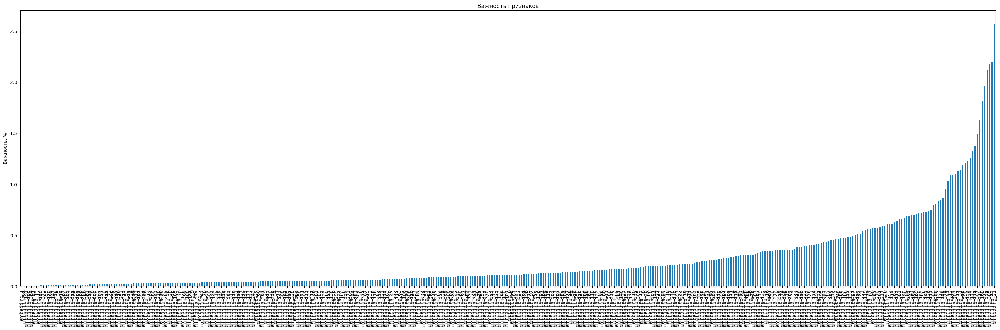

In [ ]:
cat_imp = cat_imp.sort_values()
fig, ax = plt.subplots(figsize=(30,10))
cat_imp.plot.bar(ax=ax)
ax.set_title("Важность признаков")
ax.set_ylabel('Важность, %')
fig.tight_layout()

In [ ]:
new_df2 = new_df[cat_imp[cat_imp>0.1].index]
new_df2

,embedding_3,embedding_4,embedding_6,embedding_9,embedding_11,embedding_12,embedding_13,embedding_16,embedding_18,embedding_21,...,embedding_381,embedding_385,embedding_386,embedding_387,embedding_391,embedding_393,embedding_394,embedding_396,embedding_397,embedding_398
0,0.040415,0.278039,0.316357,0.116304,0.087315,-0.057617,-0.000279,-0.118869,0.151847,0.316674,...,-0.005753,0.468178,-1.513956,0.024814,0.000541,-0.025793,0.030986,-0.116139,0.029766,-0.190496
1,-0.113344,0.249395,0.581768,0.004266,0.272467,0.093118,0.128288,-0.006872,0.005606,0.324791,...,0.261170,0.500227,-1.287326,-0.088368,0.140546,0.133222,0.127088,-0.168399,0.111662,0.031338
2,-0.216668,0.393028,0.215899,0.096129,0.313932,0.088167,-0.185311,-0.188275,0.030965,0.416097,...,0.205454,0.260813,-1.082642,-0.145358,0.194889,-0.102985,-0.121206,-0.066927,-0.256851,-0.415959
3,-0.001142,0.128156,0.130710,-0.051182,-0.084113,0.067035,-0.223184,-0.113545,0.206100,0.071355,...,-0.032944,0.416399,-1.497721,0.126626,0.193678,-0.114598,-0.051505,-0.083608,-0.007730,-0.036188
4,-0.107649,0.096227,-0.099241,0.027104,0.057429,0.144506,0.018572,-0.060831,0.111410,-0.159331,...,0.276537,0.256631,-1.131454,0.139325,0.252328,-0.138909,0.032502,0.022255,-0.103604,-0.215580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4814,-0.018309,0.294615,0.129598,0.164873,0.784660,0.034439,0.184096,0.313184,-0.286012,0.449784,...,0.332301,0.449592,-1.259443,-0.191415,0.256774,0.077200,0.044861,-0.469715,0.001043,-0.131202
4815,-0.580462,0.249877,0.040280,0.005568,0.265532,-0.170177,-0.274763,-0.159550,0.014040,0.226143,...,0.209211,0.302907,-0.934682,0.172345,0.132021,0.025935,-0.014111,-0.248892,-0.064175,-0.337411
4816,-0.142908,-0.006274,0.114298,0.179234,-0.004903,-0.113917,-0.039557,0.080598,-0.016831,-0.069295,...,0.006247,0.045776,-0.941180,-0.061301,0.091124,0.070399,-0.384205,-0.068614,0.034980,-0.220614
4817,-0.210600,0.288571,0.163821,-0.052558,0.006406,0.004781,-0.196862,-0.318859,-0.058723,0.347471,...,0.178275,0.308533,-1.299491,-0.007333,0.088474,-0.173466,0.075572,-0.084657,-0.142123,-0.115815


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


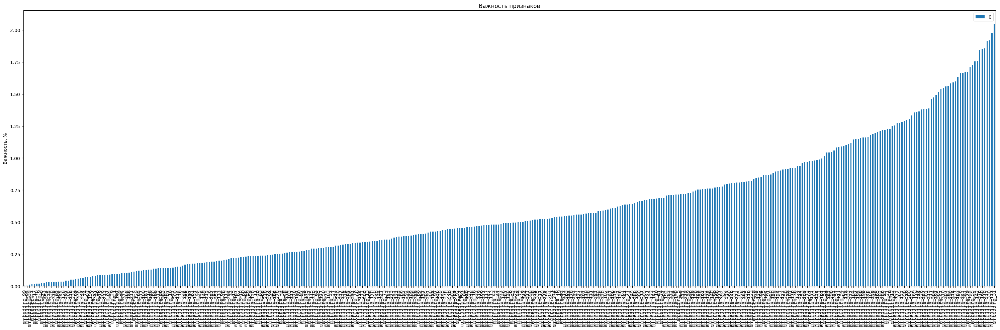

In [ ]:
from sklearn.linear_model import LogisticRegression
from matplotlib import pyplot
import numpy as np

model = LogisticRegression(C = 0.73, random_state = 2)
# fit the model
model.fit(X_train, y_train)
# get importance

importance = np.abs(model.coef_[0])
# summarize feature importance
# plot feature importance

importances_reg = pd.DataFrame(data = importance, index = X_train.columns).sort_values(0)

fig, ax = plt.subplots(figsize=(30,10))
importances_reg.plot.bar(ax=ax)
ax.set_title("Важность признаков")
ax.set_ylabel('Важность, %')
fig.tight_layout()

In [ ]:
tmp = importances_reg[importances_reg[0]>0.1].index.copy()
tmp = list(tmp)
tmp.append('label')
new_df[tmp].to_csv('with_importance_for_log_reg.csv')

In [ ]:
X_train

,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,...,embedding_391,embedding_392,embedding_393,embedding_394,embedding_395,embedding_396,embedding_397,embedding_398,embedding_399,embedding_400
136,-0.027555,-0.127245,-0.121562,0.182009,-0.169244,0.120603,-0.288295,0.048667,0.171518,0.378976,...,-0.261801,-0.013533,0.138930,0.389529,0.019655,0.051894,-0.023275,-0.190158,0.074355,0.040403
2082,-0.063565,0.089119,-0.105368,0.098809,0.001169,0.112612,-0.036599,0.005368,-0.028303,0.168523,...,0.098482,0.130583,-0.046272,0.005277,-0.053436,-0.004981,0.013803,-0.038690,0.188102,0.025811
1246,0.214138,-0.122364,-0.188520,0.164886,-0.179079,0.449825,0.236338,0.365116,0.066194,-0.358525,...,0.323232,0.066790,-0.170272,0.146326,-0.090123,-0.240014,0.128455,-0.080164,0.210417,-0.061899
1686,0.255308,-0.275045,-0.269386,0.141878,-0.213217,0.255551,0.245827,0.258721,0.114415,-0.300657,...,0.159692,-0.046333,-0.300726,0.007646,-0.234011,-0.018468,-0.114873,-0.164063,0.375719,0.009529
4292,-0.053453,0.024700,0.025297,-0.046250,-0.173568,0.372320,-0.322138,0.090521,-0.235170,0.219438,...,-0.113020,0.103082,-0.120075,0.546144,-0.141195,-0.212333,-0.054379,0.037987,0.422191,0.116362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2966,0.092682,-0.152772,-0.016301,0.049960,-0.325480,-0.005640,-0.089502,0.202813,0.066279,0.092791,...,0.069201,0.039260,-0.304389,0.246793,0.095935,0.161363,-0.096990,-0.054021,0.148384,0.155642
1467,-0.343900,-0.066075,0.072993,0.162561,-0.065956,0.539134,-0.282393,-0.175620,-0.217350,0.048337,...,-0.009999,-0.056057,0.145676,0.428423,-0.110967,-0.410669,0.121692,0.137834,0.402669,0.202632
3166,0.394478,-0.301392,-0.335202,0.093281,-0.099505,-0.022161,0.034004,0.295518,0.181288,-0.240516,...,0.324900,-0.105267,-0.164202,-0.057564,-0.081179,0.060778,0.089987,-0.224708,0.378366,0.042300
2197,0.128511,-0.127436,-0.306849,0.279952,-0.061780,0.238032,-0.082839,0.104887,0.001275,-0.301012,...,0.082663,0.275757,-0.052734,0.045351,-0.040752,-0.399752,0.000479,-0.415251,0.423997,0.059006


In [ ]:
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from matplotlib import pyplot
import numpy as np

model = LogisticRegression(C = 0.73, random_state = 1)
# fit the model
model.fit(X_train, y_train)
# get importance

# train the model
# make the prediction using the resulting model
preds_class = model.predict(X_test)
preds_proba = model.predict_proba(X_test)
# res.append(f1_score(y_test, preds_class))
print("F1", f1_score(y_test, preds_class))

F1 0.9313835770528684


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
X_train

,embedding_1,embedding_2,embedding_3,embedding_4,embedding_5,embedding_6,embedding_7,embedding_8,embedding_9,embedding_10,...,embedding_391,embedding_392,embedding_393,embedding_394,embedding_395,embedding_396,embedding_397,embedding_398,embedding_399,embedding_400
3432,0.110114,-0.083139,-0.036073,0.086818,-0.061964,0.233790,0.044653,0.111494,0.130520,0.270056,...,-0.062428,0.059757,-0.250998,-0.070522,-0.192184,0.111058,0.025925,-0.293650,0.138003,0.223085
3849,0.213202,-0.501551,-0.201138,0.255924,0.177744,0.097506,-0.238097,0.173461,0.067982,-0.259252,...,0.330952,-0.069812,0.016387,-0.271102,-0.156277,0.005518,0.123363,-0.195678,0.066542,0.020308
4355,0.063454,-0.087879,0.069842,0.222981,0.015330,0.139117,0.081740,-0.028032,0.153510,0.485218,...,-0.093543,0.122057,-0.020015,-0.196814,-0.212164,0.037841,0.052050,-0.172382,0.068170,0.144435
854,0.648516,-0.529687,0.072295,0.199746,0.106183,0.196399,-0.424656,0.158702,0.003803,0.089332,...,-0.287063,0.172906,0.002722,0.192101,-0.087627,-0.114209,0.002489,-0.217095,0.048124,-0.151321
643,0.016686,0.075614,0.002501,0.116450,0.069488,0.061976,-0.023116,0.033961,-0.021047,0.096422,...,0.180642,0.009025,-0.035896,-0.038710,-0.119673,0.007798,-0.094397,-0.171322,0.192512,-0.004141
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2895,-0.155359,-0.083574,-0.192061,0.104023,-0.135286,0.289514,0.081599,0.062785,0.244247,0.245097,...,0.130566,-0.101026,-0.007065,0.302052,-0.173293,-0.010190,-0.052157,-0.016113,0.163496,0.107586
2763,-0.026633,-0.383610,-0.274556,0.197964,-0.029556,-0.065682,0.272287,0.312152,-0.163062,0.008153,...,0.190620,-0.323069,0.168544,-0.276013,0.014374,0.044088,-0.007785,-0.241008,0.135688,0.275354
905,-0.061135,-0.223403,0.019045,0.187970,-0.164277,0.064453,-0.346440,0.015614,0.039551,0.114089,...,-0.012283,0.203387,-0.290666,0.061948,0.014105,-0.053889,-0.286850,-0.139013,0.436315,0.228061
3980,-0.205703,-0.037789,-0.016313,0.136057,-0.079973,0.063848,-0.183866,0.248208,0.211243,-0.177951,...,0.052991,0.226574,-0.320993,0.350736,0.076516,0.079846,0.007841,-0.114004,0.235967,0.074710


In [ ]:
!pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 36.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 119.9 MB/s eta 0:00:00


In [ ]:
import pandas as pd
from transformers import BertTokenizer, BertModel, RobertaTokenizer
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from matplotlib import pyplot
import numpy as np
from tqdm import tqdm
import torch


def train_and_make_predictions(X_train, y_train):#, X_test):
    model = LogisticRegression(C = 0.73, random_state = 1)
    model.fit(X_train, y_train)
    # preds_class = model.predict(X_test)
    preds_class = model.predict(X_train)
    print(f1_score(y_train, preds_class))
    return preds_class

# Function to get BERT embeddings for a given text
def get_bert_embeddings(text):
    # device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    tokenizer_multi = BertTokenizer.from_pretrained('bert-base-multilingual-cased')
    model_multi = BertModel.from_pretrained("bert-base-multilingual-cased")
    encoded_input = tokenizer_multi(text, return_tensors='pt', max_length=100, truncation=True, padding=True)
    # model_multi = model_multi.to(device)
    with torch.no_grad():
        outputs = model_multi(**encoded_input)
        embeddings = outputs.last_hidden_state[:, 0, :].squeeze()  # Extract the embeddings from the last layer
    return embeddings.tolist()

def get_bert_embeddings_eng(text):
    # device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    tokenizer_eng = RobertaTokenizer.from_pretrained('Roberta-large')
    model_eng = BertModel.from_pretrained("Roberta-large")
    # model = model_eng.to(device)
    encoded_input = tokenizer_eng(text, return_tensors='pt', max_length=100, truncation=True, padding=True)
    # encoded_input.to(device)
    with torch.no_grad():
        outputs = model_eng(**encoded_input)
        embeddings = outputs.last_hidden_state[:, 0, :].squeeze()  # Extract the embeddings from the last layer
    return embeddings.tolist()


def get_bert_embeddings_ru(text):
    # device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    tokenizer_ru = RobertaTokenizer.from_pretrained('sberbank-ai/ruRoberta-large')
    model_ru = BertModel.from_pretrained("sberbank-ai/ruRoberta-large")
    # model_ru = model_ru.to(device)
    encoded_input = tokenizer_ru(text, return_tensors='pt', max_length=100, truncation=True, padding=True)
    # encoded_input.to(device)
    with torch.no_grad():
        outputs = model_ru(**encoded_input)
        embeddings = outputs.last_hidden_state[:, 0, :].squeeze()  # Extract the embeddings from the last layer
    return embeddings.tolist()


def prepare_data(df):
    # device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    new_columns = [f'embedding{i+1}' for i in range(100)]
    new_df = pd.DataFrame(columns=new_columns)
    for index, row in tqdm(df.iterrows()):
      text = row['ans_text']
      # # Get the BERT embeddings for the text
      # embeddings = get_bert_embeddings_ru(text)
      # # Ensure that the embeddings list has exactly 100 elements
      # embeddings = embeddings[:100] + [0] * max(0, 100 - len(embeddings))
      # new_df.loc[index] = embeddings
      # embeddings_eng = get_bert_embeddings_eng(text)
      # # Add the new row to the new DataFrame
      # # Ensure that the embeddings list has exactly 100 elements
      # embeddings_eng = embeddings_eng[:100] + [0] * max(0, 100 - len(embeddings_eng))
      # new_df.loc[index] = embeddings_eng
      embeddings_multi = get_bert_embeddings(text)
      # Add the new row to the new DataFrame
      # Ensure that the embeddings list has exactly 100 elements
      embeddings_multi = embeddings_multi[:100] + [0] * max(0, 100 - len(embeddings_multi))
      new_df.loc[index] = embeddings_multi

# def prepare_data(df):
#     new_columns = [f'embedding_{i+1}' for i in range(400)]# + ['label']
#     new_df = pd.DataFrame(columns=new_columns)
#     for index, row in tqdm(df.iterrows()):
#         text = row['ans_text']
#         embeddings = get_bert_embeddings(text)
#         embeddings = embeddings[:400] + [0] * max(0, 400 - len(embeddings))
#         new_df.loc[index] = embeddings
#     print(new_df)
#     return new_df


if __name__ == "__main__":
    df_train = pd.read_csv("data/train.csv")
    df = df_train[["ans_text"]]
    y_train = df_train.label.replace(["ai_answer", "hu_answer"], [0,1])

    # df_test = pd.read_csv("data/test.csv")
    # ans_test = df_test[["ans_text"]]

    emb_train = prepare_data(df)
    # emb_test = prepare_data(ans_test)

    y_pred = train_and_make_predictions(emb_train, y_train)#, emb_test)
    print(y_pred)
    # df_test["label"] = y_pred
    # df_test["label"] = df_test["label"].map({1: 'ai_answer', 0: 'hu_answer'})
    # df_test[["line_id", "label"]].to_csv("data/submission.csv", sep=",", index=False)

0it [00:00, ?it/s]Some weights of the model checkpoint at bert-base-multilingual-cased were not used when initializing BertModel: ['cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
1it [00:03,  3.44s/it]Some weights of the model checkpoint at bert-base-multilingual-cased were not used when initializing Ber

In [ ]:
import pandas as pd
import torch
from transformers import BertTokenizer, BertModel

# Load the tokenizer and model
tokenizer = BertTokenizer.from_pretrained('bert-base-multilingual-cased')
model = BertModel.from_pretrained('bert-base-multilingual-cased')

# Function to get BERT embeddings for a given text
def get_bert_embeddings(text):
    encoded_input = tokenizer(text, return_tensors='pt', max_length=200, truncation=True, padding=True)
    with torch.no_grad():
        outputs = model(**encoded_input)
        embeddings = outputs.last_hidden_state[:, 0, :].squeeze()  # Extract the embeddings from the last layer
    return embeddings.tolist()

# Create a new DataFrame to store the embedding features and labels
new_columns = [f'embedding_{i+1}' for i in range(200)]
new_df = pd.DataFrame(columns=new_columns)

# Iterate over each row in the original DataFrame
iter_df = df[['ans_text']]
for index, row in tqdm(iter_df.iterrows()):
    text = row['ans_text']
    #label = row['label']

    # Get the BERT embeddings for the text
    embeddings = get_bert_embeddings(text)

    # Ensure that the embeddings list has exactly 100 elements
    embeddings = embeddings[:200] + [0] * max(0, 200 - len(embeddings))

    # Create a new row for the embedding features and label
    #new_row = embeddings + [int(label)]

    # Add the new row to the new DataFrame
    print(new_df)
    new_df.loc[index] = embeddings

Some weights of the model checkpoint at bert-base-multilingual-cased were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
1it [00:00,  1.04it/s]

Empty DataFrame
Columns: [embedding_1, embedding_2, embedding_3, embedding_4, embedding_5, embedding_6, embedding_7, embedding_8, embedding_9, embedding_10, embedding_11, embedding_12, embedding_13, embedding_14, embedding_15, embedding_16, embedding_17, embedding_18, embedding_19, embedding_20, embedding_21, embedding_22, embedding_23, embedding_24, embedding_25, embedding_26, embedding_27, embedding_28, embedding_29, embedding_30, embedding_31, embedding_32, embedding_33, embedding_34, embedding_35, embedding_36, embedding_37, embedding_38, embedding_39, embedding_40, embedding_41, embedding_42, embedding_43, embedding_44, embedding_45, embedding_46, embedding_47, embedding_48, embedding_49, embedding_50, embedding_51, embedding_52, embedding_53, embedding_54, embedding_55, embedding_56, embedding_57, embedding_58, embedding_59, embedding_60, embedding_61, embedding_62, embedding_63, embedding_64, embedding_65, embedding_66, embedding_67, embedding_68, embedding_69, embedding_70, emb

2it [00:01,  1.04it/s]

   embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0     0.030712    -0.103091     0.040415     0.278039     0.006219   

   embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0     0.316357    -0.120499     0.100734     0.116304      0.132695  ...   

   embedding_191  embedding_192  embedding_193  embedding_194  embedding_195  \
0       0.057633       0.109373        0.17498       0.069028       0.086264   

   embedding_196  embedding_197  embedding_198  embedding_199  embedding_200  
0       0.032593      -0.118196       0.227727      -0.002694      -0.146575  

[1 rows x 200 columns]


3it [00:02,  1.02it/s]

   embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0     0.030712    -0.103091     0.040415     0.278039     0.006219   
1    -0.335276    -0.161907    -0.113344     0.249395     0.046125   

   embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0     0.316357    -0.120499     0.100734     0.116304      0.132695  ...   
1     0.581768    -0.127561    -0.058241     0.004266      0.069076  ...   

   embedding_191  embedding_192  embedding_193  embedding_194  embedding_195  \
0       0.057633       0.109373       0.174980       0.069028       0.086264   
1      -0.121708       0.158281       0.484973       0.046530       0.137015   

   embedding_196  embedding_197  embedding_198  embedding_199  embedding_200  
0       0.032593      -0.118196       0.227727      -0.002694      -0.146575  
1       0.036518       0.096831       0.455166      -0.023831      -0.173246  

[2 rows x 200 columns]


4it [00:03,  1.27it/s]

   embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0     0.030712    -0.103091     0.040415     0.278039     0.006219   
1    -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2     0.012323    -0.214180    -0.160432     0.278156     0.117725   

   embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0     0.316357    -0.120499     0.100734     0.116304      0.132695  ...   
1     0.581768    -0.127561    -0.058241     0.004266      0.069076  ...   
2     0.128880    -0.069223     0.169652     0.088277      0.057202  ...   

   embedding_191  embedding_192  embedding_193  embedding_194  embedding_195  \
0       0.057633       0.109373       0.174980       0.069028       0.086264   
1      -0.121708       0.158281       0.484973       0.046530       0.137015   
2      -0.059822       0.201892       0.418998       0.224828      -0.036069   

   embedding_196  embedding_197  embedding_198  embedding_199  embedding_200  
0       0.0325

5it [00:03,  1.45it/s]

   embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0     0.030712    -0.103091     0.040415     0.278039     0.006219   
1    -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2     0.012323    -0.214180    -0.160432     0.278156     0.117725   
3     0.025947    -0.018504    -0.001142     0.128156     0.069749   

   embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0     0.316357    -0.120499     0.100734     0.116304      0.132695  ...   
1     0.581768    -0.127561    -0.058241     0.004266      0.069076  ...   
2     0.128880    -0.069223     0.169652     0.088277      0.057202  ...   
3     0.130710    -0.226540    -0.009126    -0.051182      0.173942  ...   

   embedding_191  embedding_192  embedding_193  embedding_194  embedding_195  \
0       0.057633       0.109373       0.174980       0.069028       0.086264   
1      -0.121708       0.158281       0.484973       0.046530       0.137015   
2      -0.059822       0.201

6it [00:04,  1.50it/s]

   embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0     0.030712    -0.103091     0.040415     0.278039     0.006219   
1    -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2     0.012323    -0.214180    -0.160432     0.278156     0.117725   
3     0.025947    -0.018504    -0.001142     0.128156     0.069749   
4     0.367427    -0.226657    -0.107649     0.096227    -0.084828   

   embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0     0.316357    -0.120499     0.100734     0.116304      0.132695  ...   
1     0.581768    -0.127561    -0.058241     0.004266      0.069076  ...   
2     0.128880    -0.069223     0.169652     0.088277      0.057202  ...   
3     0.130710    -0.226540    -0.009126    -0.051182      0.173942  ...   
4    -0.099241     0.172422     0.020632     0.027104     -0.158381  ...   

   embedding_191  embedding_192  embedding_193  embedding_194  embedding_195  \
0       0.057633       0.109373       0.17

7it [00:05,  1.68it/s]

   embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0     0.030712    -0.103091     0.040415     0.278039     0.006219   
1    -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2     0.012323    -0.214180    -0.160432     0.278156     0.117725   
3     0.025947    -0.018504    -0.001142     0.128156     0.069749   
4     0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5    -0.232625    -0.113288    -0.046493     0.224207    -0.371493   

   embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0     0.316357    -0.120499     0.100734     0.116304      0.132695  ...   
1     0.581768    -0.127561    -0.058241     0.004266      0.069076  ...   
2     0.128880    -0.069223     0.169652     0.088277      0.057202  ...   
3     0.130710    -0.226540    -0.009126    -0.051182      0.173942  ...   
4    -0.099241     0.172422     0.020632     0.027104     -0.158381  ...   
5     0.172810    -0.202255     0.172062    -0.162695

8it [00:05,  1.95it/s]

   embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0     0.030712    -0.103091     0.040415     0.278039     0.006219   
1    -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2     0.012323    -0.214180    -0.160432     0.278156     0.117725   
3     0.025947    -0.018504    -0.001142     0.128156     0.069749   
4     0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5    -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6    -0.077909     0.072475    -0.053247     0.142563     0.090397   

   embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0     0.316357    -0.120499     0.100734     0.116304      0.132695  ...   
1     0.581768    -0.127561    -0.058241     0.004266      0.069076  ...   
2     0.128880    -0.069223     0.169652     0.088277      0.057202  ...   
3     0.130710    -0.226540    -0.009126    -0.051182      0.173942  ...   
4    -0.099241     0.172422     0.020632     0.027104     -

9it [00:06,  1.76it/s]

   embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0     0.030712    -0.103091     0.040415     0.278039     0.006219   
1    -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2     0.012323    -0.214180    -0.160432     0.278156     0.117725   
3     0.025947    -0.018504    -0.001142     0.128156     0.069749   
4     0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5    -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6    -0.077909     0.072475    -0.053247     0.142563     0.090397   
7    -0.316855     0.040115    -0.400135    -0.041076    -0.140741   

   embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0     0.316357    -0.120499     0.100734     0.116304      0.132695  ...   
1     0.581768    -0.127561    -0.058241     0.004266      0.069076  ...   
2     0.128880    -0.069223     0.169652     0.088277      0.057202  ...   
3     0.130710    -0.226540    -0.009126    -0.051182      0.1739

11it [00:06,  2.36it/s]

   embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0     0.030712    -0.103091     0.040415     0.278039     0.006219   
1    -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2     0.012323    -0.214180    -0.160432     0.278156     0.117725   
3     0.025947    -0.018504    -0.001142     0.128156     0.069749   
4     0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5    -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6    -0.077909     0.072475    -0.053247     0.142563     0.090397   
7    -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8     0.271804    -0.549762    -0.148706    -0.010476    -0.536839   

   embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0     0.316357    -0.120499     0.100734     0.116304      0.132695  ...   
1     0.581768    -0.127561    -0.058241     0.004266      0.069076  ...   
2     0.128880    -0.069223     0.169652     0.088277      0.057202  ..

12it [00:07,  2.42it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

13it [00:07,  2.05it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \

14it [00:08,  1.71it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   

    e

15it [00:09,  1.70it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

16it [00:10,  1.40it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

17it [00:11,  1.23it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

18it [00:12,  1.17it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

19it [00:12,  1.32it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

21it [00:13,  1.84it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

22it [00:13,  2.01it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

23it [00:14,  2.09it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

24it [00:14,  1.82it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

25it [00:15,  1.71it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

26it [00:16,  1.67it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

27it [00:16,  1.62it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

28it [00:17,  1.72it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

29it [00:17,  2.09it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

30it [00:18,  1.90it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

31it [00:18,  1.77it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

32it [00:19,  1.70it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

33it [00:20,  1.63it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

34it [00:20,  1.81it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

35it [00:21,  1.70it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

36it [00:21,  1.88it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

37it [00:22,  1.58it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

38it [00:23,  1.43it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

39it [00:23,  1.54it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

40it [00:24,  1.79it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

41it [00:25,  1.45it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

42it [00:25,  1.49it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

43it [00:26,  1.49it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

44it [00:26,  1.78it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

45it [00:27,  2.07it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

46it [00:27,  2.20it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

47it [00:28,  2.21it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

48it [00:28,  1.94it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

49it [00:29,  2.02it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

50it [00:29,  1.97it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

51it [00:30,  1.78it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

52it [00:30,  1.97it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

54it [00:31,  2.32it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

55it [00:32,  2.00it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

56it [00:32,  2.08it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

57it [00:33,  1.85it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

58it [00:33,  2.00it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

59it [00:34,  2.22it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

60it [00:34,  1.91it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

61it [00:35,  1.87it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
5     -0.232625    -0.113288    -0.046493     0.224207    -0.371493   
6     -0.077909     0.072475    -0.053247     0.142563     0.090397   
7     -0.316855     0.040115    -0.400135    -0.041076    -0.140741   
8      0.271804    -0.549762    -0.148706    -0.010476    -0.536839   
9      0.082275    -0.072718    -0.050003     0.104937    -0.037228   
10     0.404079    -0.153692    -0.156507     0.080715     0.075140   
11     0.402406    -0.324105    -0.318364     0.314339     0.110381   
12     0.193416    -0.163588     0.006607    -0.016888     0.132595   
13    

62it [00:36,  1.69it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
56     0.192061    -0.359742    -0.023874     0.240554     0.030826   
57    -0.088811     0.003900     0.073483    -0.075823    -0.118424   
58    -0.307818     0.046995    -0.557011     0.013534     0.195441   
59     0.284121    -0.410395    -0.133079     0.108967    -0.029500   
60    -0.088164    -0.088878    -0.334253     0.027833    -0.049236   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

63it [00:36,  1.57it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
57    -0.088811     0.003900     0.073483    -0.075823    -0.118424   
58    -0.307818     0.046995    -0.557011     0.013534     0.195441   
59     0.284121    -0.410395    -0.133079     0.108967    -0.029500   
60    -0.088164    -0.088878    -0.334253     0.027833    -0.049236   
61     0.184137    -0.062798     0.207534    -0.015078    -0.174879   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

64it [00:37,  1.31it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
58    -0.307818     0.046995    -0.557011     0.013534     0.195441   
59     0.284121    -0.410395    -0.133079     0.108967    -0.029500   
60    -0.088164    -0.088878    -0.334253     0.027833    -0.049236   
61     0.184137    -0.062798     0.207534    -0.015078    -0.174879   
62    -0.073366     0.089467     0.019484     0.158632     0.037880   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

65it [00:38,  1.25it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
59     0.284121    -0.410395    -0.133079     0.108967    -0.029500   
60    -0.088164    -0.088878    -0.334253     0.027833    -0.049236   
61     0.184137    -0.062798     0.207534    -0.015078    -0.174879   
62    -0.073366     0.089467     0.019484     0.158632     0.037880   
63     0.213108    -0.120780    -0.521033     0.016349    -0.087383   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

66it [00:39,  1.38it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
60    -0.088164    -0.088878    -0.334253     0.027833    -0.049236   
61     0.184137    -0.062798     0.207534    -0.015078    -0.174879   
62    -0.073366     0.089467     0.019484     0.158632     0.037880   
63     0.213108    -0.120780    -0.521033     0.016349    -0.087383   
64     0.591098    -0.563556    -0.375708     0.183806    -0.140758   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

67it [00:40,  1.33it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
61     0.184137    -0.062798     0.207534    -0.015078    -0.174879   
62    -0.073366     0.089467     0.019484     0.158632     0.037880   
63     0.213108    -0.120780    -0.521033     0.016349    -0.087383   
64     0.591098    -0.563556    -0.375708     0.183806    -0.140758   
65     0.037477    -0.276620    -0.161579     0.471352    -0.050513   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

68it [00:40,  1.36it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
62    -0.073366     0.089467     0.019484     0.158632     0.037880   
63     0.213108    -0.120780    -0.521033     0.016349    -0.087383   
64     0.591098    -0.563556    -0.375708     0.183806    -0.140758   
65     0.037477    -0.276620    -0.161579     0.471352    -0.050513   
66     0.187839    -0.023324     0.662108     0.014522    -0.081574   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

69it [00:41,  1.67it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
63     0.213108    -0.120780    -0.521033     0.016349    -0.087383   
64     0.591098    -0.563556    -0.375708     0.183806    -0.140758   
65     0.037477    -0.276620    -0.161579     0.471352    -0.050513   
66     0.187839    -0.023324     0.662108     0.014522    -0.081574   
67     0.248429    -0.169533    -0.497040     0.339028     0.309217   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

70it [00:41,  1.62it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
64     0.591098    -0.563556    -0.375708     0.183806    -0.140758   
65     0.037477    -0.276620    -0.161579     0.471352    -0.050513   
66     0.187839    -0.023324     0.662108     0.014522    -0.081574   
67     0.248429    -0.169533    -0.497040     0.339028     0.309217   
68     0.288489    -0.192745    -0.056545    -0.006983     0.304469   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

71it [00:42,  1.57it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
65     0.037477    -0.276620    -0.161579     0.471352    -0.050513   
66     0.187839    -0.023324     0.662108     0.014522    -0.081574   
67     0.248429    -0.169533    -0.497040     0.339028     0.309217   
68     0.288489    -0.192745    -0.056545    -0.006983     0.304469   
69     0.193288    -0.156867    -0.258507     0.311766    -0.045358   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

72it [00:42,  1.75it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
66     0.187839    -0.023324     0.662108     0.014522    -0.081574   
67     0.248429    -0.169533    -0.497040     0.339028     0.309217   
68     0.288489    -0.192745    -0.056545    -0.006983     0.304469   
69     0.193288    -0.156867    -0.258507     0.311766    -0.045358   
70     0.054702    -0.101241    -0.113503    -0.074459     0.196227   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

73it [00:43,  1.88it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
67     0.248429    -0.169533    -0.497040     0.339028     0.309217   
68     0.288489    -0.192745    -0.056545    -0.006983     0.304469   
69     0.193288    -0.156867    -0.258507     0.311766    -0.045358   
70     0.054702    -0.101241    -0.113503    -0.074459     0.196227   
71    -0.209380    -0.103074    -0.093873     0.142879     0.087866   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

74it [00:43,  1.93it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
68     0.288489    -0.192745    -0.056545    -0.006983     0.304469   
69     0.193288    -0.156867    -0.258507     0.311766    -0.045358   
70     0.054702    -0.101241    -0.113503    -0.074459     0.196227   
71    -0.209380    -0.103074    -0.093873     0.142879     0.087866   
72     0.090656     0.003643    -0.050248     0.147639     0.037431   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

75it [00:44,  1.86it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
69     0.193288    -0.156867    -0.258507     0.311766    -0.045358   
70     0.054702    -0.101241    -0.113503    -0.074459     0.196227   
71    -0.209380    -0.103074    -0.093873     0.142879     0.087866   
72     0.090656     0.003643    -0.050248     0.147639     0.037431   
73    -0.139166     0.072170    -0.171619     0.298283     0.041588   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

76it [00:44,  1.98it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
70     0.054702    -0.101241    -0.113503    -0.074459     0.196227   
71    -0.209380    -0.103074    -0.093873     0.142879     0.087866   
72     0.090656     0.003643    -0.050248     0.147639     0.037431   
73    -0.139166     0.072170    -0.171619     0.298283     0.041588   
74     0.122722    -0.359544    -0.087160     0.487618     0.179847   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

77it [00:45,  1.80it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
71    -0.209380    -0.103074    -0.093873     0.142879     0.087866   
72     0.090656     0.003643    -0.050248     0.147639     0.037431   
73    -0.139166     0.072170    -0.171619     0.298283     0.041588   
74     0.122722    -0.359544    -0.087160     0.487618     0.179847   
75    -0.107164    -0.149120     0.015055     0.095610    -0.021285   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

78it [00:45,  1.98it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
72     0.090656     0.003643    -0.050248     0.147639     0.037431   
73    -0.139166     0.072170    -0.171619     0.298283     0.041588   
74     0.122722    -0.359544    -0.087160     0.487618     0.179847   
75    -0.107164    -0.149120     0.015055     0.095610    -0.021285   
76     0.196497    -0.206485     0.090391    -0.004263    -0.072549   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

79it [00:46,  1.98it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
73    -0.139166     0.072170    -0.171619     0.298283     0.041588   
74     0.122722    -0.359544    -0.087160     0.487618     0.179847   
75    -0.107164    -0.149120     0.015055     0.095610    -0.021285   
76     0.196497    -0.206485     0.090391    -0.004263    -0.072549   
77    -0.041162     0.073640     0.053149     0.219250     0.106607   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

80it [00:46,  2.04it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
74     0.122722    -0.359544    -0.087160     0.487618     0.179847   
75    -0.107164    -0.149120     0.015055     0.095610    -0.021285   
76     0.196497    -0.206485     0.090391    -0.004263    -0.072549   
77    -0.041162     0.073640     0.053149     0.219250     0.106607   
78    -0.062637    -0.119883    -0.194597    -0.122416     0.050278   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

81it [00:47,  1.90it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
75    -0.107164    -0.149120     0.015055     0.095610    -0.021285   
76     0.196497    -0.206485     0.090391    -0.004263    -0.072549   
77    -0.041162     0.073640     0.053149     0.219250     0.106607   
78    -0.062637    -0.119883    -0.194597    -0.122416     0.050278   
79     0.005075    -0.240071    -0.131527    -0.067298     0.047299   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

82it [00:48,  1.75it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
76     0.196497    -0.206485     0.090391    -0.004263    -0.072549   
77    -0.041162     0.073640     0.053149     0.219250     0.106607   
78    -0.062637    -0.119883    -0.194597    -0.122416     0.050278   
79     0.005075    -0.240071    -0.131527    -0.067298     0.047299   
80    -0.000336    -0.065623    -0.186290     0.311180     0.062465   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

83it [00:48,  1.78it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
77    -0.041162     0.073640     0.053149     0.219250     0.106607   
78    -0.062637    -0.119883    -0.194597    -0.122416     0.050278   
79     0.005075    -0.240071    -0.131527    -0.067298     0.047299   
80    -0.000336    -0.065623    -0.186290     0.311180     0.062465   
81     0.424630    -0.357840    -0.221466     0.122457     0.129932   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

84it [00:50,  1.08it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
78    -0.062637    -0.119883    -0.194597    -0.122416     0.050278   
79     0.005075    -0.240071    -0.131527    -0.067298     0.047299   
80    -0.000336    -0.065623    -0.186290     0.311180     0.062465   
81     0.424630    -0.357840    -0.221466     0.122457     0.129932   
82    -0.199089     0.049794    -0.068764     0.174557     0.198267   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

85it [00:51,  1.04it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
79     0.005075    -0.240071    -0.131527    -0.067298     0.047299   
80    -0.000336    -0.065623    -0.186290     0.311180     0.062465   
81     0.424630    -0.357840    -0.221466     0.122457     0.129932   
82    -0.199089     0.049794    -0.068764     0.174557     0.198267   
83     0.083782    -0.007961     0.487441    -0.054105    -0.274191   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

86it [00:52,  1.01it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
80    -0.000336    -0.065623    -0.186290     0.311180     0.062465   
81     0.424630    -0.357840    -0.221466     0.122457     0.129932   
82    -0.199089     0.049794    -0.068764     0.174557     0.198267   
83     0.083782    -0.007961     0.487441    -0.054105    -0.274191   
84    -0.139138    -0.265691    -0.098080    -0.026718    -0.029737   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

87it [00:53,  1.15it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
81     0.424630    -0.357840    -0.221466     0.122457     0.129932   
82    -0.199089     0.049794    -0.068764     0.174557     0.198267   
83     0.083782    -0.007961     0.487441    -0.054105    -0.274191   
84    -0.139138    -0.265691    -0.098080    -0.026718    -0.029737   
85     0.078509    -0.399295     0.294838     0.016935    -0.575188   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

88it [00:53,  1.14it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
82    -0.199089     0.049794    -0.068764     0.174557     0.198267   
83     0.083782    -0.007961     0.487441    -0.054105    -0.274191   
84    -0.139138    -0.265691    -0.098080    -0.026718    -0.029737   
85     0.078509    -0.399295     0.294838     0.016935    -0.575188   
86     0.144786    -0.291660    -0.222465     0.338691     0.025831   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

89it [00:54,  1.23it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
83     0.083782    -0.007961     0.487441    -0.054105    -0.274191   
84    -0.139138    -0.265691    -0.098080    -0.026718    -0.029737   
85     0.078509    -0.399295     0.294838     0.016935    -0.575188   
86     0.144786    -0.291660    -0.222465     0.338691     0.025831   
87     0.265307    -0.297243    -0.093510     0.331657     0.161622   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

90it [00:55,  1.42it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
84    -0.139138    -0.265691    -0.098080    -0.026718    -0.029737   
85     0.078509    -0.399295     0.294838     0.016935    -0.575188   
86     0.144786    -0.291660    -0.222465     0.338691     0.025831   
87     0.265307    -0.297243    -0.093510     0.331657     0.161622   
88     0.468014    -0.262362    -0.103555     0.449977    -0.404343   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

91it [00:55,  1.53it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
85     0.078509    -0.399295     0.294838     0.016935    -0.575188   
86     0.144786    -0.291660    -0.222465     0.338691     0.025831   
87     0.265307    -0.297243    -0.093510     0.331657     0.161622   
88     0.468014    -0.262362    -0.103555     0.449977    -0.404343   
89     0.034122    -0.162253    -0.335100     0.195995     0.216091   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

92it [00:56,  1.52it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
86     0.144786    -0.291660    -0.222465     0.338691     0.025831   
87     0.265307    -0.297243    -0.093510     0.331657     0.161622   
88     0.468014    -0.262362    -0.103555     0.449977    -0.404343   
89     0.034122    -0.162253    -0.335100     0.195995     0.216091   
90    -0.085044    -0.036507     0.167446     0.095738     0.082288   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

93it [00:56,  1.82it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
87     0.265307    -0.297243    -0.093510     0.331657     0.161622   
88     0.468014    -0.262362    -0.103555     0.449977    -0.404343   
89     0.034122    -0.162253    -0.335100     0.195995     0.216091   
90    -0.085044    -0.036507     0.167446     0.095738     0.082288   
91    -0.531323    -0.053708     0.080263     0.114046     0.113703   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

94it [00:57,  1.77it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
88     0.468014    -0.262362    -0.103555     0.449977    -0.404343   
89     0.034122    -0.162253    -0.335100     0.195995     0.216091   
90    -0.085044    -0.036507     0.167446     0.095738     0.082288   
91    -0.531323    -0.053708     0.080263     0.114046     0.113703   
92     0.033648    -0.473582     0.219946     0.227979     0.347199   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

95it [00:57,  2.03it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
89     0.034122    -0.162253    -0.335100     0.195995     0.216091   
90    -0.085044    -0.036507     0.167446     0.095738     0.082288   
91    -0.531323    -0.053708     0.080263     0.114046     0.113703   
92     0.033648    -0.473582     0.219946     0.227979     0.347199   
93    -0.083178    -0.235626    -0.217175     0.353412     0.034736   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

96it [00:57,  2.32it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
90    -0.085044    -0.036507     0.167446     0.095738     0.082288   
91    -0.531323    -0.053708     0.080263     0.114046     0.113703   
92     0.033648    -0.473582     0.219946     0.227979     0.347199   
93    -0.083178    -0.235626    -0.217175     0.353412     0.034736   
94    -0.168445    -0.091589     0.056936     0.100351     0.536352   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

97it [00:58,  2.17it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
91    -0.531323    -0.053708     0.080263     0.114046     0.113703   
92     0.033648    -0.473582     0.219946     0.227979     0.347199   
93    -0.083178    -0.235626    -0.217175     0.353412     0.034736   
94    -0.168445    -0.091589     0.056936     0.100351     0.536352   
95    -0.043504    -0.050662     0.258068     0.009083     0.252008   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

98it [00:59,  1.91it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
92     0.033648    -0.473582     0.219946     0.227979     0.347199   
93    -0.083178    -0.235626    -0.217175     0.353412     0.034736   
94    -0.168445    -0.091589     0.056936     0.100351     0.536352   
95    -0.043504    -0.050662     0.258068     0.009083     0.252008   
96    -0.257047    -0.100076    -0.052694     0.118873     0.010799   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

99it [00:59,  1.76it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
93    -0.083178    -0.235626    -0.217175     0.353412     0.034736   
94    -0.168445    -0.091589     0.056936     0.100351     0.536352   
95    -0.043504    -0.050662     0.258068     0.009083     0.252008   
96    -0.257047    -0.100076    -0.052694     0.118873     0.010799   
97     0.060716    -0.075118     0.035478    -0.025878    -0.046458   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

100it [01:00,  1.92it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
94    -0.168445    -0.091589     0.056936     0.100351     0.536352   
95    -0.043504    -0.050662     0.258068     0.009083     0.252008   
96    -0.257047    -0.100076    -0.052694     0.118873     0.010799   
97     0.060716    -0.075118     0.035478    -0.025878    -0.046458   
98    -0.419615     0.071380    -0.252807    -0.150565    -0.030806   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

101it [01:00,  1.77it/s]

    embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0      0.030712    -0.103091     0.040415     0.278039     0.006219   
1     -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2      0.012323    -0.214180    -0.160432     0.278156     0.117725   
3      0.025947    -0.018504    -0.001142     0.128156     0.069749   
4      0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..          ...          ...          ...          ...          ...   
95    -0.043504    -0.050662     0.258068     0.009083     0.252008   
96    -0.257047    -0.100076    -0.052694     0.118873     0.010799   
97     0.060716    -0.075118     0.035478    -0.025878    -0.046458   
98    -0.419615     0.071380    -0.252807    -0.150565    -0.030806   
99     0.162131    -0.307426     0.229842     0.134765     0.064069   

    embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0      0.316357    -0.120499     0.100734     0.116304      0.132695  

102it [01:01,  1.75it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
96     -0.257047    -0.100076    -0.052694     0.118873     0.010799   
97      0.060716    -0.075118     0.035478    -0.025878    -0.046458   
98     -0.419615     0.071380    -0.252807    -0.150565    -0.030806   
99      0.162131    -0.307426     0.229842     0.134765     0.064069   
100     0.159387    -0.487401     0.016697    -0.020366    -0.130033   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

103it [01:01,  2.00it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
97      0.060716    -0.075118     0.035478    -0.025878    -0.046458   
98     -0.419615     0.071380    -0.252807    -0.150565    -0.030806   
99      0.162131    -0.307426     0.229842     0.134765     0.064069   
100     0.159387    -0.487401     0.016697    -0.020366    -0.130033   
101     0.207912    -0.298414    -0.208380     0.116984    -0.042133   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

104it [01:02,  1.80it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
98     -0.419615     0.071380    -0.252807    -0.150565    -0.030806   
99      0.162131    -0.307426     0.229842     0.134765     0.064069   
100     0.159387    -0.487401     0.016697    -0.020366    -0.130033   
101     0.207912    -0.298414    -0.208380     0.116984    -0.042133   
102    -0.222547     0.165323     0.017687     0.369255    -0.175808   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

105it [01:02,  1.76it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
99      0.162131    -0.307426     0.229842     0.134765     0.064069   
100     0.159387    -0.487401     0.016697    -0.020366    -0.130033   
101     0.207912    -0.298414    -0.208380     0.116984    -0.042133   
102    -0.222547     0.165323     0.017687     0.369255    -0.175808   
103    -0.335409    -0.237285     0.088787    -0.264796    -0.477567   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

106it [01:03,  1.79it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
100     0.159387    -0.487401     0.016697    -0.020366    -0.130033   
101     0.207912    -0.298414    -0.208380     0.116984    -0.042133   
102    -0.222547     0.165323     0.017687     0.369255    -0.175808   
103    -0.335409    -0.237285     0.088787    -0.264796    -0.477567   
104    -0.154524     0.111962    -0.081993     0.176503     0.015699   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

107it [01:04,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
101     0.207912    -0.298414    -0.208380     0.116984    -0.042133   
102    -0.222547     0.165323     0.017687     0.369255    -0.175808   
103    -0.335409    -0.237285     0.088787    -0.264796    -0.477567   
104    -0.154524     0.111962    -0.081993     0.176503     0.015699   
105    -0.128823     0.090317    -0.286625     0.205544     0.069104   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

108it [01:05,  1.37it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
102    -0.222547     0.165323     0.017687     0.369255    -0.175808   
103    -0.335409    -0.237285     0.088787    -0.264796    -0.477567   
104    -0.154524     0.111962    -0.081993     0.176503     0.015699   
105    -0.128823     0.090317    -0.286625     0.205544     0.069104   
106     0.173557    -0.309271     0.024743     0.006131    -0.110606   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

109it [01:06,  1.35it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
103    -0.335409    -0.237285     0.088787    -0.264796    -0.477567   
104    -0.154524     0.111962    -0.081993     0.176503     0.015699   
105    -0.128823     0.090317    -0.286625     0.205544     0.069104   
106     0.173557    -0.309271     0.024743     0.006131    -0.110606   
107    -0.340965    -0.114179    -0.231732     0.097298    -0.008933   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

110it [01:07,  1.23it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
104    -0.154524     0.111962    -0.081993     0.176503     0.015699   
105    -0.128823     0.090317    -0.286625     0.205544     0.069104   
106     0.173557    -0.309271     0.024743     0.006131    -0.110606   
107    -0.340965    -0.114179    -0.231732     0.097298    -0.008933   
108    -0.021194    -0.486550    -0.291840    -0.125439    -0.247540   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

111it [01:07,  1.20it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
105    -0.128823     0.090317    -0.286625     0.205544     0.069104   
106     0.173557    -0.309271     0.024743     0.006131    -0.110606   
107    -0.340965    -0.114179    -0.231732     0.097298    -0.008933   
108    -0.021194    -0.486550    -0.291840    -0.125439    -0.247540   
109     0.148572    -0.365210    -0.167112     0.053620    -0.018035   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

112it [01:08,  1.26it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
106     0.173557    -0.309271     0.024743     0.006131    -0.110606   
107    -0.340965    -0.114179    -0.231732     0.097298    -0.008933   
108    -0.021194    -0.486550    -0.291840    -0.125439    -0.247540   
109     0.148572    -0.365210    -0.167112     0.053620    -0.018035   
110    -0.063080    -0.379973    -0.202200    -0.161104     0.080563   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

113it [01:09,  1.33it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
107    -0.340965    -0.114179    -0.231732     0.097298    -0.008933   
108    -0.021194    -0.486550    -0.291840    -0.125439    -0.247540   
109     0.148572    -0.365210    -0.167112     0.053620    -0.018035   
110    -0.063080    -0.379973    -0.202200    -0.161104     0.080563   
111     0.234272     0.191386     0.252811    -0.150279     0.025533   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

114it [01:09,  1.42it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
108    -0.021194    -0.486550    -0.291840    -0.125439    -0.247540   
109     0.148572    -0.365210    -0.167112     0.053620    -0.018035   
110    -0.063080    -0.379973    -0.202200    -0.161104     0.080563   
111     0.234272     0.191386     0.252811    -0.150279     0.025533   
112     0.005838    -0.096458    -0.096550     0.095299     0.119321   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

115it [01:10,  1.43it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
109     0.148572    -0.365210    -0.167112     0.053620    -0.018035   
110    -0.063080    -0.379973    -0.202200    -0.161104     0.080563   
111     0.234272     0.191386     0.252811    -0.150279     0.025533   
112     0.005838    -0.096458    -0.096550     0.095299     0.119321   
113     0.066468    -0.173843    -0.039436     0.009218    -0.473116   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

116it [01:11,  1.55it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
110    -0.063080    -0.379973    -0.202200    -0.161104     0.080563   
111     0.234272     0.191386     0.252811    -0.150279     0.025533   
112     0.005838    -0.096458    -0.096550     0.095299     0.119321   
113     0.066468    -0.173843    -0.039436     0.009218    -0.473116   
114     0.515917    -0.386827    -0.242816     0.263027    -0.044941   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

117it [01:11,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
111     0.234272     0.191386     0.252811    -0.150279     0.025533   
112     0.005838    -0.096458    -0.096550     0.095299     0.119321   
113     0.066468    -0.173843    -0.039436     0.009218    -0.473116   
114     0.515917    -0.386827    -0.242816     0.263027    -0.044941   
115     0.179742    -0.473858    -0.055074     0.156251    -0.167274   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

119it [01:12,  2.15it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
112     0.005838    -0.096458    -0.096550     0.095299     0.119321   
113     0.066468    -0.173843    -0.039436     0.009218    -0.473116   
114     0.515917    -0.386827    -0.242816     0.263027    -0.044941   
115     0.179742    -0.473858    -0.055074     0.156251    -0.167274   
116    -0.463085    -0.255472     0.158899    -0.280170    -0.157759   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

120it [01:13,  1.95it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
114     0.515917    -0.386827    -0.242816     0.263027    -0.044941   
115     0.179742    -0.473858    -0.055074     0.156251    -0.167274   
116    -0.463085    -0.255472     0.158899    -0.280170    -0.157759   
117    -0.136463    -0.026380    -0.185837     0.301969    -0.170363   
118     0.253023    -0.519916    -0.323955     0.331723     0.076244   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

121it [01:13,  2.01it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
115     0.179742    -0.473858    -0.055074     0.156251    -0.167274   
116    -0.463085    -0.255472     0.158899    -0.280170    -0.157759   
117    -0.136463    -0.026380    -0.185837     0.301969    -0.170363   
118     0.253023    -0.519916    -0.323955     0.331723     0.076244   
119     0.083193     0.002155    -0.079810     0.265718    -0.113582   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

122it [01:14,  1.82it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
116    -0.463085    -0.255472     0.158899    -0.280170    -0.157759   
117    -0.136463    -0.026380    -0.185837     0.301969    -0.170363   
118     0.253023    -0.519916    -0.323955     0.331723     0.076244   
119     0.083193     0.002155    -0.079810     0.265718    -0.113582   
120    -0.016678     0.090206    -0.068359     0.138551     0.130736   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

123it [01:14,  1.79it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
117    -0.136463    -0.026380    -0.185837     0.301969    -0.170363   
118     0.253023    -0.519916    -0.323955     0.331723     0.076244   
119     0.083193     0.002155    -0.079810     0.265718    -0.113582   
120    -0.016678     0.090206    -0.068359     0.138551     0.130736   
121     0.116696     0.030902    -0.084168     0.055122     0.266097   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

124it [01:15,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
118     0.253023    -0.519916    -0.323955     0.331723     0.076244   
119     0.083193     0.002155    -0.079810     0.265718    -0.113582   
120    -0.016678     0.090206    -0.068359     0.138551     0.130736   
121     0.116696     0.030902    -0.084168     0.055122     0.266097   
122     0.156455    -0.229722    -0.166785     0.098394     0.042578   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

126it [01:16,  2.05it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
119     0.083193     0.002155    -0.079810     0.265718    -0.113582   
120    -0.016678     0.090206    -0.068359     0.138551     0.130736   
121     0.116696     0.030902    -0.084168     0.055122     0.266097   
122     0.156455    -0.229722    -0.166785     0.098394     0.042578   
123     0.356860    -0.227205    -0.280515     0.126095     0.131753   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

127it [01:16,  2.10it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
121     0.116696     0.030902    -0.084168     0.055122     0.266097   
122     0.156455    -0.229722    -0.166785     0.098394     0.042578   
123     0.356860    -0.227205    -0.280515     0.126095     0.131753   
124     0.197119    -0.412122    -0.204015    -0.195626    -0.116279   
125     0.092497    -0.296823    -0.026042     0.058791     0.144188   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

128it [01:17,  1.85it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
122     0.156455    -0.229722    -0.166785     0.098394     0.042578   
123     0.356860    -0.227205    -0.280515     0.126095     0.131753   
124     0.197119    -0.412122    -0.204015    -0.195626    -0.116279   
125     0.092497    -0.296823    -0.026042     0.058791     0.144188   
126     0.112314    -0.065997    -0.034804     0.118900    -0.007287   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

129it [01:18,  1.58it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
123     0.356860    -0.227205    -0.280515     0.126095     0.131753   
124     0.197119    -0.412122    -0.204015    -0.195626    -0.116279   
125     0.092497    -0.296823    -0.026042     0.058791     0.144188   
126     0.112314    -0.065997    -0.034804     0.118900    -0.007287   
127     0.306354    -0.608189    -0.611949     0.627941    -0.080026   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

130it [01:19,  1.35it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
124     0.197119    -0.412122    -0.204015    -0.195626    -0.116279   
125     0.092497    -0.296823    -0.026042     0.058791     0.144188   
126     0.112314    -0.065997    -0.034804     0.118900    -0.007287   
127     0.306354    -0.608189    -0.611949     0.627941    -0.080026   
128     0.028635    -0.285106    -0.425236     0.035876    -0.218942   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

131it [01:20,  1.21it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
125     0.092497    -0.296823    -0.026042     0.058791     0.144188   
126     0.112314    -0.065997    -0.034804     0.118900    -0.007287   
127     0.306354    -0.608189    -0.611949     0.627941    -0.080026   
128     0.028635    -0.285106    -0.425236     0.035876    -0.218942   
129     0.162433    -0.173926    -0.273124     0.206151    -0.002655   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

132it [01:21,  1.20it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
126     0.112314    -0.065997    -0.034804     0.118900    -0.007287   
127     0.306354    -0.608189    -0.611949     0.627941    -0.080026   
128     0.028635    -0.285106    -0.425236     0.035876    -0.218942   
129     0.162433    -0.173926    -0.273124     0.206151    -0.002655   
130     0.153293     0.063866    -0.006017    -0.067111     0.036166   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

133it [01:21,  1.22it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
127     0.306354    -0.608189    -0.611949     0.627941    -0.080026   
128     0.028635    -0.285106    -0.425236     0.035876    -0.218942   
129     0.162433    -0.173926    -0.273124     0.206151    -0.002655   
130     0.153293     0.063866    -0.006017    -0.067111     0.036166   
131    -0.172367    -0.206628     0.222211     0.053455    -0.063839   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

134it [01:22,  1.37it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
128     0.028635    -0.285106    -0.425236     0.035876    -0.218942   
129     0.162433    -0.173926    -0.273124     0.206151    -0.002655   
130     0.153293     0.063866    -0.006017    -0.067111     0.036166   
131    -0.172367    -0.206628     0.222211     0.053455    -0.063839   
132    -0.082498     0.095416    -0.179138     0.108520     0.147602   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

135it [01:22,  1.59it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
129     0.162433    -0.173926    -0.273124     0.206151    -0.002655   
130     0.153293     0.063866    -0.006017    -0.067111     0.036166   
131    -0.172367    -0.206628     0.222211     0.053455    -0.063839   
132    -0.082498     0.095416    -0.179138     0.108520     0.147602   
133    -0.042051    -0.090866     0.085819     0.229353     0.012906   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

136it [01:24,  1.12it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
130     0.153293     0.063866    -0.006017    -0.067111     0.036166   
131    -0.172367    -0.206628     0.222211     0.053455    -0.063839   
132    -0.082498     0.095416    -0.179138     0.108520     0.147602   
133    -0.042051    -0.090866     0.085819     0.229353     0.012906   
134    -0.064023    -0.157179    -0.500883     0.336659     0.272256   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

137it [01:25,  1.07s/it]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
131    -0.172367    -0.206628     0.222211     0.053455    -0.063839   
132    -0.082498     0.095416    -0.179138     0.108520     0.147602   
133    -0.042051    -0.090866     0.085819     0.229353     0.012906   
134    -0.064023    -0.157179    -0.500883     0.336659     0.272256   
135     0.133097    -0.236385     0.002932     0.082042    -0.031681   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

138it [01:26,  1.08it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
132    -0.082498     0.095416    -0.179138     0.108520     0.147602   
133    -0.042051    -0.090866     0.085819     0.229353     0.012906   
134    -0.064023    -0.157179    -0.500883     0.336659     0.272256   
135     0.133097    -0.236385     0.002932     0.082042    -0.031681   
136    -0.431255    -0.646537     0.566635     0.707556    -0.207192   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

139it [01:26,  1.27it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
133    -0.042051    -0.090866     0.085819     0.229353     0.012906   
134    -0.064023    -0.157179    -0.500883     0.336659     0.272256   
135     0.133097    -0.236385     0.002932     0.082042    -0.031681   
136    -0.431255    -0.646537     0.566635     0.707556    -0.207192   
137    -0.144200     0.023426     0.057686     0.278930    -0.071560   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

140it [01:27,  1.44it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
134    -0.064023    -0.157179    -0.500883     0.336659     0.272256   
135     0.133097    -0.236385     0.002932     0.082042    -0.031681   
136    -0.431255    -0.646537     0.566635     0.707556    -0.207192   
137    -0.144200     0.023426     0.057686     0.278930    -0.071560   
138     0.073829    -0.062253     0.005366     0.080349     0.084358   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

141it [01:28,  1.46it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
135     0.133097    -0.236385     0.002932     0.082042    -0.031681   
136    -0.431255    -0.646537     0.566635     0.707556    -0.207192   
137    -0.144200     0.023426     0.057686     0.278930    -0.071560   
138     0.073829    -0.062253     0.005366     0.080349     0.084358   
139    -0.032504     0.056406    -0.326266     0.252778     0.015758   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

142it [01:28,  1.56it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
136    -0.431255    -0.646537     0.566635     0.707556    -0.207192   
137    -0.144200     0.023426     0.057686     0.278930    -0.071560   
138     0.073829    -0.062253     0.005366     0.080349     0.084358   
139    -0.032504     0.056406    -0.326266     0.252778     0.015758   
140    -0.026519    -0.224440    -0.207576     0.243283     0.066486   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

143it [01:29,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
137    -0.144200     0.023426     0.057686     0.278930    -0.071560   
138     0.073829    -0.062253     0.005366     0.080349     0.084358   
139    -0.032504     0.056406    -0.326266     0.252778     0.015758   
140    -0.026519    -0.224440    -0.207576     0.243283     0.066486   
141    -0.052521    -0.258702    -0.229712     0.159091    -0.131631   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

144it [01:29,  1.59it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
138     0.073829    -0.062253     0.005366     0.080349     0.084358   
139    -0.032504     0.056406    -0.326266     0.252778     0.015758   
140    -0.026519    -0.224440    -0.207576     0.243283     0.066486   
141    -0.052521    -0.258702    -0.229712     0.159091    -0.131631   
142     0.207719    -0.086350     0.159344    -0.144672     0.142737   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

146it [01:30,  2.33it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
139    -0.032504     0.056406    -0.326266     0.252778     0.015758   
140    -0.026519    -0.224440    -0.207576     0.243283     0.066486   
141    -0.052521    -0.258702    -0.229712     0.159091    -0.131631   
142     0.207719    -0.086350     0.159344    -0.144672     0.142737   
143    -0.066917    -0.109143    -0.148831     0.241727     0.108812   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

147it [01:30,  2.28it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
141    -0.052521    -0.258702    -0.229712     0.159091    -0.131631   
142     0.207719    -0.086350     0.159344    -0.144672     0.142737   
143    -0.066917    -0.109143    -0.148831     0.241727     0.108812   
144    -0.383071     0.171482    -0.009751     0.051424     0.487863   
145     0.142364    -0.452900    -0.068340     0.482862     0.013612   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

148it [01:31,  1.99it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
142     0.207719    -0.086350     0.159344    -0.144672     0.142737   
143    -0.066917    -0.109143    -0.148831     0.241727     0.108812   
144    -0.383071     0.171482    -0.009751     0.051424     0.487863   
145     0.142364    -0.452900    -0.068340     0.482862     0.013612   
146     0.076851    -0.082492     0.040348     0.189486     0.128082   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

149it [01:32,  1.74it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
143    -0.066917    -0.109143    -0.148831     0.241727     0.108812   
144    -0.383071     0.171482    -0.009751     0.051424     0.487863   
145     0.142364    -0.452900    -0.068340     0.482862     0.013612   
146     0.076851    -0.082492     0.040348     0.189486     0.128082   
147     0.309746    -0.291986    -0.137413     0.020583    -0.160137   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

150it [01:32,  1.95it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
144    -0.383071     0.171482    -0.009751     0.051424     0.487863   
145     0.142364    -0.452900    -0.068340     0.482862     0.013612   
146     0.076851    -0.082492     0.040348     0.189486     0.128082   
147     0.309746    -0.291986    -0.137413     0.020583    -0.160137   
148    -0.087760     0.057730     0.094135     0.226194    -0.222569   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

151it [01:33,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
145     0.142364    -0.452900    -0.068340     0.482862     0.013612   
146     0.076851    -0.082492     0.040348     0.189486     0.128082   
147     0.309746    -0.291986    -0.137413     0.020583    -0.160137   
148    -0.087760     0.057730     0.094135     0.226194    -0.222569   
149     0.197518    -0.239331    -0.099349     0.140973     0.216686   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

152it [01:34,  1.42it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
146     0.076851    -0.082492     0.040348     0.189486     0.128082   
147     0.309746    -0.291986    -0.137413     0.020583    -0.160137   
148    -0.087760     0.057730     0.094135     0.226194    -0.222569   
149     0.197518    -0.239331    -0.099349     0.140973     0.216686   
150     0.102835    -0.267569    -0.338303     0.073798    -0.180491   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

153it [01:35,  1.23it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
147     0.309746    -0.291986    -0.137413     0.020583    -0.160137   
148    -0.087760     0.057730     0.094135     0.226194    -0.222569   
149     0.197518    -0.239331    -0.099349     0.140973     0.216686   
150     0.102835    -0.267569    -0.338303     0.073798    -0.180491   
151     0.022316    -0.109897    -0.281639     0.293237     0.120108   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

154it [01:36,  1.22it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
148    -0.087760     0.057730     0.094135     0.226194    -0.222569   
149     0.197518    -0.239331    -0.099349     0.140973     0.216686   
150     0.102835    -0.267569    -0.338303     0.073798    -0.180491   
151     0.022316    -0.109897    -0.281639     0.293237     0.120108   
152     0.194296    -0.265651    -0.142522     0.323853     0.142645   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

155it [01:36,  1.52it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
149     0.197518    -0.239331    -0.099349     0.140973     0.216686   
150     0.102835    -0.267569    -0.338303     0.073798    -0.180491   
151     0.022316    -0.109897    -0.281639     0.293237     0.120108   
152     0.194296    -0.265651    -0.142522     0.323853     0.142645   
153     0.108166    -0.403356    -0.104520     0.092497     0.011445   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

156it [01:36,  1.77it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
150     0.102835    -0.267569    -0.338303     0.073798    -0.180491   
151     0.022316    -0.109897    -0.281639     0.293237     0.120108   
152     0.194296    -0.265651    -0.142522     0.323853     0.142645   
153     0.108166    -0.403356    -0.104520     0.092497     0.011445   
154    -0.004914    -0.496418     0.209191     0.150657     0.271922   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

157it [01:37,  1.68it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
151     0.022316    -0.109897    -0.281639     0.293237     0.120108   
152     0.194296    -0.265651    -0.142522     0.323853     0.142645   
153     0.108166    -0.403356    -0.104520     0.092497     0.011445   
154    -0.004914    -0.496418     0.209191     0.150657     0.271922   
155    -0.098795    -0.218030    -0.196239     0.376000    -0.057915   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

159it [01:38,  1.95it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
152     0.194296    -0.265651    -0.142522     0.323853     0.142645   
153     0.108166    -0.403356    -0.104520     0.092497     0.011445   
154    -0.004914    -0.496418     0.209191     0.150657     0.271922   
155    -0.098795    -0.218030    -0.196239     0.376000    -0.057915   
156     0.365431    -0.295813     0.179157     0.090308    -0.289833   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

160it [01:38,  2.14it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
154    -0.004914    -0.496418     0.209191     0.150657     0.271922   
155    -0.098795    -0.218030    -0.196239     0.376000    -0.057915   
156     0.365431    -0.295813     0.179157     0.090308    -0.289833   
157    -0.388683    -0.261349    -0.720786     0.329406     0.119905   
158     0.299981    -0.128824     0.046724     0.290863     0.022834   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

161it [01:39,  2.02it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
155    -0.098795    -0.218030    -0.196239     0.376000    -0.057915   
156     0.365431    -0.295813     0.179157     0.090308    -0.289833   
157    -0.388683    -0.261349    -0.720786     0.329406     0.119905   
158     0.299981    -0.128824     0.046724     0.290863     0.022834   
159    -0.542984     0.027705    -0.322338     0.273682    -0.166876   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

162it [01:39,  2.13it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
156     0.365431    -0.295813     0.179157     0.090308    -0.289833   
157    -0.388683    -0.261349    -0.720786     0.329406     0.119905   
158     0.299981    -0.128824     0.046724     0.290863     0.022834   
159    -0.542984     0.027705    -0.322338     0.273682    -0.166876   
160    -0.079033    -0.356144    -0.211088     0.170246    -0.168993   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

163it [01:40,  1.89it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
157    -0.388683    -0.261349    -0.720786     0.329406     0.119905   
158     0.299981    -0.128824     0.046724     0.290863     0.022834   
159    -0.542984     0.027705    -0.322338     0.273682    -0.166876   
160    -0.079033    -0.356144    -0.211088     0.170246    -0.168993   
161     0.198501    -0.304393    -0.112531    -0.127907     0.148662   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

164it [01:41,  1.73it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
158     0.299981    -0.128824     0.046724     0.290863     0.022834   
159    -0.542984     0.027705    -0.322338     0.273682    -0.166876   
160    -0.079033    -0.356144    -0.211088     0.170246    -0.168993   
161     0.198501    -0.304393    -0.112531    -0.127907     0.148662   
162    -0.192853    -0.095804    -0.007052     0.023579     0.097185   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

165it [01:41,  1.70it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
159    -0.542984     0.027705    -0.322338     0.273682    -0.166876   
160    -0.079033    -0.356144    -0.211088     0.170246    -0.168993   
161     0.198501    -0.304393    -0.112531    -0.127907     0.148662   
162    -0.192853    -0.095804    -0.007052     0.023579     0.097185   
163     0.330785    -0.450115     0.224334     0.221600    -0.236766   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

166it [01:42,  1.63it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
160    -0.079033    -0.356144    -0.211088     0.170246    -0.168993   
161     0.198501    -0.304393    -0.112531    -0.127907     0.148662   
162    -0.192853    -0.095804    -0.007052     0.023579     0.097185   
163     0.330785    -0.450115     0.224334     0.221600    -0.236766   
164    -0.307650     0.148497     0.178687     0.025335    -0.019628   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

167it [01:43,  1.57it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
161     0.198501    -0.304393    -0.112531    -0.127907     0.148662   
162    -0.192853    -0.095804    -0.007052     0.023579     0.097185   
163     0.330785    -0.450115     0.224334     0.221600    -0.236766   
164    -0.307650     0.148497     0.178687     0.025335    -0.019628   
165    -0.046050     0.116213    -0.114716     0.125535     0.154444   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

168it [01:43,  1.76it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
162    -0.192853    -0.095804    -0.007052     0.023579     0.097185   
163     0.330785    -0.450115     0.224334     0.221600    -0.236766   
164    -0.307650     0.148497     0.178687     0.025335    -0.019628   
165    -0.046050     0.116213    -0.114716     0.125535     0.154444   
166     0.035671    -0.139179     0.087475     0.086568     0.040534   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

169it [01:44,  1.76it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
163     0.330785    -0.450115     0.224334     0.221600    -0.236766   
164    -0.307650     0.148497     0.178687     0.025335    -0.019628   
165    -0.046050     0.116213    -0.114716     0.125535     0.154444   
166     0.035671    -0.139179     0.087475     0.086568     0.040534   
167    -0.188723     0.025497    -0.061051     0.283573    -0.080331   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

170it [01:44,  1.74it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
164    -0.307650     0.148497     0.178687     0.025335    -0.019628   
165    -0.046050     0.116213    -0.114716     0.125535     0.154444   
166     0.035671    -0.139179     0.087475     0.086568     0.040534   
167    -0.188723     0.025497    -0.061051     0.283573    -0.080331   
168     0.043328    -0.244301    -0.046359     0.171440    -0.164967   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

171it [01:45,  1.66it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
165    -0.046050     0.116213    -0.114716     0.125535     0.154444   
166     0.035671    -0.139179     0.087475     0.086568     0.040534   
167    -0.188723     0.025497    -0.061051     0.283573    -0.080331   
168     0.043328    -0.244301    -0.046359     0.171440    -0.164967   
169     0.205930    -0.380011    -0.163557     0.308020     0.189802   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

172it [01:45,  1.88it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
166     0.035671    -0.139179     0.087475     0.086568     0.040534   
167    -0.188723     0.025497    -0.061051     0.283573    -0.080331   
168     0.043328    -0.244301    -0.046359     0.171440    -0.164967   
169     0.205930    -0.380011    -0.163557     0.308020     0.189802   
170    -0.078779    -0.164038     0.339034     0.079837    -0.412529   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

173it [01:46,  1.78it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
167    -0.188723     0.025497    -0.061051     0.283573    -0.080331   
168     0.043328    -0.244301    -0.046359     0.171440    -0.164967   
169     0.205930    -0.380011    -0.163557     0.308020     0.189802   
170    -0.078779    -0.164038     0.339034     0.079837    -0.412529   
171    -0.248810    -0.019056    -0.016590     0.213006    -0.338226   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

174it [01:47,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
168     0.043328    -0.244301    -0.046359     0.171440    -0.164967   
169     0.205930    -0.380011    -0.163557     0.308020     0.189802   
170    -0.078779    -0.164038     0.339034     0.079837    -0.412529   
171    -0.248810    -0.019056    -0.016590     0.213006    -0.338226   
172    -0.095828     0.118543    -0.157734     0.177757     0.269832   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

175it [01:48,  1.27it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
169     0.205930    -0.380011    -0.163557     0.308020     0.189802   
170    -0.078779    -0.164038     0.339034     0.079837    -0.412529   
171    -0.248810    -0.019056    -0.016590     0.213006    -0.338226   
172    -0.095828     0.118543    -0.157734     0.177757     0.269832   
173    -0.227160    -0.044231    -0.010868     0.221999     0.044588   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

176it [01:48,  1.38it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
170    -0.078779    -0.164038     0.339034     0.079837    -0.412529   
171    -0.248810    -0.019056    -0.016590     0.213006    -0.338226   
172    -0.095828     0.118543    -0.157734     0.177757     0.269832   
173    -0.227160    -0.044231    -0.010868     0.221999     0.044588   
174    -0.186782     0.030897     0.151747     0.089662     0.023770   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

177it [01:49,  1.48it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
171    -0.248810    -0.019056    -0.016590     0.213006    -0.338226   
172    -0.095828     0.118543    -0.157734     0.177757     0.269832   
173    -0.227160    -0.044231    -0.010868     0.221999     0.044588   
174    -0.186782     0.030897     0.151747     0.089662     0.023770   
175    -0.258165    -0.100908    -0.587861     0.186240     0.174075   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

178it [01:49,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
172    -0.095828     0.118543    -0.157734     0.177757     0.269832   
173    -0.227160    -0.044231    -0.010868     0.221999     0.044588   
174    -0.186782     0.030897     0.151747     0.089662     0.023770   
175    -0.258165    -0.100908    -0.587861     0.186240     0.174075   
176     0.042955    -0.039890    -0.163111     0.158941    -0.037178   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

179it [01:50,  1.52it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
173    -0.227160    -0.044231    -0.010868     0.221999     0.044588   
174    -0.186782     0.030897     0.151747     0.089662     0.023770   
175    -0.258165    -0.100908    -0.587861     0.186240     0.174075   
176     0.042955    -0.039890    -0.163111     0.158941    -0.037178   
177    -0.102269    -0.131818    -0.205837     0.558021     0.393581   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

180it [01:51,  1.52it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
174    -0.186782     0.030897     0.151747     0.089662     0.023770   
175    -0.258165    -0.100908    -0.587861     0.186240     0.174075   
176     0.042955    -0.039890    -0.163111     0.158941    -0.037178   
177    -0.102269    -0.131818    -0.205837     0.558021     0.393581   
178     0.076808    -0.143941    -0.014414     0.185236     0.059665   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

181it [01:51,  1.52it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
175    -0.258165    -0.100908    -0.587861     0.186240     0.174075   
176     0.042955    -0.039890    -0.163111     0.158941    -0.037178   
177    -0.102269    -0.131818    -0.205837     0.558021     0.393581   
178     0.076808    -0.143941    -0.014414     0.185236     0.059665   
179     0.378493     0.051859    -0.021973    -0.178550     0.201108   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

182it [01:52,  1.51it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
176     0.042955    -0.039890    -0.163111     0.158941    -0.037178   
177    -0.102269    -0.131818    -0.205837     0.558021     0.393581   
178     0.076808    -0.143941    -0.014414     0.185236     0.059665   
179     0.378493     0.051859    -0.021973    -0.178550     0.201108   
180     0.146613    -0.260707    -0.328417     0.210713     0.053577   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

183it [01:53,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
177    -0.102269    -0.131818    -0.205837     0.558021     0.393581   
178     0.076808    -0.143941    -0.014414     0.185236     0.059665   
179     0.378493     0.051859    -0.021973    -0.178550     0.201108   
180     0.146613    -0.260707    -0.328417     0.210713     0.053577   
181     0.477510    -0.314181     0.089839    -0.011768     0.326497   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

184it [01:53,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
178     0.076808    -0.143941    -0.014414     0.185236     0.059665   
179     0.378493     0.051859    -0.021973    -0.178550     0.201108   
180     0.146613    -0.260707    -0.328417     0.210713     0.053577   
181     0.477510    -0.314181     0.089839    -0.011768     0.326497   
182     0.141374    -0.132661    -0.198095     0.021680     0.156930   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

185it [01:54,  1.66it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
179     0.378493     0.051859    -0.021973    -0.178550     0.201108   
180     0.146613    -0.260707    -0.328417     0.210713     0.053577   
181     0.477510    -0.314181     0.089839    -0.011768     0.326497   
182     0.141374    -0.132661    -0.198095     0.021680     0.156930   
183    -0.091839     0.124155    -0.029606     0.159807     0.146763   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

186it [01:55,  1.61it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
180     0.146613    -0.260707    -0.328417     0.210713     0.053577   
181     0.477510    -0.314181     0.089839    -0.011768     0.326497   
182     0.141374    -0.132661    -0.198095     0.021680     0.156930   
183    -0.091839     0.124155    -0.029606     0.159807     0.146763   
184     0.098395    -0.023288    -0.137292     0.111815     0.132469   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

187it [01:55,  1.73it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
181     0.477510    -0.314181     0.089839    -0.011768     0.326497   
182     0.141374    -0.132661    -0.198095     0.021680     0.156930   
183    -0.091839     0.124155    -0.029606     0.159807     0.146763   
184     0.098395    -0.023288    -0.137292     0.111815     0.132469   
185     0.239387    -0.309528    -0.161664     0.094539     0.098905   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

188it [01:56,  1.71it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
182     0.141374    -0.132661    -0.198095     0.021680     0.156930   
183    -0.091839     0.124155    -0.029606     0.159807     0.146763   
184     0.098395    -0.023288    -0.137292     0.111815     0.132469   
185     0.239387    -0.309528    -0.161664     0.094539     0.098905   
186    -0.062098    -0.023041     0.088313     0.095501    -0.024437   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

189it [01:56,  1.78it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
183    -0.091839     0.124155    -0.029606     0.159807     0.146763   
184     0.098395    -0.023288    -0.137292     0.111815     0.132469   
185     0.239387    -0.309528    -0.161664     0.094539     0.098905   
186    -0.062098    -0.023041     0.088313     0.095501    -0.024437   
187     0.203511    -0.289773    -0.189750     0.201458    -0.194690   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

190it [01:57,  1.75it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
184     0.098395    -0.023288    -0.137292     0.111815     0.132469   
185     0.239387    -0.309528    -0.161664     0.094539     0.098905   
186    -0.062098    -0.023041     0.088313     0.095501    -0.024437   
187     0.203511    -0.289773    -0.189750     0.201458    -0.194690   
188    -0.018198     0.103314    -0.333542     0.238414     0.044624   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

191it [01:57,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
185     0.239387    -0.309528    -0.161664     0.094539     0.098905   
186    -0.062098    -0.023041     0.088313     0.095501    -0.024437   
187     0.203511    -0.289773    -0.189750     0.201458    -0.194690   
188    -0.018198     0.103314    -0.333542     0.238414     0.044624   
189    -0.144091     0.238626     0.116167     0.146752    -0.211275   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

192it [01:58,  1.89it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
186    -0.062098    -0.023041     0.088313     0.095501    -0.024437   
187     0.203511    -0.289773    -0.189750     0.201458    -0.194690   
188    -0.018198     0.103314    -0.333542     0.238414     0.044624   
189    -0.144091     0.238626     0.116167     0.146752    -0.211275   
190     0.113301    -0.103971    -0.005274     0.068934    -0.240655   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

193it [01:58,  1.86it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
187     0.203511    -0.289773    -0.189750     0.201458    -0.194690   
188    -0.018198     0.103314    -0.333542     0.238414     0.044624   
189    -0.144091     0.238626     0.116167     0.146752    -0.211275   
190     0.113301    -0.103971    -0.005274     0.068934    -0.240655   
191     0.051527    -0.201999     0.082562     0.477942     0.225323   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

194it [01:59,  2.15it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
188    -0.018198     0.103314    -0.333542     0.238414     0.044624   
189    -0.144091     0.238626     0.116167     0.146752    -0.211275   
190     0.113301    -0.103971    -0.005274     0.068934    -0.240655   
191     0.051527    -0.201999     0.082562     0.477942     0.225323   
192    -0.154945    -0.041992     0.036477     0.383837    -0.269757   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

195it [01:59,  1.89it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
189    -0.144091     0.238626     0.116167     0.146752    -0.211275   
190     0.113301    -0.103971    -0.005274     0.068934    -0.240655   
191     0.051527    -0.201999     0.082562     0.477942     0.225323   
192    -0.154945    -0.041992     0.036477     0.383837    -0.269757   
193     0.032697    -0.230014     0.425069     0.179122     0.098224   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

196it [02:00,  1.47it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
190     0.113301    -0.103971    -0.005274     0.068934    -0.240655   
191     0.051527    -0.201999     0.082562     0.477942     0.225323   
192    -0.154945    -0.041992     0.036477     0.383837    -0.269757   
193     0.032697    -0.230014     0.425069     0.179122     0.098224   
194    -0.137108     0.023720    -0.234969     0.062694    -0.109965   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

197it [02:01,  1.27it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
191     0.051527    -0.201999     0.082562     0.477942     0.225323   
192    -0.154945    -0.041992     0.036477     0.383837    -0.269757   
193     0.032697    -0.230014     0.425069     0.179122     0.098224   
194    -0.137108     0.023720    -0.234969     0.062694    -0.109965   
195     0.131896    -0.534687     0.110764    -0.195562    -0.409479   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

198it [02:02,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
192    -0.154945    -0.041992     0.036477     0.383837    -0.269757   
193     0.032697    -0.230014     0.425069     0.179122     0.098224   
194    -0.137108     0.023720    -0.234969     0.062694    -0.109965   
195     0.131896    -0.534687     0.110764    -0.195562    -0.409479   
196     0.080187    -0.093035     0.051938     0.104361    -0.060843   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

199it [02:03,  1.24it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
193     0.032697    -0.230014     0.425069     0.179122     0.098224   
194    -0.137108     0.023720    -0.234969     0.062694    -0.109965   
195     0.131896    -0.534687     0.110764    -0.195562    -0.409479   
196     0.080187    -0.093035     0.051938     0.104361    -0.060843   
197    -0.272979    -0.058476    -0.328322     0.141110     0.186619   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

200it [02:04,  1.24it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
194    -0.137108     0.023720    -0.234969     0.062694    -0.109965   
195     0.131896    -0.534687     0.110764    -0.195562    -0.409479   
196     0.080187    -0.093035     0.051938     0.104361    -0.060843   
197    -0.272979    -0.058476    -0.328322     0.141110     0.186619   
198     0.111911    -0.263571    -0.007643     0.047304     0.227362   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

201it [02:05,  1.29it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
195     0.131896    -0.534687     0.110764    -0.195562    -0.409479   
196     0.080187    -0.093035     0.051938     0.104361    -0.060843   
197    -0.272979    -0.058476    -0.328322     0.141110     0.186619   
198     0.111911    -0.263571    -0.007643     0.047304     0.227362   
199     0.330761    -0.342184     0.002833     0.085207    -0.143721   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

202it [02:05,  1.34it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
196     0.080187    -0.093035     0.051938     0.104361    -0.060843   
197    -0.272979    -0.058476    -0.328322     0.141110     0.186619   
198     0.111911    -0.263571    -0.007643     0.047304     0.227362   
199     0.330761    -0.342184     0.002833     0.085207    -0.143721   
200     0.315234    -0.543686    -0.438578     0.069832    -0.077985   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

203it [02:06,  1.51it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
197    -0.272979    -0.058476    -0.328322     0.141110     0.186619   
198     0.111911    -0.263571    -0.007643     0.047304     0.227362   
199     0.330761    -0.342184     0.002833     0.085207    -0.143721   
200     0.315234    -0.543686    -0.438578     0.069832    -0.077985   
201     0.015532    -0.258738     0.065232     0.079130    -0.228243   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

204it [02:06,  1.64it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
198     0.111911    -0.263571    -0.007643     0.047304     0.227362   
199     0.330761    -0.342184     0.002833     0.085207    -0.143721   
200     0.315234    -0.543686    -0.438578     0.069832    -0.077985   
201     0.015532    -0.258738     0.065232     0.079130    -0.228243   
202     0.014978    -0.082603    -0.060529     0.185963     0.034809   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

205it [02:07,  1.71it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
199     0.330761    -0.342184     0.002833     0.085207    -0.143721   
200     0.315234    -0.543686    -0.438578     0.069832    -0.077985   
201     0.015532    -0.258738     0.065232     0.079130    -0.228243   
202     0.014978    -0.082603    -0.060529     0.185963     0.034809   
203    -0.019547    -0.190564    -0.383790     0.351581    -0.022887   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

206it [02:07,  1.70it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
200     0.315234    -0.543686    -0.438578     0.069832    -0.077985   
201     0.015532    -0.258738     0.065232     0.079130    -0.228243   
202     0.014978    -0.082603    -0.060529     0.185963     0.034809   
203    -0.019547    -0.190564    -0.383790     0.351581    -0.022887   
204     0.223222    -0.444302    -0.254611     0.254775     0.221080   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

208it [02:08,  2.18it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
201     0.015532    -0.258738     0.065232     0.079130    -0.228243   
202     0.014978    -0.082603    -0.060529     0.185963     0.034809   
203    -0.019547    -0.190564    -0.383790     0.351581    -0.022887   
204     0.223222    -0.444302    -0.254611     0.254775     0.221080   
205     0.041951    -0.120506    -0.290717     0.178801    -0.031641   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

209it [02:08,  2.39it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
203    -0.019547    -0.190564    -0.383790     0.351581    -0.022887   
204     0.223222    -0.444302    -0.254611     0.254775     0.221080   
205     0.041951    -0.120506    -0.290717     0.178801    -0.031641   
206    -0.017486    -0.185439    -0.226691     0.358538    -0.012154   
207    -0.124656    -0.221500    -0.170888     0.096999    -0.018279   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

210it [02:09,  2.38it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
204     0.223222    -0.444302    -0.254611     0.254775     0.221080   
205     0.041951    -0.120506    -0.290717     0.178801    -0.031641   
206    -0.017486    -0.185439    -0.226691     0.358538    -0.012154   
207    -0.124656    -0.221500    -0.170888     0.096999    -0.018279   
208    -0.018860    -0.003753     0.381215     0.147081     0.539009   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

211it [02:09,  2.51it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
205     0.041951    -0.120506    -0.290717     0.178801    -0.031641   
206    -0.017486    -0.185439    -0.226691     0.358538    -0.012154   
207    -0.124656    -0.221500    -0.170888     0.096999    -0.018279   
208    -0.018860    -0.003753     0.381215     0.147081     0.539009   
209    -0.042695    -0.312422     0.203345     0.168141    -0.054129   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

212it [02:10,  2.06it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
206    -0.017486    -0.185439    -0.226691     0.358538    -0.012154   
207    -0.124656    -0.221500    -0.170888     0.096999    -0.018279   
208    -0.018860    -0.003753     0.381215     0.147081     0.539009   
209    -0.042695    -0.312422     0.203345     0.168141    -0.054129   
210    -0.175389    -0.140333    -0.264616     0.434156     0.019287   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

213it [02:10,  2.05it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
207    -0.124656    -0.221500    -0.170888     0.096999    -0.018279   
208    -0.018860    -0.003753     0.381215     0.147081     0.539009   
209    -0.042695    -0.312422     0.203345     0.168141    -0.054129   
210    -0.175389    -0.140333    -0.264616     0.434156     0.019287   
211     0.326092    -0.377994    -0.278856     0.087807     0.205467   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

214it [02:11,  2.32it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
208    -0.018860    -0.003753     0.381215     0.147081     0.539009   
209    -0.042695    -0.312422     0.203345     0.168141    -0.054129   
210    -0.175389    -0.140333    -0.264616     0.434156     0.019287   
211     0.326092    -0.377994    -0.278856     0.087807     0.205467   
212    -0.067602    -0.059027     0.266003     0.029422     0.174322   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

215it [02:11,  1.98it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
209    -0.042695    -0.312422     0.203345     0.168141    -0.054129   
210    -0.175389    -0.140333    -0.264616     0.434156     0.019287   
211     0.326092    -0.377994    -0.278856     0.087807     0.205467   
212    -0.067602    -0.059027     0.266003     0.029422     0.174322   
213    -0.608522     0.167327    -0.330929     0.005697    -0.161116   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

216it [02:12,  1.80it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
210    -0.175389    -0.140333    -0.264616     0.434156     0.019287   
211     0.326092    -0.377994    -0.278856     0.087807     0.205467   
212    -0.067602    -0.059027     0.266003     0.029422     0.174322   
213    -0.608522     0.167327    -0.330929     0.005697    -0.161116   
214    -0.067795    -0.190202    -0.257709     0.275972     0.019818   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

217it [02:13,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
211     0.326092    -0.377994    -0.278856     0.087807     0.205467   
212    -0.067602    -0.059027     0.266003     0.029422     0.174322   
213    -0.608522     0.167327    -0.330929     0.005697    -0.161116   
214    -0.067795    -0.190202    -0.257709     0.275972     0.019818   
215    -0.098238     0.003767     0.177526     0.079746     0.025900   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

218it [02:13,  1.79it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
212    -0.067602    -0.059027     0.266003     0.029422     0.174322   
213    -0.608522     0.167327    -0.330929     0.005697    -0.161116   
214    -0.067795    -0.190202    -0.257709     0.275972     0.019818   
215    -0.098238     0.003767     0.177526     0.079746     0.025900   
216    -0.052399     0.028283     0.033898     0.235116    -0.016310   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

219it [02:14,  1.84it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
213    -0.608522     0.167327    -0.330929     0.005697    -0.161116   
214    -0.067795    -0.190202    -0.257709     0.275972     0.019818   
215    -0.098238     0.003767     0.177526     0.079746     0.025900   
216    -0.052399     0.028283     0.033898     0.235116    -0.016310   
217     0.050933    -0.033492    -0.154157     0.114375     0.089816   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

220it [02:15,  1.47it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
214    -0.067795    -0.190202    -0.257709     0.275972     0.019818   
215    -0.098238     0.003767     0.177526     0.079746     0.025900   
216    -0.052399     0.028283     0.033898     0.235116    -0.016310   
217     0.050933    -0.033492    -0.154157     0.114375     0.089816   
218    -0.190018    -0.025772     0.015089     0.173788    -0.123458   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

221it [02:16,  1.27it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
215    -0.098238     0.003767     0.177526     0.079746     0.025900   
216    -0.052399     0.028283     0.033898     0.235116    -0.016310   
217     0.050933    -0.033492    -0.154157     0.114375     0.089816   
218    -0.190018    -0.025772     0.015089     0.173788    -0.123458   
219     0.360661    -0.417471     0.093783     0.539481    -0.055081   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

222it [02:17,  1.18it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
216    -0.052399     0.028283     0.033898     0.235116    -0.016310   
217     0.050933    -0.033492    -0.154157     0.114375     0.089816   
218    -0.190018    -0.025772     0.015089     0.173788    -0.123458   
219     0.360661    -0.417471     0.093783     0.539481    -0.055081   
220     0.277139    -0.352383    -0.200359    -0.072964    -0.289781   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

223it [02:17,  1.37it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
217     0.050933    -0.033492    -0.154157     0.114375     0.089816   
218    -0.190018    -0.025772     0.015089     0.173788    -0.123458   
219     0.360661    -0.417471     0.093783     0.539481    -0.055081   
220     0.277139    -0.352383    -0.200359    -0.072964    -0.289781   
221    -0.067456    -0.200764    -0.148667     0.137249     0.238627   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

224it [02:17,  1.68it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
218    -0.190018    -0.025772     0.015089     0.173788    -0.123458   
219     0.360661    -0.417471     0.093783     0.539481    -0.055081   
220     0.277139    -0.352383    -0.200359    -0.072964    -0.289781   
221    -0.067456    -0.200764    -0.148667     0.137249     0.238627   
222    -0.036103    -0.198630    -0.261648     0.342122     0.139901   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

225it [02:18,  1.64it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
219     0.360661    -0.417471     0.093783     0.539481    -0.055081   
220     0.277139    -0.352383    -0.200359    -0.072964    -0.289781   
221    -0.067456    -0.200764    -0.148667     0.137249     0.238627   
222    -0.036103    -0.198630    -0.261648     0.342122     0.139901   
223     0.026641    -0.506407    -0.485207     0.577838     0.036208   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

226it [02:19,  1.60it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
220     0.277139    -0.352383    -0.200359    -0.072964    -0.289781   
221    -0.067456    -0.200764    -0.148667     0.137249     0.238627   
222    -0.036103    -0.198630    -0.261648     0.342122     0.139901   
223     0.026641    -0.506407    -0.485207     0.577838     0.036208   
224     0.088588    -0.021078    -0.326257     0.284971     0.028898   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

227it [02:19,  1.57it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
221    -0.067456    -0.200764    -0.148667     0.137249     0.238627   
222    -0.036103    -0.198630    -0.261648     0.342122     0.139901   
223     0.026641    -0.506407    -0.485207     0.577838     0.036208   
224     0.088588    -0.021078    -0.326257     0.284971     0.028898   
225    -0.000022    -0.222875     0.328895    -0.111379    -0.028033   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

228it [02:20,  1.71it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
222    -0.036103    -0.198630    -0.261648     0.342122     0.139901   
223     0.026641    -0.506407    -0.485207     0.577838     0.036208   
224     0.088588    -0.021078    -0.326257     0.284971     0.028898   
225    -0.000022    -0.222875     0.328895    -0.111379    -0.028033   
226     0.021481    -0.086070    -0.081482    -0.070358    -0.144938   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

229it [02:20,  1.85it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
223     0.026641    -0.506407    -0.485207     0.577838     0.036208   
224     0.088588    -0.021078    -0.326257     0.284971     0.028898   
225    -0.000022    -0.222875     0.328895    -0.111379    -0.028033   
226     0.021481    -0.086070    -0.081482    -0.070358    -0.144938   
227    -0.046381     0.100590    -0.139130     0.095043     0.043897   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

230it [02:21,  1.72it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
224     0.088588    -0.021078    -0.326257     0.284971     0.028898   
225    -0.000022    -0.222875     0.328895    -0.111379    -0.028033   
226     0.021481    -0.086070    -0.081482    -0.070358    -0.144938   
227    -0.046381     0.100590    -0.139130     0.095043     0.043897   
228    -0.033681     0.080162    -0.017364     0.162961     0.102258   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

231it [02:21,  1.72it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
225    -0.000022    -0.222875     0.328895    -0.111379    -0.028033   
226     0.021481    -0.086070    -0.081482    -0.070358    -0.144938   
227    -0.046381     0.100590    -0.139130     0.095043     0.043897   
228    -0.033681     0.080162    -0.017364     0.162961     0.102258   
229    -0.057219    -0.241423    -0.057661    -0.057387    -0.373802   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

232it [02:22,  1.98it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
226     0.021481    -0.086070    -0.081482    -0.070358    -0.144938   
227    -0.046381     0.100590    -0.139130     0.095043     0.043897   
228    -0.033681     0.080162    -0.017364     0.162961     0.102258   
229    -0.057219    -0.241423    -0.057661    -0.057387    -0.373802   
230    -0.120691     0.071709    -0.156642     0.072256    -0.214070   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

234it [02:23,  2.33it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
227    -0.046381     0.100590    -0.139130     0.095043     0.043897   
228    -0.033681     0.080162    -0.017364     0.162961     0.102258   
229    -0.057219    -0.241423    -0.057661    -0.057387    -0.373802   
230    -0.120691     0.071709    -0.156642     0.072256    -0.214070   
231    -0.145412    -0.493869     0.094696     0.016356     0.322104   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

235it [02:23,  2.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
229    -0.057219    -0.241423    -0.057661    -0.057387    -0.373802   
230    -0.120691     0.071709    -0.156642     0.072256    -0.214070   
231    -0.145412    -0.493869     0.094696     0.016356     0.322104   
232     0.252138    -0.308677     0.204682     0.107475    -0.156737   
233     0.287555    -0.332098    -0.272864     0.323152    -0.035244   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

236it [02:24,  2.02it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
230    -0.120691     0.071709    -0.156642     0.072256    -0.214070   
231    -0.145412    -0.493869     0.094696     0.016356     0.322104   
232     0.252138    -0.308677     0.204682     0.107475    -0.156737   
233     0.287555    -0.332098    -0.272864     0.323152    -0.035244   
234    -0.017083     0.056757    -0.129528     0.091941    -0.039727   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

237it [02:24,  1.83it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
231    -0.145412    -0.493869     0.094696     0.016356     0.322104   
232     0.252138    -0.308677     0.204682     0.107475    -0.156737   
233     0.287555    -0.332098    -0.272864     0.323152    -0.035244   
234    -0.017083     0.056757    -0.129528     0.091941    -0.039727   
235     0.119183    -0.172790     0.031651     0.095713     0.021367   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

238it [02:25,  1.71it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
232     0.252138    -0.308677     0.204682     0.107475    -0.156737   
233     0.287555    -0.332098    -0.272864     0.323152    -0.035244   
234    -0.017083     0.056757    -0.129528     0.091941    -0.039727   
235     0.119183    -0.172790     0.031651     0.095713     0.021367   
236     0.456823    -0.194485    -0.174807     0.221326    -0.285723   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

239it [02:26,  1.62it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
233     0.287555    -0.332098    -0.272864     0.323152    -0.035244   
234    -0.017083     0.056757    -0.129528     0.091941    -0.039727   
235     0.119183    -0.172790     0.031651     0.095713     0.021367   
236     0.456823    -0.194485    -0.174807     0.221326    -0.285723   
237     0.244527    -0.542299    -0.195363     0.172594    -0.151576   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

240it [02:26,  1.59it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
234    -0.017083     0.056757    -0.129528     0.091941    -0.039727   
235     0.119183    -0.172790     0.031651     0.095713     0.021367   
236     0.456823    -0.194485    -0.174807     0.221326    -0.285723   
237     0.244527    -0.542299    -0.195363     0.172594    -0.151576   
238     0.191418    -0.302121    -0.121119     0.025502    -0.051814   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

241it [02:27,  1.56it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
235     0.119183    -0.172790     0.031651     0.095713     0.021367   
236     0.456823    -0.194485    -0.174807     0.221326    -0.285723   
237     0.244527    -0.542299    -0.195363     0.172594    -0.151576   
238     0.191418    -0.302121    -0.121119     0.025502    -0.051814   
239    -0.118052    -0.158287     0.094960    -0.165162    -0.240127   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

242it [02:27,  1.85it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
236     0.456823    -0.194485    -0.174807     0.221326    -0.285723   
237     0.244527    -0.542299    -0.195363     0.172594    -0.151576   
238     0.191418    -0.302121    -0.121119     0.025502    -0.051814   
239    -0.118052    -0.158287     0.094960    -0.165162    -0.240127   
240    -0.018875    -0.389164     0.121745     0.097105    -0.126543   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

243it [02:28,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
237     0.244527    -0.542299    -0.195363     0.172594    -0.151576   
238     0.191418    -0.302121    -0.121119     0.025502    -0.051814   
239    -0.118052    -0.158287     0.094960    -0.165162    -0.240127   
240    -0.018875    -0.389164     0.121745     0.097105    -0.126543   
241    -0.197647    -0.228475    -0.000259     0.071722    -0.014222   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

244it [02:29,  1.29it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
238     0.191418    -0.302121    -0.121119     0.025502    -0.051814   
239    -0.118052    -0.158287     0.094960    -0.165162    -0.240127   
240    -0.018875    -0.389164     0.121745     0.097105    -0.126543   
241    -0.197647    -0.228475    -0.000259     0.071722    -0.014222   
242     0.338266    -0.303336    -0.008946    -0.014476    -0.135789   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

245it [02:30,  1.20it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
239    -0.118052    -0.158287     0.094960    -0.165162    -0.240127   
240    -0.018875    -0.389164     0.121745     0.097105    -0.126543   
241    -0.197647    -0.228475    -0.000259     0.071722    -0.014222   
242     0.338266    -0.303336    -0.008946    -0.014476    -0.135789   
243     0.013390    -0.172688    -0.486178     0.288339     0.107863   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

246it [02:31,  1.13it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
240    -0.018875    -0.389164     0.121745     0.097105    -0.126543   
241    -0.197647    -0.228475    -0.000259     0.071722    -0.014222   
242     0.338266    -0.303336    -0.008946    -0.014476    -0.135789   
243     0.013390    -0.172688    -0.486178     0.288339     0.107863   
244     0.232538    -0.417059    -0.156635    -0.019494    -0.204874   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

247it [02:32,  1.24it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
241    -0.197647    -0.228475    -0.000259     0.071722    -0.014222   
242     0.338266    -0.303336    -0.008946    -0.014476    -0.135789   
243     0.013390    -0.172688    -0.486178     0.288339     0.107863   
244     0.232538    -0.417059    -0.156635    -0.019494    -0.204874   
245     0.407912    -0.380170     0.117259    -0.131274    -0.121039   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

248it [02:32,  1.51it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
242     0.338266    -0.303336    -0.008946    -0.014476    -0.135789   
243     0.013390    -0.172688    -0.486178     0.288339     0.107863   
244     0.232538    -0.417059    -0.156635    -0.019494    -0.204874   
245     0.407912    -0.380170     0.117259    -0.131274    -0.121039   
246    -0.095170    -0.051970     0.311240     0.489069    -0.235481   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

249it [02:33,  1.65it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
243     0.013390    -0.172688    -0.486178     0.288339     0.107863   
244     0.232538    -0.417059    -0.156635    -0.019494    -0.204874   
245     0.407912    -0.380170     0.117259    -0.131274    -0.121039   
246    -0.095170    -0.051970     0.311240     0.489069    -0.235481   
247    -0.241793     0.034917     0.043108     0.070890    -0.015411   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

250it [02:33,  1.60it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
244     0.232538    -0.417059    -0.156635    -0.019494    -0.204874   
245     0.407912    -0.380170     0.117259    -0.131274    -0.121039   
246    -0.095170    -0.051970     0.311240     0.489069    -0.235481   
247    -0.241793     0.034917     0.043108     0.070890    -0.015411   
248    -0.256476     0.009657    -0.057191     0.181023    -0.075533   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

251it [02:34,  1.56it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
245     0.407912    -0.380170     0.117259    -0.131274    -0.121039   
246    -0.095170    -0.051970     0.311240     0.489069    -0.235481   
247    -0.241793     0.034917     0.043108     0.070890    -0.015411   
248    -0.256476     0.009657    -0.057191     0.181023    -0.075533   
249    -0.124235    -0.262096     0.159248     0.161710     0.055238   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

252it [02:35,  1.52it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
246    -0.095170    -0.051970     0.311240     0.489069    -0.235481   
247    -0.241793     0.034917     0.043108     0.070890    -0.015411   
248    -0.256476     0.009657    -0.057191     0.181023    -0.075533   
249    -0.124235    -0.262096     0.159248     0.161710     0.055238   
250     0.203966    -0.394939     0.064683    -0.142403    -0.219296   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

253it [02:35,  1.82it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
247    -0.241793     0.034917     0.043108     0.070890    -0.015411   
248    -0.256476     0.009657    -0.057191     0.181023    -0.075533   
249    -0.124235    -0.262096     0.159248     0.161710     0.055238   
250     0.203966    -0.394939     0.064683    -0.142403    -0.219296   
251    -0.011218    -0.126440    -0.059095     0.039982     0.084604   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

254it [02:36,  1.70it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
248    -0.256476     0.009657    -0.057191     0.181023    -0.075533   
249    -0.124235    -0.262096     0.159248     0.161710     0.055238   
250     0.203966    -0.394939     0.064683    -0.142403    -0.219296   
251    -0.011218    -0.126440    -0.059095     0.039982     0.084604   
252    -0.306535    -0.321202    -0.047581     0.218193     0.367972   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

255it [02:36,  1.61it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
249    -0.124235    -0.262096     0.159248     0.161710     0.055238   
250     0.203966    -0.394939     0.064683    -0.142403    -0.219296   
251    -0.011218    -0.126440    -0.059095     0.039982     0.084604   
252    -0.306535    -0.321202    -0.047581     0.218193     0.367972   
253     0.062493    -0.301344     0.022299    -0.011933    -0.029061   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

256it [02:37,  1.61it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
250     0.203966    -0.394939     0.064683    -0.142403    -0.219296   
251    -0.011218    -0.126440    -0.059095     0.039982     0.084604   
252    -0.306535    -0.321202    -0.047581     0.218193     0.367972   
253     0.062493    -0.301344     0.022299    -0.011933    -0.029061   
254     0.177707    -0.089568     0.034981    -0.079108     0.032604   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

257it [02:38,  1.57it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
251    -0.011218    -0.126440    -0.059095     0.039982     0.084604   
252    -0.306535    -0.321202    -0.047581     0.218193     0.367972   
253     0.062493    -0.301344     0.022299    -0.011933    -0.029061   
254     0.177707    -0.089568     0.034981    -0.079108     0.032604   
255     0.187345    -0.025241    -0.125540     0.215481     0.037777   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

258it [02:38,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
252    -0.306535    -0.321202    -0.047581     0.218193     0.367972   
253     0.062493    -0.301344     0.022299    -0.011933    -0.029061   
254     0.177707    -0.089568     0.034981    -0.079108     0.032604   
255     0.187345    -0.025241    -0.125540     0.215481     0.037777   
256     0.375259    -0.232325     0.594606    -0.108621    -0.271593   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

259it [02:39,  1.53it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
253     0.062493    -0.301344     0.022299    -0.011933    -0.029061   
254     0.177707    -0.089568     0.034981    -0.079108     0.032604   
255     0.187345    -0.025241    -0.125540     0.215481     0.037777   
256     0.375259    -0.232325     0.594606    -0.108621    -0.271593   
257     0.663817    -0.072064     0.104328    -0.071454     0.173994   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

260it [02:39,  1.78it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
254     0.177707    -0.089568     0.034981    -0.079108     0.032604   
255     0.187345    -0.025241    -0.125540     0.215481     0.037777   
256     0.375259    -0.232325     0.594606    -0.108621    -0.271593   
257     0.663817    -0.072064     0.104328    -0.071454     0.173994   
258     0.001311    -0.107182    -0.364015     0.089394     0.018352   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

261it [02:40,  1.69it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
255     0.187345    -0.025241    -0.125540     0.215481     0.037777   
256     0.375259    -0.232325     0.594606    -0.108621    -0.271593   
257     0.663817    -0.072064     0.104328    -0.071454     0.173994   
258     0.001311    -0.107182    -0.364015     0.089394     0.018352   
259     0.396007    -0.562324    -0.252693     0.282646    -0.019605   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

262it [02:40,  2.01it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
256     0.375259    -0.232325     0.594606    -0.108621    -0.271593   
257     0.663817    -0.072064     0.104328    -0.071454     0.173994   
258     0.001311    -0.107182    -0.364015     0.089394     0.018352   
259     0.396007    -0.562324    -0.252693     0.282646    -0.019605   
260     0.198446    -0.114901    -0.219598     0.223653    -0.029857   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

263it [02:41,  2.06it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
257     0.663817    -0.072064     0.104328    -0.071454     0.173994   
258     0.001311    -0.107182    -0.364015     0.089394     0.018352   
259     0.396007    -0.562324    -0.252693     0.282646    -0.019605   
260     0.198446    -0.114901    -0.219598     0.223653    -0.029857   
261    -0.068609     0.034742    -0.184547     0.350696    -0.201577   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

264it [02:42,  1.84it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
258     0.001311    -0.107182    -0.364015     0.089394     0.018352   
259     0.396007    -0.562324    -0.252693     0.282646    -0.019605   
260     0.198446    -0.114901    -0.219598     0.223653    -0.029857   
261    -0.068609     0.034742    -0.184547     0.350696    -0.201577   
262    -0.201485    -0.029525    -0.071180    -0.076021    -0.133422   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

265it [02:42,  1.59it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
259     0.396007    -0.562324    -0.252693     0.282646    -0.019605   
260     0.198446    -0.114901    -0.219598     0.223653    -0.029857   
261    -0.068609     0.034742    -0.184547     0.350696    -0.201577   
262    -0.201485    -0.029525    -0.071180    -0.076021    -0.133422   
263     0.287343    -0.106584     0.323531     0.118606    -0.504770   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

266it [02:43,  1.59it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
260     0.198446    -0.114901    -0.219598     0.223653    -0.029857   
261    -0.068609     0.034742    -0.184547     0.350696    -0.201577   
262    -0.201485    -0.029525    -0.071180    -0.076021    -0.133422   
263     0.287343    -0.106584     0.323531     0.118606    -0.504770   
264    -0.079963     0.209874    -0.142756     0.173661    -0.093946   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

267it [02:44,  1.33it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
261    -0.068609     0.034742    -0.184547     0.350696    -0.201577   
262    -0.201485    -0.029525    -0.071180    -0.076021    -0.133422   
263     0.287343    -0.106584     0.323531     0.118606    -0.504770   
264    -0.079963     0.209874    -0.142756     0.173661    -0.093946   
265    -0.168325    -0.021063    -0.244225     0.186884    -0.080546   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

268it [02:45,  1.27it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
262    -0.201485    -0.029525    -0.071180    -0.076021    -0.133422   
263     0.287343    -0.106584     0.323531     0.118606    -0.504770   
264    -0.079963     0.209874    -0.142756     0.173661    -0.093946   
265    -0.168325    -0.021063    -0.244225     0.186884    -0.080546   
266     0.119823    -0.426400     0.315771    -0.143093    -0.726903   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

269it [02:45,  1.58it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
263     0.287343    -0.106584     0.323531     0.118606    -0.504770   
264    -0.079963     0.209874    -0.142756     0.173661    -0.093946   
265    -0.168325    -0.021063    -0.244225     0.186884    -0.080546   
266     0.119823    -0.426400     0.315771    -0.143093    -0.726903   
267     0.202816    -0.055134    -0.191234     0.010504     0.019177   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

270it [02:46,  1.43it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
264    -0.079963     0.209874    -0.142756     0.173661    -0.093946   
265    -0.168325    -0.021063    -0.244225     0.186884    -0.080546   
266     0.119823    -0.426400     0.315771    -0.143093    -0.726903   
267     0.202816    -0.055134    -0.191234     0.010504     0.019177   
268     0.180067    -0.416587    -0.323818     0.430267     0.227752   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

271it [02:47,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
265    -0.168325    -0.021063    -0.244225     0.186884    -0.080546   
266     0.119823    -0.426400     0.315771    -0.143093    -0.726903   
267     0.202816    -0.055134    -0.191234     0.010504     0.019177   
268     0.180067    -0.416587    -0.323818     0.430267     0.227752   
269     0.083135    -0.445776     0.068442     0.031719    -0.217416   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

272it [02:47,  1.58it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
266     0.119823    -0.426400     0.315771    -0.143093    -0.726903   
267     0.202816    -0.055134    -0.191234     0.010504     0.019177   
268     0.180067    -0.416587    -0.323818     0.430267     0.227752   
269     0.083135    -0.445776     0.068442     0.031719    -0.217416   
270     0.276476    -0.301252    -0.032940     0.109838    -0.308849   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

273it [02:48,  1.55it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
267     0.202816    -0.055134    -0.191234     0.010504     0.019177   
268     0.180067    -0.416587    -0.323818     0.430267     0.227752   
269     0.083135    -0.445776     0.068442     0.031719    -0.217416   
270     0.276476    -0.301252    -0.032940     0.109838    -0.308849   
271     0.303327    -0.479574    -0.387881    -0.072319    -0.199245   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

274it [02:48,  1.53it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
268     0.180067    -0.416587    -0.323818     0.430267     0.227752   
269     0.083135    -0.445776     0.068442     0.031719    -0.217416   
270     0.276476    -0.301252    -0.032940     0.109838    -0.308849   
271     0.303327    -0.479574    -0.387881    -0.072319    -0.199245   
272     0.239686    -0.298738    -0.264888     0.210077     0.102535   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

275it [02:49,  1.69it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
269     0.083135    -0.445776     0.068442     0.031719    -0.217416   
270     0.276476    -0.301252    -0.032940     0.109838    -0.308849   
271     0.303327    -0.479574    -0.387881    -0.072319    -0.199245   
272     0.239686    -0.298738    -0.264888     0.210077     0.102535   
273     0.423020    -0.352316     0.013146     0.187862     0.015378   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

276it [02:49,  1.85it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
270     0.276476    -0.301252    -0.032940     0.109838    -0.308849   
271     0.303327    -0.479574    -0.387881    -0.072319    -0.199245   
272     0.239686    -0.298738    -0.264888     0.210077     0.102535   
273     0.423020    -0.352316     0.013146     0.187862     0.015378   
274     0.032179    -0.100109     0.068212     0.156242     0.103256   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

277it [02:50,  1.74it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
271     0.303327    -0.479574    -0.387881    -0.072319    -0.199245   
272     0.239686    -0.298738    -0.264888     0.210077     0.102535   
273     0.423020    -0.352316     0.013146     0.187862     0.015378   
274     0.032179    -0.100109     0.068212     0.156242     0.103256   
275     0.412341    -0.806036    -0.534313     0.364226     0.247661   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

278it [02:51,  1.74it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
272     0.239686    -0.298738    -0.264888     0.210077     0.102535   
273     0.423020    -0.352316     0.013146     0.187862     0.015378   
274     0.032179    -0.100109     0.068212     0.156242     0.103256   
275     0.412341    -0.806036    -0.534313     0.364226     0.247661   
276    -0.125431     0.027832     0.243703    -0.172698    -0.153557   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

279it [02:51,  1.66it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
273     0.423020    -0.352316     0.013146     0.187862     0.015378   
274     0.032179    -0.100109     0.068212     0.156242     0.103256   
275     0.412341    -0.806036    -0.534313     0.364226     0.247661   
276    -0.125431     0.027832     0.243703    -0.172698    -0.153557   
277    -0.023993     0.005847    -0.062069     0.286890    -0.143061   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

280it [02:52,  1.60it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
274     0.032179    -0.100109     0.068212     0.156242     0.103256   
275     0.412341    -0.806036    -0.534313     0.364226     0.247661   
276    -0.125431     0.027832     0.243703    -0.172698    -0.153557   
277    -0.023993     0.005847    -0.062069     0.286890    -0.143061   
278    -0.066328    -0.303735    -0.600052     0.382430    -0.051344   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

281it [02:53,  1.57it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
275     0.412341    -0.806036    -0.534313     0.364226     0.247661   
276    -0.125431     0.027832     0.243703    -0.172698    -0.153557   
277    -0.023993     0.005847    -0.062069     0.286890    -0.143061   
278    -0.066328    -0.303735    -0.600052     0.382430    -0.051344   
279     0.537053    -0.340434     0.002611     0.054224    -0.153869   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

282it [02:53,  1.56it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
276    -0.125431     0.027832     0.243703    -0.172698    -0.153557   
277    -0.023993     0.005847    -0.062069     0.286890    -0.143061   
278    -0.066328    -0.303735    -0.600052     0.382430    -0.051344   
279     0.537053    -0.340434     0.002611     0.054224    -0.153869   
280     0.528857    -0.641131    -0.111749     0.027893    -0.092755   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

284it [02:54,  2.24it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
277    -0.023993     0.005847    -0.062069     0.286890    -0.143061   
278    -0.066328    -0.303735    -0.600052     0.382430    -0.051344   
279     0.537053    -0.340434     0.002611     0.054224    -0.153869   
280     0.528857    -0.641131    -0.111749     0.027893    -0.092755   
281     0.394716    -0.417869    -0.264159     0.136191    -0.104560   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

285it [02:54,  1.94it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
279     0.537053    -0.340434     0.002611     0.054224    -0.153869   
280     0.528857    -0.641131    -0.111749     0.027893    -0.092755   
281     0.394716    -0.417869    -0.264159     0.136191    -0.104560   
282    -0.207229    -0.012411    -0.133987     0.247022    -0.425247   
283    -0.192403    -0.023107     0.252414     0.057536     0.367754   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

286it [02:55,  1.77it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
280     0.528857    -0.641131    -0.111749     0.027893    -0.092755   
281     0.394716    -0.417869    -0.264159     0.136191    -0.104560   
282    -0.207229    -0.012411    -0.133987     0.247022    -0.425247   
283    -0.192403    -0.023107     0.252414     0.057536     0.367754   
284     0.267626    -0.245426     0.315400    -0.067241    -0.147092   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

287it [02:56,  1.55it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
281     0.394716    -0.417869    -0.264159     0.136191    -0.104560   
282    -0.207229    -0.012411    -0.133987     0.247022    -0.425247   
283    -0.192403    -0.023107     0.252414     0.057536     0.367754   
284     0.267626    -0.245426     0.315400    -0.067241    -0.147092   
285     0.060184    -0.354586    -0.117143    -0.119462    -0.245008   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

288it [02:57,  1.61it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
282    -0.207229    -0.012411    -0.133987     0.247022    -0.425247   
283    -0.192403    -0.023107     0.252414     0.057536     0.367754   
284     0.267626    -0.245426     0.315400    -0.067241    -0.147092   
285     0.060184    -0.354586    -0.117143    -0.119462    -0.245008   
286     0.064021    -0.135473     0.082945     0.018397    -0.009303   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

289it [02:58,  1.34it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
283    -0.192403    -0.023107     0.252414     0.057536     0.367754   
284     0.267626    -0.245426     0.315400    -0.067241    -0.147092   
285     0.060184    -0.354586    -0.117143    -0.119462    -0.245008   
286     0.064021    -0.135473     0.082945     0.018397    -0.009303   
287     0.378630    -0.262757     0.388403     0.237263    -0.210648   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

290it [02:58,  1.43it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
284     0.267626    -0.245426     0.315400    -0.067241    -0.147092   
285     0.060184    -0.354586    -0.117143    -0.119462    -0.245008   
286     0.064021    -0.135473     0.082945     0.018397    -0.009303   
287     0.378630    -0.262757     0.388403     0.237263    -0.210648   
288     0.132026    -0.241248     0.008085    -0.055756    -0.411935   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

291it [02:59,  1.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
285     0.060184    -0.354586    -0.117143    -0.119462    -0.245008   
286     0.064021    -0.135473     0.082945     0.018397    -0.009303   
287     0.378630    -0.262757     0.388403     0.237263    -0.210648   
288     0.132026    -0.241248     0.008085    -0.055756    -0.411935   
289    -0.128216    -0.218196    -0.097625     0.098888    -0.539388   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

292it [03:00,  1.44it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
286     0.064021    -0.135473     0.082945     0.018397    -0.009303   
287     0.378630    -0.262757     0.388403     0.237263    -0.210648   
288     0.132026    -0.241248     0.008085    -0.055756    -0.411935   
289    -0.128216    -0.218196    -0.097625     0.098888    -0.539388   
290    -0.088445    -0.195900    -0.481574     0.129295     0.241413   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

293it [03:00,  1.43it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
287     0.378630    -0.262757     0.388403     0.237263    -0.210648   
288     0.132026    -0.241248     0.008085    -0.055756    -0.411935   
289    -0.128216    -0.218196    -0.097625     0.098888    -0.539388   
290    -0.088445    -0.195900    -0.481574     0.129295     0.241413   
291     0.018607    -0.102287    -0.437968     0.226185    -0.076089   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

294it [03:01,  1.45it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
288     0.132026    -0.241248     0.008085    -0.055756    -0.411935   
289    -0.128216    -0.218196    -0.097625     0.098888    -0.539388   
290    -0.088445    -0.195900    -0.481574     0.129295     0.241413   
291     0.018607    -0.102287    -0.437968     0.226185    -0.076089   
292     0.305038    -0.511259     0.053940    -0.174094     0.109987   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

295it [03:02,  1.45it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
289    -0.128216    -0.218196    -0.097625     0.098888    -0.539388   
290    -0.088445    -0.195900    -0.481574     0.129295     0.241413   
291     0.018607    -0.102287    -0.437968     0.226185    -0.076089   
292     0.305038    -0.511259     0.053940    -0.174094     0.109987   
293     0.305700    -0.140758    -0.154242    -0.129625    -0.192557   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

296it [03:02,  1.47it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
290    -0.088445    -0.195900    -0.481574     0.129295     0.241413   
291     0.018607    -0.102287    -0.437968     0.226185    -0.076089   
292     0.305038    -0.511259     0.053940    -0.174094     0.109987   
293     0.305700    -0.140758    -0.154242    -0.129625    -0.192557   
294     0.172275    -0.375515    -0.025394     0.087979    -0.253351   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

297it [03:03,  1.66it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
291     0.018607    -0.102287    -0.437968     0.226185    -0.076089   
292     0.305038    -0.511259     0.053940    -0.174094     0.109987   
293     0.305700    -0.140758    -0.154242    -0.129625    -0.192557   
294     0.172275    -0.375515    -0.025394     0.087979    -0.253351   
295     0.075260    -0.137630     0.277677     0.041757    -0.245733   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

298it [03:03,  1.62it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
292     0.305038    -0.511259     0.053940    -0.174094     0.109987   
293     0.305700    -0.140758    -0.154242    -0.129625    -0.192557   
294     0.172275    -0.375515    -0.025394     0.087979    -0.253351   
295     0.075260    -0.137630     0.277677     0.041757    -0.245733   
296     0.120520    -0.472477    -0.311493    -0.031423    -0.156463   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

299it [03:04,  1.57it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
293     0.305700    -0.140758    -0.154242    -0.129625    -0.192557   
294     0.172275    -0.375515    -0.025394     0.087979    -0.253351   
295     0.075260    -0.137630     0.277677     0.041757    -0.245733   
296     0.120520    -0.472477    -0.311493    -0.031423    -0.156463   
297     0.423143    -0.306252     0.119755    -0.055831    -0.072448   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

300it [03:05,  1.55it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
294     0.172275    -0.375515    -0.025394     0.087979    -0.253351   
295     0.075260    -0.137630     0.277677     0.041757    -0.245733   
296     0.120520    -0.472477    -0.311493    -0.031423    -0.156463   
297     0.423143    -0.306252     0.119755    -0.055831    -0.072448   
298    -0.221490     0.197027     0.089737     0.174254     0.422787   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

301it [03:05,  1.53it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
295     0.075260    -0.137630     0.277677     0.041757    -0.245733   
296     0.120520    -0.472477    -0.311493    -0.031423    -0.156463   
297     0.423143    -0.306252     0.119755    -0.055831    -0.072448   
298    -0.221490     0.197027     0.089737     0.174254     0.422787   
299     0.047640     0.028758    -0.243118     0.021482    -0.064466   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

302it [03:06,  1.77it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
296     0.120520    -0.472477    -0.311493    -0.031423    -0.156463   
297     0.423143    -0.306252     0.119755    -0.055831    -0.072448   
298    -0.221490     0.197027     0.089737     0.174254     0.422787   
299     0.047640     0.028758    -0.243118     0.021482    -0.064466   
300     0.110866    -0.107338    -0.280874     0.158121    -0.005821   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

303it [03:06,  1.64it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
297     0.423143    -0.306252     0.119755    -0.055831    -0.072448   
298    -0.221490     0.197027     0.089737     0.174254     0.422787   
299     0.047640     0.028758    -0.243118     0.021482    -0.064466   
300     0.110866    -0.107338    -0.280874     0.158121    -0.005821   
301     0.014881    -0.015336    -0.023159     0.098744     0.078247   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

304it [03:07,  1.63it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
298    -0.221490     0.197027     0.089737     0.174254     0.422787   
299     0.047640     0.028758    -0.243118     0.021482    -0.064466   
300     0.110866    -0.107338    -0.280874     0.158121    -0.005821   
301     0.014881    -0.015336    -0.023159     0.098744     0.078247   
302     0.326473    -0.318651    -0.075629     0.261353     0.041894   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

305it [03:07,  1.81it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
299     0.047640     0.028758    -0.243118     0.021482    -0.064466   
300     0.110866    -0.107338    -0.280874     0.158121    -0.005821   
301     0.014881    -0.015336    -0.023159     0.098744     0.078247   
302     0.326473    -0.318651    -0.075629     0.261353     0.041894   
303    -0.191952    -0.141573     0.072262    -0.104794    -0.262969   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

306it [03:08,  1.85it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
300     0.110866    -0.107338    -0.280874     0.158121    -0.005821   
301     0.014881    -0.015336    -0.023159     0.098744     0.078247   
302     0.326473    -0.318651    -0.075629     0.261353     0.041894   
303    -0.191952    -0.141573     0.072262    -0.104794    -0.262969   
304     0.000743    -0.135444    -0.143693     0.395796    -0.030667   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

307it [03:08,  2.16it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
301     0.014881    -0.015336    -0.023159     0.098744     0.078247   
302     0.326473    -0.318651    -0.075629     0.261353     0.041894   
303    -0.191952    -0.141573     0.072262    -0.104794    -0.262969   
304     0.000743    -0.135444    -0.143693     0.395796    -0.030667   
305    -0.165129     0.148132    -0.157688     0.365334     0.129697   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

308it [03:09,  2.26it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
302     0.326473    -0.318651    -0.075629     0.261353     0.041894   
303    -0.191952    -0.141573     0.072262    -0.104794    -0.262969   
304     0.000743    -0.135444    -0.143693     0.395796    -0.030667   
305    -0.165129     0.148132    -0.157688     0.365334     0.129697   
306     0.048505    -0.350415     0.198674     0.115168     0.023706   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

309it [03:09,  1.94it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
303    -0.191952    -0.141573     0.072262    -0.104794    -0.262969   
304     0.000743    -0.135444    -0.143693     0.395796    -0.030667   
305    -0.165129     0.148132    -0.157688     0.365334     0.129697   
306     0.048505    -0.350415     0.198674     0.115168     0.023706   
307    -0.277058     0.040970    -0.257318     0.495335    -0.187386   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

310it [03:10,  1.77it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
304     0.000743    -0.135444    -0.143693     0.395796    -0.030667   
305    -0.165129     0.148132    -0.157688     0.365334     0.129697   
306     0.048505    -0.350415     0.198674     0.115168     0.023706   
307    -0.277058     0.040970    -0.257318     0.495335    -0.187386   
308     0.096313    -0.131052    -0.052271     0.062227    -0.118624   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

311it [03:11,  1.40it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
305    -0.165129     0.148132    -0.157688     0.365334     0.129697   
306     0.048505    -0.350415     0.198674     0.115168     0.023706   
307    -0.277058     0.040970    -0.257318     0.495335    -0.187386   
308     0.096313    -0.131052    -0.052271     0.062227    -0.118624   
309     0.214006    -0.274336    -0.340043     0.409949     0.051614   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

312it [03:12,  1.22it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
306     0.048505    -0.350415     0.198674     0.115168     0.023706   
307    -0.277058     0.040970    -0.257318     0.495335    -0.187386   
308     0.096313    -0.131052    -0.052271     0.062227    -0.118624   
309     0.214006    -0.274336    -0.340043     0.409949     0.051614   
310     0.589969    -0.233267    -0.040512     0.398411    -0.132995   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

313it [03:13,  1.30it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
307    -0.277058     0.040970    -0.257318     0.495335    -0.187386   
308     0.096313    -0.131052    -0.052271     0.062227    -0.118624   
309     0.214006    -0.274336    -0.340043     0.409949     0.051614   
310     0.589969    -0.233267    -0.040512     0.398411    -0.132995   
311     0.340267    -0.426847    -0.181645     0.033213    -0.248893   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

314it [03:14,  1.19it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
308     0.096313    -0.131052    -0.052271     0.062227    -0.118624   
309     0.214006    -0.274336    -0.340043     0.409949     0.051614   
310     0.589969    -0.233267    -0.040512     0.398411    -0.132995   
311     0.340267    -0.426847    -0.181645     0.033213    -0.248893   
312    -0.125039     0.074437    -0.176874     0.091712     0.095015   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

315it [03:14,  1.31it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
309     0.214006    -0.274336    -0.340043     0.409949     0.051614   
310     0.589969    -0.233267    -0.040512     0.398411    -0.132995   
311     0.340267    -0.426847    -0.181645     0.033213    -0.248893   
312    -0.125039     0.074437    -0.176874     0.091712     0.095015   
313     0.127544     0.030570     0.131271    -0.044830     0.027090   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

316it [03:15,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
310     0.589969    -0.233267    -0.040512     0.398411    -0.132995   
311     0.340267    -0.426847    -0.181645     0.033213    -0.248893   
312    -0.125039     0.074437    -0.176874     0.091712     0.095015   
313     0.127544     0.030570     0.131271    -0.044830     0.027090   
314    -0.221037     0.037561    -0.016945     0.028232     0.202679   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

317it [03:16,  1.39it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
311     0.340267    -0.426847    -0.181645     0.033213    -0.248893   
312    -0.125039     0.074437    -0.176874     0.091712     0.095015   
313     0.127544     0.030570     0.131271    -0.044830     0.027090   
314    -0.221037     0.037561    -0.016945     0.028232     0.202679   
315     0.006156    -0.231352    -0.337164     0.176672    -0.051663   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

318it [03:16,  1.48it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
312    -0.125039     0.074437    -0.176874     0.091712     0.095015   
313     0.127544     0.030570     0.131271    -0.044830     0.027090   
314    -0.221037     0.037561    -0.016945     0.028232     0.202679   
315     0.006156    -0.231352    -0.337164     0.176672    -0.051663   
316     0.264808     0.082147     0.158611     0.181827     0.084855   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

319it [03:17,  1.48it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
313     0.127544     0.030570     0.131271    -0.044830     0.027090   
314    -0.221037     0.037561    -0.016945     0.028232     0.202679   
315     0.006156    -0.231352    -0.337164     0.176672    -0.051663   
316     0.264808     0.082147     0.158611     0.181827     0.084855   
317    -0.116784     0.067051     0.034614     0.142777    -0.137174   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

320it [03:17,  1.60it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
314    -0.221037     0.037561    -0.016945     0.028232     0.202679   
315     0.006156    -0.231352    -0.337164     0.176672    -0.051663   
316     0.264808     0.082147     0.158611     0.181827     0.084855   
317    -0.116784     0.067051     0.034614     0.142777    -0.137174   
318     0.163480     0.071428    -0.216412    -0.045843    -0.187313   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

321it [03:18,  1.70it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
315     0.006156    -0.231352    -0.337164     0.176672    -0.051663   
316     0.264808     0.082147     0.158611     0.181827     0.084855   
317    -0.116784     0.067051     0.034614     0.142777    -0.137174   
318     0.163480     0.071428    -0.216412    -0.045843    -0.187313   
319     0.093122    -0.129378    -0.005643     0.224444     0.077897   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

322it [03:18,  1.91it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
316     0.264808     0.082147     0.158611     0.181827     0.084855   
317    -0.116784     0.067051     0.034614     0.142777    -0.137174   
318     0.163480     0.071428    -0.216412    -0.045843    -0.187313   
319     0.093122    -0.129378    -0.005643     0.224444     0.077897   
320     0.124839    -0.244064    -0.091482     0.350216     0.001592   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

323it [03:19,  2.22it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
317    -0.116784     0.067051     0.034614     0.142777    -0.137174   
318     0.163480     0.071428    -0.216412    -0.045843    -0.187313   
319     0.093122    -0.129378    -0.005643     0.224444     0.077897   
320     0.124839    -0.244064    -0.091482     0.350216     0.001592   
321     0.026507    -0.325629     0.146069    -0.178157    -0.039679   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

324it [03:19,  1.90it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
318     0.163480     0.071428    -0.216412    -0.045843    -0.187313   
319     0.093122    -0.129378    -0.005643     0.224444     0.077897   
320     0.124839    -0.244064    -0.091482     0.350216     0.001592   
321     0.026507    -0.325629     0.146069    -0.178157    -0.039679   
322    -0.059933    -0.265342     0.217786     0.204778     0.044460   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

325it [03:20,  1.74it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
319     0.093122    -0.129378    -0.005643     0.224444     0.077897   
320     0.124839    -0.244064    -0.091482     0.350216     0.001592   
321     0.026507    -0.325629     0.146069    -0.178157    -0.039679   
322    -0.059933    -0.265342     0.217786     0.204778     0.044460   
323     0.252488    -0.375761    -0.151962    -0.019944     0.269359   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

326it [03:21,  1.82it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
320     0.124839    -0.244064    -0.091482     0.350216     0.001592   
321     0.026507    -0.325629     0.146069    -0.178157    -0.039679   
322    -0.059933    -0.265342     0.217786     0.204778     0.044460   
323     0.252488    -0.375761    -0.151962    -0.019944     0.269359   
324     0.226311    -0.070969    -0.064143     0.187907     0.146529   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

327it [03:21,  1.85it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
321     0.026507    -0.325629     0.146069    -0.178157    -0.039679   
322    -0.059933    -0.265342     0.217786     0.204778     0.044460   
323     0.252488    -0.375761    -0.151962    -0.019944     0.269359   
324     0.226311    -0.070969    -0.064143     0.187907     0.146529   
325    -0.175736    -0.229455     0.245188     0.136551    -0.262922   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

328it [03:22,  1.85it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
322    -0.059933    -0.265342     0.217786     0.204778     0.044460   
323     0.252488    -0.375761    -0.151962    -0.019944     0.269359   
324     0.226311    -0.070969    -0.064143     0.187907     0.146529   
325    -0.175736    -0.229455     0.245188     0.136551    -0.262922   
326    -0.203930    -0.143991     0.114603     0.257730     0.031195   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

329it [03:22,  1.72it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
323     0.252488    -0.375761    -0.151962    -0.019944     0.269359   
324     0.226311    -0.070969    -0.064143     0.187907     0.146529   
325    -0.175736    -0.229455     0.245188     0.136551    -0.262922   
326    -0.203930    -0.143991     0.114603     0.257730     0.031195   
327    -0.231979    -0.151989    -0.115047     0.277862    -0.268450   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

330it [03:23,  1.65it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
324     0.226311    -0.070969    -0.064143     0.187907     0.146529   
325    -0.175736    -0.229455     0.245188     0.136551    -0.262922   
326    -0.203930    -0.143991     0.114603     0.257730     0.031195   
327    -0.231979    -0.151989    -0.115047     0.277862    -0.268450   
328    -0.170951    -0.125331     0.011765    -0.098009     0.072137   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

331it [03:23,  1.91it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
325    -0.175736    -0.229455     0.245188     0.136551    -0.262922   
326    -0.203930    -0.143991     0.114603     0.257730     0.031195   
327    -0.231979    -0.151989    -0.115047     0.277862    -0.268450   
328    -0.170951    -0.125331     0.011765    -0.098009     0.072137   
329     0.233161    -0.246475    -0.080072     0.026125    -0.289990   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

332it [03:24,  1.90it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
326    -0.203930    -0.143991     0.114603     0.257730     0.031195   
327    -0.231979    -0.151989    -0.115047     0.277862    -0.268450   
328    -0.170951    -0.125331     0.011765    -0.098009     0.072137   
329     0.233161    -0.246475    -0.080072     0.026125    -0.289990   
330    -0.137437    -0.250144    -0.422806     0.132943     0.137295   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

333it [03:24,  1.79it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
327    -0.231979    -0.151989    -0.115047     0.277862    -0.268450   
328    -0.170951    -0.125331     0.011765    -0.098009     0.072137   
329     0.233161    -0.246475    -0.080072     0.026125    -0.289990   
330    -0.137437    -0.250144    -0.422806     0.132943     0.137295   
331     0.153601    -0.575238    -0.109137     0.463620     0.326367   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

334it [03:25,  1.70it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
328    -0.170951    -0.125331     0.011765    -0.098009     0.072137   
329     0.233161    -0.246475    -0.080072     0.026125    -0.289990   
330    -0.137437    -0.250144    -0.422806     0.132943     0.137295   
331     0.153601    -0.575238    -0.109137     0.463620     0.326367   
332     0.010062     0.107341     0.048953     0.122921     0.163255   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

335it [03:26,  1.78it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
329     0.233161    -0.246475    -0.080072     0.026125    -0.289990   
330    -0.137437    -0.250144    -0.422806     0.132943     0.137295   
331     0.153601    -0.575238    -0.109137     0.463620     0.326367   
332     0.010062     0.107341     0.048953     0.122921     0.163255   
333     0.031275     0.077744    -0.023807     0.093919     0.181867   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

336it [03:26,  1.84it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
330    -0.137437    -0.250144    -0.422806     0.132943     0.137295   
331     0.153601    -0.575238    -0.109137     0.463620     0.326367   
332     0.010062     0.107341     0.048953     0.122921     0.163255   
333     0.031275     0.077744    -0.023807     0.093919     0.181867   
334     0.130433    -0.413227    -0.233846     0.192972     0.009884   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

337it [03:27,  1.87it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
331     0.153601    -0.575238    -0.109137     0.463620     0.326367   
332     0.010062     0.107341     0.048953     0.122921     0.163255   
333     0.031275     0.077744    -0.023807     0.093919     0.181867   
334     0.130433    -0.413227    -0.233846     0.192972     0.009884   
335     0.070730    -0.049453    -0.227396    -0.074200    -0.042925   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

338it [03:27,  1.82it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
332     0.010062     0.107341     0.048953     0.122921     0.163255   
333     0.031275     0.077744    -0.023807     0.093919     0.181867   
334     0.130433    -0.413227    -0.233846     0.192972     0.009884   
335     0.070730    -0.049453    -0.227396    -0.074200    -0.042925   
336    -0.179878    -0.451777    -0.362865     0.274185     0.239238   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

339it [03:28,  1.51it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
333     0.031275     0.077744    -0.023807     0.093919     0.181867   
334     0.130433    -0.413227    -0.233846     0.192972     0.009884   
335     0.070730    -0.049453    -0.227396    -0.074200    -0.042925   
336    -0.179878    -0.451777    -0.362865     0.274185     0.239238   
337    -0.013197     0.086572    -0.276870     0.131793     0.107531   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

340it [03:29,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
334     0.130433    -0.413227    -0.233846     0.192972     0.009884   
335     0.070730    -0.049453    -0.227396    -0.074200    -0.042925   
336    -0.179878    -0.451777    -0.362865     0.274185     0.239238   
337    -0.013197     0.086572    -0.276870     0.131793     0.107531   
338     0.146274    -0.136576     0.089795     0.020652    -0.091641   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

341it [03:29,  1.77it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
335     0.070730    -0.049453    -0.227396    -0.074200    -0.042925   
336    -0.179878    -0.451777    -0.362865     0.274185     0.239238   
337    -0.013197     0.086572    -0.276870     0.131793     0.107531   
338     0.146274    -0.136576     0.089795     0.020652    -0.091641   
339    -0.082554     0.004786    -0.176969     0.130542     0.261926   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

342it [03:30,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
336    -0.179878    -0.451777    -0.362865     0.274185     0.239238   
337    -0.013197     0.086572    -0.276870     0.131793     0.107531   
338     0.146274    -0.136576     0.089795     0.020652    -0.091641   
339    -0.082554     0.004786    -0.176969     0.130542     0.261926   
340    -0.000439    -0.136786     0.269200     0.128303    -0.287683   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

343it [03:30,  1.85it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
337    -0.013197     0.086572    -0.276870     0.131793     0.107531   
338     0.146274    -0.136576     0.089795     0.020652    -0.091641   
339    -0.082554     0.004786    -0.176969     0.130542     0.261926   
340    -0.000439    -0.136786     0.269200     0.128303    -0.287683   
341     0.490297    -0.312551    -0.326800     0.136682    -0.013458   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

344it [03:31,  1.86it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
338     0.146274    -0.136576     0.089795     0.020652    -0.091641   
339    -0.082554     0.004786    -0.176969     0.130542     0.261926   
340    -0.000439    -0.136786     0.269200     0.128303    -0.287683   
341     0.490297    -0.312551    -0.326800     0.136682    -0.013458   
342     0.338335    -0.563699    -0.539994     0.108362     0.342623   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

345it [03:31,  1.72it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
339    -0.082554     0.004786    -0.176969     0.130542     0.261926   
340    -0.000439    -0.136786     0.269200     0.128303    -0.287683   
341     0.490297    -0.312551    -0.326800     0.136682    -0.013458   
342     0.338335    -0.563699    -0.539994     0.108362     0.342623   
343    -0.194390    -0.125983     0.054850     0.180283    -0.246540   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

346it [03:32,  1.64it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
340    -0.000439    -0.136786     0.269200     0.128303    -0.287683   
341     0.490297    -0.312551    -0.326800     0.136682    -0.013458   
342     0.338335    -0.563699    -0.539994     0.108362     0.342623   
343    -0.194390    -0.125983     0.054850     0.180283    -0.246540   
344     0.069245    -0.098605    -0.133469     0.197361    -0.018914   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

347it [03:33,  1.59it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
341     0.490297    -0.312551    -0.326800     0.136682    -0.013458   
342     0.338335    -0.563699    -0.539994     0.108362     0.342623   
343    -0.194390    -0.125983     0.054850     0.180283    -0.246540   
344     0.069245    -0.098605    -0.133469     0.197361    -0.018914   
345     0.349971    -0.328024    -0.105201     0.185955     0.227133   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

348it [03:33,  1.63it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
342     0.338335    -0.563699    -0.539994     0.108362     0.342623   
343    -0.194390    -0.125983     0.054850     0.180283    -0.246540   
344     0.069245    -0.098605    -0.133469     0.197361    -0.018914   
345     0.349971    -0.328024    -0.105201     0.185955     0.227133   
346     0.105477    -0.100705    -0.171964     0.089080    -0.175366   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

349it [03:34,  1.59it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
343    -0.194390    -0.125983     0.054850     0.180283    -0.246540   
344     0.069245    -0.098605    -0.133469     0.197361    -0.018914   
345     0.349971    -0.328024    -0.105201     0.185955     0.227133   
346     0.105477    -0.100705    -0.171964     0.089080    -0.175366   
347    -0.262047    -0.065436    -0.211142     0.134779     0.029727   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

350it [03:34,  1.77it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
344     0.069245    -0.098605    -0.133469     0.197361    -0.018914   
345     0.349971    -0.328024    -0.105201     0.185955     0.227133   
346     0.105477    -0.100705    -0.171964     0.089080    -0.175366   
347    -0.262047    -0.065436    -0.211142     0.134779     0.029727   
348     0.303801    -0.030287     0.131052     0.097872    -0.020520   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

351it [03:35,  1.90it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
345     0.349971    -0.328024    -0.105201     0.185955     0.227133   
346     0.105477    -0.100705    -0.171964     0.089080    -0.175366   
347    -0.262047    -0.065436    -0.211142     0.134779     0.029727   
348     0.303801    -0.030287     0.131052     0.097872    -0.020520   
349     0.141484    -0.191115     0.174119    -0.085078     0.013994   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

352it [03:35,  1.72it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
346     0.105477    -0.100705    -0.171964     0.089080    -0.175366   
347    -0.262047    -0.065436    -0.211142     0.134779     0.029727   
348     0.303801    -0.030287     0.131052     0.097872    -0.020520   
349     0.141484    -0.191115     0.174119    -0.085078     0.013994   
350    -0.114466    -0.334480    -0.219842     0.237728    -0.293492   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

353it [03:36,  1.72it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
347    -0.262047    -0.065436    -0.211142     0.134779     0.029727   
348     0.303801    -0.030287     0.131052     0.097872    -0.020520   
349     0.141484    -0.191115     0.174119    -0.085078     0.013994   
350    -0.114466    -0.334480    -0.219842     0.237728    -0.293492   
351     0.155828    -0.121472    -0.466066     0.209169     0.218499   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

354it [03:37,  1.64it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
348     0.303801    -0.030287     0.131052     0.097872    -0.020520   
349     0.141484    -0.191115     0.174119    -0.085078     0.013994   
350    -0.114466    -0.334480    -0.219842     0.237728    -0.293492   
351     0.155828    -0.121472    -0.466066     0.209169     0.218499   
352     0.271890    -0.202374    -0.195732     0.165744    -0.207741   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

355it [03:37,  1.96it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
349     0.141484    -0.191115     0.174119    -0.085078     0.013994   
350    -0.114466    -0.334480    -0.219842     0.237728    -0.293492   
351     0.155828    -0.121472    -0.466066     0.209169     0.218499   
352     0.271890    -0.202374    -0.195732     0.165744    -0.207741   
353    -0.115863    -0.027570    -0.154070     0.093248     0.216748   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

356it [03:38,  1.89it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
350    -0.114466    -0.334480    -0.219842     0.237728    -0.293492   
351     0.155828    -0.121472    -0.466066     0.209169     0.218499   
352     0.271890    -0.202374    -0.195732     0.165744    -0.207741   
353    -0.115863    -0.027570    -0.154070     0.093248     0.216748   
354    -0.147990    -0.402778     0.024368     0.111419     0.210717   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

357it [03:38,  1.66it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
351     0.155828    -0.121472    -0.466066     0.209169     0.218499   
352     0.271890    -0.202374    -0.195732     0.165744    -0.207741   
353    -0.115863    -0.027570    -0.154070     0.093248     0.216748   
354    -0.147990    -0.402778     0.024368     0.111419     0.210717   
355    -0.121289    -0.139975    -0.152135     0.204121     0.197172   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

358it [03:39,  1.68it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
352     0.271890    -0.202374    -0.195732     0.165744    -0.207741   
353    -0.115863    -0.027570    -0.154070     0.093248     0.216748   
354    -0.147990    -0.402778     0.024368     0.111419     0.210717   
355    -0.121289    -0.139975    -0.152135     0.204121     0.197172   
356     0.423404    -0.351275    -0.198392     0.050662    -0.143091   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

359it [03:40,  1.39it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
353    -0.115863    -0.027570    -0.154070     0.093248     0.216748   
354    -0.147990    -0.402778     0.024368     0.111419     0.210717   
355    -0.121289    -0.139975    -0.152135     0.204121     0.197172   
356     0.423404    -0.351275    -0.198392     0.050662    -0.143091   
357     0.071246    -0.353541    -0.330910     0.186645     0.238921   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

360it [03:41,  1.25it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
354    -0.147990    -0.402778     0.024368     0.111419     0.210717   
355    -0.121289    -0.139975    -0.152135     0.204121     0.197172   
356     0.423404    -0.351275    -0.198392     0.050662    -0.143091   
357     0.071246    -0.353541    -0.330910     0.186645     0.238921   
358     0.218513    -0.288545    -0.083951     0.178692     0.084221   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

361it [03:42,  1.24it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
355    -0.121289    -0.139975    -0.152135     0.204121     0.197172   
356     0.423404    -0.351275    -0.198392     0.050662    -0.143091   
357     0.071246    -0.353541    -0.330910     0.186645     0.238921   
358     0.218513    -0.288545    -0.083951     0.178692     0.084221   
359     0.426843    -0.470881     0.022627    -0.020364    -0.293768   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

362it [03:42,  1.45it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
356     0.423404    -0.351275    -0.198392     0.050662    -0.143091   
357     0.071246    -0.353541    -0.330910     0.186645     0.238921   
358     0.218513    -0.288545    -0.083951     0.178692     0.084221   
359     0.426843    -0.470881     0.022627    -0.020364    -0.293768   
360     0.213099    -0.337372    -0.146268     0.495418    -0.009089   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

363it [03:42,  1.77it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
357     0.071246    -0.353541    -0.330910     0.186645     0.238921   
358     0.218513    -0.288545    -0.083951     0.178692     0.084221   
359     0.426843    -0.470881     0.022627    -0.020364    -0.293768   
360     0.213099    -0.337372    -0.146268     0.495418    -0.009089   
361     0.147063    -0.307136    -0.221827     0.169138     0.046857   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

364it [03:43,  1.68it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
358     0.218513    -0.288545    -0.083951     0.178692     0.084221   
359     0.426843    -0.470881     0.022627    -0.020364    -0.293768   
360     0.213099    -0.337372    -0.146268     0.495418    -0.009089   
361     0.147063    -0.307136    -0.221827     0.169138     0.046857   
362    -0.189510    -0.066066    -0.648188     0.241385     0.282038   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

365it [03:44,  1.62it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
359     0.426843    -0.470881     0.022627    -0.020364    -0.293768   
360     0.213099    -0.337372    -0.146268     0.495418    -0.009089   
361     0.147063    -0.307136    -0.221827     0.169138     0.046857   
362    -0.189510    -0.066066    -0.648188     0.241385     0.282038   
363     0.433328    -0.293154    -0.039610     0.116629    -0.124681   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

366it [03:44,  1.79it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
360     0.213099    -0.337372    -0.146268     0.495418    -0.009089   
361     0.147063    -0.307136    -0.221827     0.169138     0.046857   
362    -0.189510    -0.066066    -0.648188     0.241385     0.282038   
363     0.433328    -0.293154    -0.039610     0.116629    -0.124681   
364     0.350133    -0.122195    -0.212085     0.277964     0.175499   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

367it [03:45,  1.76it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
361     0.147063    -0.307136    -0.221827     0.169138     0.046857   
362    -0.189510    -0.066066    -0.648188     0.241385     0.282038   
363     0.433328    -0.293154    -0.039610     0.116629    -0.124681   
364     0.350133    -0.122195    -0.212085     0.277964     0.175499   
365     0.088886    -0.221012    -0.173782     0.136670     0.046489   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

368it [03:46,  1.65it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
362    -0.189510    -0.066066    -0.648188     0.241385     0.282038   
363     0.433328    -0.293154    -0.039610     0.116629    -0.124681   
364     0.350133    -0.122195    -0.212085     0.277964     0.175499   
365     0.088886    -0.221012    -0.173782     0.136670     0.046489   
366    -0.126397     0.087869     0.031154     0.272020    -0.093826   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

369it [03:46,  1.71it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
363     0.433328    -0.293154    -0.039610     0.116629    -0.124681   
364     0.350133    -0.122195    -0.212085     0.277964     0.175499   
365     0.088886    -0.221012    -0.173782     0.136670     0.046489   
366    -0.126397     0.087869     0.031154     0.272020    -0.093826   
367    -0.188104    -0.040709     0.111695    -0.122848    -0.337589   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

370it [03:47,  1.63it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
364     0.350133    -0.122195    -0.212085     0.277964     0.175499   
365     0.088886    -0.221012    -0.173782     0.136670     0.046489   
366    -0.126397     0.087869     0.031154     0.272020    -0.093826   
367    -0.188104    -0.040709     0.111695    -0.122848    -0.337589   
368     0.182385    -0.430399    -0.026943     0.616693     0.281448   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

371it [03:47,  1.85it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
365     0.088886    -0.221012    -0.173782     0.136670     0.046489   
366    -0.126397     0.087869     0.031154     0.272020    -0.093826   
367    -0.188104    -0.040709     0.111695    -0.122848    -0.337589   
368     0.182385    -0.430399    -0.026943     0.616693     0.281448   
369     0.070117    -0.285328    -0.279390     0.235947     0.122221   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

372it [03:48,  1.73it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
366    -0.126397     0.087869     0.031154     0.272020    -0.093826   
367    -0.188104    -0.040709     0.111695    -0.122848    -0.337589   
368     0.182385    -0.430399    -0.026943     0.616693     0.281448   
369     0.070117    -0.285328    -0.279390     0.235947     0.122221   
370     0.018923     0.020160     0.051889     0.080968     0.094744   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

373it [03:48,  1.82it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
367    -0.188104    -0.040709     0.111695    -0.122848    -0.337589   
368     0.182385    -0.430399    -0.026943     0.616693     0.281448   
369     0.070117    -0.285328    -0.279390     0.235947     0.122221   
370     0.018923     0.020160     0.051889     0.080968     0.094744   
371    -0.128125     0.027171    -0.337680     0.183113    -0.027326   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

374it [03:49,  1.71it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
368     0.182385    -0.430399    -0.026943     0.616693     0.281448   
369     0.070117    -0.285328    -0.279390     0.235947     0.122221   
370     0.018923     0.020160     0.051889     0.080968     0.094744   
371    -0.128125     0.027171    -0.337680     0.183113    -0.027326   
372     0.044972    -0.201091    -0.036046     0.290455    -0.009847   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

375it [03:50,  1.68it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
369     0.070117    -0.285328    -0.279390     0.235947     0.122221   
370     0.018923     0.020160     0.051889     0.080968     0.094744   
371    -0.128125     0.027171    -0.337680     0.183113    -0.027326   
372     0.044972    -0.201091    -0.036046     0.290455    -0.009847   
373     0.038096     0.009544     0.202610    -0.010984    -0.014384   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

376it [03:50,  1.62it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
370     0.018923     0.020160     0.051889     0.080968     0.094744   
371    -0.128125     0.027171    -0.337680     0.183113    -0.027326   
372     0.044972    -0.201091    -0.036046     0.290455    -0.009847   
373     0.038096     0.009544     0.202610    -0.010984    -0.014384   
374    -0.165266     0.049184    -0.077845     0.196970    -0.124734   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

377it [03:51,  1.59it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
371    -0.128125     0.027171    -0.337680     0.183113    -0.027326   
372     0.044972    -0.201091    -0.036046     0.290455    -0.009847   
373     0.038096     0.009544     0.202610    -0.010984    -0.014384   
374    -0.165266     0.049184    -0.077845     0.196970    -0.124734   
375     0.170160    -0.010738     0.190899    -0.075280    -0.059113   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

378it [03:52,  1.56it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
372     0.044972    -0.201091    -0.036046     0.290455    -0.009847   
373     0.038096     0.009544     0.202610    -0.010984    -0.014384   
374    -0.165266     0.049184    -0.077845     0.196970    -0.124734   
375     0.170160    -0.010738     0.190899    -0.075280    -0.059113   
376    -0.098396     0.024817     0.152723     0.170250    -0.141561   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

379it [03:52,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
373     0.038096     0.009544     0.202610    -0.010984    -0.014384   
374    -0.165266     0.049184    -0.077845     0.196970    -0.124734   
375     0.170160    -0.010738     0.190899    -0.075280    -0.059113   
376    -0.098396     0.024817     0.152723     0.170250    -0.141561   
377     0.005986     0.037256    -0.288374     0.174492     0.117114   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

380it [03:53,  1.34it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
374    -0.165266     0.049184    -0.077845     0.196970    -0.124734   
375     0.170160    -0.010738     0.190899    -0.075280    -0.059113   
376    -0.098396     0.024817     0.152723     0.170250    -0.141561   
377     0.005986     0.037256    -0.288374     0.174492     0.117114   
378     0.245486    -0.151826    -0.091081     0.065761    -0.130629   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

381it [03:54,  1.28it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
375     0.170160    -0.010738     0.190899    -0.075280    -0.059113   
376    -0.098396     0.024817     0.152723     0.170250    -0.141561   
377     0.005986     0.037256    -0.288374     0.174492     0.117114   
378     0.245486    -0.151826    -0.091081     0.065761    -0.130629   
379     0.147484    -0.179638    -0.056370     0.069801    -0.106385   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

382it [03:54,  1.47it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
376    -0.098396     0.024817     0.152723     0.170250    -0.141561   
377     0.005986     0.037256    -0.288374     0.174492     0.117114   
378     0.245486    -0.151826    -0.091081     0.065761    -0.130629   
379     0.147484    -0.179638    -0.056370     0.069801    -0.106385   
380    -0.170685     0.050558    -0.095098     0.348472     0.013007   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

383it [03:55,  1.35it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
377     0.005986     0.037256    -0.288374     0.174492     0.117114   
378     0.245486    -0.151826    -0.091081     0.065761    -0.130629   
379     0.147484    -0.179638    -0.056370     0.069801    -0.106385   
380    -0.170685     0.050558    -0.095098     0.348472     0.013007   
381     0.338289    -0.587591     0.069824     0.166954     0.242930   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

384it [03:56,  1.24it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
378     0.245486    -0.151826    -0.091081     0.065761    -0.130629   
379     0.147484    -0.179638    -0.056370     0.069801    -0.106385   
380    -0.170685     0.050558    -0.095098     0.348472     0.013007   
381     0.338289    -0.587591     0.069824     0.166954     0.242930   
382    -0.034436    -0.219495    -0.073974    -0.051133    -0.309732   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

385it [03:57,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
379     0.147484    -0.179638    -0.056370     0.069801    -0.106385   
380    -0.170685     0.050558    -0.095098     0.348472     0.013007   
381     0.338289    -0.587591     0.069824     0.166954     0.242930   
382    -0.034436    -0.219495    -0.073974    -0.051133    -0.309732   
383     0.153260     0.074926     0.362727    -0.016984     0.042377   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

386it [03:58,  1.39it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
380    -0.170685     0.050558    -0.095098     0.348472     0.013007   
381     0.338289    -0.587591     0.069824     0.166954     0.242930   
382    -0.034436    -0.219495    -0.073974    -0.051133    -0.309732   
383     0.153260     0.074926     0.362727    -0.016984     0.042377   
384     0.246452    -0.116331    -0.011968     0.026942     0.068122   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

387it [03:58,  1.42it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
381     0.338289    -0.587591     0.069824     0.166954     0.242930   
382    -0.034436    -0.219495    -0.073974    -0.051133    -0.309732   
383     0.153260     0.074926     0.362727    -0.016984     0.042377   
384     0.246452    -0.116331    -0.011968     0.026942     0.068122   
385     0.327282    -0.363625     0.046246    -0.106305    -0.155541   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

388it [03:59,  1.44it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
382    -0.034436    -0.219495    -0.073974    -0.051133    -0.309732   
383     0.153260     0.074926     0.362727    -0.016984     0.042377   
384     0.246452    -0.116331    -0.011968     0.026942     0.068122   
385     0.327282    -0.363625     0.046246    -0.106305    -0.155541   
386    -0.052372    -0.059389    -0.129483     0.147504    -0.031155   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

389it [04:00,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
383     0.153260     0.074926     0.362727    -0.016984     0.042377   
384     0.246452    -0.116331    -0.011968     0.026942     0.068122   
385     0.327282    -0.363625     0.046246    -0.106305    -0.155541   
386    -0.052372    -0.059389    -0.129483     0.147504    -0.031155   
387    -0.104957    -0.170167    -0.230978    -0.160880     0.054222   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

390it [04:00,  1.79it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
384     0.246452    -0.116331    -0.011968     0.026942     0.068122   
385     0.327282    -0.363625     0.046246    -0.106305    -0.155541   
386    -0.052372    -0.059389    -0.129483     0.147504    -0.031155   
387    -0.104957    -0.170167    -0.230978    -0.160880     0.054222   
388    -0.028425     0.119850    -0.001983     0.091273    -0.112724   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

391it [04:00,  1.82it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
385     0.327282    -0.363625     0.046246    -0.106305    -0.155541   
386    -0.052372    -0.059389    -0.129483     0.147504    -0.031155   
387    -0.104957    -0.170167    -0.230978    -0.160880     0.054222   
388    -0.028425     0.119850    -0.001983     0.091273    -0.112724   
389    -0.036325    -0.071400     0.193867     0.046042    -0.168993   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

392it [04:01,  1.69it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
386    -0.052372    -0.059389    -0.129483     0.147504    -0.031155   
387    -0.104957    -0.170167    -0.230978    -0.160880     0.054222   
388    -0.028425     0.119850    -0.001983     0.091273    -0.112724   
389    -0.036325    -0.071400     0.193867     0.046042    -0.168993   
390    -0.136439     0.014689     0.120715     0.372332    -0.119757   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

393it [04:02,  1.72it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
387    -0.104957    -0.170167    -0.230978    -0.160880     0.054222   
388    -0.028425     0.119850    -0.001983     0.091273    -0.112724   
389    -0.036325    -0.071400     0.193867     0.046042    -0.168993   
390    -0.136439     0.014689     0.120715     0.372332    -0.119757   
391     0.160899    -0.275401    -0.271217     0.091374    -0.257048   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

394it [04:02,  1.63it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
388    -0.028425     0.119850    -0.001983     0.091273    -0.112724   
389    -0.036325    -0.071400     0.193867     0.046042    -0.168993   
390    -0.136439     0.014689     0.120715     0.372332    -0.119757   
391     0.160899    -0.275401    -0.271217     0.091374    -0.257048   
392    -0.072885     0.214642    -0.108106     0.188147     0.048356   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

395it [04:03,  1.60it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
389    -0.036325    -0.071400     0.193867     0.046042    -0.168993   
390    -0.136439     0.014689     0.120715     0.372332    -0.119757   
391     0.160899    -0.275401    -0.271217     0.091374    -0.257048   
392    -0.072885     0.214642    -0.108106     0.188147     0.048356   
393     0.320661    -0.310701    -0.110773     0.447373     0.091218   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

396it [04:03,  1.89it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
390    -0.136439     0.014689     0.120715     0.372332    -0.119757   
391     0.160899    -0.275401    -0.271217     0.091374    -0.257048   
392    -0.072885     0.214642    -0.108106     0.188147     0.048356   
393     0.320661    -0.310701    -0.110773     0.447373     0.091218   
394     0.064183    -0.128568    -0.197611    -0.424475     0.264751   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

397it [04:04,  1.76it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
391     0.160899    -0.275401    -0.271217     0.091374    -0.257048   
392    -0.072885     0.214642    -0.108106     0.188147     0.048356   
393     0.320661    -0.310701    -0.110773     0.447373     0.091218   
394     0.064183    -0.128568    -0.197611    -0.424475     0.264751   
395     0.224449    -0.183979    -0.181218     0.073075     0.172601   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

398it [04:05,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
392    -0.072885     0.214642    -0.108106     0.188147     0.048356   
393     0.320661    -0.310701    -0.110773     0.447373     0.091218   
394     0.064183    -0.128568    -0.197611    -0.424475     0.264751   
395     0.224449    -0.183979    -0.181218     0.073075     0.172601   
396     0.006304    -0.267825    -0.169496     0.117452     0.151439   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

399it [04:05,  1.62it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
393     0.320661    -0.310701    -0.110773     0.447373     0.091218   
394     0.064183    -0.128568    -0.197611    -0.424475     0.264751   
395     0.224449    -0.183979    -0.181218     0.073075     0.172601   
396     0.006304    -0.267825    -0.169496     0.117452     0.151439   
397     0.423716    -0.304768     0.114597     0.049334    -0.098833   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

400it [04:06,  1.69it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
394     0.064183    -0.128568    -0.197611    -0.424475     0.264751   
395     0.224449    -0.183979    -0.181218     0.073075     0.172601   
396     0.006304    -0.267825    -0.169496     0.117452     0.151439   
397     0.423716    -0.304768     0.114597     0.049334    -0.098833   
398     0.497976    -0.322863    -0.047338    -0.681292    -0.150824   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

401it [04:07,  1.55it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
395     0.224449    -0.183979    -0.181218     0.073075     0.172601   
396     0.006304    -0.267825    -0.169496     0.117452     0.151439   
397     0.423716    -0.304768     0.114597     0.049334    -0.098833   
398     0.497976    -0.322863    -0.047338    -0.681292    -0.150824   
399     0.165549    -0.513736    -0.521034     0.500568     0.232659   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

402it [04:08,  1.33it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
396     0.006304    -0.267825    -0.169496     0.117452     0.151439   
397     0.423716    -0.304768     0.114597     0.049334    -0.098833   
398     0.497976    -0.322863    -0.047338    -0.681292    -0.150824   
399     0.165549    -0.513736    -0.521034     0.500568     0.232659   
400     0.165678    -0.177735    -0.325681     0.365028    -0.107517   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

403it [04:08,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
397     0.423716    -0.304768     0.114597     0.049334    -0.098833   
398     0.497976    -0.322863    -0.047338    -0.681292    -0.150824   
399     0.165549    -0.513736    -0.521034     0.500568     0.232659   
400     0.165678    -0.177735    -0.325681     0.365028    -0.107517   
401     0.362722    -0.485098    -0.024607     0.131026    -0.151648   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

404it [04:09,  1.56it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
398     0.497976    -0.322863    -0.047338    -0.681292    -0.150824   
399     0.165549    -0.513736    -0.521034     0.500568     0.232659   
400     0.165678    -0.177735    -0.325681     0.365028    -0.107517   
401     0.362722    -0.485098    -0.024607     0.131026    -0.151648   
402     0.293847    -0.235814    -0.107542     0.166753     0.071797   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

405it [04:10,  1.33it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
399     0.165549    -0.513736    -0.521034     0.500568     0.232659   
400     0.165678    -0.177735    -0.325681     0.365028    -0.107517   
401     0.362722    -0.485098    -0.024607     0.131026    -0.151648   
402     0.293847    -0.235814    -0.107542     0.166753     0.071797   
403     0.002823    -0.144654     0.056882     0.184130     0.013827   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

406it [04:10,  1.28it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
400     0.165678    -0.177735    -0.325681     0.365028    -0.107517   
401     0.362722    -0.485098    -0.024607     0.131026    -0.151648   
402     0.293847    -0.235814    -0.107542     0.166753     0.071797   
403     0.002823    -0.144654     0.056882     0.184130     0.013827   
404    -0.041545    -0.002906     0.032137    -0.010237     0.113292   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

407it [04:11,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
401     0.362722    -0.485098    -0.024607     0.131026    -0.151648   
402     0.293847    -0.235814    -0.107542     0.166753     0.071797   
403     0.002823    -0.144654     0.056882     0.184130     0.013827   
404    -0.041545    -0.002906     0.032137    -0.010237     0.113292   
405    -0.200330     0.174794    -0.155396     0.215831     0.245184   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

408it [04:11,  1.74it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
402     0.293847    -0.235814    -0.107542     0.166753     0.071797   
403     0.002823    -0.144654     0.056882     0.184130     0.013827   
404    -0.041545    -0.002906     0.032137    -0.010237     0.113292   
405    -0.200330     0.174794    -0.155396     0.215831     0.245184   
406     0.029678    -0.332978    -0.035258    -0.035995     0.169791   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

409it [04:12,  1.90it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
403     0.002823    -0.144654     0.056882     0.184130     0.013827   
404    -0.041545    -0.002906     0.032137    -0.010237     0.113292   
405    -0.200330     0.174794    -0.155396     0.215831     0.245184   
406     0.029678    -0.332978    -0.035258    -0.035995     0.169791   
407     0.109441    -0.113514    -0.298024     0.320735     0.191591   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

410it [04:12,  1.89it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
404    -0.041545    -0.002906     0.032137    -0.010237     0.113292   
405    -0.200330     0.174794    -0.155396     0.215831     0.245184   
406     0.029678    -0.332978    -0.035258    -0.035995     0.169791   
407     0.109441    -0.113514    -0.298024     0.320735     0.191591   
408     0.262113     0.024280    -0.015612     0.208473     0.117863   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

411it [04:13,  1.80it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
405    -0.200330     0.174794    -0.155396     0.215831     0.245184   
406     0.029678    -0.332978    -0.035258    -0.035995     0.169791   
407     0.109441    -0.113514    -0.298024     0.320735     0.191591   
408     0.262113     0.024280    -0.015612     0.208473     0.117863   
409    -0.034773    -0.116800     0.042663     0.097608     0.063691   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

412it [04:13,  1.70it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
406     0.029678    -0.332978    -0.035258    -0.035995     0.169791   
407     0.109441    -0.113514    -0.298024     0.320735     0.191591   
408     0.262113     0.024280    -0.015612     0.208473     0.117863   
409    -0.034773    -0.116800     0.042663     0.097608     0.063691   
410     0.283935    -0.301277    -0.320011     0.288037    -0.165690   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

414it [04:14,  1.95it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
408     0.262113     0.024280    -0.015612     0.208473     0.117863   
409    -0.034773    -0.116800     0.042663     0.097608     0.063691   
410     0.283935    -0.301277    -0.320011     0.288037    -0.165690   
411     0.079697    -0.334576     0.128811     0.205898     0.191187   
412    -0.069575    -0.117608    -0.066352     0.450632     0.010525   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

415it [04:15,  2.04it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
409    -0.034773    -0.116800     0.042663     0.097608     0.063691   
410     0.283935    -0.301277    -0.320011     0.288037    -0.165690   
411     0.079697    -0.334576     0.128811     0.205898     0.191187   
412    -0.069575    -0.117608    -0.066352     0.450632     0.010525   
413    -0.067945     0.078241    -0.135778     0.130407     0.017443   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

416it [04:15,  2.05it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
410     0.283935    -0.301277    -0.320011     0.288037    -0.165690   
411     0.079697    -0.334576     0.128811     0.205898     0.191187   
412    -0.069575    -0.117608    -0.066352     0.450632     0.010525   
413    -0.067945     0.078241    -0.135778     0.130407     0.017443   
414     0.162494    -0.314504    -0.302882     0.201680     0.099115   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

417it [04:15,  2.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
411     0.079697    -0.334576     0.128811     0.205898     0.191187   
412    -0.069575    -0.117608    -0.066352     0.450632     0.010525   
413    -0.067945     0.078241    -0.135778     0.130407     0.017443   
414     0.162494    -0.314504    -0.302882     0.201680     0.099115   
415    -0.071160    -0.013896    -0.018897     0.088062    -0.069396   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

418it [04:16,  2.42it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
412    -0.069575    -0.117608    -0.066352     0.450632     0.010525   
413    -0.067945     0.078241    -0.135778     0.130407     0.017443   
414     0.162494    -0.314504    -0.302882     0.201680     0.099115   
415    -0.071160    -0.013896    -0.018897     0.088062    -0.069396   
416     0.344574    -0.526212    -0.621713     0.259765    -0.219277   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

419it [04:16,  2.12it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
413    -0.067945     0.078241    -0.135778     0.130407     0.017443   
414     0.162494    -0.314504    -0.302882     0.201680     0.099115   
415    -0.071160    -0.013896    -0.018897     0.088062    -0.069396   
416     0.344574    -0.526212    -0.621713     0.259765    -0.219277   
417     0.110038    -0.432315    -0.523172     0.221359     0.103110   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

420it [04:17,  1.85it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
414     0.162494    -0.314504    -0.302882     0.201680     0.099115   
415    -0.071160    -0.013896    -0.018897     0.088062    -0.069396   
416     0.344574    -0.526212    -0.621713     0.259765    -0.219277   
417     0.110038    -0.432315    -0.523172     0.221359     0.103110   
418     0.258130    -0.112219    -0.188142     0.041726     0.073552   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

422it [04:18,  2.37it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
415    -0.071160    -0.013896    -0.018897     0.088062    -0.069396   
416     0.344574    -0.526212    -0.621713     0.259765    -0.219277   
417     0.110038    -0.432315    -0.523172     0.221359     0.103110   
418     0.258130    -0.112219    -0.188142     0.041726     0.073552   
419    -0.048077    -0.363331    -0.248936     0.084471     0.020540   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

423it [04:18,  2.46it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
417     0.110038    -0.432315    -0.523172     0.221359     0.103110   
418     0.258130    -0.112219    -0.188142     0.041726     0.073552   
419    -0.048077    -0.363331    -0.248936     0.084471     0.020540   
420     0.106775    -0.270638    -0.236507     0.126655    -0.146765   
421    -0.236634     0.156791    -0.098265     0.117137     0.397902   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

424it [04:19,  2.13it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
418     0.258130    -0.112219    -0.188142     0.041726     0.073552   
419    -0.048077    -0.363331    -0.248936     0.084471     0.020540   
420     0.106775    -0.270638    -0.236507     0.126655    -0.146765   
421    -0.236634     0.156791    -0.098265     0.117137     0.397902   
422    -0.157932     0.164831    -0.271022     0.225233     0.332020   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

425it [04:19,  2.16it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
419    -0.048077    -0.363331    -0.248936     0.084471     0.020540   
420     0.106775    -0.270638    -0.236507     0.126655    -0.146765   
421    -0.236634     0.156791    -0.098265     0.117137     0.397902   
422    -0.157932     0.164831    -0.271022     0.225233     0.332020   
423     0.403479    -0.364277    -0.218115     0.090969    -0.289054   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

426it [04:20,  2.30it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
420     0.106775    -0.270638    -0.236507     0.126655    -0.146765   
421    -0.236634     0.156791    -0.098265     0.117137     0.397902   
422    -0.157932     0.164831    -0.271022     0.225233     0.332020   
423     0.403479    -0.364277    -0.218115     0.090969    -0.289054   
424     0.085815    -0.018351    -0.128568     0.116911     0.067091   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

427it [04:20,  2.19it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
421    -0.236634     0.156791    -0.098265     0.117137     0.397902   
422    -0.157932     0.164831    -0.271022     0.225233     0.332020   
423     0.403479    -0.364277    -0.218115     0.090969    -0.289054   
424     0.085815    -0.018351    -0.128568     0.116911     0.067091   
425    -0.133762    -0.135148    -0.277982     0.116639     0.193187   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

428it [04:20,  2.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
422    -0.157932     0.164831    -0.271022     0.225233     0.332020   
423     0.403479    -0.364277    -0.218115     0.090969    -0.289054   
424     0.085815    -0.018351    -0.128568     0.116911     0.067091   
425    -0.133762    -0.135148    -0.277982     0.116639     0.193187   
426    -0.015318    -0.048312     0.088688     0.173722     0.075190   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

429it [04:21,  1.84it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
423     0.403479    -0.364277    -0.218115     0.090969    -0.289054   
424     0.085815    -0.018351    -0.128568     0.116911     0.067091   
425    -0.133762    -0.135148    -0.277982     0.116639     0.193187   
426    -0.015318    -0.048312     0.088688     0.173722     0.075190   
427    -0.329684    -0.193245    -0.031801    -0.018903     0.311870   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

430it [04:22,  1.62it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
424     0.085815    -0.018351    -0.128568     0.116911     0.067091   
425    -0.133762    -0.135148    -0.277982     0.116639     0.193187   
426    -0.015318    -0.048312     0.088688     0.173722     0.075190   
427    -0.329684    -0.193245    -0.031801    -0.018903     0.311870   
428     0.478915    -0.381670     0.053649     0.170159    -0.215292   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

431it [04:23,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
425    -0.133762    -0.135148    -0.277982     0.116639     0.193187   
426    -0.015318    -0.048312     0.088688     0.173722     0.075190   
427    -0.329684    -0.193245    -0.031801    -0.018903     0.311870   
428     0.478915    -0.381670     0.053649     0.170159    -0.215292   
429    -0.112807     0.057730    -0.101110     0.102794     0.182084   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

432it [04:24,  1.23it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
426    -0.015318    -0.048312     0.088688     0.173722     0.075190   
427    -0.329684    -0.193245    -0.031801    -0.018903     0.311870   
428     0.478915    -0.381670     0.053649     0.170159    -0.215292   
429    -0.112807     0.057730    -0.101110     0.102794     0.182084   
430    -0.011201     0.025444     0.008371    -0.020781    -0.176946   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

433it [04:25,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
427    -0.329684    -0.193245    -0.031801    -0.018903     0.311870   
428     0.478915    -0.381670     0.053649     0.170159    -0.215292   
429    -0.112807     0.057730    -0.101110     0.102794     0.182084   
430    -0.011201     0.025444     0.008371    -0.020781    -0.176946   
431     0.262108    -0.240728    -0.102160    -0.060548    -0.157667   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

434it [04:25,  1.51it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
428     0.478915    -0.381670     0.053649     0.170159    -0.215292   
429    -0.112807     0.057730    -0.101110     0.102794     0.182084   
430    -0.011201     0.025444     0.008371    -0.020781    -0.176946   
431     0.262108    -0.240728    -0.102160    -0.060548    -0.157667   
432     0.200297    -0.247279    -0.091789     0.086929    -0.031984   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

435it [04:26,  1.62it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
429    -0.112807     0.057730    -0.101110     0.102794     0.182084   
430    -0.011201     0.025444     0.008371    -0.020781    -0.176946   
431     0.262108    -0.240728    -0.102160    -0.060548    -0.157667   
432     0.200297    -0.247279    -0.091789     0.086929    -0.031984   
433    -0.064707     0.036165    -0.057984     0.074265     0.056505   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

436it [04:26,  1.76it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
430    -0.011201     0.025444     0.008371    -0.020781    -0.176946   
431     0.262108    -0.240728    -0.102160    -0.060548    -0.157667   
432     0.200297    -0.247279    -0.091789     0.086929    -0.031984   
433    -0.064707     0.036165    -0.057984     0.074265     0.056505   
434    -0.337362     0.001842    -0.129206    -0.002988    -0.155154   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

437it [04:27,  1.66it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
431     0.262108    -0.240728    -0.102160    -0.060548    -0.157667   
432     0.200297    -0.247279    -0.091789     0.086929    -0.031984   
433    -0.064707     0.036165    -0.057984     0.074265     0.056505   
434    -0.337362     0.001842    -0.129206    -0.002988    -0.155154   
435     0.039780     0.091958    -0.039486     0.074736     0.032305   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

438it [04:27,  1.66it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
432     0.200297    -0.247279    -0.091789     0.086929    -0.031984   
433    -0.064707     0.036165    -0.057984     0.074265     0.056505   
434    -0.337362     0.001842    -0.129206    -0.002988    -0.155154   
435     0.039780     0.091958    -0.039486     0.074736     0.032305   
436    -0.005505    -0.020454     0.006187    -0.063976     0.064169   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

439it [04:28,  1.74it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
433    -0.064707     0.036165    -0.057984     0.074265     0.056505   
434    -0.337362     0.001842    -0.129206    -0.002988    -0.155154   
435     0.039780     0.091958    -0.039486     0.074736     0.032305   
436    -0.005505    -0.020454     0.006187    -0.063976     0.064169   
437    -0.045422     0.032170    -0.411353     0.239890     0.165855   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

440it [04:28,  1.72it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
434    -0.337362     0.001842    -0.129206    -0.002988    -0.155154   
435     0.039780     0.091958    -0.039486     0.074736     0.032305   
436    -0.005505    -0.020454     0.006187    -0.063976     0.064169   
437    -0.045422     0.032170    -0.411353     0.239890     0.165855   
438    -0.077824    -0.517739    -0.046748     0.351581     0.149897   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

441it [04:29,  1.65it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
435     0.039780     0.091958    -0.039486     0.074736     0.032305   
436    -0.005505    -0.020454     0.006187    -0.063976     0.064169   
437    -0.045422     0.032170    -0.411353     0.239890     0.165855   
438    -0.077824    -0.517739    -0.046748     0.351581     0.149897   
439     0.019852     0.090684    -0.083589     0.073678    -0.016945   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

442it [04:30,  1.65it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
436    -0.005505    -0.020454     0.006187    -0.063976     0.064169   
437    -0.045422     0.032170    -0.411353     0.239890     0.165855   
438    -0.077824    -0.517739    -0.046748     0.351581     0.149897   
439     0.019852     0.090684    -0.083589     0.073678    -0.016945   
440    -0.155745    -0.251541     0.089333     0.057719     0.011634   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

443it [04:30,  1.57it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
437    -0.045422     0.032170    -0.411353     0.239890     0.165855   
438    -0.077824    -0.517739    -0.046748     0.351581     0.149897   
439     0.019852     0.090684    -0.083589     0.073678    -0.016945   
440    -0.155745    -0.251541     0.089333     0.057719     0.011634   
441    -0.003696     0.013213    -0.076454     0.135886    -0.327239   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

444it [04:31,  1.69it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
438    -0.077824    -0.517739    -0.046748     0.351581     0.149897   
439     0.019852     0.090684    -0.083589     0.073678    -0.016945   
440    -0.155745    -0.251541     0.089333     0.057719     0.011634   
441    -0.003696     0.013213    -0.076454     0.135886    -0.327239   
442     0.069634    -0.344252    -0.306636    -0.029666    -0.054650   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

445it [04:31,  1.95it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
439     0.019852     0.090684    -0.083589     0.073678    -0.016945   
440    -0.155745    -0.251541     0.089333     0.057719     0.011634   
441    -0.003696     0.013213    -0.076454     0.135886    -0.327239   
442     0.069634    -0.344252    -0.306636    -0.029666    -0.054650   
443     0.027668     0.011123    -0.087433     0.102233     0.085580   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

446it [04:32,  2.11it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
440    -0.155745    -0.251541     0.089333     0.057719     0.011634   
441    -0.003696     0.013213    -0.076454     0.135886    -0.327239   
442     0.069634    -0.344252    -0.306636    -0.029666    -0.054650   
443     0.027668     0.011123    -0.087433     0.102233     0.085580   
444     0.146923    -0.478293    -0.015162     0.384614     0.284338   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

447it [04:32,  1.85it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
441    -0.003696     0.013213    -0.076454     0.135886    -0.327239   
442     0.069634    -0.344252    -0.306636    -0.029666    -0.054650   
443     0.027668     0.011123    -0.087433     0.102233     0.085580   
444     0.146923    -0.478293    -0.015162     0.384614     0.284338   
445    -0.219752    -0.124597     0.069881    -0.079483     0.017348   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

448it [04:33,  1.72it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
442     0.069634    -0.344252    -0.306636    -0.029666    -0.054650   
443     0.027668     0.011123    -0.087433     0.102233     0.085580   
444     0.146923    -0.478293    -0.015162     0.384614     0.284338   
445    -0.219752    -0.124597     0.069881    -0.079483     0.017348   
446     0.268023    -0.234921     0.115620     0.114375    -0.085581   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

449it [04:33,  1.79it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
443     0.027668     0.011123    -0.087433     0.102233     0.085580   
444     0.146923    -0.478293    -0.015162     0.384614     0.284338   
445    -0.219752    -0.124597     0.069881    -0.079483     0.017348   
446     0.268023    -0.234921     0.115620     0.114375    -0.085581   
447     0.254954    -0.303199     0.144595     0.055079     0.090392   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

450it [04:34,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
444     0.146923    -0.478293    -0.015162     0.384614     0.284338   
445    -0.219752    -0.124597     0.069881    -0.079483     0.017348   
446     0.268023    -0.234921     0.115620     0.114375    -0.085581   
447     0.254954    -0.303199     0.144595     0.055079     0.090392   
448    -0.017111    -0.112349    -0.060757     0.132642    -0.039724   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

451it [04:35,  1.69it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
445    -0.219752    -0.124597     0.069881    -0.079483     0.017348   
446     0.268023    -0.234921     0.115620     0.114375    -0.085581   
447     0.254954    -0.303199     0.144595     0.055079     0.090392   
448    -0.017111    -0.112349    -0.060757     0.132642    -0.039724   
449     0.020603    -0.158740    -0.056973     0.072747    -0.013125   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

452it [04:36,  1.44it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
446     0.268023    -0.234921     0.115620     0.114375    -0.085581   
447     0.254954    -0.303199     0.144595     0.055079     0.090392   
448    -0.017111    -0.112349    -0.060757     0.132642    -0.039724   
449     0.020603    -0.158740    -0.056973     0.072747    -0.013125   
450     0.275499    -0.294226    -0.269590     0.015116    -0.217031   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

453it [04:37,  1.20it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
447     0.254954    -0.303199     0.144595     0.055079     0.090392   
448    -0.017111    -0.112349    -0.060757     0.132642    -0.039724   
449     0.020603    -0.158740    -0.056973     0.072747    -0.013125   
450     0.275499    -0.294226    -0.269590     0.015116    -0.217031   
451    -0.158256    -0.209516     0.033215     0.209485    -0.018742   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

454it [04:38,  1.12it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
448    -0.017111    -0.112349    -0.060757     0.132642    -0.039724   
449     0.020603    -0.158740    -0.056973     0.072747    -0.013125   
450     0.275499    -0.294226    -0.269590     0.015116    -0.217031   
451    -0.158256    -0.209516     0.033215     0.209485    -0.018742   
452    -0.133614    -0.253081    -0.374501     0.165933     0.034204   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

455it [04:38,  1.25it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
449     0.020603    -0.158740    -0.056973     0.072747    -0.013125   
450     0.275499    -0.294226    -0.269590     0.015116    -0.217031   
451    -0.158256    -0.209516     0.033215     0.209485    -0.018742   
452    -0.133614    -0.253081    -0.374501     0.165933     0.034204   
453     0.499413    -0.214960    -0.223192     0.269629    -0.100202   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

456it [04:39,  1.28it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
450     0.275499    -0.294226    -0.269590     0.015116    -0.217031   
451    -0.158256    -0.209516     0.033215     0.209485    -0.018742   
452    -0.133614    -0.253081    -0.374501     0.165933     0.034204   
453     0.499413    -0.214960    -0.223192     0.269629    -0.100202   
454     0.220291    -0.573717    -0.122263     0.282714    -0.003232   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

457it [04:40,  1.48it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
451    -0.158256    -0.209516     0.033215     0.209485    -0.018742   
452    -0.133614    -0.253081    -0.374501     0.165933     0.034204   
453     0.499413    -0.214960    -0.223192     0.269629    -0.100202   
454     0.220291    -0.573717    -0.122263     0.282714    -0.003232   
455    -0.032519    -0.047077    -0.085326     0.029002     0.039123   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

458it [04:40,  1.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
452    -0.133614    -0.253081    -0.374501     0.165933     0.034204   
453     0.499413    -0.214960    -0.223192     0.269629    -0.100202   
454     0.220291    -0.573717    -0.122263     0.282714    -0.003232   
455    -0.032519    -0.047077    -0.085326     0.029002     0.039123   
456    -0.135729     0.043573    -0.173001     0.196226     0.502934   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

459it [04:41,  1.74it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
453     0.499413    -0.214960    -0.223192     0.269629    -0.100202   
454     0.220291    -0.573717    -0.122263     0.282714    -0.003232   
455    -0.032519    -0.047077    -0.085326     0.029002     0.039123   
456    -0.135729     0.043573    -0.173001     0.196226     0.502934   
457     0.112958     0.118196     0.128710     0.234022     0.325545   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

460it [04:41,  1.73it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
454     0.220291    -0.573717    -0.122263     0.282714    -0.003232   
455    -0.032519    -0.047077    -0.085326     0.029002     0.039123   
456    -0.135729     0.043573    -0.173001     0.196226     0.502934   
457     0.112958     0.118196     0.128710     0.234022     0.325545   
458     0.151103    -0.404034    -0.278639     0.446642     0.240579   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

461it [04:42,  1.75it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
455    -0.032519    -0.047077    -0.085326     0.029002     0.039123   
456    -0.135729     0.043573    -0.173001     0.196226     0.502934   
457     0.112958     0.118196     0.128710     0.234022     0.325545   
458     0.151103    -0.404034    -0.278639     0.446642     0.240579   
459     0.160802    -0.348797    -0.164478     0.532154    -0.006868   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

462it [04:42,  1.65it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
456    -0.135729     0.043573    -0.173001     0.196226     0.502934   
457     0.112958     0.118196     0.128710     0.234022     0.325545   
458     0.151103    -0.404034    -0.278639     0.446642     0.240579   
459     0.160802    -0.348797    -0.164478     0.532154    -0.006868   
460     0.234377    -0.434279    -0.009789    -0.042647     0.106250   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

464it [04:43,  2.46it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
457     0.112958     0.118196     0.128710     0.234022     0.325545   
458     0.151103    -0.404034    -0.278639     0.446642     0.240579   
459     0.160802    -0.348797    -0.164478     0.532154    -0.006868   
460     0.234377    -0.434279    -0.009789    -0.042647     0.106250   
461     0.599429    -0.308523    -0.308611     0.289868    -0.129330   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

465it [04:44,  2.04it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
459     0.160802    -0.348797    -0.164478     0.532154    -0.006868   
460     0.234377    -0.434279    -0.009789    -0.042647     0.106250   
461     0.599429    -0.308523    -0.308611     0.289868    -0.129330   
462    -0.102302    -0.149728    -0.314713     0.317293     0.157218   
463     0.523067    -0.787973     0.168188     0.322948     0.106057   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

466it [04:44,  1.97it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
460     0.234377    -0.434279    -0.009789    -0.042647     0.106250   
461     0.599429    -0.308523    -0.308611     0.289868    -0.129330   
462    -0.102302    -0.149728    -0.314713     0.317293     0.157218   
463     0.523067    -0.787973     0.168188     0.322948     0.106057   
464    -0.120382    -0.432717     0.345433    -0.159288     0.116014   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

467it [04:45,  1.87it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
461     0.599429    -0.308523    -0.308611     0.289868    -0.129330   
462    -0.102302    -0.149728    -0.314713     0.317293     0.157218   
463     0.523067    -0.787973     0.168188     0.322948     0.106057   
464    -0.120382    -0.432717     0.345433    -0.159288     0.116014   
465    -0.180977     0.104778     0.007299     0.111920    -0.032166   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

468it [04:45,  1.73it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
462    -0.102302    -0.149728    -0.314713     0.317293     0.157218   
463     0.523067    -0.787973     0.168188     0.322948     0.106057   
464    -0.120382    -0.432717     0.345433    -0.159288     0.116014   
465    -0.180977     0.104778     0.007299     0.111920    -0.032166   
466    -0.226729     0.040070    -0.087826     0.223778    -0.169581   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

469it [04:46,  1.77it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
463     0.523067    -0.787973     0.168188     0.322948     0.106057   
464    -0.120382    -0.432717     0.345433    -0.159288     0.116014   
465    -0.180977     0.104778     0.007299     0.111920    -0.032166   
466    -0.226729     0.040070    -0.087826     0.223778    -0.169581   
467    -0.040696    -0.428593     0.440401    -0.207384    -0.078109   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

470it [04:47,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
464    -0.120382    -0.432717     0.345433    -0.159288     0.116014   
465    -0.180977     0.104778     0.007299     0.111920    -0.032166   
466    -0.226729     0.040070    -0.087826     0.223778    -0.169581   
467    -0.040696    -0.428593     0.440401    -0.207384    -0.078109   
468     0.101439    -0.270484    -0.239616     0.312887     0.014232   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

471it [04:47,  1.62it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
465    -0.180977     0.104778     0.007299     0.111920    -0.032166   
466    -0.226729     0.040070    -0.087826     0.223778    -0.169581   
467    -0.040696    -0.428593     0.440401    -0.207384    -0.078109   
468     0.101439    -0.270484    -0.239616     0.312887     0.014232   
469     0.312439    -0.496543    -0.246246     0.182888    -0.366347   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

472it [04:48,  1.71it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
466    -0.226729     0.040070    -0.087826     0.223778    -0.169581   
467    -0.040696    -0.428593     0.440401    -0.207384    -0.078109   
468     0.101439    -0.270484    -0.239616     0.312887     0.014232   
469     0.312439    -0.496543    -0.246246     0.182888    -0.366347   
470     0.199490    -0.408932    -0.337263    -0.059448     0.039930   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

473it [04:48,  1.78it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
467    -0.040696    -0.428593     0.440401    -0.207384    -0.078109   
468     0.101439    -0.270484    -0.239616     0.312887     0.014232   
469     0.312439    -0.496543    -0.246246     0.182888    -0.366347   
470     0.199490    -0.408932    -0.337263    -0.059448     0.039930   
471     0.173165    -0.114970    -0.488255    -0.014948    -0.076495   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

474it [04:49,  1.75it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
468     0.101439    -0.270484    -0.239616     0.312887     0.014232   
469     0.312439    -0.496543    -0.246246     0.182888    -0.366347   
470     0.199490    -0.408932    -0.337263    -0.059448     0.039930   
471     0.173165    -0.114970    -0.488255    -0.014948    -0.076495   
472     0.152965    -0.431032    -0.382306    -0.188477     0.137801   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

475it [04:50,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
469     0.312439    -0.496543    -0.246246     0.182888    -0.366347   
470     0.199490    -0.408932    -0.337263    -0.059448     0.039930   
471     0.173165    -0.114970    -0.488255    -0.014948    -0.076495   
472     0.152965    -0.431032    -0.382306    -0.188477     0.137801   
473    -0.117083    -0.043473    -0.037898     0.173891    -0.271625   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

476it [04:51,  1.33it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
470     0.199490    -0.408932    -0.337263    -0.059448     0.039930   
471     0.173165    -0.114970    -0.488255    -0.014948    -0.076495   
472     0.152965    -0.431032    -0.382306    -0.188477     0.137801   
473    -0.117083    -0.043473    -0.037898     0.173891    -0.271625   
474    -0.144179    -0.111006     0.089206     0.064094    -0.241105   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

477it [04:52,  1.30it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
471     0.173165    -0.114970    -0.488255    -0.014948    -0.076495   
472     0.152965    -0.431032    -0.382306    -0.188477     0.137801   
473    -0.117083    -0.043473    -0.037898     0.173891    -0.271625   
474    -0.144179    -0.111006     0.089206     0.064094    -0.241105   
475     0.071465    -0.271612    -0.139274     0.525171    -0.024841   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

478it [04:52,  1.21it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
472     0.152965    -0.431032    -0.382306    -0.188477     0.137801   
473    -0.117083    -0.043473    -0.037898     0.173891    -0.271625   
474    -0.144179    -0.111006     0.089206     0.064094    -0.241105   
475     0.071465    -0.271612    -0.139274     0.525171    -0.024841   
476     0.115552    -0.369447    -0.091081     0.088797    -0.035745   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

479it [04:53,  1.21it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
473    -0.117083    -0.043473    -0.037898     0.173891    -0.271625   
474    -0.144179    -0.111006     0.089206     0.064094    -0.241105   
475     0.071465    -0.271612    -0.139274     0.525171    -0.024841   
476     0.115552    -0.369447    -0.091081     0.088797    -0.035745   
477     0.425234    -0.569522    -0.189448    -0.057848    -0.043211   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

480it [04:54,  1.37it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
474    -0.144179    -0.111006     0.089206     0.064094    -0.241105   
475     0.071465    -0.271612    -0.139274     0.525171    -0.024841   
476     0.115552    -0.369447    -0.091081     0.088797    -0.035745   
477     0.425234    -0.569522    -0.189448    -0.057848    -0.043211   
478     0.267672    -0.280365    -0.392324    -0.072469    -0.241424   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

481it [04:54,  1.40it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
475     0.071465    -0.271612    -0.139274     0.525171    -0.024841   
476     0.115552    -0.369447    -0.091081     0.088797    -0.035745   
477     0.425234    -0.569522    -0.189448    -0.057848    -0.043211   
478     0.267672    -0.280365    -0.392324    -0.072469    -0.241424   
479    -0.232149    -0.436140    -0.440163    -0.036685     0.153178   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

482it [04:55,  1.42it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
476     0.115552    -0.369447    -0.091081     0.088797    -0.035745   
477     0.425234    -0.569522    -0.189448    -0.057848    -0.043211   
478     0.267672    -0.280365    -0.392324    -0.072469    -0.241424   
479    -0.232149    -0.436140    -0.440163    -0.036685     0.153178   
480     0.038011    -0.005795    -0.268716     0.172640    -0.036940   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

483it [04:56,  1.56it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
477     0.425234    -0.569522    -0.189448    -0.057848    -0.043211   
478     0.267672    -0.280365    -0.392324    -0.072469    -0.241424   
479    -0.232149    -0.436140    -0.440163    -0.036685     0.153178   
480     0.038011    -0.005795    -0.268716     0.172640    -0.036940   
481     0.438150    -0.491227    -0.271219     0.139268    -0.001180   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

484it [04:56,  1.64it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
478     0.267672    -0.280365    -0.392324    -0.072469    -0.241424   
479    -0.232149    -0.436140    -0.440163    -0.036685     0.153178   
480     0.038011    -0.005795    -0.268716     0.172640    -0.036940   
481     0.438150    -0.491227    -0.271219     0.139268    -0.001180   
482     0.085262    -0.622671    -0.173062     0.181720    -0.106825   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

485it [04:57,  1.55it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
479    -0.232149    -0.436140    -0.440163    -0.036685     0.153178   
480     0.038011    -0.005795    -0.268716     0.172640    -0.036940   
481     0.438150    -0.491227    -0.271219     0.139268    -0.001180   
482     0.085262    -0.622671    -0.173062     0.181720    -0.106825   
483     0.090459    -0.105898    -0.077914     0.291909    -0.147145   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

486it [04:57,  1.94it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
480     0.038011    -0.005795    -0.268716     0.172640    -0.036940   
481     0.438150    -0.491227    -0.271219     0.139268    -0.001180   
482     0.085262    -0.622671    -0.173062     0.181720    -0.106825   
483     0.090459    -0.105898    -0.077914     0.291909    -0.147145   
484    -0.051312    -0.405901     0.056004     0.095955    -0.200304   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

487it [04:58,  1.85it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
481     0.438150    -0.491227    -0.271219     0.139268    -0.001180   
482     0.085262    -0.622671    -0.173062     0.181720    -0.106825   
483     0.090459    -0.105898    -0.077914     0.291909    -0.147145   
484    -0.051312    -0.405901     0.056004     0.095955    -0.200304   
485     0.146083    -0.521021    -0.371498     0.371213     0.218471   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

488it [04:58,  1.70it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
482     0.085262    -0.622671    -0.173062     0.181720    -0.106825   
483     0.090459    -0.105898    -0.077914     0.291909    -0.147145   
484    -0.051312    -0.405901     0.056004     0.095955    -0.200304   
485     0.146083    -0.521021    -0.371498     0.371213     0.218471   
486     0.165913    -0.253547    -0.332086     0.197469    -0.187396   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

489it [04:59,  1.87it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
483     0.090459    -0.105898    -0.077914     0.291909    -0.147145   
484    -0.051312    -0.405901     0.056004     0.095955    -0.200304   
485     0.146083    -0.521021    -0.371498     0.371213     0.218471   
486     0.165913    -0.253547    -0.332086     0.197469    -0.187396   
487    -0.165175    -0.009868    -0.155741    -0.015848     0.123039   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

490it [05:00,  1.73it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
484    -0.051312    -0.405901     0.056004     0.095955    -0.200304   
485     0.146083    -0.521021    -0.371498     0.371213     0.218471   
486     0.165913    -0.253547    -0.332086     0.197469    -0.187396   
487    -0.165175    -0.009868    -0.155741    -0.015848     0.123039   
488    -0.447208    -0.123835    -0.705515     0.266009     0.107568   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

491it [05:00,  1.90it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
485     0.146083    -0.521021    -0.371498     0.371213     0.218471   
486     0.165913    -0.253547    -0.332086     0.197469    -0.187396   
487    -0.165175    -0.009868    -0.155741    -0.015848     0.123039   
488    -0.447208    -0.123835    -0.705515     0.266009     0.107568   
489     0.277876    -0.534865    -0.446900     0.111163    -0.048363   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

492it [05:01,  1.74it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
486     0.165913    -0.253547    -0.332086     0.197469    -0.187396   
487    -0.165175    -0.009868    -0.155741    -0.015848     0.123039   
488    -0.447208    -0.123835    -0.705515     0.266009     0.107568   
489     0.277876    -0.534865    -0.446900     0.111163    -0.048363   
490    -0.003901    -0.343560    -0.132806     0.217151     0.194041   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

493it [05:01,  1.81it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
487    -0.165175    -0.009868    -0.155741    -0.015848     0.123039   
488    -0.447208    -0.123835    -0.705515     0.266009     0.107568   
489     0.277876    -0.534865    -0.446900     0.111163    -0.048363   
490    -0.003901    -0.343560    -0.132806     0.217151     0.194041   
491     0.404877    -0.458922     0.030055     0.110328    -0.036593   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

494it [05:02,  1.68it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
488    -0.447208    -0.123835    -0.705515     0.266009     0.107568   
489     0.277876    -0.534865    -0.446900     0.111163    -0.048363   
490    -0.003901    -0.343560    -0.132806     0.217151     0.194041   
491     0.404877    -0.458922     0.030055     0.110328    -0.036593   
492    -0.205753     0.009469    -0.149134     0.169095     0.071768   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

495it [05:03,  1.60it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
489     0.277876    -0.534865    -0.446900     0.111163    -0.048363   
490    -0.003901    -0.343560    -0.132806     0.217151     0.194041   
491     0.404877    -0.458922     0.030055     0.110328    -0.036593   
492    -0.205753     0.009469    -0.149134     0.169095     0.071768   
493     0.199216    -0.074446     0.263705     0.344757     0.020688   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

496it [05:03,  1.88it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
490    -0.003901    -0.343560    -0.132806     0.217151     0.194041   
491     0.404877    -0.458922     0.030055     0.110328    -0.036593   
492    -0.205753     0.009469    -0.149134     0.169095     0.071768   
493     0.199216    -0.074446     0.263705     0.344757     0.020688   
494     0.371503    -0.420750    -0.274652    -0.006548    -0.175739   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

497it [05:03,  1.96it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
491     0.404877    -0.458922     0.030055     0.110328    -0.036593   
492    -0.205753     0.009469    -0.149134     0.169095     0.071768   
493     0.199216    -0.074446     0.263705     0.344757     0.020688   
494     0.371503    -0.420750    -0.274652    -0.006548    -0.175739   
495    -0.025242    -0.296743    -0.342550     0.306943     0.326649   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

498it [05:04,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
492    -0.205753     0.009469    -0.149134     0.169095     0.071768   
493     0.199216    -0.074446     0.263705     0.344757     0.020688   
494     0.371503    -0.420750    -0.274652    -0.006548    -0.175739   
495    -0.025242    -0.296743    -0.342550     0.306943     0.326649   
496     0.187515    -0.112273    -0.112972     0.128375    -0.007173   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

499it [05:05,  1.88it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
493     0.199216    -0.074446     0.263705     0.344757     0.020688   
494     0.371503    -0.420750    -0.274652    -0.006548    -0.175739   
495    -0.025242    -0.296743    -0.342550     0.306943     0.326649   
496     0.187515    -0.112273    -0.112972     0.128375    -0.007173   
497     0.348451    -0.433923     0.028546     0.307052     0.034844   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

500it [05:06,  1.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
494     0.371503    -0.420750    -0.274652    -0.006548    -0.175739   
495    -0.025242    -0.296743    -0.342550     0.306943     0.326649   
496     0.187515    -0.112273    -0.112972     0.128375    -0.007173   
497     0.348451    -0.433923     0.028546     0.307052     0.034844   
498     0.068138    -0.352624    -0.057200     0.086843    -0.088688   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

501it [05:06,  1.69it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
495    -0.025242    -0.296743    -0.342550     0.306943     0.326649   
496     0.187515    -0.112273    -0.112972     0.128375    -0.007173   
497     0.348451    -0.433923     0.028546     0.307052     0.034844   
498     0.068138    -0.352624    -0.057200     0.086843    -0.088688   
499     0.114186    -0.358752    -0.142576     0.327421    -0.104483   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

502it [05:07,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
496     0.187515    -0.112273    -0.112972     0.128375    -0.007173   
497     0.348451    -0.433923     0.028546     0.307052     0.034844   
498     0.068138    -0.352624    -0.057200     0.086843    -0.088688   
499     0.114186    -0.358752    -0.142576     0.327421    -0.104483   
500     0.043027    -0.453502    -0.430668     0.279393     0.051117   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

503it [05:08,  1.40it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
497     0.348451    -0.433923     0.028546     0.307052     0.034844   
498     0.068138    -0.352624    -0.057200     0.086843    -0.088688   
499     0.114186    -0.358752    -0.142576     0.327421    -0.104483   
500     0.043027    -0.453502    -0.430668     0.279393     0.051117   
501    -0.005186    -0.047560     0.162471     0.224201     0.327586   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

504it [05:08,  1.42it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
498     0.068138    -0.352624    -0.057200     0.086843    -0.088688   
499     0.114186    -0.358752    -0.142576     0.327421    -0.104483   
500     0.043027    -0.453502    -0.430668     0.279393     0.051117   
501    -0.005186    -0.047560     0.162471     0.224201     0.327586   
502    -0.150053    -0.303332    -0.144216     0.337628     0.030795   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

505it [05:09,  1.53it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
499     0.114186    -0.358752    -0.142576     0.327421    -0.104483   
500     0.043027    -0.453502    -0.430668     0.279393     0.051117   
501    -0.005186    -0.047560     0.162471     0.224201     0.327586   
502    -0.150053    -0.303332    -0.144216     0.337628     0.030795   
503     0.217107    -0.207299    -0.431672     0.079259    -0.156138   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

506it [05:09,  1.51it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
500     0.043027    -0.453502    -0.430668     0.279393     0.051117   
501    -0.005186    -0.047560     0.162471     0.224201     0.327586   
502    -0.150053    -0.303332    -0.144216     0.337628     0.030795   
503     0.217107    -0.207299    -0.431672     0.079259    -0.156138   
504    -0.384750     0.117320     0.052360     0.314945    -0.073686   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

507it [05:10,  1.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
501    -0.005186    -0.047560     0.162471     0.224201     0.327586   
502    -0.150053    -0.303332    -0.144216     0.337628     0.030795   
503     0.217107    -0.207299    -0.431672     0.079259    -0.156138   
504    -0.384750     0.117320     0.052360     0.314945    -0.073686   
505    -0.092853     0.213849     0.256841     0.041663     0.266772   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

508it [05:11,  1.61it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
502    -0.150053    -0.303332    -0.144216     0.337628     0.030795   
503     0.217107    -0.207299    -0.431672     0.079259    -0.156138   
504    -0.384750     0.117320     0.052360     0.314945    -0.073686   
505    -0.092853     0.213849     0.256841     0.041663     0.266772   
506     0.085072    -0.016574     0.014354    -0.041262    -0.096238   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

509it [05:11,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
503     0.217107    -0.207299    -0.431672     0.079259    -0.156138   
504    -0.384750     0.117320     0.052360     0.314945    -0.073686   
505    -0.092853     0.213849     0.256841     0.041663     0.266772   
506     0.085072    -0.016574     0.014354    -0.041262    -0.096238   
507    -0.073787     0.175018    -0.101093     0.168056     0.089101   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

510it [05:12,  1.79it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
504    -0.384750     0.117320     0.052360     0.314945    -0.073686   
505    -0.092853     0.213849     0.256841     0.041663     0.266772   
506     0.085072    -0.016574     0.014354    -0.041262    -0.096238   
507    -0.073787     0.175018    -0.101093     0.168056     0.089101   
508    -0.221080     0.140469    -0.155280     0.329572     0.216842   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

511it [05:12,  1.66it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
505    -0.092853     0.213849     0.256841     0.041663     0.266772   
506     0.085072    -0.016574     0.014354    -0.041262    -0.096238   
507    -0.073787     0.175018    -0.101093     0.168056     0.089101   
508    -0.221080     0.140469    -0.155280     0.329572     0.216842   
509     0.146791    -0.097164     0.038297     0.146615     0.033952   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

513it [05:13,  2.01it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
506     0.085072    -0.016574     0.014354    -0.041262    -0.096238   
507    -0.073787     0.175018    -0.101093     0.168056     0.089101   
508    -0.221080     0.140469    -0.155280     0.329572     0.216842   
509     0.146791    -0.097164     0.038297     0.146615     0.033952   
510     0.057580    -0.095554    -0.433503     0.119975     0.257633   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

514it [05:14,  1.78it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
508    -0.221080     0.140469    -0.155280     0.329572     0.216842   
509     0.146791    -0.097164     0.038297     0.146615     0.033952   
510     0.057580    -0.095554    -0.433503     0.119975     0.257633   
511    -0.079631    -0.446054    -0.178873     0.290747    -0.458074   
512    -0.071705    -0.403656     0.059482    -0.111802     0.162220   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

515it [05:15,  1.80it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
509     0.146791    -0.097164     0.038297     0.146615     0.033952   
510     0.057580    -0.095554    -0.433503     0.119975     0.257633   
511    -0.079631    -0.446054    -0.178873     0.290747    -0.458074   
512    -0.071705    -0.403656     0.059482    -0.111802     0.162220   
513    -0.117864    -0.752245    -0.185918     0.233848    -0.175712   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

516it [05:15,  1.98it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
510     0.057580    -0.095554    -0.433503     0.119975     0.257633   
511    -0.079631    -0.446054    -0.178873     0.290747    -0.458074   
512    -0.071705    -0.403656     0.059482    -0.111802     0.162220   
513    -0.117864    -0.752245    -0.185918     0.233848    -0.175712   
514     0.067525     0.046970    -0.127186     0.127802    -0.058050   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

518it [05:16,  2.20it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
512    -0.071705    -0.403656     0.059482    -0.111802     0.162220   
513    -0.117864    -0.752245    -0.185918     0.233848    -0.175712   
514     0.067525     0.046970    -0.127186     0.127802    -0.058050   
515     0.208457    -0.121899    -0.014639     0.045593     0.163389   
516     0.147200    -0.326197    -0.457886     0.464886    -0.084198   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

519it [05:16,  1.90it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
513    -0.117864    -0.752245    -0.185918     0.233848    -0.175712   
514     0.067525     0.046970    -0.127186     0.127802    -0.058050   
515     0.208457    -0.121899    -0.014639     0.045593     0.163389   
516     0.147200    -0.326197    -0.457886     0.464886    -0.084198   
517    -0.155299     0.026870     0.011530     0.403594    -0.141551   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

520it [05:17,  1.74it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
514     0.067525     0.046970    -0.127186     0.127802    -0.058050   
515     0.208457    -0.121899    -0.014639     0.045593     0.163389   
516     0.147200    -0.326197    -0.457886     0.464886    -0.084198   
517    -0.155299     0.026870     0.011530     0.403594    -0.141551   
518     0.184460    -0.118775     0.353787     0.034721     0.029181   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

521it [05:18,  1.79it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
515     0.208457    -0.121899    -0.014639     0.045593     0.163389   
516     0.147200    -0.326197    -0.457886     0.464886    -0.084198   
517    -0.155299     0.026870     0.011530     0.403594    -0.141551   
518     0.184460    -0.118775     0.353787     0.034721     0.029181   
519     0.046610    -0.041679     0.310149    -0.016958    -0.203873   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

522it [05:18,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
516     0.147200    -0.326197    -0.457886     0.464886    -0.084198   
517    -0.155299     0.026870     0.011530     0.403594    -0.141551   
518     0.184460    -0.118775     0.353787     0.034721     0.029181   
519     0.046610    -0.041679     0.310149    -0.016958    -0.203873   
520    -0.006474    -0.127770     0.020210     0.021742    -0.213138   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

523it [05:20,  1.27it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
517    -0.155299     0.026870     0.011530     0.403594    -0.141551   
518     0.184460    -0.118775     0.353787     0.034721     0.029181   
519     0.046610    -0.041679     0.310149    -0.016958    -0.203873   
520    -0.006474    -0.127770     0.020210     0.021742    -0.213138   
521    -0.048769     0.118597    -0.106872     0.188219     0.156181   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

524it [05:20,  1.31it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
518     0.184460    -0.118775     0.353787     0.034721     0.029181   
519     0.046610    -0.041679     0.310149    -0.016958    -0.203873   
520    -0.006474    -0.127770     0.020210     0.021742    -0.213138   
521    -0.048769     0.118597    -0.106872     0.188219     0.156181   
522     0.173789     0.100888     0.161408     0.204958    -0.085510   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

525it [05:21,  1.37it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
519     0.046610    -0.041679     0.310149    -0.016958    -0.203873   
520    -0.006474    -0.127770     0.020210     0.021742    -0.213138   
521    -0.048769     0.118597    -0.106872     0.188219     0.156181   
522     0.173789     0.100888     0.161408     0.204958    -0.085510   
523     0.193102    -0.475300    -0.098060     0.263581     0.309292   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

526it [05:22,  1.28it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
520    -0.006474    -0.127770     0.020210     0.021742    -0.213138   
521    -0.048769     0.118597    -0.106872     0.188219     0.156181   
522     0.173789     0.100888     0.161408     0.204958    -0.085510   
523     0.193102    -0.475300    -0.098060     0.263581     0.309292   
524     0.282358    -0.199379    -0.011882     0.194009    -0.046387   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

527it [05:22,  1.53it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
521    -0.048769     0.118597    -0.106872     0.188219     0.156181   
522     0.173789     0.100888     0.161408     0.204958    -0.085510   
523     0.193102    -0.475300    -0.098060     0.263581     0.309292   
524     0.282358    -0.199379    -0.011882     0.194009    -0.046387   
525     0.241602    -0.120306     0.340607     0.202139    -0.184854   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

528it [05:23,  1.52it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
522     0.173789     0.100888     0.161408     0.204958    -0.085510   
523     0.193102    -0.475300    -0.098060     0.263581     0.309292   
524     0.282358    -0.199379    -0.011882     0.194009    -0.046387   
525     0.241602    -0.120306     0.340607     0.202139    -0.184854   
526     0.214435    -0.071286     0.200755     0.214521     0.026410   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

529it [05:23,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
523     0.193102    -0.475300    -0.098060     0.263581     0.309292   
524     0.282358    -0.199379    -0.011882     0.194009    -0.046387   
525     0.241602    -0.120306     0.340607     0.202139    -0.184854   
526     0.214435    -0.071286     0.200755     0.214521     0.026410   
527    -0.186859    -0.043723     0.074799     0.119301    -0.261122   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

530it [05:24,  1.81it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
524     0.282358    -0.199379    -0.011882     0.194009    -0.046387   
525     0.241602    -0.120306     0.340607     0.202139    -0.184854   
526     0.214435    -0.071286     0.200755     0.214521     0.026410   
527    -0.186859    -0.043723     0.074799     0.119301    -0.261122   
528     0.153020    -0.133898     0.232125     0.185573    -0.123632   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

531it [05:24,  1.86it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
525     0.241602    -0.120306     0.340607     0.202139    -0.184854   
526     0.214435    -0.071286     0.200755     0.214521     0.026410   
527    -0.186859    -0.043723     0.074799     0.119301    -0.261122   
528     0.153020    -0.133898     0.232125     0.185573    -0.123632   
529     0.238921    -0.574829    -0.547422     0.112695     0.014537   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

532it [05:25,  1.82it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
526     0.214435    -0.071286     0.200755     0.214521     0.026410   
527    -0.186859    -0.043723     0.074799     0.119301    -0.261122   
528     0.153020    -0.133898     0.232125     0.185573    -0.123632   
529     0.238921    -0.574829    -0.547422     0.112695     0.014537   
530     0.377508    -0.418037    -0.238777     0.206352    -0.110925   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

533it [05:25,  1.92it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
527    -0.186859    -0.043723     0.074799     0.119301    -0.261122   
528     0.153020    -0.133898     0.232125     0.185573    -0.123632   
529     0.238921    -0.574829    -0.547422     0.112695     0.014537   
530     0.377508    -0.418037    -0.238777     0.206352    -0.110925   
531    -0.475929     0.047642     0.320750     0.348489     0.010990   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

534it [05:26,  1.93it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
528     0.153020    -0.133898     0.232125     0.185573    -0.123632   
529     0.238921    -0.574829    -0.547422     0.112695     0.014537   
530     0.377508    -0.418037    -0.238777     0.206352    -0.110925   
531    -0.475929     0.047642     0.320750     0.348489     0.010990   
532    -0.049545     0.061627    -0.036066     0.118531     0.065158   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

535it [05:27,  1.74it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
529     0.238921    -0.574829    -0.547422     0.112695     0.014537   
530     0.377508    -0.418037    -0.238777     0.206352    -0.110925   
531    -0.475929     0.047642     0.320750     0.348489     0.010990   
532    -0.049545     0.061627    -0.036066     0.118531     0.065158   
533    -0.279580    -0.005996    -0.366986     0.345355    -0.045461   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

536it [05:27,  1.94it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
530     0.377508    -0.418037    -0.238777     0.206352    -0.110925   
531    -0.475929     0.047642     0.320750     0.348489     0.010990   
532    -0.049545     0.061627    -0.036066     0.118531     0.065158   
533    -0.279580    -0.005996    -0.366986     0.345355    -0.045461   
534     0.081267     0.064774     0.083324     0.062702     0.023941   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

537it [05:28,  1.78it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
531    -0.475929     0.047642     0.320750     0.348489     0.010990   
532    -0.049545     0.061627    -0.036066     0.118531     0.065158   
533    -0.279580    -0.005996    -0.366986     0.345355    -0.045461   
534     0.081267     0.064774     0.083324     0.062702     0.023941   
535    -0.082559     0.027326    -0.385607     0.293589     0.220691   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

538it [05:28,  1.68it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
532    -0.049545     0.061627    -0.036066     0.118531     0.065158   
533    -0.279580    -0.005996    -0.366986     0.345355    -0.045461   
534     0.081267     0.064774     0.083324     0.062702     0.023941   
535    -0.082559     0.027326    -0.385607     0.293589     0.220691   
536     0.378645    -0.453991    -0.145078     0.193446     0.063080   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

539it [05:29,  1.86it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
533    -0.279580    -0.005996    -0.366986     0.345355    -0.045461   
534     0.081267     0.064774     0.083324     0.062702     0.023941   
535    -0.082559     0.027326    -0.385607     0.293589     0.220691   
536     0.378645    -0.453991    -0.145078     0.193446     0.063080   
537     0.198261    -0.293570    -0.291212     0.117888    -0.301370   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

540it [05:29,  1.83it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
534     0.081267     0.064774     0.083324     0.062702     0.023941   
535    -0.082559     0.027326    -0.385607     0.293589     0.220691   
536     0.378645    -0.453991    -0.145078     0.193446     0.063080   
537     0.198261    -0.293570    -0.291212     0.117888    -0.301370   
538     0.194158    -0.339741    -0.388893     0.185493     0.069949   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

541it [05:30,  1.71it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
535    -0.082559     0.027326    -0.385607     0.293589     0.220691   
536     0.378645    -0.453991    -0.145078     0.193446     0.063080   
537     0.198261    -0.293570    -0.291212     0.117888    -0.301370   
538     0.194158    -0.339741    -0.388893     0.185493     0.069949   
539    -0.078829    -0.106419    -0.318283    -0.078902    -0.100536   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

542it [05:31,  1.64it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
536     0.378645    -0.453991    -0.145078     0.193446     0.063080   
537     0.198261    -0.293570    -0.291212     0.117888    -0.301370   
538     0.194158    -0.339741    -0.388893     0.185493     0.069949   
539    -0.078829    -0.106419    -0.318283    -0.078902    -0.100536   
540     0.121265    -0.185413     0.118421    -0.083392     0.091471   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

543it [05:31,  1.89it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
537     0.198261    -0.293570    -0.291212     0.117888    -0.301370   
538     0.194158    -0.339741    -0.388893     0.185493     0.069949   
539    -0.078829    -0.106419    -0.318283    -0.078902    -0.100536   
540     0.121265    -0.185413     0.118421    -0.083392     0.091471   
541     0.387918    -0.295107     0.114419     0.033378    -0.350803   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

544it [05:31,  2.03it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
538     0.194158    -0.339741    -0.388893     0.185493     0.069949   
539    -0.078829    -0.106419    -0.318283    -0.078902    -0.100536   
540     0.121265    -0.185413     0.118421    -0.083392     0.091471   
541     0.387918    -0.295107     0.114419     0.033378    -0.350803   
542    -0.534390     0.178982    -0.269346     0.213445    -0.043175   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

545it [05:32,  2.21it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
539    -0.078829    -0.106419    -0.318283    -0.078902    -0.100536   
540     0.121265    -0.185413     0.118421    -0.083392     0.091471   
541     0.387918    -0.295107     0.114419     0.033378    -0.350803   
542    -0.534390     0.178982    -0.269346     0.213445    -0.043175   
543    -0.283513     0.116993    -0.176693     0.245270    -0.172732   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

546it [05:33,  1.62it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
540     0.121265    -0.185413     0.118421    -0.083392     0.091471   
541     0.387918    -0.295107     0.114419     0.033378    -0.350803   
542    -0.534390     0.178982    -0.269346     0.213445    -0.043175   
543    -0.283513     0.116993    -0.176693     0.245270    -0.172732   
544    -0.022291    -0.371263    -0.367791     0.169433     0.310959   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

547it [05:33,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
541     0.387918    -0.295107     0.114419     0.033378    -0.350803   
542    -0.534390     0.178982    -0.269346     0.213445    -0.043175   
543    -0.283513     0.116993    -0.176693     0.245270    -0.172732   
544    -0.022291    -0.371263    -0.367791     0.169433     0.310959   
545     0.276806    -0.358792    -0.217526     0.174058    -0.114371   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

548it [05:34,  1.37it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
542    -0.534390     0.178982    -0.269346     0.213445    -0.043175   
543    -0.283513     0.116993    -0.176693     0.245270    -0.172732   
544    -0.022291    -0.371263    -0.367791     0.169433     0.310959   
545     0.276806    -0.358792    -0.217526     0.174058    -0.114371   
546     0.097655    -0.152763    -0.298814     0.402224     0.097358   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

549it [05:35,  1.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
543    -0.283513     0.116993    -0.176693     0.245270    -0.172732   
544    -0.022291    -0.371263    -0.367791     0.169433     0.310959   
545     0.276806    -0.358792    -0.217526     0.174058    -0.114371   
546     0.097655    -0.152763    -0.298814     0.402224     0.097358   
547     0.308445    -0.417771    -0.002319     0.286456     0.020878   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

550it [05:36,  1.42it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
544    -0.022291    -0.371263    -0.367791     0.169433     0.310959   
545     0.276806    -0.358792    -0.217526     0.174058    -0.114371   
546     0.097655    -0.152763    -0.298814     0.402224     0.097358   
547     0.308445    -0.417771    -0.002319     0.286456     0.020878   
548     0.067008    -0.469100    -0.064067     0.142412    -0.123937   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

551it [05:36,  1.58it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
545     0.276806    -0.358792    -0.217526     0.174058    -0.114371   
546     0.097655    -0.152763    -0.298814     0.402224     0.097358   
547     0.308445    -0.417771    -0.002319     0.286456     0.020878   
548     0.067008    -0.469100    -0.064067     0.142412    -0.123937   
549     0.038379    -0.003209    -0.053302    -0.065169    -0.064930   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

552it [05:36,  1.86it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
546     0.097655    -0.152763    -0.298814     0.402224     0.097358   
547     0.308445    -0.417771    -0.002319     0.286456     0.020878   
548     0.067008    -0.469100    -0.064067     0.142412    -0.123937   
549     0.038379    -0.003209    -0.053302    -0.065169    -0.064930   
550    -0.394934    -0.208585    -0.682921     0.175740     0.209580   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

553it [05:37,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
547     0.308445    -0.417771    -0.002319     0.286456     0.020878   
548     0.067008    -0.469100    -0.064067     0.142412    -0.123937   
549     0.038379    -0.003209    -0.053302    -0.065169    -0.064930   
550    -0.394934    -0.208585    -0.682921     0.175740     0.209580   
551    -0.054189    -0.367328    -0.239667     0.345149    -0.053766   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

554it [05:38,  1.58it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
548     0.067008    -0.469100    -0.064067     0.142412    -0.123937   
549     0.038379    -0.003209    -0.053302    -0.065169    -0.064930   
550    -0.394934    -0.208585    -0.682921     0.175740     0.209580   
551    -0.054189    -0.367328    -0.239667     0.345149    -0.053766   
552     0.177897    -0.212727     0.045930    -0.460167    -0.010615   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

555it [05:38,  1.70it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
549     0.038379    -0.003209    -0.053302    -0.065169    -0.064930   
550    -0.394934    -0.208585    -0.682921     0.175740     0.209580   
551    -0.054189    -0.367328    -0.239667     0.345149    -0.053766   
552     0.177897    -0.212727     0.045930    -0.460167    -0.010615   
553     0.055142    -0.094854     0.416423     0.193344    -0.301234   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

556it [05:39,  1.61it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
550    -0.394934    -0.208585    -0.682921     0.175740     0.209580   
551    -0.054189    -0.367328    -0.239667     0.345149    -0.053766   
552     0.177897    -0.212727     0.045930    -0.460167    -0.010615   
553     0.055142    -0.094854     0.416423     0.193344    -0.301234   
554    -0.031005    -0.141139     0.003934     0.071783    -0.027888   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

557it [05:40,  1.69it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
551    -0.054189    -0.367328    -0.239667     0.345149    -0.053766   
552     0.177897    -0.212727     0.045930    -0.460167    -0.010615   
553     0.055142    -0.094854     0.416423     0.193344    -0.301234   
554    -0.031005    -0.141139     0.003934     0.071783    -0.027888   
555     0.528441    -0.570189    -0.400980    -0.023448     0.096320   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

558it [05:40,  1.61it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
552     0.177897    -0.212727     0.045930    -0.460167    -0.010615   
553     0.055142    -0.094854     0.416423     0.193344    -0.301234   
554    -0.031005    -0.141139     0.003934     0.071783    -0.027888   
555     0.528441    -0.570189    -0.400980    -0.023448     0.096320   
556     0.044084    -0.137507     0.100778     0.167866    -0.382665   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

559it [05:41,  1.79it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
553     0.055142    -0.094854     0.416423     0.193344    -0.301234   
554    -0.031005    -0.141139     0.003934     0.071783    -0.027888   
555     0.528441    -0.570189    -0.400980    -0.023448     0.096320   
556     0.044084    -0.137507     0.100778     0.167866    -0.382665   
557     0.305488    -0.387723     0.039869    -0.016297    -0.342623   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

560it [05:41,  1.65it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
554    -0.031005    -0.141139     0.003934     0.071783    -0.027888   
555     0.528441    -0.570189    -0.400980    -0.023448     0.096320   
556     0.044084    -0.137507     0.100778     0.167866    -0.382665   
557     0.305488    -0.387723     0.039869    -0.016297    -0.342623   
558    -0.095364    -0.324517    -0.425708     0.224456     0.071914   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

561it [05:42,  1.73it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
555     0.528441    -0.570189    -0.400980    -0.023448     0.096320   
556     0.044084    -0.137507     0.100778     0.167866    -0.382665   
557     0.305488    -0.387723     0.039869    -0.016297    -0.342623   
558    -0.095364    -0.324517    -0.425708     0.224456     0.071914   
559     0.275000    -0.583996    -0.518773     0.150816     0.035984   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

562it [05:42,  1.75it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
556     0.044084    -0.137507     0.100778     0.167866    -0.382665   
557     0.305488    -0.387723     0.039869    -0.016297    -0.342623   
558    -0.095364    -0.324517    -0.425708     0.224456     0.071914   
559     0.275000    -0.583996    -0.518773     0.150816     0.035984   
560    -0.268629    -0.230522    -0.196406     0.057919    -0.618619   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

563it [05:43,  1.76it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
557     0.305488    -0.387723     0.039869    -0.016297    -0.342623   
558    -0.095364    -0.324517    -0.425708     0.224456     0.071914   
559     0.275000    -0.583996    -0.518773     0.150816     0.035984   
560    -0.268629    -0.230522    -0.196406     0.057919    -0.618619   
561    -0.052953    -0.052463    -0.003637     0.259232    -0.138574   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

564it [05:44,  1.66it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
558    -0.095364    -0.324517    -0.425708     0.224456     0.071914   
559     0.275000    -0.583996    -0.518773     0.150816     0.035984   
560    -0.268629    -0.230522    -0.196406     0.057919    -0.618619   
561    -0.052953    -0.052463    -0.003637     0.259232    -0.138574   
562    -0.099459    -0.048835    -0.050894     0.261444     0.014975   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

565it [05:44,  1.58it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
559     0.275000    -0.583996    -0.518773     0.150816     0.035984   
560    -0.268629    -0.230522    -0.196406     0.057919    -0.618619   
561    -0.052953    -0.052463    -0.003637     0.259232    -0.138574   
562    -0.099459    -0.048835    -0.050894     0.261444     0.014975   
563     0.200272    -0.189709     0.198253     0.080514    -0.270613   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

566it [05:45,  1.53it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
560    -0.268629    -0.230522    -0.196406     0.057919    -0.618619   
561    -0.052953    -0.052463    -0.003637     0.259232    -0.138574   
562    -0.099459    -0.048835    -0.050894     0.261444     0.014975   
563     0.200272    -0.189709     0.198253     0.080514    -0.270613   
564     0.348181    -0.308217     0.405576     0.124679    -0.098280   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

567it [05:46,  1.69it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
561    -0.052953    -0.052463    -0.003637     0.259232    -0.138574   
562    -0.099459    -0.048835    -0.050894     0.261444     0.014975   
563     0.200272    -0.189709     0.198253     0.080514    -0.270613   
564     0.348181    -0.308217     0.405576     0.124679    -0.098280   
565     0.131786     0.099061    -0.279044     0.042094     0.083994   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

568it [05:46,  1.51it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
562    -0.099459    -0.048835    -0.050894     0.261444     0.014975   
563     0.200272    -0.189709     0.198253     0.080514    -0.270613   
564     0.348181    -0.308217     0.405576     0.124679    -0.098280   
565     0.131786     0.099061    -0.279044     0.042094     0.083994   
566    -0.043752     0.022637    -0.109065     0.042615    -0.044891   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

569it [05:47,  1.37it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
563     0.200272    -0.189709     0.198253     0.080514    -0.270613   
564     0.348181    -0.308217     0.405576     0.124679    -0.098280   
565     0.131786     0.099061    -0.279044     0.042094     0.083994   
566    -0.043752     0.022637    -0.109065     0.042615    -0.044891   
567    -0.036101    -0.169692    -0.210747     0.158236    -0.269896   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

570it [05:48,  1.22it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
564     0.348181    -0.308217     0.405576     0.124679    -0.098280   
565     0.131786     0.099061    -0.279044     0.042094     0.083994   
566    -0.043752     0.022637    -0.109065     0.042615    -0.044891   
567    -0.036101    -0.169692    -0.210747     0.158236    -0.269896   
568     0.207394     0.146571    -0.335215     0.085689     0.032695   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

571it [05:49,  1.13it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
565     0.131786     0.099061    -0.279044     0.042094     0.083994   
566    -0.043752     0.022637    -0.109065     0.042615    -0.044891   
567    -0.036101    -0.169692    -0.210747     0.158236    -0.269896   
568     0.207394     0.146571    -0.335215     0.085689     0.032695   
569     0.443524    -0.470549    -0.167711     0.105836     0.108484   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

572it [05:50,  1.11it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
566    -0.043752     0.022637    -0.109065     0.042615    -0.044891   
567    -0.036101    -0.169692    -0.210747     0.158236    -0.269896   
568     0.207394     0.146571    -0.335215     0.085689     0.032695   
569     0.443524    -0.470549    -0.167711     0.105836     0.108484   
570     0.283855    -0.139800     0.099786     0.304791     0.135007   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

573it [05:51,  1.19it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
567    -0.036101    -0.169692    -0.210747     0.158236    -0.269896   
568     0.207394     0.146571    -0.335215     0.085689     0.032695   
569     0.443524    -0.470549    -0.167711     0.105836     0.108484   
570     0.283855    -0.139800     0.099786     0.304791     0.135007   
571     0.447734    -0.282805    -0.208189     0.191778    -0.114187   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

574it [05:52,  1.25it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
568     0.207394     0.146571    -0.335215     0.085689     0.032695   
569     0.443524    -0.470549    -0.167711     0.105836     0.108484   
570     0.283855    -0.139800     0.099786     0.304791     0.135007   
571     0.447734    -0.282805    -0.208189     0.191778    -0.114187   
572     0.038590    -0.103484     0.000666    -0.113749    -0.320344   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

575it [05:52,  1.42it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
569     0.443524    -0.470549    -0.167711     0.105836     0.108484   
570     0.283855    -0.139800     0.099786     0.304791     0.135007   
571     0.447734    -0.282805    -0.208189     0.191778    -0.114187   
572     0.038590    -0.103484     0.000666    -0.113749    -0.320344   
573    -0.164412    -0.094253     0.123481     0.037951    -0.233832   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

577it [05:53,  1.81it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
570     0.283855    -0.139800     0.099786     0.304791     0.135007   
571     0.447734    -0.282805    -0.208189     0.191778    -0.114187   
572     0.038590    -0.103484     0.000666    -0.113749    -0.320344   
573    -0.164412    -0.094253     0.123481     0.037951    -0.233832   
574     0.132458    -0.070542    -0.019727     0.113087     0.056645   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

578it [05:54,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
572     0.038590    -0.103484     0.000666    -0.113749    -0.320344   
573    -0.164412    -0.094253     0.123481     0.037951    -0.233832   
574     0.132458    -0.070542    -0.019727     0.113087     0.056645   
575     0.059199    -0.211722    -0.293959     0.033773     0.022219   
576    -0.112022    -0.140827     0.015352     0.042520    -0.270801   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

579it [05:54,  1.60it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
573    -0.164412    -0.094253     0.123481     0.037951    -0.233832   
574     0.132458    -0.070542    -0.019727     0.113087     0.056645   
575     0.059199    -0.211722    -0.293959     0.033773     0.022219   
576    -0.112022    -0.140827     0.015352     0.042520    -0.270801   
577     0.275859    -0.101266     0.630093     0.165487    -0.169877   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

580it [05:55,  1.61it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
574     0.132458    -0.070542    -0.019727     0.113087     0.056645   
575     0.059199    -0.211722    -0.293959     0.033773     0.022219   
576    -0.112022    -0.140827     0.015352     0.042520    -0.270801   
577     0.275859    -0.101266     0.630093     0.165487    -0.169877   
578    -0.030644     0.117522     0.039327     0.106931     0.028059   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

581it [05:56,  1.55it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
575     0.059199    -0.211722    -0.293959     0.033773     0.022219   
576    -0.112022    -0.140827     0.015352     0.042520    -0.270801   
577     0.275859    -0.101266     0.630093     0.165487    -0.169877   
578    -0.030644     0.117522     0.039327     0.106931     0.028059   
579    -0.194721    -0.105851     0.160169     0.046978    -0.205718   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

582it [05:56,  1.57it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
576    -0.112022    -0.140827     0.015352     0.042520    -0.270801   
577     0.275859    -0.101266     0.630093     0.165487    -0.169877   
578    -0.030644     0.117522     0.039327     0.106931     0.028059   
579    -0.194721    -0.105851     0.160169     0.046978    -0.205718   
580     0.100599    -0.274250     0.203138    -0.049429    -0.044681   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

583it [05:57,  1.52it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
577     0.275859    -0.101266     0.630093     0.165487    -0.169877   
578    -0.030644     0.117522     0.039327     0.106931     0.028059   
579    -0.194721    -0.105851     0.160169     0.046978    -0.205718   
580     0.100599    -0.274250     0.203138    -0.049429    -0.044681   
581     0.135251    -0.154026     0.060015     0.089829    -0.120997   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

584it [05:57,  1.76it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
578    -0.030644     0.117522     0.039327     0.106931     0.028059   
579    -0.194721    -0.105851     0.160169     0.046978    -0.205718   
580     0.100599    -0.274250     0.203138    -0.049429    -0.044681   
581     0.135251    -0.154026     0.060015     0.089829    -0.120997   
582    -0.070263    -0.111909    -0.055960     0.106866    -0.096899   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

585it [05:58,  1.64it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
579    -0.194721    -0.105851     0.160169     0.046978    -0.205718   
580     0.100599    -0.274250     0.203138    -0.049429    -0.044681   
581     0.135251    -0.154026     0.060015     0.089829    -0.120997   
582    -0.070263    -0.111909    -0.055960     0.106866    -0.096899   
583     0.123641    -0.715866     0.098958     0.308377     0.289622   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

586it [05:59,  1.69it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
580     0.100599    -0.274250     0.203138    -0.049429    -0.044681   
581     0.135251    -0.154026     0.060015     0.089829    -0.120997   
582    -0.070263    -0.111909    -0.055960     0.106866    -0.096899   
583     0.123641    -0.715866     0.098958     0.308377     0.289622   
584     0.220380    -0.106748     0.145641     0.036373    -0.364764   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

587it [05:59,  1.61it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
581     0.135251    -0.154026     0.060015     0.089829    -0.120997   
582    -0.070263    -0.111909    -0.055960     0.106866    -0.096899   
583     0.123641    -0.715866     0.098958     0.308377     0.289622   
584     0.220380    -0.106748     0.145641     0.036373    -0.364764   
585    -0.155952    -0.151485    -0.197662    -0.019739    -0.094260   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

588it [06:00,  1.56it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
582    -0.070263    -0.111909    -0.055960     0.106866    -0.096899   
583     0.123641    -0.715866     0.098958     0.308377     0.289622   
584     0.220380    -0.106748     0.145641     0.036373    -0.364764   
585    -0.155952    -0.151485    -0.197662    -0.019739    -0.094260   
586     0.303534    -0.170242     0.193509     0.080788    -0.216808   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

589it [06:01,  1.37it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
583     0.123641    -0.715866     0.098958     0.308377     0.289622   
584     0.220380    -0.106748     0.145641     0.036373    -0.364764   
585    -0.155952    -0.151485    -0.197662    -0.019739    -0.094260   
586     0.303534    -0.170242     0.193509     0.080788    -0.216808   
587     0.187832    -0.334842    -0.098790     0.166131     0.280087   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

590it [06:02,  1.26it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
584     0.220380    -0.106748     0.145641     0.036373    -0.364764   
585    -0.155952    -0.151485    -0.197662    -0.019739    -0.094260   
586     0.303534    -0.170242     0.193509     0.080788    -0.216808   
587     0.187832    -0.334842    -0.098790     0.166131     0.280087   
588     0.040466     0.107891    -0.039168     0.084237     0.005412   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

591it [06:03,  1.21it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
585    -0.155952    -0.151485    -0.197662    -0.019739    -0.094260   
586     0.303534    -0.170242     0.193509     0.080788    -0.216808   
587     0.187832    -0.334842    -0.098790     0.166131     0.280087   
588     0.040466     0.107891    -0.039168     0.084237     0.005412   
589     0.046227    -0.205701     0.032220     0.171203     0.185507   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

592it [06:03,  1.46it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
586     0.303534    -0.170242     0.193509     0.080788    -0.216808   
587     0.187832    -0.334842    -0.098790     0.166131     0.280087   
588     0.040466     0.107891    -0.039168     0.084237     0.005412   
589     0.046227    -0.205701     0.032220     0.171203     0.185507   
590     0.188745    -0.176611     0.106304     0.091478    -0.020128   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

593it [06:04,  1.27it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
587     0.187832    -0.334842    -0.098790     0.166131     0.280087   
588     0.040466     0.107891    -0.039168     0.084237     0.005412   
589     0.046227    -0.205701     0.032220     0.171203     0.185507   
590     0.188745    -0.176611     0.106304     0.091478    -0.020128   
591    -0.071301     0.147823     0.208106     0.217864     0.129395   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

594it [06:05,  1.45it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
588     0.040466     0.107891    -0.039168     0.084237     0.005412   
589     0.046227    -0.205701     0.032220     0.171203     0.185507   
590     0.188745    -0.176611     0.106304     0.091478    -0.020128   
591    -0.071301     0.147823     0.208106     0.217864     0.129395   
592     0.278922    -0.429990    -0.218044     0.335388    -0.282930   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

595it [06:05,  1.45it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
589     0.046227    -0.205701     0.032220     0.171203     0.185507   
590     0.188745    -0.176611     0.106304     0.091478    -0.020128   
591    -0.071301     0.147823     0.208106     0.217864     0.129395   
592     0.278922    -0.429990    -0.218044     0.335388    -0.282930   
593     0.116157    -0.168152    -0.140876     0.101622    -0.005808   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

596it [06:06,  1.45it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
590     0.188745    -0.176611     0.106304     0.091478    -0.020128   
591    -0.071301     0.147823     0.208106     0.217864     0.129395   
592     0.278922    -0.429990    -0.218044     0.335388    -0.282930   
593     0.116157    -0.168152    -0.140876     0.101622    -0.005808   
594     0.362030    -0.546068    -0.252125     0.040386     0.042991   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

597it [06:07,  1.51it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
591    -0.071301     0.147823     0.208106     0.217864     0.129395   
592     0.278922    -0.429990    -0.218044     0.335388    -0.282930   
593     0.116157    -0.168152    -0.140876     0.101622    -0.005808   
594     0.362030    -0.546068    -0.252125     0.040386     0.042991   
595     0.265945    -0.281700    -0.300340    -0.060297    -0.107216   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

598it [06:07,  1.74it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
592     0.278922    -0.429990    -0.218044     0.335388    -0.282930   
593     0.116157    -0.168152    -0.140876     0.101622    -0.005808   
594     0.362030    -0.546068    -0.252125     0.040386     0.042991   
595     0.265945    -0.281700    -0.300340    -0.060297    -0.107216   
596     0.048230    -0.208173    -0.264350     0.382460     0.012137   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

599it [06:07,  1.85it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
593     0.116157    -0.168152    -0.140876     0.101622    -0.005808   
594     0.362030    -0.546068    -0.252125     0.040386     0.042991   
595     0.265945    -0.281700    -0.300340    -0.060297    -0.107216   
596     0.048230    -0.208173    -0.264350     0.382460     0.012137   
597    -0.131262    -0.274749    -0.235751     0.046834    -0.031125   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

600it [06:08,  1.83it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
594     0.362030    -0.546068    -0.252125     0.040386     0.042991   
595     0.265945    -0.281700    -0.300340    -0.060297    -0.107216   
596     0.048230    -0.208173    -0.264350     0.382460     0.012137   
597    -0.131262    -0.274749    -0.235751     0.046834    -0.031125   
598    -0.022614    -0.427685    -0.130353     0.263485     0.095258   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

601it [06:08,  1.94it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
595     0.265945    -0.281700    -0.300340    -0.060297    -0.107216   
596     0.048230    -0.208173    -0.264350     0.382460     0.012137   
597    -0.131262    -0.274749    -0.235751     0.046834    -0.031125   
598    -0.022614    -0.427685    -0.130353     0.263485     0.095258   
599     0.109435    -0.342413    -0.141483     0.130898    -0.083079   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

602it [06:09,  2.00it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
596     0.048230    -0.208173    -0.264350     0.382460     0.012137   
597    -0.131262    -0.274749    -0.235751     0.046834    -0.031125   
598    -0.022614    -0.427685    -0.130353     0.263485     0.095258   
599     0.109435    -0.342413    -0.141483     0.130898    -0.083079   
600     0.086187    -0.722795    -0.181388     0.191092     0.038925   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

603it [06:09,  2.20it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
597    -0.131262    -0.274749    -0.235751     0.046834    -0.031125   
598    -0.022614    -0.427685    -0.130353     0.263485     0.095258   
599     0.109435    -0.342413    -0.141483     0.130898    -0.083079   
600     0.086187    -0.722795    -0.181388     0.191092     0.038925   
601    -0.034891    -0.081048    -0.298011     0.203010     0.041442   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

604it [06:10,  1.89it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
598    -0.022614    -0.427685    -0.130353     0.263485     0.095258   
599     0.109435    -0.342413    -0.141483     0.130898    -0.083079   
600     0.086187    -0.722795    -0.181388     0.191092     0.038925   
601    -0.034891    -0.081048    -0.298011     0.203010     0.041442   
602     0.029888    -0.516631    -0.215117     0.288197     0.018776   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

605it [06:10,  1.94it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
599     0.109435    -0.342413    -0.141483     0.130898    -0.083079   
600     0.086187    -0.722795    -0.181388     0.191092     0.038925   
601    -0.034891    -0.081048    -0.298011     0.203010     0.041442   
602     0.029888    -0.516631    -0.215117     0.288197     0.018776   
603     0.000677     0.078042     0.099096     0.200740     0.006806   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

606it [06:11,  2.22it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
600     0.086187    -0.722795    -0.181388     0.191092     0.038925   
601    -0.034891    -0.081048    -0.298011     0.203010     0.041442   
602     0.029888    -0.516631    -0.215117     0.288197     0.018776   
603     0.000677     0.078042     0.099096     0.200740     0.006806   
604     0.010671    -0.041770     0.032776     0.068147     0.053377   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

607it [06:11,  2.14it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
601    -0.034891    -0.081048    -0.298011     0.203010     0.041442   
602     0.029888    -0.516631    -0.215117     0.288197     0.018776   
603     0.000677     0.078042     0.099096     0.200740     0.006806   
604     0.010671    -0.041770     0.032776     0.068147     0.053377   
605     0.083250    -0.351878    -0.076510     0.391704     0.186203   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

608it [06:12,  1.82it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
602     0.029888    -0.516631    -0.215117     0.288197     0.018776   
603     0.000677     0.078042     0.099096     0.200740     0.006806   
604     0.010671    -0.041770     0.032776     0.068147     0.053377   
605     0.083250    -0.351878    -0.076510     0.391704     0.186203   
606    -0.006218     0.114911    -0.086288     0.119029     0.029679   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

609it [06:12,  1.92it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
603     0.000677     0.078042     0.099096     0.200740     0.006806   
604     0.010671    -0.041770     0.032776     0.068147     0.053377   
605     0.083250    -0.351878    -0.076510     0.391704     0.186203   
606    -0.006218     0.114911    -0.086288     0.119029     0.029679   
607     0.157362    -0.008573    -0.087224    -0.157207     0.074031   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

610it [06:13,  1.80it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
604     0.010671    -0.041770     0.032776     0.068147     0.053377   
605     0.083250    -0.351878    -0.076510     0.391704     0.186203   
606    -0.006218     0.114911    -0.086288     0.119029     0.029679   
607     0.157362    -0.008573    -0.087224    -0.157207     0.074031   
608    -0.250113    -0.049311    -0.277282     0.145279     0.277981   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

611it [06:14,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
605     0.083250    -0.351878    -0.076510     0.391704     0.186203   
606    -0.006218     0.114911    -0.086288     0.119029     0.029679   
607     0.157362    -0.008573    -0.087224    -0.157207     0.074031   
608    -0.250113    -0.049311    -0.277282     0.145279     0.277981   
609    -0.178780    -0.070836    -0.168151     0.176604     0.211952   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

612it [06:15,  1.59it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
606    -0.006218     0.114911    -0.086288     0.119029     0.029679   
607     0.157362    -0.008573    -0.087224    -0.157207     0.074031   
608    -0.250113    -0.049311    -0.277282     0.145279     0.277981   
609    -0.178780    -0.070836    -0.168151     0.176604     0.211952   
610     0.250251    -0.084486     0.144039    -0.116263    -0.264291   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

613it [06:16,  1.31it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
607     0.157362    -0.008573    -0.087224    -0.157207     0.074031   
608    -0.250113    -0.049311    -0.277282     0.145279     0.277981   
609    -0.178780    -0.070836    -0.168151     0.176604     0.211952   
610     0.250251    -0.084486     0.144039    -0.116263    -0.264291   
611    -0.333306    -0.113008    -0.241856     0.091898     0.083347   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

614it [06:17,  1.15it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
608    -0.250113    -0.049311    -0.277282     0.145279     0.277981   
609    -0.178780    -0.070836    -0.168151     0.176604     0.211952   
610     0.250251    -0.084486     0.144039    -0.116263    -0.264291   
611    -0.333306    -0.113008    -0.241856     0.091898     0.083347   
612     0.391141    -0.239820     0.650079    -0.249777    -0.010407   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

615it [06:18,  1.08it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
609    -0.178780    -0.070836    -0.168151     0.176604     0.211952   
610     0.250251    -0.084486     0.144039    -0.116263    -0.264291   
611    -0.333306    -0.113008    -0.241856     0.091898     0.083347   
612     0.391141    -0.239820     0.650079    -0.249777    -0.010407   
613     0.419724    -0.467961    -0.280377     0.064155    -0.022975   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

616it [06:19,  1.06it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
610     0.250251    -0.084486     0.144039    -0.116263    -0.264291   
611    -0.333306    -0.113008    -0.241856     0.091898     0.083347   
612     0.391141    -0.239820     0.650079    -0.249777    -0.010407   
613     0.419724    -0.467961    -0.280377     0.064155    -0.022975   
614     0.241544    -0.155871    -0.189208    -0.059783     0.126781   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

617it [06:19,  1.19it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
611    -0.333306    -0.113008    -0.241856     0.091898     0.083347   
612     0.391141    -0.239820     0.650079    -0.249777    -0.010407   
613     0.419724    -0.467961    -0.280377     0.064155    -0.022975   
614     0.241544    -0.155871    -0.189208    -0.059783     0.126781   
615     0.434115    -0.453351     0.189888    -0.043632    -0.033404   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

618it [06:20,  1.25it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
612     0.391141    -0.239820     0.650079    -0.249777    -0.010407   
613     0.419724    -0.467961    -0.280377     0.064155    -0.022975   
614     0.241544    -0.155871    -0.189208    -0.059783     0.126781   
615     0.434115    -0.453351     0.189888    -0.043632    -0.033404   
616    -0.100145    -0.203199    -0.307463     0.148317    -0.214437   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

620it [06:21,  1.89it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
613     0.419724    -0.467961    -0.280377     0.064155    -0.022975   
614     0.241544    -0.155871    -0.189208    -0.059783     0.126781   
615     0.434115    -0.453351     0.189888    -0.043632    -0.033404   
616    -0.100145    -0.203199    -0.307463     0.148317    -0.214437   
617     0.109832    -0.185265     0.255973     0.085237    -0.296497   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

621it [06:21,  2.05it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
615     0.434115    -0.453351     0.189888    -0.043632    -0.033404   
616    -0.100145    -0.203199    -0.307463     0.148317    -0.214437   
617     0.109832    -0.185265     0.255973     0.085237    -0.296497   
618     0.298357    -0.364467    -0.312543    -0.098103     0.184883   
619     0.688200    -0.516223    -0.049765    -0.012065    -0.082810   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

622it [06:22,  1.81it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
616    -0.100145    -0.203199    -0.307463     0.148317    -0.214437   
617     0.109832    -0.185265     0.255973     0.085237    -0.296497   
618     0.298357    -0.364467    -0.312543    -0.098103     0.184883   
619     0.688200    -0.516223    -0.049765    -0.012065    -0.082810   
620     0.455406    -0.401182     0.061751     0.305913     0.101332   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

623it [06:22,  1.99it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
617     0.109832    -0.185265     0.255973     0.085237    -0.296497   
618     0.298357    -0.364467    -0.312543    -0.098103     0.184883   
619     0.688200    -0.516223    -0.049765    -0.012065    -0.082810   
620     0.455406    -0.401182     0.061751     0.305913     0.101332   
621     0.534555    -0.341949    -0.092691     0.076634    -0.169368   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

624it [06:23,  1.97it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
618     0.298357    -0.364467    -0.312543    -0.098103     0.184883   
619     0.688200    -0.516223    -0.049765    -0.012065    -0.082810   
620     0.455406    -0.401182     0.061751     0.305913     0.101332   
621     0.534555    -0.341949    -0.092691     0.076634    -0.169368   
622    -0.166477    -0.131451    -0.404676    -0.007548    -0.145701   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

625it [06:23,  1.97it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
619     0.688200    -0.516223    -0.049765    -0.012065    -0.082810   
620     0.455406    -0.401182     0.061751     0.305913     0.101332   
621     0.534555    -0.341949    -0.092691     0.076634    -0.169368   
622    -0.166477    -0.131451    -0.404676    -0.007548    -0.145701   
623    -0.133609    -0.368286    -0.041620    -0.052782    -0.257110   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

626it [06:24,  1.95it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
620     0.455406    -0.401182     0.061751     0.305913     0.101332   
621     0.534555    -0.341949    -0.092691     0.076634    -0.169368   
622    -0.166477    -0.131451    -0.404676    -0.007548    -0.145701   
623    -0.133609    -0.368286    -0.041620    -0.052782    -0.257110   
624     0.210495    -0.197792    -0.469744     0.031899    -0.036010   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

627it [06:24,  1.77it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
621     0.534555    -0.341949    -0.092691     0.076634    -0.169368   
622    -0.166477    -0.131451    -0.404676    -0.007548    -0.145701   
623    -0.133609    -0.368286    -0.041620    -0.052782    -0.257110   
624     0.210495    -0.197792    -0.469744     0.031899    -0.036010   
625    -0.056926    -0.172992    -0.167270     0.346187     0.015558   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

628it [06:25,  1.66it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
622    -0.166477    -0.131451    -0.404676    -0.007548    -0.145701   
623    -0.133609    -0.368286    -0.041620    -0.052782    -0.257110   
624     0.210495    -0.197792    -0.469744     0.031899    -0.036010   
625    -0.056926    -0.172992    -0.167270     0.346187     0.015558   
626     0.314490    -0.521428    -0.058595     0.068673    -0.196601   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

629it [06:26,  1.58it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
623    -0.133609    -0.368286    -0.041620    -0.052782    -0.257110   
624     0.210495    -0.197792    -0.469744     0.031899    -0.036010   
625    -0.056926    -0.172992    -0.167270     0.346187     0.015558   
626     0.314490    -0.521428    -0.058595     0.068673    -0.196601   
627     0.308266    -0.375137     0.450577    -0.382553    -0.272291   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

630it [06:26,  1.78it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
624     0.210495    -0.197792    -0.469744     0.031899    -0.036010   
625    -0.056926    -0.172992    -0.167270     0.346187     0.015558   
626     0.314490    -0.521428    -0.058595     0.068673    -0.196601   
627     0.308266    -0.375137     0.450577    -0.382553    -0.272291   
628     0.268172    -0.428604     0.385373     0.144460    -0.278667   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

631it [06:27,  1.85it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
625    -0.056926    -0.172992    -0.167270     0.346187     0.015558   
626     0.314490    -0.521428    -0.058595     0.068673    -0.196601   
627     0.308266    -0.375137     0.450577    -0.382553    -0.272291   
628     0.268172    -0.428604     0.385373     0.144460    -0.278667   
629    -0.128830    -0.013195    -0.083943     0.281109     0.326473   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

632it [06:27,  1.69it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
626     0.314490    -0.521428    -0.058595     0.068673    -0.196601   
627     0.308266    -0.375137     0.450577    -0.382553    -0.272291   
628     0.268172    -0.428604     0.385373     0.144460    -0.278667   
629    -0.128830    -0.013195    -0.083943     0.281109     0.326473   
630    -0.084952     0.056312    -0.042030     0.057998    -0.019386   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

633it [06:28,  1.77it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
627     0.308266    -0.375137     0.450577    -0.382553    -0.272291   
628     0.268172    -0.428604     0.385373     0.144460    -0.278667   
629    -0.128830    -0.013195    -0.083943     0.281109     0.326473   
630    -0.084952     0.056312    -0.042030     0.057998    -0.019386   
631    -0.501379    -0.914257     0.498195     0.345098    -0.171868   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

634it [06:29,  1.65it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
628     0.268172    -0.428604     0.385373     0.144460    -0.278667   
629    -0.128830    -0.013195    -0.083943     0.281109     0.326473   
630    -0.084952     0.056312    -0.042030     0.057998    -0.019386   
631    -0.501379    -0.914257     0.498195     0.345098    -0.171868   
632    -0.434514    -0.040345    -0.148191     0.295912    -0.316196   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

635it [06:29,  1.44it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
629    -0.128830    -0.013195    -0.083943     0.281109     0.326473   
630    -0.084952     0.056312    -0.042030     0.057998    -0.019386   
631    -0.501379    -0.914257     0.498195     0.345098    -0.171868   
632    -0.434514    -0.040345    -0.148191     0.295912    -0.316196   
633    -0.060272    -0.505506    -0.147506     0.229265     0.089174   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

636it [06:30,  1.38it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
630    -0.084952     0.056312    -0.042030     0.057998    -0.019386   
631    -0.501379    -0.914257     0.498195     0.345098    -0.171868   
632    -0.434514    -0.040345    -0.148191     0.295912    -0.316196   
633    -0.060272    -0.505506    -0.147506     0.229265     0.089174   
634    -0.226695     0.183856    -0.101186     0.241664     0.162056   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

637it [06:31,  1.35it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
631    -0.501379    -0.914257     0.498195     0.345098    -0.171868   
632    -0.434514    -0.040345    -0.148191     0.295912    -0.316196   
633    -0.060272    -0.505506    -0.147506     0.229265     0.089174   
634    -0.226695     0.183856    -0.101186     0.241664     0.162056   
635    -0.208274     0.121595    -0.297001     0.240284     0.091718   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

638it [06:32,  1.20it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
632    -0.434514    -0.040345    -0.148191     0.295912    -0.316196   
633    -0.060272    -0.505506    -0.147506     0.229265     0.089174   
634    -0.226695     0.183856    -0.101186     0.241664     0.162056   
635    -0.208274     0.121595    -0.297001     0.240284     0.091718   
636     0.286332    -0.418606    -0.008461     0.206053    -0.357509   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

639it [06:33,  1.16it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
633    -0.060272    -0.505506    -0.147506     0.229265     0.089174   
634    -0.226695     0.183856    -0.101186     0.241664     0.162056   
635    -0.208274     0.121595    -0.297001     0.240284     0.091718   
636     0.286332    -0.418606    -0.008461     0.206053    -0.357509   
637     0.412707    -0.251115    -0.090637    -0.145384    -0.351351   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

640it [06:34,  1.33it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
634    -0.226695     0.183856    -0.101186     0.241664     0.162056   
635    -0.208274     0.121595    -0.297001     0.240284     0.091718   
636     0.286332    -0.418606    -0.008461     0.206053    -0.357509   
637     0.412707    -0.251115    -0.090637    -0.145384    -0.351351   
638     0.030721    -0.019304    -0.026913     0.022170    -0.129244   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

641it [06:34,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
635    -0.208274     0.121595    -0.297001     0.240284     0.091718   
636     0.286332    -0.418606    -0.008461     0.206053    -0.357509   
637     0.412707    -0.251115    -0.090637    -0.145384    -0.351351   
638     0.030721    -0.019304    -0.026913     0.022170    -0.129244   
639     0.204571    -0.195806    -0.429699     0.232730    -0.132303   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

642it [06:35,  1.37it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
636     0.286332    -0.418606    -0.008461     0.206053    -0.357509   
637     0.412707    -0.251115    -0.090637    -0.145384    -0.351351   
638     0.030721    -0.019304    -0.026913     0.022170    -0.129244   
639     0.204571    -0.195806    -0.429699     0.232730    -0.132303   
640     0.043283    -0.162510    -0.335556     0.353371     0.136536   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

643it [06:36,  1.40it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
637     0.412707    -0.251115    -0.090637    -0.145384    -0.351351   
638     0.030721    -0.019304    -0.026913     0.022170    -0.129244   
639     0.204571    -0.195806    -0.429699     0.232730    -0.132303   
640     0.043283    -0.162510    -0.335556     0.353371     0.136536   
641     0.179599    -0.038175     0.086632     0.182691     0.095190   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

644it [06:36,  1.55it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
638     0.030721    -0.019304    -0.026913     0.022170    -0.129244   
639     0.204571    -0.195806    -0.429699     0.232730    -0.132303   
640     0.043283    -0.162510    -0.335556     0.353371     0.136536   
641     0.179599    -0.038175     0.086632     0.182691     0.095190   
642     0.169871    -0.086559    -0.026516    -0.051970     0.080313   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

645it [06:37,  1.51it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
639     0.204571    -0.195806    -0.429699     0.232730    -0.132303   
640     0.043283    -0.162510    -0.335556     0.353371     0.136536   
641     0.179599    -0.038175     0.086632     0.182691     0.095190   
642     0.169871    -0.086559    -0.026516    -0.051970     0.080313   
643     0.016686     0.075614     0.002501     0.116450     0.069488   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

646it [06:37,  1.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
640     0.043283    -0.162510    -0.335556     0.353371     0.136536   
641     0.179599    -0.038175     0.086632     0.182691     0.095190   
642     0.169871    -0.086559    -0.026516    -0.051970     0.080313   
643     0.016686     0.075614     0.002501     0.116450     0.069488   
644     0.064952    -0.158773     0.042650    -0.144472     0.150126   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

647it [06:38,  1.46it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
641     0.179599    -0.038175     0.086632     0.182691     0.095190   
642     0.169871    -0.086559    -0.026516    -0.051970     0.080313   
643     0.016686     0.075614     0.002501     0.116450     0.069488   
644     0.064952    -0.158773     0.042650    -0.144472     0.150126   
645    -0.203017     0.104002    -0.204421     0.196540     0.130053   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

648it [06:39,  1.43it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
642     0.169871    -0.086559    -0.026516    -0.051970     0.080313   
643     0.016686     0.075614     0.002501     0.116450     0.069488   
644     0.064952    -0.158773     0.042650    -0.144472     0.150126   
645    -0.203017     0.104002    -0.204421     0.196540     0.130053   
646    -0.032069    -0.266601    -0.280329    -0.151454     0.034540   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

649it [06:40,  1.44it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
643     0.016686     0.075614     0.002501     0.116450     0.069488   
644     0.064952    -0.158773     0.042650    -0.144472     0.150126   
645    -0.203017     0.104002    -0.204421     0.196540     0.130053   
646    -0.032069    -0.266601    -0.280329    -0.151454     0.034540   
647    -0.001115    -0.009972    -0.193038     0.187450     0.082171   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

650it [06:40,  1.62it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
644     0.064952    -0.158773     0.042650    -0.144472     0.150126   
645    -0.203017     0.104002    -0.204421     0.196540     0.130053   
646    -0.032069    -0.266601    -0.280329    -0.151454     0.034540   
647    -0.001115    -0.009972    -0.193038     0.187450     0.082171   
648     0.219241    -0.606528    -0.286830     0.063939     0.065799   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

651it [06:41,  1.56it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
645    -0.203017     0.104002    -0.204421     0.196540     0.130053   
646    -0.032069    -0.266601    -0.280329    -0.151454     0.034540   
647    -0.001115    -0.009972    -0.193038     0.187450     0.082171   
648     0.219241    -0.606528    -0.286830     0.063939     0.065799   
649     0.124572    -0.312068    -0.219785     0.384390    -0.076396   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

652it [06:41,  1.51it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
646    -0.032069    -0.266601    -0.280329    -0.151454     0.034540   
647    -0.001115    -0.009972    -0.193038     0.187450     0.082171   
648     0.219241    -0.606528    -0.286830     0.063939     0.065799   
649     0.124572    -0.312068    -0.219785     0.384390    -0.076396   
650     0.063984    -0.292297    -0.390962     0.038389    -0.066916   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

653it [06:42,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
647    -0.001115    -0.009972    -0.193038     0.187450     0.082171   
648     0.219241    -0.606528    -0.286830     0.063939     0.065799   
649     0.124572    -0.312068    -0.219785     0.384390    -0.076396   
650     0.063984    -0.292297    -0.390962     0.038389    -0.066916   
651    -0.434616     0.118733     0.298393     0.114094     0.060365   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

654it [06:43,  1.47it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
648     0.219241    -0.606528    -0.286830     0.063939     0.065799   
649     0.124572    -0.312068    -0.219785     0.384390    -0.076396   
650     0.063984    -0.292297    -0.390962     0.038389    -0.066916   
651    -0.434616     0.118733     0.298393     0.114094     0.060365   
652    -0.203935     0.003259     0.033706     0.199640    -0.260134   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

655it [06:44,  1.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
649     0.124572    -0.312068    -0.219785     0.384390    -0.076396   
650     0.063984    -0.292297    -0.390962     0.038389    -0.066916   
651    -0.434616     0.118733     0.298393     0.114094     0.060365   
652    -0.203935     0.003259     0.033706     0.199640    -0.260134   
653     0.045734    -0.062506     0.229188     0.108002     0.018529   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

656it [06:45,  1.28it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
650     0.063984    -0.292297    -0.390962     0.038389    -0.066916   
651    -0.434616     0.118733     0.298393     0.114094     0.060365   
652    -0.203935     0.003259     0.033706     0.199640    -0.260134   
653     0.045734    -0.062506     0.229188     0.108002     0.018529   
654    -0.075496    -0.026270     0.269899    -0.074794    -0.075813   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

657it [06:46,  1.18it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
651    -0.434616     0.118733     0.298393     0.114094     0.060365   
652    -0.203935     0.003259     0.033706     0.199640    -0.260134   
653     0.045734    -0.062506     0.229188     0.108002     0.018529   
654    -0.075496    -0.026270     0.269899    -0.074794    -0.075813   
655     0.292815    -0.206477    -0.008399     0.060590    -0.063873   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

658it [06:46,  1.25it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
652    -0.203935     0.003259     0.033706     0.199640    -0.260134   
653     0.045734    -0.062506     0.229188     0.108002     0.018529   
654    -0.075496    -0.026270     0.269899    -0.074794    -0.075813   
655     0.292815    -0.206477    -0.008399     0.060590    -0.063873   
656    -0.183053     0.059960    -0.429999     0.125377     0.110524   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

659it [06:47,  1.28it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
653     0.045734    -0.062506     0.229188     0.108002     0.018529   
654    -0.075496    -0.026270     0.269899    -0.074794    -0.075813   
655     0.292815    -0.206477    -0.008399     0.060590    -0.063873   
656    -0.183053     0.059960    -0.429999     0.125377     0.110524   
657     0.114707     0.001584    -0.030780     0.145369     0.074946   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

660it [06:48,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
654    -0.075496    -0.026270     0.269899    -0.074794    -0.075813   
655     0.292815    -0.206477    -0.008399     0.060590    -0.063873   
656    -0.183053     0.059960    -0.429999     0.125377     0.110524   
657     0.114707     0.001584    -0.030780     0.145369     0.074946   
658    -0.255288    -0.128391     0.027761     0.050706     0.163344   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

661it [06:48,  1.60it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
655     0.292815    -0.206477    -0.008399     0.060590    -0.063873   
656    -0.183053     0.059960    -0.429999     0.125377     0.110524   
657     0.114707     0.001584    -0.030780     0.145369     0.074946   
658    -0.255288    -0.128391     0.027761     0.050706     0.163344   
659    -0.160741     0.050341    -0.085371     0.121234     0.272136   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

662it [06:49,  1.60it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
656    -0.183053     0.059960    -0.429999     0.125377     0.110524   
657     0.114707     0.001584    -0.030780     0.145369     0.074946   
658    -0.255288    -0.128391     0.027761     0.050706     0.163344   
659    -0.160741     0.050341    -0.085371     0.121234     0.272136   
660    -0.032007    -0.376832    -0.363693    -0.058503     0.063294   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

663it [06:49,  1.61it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
657     0.114707     0.001584    -0.030780     0.145369     0.074946   
658    -0.255288    -0.128391     0.027761     0.050706     0.163344   
659    -0.160741     0.050341    -0.085371     0.121234     0.272136   
660    -0.032007    -0.376832    -0.363693    -0.058503     0.063294   
661     0.041661    -0.364670    -0.303725     0.365960    -0.120464   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

664it [06:50,  1.62it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
658    -0.255288    -0.128391     0.027761     0.050706     0.163344   
659    -0.160741     0.050341    -0.085371     0.121234     0.272136   
660    -0.032007    -0.376832    -0.363693    -0.058503     0.063294   
661     0.041661    -0.364670    -0.303725     0.365960    -0.120464   
662    -0.193809    -0.311177     0.014657     0.231591     0.160416   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

665it [06:50,  1.79it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
659    -0.160741     0.050341    -0.085371     0.121234     0.272136   
660    -0.032007    -0.376832    -0.363693    -0.058503     0.063294   
661     0.041661    -0.364670    -0.303725     0.365960    -0.120464   
662    -0.193809    -0.311177     0.014657     0.231591     0.160416   
663    -0.108497    -0.040638     0.042737     0.017462    -0.103532   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

666it [06:51,  1.78it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
660    -0.032007    -0.376832    -0.363693    -0.058503     0.063294   
661     0.041661    -0.364670    -0.303725     0.365960    -0.120464   
662    -0.193809    -0.311177     0.014657     0.231591     0.160416   
663    -0.108497    -0.040638     0.042737     0.017462    -0.103532   
664    -0.115843     0.002509     0.103664     0.104660    -0.117525   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

667it [06:51,  1.90it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
661     0.041661    -0.364670    -0.303725     0.365960    -0.120464   
662    -0.193809    -0.311177     0.014657     0.231591     0.160416   
663    -0.108497    -0.040638     0.042737     0.017462    -0.103532   
664    -0.115843     0.002509     0.103664     0.104660    -0.117525   
665    -0.132487    -0.098964     0.090426     0.137949    -0.302149   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

668it [06:52,  1.92it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
662    -0.193809    -0.311177     0.014657     0.231591     0.160416   
663    -0.108497    -0.040638     0.042737     0.017462    -0.103532   
664    -0.115843     0.002509     0.103664     0.104660    -0.117525   
665    -0.132487    -0.098964     0.090426     0.137949    -0.302149   
666    -0.051937    -0.245008     0.355699     0.343062    -0.244041   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

669it [06:52,  1.89it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
663    -0.108497    -0.040638     0.042737     0.017462    -0.103532   
664    -0.115843     0.002509     0.103664     0.104660    -0.117525   
665    -0.132487    -0.098964     0.090426     0.137949    -0.302149   
666    -0.051937    -0.245008     0.355699     0.343062    -0.244041   
667     0.036543    -0.177586     0.003605     0.244668     0.391421   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

670it [06:53,  1.73it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
664    -0.115843     0.002509     0.103664     0.104660    -0.117525   
665    -0.132487    -0.098964     0.090426     0.137949    -0.302149   
666    -0.051937    -0.245008     0.355699     0.343062    -0.244041   
667     0.036543    -0.177586     0.003605     0.244668     0.391421   
668    -0.176096     0.075679     0.341413     0.005724     0.053393   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

671it [06:54,  1.64it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
665    -0.132487    -0.098964     0.090426     0.137949    -0.302149   
666    -0.051937    -0.245008     0.355699     0.343062    -0.244041   
667     0.036543    -0.177586     0.003605     0.244668     0.391421   
668    -0.176096     0.075679     0.341413     0.005724     0.053393   
669     0.228776    -0.353886     0.001114    -0.046274    -0.057632   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

672it [06:54,  1.57it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
666    -0.051937    -0.245008     0.355699     0.343062    -0.244041   
667     0.036543    -0.177586     0.003605     0.244668     0.391421   
668    -0.176096     0.075679     0.341413     0.005724     0.053393   
669     0.228776    -0.353886     0.001114    -0.046274    -0.057632   
670    -0.218127    -0.186919    -0.159744    -0.089062    -0.049869   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

673it [06:55,  1.63it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
667     0.036543    -0.177586     0.003605     0.244668     0.391421   
668    -0.176096     0.075679     0.341413     0.005724     0.053393   
669     0.228776    -0.353886     0.001114    -0.046274    -0.057632   
670    -0.218127    -0.186919    -0.159744    -0.089062    -0.049869   
671     0.162151    -0.560216     0.297875    -0.252380    -0.428826   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

674it [06:56,  1.55it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
668    -0.176096     0.075679     0.341413     0.005724     0.053393   
669     0.228776    -0.353886     0.001114    -0.046274    -0.057632   
670    -0.218127    -0.186919    -0.159744    -0.089062    -0.049869   
671     0.162151    -0.560216     0.297875    -0.252380    -0.428826   
672    -0.262256    -0.047129     0.000299     0.290077    -0.055014   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

675it [06:56,  1.94it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
669     0.228776    -0.353886     0.001114    -0.046274    -0.057632   
670    -0.218127    -0.186919    -0.159744    -0.089062    -0.049869   
671     0.162151    -0.560216     0.297875    -0.252380    -0.428826   
672    -0.262256    -0.047129     0.000299     0.290077    -0.055014   
673    -0.035074     0.022112     0.017347    -0.054353    -0.076925   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

676it [06:57,  1.74it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
670    -0.218127    -0.186919    -0.159744    -0.089062    -0.049869   
671     0.162151    -0.560216     0.297875    -0.252380    -0.428826   
672    -0.262256    -0.047129     0.000299     0.290077    -0.055014   
673    -0.035074     0.022112     0.017347    -0.054353    -0.076925   
674    -0.167405    -0.007423    -0.122182     0.161354     0.158119   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

677it [06:57,  1.92it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
671     0.162151    -0.560216     0.297875    -0.252380    -0.428826   
672    -0.262256    -0.047129     0.000299     0.290077    -0.055014   
673    -0.035074     0.022112     0.017347    -0.054353    -0.076925   
674    -0.167405    -0.007423    -0.122182     0.161354     0.158119   
675     0.335667    -0.291288    -0.262324     0.365444     0.176918   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

678it [06:58,  1.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
672    -0.262256    -0.047129     0.000299     0.290077    -0.055014   
673    -0.035074     0.022112     0.017347    -0.054353    -0.076925   
674    -0.167405    -0.007423    -0.122182     0.161354     0.158119   
675     0.335667    -0.291288    -0.262324     0.365444     0.176918   
676    -0.007251    -0.336925    -0.416679     0.134965     0.146829   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

679it [06:59,  1.23it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
673    -0.035074     0.022112     0.017347    -0.054353    -0.076925   
674    -0.167405    -0.007423    -0.122182     0.161354     0.158119   
675     0.335667    -0.291288    -0.262324     0.365444     0.176918   
676    -0.007251    -0.336925    -0.416679     0.134965     0.146829   
677     0.371506    -0.175821     0.231806     0.085971    -0.347048   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

680it [07:00,  1.25it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
674    -0.167405    -0.007423    -0.122182     0.161354     0.158119   
675     0.335667    -0.291288    -0.262324     0.365444     0.176918   
676    -0.007251    -0.336925    -0.416679     0.134965     0.146829   
677     0.371506    -0.175821     0.231806     0.085971    -0.347048   
678     0.221577    -0.347745     0.298046     0.069929     0.003683   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

681it [07:01,  1.29it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
675     0.335667    -0.291288    -0.262324     0.365444     0.176918   
676    -0.007251    -0.336925    -0.416679     0.134965     0.146829   
677     0.371506    -0.175821     0.231806     0.085971    -0.347048   
678     0.221577    -0.347745     0.298046     0.069929     0.003683   
679     0.065424    -0.519731    -0.297550     0.382276    -0.088869   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

682it [07:01,  1.28it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
676    -0.007251    -0.336925    -0.416679     0.134965     0.146829   
677     0.371506    -0.175821     0.231806     0.085971    -0.347048   
678     0.221577    -0.347745     0.298046     0.069929     0.003683   
679     0.065424    -0.519731    -0.297550     0.382276    -0.088869   
680     0.323778    -0.559485    -0.288162    -0.034833    -0.065016   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

683it [07:02,  1.23it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
677     0.371506    -0.175821     0.231806     0.085971    -0.347048   
678     0.221577    -0.347745     0.298046     0.069929     0.003683   
679     0.065424    -0.519731    -0.297550     0.382276    -0.088869   
680     0.323778    -0.559485    -0.288162    -0.034833    -0.065016   
681     0.090384    -0.093270     0.042244     0.026656    -0.020152   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

684it [07:03,  1.30it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
678     0.221577    -0.347745     0.298046     0.069929     0.003683   
679     0.065424    -0.519731    -0.297550     0.382276    -0.088869   
680     0.323778    -0.559485    -0.288162    -0.034833    -0.065016   
681     0.090384    -0.093270     0.042244     0.026656    -0.020152   
682     0.345421    -0.252629    -0.031823     0.183723    -0.140741   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

685it [07:04,  1.33it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
679     0.065424    -0.519731    -0.297550     0.382276    -0.088869   
680     0.323778    -0.559485    -0.288162    -0.034833    -0.065016   
681     0.090384    -0.093270     0.042244     0.026656    -0.020152   
682     0.345421    -0.252629    -0.031823     0.183723    -0.140741   
683    -0.144737    -0.423950    -0.007440     0.005005    -0.042895   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

686it [07:04,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
680     0.323778    -0.559485    -0.288162    -0.034833    -0.065016   
681     0.090384    -0.093270     0.042244     0.026656    -0.020152   
682     0.345421    -0.252629    -0.031823     0.183723    -0.140741   
683    -0.144737    -0.423950    -0.007440     0.005005    -0.042895   
684    -0.093689    -0.085728    -0.266657     0.239778    -0.030434   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

687it [07:05,  1.39it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
681     0.090384    -0.093270     0.042244     0.026656    -0.020152   
682     0.345421    -0.252629    -0.031823     0.183723    -0.140741   
683    -0.144737    -0.423950    -0.007440     0.005005    -0.042895   
684    -0.093689    -0.085728    -0.266657     0.239778    -0.030434   
685     0.201499    -0.084013     0.350076     0.108688    -0.177762   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

688it [07:06,  1.52it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
682     0.345421    -0.252629    -0.031823     0.183723    -0.140741   
683    -0.144737    -0.423950    -0.007440     0.005005    -0.042895   
684    -0.093689    -0.085728    -0.266657     0.239778    -0.030434   
685     0.201499    -0.084013     0.350076     0.108688    -0.177762   
686    -0.059721     0.056869     0.324114     0.188296    -0.175505   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

689it [07:06,  1.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
683    -0.144737    -0.423950    -0.007440     0.005005    -0.042895   
684    -0.093689    -0.085728    -0.266657     0.239778    -0.030434   
685     0.201499    -0.084013     0.350076     0.108688    -0.177762   
686    -0.059721     0.056869     0.324114     0.188296    -0.175505   
687     0.114681    -0.213316     0.097976     0.109876    -0.178770   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

690it [07:07,  1.47it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
684    -0.093689    -0.085728    -0.266657     0.239778    -0.030434   
685     0.201499    -0.084013     0.350076     0.108688    -0.177762   
686    -0.059721     0.056869     0.324114     0.188296    -0.175505   
687     0.114681    -0.213316     0.097976     0.109876    -0.178770   
688    -0.193903    -0.116983    -0.538173     0.118667    -0.105263   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

692it [07:08,  1.99it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
685     0.201499    -0.084013     0.350076     0.108688    -0.177762   
686    -0.059721     0.056869     0.324114     0.188296    -0.175505   
687     0.114681    -0.213316     0.097976     0.109876    -0.178770   
688    -0.193903    -0.116983    -0.538173     0.118667    -0.105263   
689     0.203626    -0.236690     0.010314    -0.115869    -0.101181   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

693it [07:08,  1.99it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
687     0.114681    -0.213316     0.097976     0.109876    -0.178770   
688    -0.193903    -0.116983    -0.538173     0.118667    -0.105263   
689     0.203626    -0.236690     0.010314    -0.115869    -0.101181   
690    -0.017113    -0.238972    -0.256891     0.103698    -0.150873   
691    -0.199339    -0.169177     0.012398     0.008843    -0.072297   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

694it [07:09,  2.11it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
688    -0.193903    -0.116983    -0.538173     0.118667    -0.105263   
689     0.203626    -0.236690     0.010314    -0.115869    -0.101181   
690    -0.017113    -0.238972    -0.256891     0.103698    -0.150873   
691    -0.199339    -0.169177     0.012398     0.008843    -0.072297   
692     0.001173     0.031303    -0.018324     0.164924    -0.019848   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

695it [07:09,  1.84it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
689     0.203626    -0.236690     0.010314    -0.115869    -0.101181   
690    -0.017113    -0.238972    -0.256891     0.103698    -0.150873   
691    -0.199339    -0.169177     0.012398     0.008843    -0.072297   
692     0.001173     0.031303    -0.018324     0.164924    -0.019848   
693     0.066633    -0.460121    -0.358098     0.411342     0.067648   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

696it [07:10,  2.07it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
690    -0.017113    -0.238972    -0.256891     0.103698    -0.150873   
691    -0.199339    -0.169177     0.012398     0.008843    -0.072297   
692     0.001173     0.031303    -0.018324     0.164924    -0.019848   
693     0.066633    -0.460121    -0.358098     0.411342     0.067648   
694    -0.079585    -0.083761     0.036213     0.097165    -0.107806   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

697it [07:10,  1.88it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
691    -0.199339    -0.169177     0.012398     0.008843    -0.072297   
692     0.001173     0.031303    -0.018324     0.164924    -0.019848   
693     0.066633    -0.460121    -0.358098     0.411342     0.067648   
694    -0.079585    -0.083761     0.036213     0.097165    -0.107806   
695    -0.280467    -0.148578     0.021907     0.119156    -0.105793   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

698it [07:11,  1.93it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
692     0.001173     0.031303    -0.018324     0.164924    -0.019848   
693     0.066633    -0.460121    -0.358098     0.411342     0.067648   
694    -0.079585    -0.083761     0.036213     0.097165    -0.107806   
695    -0.280467    -0.148578     0.021907     0.119156    -0.105793   
696    -0.130559    -0.055271    -0.092575     0.141360    -0.166068   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

699it [07:11,  2.12it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
693     0.066633    -0.460121    -0.358098     0.411342     0.067648   
694    -0.079585    -0.083761     0.036213     0.097165    -0.107806   
695    -0.280467    -0.148578     0.021907     0.119156    -0.105793   
696    -0.130559    -0.055271    -0.092575     0.141360    -0.166068   
697     0.086167    -0.346199    -0.149506     0.018855     0.027275   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

700it [07:12,  1.95it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
694    -0.079585    -0.083761     0.036213     0.097165    -0.107806   
695    -0.280467    -0.148578     0.021907     0.119156    -0.105793   
696    -0.130559    -0.055271    -0.092575     0.141360    -0.166068   
697     0.086167    -0.346199    -0.149506     0.018855     0.027275   
698     0.122887    -0.501590    -0.361469     0.437792     0.004502   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

701it [07:12,  1.99it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
695    -0.280467    -0.148578     0.021907     0.119156    -0.105793   
696    -0.130559    -0.055271    -0.092575     0.141360    -0.166068   
697     0.086167    -0.346199    -0.149506     0.018855     0.027275   
698     0.122887    -0.501590    -0.361469     0.437792     0.004502   
699     0.084151    -0.235168    -0.049397     0.270853    -0.099777   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

702it [07:12,  2.39it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
696    -0.130559    -0.055271    -0.092575     0.141360    -0.166068   
697     0.086167    -0.346199    -0.149506     0.018855     0.027275   
698     0.122887    -0.501590    -0.361469     0.437792     0.004502   
699     0.084151    -0.235168    -0.049397     0.270853    -0.099777   
700     0.163558    -0.405651    -0.005487     0.279885     0.136028   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

703it [07:14,  1.63it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
697     0.086167    -0.346199    -0.149506     0.018855     0.027275   
698     0.122887    -0.501590    -0.361469     0.437792     0.004502   
699     0.084151    -0.235168    -0.049397     0.270853    -0.099777   
700     0.163558    -0.405651    -0.005487     0.279885     0.136028   
701     0.134665    -0.425317     0.057483     0.178541     0.093727   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

704it [07:15,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
698     0.122887    -0.501590    -0.361469     0.437792     0.004502   
699     0.084151    -0.235168    -0.049397     0.270853    -0.099777   
700     0.163558    -0.405651    -0.005487     0.279885     0.136028   
701     0.134665    -0.425317     0.057483     0.178541     0.093727   
702     0.022596    -0.151850    -0.269752     0.247523     0.103168   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

705it [07:16,  1.24it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
699     0.084151    -0.235168    -0.049397     0.270853    -0.099777   
700     0.163558    -0.405651    -0.005487     0.279885     0.136028   
701     0.134665    -0.425317     0.057483     0.178541     0.093727   
702     0.022596    -0.151850    -0.269752     0.247523     0.103168   
703    -0.000501    -0.052252    -0.193041     0.169131     0.071802   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

706it [07:16,  1.37it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
700     0.163558    -0.405651    -0.005487     0.279885     0.136028   
701     0.134665    -0.425317     0.057483     0.178541     0.093727   
702     0.022596    -0.151850    -0.269752     0.247523     0.103168   
703    -0.000501    -0.052252    -0.193041     0.169131     0.071802   
704     0.213859    -0.203537    -0.252405    -0.014395    -0.175840   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

707it [07:17,  1.47it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
701     0.134665    -0.425317     0.057483     0.178541     0.093727   
702     0.022596    -0.151850    -0.269752     0.247523     0.103168   
703    -0.000501    -0.052252    -0.193041     0.169131     0.071802   
704     0.213859    -0.203537    -0.252405    -0.014395    -0.175840   
705    -0.392722     0.227360    -0.260846     0.208411    -0.277979   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

708it [07:17,  1.59it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
702     0.022596    -0.151850    -0.269752     0.247523     0.103168   
703    -0.000501    -0.052252    -0.193041     0.169131     0.071802   
704     0.213859    -0.203537    -0.252405    -0.014395    -0.175840   
705    -0.392722     0.227360    -0.260846     0.208411    -0.277979   
706    -0.123117    -0.090426    -0.139069     0.204003    -0.197668   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

709it [07:18,  1.53it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
703    -0.000501    -0.052252    -0.193041     0.169131     0.071802   
704     0.213859    -0.203537    -0.252405    -0.014395    -0.175840   
705    -0.392722     0.227360    -0.260846     0.208411    -0.277979   
706    -0.123117    -0.090426    -0.139069     0.204003    -0.197668   
707     0.019395     0.119415    -0.029164     0.067552    -0.009987   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

710it [07:19,  1.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
704     0.213859    -0.203537    -0.252405    -0.014395    -0.175840   
705    -0.392722     0.227360    -0.260846     0.208411    -0.277979   
706    -0.123117    -0.090426    -0.139069     0.204003    -0.197668   
707     0.019395     0.119415    -0.029164     0.067552    -0.009987   
708    -0.067571    -0.177386     0.049742    -0.073002    -0.350189   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

711it [07:19,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
705    -0.392722     0.227360    -0.260846     0.208411    -0.277979   
706    -0.123117    -0.090426    -0.139069     0.204003    -0.197668   
707     0.019395     0.119415    -0.029164     0.067552    -0.009987   
708    -0.067571    -0.177386     0.049742    -0.073002    -0.350189   
709     0.356771    -0.165587     0.441011     0.103444    -0.146239   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

712it [07:20,  1.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
706    -0.123117    -0.090426    -0.139069     0.204003    -0.197668   
707     0.019395     0.119415    -0.029164     0.067552    -0.009987   
708    -0.067571    -0.177386     0.049742    -0.073002    -0.350189   
709     0.356771    -0.165587     0.441011     0.103444    -0.146239   
710    -0.095973    -0.000056    -0.090052     0.178354    -0.028953   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

713it [07:20,  1.79it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
707     0.019395     0.119415    -0.029164     0.067552    -0.009987   
708    -0.067571    -0.177386     0.049742    -0.073002    -0.350189   
709     0.356771    -0.165587     0.441011     0.103444    -0.146239   
710    -0.095973    -0.000056    -0.090052     0.178354    -0.028953   
711     0.372243    -0.489250    -0.223108     0.039595     0.224718   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

714it [07:21,  1.86it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
708    -0.067571    -0.177386     0.049742    -0.073002    -0.350189   
709     0.356771    -0.165587     0.441011     0.103444    -0.146239   
710    -0.095973    -0.000056    -0.090052     0.178354    -0.028953   
711     0.372243    -0.489250    -0.223108     0.039595     0.224718   
712    -0.103496    -0.458343    -0.252170     0.424230     0.484000   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

715it [07:21,  1.97it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
709     0.356771    -0.165587     0.441011     0.103444    -0.146239   
710    -0.095973    -0.000056    -0.090052     0.178354    -0.028953   
711     0.372243    -0.489250    -0.223108     0.039595     0.224718   
712    -0.103496    -0.458343    -0.252170     0.424230     0.484000   
713    -0.037027     0.076848    -0.047470     0.139503     0.104471   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

716it [07:22,  1.86it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
710    -0.095973    -0.000056    -0.090052     0.178354    -0.028953   
711     0.372243    -0.489250    -0.223108     0.039595     0.224718   
712    -0.103496    -0.458343    -0.252170     0.424230     0.484000   
713    -0.037027     0.076848    -0.047470     0.139503     0.104471   
714    -0.163428     0.046508     0.235771     0.279686    -0.114879   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

717it [07:22,  1.97it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
711     0.372243    -0.489250    -0.223108     0.039595     0.224718   
712    -0.103496    -0.458343    -0.252170     0.424230     0.484000   
713    -0.037027     0.076848    -0.047470     0.139503     0.104471   
714    -0.163428     0.046508     0.235771     0.279686    -0.114879   
715     0.143906    -0.123330    -0.159907    -0.000549    -0.189237   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

718it [07:23,  2.05it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
712    -0.103496    -0.458343    -0.252170     0.424230     0.484000   
713    -0.037027     0.076848    -0.047470     0.139503     0.104471   
714    -0.163428     0.046508     0.235771     0.279686    -0.114879   
715     0.143906    -0.123330    -0.159907    -0.000549    -0.189237   
716    -0.075665    -0.257644    -0.142336    -0.059237    -0.049083   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

719it [07:23,  2.00it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
713    -0.037027     0.076848    -0.047470     0.139503     0.104471   
714    -0.163428     0.046508     0.235771     0.279686    -0.114879   
715     0.143906    -0.123330    -0.159907    -0.000549    -0.189237   
716    -0.075665    -0.257644    -0.142336    -0.059237    -0.049083   
717     0.066510    -0.108455    -0.098017     0.018293     0.170253   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

720it [07:23,  2.25it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
714    -0.163428     0.046508     0.235771     0.279686    -0.114879   
715     0.143906    -0.123330    -0.159907    -0.000549    -0.189237   
716    -0.075665    -0.257644    -0.142336    -0.059237    -0.049083   
717     0.066510    -0.108455    -0.098017     0.018293     0.170253   
718    -0.160018    -0.085122    -0.120810     0.296333     0.111042   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

721it [07:24,  1.90it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
715     0.143906    -0.123330    -0.159907    -0.000549    -0.189237   
716    -0.075665    -0.257644    -0.142336    -0.059237    -0.049083   
717     0.066510    -0.108455    -0.098017     0.018293     0.170253   
718    -0.160018    -0.085122    -0.120810     0.296333     0.111042   
719     0.223776    -0.477255    -0.079496     0.502792     0.097348   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

722it [07:25,  1.73it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
716    -0.075665    -0.257644    -0.142336    -0.059237    -0.049083   
717     0.066510    -0.108455    -0.098017     0.018293     0.170253   
718    -0.160018    -0.085122    -0.120810     0.296333     0.111042   
719     0.223776    -0.477255    -0.079496     0.502792     0.097348   
720    -0.087750    -0.549595    -0.062707     0.250996     0.075037   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

723it [07:25,  2.00it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
717     0.066510    -0.108455    -0.098017     0.018293     0.170253   
718    -0.160018    -0.085122    -0.120810     0.296333     0.111042   
719     0.223776    -0.477255    -0.079496     0.502792     0.097348   
720    -0.087750    -0.549595    -0.062707     0.250996     0.075037   
721     0.266314    -0.171509     0.330381     0.125063    -0.226323   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

724it [07:25,  2.29it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
718    -0.160018    -0.085122    -0.120810     0.296333     0.111042   
719     0.223776    -0.477255    -0.079496     0.502792     0.097348   
720    -0.087750    -0.549595    -0.062707     0.250996     0.075037   
721     0.266314    -0.171509     0.330381     0.125063    -0.226323   
722     0.106577    -0.518392    -0.112132     0.237155     0.168539   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

725it [07:27,  1.63it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
719     0.223776    -0.477255    -0.079496     0.502792     0.097348   
720    -0.087750    -0.549595    -0.062707     0.250996     0.075037   
721     0.266314    -0.171509     0.330381     0.125063    -0.226323   
722     0.106577    -0.518392    -0.112132     0.237155     0.168539   
723    -0.049624    -0.378194    -0.224681     0.293021     0.016919   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

726it [07:28,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
720    -0.087750    -0.549595    -0.062707     0.250996     0.075037   
721     0.266314    -0.171509     0.330381     0.125063    -0.226323   
722     0.106577    -0.518392    -0.112132     0.237155     0.168539   
723    -0.049624    -0.378194    -0.224681     0.293021     0.016919   
724     0.419836    -0.436175     0.450041    -0.297133    -0.155044   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

727it [07:29,  1.23it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
721     0.266314    -0.171509     0.330381     0.125063    -0.226323   
722     0.106577    -0.518392    -0.112132     0.237155     0.168539   
723    -0.049624    -0.378194    -0.224681     0.293021     0.016919   
724     0.419836    -0.436175     0.450041    -0.297133    -0.155044   
725     0.094746    -0.033863    -0.115154     0.107406     0.017132   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

728it [07:29,  1.38it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
722     0.106577    -0.518392    -0.112132     0.237155     0.168539   
723    -0.049624    -0.378194    -0.224681     0.293021     0.016919   
724     0.419836    -0.436175     0.450041    -0.297133    -0.155044   
725     0.094746    -0.033863    -0.115154     0.107406     0.017132   
726     0.311816    -0.066572     0.413147    -0.219079    -0.336663   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

729it [07:30,  1.40it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
723    -0.049624    -0.378194    -0.224681     0.293021     0.016919   
724     0.419836    -0.436175     0.450041    -0.297133    -0.155044   
725     0.094746    -0.033863    -0.115154     0.107406     0.017132   
726     0.311816    -0.066572     0.413147    -0.219079    -0.336663   
727     0.336689    -0.257110    -0.074098    -0.100991     0.098294   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

730it [07:30,  1.41it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
724     0.419836    -0.436175     0.450041    -0.297133    -0.155044   
725     0.094746    -0.033863    -0.115154     0.107406     0.017132   
726     0.311816    -0.066572     0.413147    -0.219079    -0.336663   
727     0.336689    -0.257110    -0.074098    -0.100991     0.098294   
728     0.023422    -0.393440     0.230861    -0.052314     0.199231   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

731it [07:31,  1.55it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
725     0.094746    -0.033863    -0.115154     0.107406     0.017132   
726     0.311816    -0.066572     0.413147    -0.219079    -0.336663   
727     0.336689    -0.257110    -0.074098    -0.100991     0.098294   
728     0.023422    -0.393440     0.230861    -0.052314     0.199231   
729     0.179164    -0.709751    -0.028565    -0.060571    -0.460231   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

732it [07:31,  1.70it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
726     0.311816    -0.066572     0.413147    -0.219079    -0.336663   
727     0.336689    -0.257110    -0.074098    -0.100991     0.098294   
728     0.023422    -0.393440     0.230861    -0.052314     0.199231   
729     0.179164    -0.709751    -0.028565    -0.060571    -0.460231   
730    -0.236016     0.288325    -0.191773     0.196682     0.117373   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

733it [07:32,  1.59it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
727     0.336689    -0.257110    -0.074098    -0.100991     0.098294   
728     0.023422    -0.393440     0.230861    -0.052314     0.199231   
729     0.179164    -0.709751    -0.028565    -0.060571    -0.460231   
730    -0.236016     0.288325    -0.191773     0.196682     0.117373   
731    -0.173497     0.110435    -0.114992     0.276817    -0.077884   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

734it [07:33,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
728     0.023422    -0.393440     0.230861    -0.052314     0.199231   
729     0.179164    -0.709751    -0.028565    -0.060571    -0.460231   
730    -0.236016     0.288325    -0.191773     0.196682     0.117373   
731    -0.173497     0.110435    -0.114992     0.276817    -0.077884   
732     0.413928    -0.137884     0.247021     0.057743     0.299268   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

735it [07:33,  1.88it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
729     0.179164    -0.709751    -0.028565    -0.060571    -0.460231   
730    -0.236016     0.288325    -0.191773     0.196682     0.117373   
731    -0.173497     0.110435    -0.114992     0.276817    -0.077884   
732     0.413928    -0.137884     0.247021     0.057743     0.299268   
733    -0.227215    -0.366081    -0.446452     0.273724     0.395799   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

736it [07:34,  1.72it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
730    -0.236016     0.288325    -0.191773     0.196682     0.117373   
731    -0.173497     0.110435    -0.114992     0.276817    -0.077884   
732     0.413928    -0.137884     0.247021     0.057743     0.299268   
733    -0.227215    -0.366081    -0.446452     0.273724     0.395799   
734    -0.121059    -0.363973    -0.399765     0.204628     0.321928   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

737it [07:34,  1.61it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
731    -0.173497     0.110435    -0.114992     0.276817    -0.077884   
732     0.413928    -0.137884     0.247021     0.057743     0.299268   
733    -0.227215    -0.366081    -0.446452     0.273724     0.395799   
734    -0.121059    -0.363973    -0.399765     0.204628     0.321928   
735     0.282838    -0.193035     0.408302    -0.184935    -0.152156   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

738it [07:35,  1.61it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
732     0.413928    -0.137884     0.247021     0.057743     0.299268   
733    -0.227215    -0.366081    -0.446452     0.273724     0.395799   
734    -0.121059    -0.363973    -0.399765     0.204628     0.321928   
735     0.282838    -0.193035     0.408302    -0.184935    -0.152156   
736    -0.060163    -0.168996    -0.080512    -0.218288    -0.055994   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

739it [07:35,  1.90it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
733    -0.227215    -0.366081    -0.446452     0.273724     0.395799   
734    -0.121059    -0.363973    -0.399765     0.204628     0.321928   
735     0.282838    -0.193035     0.408302    -0.184935    -0.152156   
736    -0.060163    -0.168996    -0.080512    -0.218288    -0.055994   
737    -0.052856     0.071000    -0.115074     0.199349    -0.000376   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

740it [07:36,  1.73it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
734    -0.121059    -0.363973    -0.399765     0.204628     0.321928   
735     0.282838    -0.193035     0.408302    -0.184935    -0.152156   
736    -0.060163    -0.168996    -0.080512    -0.218288    -0.055994   
737    -0.052856     0.071000    -0.115074     0.199349    -0.000376   
738    -0.145520    -0.208803     0.121010    -0.022295    -0.093821   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

741it [07:36,  2.09it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
735     0.282838    -0.193035     0.408302    -0.184935    -0.152156   
736    -0.060163    -0.168996    -0.080512    -0.218288    -0.055994   
737    -0.052856     0.071000    -0.115074     0.199349    -0.000376   
738    -0.145520    -0.208803     0.121010    -0.022295    -0.093821   
739     0.014891    -0.053549     0.050293     0.038239    -0.285948   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

742it [07:37,  1.80it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
736    -0.060163    -0.168996    -0.080512    -0.218288    -0.055994   
737    -0.052856     0.071000    -0.115074     0.199349    -0.000376   
738    -0.145520    -0.208803     0.121010    -0.022295    -0.093821   
739     0.014891    -0.053549     0.050293     0.038239    -0.285948   
740    -0.339514     0.010307    -0.018220     0.359831    -0.234101   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

744it [07:38,  2.26it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
737    -0.052856     0.071000    -0.115074     0.199349    -0.000376   
738    -0.145520    -0.208803     0.121010    -0.022295    -0.093821   
739     0.014891    -0.053549     0.050293     0.038239    -0.285948   
740    -0.339514     0.010307    -0.018220     0.359831    -0.234101   
741     0.036995    -0.449044     0.026016    -0.111981    -0.098113   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

745it [07:38,  1.90it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
739     0.014891    -0.053549     0.050293     0.038239    -0.285948   
740    -0.339514     0.010307    -0.018220     0.359831    -0.234101   
741     0.036995    -0.449044     0.026016    -0.111981    -0.098113   
742     0.043185     0.031142    -0.068825     0.111791    -0.068089   
743     0.248737     0.003424     0.188183     0.243845     0.104408   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

746it [07:39,  1.56it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
740    -0.339514     0.010307    -0.018220     0.359831    -0.234101   
741     0.036995    -0.449044     0.026016    -0.111981    -0.098113   
742     0.043185     0.031142    -0.068825     0.111791    -0.068089   
743     0.248737     0.003424     0.188183     0.243845     0.104408   
744    -0.235605    -0.294227     0.008136    -0.115224    -0.137952   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

747it [07:40,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
741     0.036995    -0.449044     0.026016    -0.111981    -0.098113   
742     0.043185     0.031142    -0.068825     0.111791    -0.068089   
743     0.248737     0.003424     0.188183     0.243845     0.104408   
744    -0.235605    -0.294227     0.008136    -0.115224    -0.137952   
745     0.072659    -0.431662    -0.008488     0.320039    -0.058805   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

748it [07:41,  1.45it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
742     0.043185     0.031142    -0.068825     0.111791    -0.068089   
743     0.248737     0.003424     0.188183     0.243845     0.104408   
744    -0.235605    -0.294227     0.008136    -0.115224    -0.137952   
745     0.072659    -0.431662    -0.008488     0.320039    -0.058805   
746     0.004191     0.003993     0.077705     0.124931     0.061211   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

749it [07:42,  1.25it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
743     0.248737     0.003424     0.188183     0.243845     0.104408   
744    -0.235605    -0.294227     0.008136    -0.115224    -0.137952   
745     0.072659    -0.431662    -0.008488     0.320039    -0.058805   
746     0.004191     0.003993     0.077705     0.124931     0.061211   
747     0.327934    -0.299623     0.033243     0.189361    -0.105418   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

750it [07:43,  1.23it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
744    -0.235605    -0.294227     0.008136    -0.115224    -0.137952   
745     0.072659    -0.431662    -0.008488     0.320039    -0.058805   
746     0.004191     0.003993     0.077705     0.124931     0.061211   
747     0.327934    -0.299623     0.033243     0.189361    -0.105418   
748     0.440327    -0.123335    -0.070381     0.082012    -0.060395   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

751it [07:43,  1.28it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
745     0.072659    -0.431662    -0.008488     0.320039    -0.058805   
746     0.004191     0.003993     0.077705     0.124931     0.061211   
747     0.327934    -0.299623     0.033243     0.189361    -0.105418   
748     0.440327    -0.123335    -0.070381     0.082012    -0.060395   
749    -0.257764     0.149813    -0.058321     0.077838     0.253630   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

752it [07:44,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
746     0.004191     0.003993     0.077705     0.124931     0.061211   
747     0.327934    -0.299623     0.033243     0.189361    -0.105418   
748     0.440327    -0.123335    -0.070381     0.082012    -0.060395   
749    -0.257764     0.149813    -0.058321     0.077838     0.253630   
750     0.317648    -0.115647     0.097150     0.118349     0.041215   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

753it [07:45,  1.38it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
747     0.327934    -0.299623     0.033243     0.189361    -0.105418   
748     0.440327    -0.123335    -0.070381     0.082012    -0.060395   
749    -0.257764     0.149813    -0.058321     0.077838     0.253630   
750     0.317648    -0.115647     0.097150     0.118349     0.041215   
751     0.051742    -0.149485     0.056841     0.122022    -0.009244   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

754it [07:45,  1.46it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
748     0.440327    -0.123335    -0.070381     0.082012    -0.060395   
749    -0.257764     0.149813    -0.058321     0.077838     0.253630   
750     0.317648    -0.115647     0.097150     0.118349     0.041215   
751     0.051742    -0.149485     0.056841     0.122022    -0.009244   
752     0.388180    -0.364314    -0.652155     0.129662     0.128769   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

755it [07:46,  1.45it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
749    -0.257764     0.149813    -0.058321     0.077838     0.253630   
750     0.317648    -0.115647     0.097150     0.118349     0.041215   
751     0.051742    -0.149485     0.056841     0.122022    -0.009244   
752     0.388180    -0.364314    -0.652155     0.129662     0.128769   
753    -0.090734     0.028832     0.150971     0.355676    -0.262606   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

756it [07:47,  1.44it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
750     0.317648    -0.115647     0.097150     0.118349     0.041215   
751     0.051742    -0.149485     0.056841     0.122022    -0.009244   
752     0.388180    -0.364314    -0.652155     0.129662     0.128769   
753    -0.090734     0.028832     0.150971     0.355676    -0.262606   
754    -0.118595     0.018192     0.134328     0.137431    -0.288895   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

757it [07:47,  1.48it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
751     0.051742    -0.149485     0.056841     0.122022    -0.009244   
752     0.388180    -0.364314    -0.652155     0.129662     0.128769   
753    -0.090734     0.028832     0.150971     0.355676    -0.262606   
754    -0.118595     0.018192     0.134328     0.137431    -0.288895   
755     0.048963     0.138629     0.277504     0.169663    -0.083094   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

758it [07:48,  1.47it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
752     0.388180    -0.364314    -0.652155     0.129662     0.128769   
753    -0.090734     0.028832     0.150971     0.355676    -0.262606   
754    -0.118595     0.018192     0.134328     0.137431    -0.288895   
755     0.048963     0.138629     0.277504     0.169663    -0.083094   
756     0.028301    -0.095293     0.080013     0.167702    -0.266453   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

759it [07:49,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
753    -0.090734     0.028832     0.150971     0.355676    -0.262606   
754    -0.118595     0.018192     0.134328     0.137431    -0.288895   
755     0.048963     0.138629     0.277504     0.169663    -0.083094   
756     0.028301    -0.095293     0.080013     0.167702    -0.266453   
757    -0.076835    -0.050364    -0.144913     0.223827    -0.195601   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

760it [07:49,  1.73it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
754    -0.118595     0.018192     0.134328     0.137431    -0.288895   
755     0.048963     0.138629     0.277504     0.169663    -0.083094   
756     0.028301    -0.095293     0.080013     0.167702    -0.266453   
757    -0.076835    -0.050364    -0.144913     0.223827    -0.195601   
758    -0.120929    -0.113898    -0.055295     0.297560     0.180057   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

761it [07:50,  1.62it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
755     0.048963     0.138629     0.277504     0.169663    -0.083094   
756     0.028301    -0.095293     0.080013     0.167702    -0.266453   
757    -0.076835    -0.050364    -0.144913     0.223827    -0.195601   
758    -0.120929    -0.113898    -0.055295     0.297560     0.180057   
759     0.214692    -0.275360     0.475513     0.034835     0.237802   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

762it [07:50,  1.60it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
756     0.028301    -0.095293     0.080013     0.167702    -0.266453   
757    -0.076835    -0.050364    -0.144913     0.223827    -0.195601   
758    -0.120929    -0.113898    -0.055295     0.297560     0.180057   
759     0.214692    -0.275360     0.475513     0.034835     0.237802   
760     0.241557    -0.426643     0.171149    -0.019404    -0.299404   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

763it [07:51,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
757    -0.076835    -0.050364    -0.144913     0.223827    -0.195601   
758    -0.120929    -0.113898    -0.055295     0.297560     0.180057   
759     0.214692    -0.275360     0.475513     0.034835     0.237802   
760     0.241557    -0.426643     0.171149    -0.019404    -0.299404   
761    -0.077435     0.011965     0.096772     0.107470    -0.103769   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

764it [07:52,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
758    -0.120929    -0.113898    -0.055295     0.297560     0.180057   
759     0.214692    -0.275360     0.475513     0.034835     0.237802   
760     0.241557    -0.426643     0.171149    -0.019404    -0.299404   
761    -0.077435     0.011965     0.096772     0.107470    -0.103769   
762    -0.029267     0.038488    -0.068212     0.108678     0.168816   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

765it [07:53,  1.42it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
759     0.214692    -0.275360     0.475513     0.034835     0.237802   
760     0.241557    -0.426643     0.171149    -0.019404    -0.299404   
761    -0.077435     0.011965     0.096772     0.107470    -0.103769   
762    -0.029267     0.038488    -0.068212     0.108678     0.168816   
763     0.210383    -0.108162     0.416307    -0.049921    -0.181428   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

766it [07:54,  1.25it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
760     0.241557    -0.426643     0.171149    -0.019404    -0.299404   
761    -0.077435     0.011965     0.096772     0.107470    -0.103769   
762    -0.029267     0.038488    -0.068212     0.108678     0.168816   
763     0.210383    -0.108162     0.416307    -0.049921    -0.181428   
764    -0.204116    -0.260783     0.093130    -0.065236    -0.173102   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

767it [07:55,  1.15it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
761    -0.077435     0.011965     0.096772     0.107470    -0.103769   
762    -0.029267     0.038488    -0.068212     0.108678     0.168816   
763     0.210383    -0.108162     0.416307    -0.049921    -0.181428   
764    -0.204116    -0.260783     0.093130    -0.065236    -0.173102   
765    -0.053467    -0.138097    -0.071647     0.046838    -0.124956   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

768it [07:56,  1.10it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
762    -0.029267     0.038488    -0.068212     0.108678     0.168816   
763     0.210383    -0.108162     0.416307    -0.049921    -0.181428   
764    -0.204116    -0.260783     0.093130    -0.065236    -0.173102   
765    -0.053467    -0.138097    -0.071647     0.046838    -0.124956   
766     0.245262    -0.399328    -0.165820     0.099140    -0.336535   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

769it [07:56,  1.17it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
763     0.210383    -0.108162     0.416307    -0.049921    -0.181428   
764    -0.204116    -0.260783     0.093130    -0.065236    -0.173102   
765    -0.053467    -0.138097    -0.071647     0.046838    -0.124956   
766     0.245262    -0.399328    -0.165820     0.099140    -0.336535   
767     0.304013    -0.264105    -0.141122     0.065912     0.062950   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

770it [07:57,  1.21it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
764    -0.204116    -0.260783     0.093130    -0.065236    -0.173102   
765    -0.053467    -0.138097    -0.071647     0.046838    -0.124956   
766     0.245262    -0.399328    -0.165820     0.099140    -0.336535   
767     0.304013    -0.264105    -0.141122     0.065912     0.062950   
768     0.064194     0.110078     0.146940     0.098411    -0.294030   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

771it [07:58,  1.41it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
765    -0.053467    -0.138097    -0.071647     0.046838    -0.124956   
766     0.245262    -0.399328    -0.165820     0.099140    -0.336535   
767     0.304013    -0.264105    -0.141122     0.065912     0.062950   
768     0.064194     0.110078     0.146940     0.098411    -0.294030   
769    -0.189001     0.007059    -0.174488     0.038076    -0.062902   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

772it [07:58,  1.47it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
766     0.245262    -0.399328    -0.165820     0.099140    -0.336535   
767     0.304013    -0.264105    -0.141122     0.065912     0.062950   
768     0.064194     0.110078     0.146940     0.098411    -0.294030   
769    -0.189001     0.007059    -0.174488     0.038076    -0.062902   
770    -0.227750     0.164296    -0.207509     0.293921     0.135213   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

773it [07:59,  1.45it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
767     0.304013    -0.264105    -0.141122     0.065912     0.062950   
768     0.064194     0.110078     0.146940     0.098411    -0.294030   
769    -0.189001     0.007059    -0.174488     0.038076    -0.062902   
770    -0.227750     0.164296    -0.207509     0.293921     0.135213   
771    -0.146978    -0.039965    -0.166077     0.033184    -0.093111   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

774it [08:00,  1.52it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
768     0.064194     0.110078     0.146940     0.098411    -0.294030   
769    -0.189001     0.007059    -0.174488     0.038076    -0.062902   
770    -0.227750     0.164296    -0.207509     0.293921     0.135213   
771    -0.146978    -0.039965    -0.166077     0.033184    -0.093111   
772     0.135595    -0.183045    -0.044467     0.094340     0.207612   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

775it [08:00,  1.48it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
769    -0.189001     0.007059    -0.174488     0.038076    -0.062902   
770    -0.227750     0.164296    -0.207509     0.293921     0.135213   
771    -0.146978    -0.039965    -0.166077     0.033184    -0.093111   
772     0.135595    -0.183045    -0.044467     0.094340     0.207612   
773     0.028345    -0.063816     0.114639     0.465834    -0.222955   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

777it [08:01,  1.84it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
770    -0.227750     0.164296    -0.207509     0.293921     0.135213   
771    -0.146978    -0.039965    -0.166077     0.033184    -0.093111   
772     0.135595    -0.183045    -0.044467     0.094340     0.207612   
773     0.028345    -0.063816     0.114639     0.465834    -0.222955   
774     0.454898    -0.119425    -0.175986    -0.007714     0.024681   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

778it [08:02,  1.99it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
772     0.135595    -0.183045    -0.044467     0.094340     0.207612   
773     0.028345    -0.063816     0.114639     0.465834    -0.222955   
774     0.454898    -0.119425    -0.175986    -0.007714     0.024681   
775     0.226143    -0.045808    -0.307884     0.092322     0.090507   
776     0.138465    -0.493359    -0.138476     0.533464    -0.277128   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

780it [08:02,  2.30it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
773     0.028345    -0.063816     0.114639     0.465834    -0.222955   
774     0.454898    -0.119425    -0.175986    -0.007714     0.024681   
775     0.226143    -0.045808    -0.307884     0.092322     0.090507   
776     0.138465    -0.493359    -0.138476     0.533464    -0.277128   
777     0.077411    -0.259384    -0.094626     0.140791    -0.018955   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

781it [08:03,  2.03it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
775     0.226143    -0.045808    -0.307884     0.092322     0.090507   
776     0.138465    -0.493359    -0.138476     0.533464    -0.277128   
777     0.077411    -0.259384    -0.094626     0.140791    -0.018955   
778     0.169041    -0.649190    -0.419824     0.433008     0.096409   
779     0.148945    -0.555336    -0.008574     0.237234    -0.259340   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

782it [08:03,  2.22it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
776     0.138465    -0.493359    -0.138476     0.533464    -0.277128   
777     0.077411    -0.259384    -0.094626     0.140791    -0.018955   
778     0.169041    -0.649190    -0.419824     0.433008     0.096409   
779     0.148945    -0.555336    -0.008574     0.237234    -0.259340   
780    -0.187276     0.102375    -0.244007     0.050723    -0.058362   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

783it [08:04,  1.89it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
777     0.077411    -0.259384    -0.094626     0.140791    -0.018955   
778     0.169041    -0.649190    -0.419824     0.433008     0.096409   
779     0.148945    -0.555336    -0.008574     0.237234    -0.259340   
780    -0.187276     0.102375    -0.244007     0.050723    -0.058362   
781     0.017454     0.035759     0.031752     0.194914     0.250915   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

784it [08:05,  1.73it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
778     0.169041    -0.649190    -0.419824     0.433008     0.096409   
779     0.148945    -0.555336    -0.008574     0.237234    -0.259340   
780    -0.187276     0.102375    -0.244007     0.050723    -0.058362   
781     0.017454     0.035759     0.031752     0.194914     0.250915   
782    -0.207175    -0.140019    -0.359442    -0.045718     0.079289   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

785it [08:05,  1.88it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
779     0.148945    -0.555336    -0.008574     0.237234    -0.259340   
780    -0.187276     0.102375    -0.244007     0.050723    -0.058362   
781     0.017454     0.035759     0.031752     0.194914     0.250915   
782    -0.207175    -0.140019    -0.359442    -0.045718     0.079289   
783    -0.086828     0.075635     0.151588    -0.095680    -0.318799   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

786it [08:06,  1.65it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
780    -0.187276     0.102375    -0.244007     0.050723    -0.058362   
781     0.017454     0.035759     0.031752     0.194914     0.250915   
782    -0.207175    -0.140019    -0.359442    -0.045718     0.079289   
783    -0.086828     0.075635     0.151588    -0.095680    -0.318799   
784     0.125619    -0.219777    -0.263690    -0.030551    -0.078103   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

787it [08:07,  1.33it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
781     0.017454     0.035759     0.031752     0.194914     0.250915   
782    -0.207175    -0.140019    -0.359442    -0.045718     0.079289   
783    -0.086828     0.075635     0.151588    -0.095680    -0.318799   
784     0.125619    -0.219777    -0.263690    -0.030551    -0.078103   
785    -0.017451    -0.046911    -0.142456     0.142260    -0.005466   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

788it [08:08,  1.20it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
782    -0.207175    -0.140019    -0.359442    -0.045718     0.079289   
783    -0.086828     0.075635     0.151588    -0.095680    -0.318799   
784     0.125619    -0.219777    -0.263690    -0.030551    -0.078103   
785    -0.017451    -0.046911    -0.142456     0.142260    -0.005466   
786     0.202410    -0.308222     0.306661    -0.356860    -0.356676   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

789it [08:09,  1.35it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
783    -0.086828     0.075635     0.151588    -0.095680    -0.318799   
784     0.125619    -0.219777    -0.263690    -0.030551    -0.078103   
785    -0.017451    -0.046911    -0.142456     0.142260    -0.005466   
786     0.202410    -0.308222     0.306661    -0.356860    -0.356676   
787     0.007367    -0.267727     0.021789    -0.006196     0.134874   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

790it [08:09,  1.42it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
784     0.125619    -0.219777    -0.263690    -0.030551    -0.078103   
785    -0.017451    -0.046911    -0.142456     0.142260    -0.005466   
786     0.202410    -0.308222     0.306661    -0.356860    -0.356676   
787     0.007367    -0.267727     0.021789    -0.006196     0.134874   
788    -0.046530     0.116820     0.167265    -0.021425     0.047720   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

791it [08:10,  1.51it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
785    -0.017451    -0.046911    -0.142456     0.142260    -0.005466   
786     0.202410    -0.308222     0.306661    -0.356860    -0.356676   
787     0.007367    -0.267727     0.021789    -0.006196     0.134874   
788    -0.046530     0.116820     0.167265    -0.021425     0.047720   
789    -0.232842    -0.226544     0.015200     0.112033     0.020863   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

792it [08:11,  1.47it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
786     0.202410    -0.308222     0.306661    -0.356860    -0.356676   
787     0.007367    -0.267727     0.021789    -0.006196     0.134874   
788    -0.046530     0.116820     0.167265    -0.021425     0.047720   
789    -0.232842    -0.226544     0.015200     0.112033     0.020863   
790    -0.384740    -0.264700    -0.362041     0.050895    -0.040413   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

793it [08:11,  1.53it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
787     0.007367    -0.267727     0.021789    -0.006196     0.134874   
788    -0.046530     0.116820     0.167265    -0.021425     0.047720   
789    -0.232842    -0.226544     0.015200     0.112033     0.020863   
790    -0.384740    -0.264700    -0.362041     0.050895    -0.040413   
791     0.058088    -0.122793     0.008603     0.045337     0.002026   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

794it [08:12,  1.52it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
788    -0.046530     0.116820     0.167265    -0.021425     0.047720   
789    -0.232842    -0.226544     0.015200     0.112033     0.020863   
790    -0.384740    -0.264700    -0.362041     0.050895    -0.040413   
791     0.058088    -0.122793     0.008603     0.045337     0.002026   
792    -0.004204    -0.007021    -0.054379     0.210797    -0.085506   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

795it [08:12,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
789    -0.232842    -0.226544     0.015200     0.112033     0.020863   
790    -0.384740    -0.264700    -0.362041     0.050895    -0.040413   
791     0.058088    -0.122793     0.008603     0.045337     0.002026   
792    -0.004204    -0.007021    -0.054379     0.210797    -0.085506   
793     0.078295    -0.183402    -0.136052     0.115918    -0.050217   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

796it [08:13,  1.60it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
790    -0.384740    -0.264700    -0.362041     0.050895    -0.040413   
791     0.058088    -0.122793     0.008603     0.045337     0.002026   
792    -0.004204    -0.007021    -0.054379     0.210797    -0.085506   
793     0.078295    -0.183402    -0.136052     0.115918    -0.050217   
794    -0.157235     0.144100    -0.389655     0.152031     0.086430   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

797it [08:14,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
791     0.058088    -0.122793     0.008603     0.045337     0.002026   
792    -0.004204    -0.007021    -0.054379     0.210797    -0.085506   
793     0.078295    -0.183402    -0.136052     0.115918    -0.050217   
794    -0.157235     0.144100    -0.389655     0.152031     0.086430   
795    -0.113896    -0.085452    -0.132132     0.149026     0.051275   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

798it [08:14,  1.59it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
792    -0.004204    -0.007021    -0.054379     0.210797    -0.085506   
793     0.078295    -0.183402    -0.136052     0.115918    -0.050217   
794    -0.157235     0.144100    -0.389655     0.152031     0.086430   
795    -0.113896    -0.085452    -0.132132     0.149026     0.051275   
796     0.139725    -0.064065    -0.068666    -0.078116    -0.160883   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

799it [08:15,  1.53it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
793     0.078295    -0.183402    -0.136052     0.115918    -0.050217   
794    -0.157235     0.144100    -0.389655     0.152031     0.086430   
795    -0.113896    -0.085452    -0.132132     0.149026     0.051275   
796     0.139725    -0.064065    -0.068666    -0.078116    -0.160883   
797     0.286261    -0.058693     0.209819    -0.058852    -0.404322   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

800it [08:16,  1.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
794    -0.157235     0.144100    -0.389655     0.152031     0.086430   
795    -0.113896    -0.085452    -0.132132     0.149026     0.051275   
796     0.139725    -0.064065    -0.068666    -0.078116    -0.160883   
797     0.286261    -0.058693     0.209819    -0.058852    -0.404322   
798     0.113279    -0.205993    -0.048130    -0.041838    -0.351044   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

801it [08:16,  1.51it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
795    -0.113896    -0.085452    -0.132132     0.149026     0.051275   
796     0.139725    -0.064065    -0.068666    -0.078116    -0.160883   
797     0.286261    -0.058693     0.209819    -0.058852    -0.404322   
798     0.113279    -0.205993    -0.048130    -0.041838    -0.351044   
799     0.092857    -0.374524    -0.085562     0.124645    -0.357370   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

802it [08:17,  1.48it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
796     0.139725    -0.064065    -0.068666    -0.078116    -0.160883   
797     0.286261    -0.058693     0.209819    -0.058852    -0.404322   
798     0.113279    -0.205993    -0.048130    -0.041838    -0.351044   
799     0.092857    -0.374524    -0.085562     0.124645    -0.357370   
800    -0.243031    -0.170674    -0.315237    -0.016363    -0.046209   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

803it [08:18,  1.46it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
797     0.286261    -0.058693     0.209819    -0.058852    -0.404322   
798     0.113279    -0.205993    -0.048130    -0.041838    -0.351044   
799     0.092857    -0.374524    -0.085562     0.124645    -0.357370   
800    -0.243031    -0.170674    -0.315237    -0.016363    -0.046209   
801     0.482989    -0.388405     0.548861     0.000357    -0.472160   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

804it [08:18,  1.44it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
798     0.113279    -0.205993    -0.048130    -0.041838    -0.351044   
799     0.092857    -0.374524    -0.085562     0.124645    -0.357370   
800    -0.243031    -0.170674    -0.315237    -0.016363    -0.046209   
801     0.482989    -0.388405     0.548861     0.000357    -0.472160   
802     0.176910    -0.355992    -0.198737    -0.018112     0.154274   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

805it [08:19,  1.38it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
799     0.092857    -0.374524    -0.085562     0.124645    -0.357370   
800    -0.243031    -0.170674    -0.315237    -0.016363    -0.046209   
801     0.482989    -0.388405     0.548861     0.000357    -0.472160   
802     0.176910    -0.355992    -0.198737    -0.018112     0.154274   
803     0.317307    -0.368833     0.268394    -0.114366    -0.116764   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

806it [08:20,  1.21it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
800    -0.243031    -0.170674    -0.315237    -0.016363    -0.046209   
801     0.482989    -0.388405     0.548861     0.000357    -0.472160   
802     0.176910    -0.355992    -0.198737    -0.018112     0.154274   
803     0.317307    -0.368833     0.268394    -0.114366    -0.116764   
804     0.076492     0.099813    -0.031899    -0.133664    -0.275080   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

807it [08:21,  1.12it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
801     0.482989    -0.388405     0.548861     0.000357    -0.472160   
802     0.176910    -0.355992    -0.198737    -0.018112     0.154274   
803     0.317307    -0.368833     0.268394    -0.114366    -0.116764   
804     0.076492     0.099813    -0.031899    -0.133664    -0.275080   
805     0.118394    -0.251992    -0.066703    -0.182843     0.083073   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

808it [08:22,  1.16it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
802     0.176910    -0.355992    -0.198737    -0.018112     0.154274   
803     0.317307    -0.368833     0.268394    -0.114366    -0.116764   
804     0.076492     0.099813    -0.031899    -0.133664    -0.275080   
805     0.118394    -0.251992    -0.066703    -0.182843     0.083073   
806     0.620437    -0.291408    -0.223554     0.297837    -0.235231   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

809it [08:23,  1.19it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
803     0.317307    -0.368833     0.268394    -0.114366    -0.116764   
804     0.076492     0.099813    -0.031899    -0.133664    -0.275080   
805     0.118394    -0.251992    -0.066703    -0.182843     0.083073   
806     0.620437    -0.291408    -0.223554     0.297837    -0.235231   
807    -0.097710    -0.381194    -0.082159     0.133981    -0.129253   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

810it [08:24,  1.25it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
804     0.076492     0.099813    -0.031899    -0.133664    -0.275080   
805     0.118394    -0.251992    -0.066703    -0.182843     0.083073   
806     0.620437    -0.291408    -0.223554     0.297837    -0.235231   
807    -0.097710    -0.381194    -0.082159     0.133981    -0.129253   
808     0.348448     0.100230     0.114465     0.171844    -0.028738   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

811it [08:24,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
805     0.118394    -0.251992    -0.066703    -0.182843     0.083073   
806     0.620437    -0.291408    -0.223554     0.297837    -0.235231   
807    -0.097710    -0.381194    -0.082159     0.133981    -0.129253   
808     0.348448     0.100230     0.114465     0.171844    -0.028738   
809     0.429948    -0.294654    -0.055311     0.225800    -0.221760   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

812it [08:25,  1.55it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
806     0.620437    -0.291408    -0.223554     0.297837    -0.235231   
807    -0.097710    -0.381194    -0.082159     0.133981    -0.129253   
808     0.348448     0.100230     0.114465     0.171844    -0.028738   
809     0.429948    -0.294654    -0.055311     0.225800    -0.221760   
810     0.237912    -0.248135    -0.263323     0.302376     0.441899   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

813it [08:25,  1.65it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
807    -0.097710    -0.381194    -0.082159     0.133981    -0.129253   
808     0.348448     0.100230     0.114465     0.171844    -0.028738   
809     0.429948    -0.294654    -0.055311     0.225800    -0.221760   
810     0.237912    -0.248135    -0.263323     0.302376     0.441899   
811    -0.082774    -0.640051    -0.618502     0.069794     0.093923   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

814it [08:26,  1.65it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
808     0.348448     0.100230     0.114465     0.171844    -0.028738   
809     0.429948    -0.294654    -0.055311     0.225800    -0.221760   
810     0.237912    -0.248135    -0.263323     0.302376     0.441899   
811    -0.082774    -0.640051    -0.618502     0.069794     0.093923   
812     0.060118    -0.220166     0.146888    -0.016147    -0.017669   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

815it [08:26,  1.65it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
809     0.429948    -0.294654    -0.055311     0.225800    -0.221760   
810     0.237912    -0.248135    -0.263323     0.302376     0.441899   
811    -0.082774    -0.640051    -0.618502     0.069794     0.093923   
812     0.060118    -0.220166     0.146888    -0.016147    -0.017669   
813     0.121228    -0.191757    -0.033784     0.129098    -0.169649   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

816it [08:27,  1.68it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
810     0.237912    -0.248135    -0.263323     0.302376     0.441899   
811    -0.082774    -0.640051    -0.618502     0.069794     0.093923   
812     0.060118    -0.220166     0.146888    -0.016147    -0.017669   
813     0.121228    -0.191757    -0.033784     0.129098    -0.169649   
814    -0.082121    -0.196806    -0.277247     0.295360    -0.122226   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

817it [08:28,  1.60it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
811    -0.082774    -0.640051    -0.618502     0.069794     0.093923   
812     0.060118    -0.220166     0.146888    -0.016147    -0.017669   
813     0.121228    -0.191757    -0.033784     0.129098    -0.169649   
814    -0.082121    -0.196806    -0.277247     0.295360    -0.122226   
815     0.099183    -0.275684    -0.400668     0.097243    -0.110207   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

818it [08:28,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
812     0.060118    -0.220166     0.146888    -0.016147    -0.017669   
813     0.121228    -0.191757    -0.033784     0.129098    -0.169649   
814    -0.082121    -0.196806    -0.277247     0.295360    -0.122226   
815     0.099183    -0.275684    -0.400668     0.097243    -0.110207   
816     0.403934    -0.288515    -0.156815     0.115638     0.040914   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

819it [08:29,  1.58it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
813     0.121228    -0.191757    -0.033784     0.129098    -0.169649   
814    -0.082121    -0.196806    -0.277247     0.295360    -0.122226   
815     0.099183    -0.275684    -0.400668     0.097243    -0.110207   
816     0.403934    -0.288515    -0.156815     0.115638     0.040914   
817     0.471927    -0.352570    -0.324477     0.205611    -0.118207   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

820it [08:30,  1.47it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
814    -0.082121    -0.196806    -0.277247     0.295360    -0.122226   
815     0.099183    -0.275684    -0.400668     0.097243    -0.110207   
816     0.403934    -0.288515    -0.156815     0.115638     0.040914   
817     0.471927    -0.352570    -0.324477     0.205611    -0.118207   
818     0.100771    -0.530795    -0.229542     0.321421     0.067630   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

821it [08:30,  1.55it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
815     0.099183    -0.275684    -0.400668     0.097243    -0.110207   
816     0.403934    -0.288515    -0.156815     0.115638     0.040914   
817     0.471927    -0.352570    -0.324477     0.205611    -0.118207   
818     0.100771    -0.530795    -0.229542     0.321421     0.067630   
819     0.022970    -0.146176     0.065170     0.171965    -0.064468   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

822it [08:31,  1.79it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
816     0.403934    -0.288515    -0.156815     0.115638     0.040914   
817     0.471927    -0.352570    -0.324477     0.205611    -0.118207   
818     0.100771    -0.530795    -0.229542     0.321421     0.067630   
819     0.022970    -0.146176     0.065170     0.171965    -0.064468   
820     0.285670    -0.494090    -0.158522     0.135722     0.081383   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

823it [08:31,  1.82it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
817     0.471927    -0.352570    -0.324477     0.205611    -0.118207   
818     0.100771    -0.530795    -0.229542     0.321421     0.067630   
819     0.022970    -0.146176     0.065170     0.171965    -0.064468   
820     0.285670    -0.494090    -0.158522     0.135722     0.081383   
821     0.261085    -0.082632    -0.090990     0.314643     0.131767   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

824it [08:32,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
818     0.100771    -0.530795    -0.229542     0.321421     0.067630   
819     0.022970    -0.146176     0.065170     0.171965    -0.064468   
820     0.285670    -0.494090    -0.158522     0.135722     0.081383   
821     0.261085    -0.082632    -0.090990     0.314643     0.131767   
822     0.079695     0.033119    -0.093271     0.270783    -0.042943   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

825it [08:32,  1.68it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
819     0.022970    -0.146176     0.065170     0.171965    -0.064468   
820     0.285670    -0.494090    -0.158522     0.135722     0.081383   
821     0.261085    -0.082632    -0.090990     0.314643     0.131767   
822     0.079695     0.033119    -0.093271     0.270783    -0.042943   
823    -0.031589    -0.242979     0.170590     0.161098    -0.120881   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

826it [08:34,  1.38it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
820     0.285670    -0.494090    -0.158522     0.135722     0.081383   
821     0.261085    -0.082632    -0.090990     0.314643     0.131767   
822     0.079695     0.033119    -0.093271     0.270783    -0.042943   
823    -0.031589    -0.242979     0.170590     0.161098    -0.120881   
824     0.234173    -0.189596    -0.056901     0.139411     0.014886   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

827it [08:35,  1.22it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
821     0.261085    -0.082632    -0.090990     0.314643     0.131767   
822     0.079695     0.033119    -0.093271     0.270783    -0.042943   
823    -0.031589    -0.242979     0.170590     0.161098    -0.120881   
824     0.234173    -0.189596    -0.056901     0.139411     0.014886   
825     0.175102    -0.159687    -0.239258    -0.016244     0.235256   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

828it [08:36,  1.14it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
822     0.079695     0.033119    -0.093271     0.270783    -0.042943   
823    -0.031589    -0.242979     0.170590     0.161098    -0.120881   
824     0.234173    -0.189596    -0.056901     0.139411     0.014886   
825     0.175102    -0.159687    -0.239258    -0.016244     0.235256   
826     0.195386    -0.397260     0.223515    -0.088331    -0.027603   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

829it [08:36,  1.20it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
823    -0.031589    -0.242979     0.170590     0.161098    -0.120881   
824     0.234173    -0.189596    -0.056901     0.139411     0.014886   
825     0.175102    -0.159687    -0.239258    -0.016244     0.235256   
826     0.195386    -0.397260     0.223515    -0.088331    -0.027603   
827    -0.034869     0.044926    -0.158767     0.092929     0.007275   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

830it [08:37,  1.28it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
824     0.234173    -0.189596    -0.056901     0.139411     0.014886   
825     0.175102    -0.159687    -0.239258    -0.016244     0.235256   
826     0.195386    -0.397260     0.223515    -0.088331    -0.027603   
827    -0.034869     0.044926    -0.158767     0.092929     0.007275   
828    -0.104465     0.085439    -0.062749     0.190808    -0.106481   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

831it [08:37,  1.44it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
825     0.175102    -0.159687    -0.239258    -0.016244     0.235256   
826     0.195386    -0.397260     0.223515    -0.088331    -0.027603   
827    -0.034869     0.044926    -0.158767     0.092929     0.007275   
828    -0.104465     0.085439    -0.062749     0.190808    -0.106481   
829     0.056428    -0.035423    -0.042737     0.402988    -0.147311   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

832it [08:38,  1.41it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
826     0.195386    -0.397260     0.223515    -0.088331    -0.027603   
827    -0.034869     0.044926    -0.158767     0.092929     0.007275   
828    -0.104465     0.085439    -0.062749     0.190808    -0.106481   
829     0.056428    -0.035423    -0.042737     0.402988    -0.147311   
830     0.013511    -0.032680     0.030514     0.174311     0.054708   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

833it [08:39,  1.64it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
827    -0.034869     0.044926    -0.158767     0.092929     0.007275   
828    -0.104465     0.085439    -0.062749     0.190808    -0.106481   
829     0.056428    -0.035423    -0.042737     0.402988    -0.147311   
830     0.013511    -0.032680     0.030514     0.174311     0.054708   
831     0.304417    -0.023608    -0.309294    -0.129240    -0.142265   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

834it [08:39,  1.56it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
828    -0.104465     0.085439    -0.062749     0.190808    -0.106481   
829     0.056428    -0.035423    -0.042737     0.402988    -0.147311   
830     0.013511    -0.032680     0.030514     0.174311     0.054708   
831     0.304417    -0.023608    -0.309294    -0.129240    -0.142265   
832    -0.045402    -0.101984     0.152843     0.118733    -0.101280   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

835it [08:40,  1.76it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
829     0.056428    -0.035423    -0.042737     0.402988    -0.147311   
830     0.013511    -0.032680     0.030514     0.174311     0.054708   
831     0.304417    -0.023608    -0.309294    -0.129240    -0.142265   
832    -0.045402    -0.101984     0.152843     0.118733    -0.101280   
833     0.056310    -0.036003    -0.163465     0.225601     0.061821   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

836it [08:40,  1.99it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
830     0.013511    -0.032680     0.030514     0.174311     0.054708   
831     0.304417    -0.023608    -0.309294    -0.129240    -0.142265   
832    -0.045402    -0.101984     0.152843     0.118733    -0.101280   
833     0.056310    -0.036003    -0.163465     0.225601     0.061821   
834     0.104674    -0.102831    -0.471667     0.042436     0.195711   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

837it [08:41,  1.77it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
831     0.304417    -0.023608    -0.309294    -0.129240    -0.142265   
832    -0.045402    -0.101984     0.152843     0.118733    -0.101280   
833     0.056310    -0.036003    -0.163465     0.225601     0.061821   
834     0.104674    -0.102831    -0.471667     0.042436     0.195711   
835     0.130087    -0.207894    -0.230533     0.248380     0.200992   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

838it [08:41,  1.83it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
832    -0.045402    -0.101984     0.152843     0.118733    -0.101280   
833     0.056310    -0.036003    -0.163465     0.225601     0.061821   
834     0.104674    -0.102831    -0.471667     0.042436     0.195711   
835     0.130087    -0.207894    -0.230533     0.248380     0.200992   
836     0.039208     0.054702    -0.147843    -0.020653    -0.040925   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

839it [08:42,  1.64it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
833     0.056310    -0.036003    -0.163465     0.225601     0.061821   
834     0.104674    -0.102831    -0.471667     0.042436     0.195711   
835     0.130087    -0.207894    -0.230533     0.248380     0.200992   
836     0.039208     0.054702    -0.147843    -0.020653    -0.040925   
837    -0.155566     0.123418    -0.076744     0.112794     0.099100   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

840it [08:42,  1.75it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
834     0.104674    -0.102831    -0.471667     0.042436     0.195711   
835     0.130087    -0.207894    -0.230533     0.248380     0.200992   
836     0.039208     0.054702    -0.147843    -0.020653    -0.040925   
837    -0.155566     0.123418    -0.076744     0.112794     0.099100   
838    -0.005270    -0.207190    -0.306413     0.106367     0.201755   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

841it [08:43,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
835     0.130087    -0.207894    -0.230533     0.248380     0.200992   
836     0.039208     0.054702    -0.147843    -0.020653    -0.040925   
837    -0.155566     0.123418    -0.076744     0.112794     0.099100   
838    -0.005270    -0.207190    -0.306413     0.106367     0.201755   
839     0.148027    -0.044502    -0.009268     0.145116    -0.042659   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

842it [08:43,  1.98it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
836     0.039208     0.054702    -0.147843    -0.020653    -0.040925   
837    -0.155566     0.123418    -0.076744     0.112794     0.099100   
838    -0.005270    -0.207190    -0.306413     0.106367     0.201755   
839     0.148027    -0.044502    -0.009268     0.145116    -0.042659   
840    -0.082332     0.110872    -0.208328     0.161000     0.192356   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

843it [08:44,  1.77it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
837    -0.155566     0.123418    -0.076744     0.112794     0.099100   
838    -0.005270    -0.207190    -0.306413     0.106367     0.201755   
839     0.148027    -0.044502    -0.009268     0.145116    -0.042659   
840    -0.082332     0.110872    -0.208328     0.161000     0.192356   
841    -0.180609    -0.043894     0.091359     0.232349     0.360510   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

844it [08:45,  1.91it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
838    -0.005270    -0.207190    -0.306413     0.106367     0.201755   
839     0.148027    -0.044502    -0.009268     0.145116    -0.042659   
840    -0.082332     0.110872    -0.208328     0.161000     0.192356   
841    -0.180609    -0.043894     0.091359     0.232349     0.360510   
842     0.436988    -0.547351    -0.126485     0.407633    -0.015206   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

845it [08:45,  1.73it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
839     0.148027    -0.044502    -0.009268     0.145116    -0.042659   
840    -0.082332     0.110872    -0.208328     0.161000     0.192356   
841    -0.180609    -0.043894     0.091359     0.232349     0.360510   
842     0.436988    -0.547351    -0.126485     0.407633    -0.015206   
843    -0.047943    -0.246238    -0.277788     0.235393     0.026704   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

846it [08:46,  1.62it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
840    -0.082332     0.110872    -0.208328     0.161000     0.192356   
841    -0.180609    -0.043894     0.091359     0.232349     0.360510   
842     0.436988    -0.547351    -0.126485     0.407633    -0.015206   
843    -0.047943    -0.246238    -0.277788     0.235393     0.026704   
844    -0.185196    -0.479726     0.041914     0.136657    -0.354760   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

847it [08:47,  1.34it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
841    -0.180609    -0.043894     0.091359     0.232349     0.360510   
842     0.436988    -0.547351    -0.126485     0.407633    -0.015206   
843    -0.047943    -0.246238    -0.277788     0.235393     0.026704   
844    -0.185196    -0.479726     0.041914     0.136657    -0.354760   
845     0.054171    -0.242118     0.197080    -0.006248    -0.135667   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

848it [08:48,  1.21it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
842     0.436988    -0.547351    -0.126485     0.407633    -0.015206   
843    -0.047943    -0.246238    -0.277788     0.235393     0.026704   
844    -0.185196    -0.479726     0.041914     0.136657    -0.354760   
845     0.054171    -0.242118     0.197080    -0.006248    -0.135667   
846    -0.130600    -0.005834     0.187494     0.168969    -0.105708   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

849it [08:49,  1.15it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
843    -0.047943    -0.246238    -0.277788     0.235393     0.026704   
844    -0.185196    -0.479726     0.041914     0.136657    -0.354760   
845     0.054171    -0.242118     0.197080    -0.006248    -0.135667   
846    -0.130600    -0.005834     0.187494     0.168969    -0.105708   
847     0.139376    -0.157048    -0.066471     0.215364    -0.003596   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

850it [08:50,  1.19it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
844    -0.185196    -0.479726     0.041914     0.136657    -0.354760   
845     0.054171    -0.242118     0.197080    -0.006248    -0.135667   
846    -0.130600    -0.005834     0.187494     0.168969    -0.105708   
847     0.139376    -0.157048    -0.066471     0.215364    -0.003596   
848     0.070458     0.047370    -0.118142    -0.117874    -0.350493   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

851it [08:50,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
845     0.054171    -0.242118     0.197080    -0.006248    -0.135667   
846    -0.130600    -0.005834     0.187494     0.168969    -0.105708   
847     0.139376    -0.157048    -0.066471     0.215364    -0.003596   
848     0.070458     0.047370    -0.118142    -0.117874    -0.350493   
849     0.167837    -0.203226     0.036106     0.117128    -0.393217   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

852it [08:51,  1.63it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
846    -0.130600    -0.005834     0.187494     0.168969    -0.105708   
847     0.139376    -0.157048    -0.066471     0.215364    -0.003596   
848     0.070458     0.047370    -0.118142    -0.117874    -0.350493   
849     0.167837    -0.203226     0.036106     0.117128    -0.393217   
850    -0.027640     0.090525    -0.031435     0.096822     0.047588   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

853it [08:51,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
847     0.139376    -0.157048    -0.066471     0.215364    -0.003596   
848     0.070458     0.047370    -0.118142    -0.117874    -0.350493   
849     0.167837    -0.203226     0.036106     0.117128    -0.393217   
850    -0.027640     0.090525    -0.031435     0.096822     0.047588   
851    -0.143131     0.054152    -0.141595     0.166629     0.054953   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

854it [08:52,  1.55it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
848     0.070458     0.047370    -0.118142    -0.117874    -0.350493   
849     0.167837    -0.203226     0.036106     0.117128    -0.393217   
850    -0.027640     0.090525    -0.031435     0.096822     0.047588   
851    -0.143131     0.054152    -0.141595     0.166629     0.054953   
852     0.020243     0.026994    -0.250650     0.183906    -0.080436   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

855it [08:52,  1.78it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
849     0.167837    -0.203226     0.036106     0.117128    -0.393217   
850    -0.027640     0.090525    -0.031435     0.096822     0.047588   
851    -0.143131     0.054152    -0.141595     0.166629     0.054953   
852     0.020243     0.026994    -0.250650     0.183906    -0.080436   
853     0.047341    -0.293449    -0.172444     0.144165     0.107343   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

856it [08:53,  1.82it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
850    -0.027640     0.090525    -0.031435     0.096822     0.047588   
851    -0.143131     0.054152    -0.141595     0.166629     0.054953   
852     0.020243     0.026994    -0.250650     0.183906    -0.080436   
853     0.047341    -0.293449    -0.172444     0.144165     0.107343   
854     0.648516    -0.529687     0.072295     0.199746     0.106183   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

857it [08:53,  1.88it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
851    -0.143131     0.054152    -0.141595     0.166629     0.054953   
852     0.020243     0.026994    -0.250650     0.183906    -0.080436   
853     0.047341    -0.293449    -0.172444     0.144165     0.107343   
854     0.648516    -0.529687     0.072295     0.199746     0.106183   
855    -0.048278    -0.174646    -0.170746     0.398506    -0.073574   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

858it [08:54,  1.84it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
852     0.020243     0.026994    -0.250650     0.183906    -0.080436   
853     0.047341    -0.293449    -0.172444     0.144165     0.107343   
854     0.648516    -0.529687     0.072295     0.199746     0.106183   
855    -0.048278    -0.174646    -0.170746     0.398506    -0.073574   
856    -0.027102     0.094630    -0.047713     0.152607     0.026461   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

859it [08:54,  1.95it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
853     0.047341    -0.293449    -0.172444     0.144165     0.107343   
854     0.648516    -0.529687     0.072295     0.199746     0.106183   
855    -0.048278    -0.174646    -0.170746     0.398506    -0.073574   
856    -0.027102     0.094630    -0.047713     0.152607     0.026461   
857     0.192268    -0.197756    -0.175905     0.449363    -0.222505   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

860it [08:55,  2.07it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
854     0.648516    -0.529687     0.072295     0.199746     0.106183   
855    -0.048278    -0.174646    -0.170746     0.398506    -0.073574   
856    -0.027102     0.094630    -0.047713     0.152607     0.026461   
857     0.192268    -0.197756    -0.175905     0.449363    -0.222505   
858     0.165421    -0.307852    -0.218903     0.432159     0.158983   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

861it [08:55,  1.82it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
855    -0.048278    -0.174646    -0.170746     0.398506    -0.073574   
856    -0.027102     0.094630    -0.047713     0.152607     0.026461   
857     0.192268    -0.197756    -0.175905     0.449363    -0.222505   
858     0.165421    -0.307852    -0.218903     0.432159     0.158983   
859     0.324734    -0.419700    -0.363726     0.174937     0.189993   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

862it [08:56,  1.68it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
856    -0.027102     0.094630    -0.047713     0.152607     0.026461   
857     0.192268    -0.197756    -0.175905     0.449363    -0.222505   
858     0.165421    -0.307852    -0.218903     0.432159     0.158983   
859     0.324734    -0.419700    -0.363726     0.174937     0.189993   
860     0.413998    -0.452008    -0.085740     0.465180     0.069268   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

863it [08:57,  1.84it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
857     0.192268    -0.197756    -0.175905     0.449363    -0.222505   
858     0.165421    -0.307852    -0.218903     0.432159     0.158983   
859     0.324734    -0.419700    -0.363726     0.174937     0.189993   
860     0.413998    -0.452008    -0.085740     0.465180     0.069268   
861     0.035254    -0.056112    -0.104710     0.264164    -0.050637   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

864it [08:57,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
858     0.165421    -0.307852    -0.218903     0.432159     0.158983   
859     0.324734    -0.419700    -0.363726     0.174937     0.189993   
860     0.413998    -0.452008    -0.085740     0.465180     0.069268   
861     0.035254    -0.056112    -0.104710     0.264164    -0.050637   
862     0.175651    -0.409284    -0.501441     0.530504     0.038639   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

865it [08:58,  1.58it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
859     0.324734    -0.419700    -0.363726     0.174937     0.189993   
860     0.413998    -0.452008    -0.085740     0.465180     0.069268   
861     0.035254    -0.056112    -0.104710     0.264164    -0.050637   
862     0.175651    -0.409284    -0.501441     0.530504     0.038639   
863     0.248844    -0.139025    -0.328640    -0.119286    -0.045347   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

866it [08:59,  1.51it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
860     0.413998    -0.452008    -0.085740     0.465180     0.069268   
861     0.035254    -0.056112    -0.104710     0.264164    -0.050637   
862     0.175651    -0.409284    -0.501441     0.530504     0.038639   
863     0.248844    -0.139025    -0.328640    -0.119286    -0.045347   
864     0.004577    -0.272688    -0.076137     0.060280    -0.272391   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

867it [09:00,  1.46it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
861     0.035254    -0.056112    -0.104710     0.264164    -0.050637   
862     0.175651    -0.409284    -0.501441     0.530504     0.038639   
863     0.248844    -0.139025    -0.328640    -0.119286    -0.045347   
864     0.004577    -0.272688    -0.076137     0.060280    -0.272391   
865     0.142500    -0.151919    -0.091277    -0.038297    -0.165237   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

868it [09:00,  1.29it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
862     0.175651    -0.409284    -0.501441     0.530504     0.038639   
863     0.248844    -0.139025    -0.328640    -0.119286    -0.045347   
864     0.004577    -0.272688    -0.076137     0.060280    -0.272391   
865     0.142500    -0.151919    -0.091277    -0.038297    -0.165237   
866     0.068921    -0.089668    -0.074940     0.161024     0.028592   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

869it [09:01,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
863     0.248844    -0.139025    -0.328640    -0.119286    -0.045347   
864     0.004577    -0.272688    -0.076137     0.060280    -0.272391   
865     0.142500    -0.151919    -0.091277    -0.038297    -0.165237   
866     0.068921    -0.089668    -0.074940     0.161024     0.028592   
867     0.594631    -0.489766     0.080170     0.066374    -0.023729   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

870it [09:02,  1.17it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
864     0.004577    -0.272688    -0.076137     0.060280    -0.272391   
865     0.142500    -0.151919    -0.091277    -0.038297    -0.165237   
866     0.068921    -0.089668    -0.074940     0.161024     0.028592   
867     0.594631    -0.489766     0.080170     0.066374    -0.023729   
868    -0.073953    -0.214048    -0.338874     0.197407    -0.028543   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

871it [09:03,  1.15it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
865     0.142500    -0.151919    -0.091277    -0.038297    -0.165237   
866     0.068921    -0.089668    -0.074940     0.161024     0.028592   
867     0.594631    -0.489766     0.080170     0.066374    -0.023729   
868    -0.073953    -0.214048    -0.338874     0.197407    -0.028543   
869     0.116317    -0.178006    -0.161735     0.115136     0.108766   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

872it [09:04,  1.21it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
866     0.068921    -0.089668    -0.074940     0.161024     0.028592   
867     0.594631    -0.489766     0.080170     0.066374    -0.023729   
868    -0.073953    -0.214048    -0.338874     0.197407    -0.028543   
869     0.116317    -0.178006    -0.161735     0.115136     0.108766   
870     0.230203    -0.359434    -0.394105     0.245967    -0.078146   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

873it [09:05,  1.26it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
867     0.594631    -0.489766     0.080170     0.066374    -0.023729   
868    -0.073953    -0.214048    -0.338874     0.197407    -0.028543   
869     0.116317    -0.178006    -0.161735     0.115136     0.108766   
870     0.230203    -0.359434    -0.394105     0.245967    -0.078146   
871     0.416851    -0.609039    -0.405315    -0.014729     0.206479   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

874it [09:05,  1.40it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
868    -0.073953    -0.214048    -0.338874     0.197407    -0.028543   
869     0.116317    -0.178006    -0.161735     0.115136     0.108766   
870     0.230203    -0.359434    -0.394105     0.245967    -0.078146   
871     0.416851    -0.609039    -0.405315    -0.014729     0.206479   
872    -0.087502     0.061612     0.194117    -0.057600    -0.059040   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

875it [09:06,  1.39it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
869     0.116317    -0.178006    -0.161735     0.115136     0.108766   
870     0.230203    -0.359434    -0.394105     0.245967    -0.078146   
871     0.416851    -0.609039    -0.405315    -0.014729     0.206479   
872    -0.087502     0.061612     0.194117    -0.057600    -0.059040   
873    -0.101674    -0.112464    -0.082033    -0.114073    -0.073056   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

876it [09:06,  1.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
870     0.230203    -0.359434    -0.394105     0.245967    -0.078146   
871     0.416851    -0.609039    -0.405315    -0.014729     0.206479   
872    -0.087502     0.061612     0.194117    -0.057600    -0.059040   
873    -0.101674    -0.112464    -0.082033    -0.114073    -0.073056   
874    -0.060153    -0.022217    -0.026265    -0.027484    -0.193271   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

877it [09:07,  1.61it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
871     0.416851    -0.609039    -0.405315    -0.014729     0.206479   
872    -0.087502     0.061612     0.194117    -0.057600    -0.059040   
873    -0.101674    -0.112464    -0.082033    -0.114073    -0.073056   
874    -0.060153    -0.022217    -0.026265    -0.027484    -0.193271   
875    -0.101098    -0.005838    -0.252775     0.129815    -0.250915   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

878it [09:08,  1.53it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
872    -0.087502     0.061612     0.194117    -0.057600    -0.059040   
873    -0.101674    -0.112464    -0.082033    -0.114073    -0.073056   
874    -0.060153    -0.022217    -0.026265    -0.027484    -0.193271   
875    -0.101098    -0.005838    -0.252775     0.129815    -0.250915   
876    -0.041865     0.041926    -0.143715     0.082418     0.078929   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

879it [09:08,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
873    -0.101674    -0.112464    -0.082033    -0.114073    -0.073056   
874    -0.060153    -0.022217    -0.026265    -0.027484    -0.193271   
875    -0.101098    -0.005838    -0.252775     0.129815    -0.250915   
876    -0.041865     0.041926    -0.143715     0.082418     0.078929   
877     0.281178    -0.586984    -0.014095    -0.038105     0.096208   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

880it [09:09,  1.46it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
874    -0.060153    -0.022217    -0.026265    -0.027484    -0.193271   
875    -0.101098    -0.005838    -0.252775     0.129815    -0.250915   
876    -0.041865     0.041926    -0.143715     0.082418     0.078929   
877     0.281178    -0.586984    -0.014095    -0.038105     0.096208   
878     0.464263    -0.324947     0.186398     0.099000    -0.050370   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

881it [09:10,  1.51it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
875    -0.101098    -0.005838    -0.252775     0.129815    -0.250915   
876    -0.041865     0.041926    -0.143715     0.082418     0.078929   
877     0.281178    -0.586984    -0.014095    -0.038105     0.096208   
878     0.464263    -0.324947     0.186398     0.099000    -0.050370   
879     0.411818    -0.189777    -0.268383     0.147177     0.029607   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

882it [09:10,  1.47it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
876    -0.041865     0.041926    -0.143715     0.082418     0.078929   
877     0.281178    -0.586984    -0.014095    -0.038105     0.096208   
878     0.464263    -0.324947     0.186398     0.099000    -0.050370   
879     0.411818    -0.189777    -0.268383     0.147177     0.029607   
880     0.155987    -0.363429     0.338673     0.054778     0.005311   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

883it [09:11,  1.52it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
877     0.281178    -0.586984    -0.014095    -0.038105     0.096208   
878     0.464263    -0.324947     0.186398     0.099000    -0.050370   
879     0.411818    -0.189777    -0.268383     0.147177     0.029607   
880     0.155987    -0.363429     0.338673     0.054778     0.005311   
881     0.374817    -0.391930     0.023599     0.023944    -0.181559   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

884it [09:12,  1.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
878     0.464263    -0.324947     0.186398     0.099000    -0.050370   
879     0.411818    -0.189777    -0.268383     0.147177     0.029607   
880     0.155987    -0.363429     0.338673     0.054778     0.005311   
881     0.374817    -0.391930     0.023599     0.023944    -0.181559   
882    -0.090486    -0.197174    -0.535338    -0.088154     0.048554   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

885it [09:12,  1.55it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
879     0.411818    -0.189777    -0.268383     0.147177     0.029607   
880     0.155987    -0.363429     0.338673     0.054778     0.005311   
881     0.374817    -0.391930     0.023599     0.023944    -0.181559   
882    -0.090486    -0.197174    -0.535338    -0.088154     0.048554   
883    -0.070997    -0.360026     0.130148    -0.130489    -0.278133   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

886it [09:13,  1.47it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
880     0.155987    -0.363429     0.338673     0.054778     0.005311   
881     0.374817    -0.391930     0.023599     0.023944    -0.181559   
882    -0.090486    -0.197174    -0.535338    -0.088154     0.048554   
883    -0.070997    -0.360026     0.130148    -0.130489    -0.278133   
884     0.121889    -0.130867    -0.139694     0.078804     0.058120   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

887it [09:13,  1.77it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
881     0.374817    -0.391930     0.023599     0.023944    -0.181559   
882    -0.090486    -0.197174    -0.535338    -0.088154     0.048554   
883    -0.070997    -0.360026     0.130148    -0.130489    -0.278133   
884     0.121889    -0.130867    -0.139694     0.078804     0.058120   
885     0.364991    -0.241415     0.113635    -0.219231    -0.182210   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

888it [09:14,  1.52it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
882    -0.090486    -0.197174    -0.535338    -0.088154     0.048554   
883    -0.070997    -0.360026     0.130148    -0.130489    -0.278133   
884     0.121889    -0.130867    -0.139694     0.078804     0.058120   
885     0.364991    -0.241415     0.113635    -0.219231    -0.182210   
886    -0.082202     0.014464    -0.060768     0.418980    -0.163474   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

889it [09:15,  1.62it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
883    -0.070997    -0.360026     0.130148    -0.130489    -0.278133   
884     0.121889    -0.130867    -0.139694     0.078804     0.058120   
885     0.364991    -0.241415     0.113635    -0.219231    -0.182210   
886    -0.082202     0.014464    -0.060768     0.418980    -0.163474   
887    -0.006997    -0.244215    -0.267291     0.097656    -0.165998   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

890it [09:16,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
884     0.121889    -0.130867    -0.139694     0.078804     0.058120   
885     0.364991    -0.241415     0.113635    -0.219231    -0.182210   
886    -0.082202     0.014464    -0.060768     0.418980    -0.163474   
887    -0.006997    -0.244215    -0.267291     0.097656    -0.165998   
888     0.019888    -0.311337    -0.350141     0.247631     0.211988   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

891it [09:16,  1.38it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
885     0.364991    -0.241415     0.113635    -0.219231    -0.182210   
886    -0.082202     0.014464    -0.060768     0.418980    -0.163474   
887    -0.006997    -0.244215    -0.267291     0.097656    -0.165998   
888     0.019888    -0.311337    -0.350141     0.247631     0.211988   
889     0.506581    -0.449187    -0.134434     0.165266    -0.230574   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

892it [09:17,  1.43it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
886    -0.082202     0.014464    -0.060768     0.418980    -0.163474   
887    -0.006997    -0.244215    -0.267291     0.097656    -0.165998   
888     0.019888    -0.311337    -0.350141     0.247631     0.211988   
889     0.506581    -0.449187    -0.134434     0.165266    -0.230574   
890    -0.051236     0.042530    -0.034306     0.118616     0.020057   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

893it [09:18,  1.48it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
887    -0.006997    -0.244215    -0.267291     0.097656    -0.165998   
888     0.019888    -0.311337    -0.350141     0.247631     0.211988   
889     0.506581    -0.449187    -0.134434     0.165266    -0.230574   
890    -0.051236     0.042530    -0.034306     0.118616     0.020057   
891    -0.148884    -0.008780     0.314984     0.340215    -0.266320   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

894it [09:18,  1.76it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
888     0.019888    -0.311337    -0.350141     0.247631     0.211988   
889     0.506581    -0.449187    -0.134434     0.165266    -0.230574   
890    -0.051236     0.042530    -0.034306     0.118616     0.020057   
891    -0.148884    -0.008780     0.314984     0.340215    -0.266320   
892    -0.134508     0.003908     0.005551     0.203485    -0.142005   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

895it [09:19,  1.84it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
889     0.506581    -0.449187    -0.134434     0.165266    -0.230574   
890    -0.051236     0.042530    -0.034306     0.118616     0.020057   
891    -0.148884    -0.008780     0.314984     0.340215    -0.266320   
892    -0.134508     0.003908     0.005551     0.203485    -0.142005   
893    -0.352869     0.069348     0.287434     0.303085     0.182901   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

896it [09:19,  1.87it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
890    -0.051236     0.042530    -0.034306     0.118616     0.020057   
891    -0.148884    -0.008780     0.314984     0.340215    -0.266320   
892    -0.134508     0.003908     0.005551     0.203485    -0.142005   
893    -0.352869     0.069348     0.287434     0.303085     0.182901   
894    -0.086409     0.056426    -0.128753     0.109477     0.109775   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

897it [09:19,  1.98it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
891    -0.148884    -0.008780     0.314984     0.340215    -0.266320   
892    -0.134508     0.003908     0.005551     0.203485    -0.142005   
893    -0.352869     0.069348     0.287434     0.303085     0.182901   
894    -0.086409     0.056426    -0.128753     0.109477     0.109775   
895    -0.021795     0.076078    -0.147881     0.114192     0.077736   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

898it [09:20,  1.75it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
892    -0.134508     0.003908     0.005551     0.203485    -0.142005   
893    -0.352869     0.069348     0.287434     0.303085     0.182901   
894    -0.086409     0.056426    -0.128753     0.109477     0.109775   
895    -0.021795     0.076078    -0.147881     0.114192     0.077736   
896     0.311846    -0.194968     0.220424     0.128610     0.200486   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

899it [09:21,  1.77it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
893    -0.352869     0.069348     0.287434     0.303085     0.182901   
894    -0.086409     0.056426    -0.128753     0.109477     0.109775   
895    -0.021795     0.076078    -0.147881     0.114192     0.077736   
896     0.311846    -0.194968     0.220424     0.128610     0.200486   
897     0.182306    -0.024519     0.088550     0.105054    -0.095041   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

900it [09:21,  1.76it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
894    -0.086409     0.056426    -0.128753     0.109477     0.109775   
895    -0.021795     0.076078    -0.147881     0.114192     0.077736   
896     0.311846    -0.194968     0.220424     0.128610     0.200486   
897     0.182306    -0.024519     0.088550     0.105054    -0.095041   
898     0.148215     0.010929    -0.186536     0.142740     0.027224   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

901it [09:22,  1.63it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
895    -0.021795     0.076078    -0.147881     0.114192     0.077736   
896     0.311846    -0.194968     0.220424     0.128610     0.200486   
897     0.182306    -0.024519     0.088550     0.105054    -0.095041   
898     0.148215     0.010929    -0.186536     0.142740     0.027224   
899    -0.073070    -0.140508     0.158082     0.087378    -0.176463   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

902it [09:22,  1.84it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
896     0.311846    -0.194968     0.220424     0.128610     0.200486   
897     0.182306    -0.024519     0.088550     0.105054    -0.095041   
898     0.148215     0.010929    -0.186536     0.142740     0.027224   
899    -0.073070    -0.140508     0.158082     0.087378    -0.176463   
900     0.134159    -0.116607    -0.162488     0.020196    -0.252271   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

903it [09:23,  1.76it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
897     0.182306    -0.024519     0.088550     0.105054    -0.095041   
898     0.148215     0.010929    -0.186536     0.142740     0.027224   
899    -0.073070    -0.140508     0.158082     0.087378    -0.176463   
900     0.134159    -0.116607    -0.162488     0.020196    -0.252271   
901     0.078217    -0.243665    -0.093314     0.236845     0.206740   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

905it [09:24,  2.10it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
898     0.148215     0.010929    -0.186536     0.142740     0.027224   
899    -0.073070    -0.140508     0.158082     0.087378    -0.176463   
900     0.134159    -0.116607    -0.162488     0.020196    -0.252271   
901     0.078217    -0.243665    -0.093314     0.236845     0.206740   
902     0.339897    -0.521882    -0.084603     0.436075     0.160611   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

906it [09:24,  2.03it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
900     0.134159    -0.116607    -0.162488     0.020196    -0.252271   
901     0.078217    -0.243665    -0.093314     0.236845     0.206740   
902     0.339897    -0.521882    -0.084603     0.436075     0.160611   
903    -0.073406    -0.086844    -0.116150     0.008638    -0.573031   
904    -0.171740     0.108135     0.143061     0.558136    -0.400094   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

907it [09:25,  1.87it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
901     0.078217    -0.243665    -0.093314     0.236845     0.206740   
902     0.339897    -0.521882    -0.084603     0.436075     0.160611   
903    -0.073406    -0.086844    -0.116150     0.008638    -0.573031   
904    -0.171740     0.108135     0.143061     0.558136    -0.400094   
905    -0.061135    -0.223403     0.019045     0.187970    -0.164277   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

908it [09:26,  1.68it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
902     0.339897    -0.521882    -0.084603     0.436075     0.160611   
903    -0.073406    -0.086844    -0.116150     0.008638    -0.573031   
904    -0.171740     0.108135     0.143061     0.558136    -0.400094   
905    -0.061135    -0.223403     0.019045     0.187970    -0.164277   
906     0.183357     0.015092    -0.118343     0.115513    -0.027460   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

909it [09:26,  1.65it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
903    -0.073406    -0.086844    -0.116150     0.008638    -0.573031   
904    -0.171740     0.108135     0.143061     0.558136    -0.400094   
905    -0.061135    -0.223403     0.019045     0.187970    -0.164277   
906     0.183357     0.015092    -0.118343     0.115513    -0.027460   
907     0.126957    -0.237019    -0.183483     0.094000    -0.007157   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

910it [09:27,  1.41it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
904    -0.171740     0.108135     0.143061     0.558136    -0.400094   
905    -0.061135    -0.223403     0.019045     0.187970    -0.164277   
906     0.183357     0.015092    -0.118343     0.115513    -0.027460   
907     0.126957    -0.237019    -0.183483     0.094000    -0.007157   
908    -0.157692    -0.227705     0.092789     0.339371    -0.469615   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

911it [09:28,  1.31it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
905    -0.061135    -0.223403     0.019045     0.187970    -0.164277   
906     0.183357     0.015092    -0.118343     0.115513    -0.027460   
907     0.126957    -0.237019    -0.183483     0.094000    -0.007157   
908    -0.157692    -0.227705     0.092789     0.339371    -0.469615   
909     0.220988    -0.117575     0.278304     0.008124     0.024615   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

912it [09:29,  1.33it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
906     0.183357     0.015092    -0.118343     0.115513    -0.027460   
907     0.126957    -0.237019    -0.183483     0.094000    -0.007157   
908    -0.157692    -0.227705     0.092789     0.339371    -0.469615   
909     0.220988    -0.117575     0.278304     0.008124     0.024615   
910    -0.232346     0.013215    -0.062815     0.189525    -0.185249   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

913it [09:30,  1.37it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
907     0.126957    -0.237019    -0.183483     0.094000    -0.007157   
908    -0.157692    -0.227705     0.092789     0.339371    -0.469615   
909     0.220988    -0.117575     0.278304     0.008124     0.024615   
910    -0.232346     0.013215    -0.062815     0.189525    -0.185249   
911    -0.065151    -0.141441    -0.045021     0.079801    -0.082388   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

914it [09:31,  1.30it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
908    -0.157692    -0.227705     0.092789     0.339371    -0.469615   
909     0.220988    -0.117575     0.278304     0.008124     0.024615   
910    -0.232346     0.013215    -0.062815     0.189525    -0.185249   
911    -0.065151    -0.141441    -0.045021     0.079801    -0.082388   
912     0.020109    -0.085685    -0.000209     0.121377     0.140078   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

915it [09:31,  1.34it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
909     0.220988    -0.117575     0.278304     0.008124     0.024615   
910    -0.232346     0.013215    -0.062815     0.189525    -0.185249   
911    -0.065151    -0.141441    -0.045021     0.079801    -0.082388   
912     0.020109    -0.085685    -0.000209     0.121377     0.140078   
913     0.336016    -0.197815     0.297523     0.142742    -0.449225   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

916it [09:32,  1.41it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
910    -0.232346     0.013215    -0.062815     0.189525    -0.185249   
911    -0.065151    -0.141441    -0.045021     0.079801    -0.082388   
912     0.020109    -0.085685    -0.000209     0.121377     0.140078   
913     0.336016    -0.197815     0.297523     0.142742    -0.449225   
914     0.175520    -0.021772     0.150777    -0.009833    -0.068525   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

917it [09:33,  1.41it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
911    -0.065151    -0.141441    -0.045021     0.079801    -0.082388   
912     0.020109    -0.085685    -0.000209     0.121377     0.140078   
913     0.336016    -0.197815     0.297523     0.142742    -0.449225   
914     0.175520    -0.021772     0.150777    -0.009833    -0.068525   
915    -0.155173    -0.138075     0.092743     0.102543     0.045065   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

918it [09:33,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
912     0.020109    -0.085685    -0.000209     0.121377     0.140078   
913     0.336016    -0.197815     0.297523     0.142742    -0.449225   
914     0.175520    -0.021772     0.150777    -0.009833    -0.068525   
915    -0.155173    -0.138075     0.092743     0.102543     0.045065   
916     0.180126    -0.471689     0.255966    -0.167048     0.048176   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

919it [09:34,  1.46it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
913     0.336016    -0.197815     0.297523     0.142742    -0.449225   
914     0.175520    -0.021772     0.150777    -0.009833    -0.068525   
915    -0.155173    -0.138075     0.092743     0.102543     0.045065   
916     0.180126    -0.471689     0.255966    -0.167048     0.048176   
917    -0.037189    -0.049618     0.259410    -0.053457    -0.142290   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

920it [09:35,  1.51it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
914     0.175520    -0.021772     0.150777    -0.009833    -0.068525   
915    -0.155173    -0.138075     0.092743     0.102543     0.045065   
916     0.180126    -0.471689     0.255966    -0.167048     0.048176   
917    -0.037189    -0.049618     0.259410    -0.053457    -0.142290   
918    -0.030758     0.159550     0.094152     0.162319     0.253432   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

921it [09:35,  1.53it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
915    -0.155173    -0.138075     0.092743     0.102543     0.045065   
916     0.180126    -0.471689     0.255966    -0.167048     0.048176   
917    -0.037189    -0.049618     0.259410    -0.053457    -0.142290   
918    -0.030758     0.159550     0.094152     0.162319     0.253432   
919    -0.039601    -0.027462    -0.447673     0.219029     0.193903   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

922it [09:36,  1.76it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
916     0.180126    -0.471689     0.255966    -0.167048     0.048176   
917    -0.037189    -0.049618     0.259410    -0.053457    -0.142290   
918    -0.030758     0.159550     0.094152     0.162319     0.253432   
919    -0.039601    -0.027462    -0.447673     0.219029     0.193903   
920    -0.025537    -0.095137     0.083161     0.108402    -0.203708   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

923it [09:36,  1.95it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
917    -0.037189    -0.049618     0.259410    -0.053457    -0.142290   
918    -0.030758     0.159550     0.094152     0.162319     0.253432   
919    -0.039601    -0.027462    -0.447673     0.219029     0.193903   
920    -0.025537    -0.095137     0.083161     0.108402    -0.203708   
921     0.179239    -0.430436    -0.026284     0.091000    -0.140416   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

924it [09:37,  1.75it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
918    -0.030758     0.159550     0.094152     0.162319     0.253432   
919    -0.039601    -0.027462    -0.447673     0.219029     0.193903   
920    -0.025537    -0.095137     0.083161     0.108402    -0.203708   
921     0.179239    -0.430436    -0.026284     0.091000    -0.140416   
922     0.234307    -0.381265    -0.221767     0.172259     0.012695   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

925it [09:37,  1.63it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
919    -0.039601    -0.027462    -0.447673     0.219029     0.193903   
920    -0.025537    -0.095137     0.083161     0.108402    -0.203708   
921     0.179239    -0.430436    -0.026284     0.091000    -0.140416   
922     0.234307    -0.381265    -0.221767     0.172259     0.012695   
923     0.380813    -0.304368    -0.272865     0.180917     0.076268   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

926it [09:38,  1.55it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
920    -0.025537    -0.095137     0.083161     0.108402    -0.203708   
921     0.179239    -0.430436    -0.026284     0.091000    -0.140416   
922     0.234307    -0.381265    -0.221767     0.172259     0.012695   
923     0.380813    -0.304368    -0.272865     0.180917     0.076268   
924     0.193424    -0.174124    -0.079555    -0.136308    -0.232461   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

927it [09:39,  1.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
921     0.179239    -0.430436    -0.026284     0.091000    -0.140416   
922     0.234307    -0.381265    -0.221767     0.172259     0.012695   
923     0.380813    -0.304368    -0.272865     0.180917     0.076268   
924     0.193424    -0.174124    -0.079555    -0.136308    -0.232461   
925     0.139103    -0.093743     0.315044    -0.095758    -0.280528   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

928it [09:39,  1.46it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
922     0.234307    -0.381265    -0.221767     0.172259     0.012695   
923     0.380813    -0.304368    -0.272865     0.180917     0.076268   
924     0.193424    -0.174124    -0.079555    -0.136308    -0.232461   
925     0.139103    -0.093743     0.315044    -0.095758    -0.280528   
926     0.460084    -0.142572    -0.432753     0.097513     0.090252   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

929it [09:40,  1.85it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
923     0.380813    -0.304368    -0.272865     0.180917     0.076268   
924     0.193424    -0.174124    -0.079555    -0.136308    -0.232461   
925     0.139103    -0.093743     0.315044    -0.095758    -0.280528   
926     0.460084    -0.142572    -0.432753     0.097513     0.090252   
927     0.189348     0.129706    -0.405715     0.187780    -0.145413   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

930it [09:40,  1.97it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
924     0.193424    -0.174124    -0.079555    -0.136308    -0.232461   
925     0.139103    -0.093743     0.315044    -0.095758    -0.280528   
926     0.460084    -0.142572    -0.432753     0.097513     0.090252   
927     0.189348     0.129706    -0.405715     0.187780    -0.145413   
928     0.207445    -0.515464    -0.216594     0.140698     0.035648   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

931it [09:41,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
925     0.139103    -0.093743     0.315044    -0.095758    -0.280528   
926     0.460084    -0.142572    -0.432753     0.097513     0.090252   
927     0.189348     0.129706    -0.405715     0.187780    -0.145413   
928     0.207445    -0.515464    -0.216594     0.140698     0.035648   
929    -0.093385    -0.553636    -0.366819     0.183544     0.312829   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

932it [09:42,  1.50it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
926     0.460084    -0.142572    -0.432753     0.097513     0.090252   
927     0.189348     0.129706    -0.405715     0.187780    -0.145413   
928     0.207445    -0.515464    -0.216594     0.140698     0.035648   
929    -0.093385    -0.553636    -0.366819     0.183544     0.312829   
930     0.360267    -0.328430    -0.270914     0.207291    -0.257135   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

933it [09:43,  1.30it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
927     0.189348     0.129706    -0.405715     0.187780    -0.145413   
928     0.207445    -0.515464    -0.216594     0.140698     0.035648   
929    -0.093385    -0.553636    -0.366819     0.183544     0.312829   
930     0.360267    -0.328430    -0.270914     0.207291    -0.257135   
931     0.100493    -0.087032    -0.167682     0.054999     0.020677   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

934it [09:43,  1.40it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
928     0.207445    -0.515464    -0.216594     0.140698     0.035648   
929    -0.093385    -0.553636    -0.366819     0.183544     0.312829   
930     0.360267    -0.328430    -0.270914     0.207291    -0.257135   
931     0.100493    -0.087032    -0.167682     0.054999     0.020677   
932     0.196785    -0.359704    -0.656294     0.086329     0.328845   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

935it [09:44,  1.34it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
929    -0.093385    -0.553636    -0.366819     0.183544     0.312829   
930     0.360267    -0.328430    -0.270914     0.207291    -0.257135   
931     0.100493    -0.087032    -0.167682     0.054999     0.020677   
932     0.196785    -0.359704    -0.656294     0.086329     0.328845   
933     0.236011    -0.401891    -0.005498     0.271192     0.208278   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

936it [09:45,  1.39it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
930     0.360267    -0.328430    -0.270914     0.207291    -0.257135   
931     0.100493    -0.087032    -0.167682     0.054999     0.020677   
932     0.196785    -0.359704    -0.656294     0.086329     0.328845   
933     0.236011    -0.401891    -0.005498     0.271192     0.208278   
934    -0.319823     0.252725    -0.035758     0.227612     0.290161   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

937it [09:45,  1.46it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
931     0.100493    -0.087032    -0.167682     0.054999     0.020677   
932     0.196785    -0.359704    -0.656294     0.086329     0.328845   
933     0.236011    -0.401891    -0.005498     0.271192     0.208278   
934    -0.319823     0.252725    -0.035758     0.227612     0.290161   
935    -0.092184     0.095738    -0.171754     0.067654     0.093896   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

938it [09:46,  1.76it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
932     0.196785    -0.359704    -0.656294     0.086329     0.328845   
933     0.236011    -0.401891    -0.005498     0.271192     0.208278   
934    -0.319823     0.252725    -0.035758     0.227612     0.290161   
935    -0.092184     0.095738    -0.171754     0.067654     0.093896   
936     0.115812    -0.290617    -0.057678     0.219712    -0.021185   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

939it [09:46,  1.84it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
933     0.236011    -0.401891    -0.005498     0.271192     0.208278   
934    -0.319823     0.252725    -0.035758     0.227612     0.290161   
935    -0.092184     0.095738    -0.171754     0.067654     0.093896   
936     0.115812    -0.290617    -0.057678     0.219712    -0.021185   
937    -0.101968    -0.030087     0.133521     0.074632     0.167987   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

940it [09:47,  1.68it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
934    -0.319823     0.252725    -0.035758     0.227612     0.290161   
935    -0.092184     0.095738    -0.171754     0.067654     0.093896   
936     0.115812    -0.290617    -0.057678     0.219712    -0.021185   
937    -0.101968    -0.030087     0.133521     0.074632     0.167987   
938    -0.011619    -0.045053     0.085147     0.122172     0.175064   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

941it [09:47,  1.82it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
935    -0.092184     0.095738    -0.171754     0.067654     0.093896   
936     0.115812    -0.290617    -0.057678     0.219712    -0.021185   
937    -0.101968    -0.030087     0.133521     0.074632     0.167987   
938    -0.011619    -0.045053     0.085147     0.122172     0.175064   
939     0.036779    -0.229962    -0.105383     0.002579    -0.070553   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

942it [09:48,  1.68it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
936     0.115812    -0.290617    -0.057678     0.219712    -0.021185   
937    -0.101968    -0.030087     0.133521     0.074632     0.167987   
938    -0.011619    -0.045053     0.085147     0.122172     0.175064   
939     0.036779    -0.229962    -0.105383     0.002579    -0.070553   
940    -0.171175    -0.098247     0.080249     0.290216     0.049193   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

943it [09:49,  1.58it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
937    -0.101968    -0.030087     0.133521     0.074632     0.167987   
938    -0.011619    -0.045053     0.085147     0.122172     0.175064   
939     0.036779    -0.229962    -0.105383     0.002579    -0.070553   
940    -0.171175    -0.098247     0.080249     0.290216     0.049193   
941     0.112914    -0.105574    -0.022916     0.097942     0.126241   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

944it [09:49,  1.61it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
938    -0.011619    -0.045053     0.085147     0.122172     0.175064   
939     0.036779    -0.229962    -0.105383     0.002579    -0.070553   
940    -0.171175    -0.098247     0.080249     0.290216     0.049193   
941     0.112914    -0.105574    -0.022916     0.097942     0.126241   
942     0.276340    -0.007533     0.158595     0.008148    -0.113824   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

945it [09:50,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
939     0.036779    -0.229962    -0.105383     0.002579    -0.070553   
940    -0.171175    -0.098247     0.080249     0.290216     0.049193   
941     0.112914    -0.105574    -0.022916     0.097942     0.126241   
942     0.276340    -0.007533     0.158595     0.008148    -0.113824   
943     0.019965    -0.163679     0.108643     0.059995    -0.143764   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

946it [09:51,  1.69it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
940    -0.171175    -0.098247     0.080249     0.290216     0.049193   
941     0.112914    -0.105574    -0.022916     0.097942     0.126241   
942     0.276340    -0.007533     0.158595     0.008148    -0.113824   
943     0.019965    -0.163679     0.108643     0.059995    -0.143764   
944    -0.020947    -0.173784    -0.227673     0.153306    -0.190574   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

947it [09:51,  1.60it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
941     0.112914    -0.105574    -0.022916     0.097942     0.126241   
942     0.276340    -0.007533     0.158595     0.008148    -0.113824   
943     0.019965    -0.163679     0.108643     0.059995    -0.143764   
944    -0.020947    -0.173784    -0.227673     0.153306    -0.190574   
945    -0.097565     0.194715    -0.122231     0.012458    -0.056201   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

948it [09:52,  1.53it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
942     0.276340    -0.007533     0.158595     0.008148    -0.113824   
943     0.019965    -0.163679     0.108643     0.059995    -0.143764   
944    -0.020947    -0.173784    -0.227673     0.153306    -0.190574   
945    -0.097565     0.194715    -0.122231     0.012458    -0.056201   
946     0.520437    -0.201340    -0.311791     0.203341    -0.037997   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

949it [09:53,  1.65it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
943     0.019965    -0.163679     0.108643     0.059995    -0.143764   
944    -0.020947    -0.173784    -0.227673     0.153306    -0.190574   
945    -0.097565     0.194715    -0.122231     0.012458    -0.056201   
946     0.520437    -0.201340    -0.311791     0.203341    -0.037997   
947     0.447539    -0.097788     0.075454     0.208487     0.058742   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

950it [09:53,  1.57it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
944    -0.020947    -0.173784    -0.227673     0.153306    -0.190574   
945    -0.097565     0.194715    -0.122231     0.012458    -0.056201   
946     0.520437    -0.201340    -0.311791     0.203341    -0.037997   
947     0.447539    -0.097788     0.075454     0.208487     0.058742   
948    -0.203308    -0.044527     0.054576     0.043163     0.281962   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

951it [09:54,  1.44it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
945    -0.097565     0.194715    -0.122231     0.012458    -0.056201   
946     0.520437    -0.201340    -0.311791     0.203341    -0.037997   
947     0.447539    -0.097788     0.075454     0.208487     0.058742   
948    -0.203308    -0.044527     0.054576     0.043163     0.281962   
949    -0.133741     0.071057     0.046636     0.009288     0.279397   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

952it [09:55,  1.23it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
946     0.520437    -0.201340    -0.311791     0.203341    -0.037997   
947     0.447539    -0.097788     0.075454     0.208487     0.058742   
948    -0.203308    -0.044527     0.054576     0.043163     0.281962   
949    -0.133741     0.071057     0.046636     0.009288     0.279397   
950     0.367803    -0.249273    -0.097711     0.030176    -0.004079   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

953it [09:56,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
947     0.447539    -0.097788     0.075454     0.208487     0.058742   
948    -0.203308    -0.044527     0.054576     0.043163     0.281962   
949    -0.133741     0.071057     0.046636     0.009288     0.279397   
950     0.367803    -0.249273    -0.097711     0.030176    -0.004079   
951     0.481136    -0.127128    -0.256455    -0.091222     0.063353   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

954it [09:57,  1.20it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
948    -0.203308    -0.044527     0.054576     0.043163     0.281962   
949    -0.133741     0.071057     0.046636     0.009288     0.279397   
950     0.367803    -0.249273    -0.097711     0.030176    -0.004079   
951     0.481136    -0.127128    -0.256455    -0.091222     0.063353   
952    -0.286808    -0.255794    -0.399846     0.283011     0.316296   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

955it [09:57,  1.35it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
949    -0.133741     0.071057     0.046636     0.009288     0.279397   
950     0.367803    -0.249273    -0.097711     0.030176    -0.004079   
951     0.481136    -0.127128    -0.256455    -0.091222     0.063353   
952    -0.286808    -0.255794    -0.399846     0.283011     0.316296   
953     0.435176    -0.676441    -0.290842     0.296109     0.002552   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

956it [09:58,  1.32it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
950     0.367803    -0.249273    -0.097711     0.030176    -0.004079   
951     0.481136    -0.127128    -0.256455    -0.091222     0.063353   
952    -0.286808    -0.255794    -0.399846     0.283011     0.316296   
953     0.435176    -0.676441    -0.290842     0.296109     0.002552   
954    -0.033711    -0.099656    -0.203293    -0.003191     0.321370   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

957it [09:59,  1.35it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
951     0.481136    -0.127128    -0.256455    -0.091222     0.063353   
952    -0.286808    -0.255794    -0.399846     0.283011     0.316296   
953     0.435176    -0.676441    -0.290842     0.296109     0.002552   
954    -0.033711    -0.099656    -0.203293    -0.003191     0.321370   
955    -0.186223    -0.062902     0.156590     0.317754    -0.139401   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

958it [10:00,  1.36it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
952    -0.286808    -0.255794    -0.399846     0.283011     0.316296   
953     0.435176    -0.676441    -0.290842     0.296109     0.002552   
954    -0.033711    -0.099656    -0.203293    -0.003191     0.321370   
955    -0.186223    -0.062902     0.156590     0.317754    -0.139401   
956    -0.041143     0.118382     0.004430     0.156887     0.123964   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

959it [10:00,  1.47it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
953     0.435176    -0.676441    -0.290842     0.296109     0.002552   
954    -0.033711    -0.099656    -0.203293    -0.003191     0.321370   
955    -0.186223    -0.062902     0.156590     0.317754    -0.139401   
956    -0.041143     0.118382     0.004430     0.156887     0.123964   
957    -0.055553    -0.417983     0.120325     0.280802     0.100764   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

960it [10:01,  1.49it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
954    -0.033711    -0.099656    -0.203293    -0.003191     0.321370   
955    -0.186223    -0.062902     0.156590     0.317754    -0.139401   
956    -0.041143     0.118382     0.004430     0.156887     0.123964   
957    -0.055553    -0.417983     0.120325     0.280802     0.100764   
958     0.445190    -0.562692    -0.533474     0.079537    -0.125564   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

961it [10:01,  1.64it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
955    -0.186223    -0.062902     0.156590     0.317754    -0.139401   
956    -0.041143     0.118382     0.004430     0.156887     0.123964   
957    -0.055553    -0.417983     0.120325     0.280802     0.100764   
958     0.445190    -0.562692    -0.533474     0.079537    -0.125564   
959     0.102521    -0.062462    -0.011359     0.184199     0.001457   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

962it [10:02,  1.78it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
956    -0.041143     0.118382     0.004430     0.156887     0.123964   
957    -0.055553    -0.417983     0.120325     0.280802     0.100764   
958     0.445190    -0.562692    -0.533474     0.079537    -0.125564   
959     0.102521    -0.062462    -0.011359     0.184199     0.001457   
960    -0.163299     0.103932     0.117139     0.077850     0.118379   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

963it [10:02,  1.73it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
957    -0.055553    -0.417983     0.120325     0.280802     0.100764   
958     0.445190    -0.562692    -0.533474     0.079537    -0.125564   
959     0.102521    -0.062462    -0.011359     0.184199     0.001457   
960    -0.163299     0.103932     0.117139     0.077850     0.118379   
961    -0.043330    -0.014365     0.111307     0.216762    -0.021915   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

964it [10:03,  1.75it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
958     0.445190    -0.562692    -0.533474     0.079537    -0.125564   
959     0.102521    -0.062462    -0.011359     0.184199     0.001457   
960    -0.163299     0.103932     0.117139     0.077850     0.118379   
961    -0.043330    -0.014365     0.111307     0.216762    -0.021915   
962     0.073440    -0.199759     0.028965     0.098427    -0.148570   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

965it [10:04,  1.63it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
959     0.102521    -0.062462    -0.011359     0.184199     0.001457   
960    -0.163299     0.103932     0.117139     0.077850     0.118379   
961    -0.043330    -0.014365     0.111307     0.216762    -0.021915   
962     0.073440    -0.199759     0.028965     0.098427    -0.148570   
963    -0.293716     0.037865    -0.258571     0.216915     0.029492   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

966it [10:04,  1.61it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
960    -0.163299     0.103932     0.117139     0.077850     0.118379   
961    -0.043330    -0.014365     0.111307     0.216762    -0.021915   
962     0.073440    -0.199759     0.028965     0.098427    -0.148570   
963    -0.293716     0.037865    -0.258571     0.216915     0.029492   
964    -0.059302    -0.003534    -0.076380    -0.006661    -0.130548   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

967it [10:05,  1.53it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
961    -0.043330    -0.014365     0.111307     0.216762    -0.021915   
962     0.073440    -0.199759     0.028965     0.098427    -0.148570   
963    -0.293716     0.037865    -0.258571     0.216915     0.029492   
964    -0.059302    -0.003534    -0.076380    -0.006661    -0.130548   
965     0.057780    -0.047102     0.315247     0.122713    -0.224396   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

968it [10:05,  1.59it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
962     0.073440    -0.199759     0.028965     0.098427    -0.148570   
963    -0.293716     0.037865    -0.258571     0.216915     0.029492   
964    -0.059302    -0.003534    -0.076380    -0.006661    -0.130548   
965     0.057780    -0.047102     0.315247     0.122713    -0.224396   
966     0.089037    -0.223655    -0.136518     0.042088    -0.041967   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

969it [10:06,  1.52it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
963    -0.293716     0.037865    -0.258571     0.216915     0.029492   
964    -0.059302    -0.003534    -0.076380    -0.006661    -0.130548   
965     0.057780    -0.047102     0.315247     0.122713    -0.224396   
966     0.089037    -0.223655    -0.136518     0.042088    -0.041967   
967     0.111632    -0.176298    -0.056707    -0.260055    -0.247972   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

970it [10:07,  1.66it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
964    -0.059302    -0.003534    -0.076380    -0.006661    -0.130548   
965     0.057780    -0.047102     0.315247     0.122713    -0.224396   
966     0.089037    -0.223655    -0.136518     0.042088    -0.041967   
967     0.111632    -0.176298    -0.056707    -0.260055    -0.247972   
968     0.127561    -0.025450    -0.046525    -0.198187     0.004293   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

971it [10:07,  1.58it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
965     0.057780    -0.047102     0.315247     0.122713    -0.224396   
966     0.089037    -0.223655    -0.136518     0.042088    -0.041967   
967     0.111632    -0.176298    -0.056707    -0.260055    -0.247972   
968     0.127561    -0.025450    -0.046525    -0.198187     0.004293   
969    -0.068837    -0.240326    -0.360968     0.269694    -0.164775   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

972it [10:08,  1.47it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
966     0.089037    -0.223655    -0.136518     0.042088    -0.041967   
967     0.111632    -0.176298    -0.056707    -0.260055    -0.247972   
968     0.127561    -0.025450    -0.046525    -0.198187     0.004293   
969    -0.068837    -0.240326    -0.360968     0.269694    -0.164775   
970     0.533992    -0.124172    -0.135066     0.032732     0.019507   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

973it [10:09,  1.28it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
967     0.111632    -0.176298    -0.056707    -0.260055    -0.247972   
968     0.127561    -0.025450    -0.046525    -0.198187     0.004293   
969    -0.068837    -0.240326    -0.360968     0.269694    -0.164775   
970     0.533992    -0.124172    -0.135066     0.032732     0.019507   
971     0.102635    -0.560986    -0.455900     0.293932    -0.054813   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

974it [10:10,  1.18it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
968     0.127561    -0.025450    -0.046525    -0.198187     0.004293   
969    -0.068837    -0.240326    -0.360968     0.269694    -0.164775   
970     0.533992    -0.124172    -0.135066     0.032732     0.019507   
971     0.102635    -0.560986    -0.455900     0.293932    -0.054813   
972     0.147464    -0.328159    -0.251922    -0.014465    -0.070787   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

975it [10:11,  1.18it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
969    -0.068837    -0.240326    -0.360968     0.269694    -0.164775   
970     0.533992    -0.124172    -0.135066     0.032732     0.019507   
971     0.102635    -0.560986    -0.455900     0.293932    -0.054813   
972     0.147464    -0.328159    -0.251922    -0.014465    -0.070787   
973     0.038137    -0.384651    -0.285392     0.409292    -0.213804   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

976it [10:12,  1.21it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
970     0.533992    -0.124172    -0.135066     0.032732     0.019507   
971     0.102635    -0.560986    -0.455900     0.293932    -0.054813   
972     0.147464    -0.328159    -0.251922    -0.014465    -0.070787   
973     0.038137    -0.384651    -0.285392     0.409292    -0.213804   
974     0.090083    -0.168416    -0.349448     0.122829    -0.098386   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

977it [10:13,  1.24it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
971     0.102635    -0.560986    -0.455900     0.293932    -0.054813   
972     0.147464    -0.328159    -0.251922    -0.014465    -0.070787   
973     0.038137    -0.384651    -0.285392     0.409292    -0.213804   
974     0.090083    -0.168416    -0.349448     0.122829    -0.098386   
975    -0.139410    -0.147856     0.581546    -0.025770    -0.236715   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

978it [10:13,  1.27it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
972     0.147464    -0.328159    -0.251922    -0.014465    -0.070787   
973     0.038137    -0.384651    -0.285392     0.409292    -0.213804   
974     0.090083    -0.168416    -0.349448     0.122829    -0.098386   
975    -0.139410    -0.147856     0.581546    -0.025770    -0.236715   
976    -0.046707     0.037306    -0.168276     0.234204     0.279924   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

979it [10:14,  1.30it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
973     0.038137    -0.384651    -0.285392     0.409292    -0.213804   
974     0.090083    -0.168416    -0.349448     0.122829    -0.098386   
975    -0.139410    -0.147856     0.581546    -0.025770    -0.236715   
976    -0.046707     0.037306    -0.168276     0.234204     0.279924   
977     0.097750    -0.391998     0.213767    -0.196002    -0.041636   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

980it [10:14,  1.58it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
974     0.090083    -0.168416    -0.349448     0.122829    -0.098386   
975    -0.139410    -0.147856     0.581546    -0.025770    -0.236715   
976    -0.046707     0.037306    -0.168276     0.234204     0.279924   
977     0.097750    -0.391998     0.213767    -0.196002    -0.041636   
978     0.117360    -0.373310     0.229572    -0.320740    -0.278251   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

981it [10:15,  1.57it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
975    -0.139410    -0.147856     0.581546    -0.025770    -0.236715   
976    -0.046707     0.037306    -0.168276     0.234204     0.279924   
977     0.097750    -0.391998     0.213767    -0.196002    -0.041636   
978     0.117360    -0.373310     0.229572    -0.320740    -0.278251   
979    -0.139285    -0.009968     0.194032     0.256819    -0.024944   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

982it [10:15,  1.68it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
976    -0.046707     0.037306    -0.168276     0.234204     0.279924   
977     0.097750    -0.391998     0.213767    -0.196002    -0.041636   
978     0.117360    -0.373310     0.229572    -0.320740    -0.278251   
979    -0.139285    -0.009968     0.194032     0.256819    -0.024944   
980    -0.096444    -0.078106     0.074307     0.107484    -0.074052   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

983it [10:16,  1.65it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
977     0.097750    -0.391998     0.213767    -0.196002    -0.041636   
978     0.117360    -0.373310     0.229572    -0.320740    -0.278251   
979    -0.139285    -0.009968     0.194032     0.256819    -0.024944   
980    -0.096444    -0.078106     0.074307     0.107484    -0.074052   
981     0.096064    -0.146596    -0.024807     0.089897     0.021160   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

984it [10:17,  1.56it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
978     0.117360    -0.373310     0.229572    -0.320740    -0.278251   
979    -0.139285    -0.009968     0.194032     0.256819    -0.024944   
980    -0.096444    -0.078106     0.074307     0.107484    -0.074052   
981     0.096064    -0.146596    -0.024807     0.089897     0.021160   
982     0.142807    -0.177365    -0.049581     0.263241    -0.136990   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

985it [10:17,  1.57it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
979    -0.139285    -0.009968     0.194032     0.256819    -0.024944   
980    -0.096444    -0.078106     0.074307     0.107484    -0.074052   
981     0.096064    -0.146596    -0.024807     0.089897     0.021160   
982     0.142807    -0.177365    -0.049581     0.263241    -0.136990   
983    -0.046833    -0.075391     0.364560     0.304276    -0.300729   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

986it [10:18,  1.82it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
980    -0.096444    -0.078106     0.074307     0.107484    -0.074052   
981     0.096064    -0.146596    -0.024807     0.089897     0.021160   
982     0.142807    -0.177365    -0.049581     0.263241    -0.136990   
983    -0.046833    -0.075391     0.364560     0.304276    -0.300729   
984     0.192900    -0.305692     0.067623     0.235759     0.108328   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

987it [10:19,  1.67it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
981     0.096064    -0.146596    -0.024807     0.089897     0.021160   
982     0.142807    -0.177365    -0.049581     0.263241    -0.136990   
983    -0.046833    -0.075391     0.364560     0.304276    -0.300729   
984     0.192900    -0.305692     0.067623     0.235759     0.108328   
985     0.164405    -0.610815    -0.502527     0.127227    -0.014617   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

988it [10:19,  1.71it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
982     0.142807    -0.177365    -0.049581     0.263241    -0.136990   
983    -0.046833    -0.075391     0.364560     0.304276    -0.300729   
984     0.192900    -0.305692     0.067623     0.235759     0.108328   
985     0.164405    -0.610815    -0.502527     0.127227    -0.014617   
986    -0.031328    -0.281853     0.148996    -0.040519     0.059274   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

989it [10:20,  1.60it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
983    -0.046833    -0.075391     0.364560     0.304276    -0.300729   
984     0.192900    -0.305692     0.067623     0.235759     0.108328   
985     0.164405    -0.610815    -0.502527     0.127227    -0.014617   
986    -0.031328    -0.281853     0.148996    -0.040519     0.059274   
987    -0.004045    -0.187184    -0.119276     0.103632     0.134018   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

991it [10:20,  2.15it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
984     0.192900    -0.305692     0.067623     0.235759     0.108328   
985     0.164405    -0.610815    -0.502527     0.127227    -0.014617   
986    -0.031328    -0.281853     0.148996    -0.040519     0.059274   
987    -0.004045    -0.187184    -0.119276     0.103632     0.134018   
988     0.144237     0.400598     0.540310     0.100572    -0.132310   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

992it [10:21,  1.86it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
986    -0.031328    -0.281853     0.148996    -0.040519     0.059274   
987    -0.004045    -0.187184    -0.119276     0.103632     0.134018   
988     0.144237     0.400598     0.540310     0.100572    -0.132310   
989    -0.062500    -0.008390    -0.078035     0.123258     0.092256   
990     0.393774    -0.557032    -0.275921     0.219406     0.256724   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

993it [10:22,  1.57it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
987    -0.004045    -0.187184    -0.119276     0.103632     0.134018   
988     0.144237     0.400598     0.540310     0.100572    -0.132310   
989    -0.062500    -0.008390    -0.078035     0.123258     0.092256   
990     0.393774    -0.557032    -0.275921     0.219406     0.256724   
991     0.291292     0.060287     0.041419    -0.022370    -0.219618   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

994it [10:23,  1.31it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
988     0.144237     0.400598     0.540310     0.100572    -0.132310   
989    -0.062500    -0.008390    -0.078035     0.123258     0.092256   
990     0.393774    -0.557032    -0.275921     0.219406     0.256724   
991     0.291292     0.060287     0.041419    -0.022370    -0.219618   
992    -0.123064    -0.253451    -0.328919     0.062060    -0.068126   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

995it [10:24,  1.33it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
989    -0.062500    -0.008390    -0.078035     0.123258     0.092256   
990     0.393774    -0.557032    -0.275921     0.219406     0.256724   
991     0.291292     0.060287     0.041419    -0.022370    -0.219618   
992    -0.123064    -0.253451    -0.328919     0.062060    -0.068126   
993    -0.131074    -0.479590    -0.316488     0.157287    -0.163465   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

996it [10:24,  1.39it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
990     0.393774    -0.557032    -0.275921     0.219406     0.256724   
991     0.291292     0.060287     0.041419    -0.022370    -0.219618   
992    -0.123064    -0.253451    -0.328919     0.062060    -0.068126   
993    -0.131074    -0.479590    -0.316488     0.157287    -0.163465   
994    -0.197429     0.133127     0.037343     0.296488    -0.225909   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

997it [10:25,  1.54it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
991     0.291292     0.060287     0.041419    -0.022370    -0.219618   
992    -0.123064    -0.253451    -0.328919     0.062060    -0.068126   
993    -0.131074    -0.479590    -0.316488     0.157287    -0.163465   
994    -0.197429     0.133127     0.037343     0.296488    -0.225909   
995    -0.053812     0.064648     0.008500     0.134324     0.085779   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

998it [10:26,  1.48it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
992    -0.123064    -0.253451    -0.328919     0.062060    -0.068126   
993    -0.131074    -0.479590    -0.316488     0.157287    -0.163465   
994    -0.197429     0.133127     0.037343     0.296488    -0.225909   
995    -0.053812     0.064648     0.008500     0.134324     0.085779   
996     0.205293    -0.149471    -0.270565    -0.175174    -0.046297   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

999it [10:26,  1.45it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
993    -0.131074    -0.479590    -0.316488     0.157287    -0.163465   
994    -0.197429     0.133127     0.037343     0.296488    -0.225909   
995    -0.053812     0.064648     0.008500     0.134324     0.085779   
996     0.205293    -0.149471    -0.270565    -0.175174    -0.046297   
997     0.119446    -0.051414    -0.065664     0.061022     0.130620   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

1000it [10:27,  1.43it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
994    -0.197429     0.133127     0.037343     0.296488    -0.225909   
995    -0.053812     0.064648     0.008500     0.134324     0.085779   
996     0.205293    -0.149471    -0.270565    -0.175174    -0.046297   
997     0.119446    -0.051414    -0.065664     0.061022     0.130620   
998     0.150285    -0.415179    -0.217056     0.064605     0.152671   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

1001it [10:28,  1.42it/s]

     embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0       0.030712    -0.103091     0.040415     0.278039     0.006219   
1      -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2       0.012323    -0.214180    -0.160432     0.278156     0.117725   
3       0.025947    -0.018504    -0.001142     0.128156     0.069749   
4       0.367427    -0.226657    -0.107649     0.096227    -0.084828   
..           ...          ...          ...          ...          ...   
995    -0.053812     0.064648     0.008500     0.134324     0.085779   
996     0.205293    -0.149471    -0.270565    -0.175174    -0.046297   
997     0.119446    -0.051414    -0.065664     0.061022     0.130620   
998     0.150285    -0.415179    -0.217056     0.064605     0.152671   
999     0.248760    -0.180943    -0.382414     0.177717     0.050621   

     embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0       0.316357    -0.120499     0.100734     0.116304  

1002it [10:28,  1.72it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
996      0.205293    -0.149471    -0.270565    -0.175174    -0.046297   
997      0.119446    -0.051414    -0.065664     0.061022     0.130620   
998      0.150285    -0.415179    -0.217056     0.064605     0.152671   
999      0.248760    -0.180943    -0.382414     0.177717     0.050621   
1000     0.190607    -0.331696    -0.218106    -0.099414     0.072649   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1003it [10:29,  1.73it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
997      0.119446    -0.051414    -0.065664     0.061022     0.130620   
998      0.150285    -0.415179    -0.217056     0.064605     0.152671   
999      0.248760    -0.180943    -0.382414     0.177717     0.050621   
1000     0.190607    -0.331696    -0.218106    -0.099414     0.072649   
1001    -0.179396    -0.112856     0.203570     0.187471     0.206227   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1004it [10:29,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
998      0.150285    -0.415179    -0.217056     0.064605     0.152671   
999      0.248760    -0.180943    -0.382414     0.177717     0.050621   
1000     0.190607    -0.331696    -0.218106    -0.099414     0.072649   
1001    -0.179396    -0.112856     0.203570     0.187471     0.206227   
1002    -0.070326     0.099375    -0.189469     0.134606    -0.197691   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1005it [10:30,  1.72it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
999      0.248760    -0.180943    -0.382414     0.177717     0.050621   
1000     0.190607    -0.331696    -0.218106    -0.099414     0.072649   
1001    -0.179396    -0.112856     0.203570     0.187471     0.206227   
1002    -0.070326     0.099375    -0.189469     0.134606    -0.197691   
1003    -0.121607    -0.009768     0.230246     0.115619    -0.160559   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1006it [10:30,  1.85it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1000     0.190607    -0.331696    -0.218106    -0.099414     0.072649   
1001    -0.179396    -0.112856     0.203570     0.187471     0.206227   
1002    -0.070326     0.099375    -0.189469     0.134606    -0.197691   
1003    -0.121607    -0.009768     0.230246     0.115619    -0.160559   
1004     0.107266    -0.040041    -0.112320     0.024205     0.045410   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1007it [10:31,  1.80it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1001    -0.179396    -0.112856     0.203570     0.187471     0.206227   
1002    -0.070326     0.099375    -0.189469     0.134606    -0.197691   
1003    -0.121607    -0.009768     0.230246     0.115619    -0.160559   
1004     0.107266    -0.040041    -0.112320     0.024205     0.045410   
1005     0.123875    -0.195906    -0.220672     0.217761    -0.005531   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1008it [10:31,  1.81it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1002    -0.070326     0.099375    -0.189469     0.134606    -0.197691   
1003    -0.121607    -0.009768     0.230246     0.115619    -0.160559   
1004     0.107266    -0.040041    -0.112320     0.024205     0.045410   
1005     0.123875    -0.195906    -0.220672     0.217761    -0.005531   
1006    -0.094020     0.013379    -0.209451     0.193574    -0.134385   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1009it [10:32,  1.78it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1003    -0.121607    -0.009768     0.230246     0.115619    -0.160559   
1004     0.107266    -0.040041    -0.112320     0.024205     0.045410   
1005     0.123875    -0.195906    -0.220672     0.217761    -0.005531   
1006    -0.094020     0.013379    -0.209451     0.193574    -0.134385   
1007     0.208237    -0.129266    -0.224958     0.357940     0.012941   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1010it [10:33,  1.66it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1004     0.107266    -0.040041    -0.112320     0.024205     0.045410   
1005     0.123875    -0.195906    -0.220672     0.217761    -0.005531   
1006    -0.094020     0.013379    -0.209451     0.193574    -0.134385   
1007     0.208237    -0.129266    -0.224958     0.357940     0.012941   
1008    -0.158016    -0.003864     0.000455     0.185129    -0.093311   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1011it [10:33,  1.91it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1005     0.123875    -0.195906    -0.220672     0.217761    -0.005531   
1006    -0.094020     0.013379    -0.209451     0.193574    -0.134385   
1007     0.208237    -0.129266    -0.224958     0.357940     0.012941   
1008    -0.158016    -0.003864     0.000455     0.185129    -0.093311   
1009     0.154847     0.004355    -0.182300     0.118483     0.010590   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1012it [10:34,  1.72it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1006    -0.094020     0.013379    -0.209451     0.193574    -0.134385   
1007     0.208237    -0.129266    -0.224958     0.357940     0.012941   
1008    -0.158016    -0.003864     0.000455     0.185129    -0.093311   
1009     0.154847     0.004355    -0.182300     0.118483     0.010590   
1010    -0.274776    -0.103015    -0.049044     0.221808     0.456615   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1013it [10:35,  1.61it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1007     0.208237    -0.129266    -0.224958     0.357940     0.012941   
1008    -0.158016    -0.003864     0.000455     0.185129    -0.093311   
1009     0.154847     0.004355    -0.182300     0.118483     0.010590   
1010    -0.274776    -0.103015    -0.049044     0.221808     0.456615   
1011     0.387863    -0.366378    -0.122959     0.207341     0.301030   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1014it [10:35,  1.82it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1008    -0.158016    -0.003864     0.000455     0.185129    -0.093311   
1009     0.154847     0.004355    -0.182300     0.118483     0.010590   
1010    -0.274776    -0.103015    -0.049044     0.221808     0.456615   
1011     0.387863    -0.366378    -0.122959     0.207341     0.301030   
1012     0.243918    -0.337240    -0.364520     0.192754     0.010495   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1015it [10:36,  1.56it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1009     0.154847     0.004355    -0.182300     0.118483     0.010590   
1010    -0.274776    -0.103015    -0.049044     0.221808     0.456615   
1011     0.387863    -0.366378    -0.122959     0.207341     0.301030   
1012     0.243918    -0.337240    -0.364520     0.192754     0.010495   
1013     0.109166    -0.440558     0.363494     0.087347     0.082860   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1016it [10:37,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1010    -0.274776    -0.103015    -0.049044     0.221808     0.456615   
1011     0.387863    -0.366378    -0.122959     0.207341     0.301030   
1012     0.243918    -0.337240    -0.364520     0.192754     0.010495   
1013     0.109166    -0.440558     0.363494     0.087347     0.082860   
1014    -0.115208     0.066925    -0.176018     0.188890    -0.075957   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1017it [10:37,  1.80it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1011     0.387863    -0.366378    -0.122959     0.207341     0.301030   
1012     0.243918    -0.337240    -0.364520     0.192754     0.010495   
1013     0.109166    -0.440558     0.363494     0.087347     0.082860   
1014    -0.115208     0.066925    -0.176018     0.188890    -0.075957   
1015    -0.029832    -0.084371    -0.089782     0.336567    -0.060792   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1018it [10:37,  2.15it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1012     0.243918    -0.337240    -0.364520     0.192754     0.010495   
1013     0.109166    -0.440558     0.363494     0.087347     0.082860   
1014    -0.115208     0.066925    -0.176018     0.188890    -0.075957   
1015    -0.029832    -0.084371    -0.089782     0.336567    -0.060792   
1016     0.261141     0.012765    -0.329617     0.235312     0.185380   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1019it [10:38,  2.01it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1013     0.109166    -0.440558     0.363494     0.087347     0.082860   
1014    -0.115208     0.066925    -0.176018     0.188890    -0.075957   
1015    -0.029832    -0.084371    -0.089782     0.336567    -0.060792   
1016     0.261141     0.012765    -0.329617     0.235312     0.185380   
1017     0.122658    -0.425613    -0.269813     0.559594     0.174845   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1020it [10:39,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1014    -0.115208     0.066925    -0.176018     0.188890    -0.075957   
1015    -0.029832    -0.084371    -0.089782     0.336567    -0.060792   
1016     0.261141     0.012765    -0.329617     0.235312     0.185380   
1017     0.122658    -0.425613    -0.269813     0.559594     0.174845   
1018    -0.209110    -0.271113    -0.246220     0.287462     0.087883   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1021it [10:39,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1015    -0.029832    -0.084371    -0.089782     0.336567    -0.060792   
1016     0.261141     0.012765    -0.329617     0.235312     0.185380   
1017     0.122658    -0.425613    -0.269813     0.559594     0.174845   
1018    -0.209110    -0.271113    -0.246220     0.287462     0.087883   
1019     0.226762    -0.531581     0.003369     0.290563    -0.163119   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1022it [10:39,  1.92it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1016     0.261141     0.012765    -0.329617     0.235312     0.185380   
1017     0.122658    -0.425613    -0.269813     0.559594     0.174845   
1018    -0.209110    -0.271113    -0.246220     0.287462     0.087883   
1019     0.226762    -0.531581     0.003369     0.290563    -0.163119   
1020     0.215155    -0.363802    -0.213572     0.137695    -0.146421   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1023it [10:40,  2.00it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1017     0.122658    -0.425613    -0.269813     0.559594     0.174845   
1018    -0.209110    -0.271113    -0.246220     0.287462     0.087883   
1019     0.226762    -0.531581     0.003369     0.290563    -0.163119   
1020     0.215155    -0.363802    -0.213572     0.137695    -0.146421   
1021    -0.176420     0.017167     0.067052     0.061990    -0.082878   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1024it [10:41,  1.76it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1018    -0.209110    -0.271113    -0.246220     0.287462     0.087883   
1019     0.226762    -0.531581     0.003369     0.290563    -0.163119   
1020     0.215155    -0.363802    -0.213572     0.137695    -0.146421   
1021    -0.176420     0.017167     0.067052     0.061990    -0.082878   
1022    -0.012788    -0.271752    -0.227781     0.140504    -0.030974   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1025it [10:41,  1.85it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1019     0.226762    -0.531581     0.003369     0.290563    -0.163119   
1020     0.215155    -0.363802    -0.213572     0.137695    -0.146421   
1021    -0.176420     0.017167     0.067052     0.061990    -0.082878   
1022    -0.012788    -0.271752    -0.227781     0.140504    -0.030974   
1023     0.068428     0.064234    -0.207379     0.012077    -0.070186   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1026it [10:42,  1.84it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1020     0.215155    -0.363802    -0.213572     0.137695    -0.146421   
1021    -0.176420     0.017167     0.067052     0.061990    -0.082878   
1022    -0.012788    -0.271752    -0.227781     0.140504    -0.030974   
1023     0.068428     0.064234    -0.207379     0.012077    -0.070186   
1024     0.205922    -0.246478     0.073432     0.374289     0.179248   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1027it [10:42,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1021    -0.176420     0.017167     0.067052     0.061990    -0.082878   
1022    -0.012788    -0.271752    -0.227781     0.140504    -0.030974   
1023     0.068428     0.064234    -0.207379     0.012077    -0.070186   
1024     0.205922    -0.246478     0.073432     0.374289     0.179248   
1025     0.001362    -0.224075     0.361153    -0.163876    -0.106570   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1028it [10:43,  1.77it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1022    -0.012788    -0.271752    -0.227781     0.140504    -0.030974   
1023     0.068428     0.064234    -0.207379     0.012077    -0.070186   
1024     0.205922    -0.246478     0.073432     0.374289     0.179248   
1025     0.001362    -0.224075     0.361153    -0.163876    -0.106570   
1026     0.184904    -0.110310     0.145210     0.009542    -0.135907   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1029it [10:44,  1.64it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1023     0.068428     0.064234    -0.207379     0.012077    -0.070186   
1024     0.205922    -0.246478     0.073432     0.374289     0.179248   
1025     0.001362    -0.224075     0.361153    -0.163876    -0.106570   
1026     0.184904    -0.110310     0.145210     0.009542    -0.135907   
1027    -0.170139    -0.080471    -0.346057     0.111581     0.185825   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1030it [10:44,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1024     0.205922    -0.246478     0.073432     0.374289     0.179248   
1025     0.001362    -0.224075     0.361153    -0.163876    -0.106570   
1026     0.184904    -0.110310     0.145210     0.009542    -0.135907   
1027    -0.170139    -0.080471    -0.346057     0.111581     0.185825   
1028     0.258949    -0.045262     0.051325     0.238051     0.175933   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1031it [10:45,  1.77it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1025     0.001362    -0.224075     0.361153    -0.163876    -0.106570   
1026     0.184904    -0.110310     0.145210     0.009542    -0.135907   
1027    -0.170139    -0.080471    -0.346057     0.111581     0.185825   
1028     0.258949    -0.045262     0.051325     0.238051     0.175933   
1029     0.309115    -0.515822     0.083941     0.152259    -0.236118   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1032it [10:45,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1026     0.184904    -0.110310     0.145210     0.009542    -0.135907   
1027    -0.170139    -0.080471    -0.346057     0.111581     0.185825   
1028     0.258949    -0.045262     0.051325     0.238051     0.175933   
1029     0.309115    -0.515822     0.083941     0.152259    -0.236118   
1030     0.101493    -0.068352     0.015493     0.084828    -0.026638   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1033it [10:46,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1027    -0.170139    -0.080471    -0.346057     0.111581     0.185825   
1028     0.258949    -0.045262     0.051325     0.238051     0.175933   
1029     0.309115    -0.515822     0.083941     0.152259    -0.236118   
1030     0.101493    -0.068352     0.015493     0.084828    -0.026638   
1031     0.098001    -0.135225    -0.445215     0.271996     0.044920   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1034it [10:47,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1028     0.258949    -0.045262     0.051325     0.238051     0.175933   
1029     0.309115    -0.515822     0.083941     0.152259    -0.236118   
1030     0.101493    -0.068352     0.015493     0.084828    -0.026638   
1031     0.098001    -0.135225    -0.445215     0.271996     0.044920   
1032     0.141195     0.046778    -0.228702     0.033695    -0.040132   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1035it [10:47,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1029     0.309115    -0.515822     0.083941     0.152259    -0.236118   
1030     0.101493    -0.068352     0.015493     0.084828    -0.026638   
1031     0.098001    -0.135225    -0.445215     0.271996     0.044920   
1032     0.141195     0.046778    -0.228702     0.033695    -0.040132   
1033     0.230450    -0.336200    -0.329484    -0.073022     0.366602   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1036it [10:48,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1030     0.101493    -0.068352     0.015493     0.084828    -0.026638   
1031     0.098001    -0.135225    -0.445215     0.271996     0.044920   
1032     0.141195     0.046778    -0.228702     0.033695    -0.040132   
1033     0.230450    -0.336200    -0.329484    -0.073022     0.366602   
1034     0.345245    -0.478854    -0.153686     0.329495    -0.095080   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1037it [10:48,  1.72it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1031     0.098001    -0.135225    -0.445215     0.271996     0.044920   
1032     0.141195     0.046778    -0.228702     0.033695    -0.040132   
1033     0.230450    -0.336200    -0.329484    -0.073022     0.366602   
1034     0.345245    -0.478854    -0.153686     0.329495    -0.095080   
1035    -0.037807    -0.425764    -0.145808     0.070841    -0.163500   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1038it [10:49,  1.93it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1032     0.141195     0.046778    -0.228702     0.033695    -0.040132   
1033     0.230450    -0.336200    -0.329484    -0.073022     0.366602   
1034     0.345245    -0.478854    -0.153686     0.329495    -0.095080   
1035    -0.037807    -0.425764    -0.145808     0.070841    -0.163500   
1036     0.357853    -0.483625    -0.395665     0.450919     0.043822   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1039it [10:50,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1033     0.230450    -0.336200    -0.329484    -0.073022     0.366602   
1034     0.345245    -0.478854    -0.153686     0.329495    -0.095080   
1035    -0.037807    -0.425764    -0.145808     0.070841    -0.163500   
1036     0.357853    -0.483625    -0.395665     0.450919     0.043822   
1037    -0.248650    -0.058443    -0.300236     0.441823     0.141131   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1040it [10:51,  1.32it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1034     0.345245    -0.478854    -0.153686     0.329495    -0.095080   
1035    -0.037807    -0.425764    -0.145808     0.070841    -0.163500   
1036     0.357853    -0.483625    -0.395665     0.450919     0.043822   
1037    -0.248650    -0.058443    -0.300236     0.441823     0.141131   
1038     0.050570    -0.029458    -0.072190    -0.279510    -0.244536   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1041it [10:52,  1.21it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1035    -0.037807    -0.425764    -0.145808     0.070841    -0.163500   
1036     0.357853    -0.483625    -0.395665     0.450919     0.043822   
1037    -0.248650    -0.058443    -0.300236     0.441823     0.141131   
1038     0.050570    -0.029458    -0.072190    -0.279510    -0.244536   
1039    -0.083852    -0.227266     0.084657     0.025641    -0.198676   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1042it [10:53,  1.17it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1036     0.357853    -0.483625    -0.395665     0.450919     0.043822   
1037    -0.248650    -0.058443    -0.300236     0.441823     0.141131   
1038     0.050570    -0.029458    -0.072190    -0.279510    -0.244536   
1039    -0.083852    -0.227266     0.084657     0.025641    -0.198676   
1040     0.061731    -0.143923    -0.115669     0.041898    -0.099362   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1043it [10:53,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1037    -0.248650    -0.058443    -0.300236     0.441823     0.141131   
1038     0.050570    -0.029458    -0.072190    -0.279510    -0.244536   
1039    -0.083852    -0.227266     0.084657     0.025641    -0.198676   
1040     0.061731    -0.143923    -0.115669     0.041898    -0.099362   
1041     0.194005    -0.413449    -0.113833     0.030464    -0.062963   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1044it [10:54,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1038     0.050570    -0.029458    -0.072190    -0.279510    -0.244536   
1039    -0.083852    -0.227266     0.084657     0.025641    -0.198676   
1040     0.061731    -0.143923    -0.115669     0.041898    -0.099362   
1041     0.194005    -0.413449    -0.113833     0.030464    -0.062963   
1042    -0.415824     0.159405    -0.161611     0.261725     0.018091   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1045it [10:54,  1.56it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1039    -0.083852    -0.227266     0.084657     0.025641    -0.198676   
1040     0.061731    -0.143923    -0.115669     0.041898    -0.099362   
1041     0.194005    -0.413449    -0.113833     0.030464    -0.062963   
1042    -0.415824     0.159405    -0.161611     0.261725     0.018091   
1043    -0.093338    -0.122252     0.059597     0.076201    -0.533446   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1046it [10:55,  1.79it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1040     0.061731    -0.143923    -0.115669     0.041898    -0.099362   
1041     0.194005    -0.413449    -0.113833     0.030464    -0.062963   
1042    -0.415824     0.159405    -0.161611     0.261725     0.018091   
1043    -0.093338    -0.122252     0.059597     0.076201    -0.533446   
1044     0.004376    -0.301184     0.054870     0.132891    -0.054598   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1047it [10:55,  2.14it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1041     0.194005    -0.413449    -0.113833     0.030464    -0.062963   
1042    -0.415824     0.159405    -0.161611     0.261725     0.018091   
1043    -0.093338    -0.122252     0.059597     0.076201    -0.533446   
1044     0.004376    -0.301184     0.054870     0.132891    -0.054598   
1045     0.437069    -0.672048    -0.576442     0.384767     0.079072   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1048it [10:56,  1.83it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1042    -0.415824     0.159405    -0.161611     0.261725     0.018091   
1043    -0.093338    -0.122252     0.059597     0.076201    -0.533446   
1044     0.004376    -0.301184     0.054870     0.132891    -0.054598   
1045     0.437069    -0.672048    -0.576442     0.384767     0.079072   
1046     0.144293    -0.079377     0.037935     0.079076    -0.031916   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1049it [10:56,  1.75it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1043    -0.093338    -0.122252     0.059597     0.076201    -0.533446   
1044     0.004376    -0.301184     0.054870     0.132891    -0.054598   
1045     0.437069    -0.672048    -0.576442     0.384767     0.079072   
1046     0.144293    -0.079377     0.037935     0.079076    -0.031916   
1047     0.208839    -0.145368     0.124305    -0.261128    -0.256715   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1050it [10:57,  1.64it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1044     0.004376    -0.301184     0.054870     0.132891    -0.054598   
1045     0.437069    -0.672048    -0.576442     0.384767     0.079072   
1046     0.144293    -0.079377     0.037935     0.079076    -0.031916   
1047     0.208839    -0.145368     0.124305    -0.261128    -0.256715   
1048     0.012079    -0.350536    -0.117496     0.167087    -0.500400   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1051it [10:57,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1045     0.437069    -0.672048    -0.576442     0.384767     0.079072   
1046     0.144293    -0.079377     0.037935     0.079076    -0.031916   
1047     0.208839    -0.145368     0.124305    -0.261128    -0.256715   
1048     0.012079    -0.350536    -0.117496     0.167087    -0.500400   
1049     0.431427    -0.393964     0.132121     0.066146    -0.205872   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1052it [10:58,  1.86it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1046     0.144293    -0.079377     0.037935     0.079076    -0.031916   
1047     0.208839    -0.145368     0.124305    -0.261128    -0.256715   
1048     0.012079    -0.350536    -0.117496     0.167087    -0.500400   
1049     0.431427    -0.393964     0.132121     0.066146    -0.205872   
1050     0.077851    -0.091740    -0.070479    -0.067676    -0.205556   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1053it [10:58,  2.04it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1047     0.208839    -0.145368     0.124305    -0.261128    -0.256715   
1048     0.012079    -0.350536    -0.117496     0.167087    -0.500400   
1049     0.431427    -0.393964     0.132121     0.066146    -0.205872   
1050     0.077851    -0.091740    -0.070479    -0.067676    -0.205556   
1051    -0.068608     0.103288    -0.279990     0.056860     0.117455   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1054it [10:59,  1.81it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1048     0.012079    -0.350536    -0.117496     0.167087    -0.500400   
1049     0.431427    -0.393964     0.132121     0.066146    -0.205872   
1050     0.077851    -0.091740    -0.070479    -0.067676    -0.205556   
1051    -0.068608     0.103288    -0.279990     0.056860     0.117455   
1052    -0.011440    -0.005924     0.103615     0.096993     0.217334   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1055it [11:00,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1049     0.431427    -0.393964     0.132121     0.066146    -0.205872   
1050     0.077851    -0.091740    -0.070479    -0.067676    -0.205556   
1051    -0.068608     0.103288    -0.279990     0.056860     0.117455   
1052    -0.011440    -0.005924     0.103615     0.096993     0.217334   
1053     0.256243     0.089714     0.209734    -0.070510    -0.114202   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1056it [11:00,  1.56it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1050     0.077851    -0.091740    -0.070479    -0.067676    -0.205556   
1051    -0.068608     0.103288    -0.279990     0.056860     0.117455   
1052    -0.011440    -0.005924     0.103615     0.096993     0.217334   
1053     0.256243     0.089714     0.209734    -0.070510    -0.114202   
1054     0.152375    -0.238298     0.177808    -0.276850    -0.452857   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1057it [11:01,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1051    -0.068608     0.103288    -0.279990     0.056860     0.117455   
1052    -0.011440    -0.005924     0.103615     0.096993     0.217334   
1053     0.256243     0.089714     0.209734    -0.070510    -0.114202   
1054     0.152375    -0.238298     0.177808    -0.276850    -0.452857   
1055     0.095718    -0.281889    -0.003557    -0.000878    -0.322591   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1058it [11:02,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1052    -0.011440    -0.005924     0.103615     0.096993     0.217334   
1053     0.256243     0.089714     0.209734    -0.070510    -0.114202   
1054     0.152375    -0.238298     0.177808    -0.276850    -0.452857   
1055     0.095718    -0.281889    -0.003557    -0.000878    -0.322591   
1056     0.204258    -0.098015     0.041569     0.132656    -0.029533   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1059it [11:03,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1053     0.256243     0.089714     0.209734    -0.070510    -0.114202   
1054     0.152375    -0.238298     0.177808    -0.276850    -0.452857   
1055     0.095718    -0.281889    -0.003557    -0.000878    -0.322591   
1056     0.204258    -0.098015     0.041569     0.132656    -0.029533   
1057    -0.227105    -0.025642    -0.132803     0.135435     0.203817   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1060it [11:04,  1.23it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1054     0.152375    -0.238298     0.177808    -0.276850    -0.452857   
1055     0.095718    -0.281889    -0.003557    -0.000878    -0.322591   
1056     0.204258    -0.098015     0.041569     0.132656    -0.029533   
1057    -0.227105    -0.025642    -0.132803     0.135435     0.203817   
1058     0.285555    -0.230468    -0.410976     0.051137    -0.161811   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1061it [11:05,  1.14it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1055     0.095718    -0.281889    -0.003557    -0.000878    -0.322591   
1056     0.204258    -0.098015     0.041569     0.132656    -0.029533   
1057    -0.227105    -0.025642    -0.132803     0.135435     0.203817   
1058     0.285555    -0.230468    -0.410976     0.051137    -0.161811   
1059    -0.009357    -0.321569    -0.104463    -0.001214    -0.135247   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1062it [11:05,  1.25it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1056     0.204258    -0.098015     0.041569     0.132656    -0.029533   
1057    -0.227105    -0.025642    -0.132803     0.135435     0.203817   
1058     0.285555    -0.230468    -0.410976     0.051137    -0.161811   
1059    -0.009357    -0.321569    -0.104463    -0.001214    -0.135247   
1060     0.149104    -0.110123    -0.186890    -0.041024     0.018424   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1063it [11:06,  1.21it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1057    -0.227105    -0.025642    -0.132803     0.135435     0.203817   
1058     0.285555    -0.230468    -0.410976     0.051137    -0.161811   
1059    -0.009357    -0.321569    -0.104463    -0.001214    -0.135247   
1060     0.149104    -0.110123    -0.186890    -0.041024     0.018424   
1061     0.399516    -0.330200     0.535842     0.165728     0.138137   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1064it [11:07,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1058     0.285555    -0.230468    -0.410976     0.051137    -0.161811   
1059    -0.009357    -0.321569    -0.104463    -0.001214    -0.135247   
1060     0.149104    -0.110123    -0.186890    -0.041024     0.018424   
1061     0.399516    -0.330200     0.535842     0.165728     0.138137   
1062     0.444142    -0.715801    -0.199502     0.154155     0.255561   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1066it [11:08,  1.90it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1059    -0.009357    -0.321569    -0.104463    -0.001214    -0.135247   
1060     0.149104    -0.110123    -0.186890    -0.041024     0.018424   
1061     0.399516    -0.330200     0.535842     0.165728     0.138137   
1062     0.444142    -0.715801    -0.199502     0.154155     0.255561   
1063     0.447068    -0.475392    -0.085362     0.131840    -0.035606   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1067it [11:08,  1.92it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1061     0.399516    -0.330200     0.535842     0.165728     0.138137   
1062     0.444142    -0.715801    -0.199502     0.154155     0.255561   
1063     0.447068    -0.475392    -0.085362     0.131840    -0.035606   
1064    -0.002650     0.145030    -0.023625     0.277096    -0.110260   
1065    -0.050634     0.050626    -0.040480     0.361608     0.035812   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1068it [11:09,  1.75it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1062     0.444142    -0.715801    -0.199502     0.154155     0.255561   
1063     0.447068    -0.475392    -0.085362     0.131840    -0.035606   
1064    -0.002650     0.145030    -0.023625     0.277096    -0.110260   
1065    -0.050634     0.050626    -0.040480     0.361608     0.035812   
1066    -0.102566     0.048051    -0.044316     0.052282     0.043374   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1070it [11:10,  1.94it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1064    -0.002650     0.145030    -0.023625     0.277096    -0.110260   
1065    -0.050634     0.050626    -0.040480     0.361608     0.035812   
1066    -0.102566     0.048051    -0.044316     0.052282     0.043374   
1067    -0.047834    -0.402354     0.181859    -0.054651    -0.223748   
1068    -0.083129    -0.271724     0.071834     0.090470     0.224258   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1071it [11:10,  1.75it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1065    -0.050634     0.050626    -0.040480     0.361608     0.035812   
1066    -0.102566     0.048051    -0.044316     0.052282     0.043374   
1067    -0.047834    -0.402354     0.181859    -0.054651    -0.223748   
1068    -0.083129    -0.271724     0.071834     0.090470     0.224258   
1069    -0.202481    -0.206397    -0.024421     0.072286    -0.090825   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1072it [11:11,  1.97it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1066    -0.102566     0.048051    -0.044316     0.052282     0.043374   
1067    -0.047834    -0.402354     0.181859    -0.054651    -0.223748   
1068    -0.083129    -0.271724     0.071834     0.090470     0.224258   
1069    -0.202481    -0.206397    -0.024421     0.072286    -0.090825   
1070     0.207613    -0.625279    -0.256140     0.234627    -0.144369   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1073it [11:11,  1.81it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1067    -0.047834    -0.402354     0.181859    -0.054651    -0.223748   
1068    -0.083129    -0.271724     0.071834     0.090470     0.224258   
1069    -0.202481    -0.206397    -0.024421     0.072286    -0.090825   
1070     0.207613    -0.625279    -0.256140     0.234627    -0.144369   
1071    -0.153765    -0.021427     0.169474    -0.033959    -0.044032   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1074it [11:12,  2.09it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1068    -0.083129    -0.271724     0.071834     0.090470     0.224258   
1069    -0.202481    -0.206397    -0.024421     0.072286    -0.090825   
1070     0.207613    -0.625279    -0.256140     0.234627    -0.144369   
1071    -0.153765    -0.021427     0.169474    -0.033959    -0.044032   
1072    -0.138665    -0.245818     0.069188     0.050189    -0.422962   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1075it [11:12,  1.80it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1069    -0.202481    -0.206397    -0.024421     0.072286    -0.090825   
1070     0.207613    -0.625279    -0.256140     0.234627    -0.144369   
1071    -0.153765    -0.021427     0.169474    -0.033959    -0.044032   
1072    -0.138665    -0.245818     0.069188     0.050189    -0.422962   
1073     0.242867    -0.354386    -0.339817     0.343115     0.186792   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1076it [11:13,  1.88it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1070     0.207613    -0.625279    -0.256140     0.234627    -0.144369   
1071    -0.153765    -0.021427     0.169474    -0.033959    -0.044032   
1072    -0.138665    -0.245818     0.069188     0.050189    -0.422962   
1073     0.242867    -0.354386    -0.339817     0.343115     0.186792   
1074     0.389635    -0.433215    -0.439869     0.225781    -0.262770   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1077it [11:14,  1.68it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1071    -0.153765    -0.021427     0.169474    -0.033959    -0.044032   
1072    -0.138665    -0.245818     0.069188     0.050189    -0.422962   
1073     0.242867    -0.354386    -0.339817     0.343115     0.186792   
1074     0.389635    -0.433215    -0.439869     0.225781    -0.262770   
1075    -0.080159    -0.119295     0.031959    -0.081342    -0.178297   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1078it [11:14,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1072    -0.138665    -0.245818     0.069188     0.050189    -0.422962   
1073     0.242867    -0.354386    -0.339817     0.343115     0.186792   
1074     0.389635    -0.433215    -0.439869     0.225781    -0.262770   
1075    -0.080159    -0.119295     0.031959    -0.081342    -0.178297   
1076     0.212861    -0.265766    -0.332664     0.211696     0.272999   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1079it [11:15,  1.56it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1073     0.242867    -0.354386    -0.339817     0.343115     0.186792   
1074     0.389635    -0.433215    -0.439869     0.225781    -0.262770   
1075    -0.080159    -0.119295     0.031959    -0.081342    -0.178297   
1076     0.212861    -0.265766    -0.332664     0.211696     0.272999   
1077    -0.014785    -0.422284     0.092552     0.183239     0.012199   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1080it [11:16,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1074     0.389635    -0.433215    -0.439869     0.225781    -0.262770   
1075    -0.080159    -0.119295     0.031959    -0.081342    -0.178297   
1076     0.212861    -0.265766    -0.332664     0.211696     0.272999   
1077    -0.014785    -0.422284     0.092552     0.183239     0.012199   
1078    -0.192369     0.039161     0.024486     0.150346    -0.094236   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1081it [11:16,  1.71it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1075    -0.080159    -0.119295     0.031959    -0.081342    -0.178297   
1076     0.212861    -0.265766    -0.332664     0.211696     0.272999   
1077    -0.014785    -0.422284     0.092552     0.183239     0.012199   
1078    -0.192369     0.039161     0.024486     0.150346    -0.094236   
1079     0.073009    -0.050228     0.150790     0.141922    -0.184064   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1082it [11:16,  1.97it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1076     0.212861    -0.265766    -0.332664     0.211696     0.272999   
1077    -0.014785    -0.422284     0.092552     0.183239     0.012199   
1078    -0.192369     0.039161     0.024486     0.150346    -0.094236   
1079     0.073009    -0.050228     0.150790     0.141922    -0.184064   
1080    -0.317426     0.203056     0.075052     0.230220    -0.138546   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1083it [11:17,  1.79it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1077    -0.014785    -0.422284     0.092552     0.183239     0.012199   
1078    -0.192369     0.039161     0.024486     0.150346    -0.094236   
1079     0.073009    -0.050228     0.150790     0.141922    -0.184064   
1080    -0.317426     0.203056     0.075052     0.230220    -0.138546   
1081    -0.351039    -0.551782     0.682803    -0.037982    -0.150287   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1084it [11:17,  2.01it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1078    -0.192369     0.039161     0.024486     0.150346    -0.094236   
1079     0.073009    -0.050228     0.150790     0.141922    -0.184064   
1080    -0.317426     0.203056     0.075052     0.230220    -0.138546   
1081    -0.351039    -0.551782     0.682803    -0.037982    -0.150287   
1082     0.058838    -0.020095    -0.188655    -0.056991    -0.325473   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1085it [11:18,  2.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1079     0.073009    -0.050228     0.150790     0.141922    -0.184064   
1080    -0.317426     0.203056     0.075052     0.230220    -0.138546   
1081    -0.351039    -0.551782     0.682803    -0.037982    -0.150287   
1082     0.058838    -0.020095    -0.188655    -0.056991    -0.325473   
1083    -0.043204     0.117882     0.052405     0.190888    -0.090930   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1086it [11:19,  1.77it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1080    -0.317426     0.203056     0.075052     0.230220    -0.138546   
1081    -0.351039    -0.551782     0.682803    -0.037982    -0.150287   
1082     0.058838    -0.020095    -0.188655    -0.056991    -0.325473   
1083    -0.043204     0.117882     0.052405     0.190888    -0.090930   
1084    -0.244088    -0.377381    -0.365887    -0.165739    -0.048625   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1087it [11:20,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1081    -0.351039    -0.551782     0.682803    -0.037982    -0.150287   
1082     0.058838    -0.020095    -0.188655    -0.056991    -0.325473   
1083    -0.043204     0.117882     0.052405     0.190888    -0.090930   
1084    -0.244088    -0.377381    -0.365887    -0.165739    -0.048625   
1085     0.150728    -0.097184    -0.157158     0.366008    -0.133069   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1088it [11:20,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1082     0.058838    -0.020095    -0.188655    -0.056991    -0.325473   
1083    -0.043204     0.117882     0.052405     0.190888    -0.090930   
1084    -0.244088    -0.377381    -0.365887    -0.165739    -0.048625   
1085     0.150728    -0.097184    -0.157158     0.366008    -0.133069   
1086     0.661716    -0.503401    -0.218271     0.222031    -0.273185   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1089it [11:21,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1083    -0.043204     0.117882     0.052405     0.190888    -0.090930   
1084    -0.244088    -0.377381    -0.365887    -0.165739    -0.048625   
1085     0.150728    -0.097184    -0.157158     0.366008    -0.133069   
1086     0.661716    -0.503401    -0.218271     0.222031    -0.273185   
1087    -0.049192     0.021934    -0.152488     0.047802    -0.070065   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1090it [11:21,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1084    -0.244088    -0.377381    -0.365887    -0.165739    -0.048625   
1085     0.150728    -0.097184    -0.157158     0.366008    -0.133069   
1086     0.661716    -0.503401    -0.218271     0.222031    -0.273185   
1087    -0.049192     0.021934    -0.152488     0.047802    -0.070065   
1088     0.050281    -0.025931     0.297805    -0.166807    -0.381632   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1091it [11:22,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1085     0.150728    -0.097184    -0.157158     0.366008    -0.133069   
1086     0.661716    -0.503401    -0.218271     0.222031    -0.273185   
1087    -0.049192     0.021934    -0.152488     0.047802    -0.070065   
1088     0.050281    -0.025931     0.297805    -0.166807    -0.381632   
1089     0.217196    -0.146143    -0.256253     0.283653     0.119373   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1092it [11:23,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1086     0.661716    -0.503401    -0.218271     0.222031    -0.273185   
1087    -0.049192     0.021934    -0.152488     0.047802    -0.070065   
1088     0.050281    -0.025931     0.297805    -0.166807    -0.381632   
1089     0.217196    -0.146143    -0.256253     0.283653     0.119373   
1090     0.026584     0.151622    -0.138531     0.208479    -0.128225   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1093it [11:24,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1087    -0.049192     0.021934    -0.152488     0.047802    -0.070065   
1088     0.050281    -0.025931     0.297805    -0.166807    -0.381632   
1089     0.217196    -0.146143    -0.256253     0.283653     0.119373   
1090     0.026584     0.151622    -0.138531     0.208479    -0.128225   
1091     0.018628    -0.017524    -0.087302     0.107062     0.043474   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1094it [11:24,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1088     0.050281    -0.025931     0.297805    -0.166807    -0.381632   
1089     0.217196    -0.146143    -0.256253     0.283653     0.119373   
1090     0.026584     0.151622    -0.138531     0.208479    -0.128225   
1091     0.018628    -0.017524    -0.087302     0.107062     0.043474   
1092     0.142664    -0.059228     0.258466    -0.145414    -0.108888   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1095it [11:25,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1089     0.217196    -0.146143    -0.256253     0.283653     0.119373   
1090     0.026584     0.151622    -0.138531     0.208479    -0.128225   
1091     0.018628    -0.017524    -0.087302     0.107062     0.043474   
1092     0.142664    -0.059228     0.258466    -0.145414    -0.108888   
1093     0.230050    -0.428881    -0.145561     0.072327     0.085719   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1096it [11:26,  1.30it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1090     0.026584     0.151622    -0.138531     0.208479    -0.128225   
1091     0.018628    -0.017524    -0.087302     0.107062     0.043474   
1092     0.142664    -0.059228     0.258466    -0.145414    -0.108888   
1093     0.230050    -0.428881    -0.145561     0.072327     0.085719   
1094     0.425548    -0.289615    -0.068880     0.104121     0.031304   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1097it [11:27,  1.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1091     0.018628    -0.017524    -0.087302     0.107062     0.043474   
1092     0.142664    -0.059228     0.258466    -0.145414    -0.108888   
1093     0.230050    -0.428881    -0.145561     0.072327     0.085719   
1094     0.425548    -0.289615    -0.068880     0.104121     0.031304   
1095    -0.154773    -0.194974    -0.125631    -0.012466    -0.224098   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1098it [11:27,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1092     0.142664    -0.059228     0.258466    -0.145414    -0.108888   
1093     0.230050    -0.428881    -0.145561     0.072327     0.085719   
1094     0.425548    -0.289615    -0.068880     0.104121     0.031304   
1095    -0.154773    -0.194974    -0.125631    -0.012466    -0.224098   
1096    -0.083067    -0.192780    -0.070474    -0.001269    -0.155719   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1099it [11:28,  1.60it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1093     0.230050    -0.428881    -0.145561     0.072327     0.085719   
1094     0.425548    -0.289615    -0.068880     0.104121     0.031304   
1095    -0.154773    -0.194974    -0.125631    -0.012466    -0.224098   
1096    -0.083067    -0.192780    -0.070474    -0.001269    -0.155719   
1097    -0.017772     0.076229    -0.082131     0.121601    -0.190396   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1100it [11:28,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1094     0.425548    -0.289615    -0.068880     0.104121     0.031304   
1095    -0.154773    -0.194974    -0.125631    -0.012466    -0.224098   
1096    -0.083067    -0.192780    -0.070474    -0.001269    -0.155719   
1097    -0.017772     0.076229    -0.082131     0.121601    -0.190396   
1098    -0.100278    -0.168892    -0.213581     0.366507     0.082174   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1101it [11:29,  1.57it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1095    -0.154773    -0.194974    -0.125631    -0.012466    -0.224098   
1096    -0.083067    -0.192780    -0.070474    -0.001269    -0.155719   
1097    -0.017772     0.076229    -0.082131     0.121601    -0.190396   
1098    -0.100278    -0.168892    -0.213581     0.366507     0.082174   
1099     0.344086    -0.234317    -0.135741    -0.057048     0.159706   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1102it [11:29,  1.75it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1096    -0.083067    -0.192780    -0.070474    -0.001269    -0.155719   
1097    -0.017772     0.076229    -0.082131     0.121601    -0.190396   
1098    -0.100278    -0.168892    -0.213581     0.366507     0.082174   
1099     0.344086    -0.234317    -0.135741    -0.057048     0.159706   
1100     0.239195    -0.429979    -0.096359     0.256182    -0.103892   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1103it [11:30,  1.96it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1097    -0.017772     0.076229    -0.082131     0.121601    -0.190396   
1098    -0.100278    -0.168892    -0.213581     0.366507     0.082174   
1099     0.344086    -0.234317    -0.135741    -0.057048     0.159706   
1100     0.239195    -0.429979    -0.096359     0.256182    -0.103892   
1101    -0.171854     0.033103    -0.534727     0.212781     0.124828   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1104it [11:30,  1.86it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1098    -0.100278    -0.168892    -0.213581     0.366507     0.082174   
1099     0.344086    -0.234317    -0.135741    -0.057048     0.159706   
1100     0.239195    -0.429979    -0.096359     0.256182    -0.103892   
1101    -0.171854     0.033103    -0.534727     0.212781     0.124828   
1102     0.266775    -0.363804    -0.363275     0.320703     0.029022   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1105it [11:32,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1099     0.344086    -0.234317    -0.135741    -0.057048     0.159706   
1100     0.239195    -0.429979    -0.096359     0.256182    -0.103892   
1101    -0.171854     0.033103    -0.534727     0.212781     0.124828   
1102     0.266775    -0.363804    -0.363275     0.320703     0.029022   
1103     0.066253     0.030137    -0.178222    -0.004866    -0.032945   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1106it [11:32,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1100     0.239195    -0.429979    -0.096359     0.256182    -0.103892   
1101    -0.171854     0.033103    -0.534727     0.212781     0.124828   
1102     0.266775    -0.363804    -0.363275     0.320703     0.029022   
1103     0.066253     0.030137    -0.178222    -0.004866    -0.032945   
1104     0.208419    -0.355967     0.168017    -0.116790     0.027743   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1107it [11:33,  1.22it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1101    -0.171854     0.033103    -0.534727     0.212781     0.124828   
1102     0.266775    -0.363804    -0.363275     0.320703     0.029022   
1103     0.066253     0.030137    -0.178222    -0.004866    -0.032945   
1104     0.208419    -0.355967     0.168017    -0.116790     0.027743   
1105    -0.256730     0.105751    -0.277715     0.437709     0.157664   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1108it [11:34,  1.20it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1102     0.266775    -0.363804    -0.363275     0.320703     0.029022   
1103     0.066253     0.030137    -0.178222    -0.004866    -0.032945   
1104     0.208419    -0.355967     0.168017    -0.116790     0.027743   
1105    -0.256730     0.105751    -0.277715     0.437709     0.157664   
1106     0.427537    -0.380258    -0.259933     0.030800     0.050331   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1109it [11:35,  1.34it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1103     0.066253     0.030137    -0.178222    -0.004866    -0.032945   
1104     0.208419    -0.355967     0.168017    -0.116790     0.027743   
1105    -0.256730     0.105751    -0.277715     0.437709     0.157664   
1106     0.427537    -0.380258    -0.259933     0.030800     0.050331   
1107     0.550437    -0.346237    -0.264928     0.245306     0.195406   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1110it [11:35,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1104     0.208419    -0.355967     0.168017    -0.116790     0.027743   
1105    -0.256730     0.105751    -0.277715     0.437709     0.157664   
1106     0.427537    -0.380258    -0.259933     0.030800     0.050331   
1107     0.550437    -0.346237    -0.264928     0.245306     0.195406   
1108     0.045976     0.000039    -0.314981     0.360015     0.105799   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1111it [11:36,  1.77it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1105    -0.256730     0.105751    -0.277715     0.437709     0.157664   
1106     0.427537    -0.380258    -0.259933     0.030800     0.050331   
1107     0.550437    -0.346237    -0.264928     0.245306     0.195406   
1108     0.045976     0.000039    -0.314981     0.360015     0.105799   
1109    -0.058472    -0.292377    -0.384052     0.155488     0.107542   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1112it [11:36,  1.96it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1106     0.427537    -0.380258    -0.259933     0.030800     0.050331   
1107     0.550437    -0.346237    -0.264928     0.245306     0.195406   
1108     0.045976     0.000039    -0.314981     0.360015     0.105799   
1109    -0.058472    -0.292377    -0.384052     0.155488     0.107542   
1110    -0.002637    -0.297361    -0.234475     0.236517     0.054558   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1113it [11:37,  1.72it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1107     0.550437    -0.346237    -0.264928     0.245306     0.195406   
1108     0.045976     0.000039    -0.314981     0.360015     0.105799   
1109    -0.058472    -0.292377    -0.384052     0.155488     0.107542   
1110    -0.002637    -0.297361    -0.234475     0.236517     0.054558   
1111     0.250548    -0.334874    -0.221421     0.210784     0.215867   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1114it [11:37,  1.85it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1108     0.045976     0.000039    -0.314981     0.360015     0.105799   
1109    -0.058472    -0.292377    -0.384052     0.155488     0.107542   
1110    -0.002637    -0.297361    -0.234475     0.236517     0.054558   
1111     0.250548    -0.334874    -0.221421     0.210784     0.215867   
1112     0.222953    -0.339521    -0.310928     0.145352     0.043605   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1115it [11:38,  1.75it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1109    -0.058472    -0.292377    -0.384052     0.155488     0.107542   
1110    -0.002637    -0.297361    -0.234475     0.236517     0.054558   
1111     0.250548    -0.334874    -0.221421     0.210784     0.215867   
1112     0.222953    -0.339521    -0.310928     0.145352     0.043605   
1113    -0.001334    -0.090020    -0.363491     0.174248     0.155234   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1116it [11:38,  1.74it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1110    -0.002637    -0.297361    -0.234475     0.236517     0.054558   
1111     0.250548    -0.334874    -0.221421     0.210784     0.215867   
1112     0.222953    -0.339521    -0.310928     0.145352     0.043605   
1113    -0.001334    -0.090020    -0.363491     0.174248     0.155234   
1114     0.044281    -0.320464    -0.257904    -0.040758    -0.015011   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1117it [11:39,  2.04it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1111     0.250548    -0.334874    -0.221421     0.210784     0.215867   
1112     0.222953    -0.339521    -0.310928     0.145352     0.043605   
1113    -0.001334    -0.090020    -0.363491     0.174248     0.155234   
1114     0.044281    -0.320464    -0.257904    -0.040758    -0.015011   
1115     0.037219    -0.238757     0.001084     0.153155     0.082515   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1118it [11:39,  1.96it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1112     0.222953    -0.339521    -0.310928     0.145352     0.043605   
1113    -0.001334    -0.090020    -0.363491     0.174248     0.155234   
1114     0.044281    -0.320464    -0.257904    -0.040758    -0.015011   
1115     0.037219    -0.238757     0.001084     0.153155     0.082515   
1116    -0.141482    -0.015978    -0.045759     0.079391     0.098292   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1119it [11:40,  1.74it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1113    -0.001334    -0.090020    -0.363491     0.174248     0.155234   
1114     0.044281    -0.320464    -0.257904    -0.040758    -0.015011   
1115     0.037219    -0.238757     0.001084     0.153155     0.082515   
1116    -0.141482    -0.015978    -0.045759     0.079391     0.098292   
1117    -0.057672    -0.046164    -0.156657     0.321421    -0.025262   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1120it [11:41,  1.63it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1114     0.044281    -0.320464    -0.257904    -0.040758    -0.015011   
1115     0.037219    -0.238757     0.001084     0.153155     0.082515   
1116    -0.141482    -0.015978    -0.045759     0.079391     0.098292   
1117    -0.057672    -0.046164    -0.156657     0.321421    -0.025262   
1118     0.070352    -0.034557    -0.073812    -0.042979    -0.077478   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1121it [11:41,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1115     0.037219    -0.238757     0.001084     0.153155     0.082515   
1116    -0.141482    -0.015978    -0.045759     0.079391     0.098292   
1117    -0.057672    -0.046164    -0.156657     0.321421    -0.025262   
1118     0.070352    -0.034557    -0.073812    -0.042979    -0.077478   
1119    -0.080641    -0.048649     0.024951     0.148201     0.010283   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1122it [11:42,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1116    -0.141482    -0.015978    -0.045759     0.079391     0.098292   
1117    -0.057672    -0.046164    -0.156657     0.321421    -0.025262   
1118     0.070352    -0.034557    -0.073812    -0.042979    -0.077478   
1119    -0.080641    -0.048649     0.024951     0.148201     0.010283   
1120    -0.052485    -0.211604     0.108344    -0.262083     0.072588   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1123it [11:43,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1117    -0.057672    -0.046164    -0.156657     0.321421    -0.025262   
1118     0.070352    -0.034557    -0.073812    -0.042979    -0.077478   
1119    -0.080641    -0.048649     0.024951     0.148201     0.010283   
1120    -0.052485    -0.211604     0.108344    -0.262083     0.072588   
1121     0.108536    -0.458511    -0.060770     0.018324    -0.168934   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1124it [11:44,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1118     0.070352    -0.034557    -0.073812    -0.042979    -0.077478   
1119    -0.080641    -0.048649     0.024951     0.148201     0.010283   
1120    -0.052485    -0.211604     0.108344    -0.262083     0.072588   
1121     0.108536    -0.458511    -0.060770     0.018324    -0.168934   
1122     0.266900    -0.512581    -0.181533     0.213998    -0.093911   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1125it [11:44,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1119    -0.080641    -0.048649     0.024951     0.148201     0.010283   
1120    -0.052485    -0.211604     0.108344    -0.262083     0.072588   
1121     0.108536    -0.458511    -0.060770     0.018324    -0.168934   
1122     0.266900    -0.512581    -0.181533     0.213998    -0.093911   
1123     0.439555    -0.300975    -0.047456     0.361425    -0.038678   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1126it [11:45,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1120    -0.052485    -0.211604     0.108344    -0.262083     0.072588   
1121     0.108536    -0.458511    -0.060770     0.018324    -0.168934   
1122     0.266900    -0.512581    -0.181533     0.213998    -0.093911   
1123     0.439555    -0.300975    -0.047456     0.361425    -0.038678   
1124     0.075146    -0.031065     0.128262     0.176514     0.129745   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1127it [11:46,  1.28it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1121     0.108536    -0.458511    -0.060770     0.018324    -0.168934   
1122     0.266900    -0.512581    -0.181533     0.213998    -0.093911   
1123     0.439555    -0.300975    -0.047456     0.361425    -0.038678   
1124     0.075146    -0.031065     0.128262     0.176514     0.129745   
1125     0.000673     0.040283    -0.012672     0.134262    -0.003418   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1128it [11:47,  1.32it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1122     0.266900    -0.512581    -0.181533     0.213998    -0.093911   
1123     0.439555    -0.300975    -0.047456     0.361425    -0.038678   
1124     0.075146    -0.031065     0.128262     0.176514     0.129745   
1125     0.000673     0.040283    -0.012672     0.134262    -0.003418   
1126     0.367235    -0.439798     0.060576    -0.045041     0.199171   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1129it [11:47,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1123     0.439555    -0.300975    -0.047456     0.361425    -0.038678   
1124     0.075146    -0.031065     0.128262     0.176514     0.129745   
1125     0.000673     0.040283    -0.012672     0.134262    -0.003418   
1126     0.367235    -0.439798     0.060576    -0.045041     0.199171   
1127    -0.201132     0.097184    -0.226235     0.165973     0.066432   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1130it [11:47,  1.73it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1124     0.075146    -0.031065     0.128262     0.176514     0.129745   
1125     0.000673     0.040283    -0.012672     0.134262    -0.003418   
1126     0.367235    -0.439798     0.060576    -0.045041     0.199171   
1127    -0.201132     0.097184    -0.226235     0.165973     0.066432   
1128    -0.037300    -0.403040    -0.294333     0.127377     0.137766   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1131it [11:48,  1.62it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1125     0.000673     0.040283    -0.012672     0.134262    -0.003418   
1126     0.367235    -0.439798     0.060576    -0.045041     0.199171   
1127    -0.201132     0.097184    -0.226235     0.165973     0.066432   
1128    -0.037300    -0.403040    -0.294333     0.127377     0.137766   
1129     0.045295    -0.579481    -0.053272     0.203070     0.320237   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1132it [11:49,  1.71it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1126     0.367235    -0.439798     0.060576    -0.045041     0.199171   
1127    -0.201132     0.097184    -0.226235     0.165973     0.066432   
1128    -0.037300    -0.403040    -0.294333     0.127377     0.137766   
1129     0.045295    -0.579481    -0.053272     0.203070     0.320237   
1130     0.187794    -0.171763    -0.146838     0.207607    -0.077551   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1133it [11:49,  1.89it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1127    -0.201132     0.097184    -0.226235     0.165973     0.066432   
1128    -0.037300    -0.403040    -0.294333     0.127377     0.137766   
1129     0.045295    -0.579481    -0.053272     0.203070     0.320237   
1130     0.187794    -0.171763    -0.146838     0.207607    -0.077551   
1131     0.000096     0.041142    -0.114647     0.107405     0.171126   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1134it [11:50,  1.71it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1128    -0.037300    -0.403040    -0.294333     0.127377     0.137766   
1129     0.045295    -0.579481    -0.053272     0.203070     0.320237   
1130     0.187794    -0.171763    -0.146838     0.207607    -0.077551   
1131     0.000096     0.041142    -0.114647     0.107405     0.171126   
1132     0.013473    -0.155358     0.062211     0.177420    -0.017380   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1135it [11:50,  1.72it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1129     0.045295    -0.579481    -0.053272     0.203070     0.320237   
1130     0.187794    -0.171763    -0.146838     0.207607    -0.077551   
1131     0.000096     0.041142    -0.114647     0.107405     0.171126   
1132     0.013473    -0.155358     0.062211     0.177420    -0.017380   
1133    -0.071132    -0.236736    -0.020612    -0.158482     0.021042   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1136it [11:51,  1.59it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1130     0.187794    -0.171763    -0.146838     0.207607    -0.077551   
1131     0.000096     0.041142    -0.114647     0.107405     0.171126   
1132     0.013473    -0.155358     0.062211     0.177420    -0.017380   
1133    -0.071132    -0.236736    -0.020612    -0.158482     0.021042   
1134    -0.320215    -0.031898    -0.207300     0.159543     0.004828   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1137it [11:51,  1.85it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1131     0.000096     0.041142    -0.114647     0.107405     0.171126   
1132     0.013473    -0.155358     0.062211     0.177420    -0.017380   
1133    -0.071132    -0.236736    -0.020612    -0.158482     0.021042   
1134    -0.320215    -0.031898    -0.207300     0.159543     0.004828   
1135    -0.013638    -0.045437    -0.201068    -0.042048    -0.112922   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1138it [11:52,  1.94it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1132     0.013473    -0.155358     0.062211     0.177420    -0.017380   
1133    -0.071132    -0.236736    -0.020612    -0.158482     0.021042   
1134    -0.320215    -0.031898    -0.207300     0.159543     0.004828   
1135    -0.013638    -0.045437    -0.201068    -0.042048    -0.112922   
1136    -0.176985     0.180958    -0.005637     0.119315    -0.048804   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1139it [11:53,  1.74it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1133    -0.071132    -0.236736    -0.020612    -0.158482     0.021042   
1134    -0.320215    -0.031898    -0.207300     0.159543     0.004828   
1135    -0.013638    -0.045437    -0.201068    -0.042048    -0.112922   
1136    -0.176985     0.180958    -0.005637     0.119315    -0.048804   
1137    -0.318857    -0.171392    -0.118171     0.211860     0.227278   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1140it [11:53,  1.81it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1134    -0.320215    -0.031898    -0.207300     0.159543     0.004828   
1135    -0.013638    -0.045437    -0.201068    -0.042048    -0.112922   
1136    -0.176985     0.180958    -0.005637     0.119315    -0.048804   
1137    -0.318857    -0.171392    -0.118171     0.211860     0.227278   
1138     0.111497    -0.122543     0.166915    -0.157914    -0.085917   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1141it [11:53,  2.23it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1135    -0.013638    -0.045437    -0.201068    -0.042048    -0.112922   
1136    -0.176985     0.180958    -0.005637     0.119315    -0.048804   
1137    -0.318857    -0.171392    -0.118171     0.211860     0.227278   
1138     0.111497    -0.122543     0.166915    -0.157914    -0.085917   
1139    -0.010636     0.198077    -0.023019     0.093910     0.085443   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1142it [11:54,  1.83it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1136    -0.176985     0.180958    -0.005637     0.119315    -0.048804   
1137    -0.318857    -0.171392    -0.118171     0.211860     0.227278   
1138     0.111497    -0.122543     0.166915    -0.157914    -0.085917   
1139    -0.010636     0.198077    -0.023019     0.093910     0.085443   
1140     0.067793    -0.046285    -0.438648     0.217519    -0.071777   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1143it [11:55,  1.66it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1137    -0.318857    -0.171392    -0.118171     0.211860     0.227278   
1138     0.111497    -0.122543     0.166915    -0.157914    -0.085917   
1139    -0.010636     0.198077    -0.023019     0.093910     0.085443   
1140     0.067793    -0.046285    -0.438648     0.217519    -0.071777   
1141     0.746810    -0.353768     0.118094     0.306202    -0.022691   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1144it [11:55,  1.73it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1138     0.111497    -0.122543     0.166915    -0.157914    -0.085917   
1139    -0.010636     0.198077    -0.023019     0.093910     0.085443   
1140     0.067793    -0.046285    -0.438648     0.217519    -0.071777   
1141     0.746810    -0.353768     0.118094     0.306202    -0.022691   
1142     0.352509    -0.175639     0.441725    -0.066067    -0.297601   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1145it [11:56,  1.77it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1139    -0.010636     0.198077    -0.023019     0.093910     0.085443   
1140     0.067793    -0.046285    -0.438648     0.217519    -0.071777   
1141     0.746810    -0.353768     0.118094     0.306202    -0.022691   
1142     0.352509    -0.175639     0.441725    -0.066067    -0.297601   
1143    -0.048078     0.040403    -0.042876     0.133959     0.025865   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1146it [11:57,  1.62it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1140     0.067793    -0.046285    -0.438648     0.217519    -0.071777   
1141     0.746810    -0.353768     0.118094     0.306202    -0.022691   
1142     0.352509    -0.175639     0.441725    -0.066067    -0.297601   
1143    -0.048078     0.040403    -0.042876     0.133959     0.025865   
1144     0.041835    -0.291071    -0.296818     0.259882    -0.036123   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1147it [11:57,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1141     0.746810    -0.353768     0.118094     0.306202    -0.022691   
1142     0.352509    -0.175639     0.441725    -0.066067    -0.297601   
1143    -0.048078     0.040403    -0.042876     0.133959     0.025865   
1144     0.041835    -0.291071    -0.296818     0.259882    -0.036123   
1145     0.312536    -0.344306    -0.296561    -0.043699     0.016959   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1148it [11:58,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1142     0.352509    -0.175639     0.441725    -0.066067    -0.297601   
1143    -0.048078     0.040403    -0.042876     0.133959     0.025865   
1144     0.041835    -0.291071    -0.296818     0.259882    -0.036123   
1145     0.312536    -0.344306    -0.296561    -0.043699     0.016959   
1146    -0.207016    -0.047082     0.038702     0.135794    -0.102417   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1149it [11:58,  1.80it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1143    -0.048078     0.040403    -0.042876     0.133959     0.025865   
1144     0.041835    -0.291071    -0.296818     0.259882    -0.036123   
1145     0.312536    -0.344306    -0.296561    -0.043699     0.016959   
1146    -0.207016    -0.047082     0.038702     0.135794    -0.102417   
1147    -0.028174    -0.346811     0.076804    -0.096926    -0.377381   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1150it [11:59,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1144     0.041835    -0.291071    -0.296818     0.259882    -0.036123   
1145     0.312536    -0.344306    -0.296561    -0.043699     0.016959   
1146    -0.207016    -0.047082     0.038702     0.135794    -0.102417   
1147    -0.028174    -0.346811     0.076804    -0.096926    -0.377381   
1148     0.049752    -0.211585    -0.012283     0.422866     0.164292   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1151it [12:00,  1.30it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1145     0.312536    -0.344306    -0.296561    -0.043699     0.016959   
1146    -0.207016    -0.047082     0.038702     0.135794    -0.102417   
1147    -0.028174    -0.346811     0.076804    -0.096926    -0.377381   
1148     0.049752    -0.211585    -0.012283     0.422866     0.164292   
1149     0.076073    -0.200989    -0.456735     0.152497     0.158158   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1152it [12:01,  1.19it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1146    -0.207016    -0.047082     0.038702     0.135794    -0.102417   
1147    -0.028174    -0.346811     0.076804    -0.096926    -0.377381   
1148     0.049752    -0.211585    -0.012283     0.422866     0.164292   
1149     0.076073    -0.200989    -0.456735     0.152497     0.158158   
1150     0.372313    -0.407870     0.014088     0.109022     0.084953   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1153it [12:02,  1.16it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1147    -0.028174    -0.346811     0.076804    -0.096926    -0.377381   
1148     0.049752    -0.211585    -0.012283     0.422866     0.164292   
1149     0.076073    -0.200989    -0.456735     0.152497     0.158158   
1150     0.372313    -0.407870     0.014088     0.109022     0.084953   
1151     0.048419    -0.026119     0.088305     0.150260    -0.047005   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1154it [12:03,  1.23it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1148     0.049752    -0.211585    -0.012283     0.422866     0.164292   
1149     0.076073    -0.200989    -0.456735     0.152497     0.158158   
1150     0.372313    -0.407870     0.014088     0.109022     0.084953   
1151     0.048419    -0.026119     0.088305     0.150260    -0.047005   
1152     0.145207     0.028585     0.102337    -0.101330    -0.124873   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1155it [12:04,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1149     0.076073    -0.200989    -0.456735     0.152497     0.158158   
1150     0.372313    -0.407870     0.014088     0.109022     0.084953   
1151     0.048419    -0.026119     0.088305     0.150260    -0.047005   
1152     0.145207     0.028585     0.102337    -0.101330    -0.124873   
1153    -0.061840    -0.028622    -0.113873     0.158324     0.233327   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1156it [12:04,  1.30it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1150     0.372313    -0.407870     0.014088     0.109022     0.084953   
1151     0.048419    -0.026119     0.088305     0.150260    -0.047005   
1152     0.145207     0.028585     0.102337    -0.101330    -0.124873   
1153    -0.061840    -0.028622    -0.113873     0.158324     0.233327   
1154     0.227667    -0.082841    -0.141315     0.263157     0.013161   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1157it [12:05,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1151     0.048419    -0.026119     0.088305     0.150260    -0.047005   
1152     0.145207     0.028585     0.102337    -0.101330    -0.124873   
1153    -0.061840    -0.028622    -0.113873     0.158324     0.233327   
1154     0.227667    -0.082841    -0.141315     0.263157     0.013161   
1155    -0.394225    -0.046037    -0.212057     0.072412     0.253290   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1158it [12:05,  1.71it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1152     0.145207     0.028585     0.102337    -0.101330    -0.124873   
1153    -0.061840    -0.028622    -0.113873     0.158324     0.233327   
1154     0.227667    -0.082841    -0.141315     0.263157     0.013161   
1155    -0.394225    -0.046037    -0.212057     0.072412     0.253290   
1156    -0.024588     0.090638    -0.088603     0.076720     0.049397   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1159it [12:06,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1153    -0.061840    -0.028622    -0.113873     0.158324     0.233327   
1154     0.227667    -0.082841    -0.141315     0.263157     0.013161   
1155    -0.394225    -0.046037    -0.212057     0.072412     0.253290   
1156    -0.024588     0.090638    -0.088603     0.076720     0.049397   
1157     0.146638    -0.418900     0.457062     0.148673     0.214492   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1160it [12:07,  1.51it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1154     0.227667    -0.082841    -0.141315     0.263157     0.013161   
1155    -0.394225    -0.046037    -0.212057     0.072412     0.253290   
1156    -0.024588     0.090638    -0.088603     0.076720     0.049397   
1157     0.146638    -0.418900     0.457062     0.148673     0.214492   
1158    -0.054071    -0.311171    -0.094153    -0.064063    -0.292808   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1161it [12:07,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1155    -0.394225    -0.046037    -0.212057     0.072412     0.253290   
1156    -0.024588     0.090638    -0.088603     0.076720     0.049397   
1157     0.146638    -0.418900     0.457062     0.148673     0.214492   
1158    -0.054071    -0.311171    -0.094153    -0.064063    -0.292808   
1159     0.585615    -0.217039     0.357960    -0.005020    -0.299972   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1162it [12:08,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1156    -0.024588     0.090638    -0.088603     0.076720     0.049397   
1157     0.146638    -0.418900     0.457062     0.148673     0.214492   
1158    -0.054071    -0.311171    -0.094153    -0.064063    -0.292808   
1159     0.585615    -0.217039     0.357960    -0.005020    -0.299972   
1160     0.364522    -0.188662     0.063510    -0.147274    -0.112413   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1163it [12:09,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1157     0.146638    -0.418900     0.457062     0.148673     0.214492   
1158    -0.054071    -0.311171    -0.094153    -0.064063    -0.292808   
1159     0.585615    -0.217039     0.357960    -0.005020    -0.299972   
1160     0.364522    -0.188662     0.063510    -0.147274    -0.112413   
1161     0.225278    -0.048610    -0.182089    -0.242439     0.297294   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1164it [12:10,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1158    -0.054071    -0.311171    -0.094153    -0.064063    -0.292808   
1159     0.585615    -0.217039     0.357960    -0.005020    -0.299972   
1160     0.364522    -0.188662     0.063510    -0.147274    -0.112413   
1161     0.225278    -0.048610    -0.182089    -0.242439     0.297294   
1162    -0.076633    -0.328559    -0.069139     0.127151    -0.130975   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1165it [12:10,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1159     0.585615    -0.217039     0.357960    -0.005020    -0.299972   
1160     0.364522    -0.188662     0.063510    -0.147274    -0.112413   
1161     0.225278    -0.048610    -0.182089    -0.242439     0.297294   
1162    -0.076633    -0.328559    -0.069139     0.127151    -0.130975   
1163    -0.155415     0.010449     0.364672     0.253609    -0.260443   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1166it [12:11,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1160     0.364522    -0.188662     0.063510    -0.147274    -0.112413   
1161     0.225278    -0.048610    -0.182089    -0.242439     0.297294   
1162    -0.076633    -0.328559    -0.069139     0.127151    -0.130975   
1163    -0.155415     0.010449     0.364672     0.253609    -0.260443   
1164     0.089028    -0.020741     0.119951    -0.259846    -0.048702   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1167it [12:11,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1161     0.225278    -0.048610    -0.182089    -0.242439     0.297294   
1162    -0.076633    -0.328559    -0.069139     0.127151    -0.130975   
1163    -0.155415     0.010449     0.364672     0.253609    -0.260443   
1164     0.089028    -0.020741     0.119951    -0.259846    -0.048702   
1165    -0.010209    -0.126777     0.151633    -0.164249    -0.132276   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1168it [12:12,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1162    -0.076633    -0.328559    -0.069139     0.127151    -0.130975   
1163    -0.155415     0.010449     0.364672     0.253609    -0.260443   
1164     0.089028    -0.020741     0.119951    -0.259846    -0.048702   
1165    -0.010209    -0.126777     0.151633    -0.164249    -0.132276   
1166    -0.057483     0.178344    -0.113202     0.095586    -0.005742   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1169it [12:13,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1163    -0.155415     0.010449     0.364672     0.253609    -0.260443   
1164     0.089028    -0.020741     0.119951    -0.259846    -0.048702   
1165    -0.010209    -0.126777     0.151633    -0.164249    -0.132276   
1166    -0.057483     0.178344    -0.113202     0.095586    -0.005742   
1167     0.320910    -0.053348    -0.305837     0.223552    -0.042928   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1170it [12:14,  1.24it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1164     0.089028    -0.020741     0.119951    -0.259846    -0.048702   
1165    -0.010209    -0.126777     0.151633    -0.164249    -0.132276   
1166    -0.057483     0.178344    -0.113202     0.095586    -0.005742   
1167     0.320910    -0.053348    -0.305837     0.223552    -0.042928   
1168     0.135822    -0.479017    -0.334613     0.597045     0.214149   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1171it [12:15,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1165    -0.010209    -0.126777     0.151633    -0.164249    -0.132276   
1166    -0.057483     0.178344    -0.113202     0.095586    -0.005742   
1167     0.320910    -0.053348    -0.305837     0.223552    -0.042928   
1168     0.135822    -0.479017    -0.334613     0.597045     0.214149   
1169     0.050627    -0.252350    -0.278834     0.145339    -0.098562   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1172it [12:15,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1166    -0.057483     0.178344    -0.113202     0.095586    -0.005742   
1167     0.320910    -0.053348    -0.305837     0.223552    -0.042928   
1168     0.135822    -0.479017    -0.334613     0.597045     0.214149   
1169     0.050627    -0.252350    -0.278834     0.145339    -0.098562   
1170    -0.036092    -0.424736     0.057966     0.252271     0.207377   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1173it [12:16,  1.64it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1167     0.320910    -0.053348    -0.305837     0.223552    -0.042928   
1168     0.135822    -0.479017    -0.334613     0.597045     0.214149   
1169     0.050627    -0.252350    -0.278834     0.145339    -0.098562   
1170    -0.036092    -0.424736     0.057966     0.252271     0.207377   
1171    -0.177022    -0.291892    -0.489772     0.358541     0.285764   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1174it [12:16,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1168     0.135822    -0.479017    -0.334613     0.597045     0.214149   
1169     0.050627    -0.252350    -0.278834     0.145339    -0.098562   
1170    -0.036092    -0.424736     0.057966     0.252271     0.207377   
1171    -0.177022    -0.291892    -0.489772     0.358541     0.285764   
1172     0.118562    -0.340570    -0.364717     0.236723     0.277815   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1175it [12:17,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1169     0.050627    -0.252350    -0.278834     0.145339    -0.098562   
1170    -0.036092    -0.424736     0.057966     0.252271     0.207377   
1171    -0.177022    -0.291892    -0.489772     0.358541     0.285764   
1172     0.118562    -0.340570    -0.364717     0.236723     0.277815   
1173     0.131517    -0.365991    -0.132460     0.392705     0.071150   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1176it [12:18,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1170    -0.036092    -0.424736     0.057966     0.252271     0.207377   
1171    -0.177022    -0.291892    -0.489772     0.358541     0.285764   
1172     0.118562    -0.340570    -0.364717     0.236723     0.277815   
1173     0.131517    -0.365991    -0.132460     0.392705     0.071150   
1174     0.134802    -0.438871    -0.444408     0.117885    -0.052254   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1177it [12:19,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1171    -0.177022    -0.291892    -0.489772     0.358541     0.285764   
1172     0.118562    -0.340570    -0.364717     0.236723     0.277815   
1173     0.131517    -0.365991    -0.132460     0.392705     0.071150   
1174     0.134802    -0.438871    -0.444408     0.117885    -0.052254   
1175     0.205731    -0.048108     0.616264    -0.049067    -0.099027   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1178it [12:19,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1172     0.118562    -0.340570    -0.364717     0.236723     0.277815   
1173     0.131517    -0.365991    -0.132460     0.392705     0.071150   
1174     0.134802    -0.438871    -0.444408     0.117885    -0.052254   
1175     0.205731    -0.048108     0.616264    -0.049067    -0.099027   
1176    -0.030116     0.012932    -0.174782     0.255835    -0.083683   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1179it [12:20,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1173     0.131517    -0.365991    -0.132460     0.392705     0.071150   
1174     0.134802    -0.438871    -0.444408     0.117885    -0.052254   
1175     0.205731    -0.048108     0.616264    -0.049067    -0.099027   
1176    -0.030116     0.012932    -0.174782     0.255835    -0.083683   
1177     0.184893    -0.105501    -0.398995     0.369611    -0.136596   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1180it [12:20,  1.79it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1174     0.134802    -0.438871    -0.444408     0.117885    -0.052254   
1175     0.205731    -0.048108     0.616264    -0.049067    -0.099027   
1176    -0.030116     0.012932    -0.174782     0.255835    -0.083683   
1177     0.184893    -0.105501    -0.398995     0.369611    -0.136596   
1178    -0.040157    -0.033905     0.110592     0.042592     0.102853   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1181it [12:21,  1.75it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1175     0.205731    -0.048108     0.616264    -0.049067    -0.099027   
1176    -0.030116     0.012932    -0.174782     0.255835    -0.083683   
1177     0.184893    -0.105501    -0.398995     0.369611    -0.136596   
1178    -0.040157    -0.033905     0.110592     0.042592     0.102853   
1179    -0.255058    -0.074824     0.149997     0.353506    -0.069204   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1182it [12:21,  1.68it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1176    -0.030116     0.012932    -0.174782     0.255835    -0.083683   
1177     0.184893    -0.105501    -0.398995     0.369611    -0.136596   
1178    -0.040157    -0.033905     0.110592     0.042592     0.102853   
1179    -0.255058    -0.074824     0.149997     0.353506    -0.069204   
1180    -0.277237     0.149107    -0.072295     0.203184     0.135054   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1183it [12:22,  2.02it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1177     0.184893    -0.105501    -0.398995     0.369611    -0.136596   
1178    -0.040157    -0.033905     0.110592     0.042592     0.102853   
1179    -0.255058    -0.074824     0.149997     0.353506    -0.069204   
1180    -0.277237     0.149107    -0.072295     0.203184     0.135054   
1181     0.061545    -0.433067    -0.145590     0.248314    -0.135384   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1184it [12:22,  1.72it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1178    -0.040157    -0.033905     0.110592     0.042592     0.102853   
1179    -0.255058    -0.074824     0.149997     0.353506    -0.069204   
1180    -0.277237     0.149107    -0.072295     0.203184     0.135054   
1181     0.061545    -0.433067    -0.145590     0.248314    -0.135384   
1182    -0.054338    -0.248877     0.381476     0.258679    -0.107445   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1185it [12:23,  1.60it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1179    -0.255058    -0.074824     0.149997     0.353506    -0.069204   
1180    -0.277237     0.149107    -0.072295     0.203184     0.135054   
1181     0.061545    -0.433067    -0.145590     0.248314    -0.135384   
1182    -0.054338    -0.248877     0.381476     0.258679    -0.107445   
1183     0.006507     0.049608    -0.137675     0.021055    -0.097959   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1186it [12:23,  1.86it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1180    -0.277237     0.149107    -0.072295     0.203184     0.135054   
1181     0.061545    -0.433067    -0.145590     0.248314    -0.135384   
1182    -0.054338    -0.248877     0.381476     0.258679    -0.107445   
1183     0.006507     0.049608    -0.137675     0.021055    -0.097959   
1184     0.191874    -0.065298    -0.214324     0.343612    -0.053903   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1187it [12:24,  1.68it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1181     0.061545    -0.433067    -0.145590     0.248314    -0.135384   
1182    -0.054338    -0.248877     0.381476     0.258679    -0.107445   
1183     0.006507     0.049608    -0.137675     0.021055    -0.097959   
1184     0.191874    -0.065298    -0.214324     0.343612    -0.053903   
1185     0.131128    -0.407348    -0.037082     0.120558     0.181002   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1188it [12:25,  1.57it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1182    -0.054338    -0.248877     0.381476     0.258679    -0.107445   
1183     0.006507     0.049608    -0.137675     0.021055    -0.097959   
1184     0.191874    -0.065298    -0.214324     0.343612    -0.053903   
1185     0.131128    -0.407348    -0.037082     0.120558     0.181002   
1186     0.238569    -0.386231    -0.367306     0.230943     0.270087   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1189it [12:26,  1.60it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1183     0.006507     0.049608    -0.137675     0.021055    -0.097959   
1184     0.191874    -0.065298    -0.214324     0.343612    -0.053903   
1185     0.131128    -0.407348    -0.037082     0.120558     0.181002   
1186     0.238569    -0.386231    -0.367306     0.230943     0.270087   
1187     0.467492    -0.424122    -0.097093    -0.119515     0.008898   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1190it [12:26,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1184     0.191874    -0.065298    -0.214324     0.343612    -0.053903   
1185     0.131128    -0.407348    -0.037082     0.120558     0.181002   
1186     0.238569    -0.386231    -0.367306     0.230943     0.270087   
1187     0.467492    -0.424122    -0.097093    -0.119515     0.008898   
1188    -0.148704     0.055775     0.307031     0.221067    -0.245721   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1191it [12:27,  1.25it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1185     0.131128    -0.407348    -0.037082     0.120558     0.181002   
1186     0.238569    -0.386231    -0.367306     0.230943     0.270087   
1187     0.467492    -0.424122    -0.097093    -0.119515     0.008898   
1188    -0.148704     0.055775     0.307031     0.221067    -0.245721   
1189    -0.035004     0.114671    -0.066898     0.095460     0.295985   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1192it [12:28,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1186     0.238569    -0.386231    -0.367306     0.230943     0.270087   
1187     0.467492    -0.424122    -0.097093    -0.119515     0.008898   
1188    -0.148704     0.055775     0.307031     0.221067    -0.245721   
1189    -0.035004     0.114671    -0.066898     0.095460     0.295985   
1190     0.485883     0.039143     0.486837     0.220853    -0.550275   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1193it [12:29,  1.24it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1187     0.467492    -0.424122    -0.097093    -0.119515     0.008898   
1188    -0.148704     0.055775     0.307031     0.221067    -0.245721   
1189    -0.035004     0.114671    -0.066898     0.095460     0.295985   
1190     0.485883     0.039143     0.486837     0.220853    -0.550275   
1191    -0.102327     0.039557     0.060549     0.076816    -0.049323   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1194it [12:30,  1.26it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1188    -0.148704     0.055775     0.307031     0.221067    -0.245721   
1189    -0.035004     0.114671    -0.066898     0.095460     0.295985   
1190     0.485883     0.039143     0.486837     0.220853    -0.550275   
1191    -0.102327     0.039557     0.060549     0.076816    -0.049323   
1192    -0.128058    -0.213556    -0.292277     0.141563     0.122294   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1195it [12:30,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1189    -0.035004     0.114671    -0.066898     0.095460     0.295985   
1190     0.485883     0.039143     0.486837     0.220853    -0.550275   
1191    -0.102327     0.039557     0.060549     0.076816    -0.049323   
1192    -0.128058    -0.213556    -0.292277     0.141563     0.122294   
1193     0.108286    -0.083227     0.101357     0.043856    -0.156168   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1196it [12:31,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1190     0.485883     0.039143     0.486837     0.220853    -0.550275   
1191    -0.102327     0.039557     0.060549     0.076816    -0.049323   
1192    -0.128058    -0.213556    -0.292277     0.141563     0.122294   
1193     0.108286    -0.083227     0.101357     0.043856    -0.156168   
1194    -0.003082     0.010215    -0.082977     0.154496     0.193696   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1197it [12:32,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1191    -0.102327     0.039557     0.060549     0.076816    -0.049323   
1192    -0.128058    -0.213556    -0.292277     0.141563     0.122294   
1193     0.108286    -0.083227     0.101357     0.043856    -0.156168   
1194    -0.003082     0.010215    -0.082977     0.154496     0.193696   
1195     0.290122    -0.011109    -0.020592    -0.088589    -0.327517   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1198it [12:32,  1.35it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1192    -0.128058    -0.213556    -0.292277     0.141563     0.122294   
1193     0.108286    -0.083227     0.101357     0.043856    -0.156168   
1194    -0.003082     0.010215    -0.082977     0.154496     0.193696   
1195     0.290122    -0.011109    -0.020592    -0.088589    -0.327517   
1196     0.160101    -0.108882    -0.386661     0.140368    -0.067216   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1199it [12:33,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1193     0.108286    -0.083227     0.101357     0.043856    -0.156168   
1194    -0.003082     0.010215    -0.082977     0.154496     0.193696   
1195     0.290122    -0.011109    -0.020592    -0.088589    -0.327517   
1196     0.160101    -0.108882    -0.386661     0.140368    -0.067216   
1197     0.126641    -0.441193    -0.092853    -0.234497    -0.405896   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1200it [12:34,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1194    -0.003082     0.010215    -0.082977     0.154496     0.193696   
1195     0.290122    -0.011109    -0.020592    -0.088589    -0.327517   
1196     0.160101    -0.108882    -0.386661     0.140368    -0.067216   
1197     0.126641    -0.441193    -0.092853    -0.234497    -0.405896   
1198     0.225991     0.035860    -0.101588     0.145436    -0.151029   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1201it [12:35,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1195     0.290122    -0.011109    -0.020592    -0.088589    -0.327517   
1196     0.160101    -0.108882    -0.386661     0.140368    -0.067216   
1197     0.126641    -0.441193    -0.092853    -0.234497    -0.405896   
1198     0.225991     0.035860    -0.101588     0.145436    -0.151029   
1199     0.006763     0.019243    -0.050815     0.234497     0.186254   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1202it [12:35,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1196     0.160101    -0.108882    -0.386661     0.140368    -0.067216   
1197     0.126641    -0.441193    -0.092853    -0.234497    -0.405896   
1198     0.225991     0.035860    -0.101588     0.145436    -0.151029   
1199     0.006763     0.019243    -0.050815     0.234497     0.186254   
1200     0.157516    -0.218271    -0.318721     0.037580     0.068582   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1203it [12:36,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1197     0.126641    -0.441193    -0.092853    -0.234497    -0.405896   
1198     0.225991     0.035860    -0.101588     0.145436    -0.151029   
1199     0.006763     0.019243    -0.050815     0.234497     0.186254   
1200     0.157516    -0.218271    -0.318721     0.037580     0.068582   
1201     0.148018    -0.152080    -0.112171     0.036251     0.078356   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1204it [12:37,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1198     0.225991     0.035860    -0.101588     0.145436    -0.151029   
1199     0.006763     0.019243    -0.050815     0.234497     0.186254   
1200     0.157516    -0.218271    -0.318721     0.037580     0.068582   
1201     0.148018    -0.152080    -0.112171     0.036251     0.078356   
1202     0.230732    -0.266098    -0.167283     0.018200     0.033973   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1205it [12:37,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1199     0.006763     0.019243    -0.050815     0.234497     0.186254   
1200     0.157516    -0.218271    -0.318721     0.037580     0.068582   
1201     0.148018    -0.152080    -0.112171     0.036251     0.078356   
1202     0.230732    -0.266098    -0.167283     0.018200     0.033973   
1203    -0.059538    -0.269588    -0.293054     0.196539    -0.013657   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1206it [12:38,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1200     0.157516    -0.218271    -0.318721     0.037580     0.068582   
1201     0.148018    -0.152080    -0.112171     0.036251     0.078356   
1202     0.230732    -0.266098    -0.167283     0.018200     0.033973   
1203    -0.059538    -0.269588    -0.293054     0.196539    -0.013657   
1204     0.427143    -0.331461     0.501357     0.306792    -0.268773   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1207it [12:39,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1201     0.148018    -0.152080    -0.112171     0.036251     0.078356   
1202     0.230732    -0.266098    -0.167283     0.018200     0.033973   
1203    -0.059538    -0.269588    -0.293054     0.196539    -0.013657   
1204     0.427143    -0.331461     0.501357     0.306792    -0.268773   
1205     0.194185    -0.032648    -0.179541     0.171423     0.066669   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1208it [12:39,  1.64it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1202     0.230732    -0.266098    -0.167283     0.018200     0.033973   
1203    -0.059538    -0.269588    -0.293054     0.196539    -0.013657   
1204     0.427143    -0.331461     0.501357     0.306792    -0.268773   
1205     0.194185    -0.032648    -0.179541     0.171423     0.066669   
1206     0.144038    -0.050288     0.123889     0.081413    -0.176651   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1209it [12:40,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1203    -0.059538    -0.269588    -0.293054     0.196539    -0.013657   
1204     0.427143    -0.331461     0.501357     0.306792    -0.268773   
1205     0.194185    -0.032648    -0.179541     0.171423     0.066669   
1206     0.144038    -0.050288     0.123889     0.081413    -0.176651   
1207    -0.015755    -0.124240     0.036670     0.164476     0.171970   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1210it [12:41,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1204     0.427143    -0.331461     0.501357     0.306792    -0.268773   
1205     0.194185    -0.032648    -0.179541     0.171423     0.066669   
1206     0.144038    -0.050288     0.123889     0.081413    -0.176651   
1207    -0.015755    -0.124240     0.036670     0.164476     0.171970   
1208     0.039328     0.083471    -0.075015     0.115190     0.133531   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1211it [12:42,  1.25it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1205     0.194185    -0.032648    -0.179541     0.171423     0.066669   
1206     0.144038    -0.050288     0.123889     0.081413    -0.176651   
1207    -0.015755    -0.124240     0.036670     0.164476     0.171970   
1208     0.039328     0.083471    -0.075015     0.115190     0.133531   
1209    -0.189131     0.197614    -0.253710     0.247344    -0.073075   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1212it [12:43,  1.14it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1206     0.144038    -0.050288     0.123889     0.081413    -0.176651   
1207    -0.015755    -0.124240     0.036670     0.164476     0.171970   
1208     0.039328     0.083471    -0.075015     0.115190     0.133531   
1209    -0.189131     0.197614    -0.253710     0.247344    -0.073075   
1210     0.037114    -0.051273     0.125188     0.071568    -0.156950   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1213it [12:44,  1.12it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1207    -0.015755    -0.124240     0.036670     0.164476     0.171970   
1208     0.039328     0.083471    -0.075015     0.115190     0.133531   
1209    -0.189131     0.197614    -0.253710     0.247344    -0.073075   
1210     0.037114    -0.051273     0.125188     0.071568    -0.156950   
1211    -0.216357    -0.087779    -0.242174    -0.005026    -0.333389   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1214it [12:44,  1.23it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1208     0.039328     0.083471    -0.075015     0.115190     0.133531   
1209    -0.189131     0.197614    -0.253710     0.247344    -0.073075   
1210     0.037114    -0.051273     0.125188     0.071568    -0.156950   
1211    -0.216357    -0.087779    -0.242174    -0.005026    -0.333389   
1212     0.009220     0.180098    -0.012053     0.067855     0.048870   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1215it [12:45,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1209    -0.189131     0.197614    -0.253710     0.247344    -0.073075   
1210     0.037114    -0.051273     0.125188     0.071568    -0.156950   
1211    -0.216357    -0.087779    -0.242174    -0.005026    -0.333389   
1212     0.009220     0.180098    -0.012053     0.067855     0.048870   
1213    -0.100965     0.119577    -0.397160     0.043037     0.193183   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1216it [12:46,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1210     0.037114    -0.051273     0.125188     0.071568    -0.156950   
1211    -0.216357    -0.087779    -0.242174    -0.005026    -0.333389   
1212     0.009220     0.180098    -0.012053     0.067855     0.048870   
1213    -0.100965     0.119577    -0.397160     0.043037     0.193183   
1214     0.285921    -0.397879     0.155134     0.135696     0.295171   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1217it [12:46,  1.61it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1211    -0.216357    -0.087779    -0.242174    -0.005026    -0.333389   
1212     0.009220     0.180098    -0.012053     0.067855     0.048870   
1213    -0.100965     0.119577    -0.397160     0.043037     0.193183   
1214     0.285921    -0.397879     0.155134     0.135696     0.295171   
1215     0.271949    -0.584504     0.324303     0.027318    -0.100567   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1218it [12:47,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1212     0.009220     0.180098    -0.012053     0.067855     0.048870   
1213    -0.100965     0.119577    -0.397160     0.043037     0.193183   
1214     0.285921    -0.397879     0.155134     0.135696     0.295171   
1215     0.271949    -0.584504     0.324303     0.027318    -0.100567   
1216    -0.106843    -0.149996    -0.306550     0.353123     0.307585   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1219it [12:47,  1.62it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1213    -0.100965     0.119577    -0.397160     0.043037     0.193183   
1214     0.285921    -0.397879     0.155134     0.135696     0.295171   
1215     0.271949    -0.584504     0.324303     0.027318    -0.100567   
1216    -0.106843    -0.149996    -0.306550     0.353123     0.307585   
1217    -0.069266    -0.044844     0.027174     0.083169    -0.222938   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1220it [12:48,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1214     0.285921    -0.397879     0.155134     0.135696     0.295171   
1215     0.271949    -0.584504     0.324303     0.027318    -0.100567   
1216    -0.106843    -0.149996    -0.306550     0.353123     0.307585   
1217    -0.069266    -0.044844     0.027174     0.083169    -0.222938   
1218    -0.059482     0.055971    -0.028198     0.090938     0.056176   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1221it [12:49,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1215     0.271949    -0.584504     0.324303     0.027318    -0.100567   
1216    -0.106843    -0.149996    -0.306550     0.353123     0.307585   
1217    -0.069266    -0.044844     0.027174     0.083169    -0.222938   
1218    -0.059482     0.055971    -0.028198     0.090938     0.056176   
1219     0.034430     0.034695     0.009671     0.211083     0.019920   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1222it [12:49,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1216    -0.106843    -0.149996    -0.306550     0.353123     0.307585   
1217    -0.069266    -0.044844     0.027174     0.083169    -0.222938   
1218    -0.059482     0.055971    -0.028198     0.090938     0.056176   
1219     0.034430     0.034695     0.009671     0.211083     0.019920   
1220     0.328540     0.142013     0.250323    -0.067798    -0.177949   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1223it [12:50,  1.62it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1217    -0.069266    -0.044844     0.027174     0.083169    -0.222938   
1218    -0.059482     0.055971    -0.028198     0.090938     0.056176   
1219     0.034430     0.034695     0.009671     0.211083     0.019920   
1220     0.328540     0.142013     0.250323    -0.067798    -0.177949   
1221     0.263475    -0.251003    -0.317099    -0.085822     0.074939   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1224it [12:51,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1218    -0.059482     0.055971    -0.028198     0.090938     0.056176   
1219     0.034430     0.034695     0.009671     0.211083     0.019920   
1220     0.328540     0.142013     0.250323    -0.067798    -0.177949   
1221     0.263475    -0.251003    -0.317099    -0.085822     0.074939   
1222     0.051154    -0.111442     0.157764     0.144145     0.019646   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1225it [12:51,  1.62it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1219     0.034430     0.034695     0.009671     0.211083     0.019920   
1220     0.328540     0.142013     0.250323    -0.067798    -0.177949   
1221     0.263475    -0.251003    -0.317099    -0.085822     0.074939   
1222     0.051154    -0.111442     0.157764     0.144145     0.019646   
1223     0.199335    -0.420035     0.088453     0.018878     0.184274   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1226it [12:52,  1.75it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1220     0.328540     0.142013     0.250323    -0.067798    -0.177949   
1221     0.263475    -0.251003    -0.317099    -0.085822     0.074939   
1222     0.051154    -0.111442     0.157764     0.144145     0.019646   
1223     0.199335    -0.420035     0.088453     0.018878     0.184274   
1224     0.007999     0.015167    -0.058486     0.157263     0.041018   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1227it [12:52,  1.89it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1221     0.263475    -0.251003    -0.317099    -0.085822     0.074939   
1222     0.051154    -0.111442     0.157764     0.144145     0.019646   
1223     0.199335    -0.420035     0.088453     0.018878     0.184274   
1224     0.007999     0.015167    -0.058486     0.157263     0.041018   
1225     0.270643    -0.205532    -0.371160     0.186428     0.351931   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1228it [12:53,  1.88it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1222     0.051154    -0.111442     0.157764     0.144145     0.019646   
1223     0.199335    -0.420035     0.088453     0.018878     0.184274   
1224     0.007999     0.015167    -0.058486     0.157263     0.041018   
1225     0.270643    -0.205532    -0.371160     0.186428     0.351931   
1226    -0.005608    -0.199601    -0.258653     0.134087     0.089239   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1229it [12:53,  2.08it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1223     0.199335    -0.420035     0.088453     0.018878     0.184274   
1224     0.007999     0.015167    -0.058486     0.157263     0.041018   
1225     0.270643    -0.205532    -0.371160     0.186428     0.351931   
1226    -0.005608    -0.199601    -0.258653     0.134087     0.089239   
1227     0.177318    -0.136881    -0.214661     0.299969     0.142550   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1230it [12:54,  1.76it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1224     0.007999     0.015167    -0.058486     0.157263     0.041018   
1225     0.270643    -0.205532    -0.371160     0.186428     0.351931   
1226    -0.005608    -0.199601    -0.258653     0.134087     0.089239   
1227     0.177318    -0.136881    -0.214661     0.299969     0.142550   
1228     0.336108    -0.292584    -0.049468     0.114421     0.066843   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1231it [12:55,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1225     0.270643    -0.205532    -0.371160     0.186428     0.351931   
1226    -0.005608    -0.199601    -0.258653     0.134087     0.089239   
1227     0.177318    -0.136881    -0.214661     0.299969     0.142550   
1228     0.336108    -0.292584    -0.049468     0.114421     0.066843   
1229    -0.015536    -0.096312     0.108739    -0.001131    -0.051789   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1232it [12:56,  1.21it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1226    -0.005608    -0.199601    -0.258653     0.134087     0.089239   
1227     0.177318    -0.136881    -0.214661     0.299969     0.142550   
1228     0.336108    -0.292584    -0.049468     0.114421     0.066843   
1229    -0.015536    -0.096312     0.108739    -0.001131    -0.051789   
1230     0.204617    -0.215775     0.060487    -0.086450    -0.278627   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1233it [12:57,  1.13it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1227     0.177318    -0.136881    -0.214661     0.299969     0.142550   
1228     0.336108    -0.292584    -0.049468     0.114421     0.066843   
1229    -0.015536    -0.096312     0.108739    -0.001131    -0.051789   
1230     0.204617    -0.215775     0.060487    -0.086450    -0.278627   
1231     0.088318    -0.384455    -0.692133     0.015096     0.100143   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1234it [12:58,  1.22it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1228     0.336108    -0.292584    -0.049468     0.114421     0.066843   
1229    -0.015536    -0.096312     0.108739    -0.001131    -0.051789   
1230     0.204617    -0.215775     0.060487    -0.086450    -0.278627   
1231     0.088318    -0.384455    -0.692133     0.015096     0.100143   
1232     0.161892    -0.191672     0.299058    -0.071384    -0.133836   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1235it [12:58,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1229    -0.015536    -0.096312     0.108739    -0.001131    -0.051789   
1230     0.204617    -0.215775     0.060487    -0.086450    -0.278627   
1231     0.088318    -0.384455    -0.692133     0.015096     0.100143   
1232     0.161892    -0.191672     0.299058    -0.071384    -0.133836   
1233    -0.072169    -0.028029     0.341042     0.047678    -0.146935   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1236it [12:59,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1230     0.204617    -0.215775     0.060487    -0.086450    -0.278627   
1231     0.088318    -0.384455    -0.692133     0.015096     0.100143   
1232     0.161892    -0.191672     0.299058    -0.071384    -0.133836   
1233    -0.072169    -0.028029     0.341042     0.047678    -0.146935   
1234     0.421063    -0.130465     0.242406     0.175770     0.075643   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1237it [12:59,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1231     0.088318    -0.384455    -0.692133     0.015096     0.100143   
1232     0.161892    -0.191672     0.299058    -0.071384    -0.133836   
1233    -0.072169    -0.028029     0.341042     0.047678    -0.146935   
1234     0.421063    -0.130465     0.242406     0.175770     0.075643   
1235     0.332315    -0.082357     0.366761     0.079534    -0.322776   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1238it [13:00,  1.77it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1232     0.161892    -0.191672     0.299058    -0.071384    -0.133836   
1233    -0.072169    -0.028029     0.341042     0.047678    -0.146935   
1234     0.421063    -0.130465     0.242406     0.175770     0.075643   
1235     0.332315    -0.082357     0.366761     0.079534    -0.322776   
1236    -0.238893     0.105511    -0.115117     0.384390    -0.135631   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1239it [13:00,  1.63it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1233    -0.072169    -0.028029     0.341042     0.047678    -0.146935   
1234     0.421063    -0.130465     0.242406     0.175770     0.075643   
1235     0.332315    -0.082357     0.366761     0.079534    -0.322776   
1236    -0.238893     0.105511    -0.115117     0.384390    -0.135631   
1237    -0.154452    -0.000236     0.031757    -0.041049    -0.180369   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1240it [13:01,  1.75it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1234     0.421063    -0.130465     0.242406     0.175770     0.075643   
1235     0.332315    -0.082357     0.366761     0.079534    -0.322776   
1236    -0.238893     0.105511    -0.115117     0.384390    -0.135631   
1237    -0.154452    -0.000236     0.031757    -0.041049    -0.180369   
1238     0.086231    -0.196030    -0.130121     0.426742    -0.170831   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1241it [13:01,  2.14it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1235     0.332315    -0.082357     0.366761     0.079534    -0.322776   
1236    -0.238893     0.105511    -0.115117     0.384390    -0.135631   
1237    -0.154452    -0.000236     0.031757    -0.041049    -0.180369   
1238     0.086231    -0.196030    -0.130121     0.426742    -0.170831   
1239    -0.202312    -0.110255     0.093772     0.350174    -0.231888   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1242it [13:02,  2.04it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1236    -0.238893     0.105511    -0.115117     0.384390    -0.135631   
1237    -0.154452    -0.000236     0.031757    -0.041049    -0.180369   
1238     0.086231    -0.196030    -0.130121     0.426742    -0.170831   
1239    -0.202312    -0.110255     0.093772     0.350174    -0.231888   
1240     0.259735    -0.255782    -0.156831     0.178071    -0.029151   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1243it [13:02,  1.78it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1237    -0.154452    -0.000236     0.031757    -0.041049    -0.180369   
1238     0.086231    -0.196030    -0.130121     0.426742    -0.170831   
1239    -0.202312    -0.110255     0.093772     0.350174    -0.231888   
1240     0.259735    -0.255782    -0.156831     0.178071    -0.029151   
1241     0.132848    -0.061699    -0.089643     0.178575    -0.067576   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1244it [13:03,  1.63it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1238     0.086231    -0.196030    -0.130121     0.426742    -0.170831   
1239    -0.202312    -0.110255     0.093772     0.350174    -0.231888   
1240     0.259735    -0.255782    -0.156831     0.178071    -0.029151   
1241     0.132848    -0.061699    -0.089643     0.178575    -0.067576   
1242     0.110627    -0.277187    -0.176127     0.585726     0.220946   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1245it [13:04,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1239    -0.202312    -0.110255     0.093772     0.350174    -0.231888   
1240     0.259735    -0.255782    -0.156831     0.178071    -0.029151   
1241     0.132848    -0.061699    -0.089643     0.178575    -0.067576   
1242     0.110627    -0.277187    -0.176127     0.585726     0.220946   
1243     0.323401    -0.378087     0.151215     0.268535    -0.189602   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1246it [13:04,  1.73it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1240     0.259735    -0.255782    -0.156831     0.178071    -0.029151   
1241     0.132848    -0.061699    -0.089643     0.178575    -0.067576   
1242     0.110627    -0.277187    -0.176127     0.585726     0.220946   
1243     0.323401    -0.378087     0.151215     0.268535    -0.189602   
1244     0.550084    -0.096833     0.213580    -0.092456    -0.186751   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1248it [13:05,  2.06it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1241     0.132848    -0.061699    -0.089643     0.178575    -0.067576   
1242     0.110627    -0.277187    -0.176127     0.585726     0.220946   
1243     0.323401    -0.378087     0.151215     0.268535    -0.189602   
1244     0.550084    -0.096833     0.213580    -0.092456    -0.186751   
1245     0.076430    -0.178816    -0.084952     0.530815     0.132898   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1249it [13:06,  2.04it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1243     0.323401    -0.378087     0.151215     0.268535    -0.189602   
1244     0.550084    -0.096833     0.213580    -0.092456    -0.186751   
1245     0.076430    -0.178816    -0.084952     0.530815     0.132898   
1246     0.295340    -0.347110    -0.224541     0.230380    -0.157907   
1247     0.135589    -0.449924    -0.128940     0.337479     0.091644   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1250it [13:06,  1.77it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1244     0.550084    -0.096833     0.213580    -0.092456    -0.186751   
1245     0.076430    -0.178816    -0.084952     0.530815     0.132898   
1246     0.295340    -0.347110    -0.224541     0.230380    -0.157907   
1247     0.135589    -0.449924    -0.128940     0.337479     0.091644   
1248    -0.583143     0.253983    -0.309418     0.056444     0.028036   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1251it [13:07,  1.64it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1245     0.076430    -0.178816    -0.084952     0.530815     0.132898   
1246     0.295340    -0.347110    -0.224541     0.230380    -0.157907   
1247     0.135589    -0.449924    -0.128940     0.337479     0.091644   
1248    -0.583143     0.253983    -0.309418     0.056444     0.028036   
1249    -0.026572     0.088083    -0.035383     0.208362    -0.007131   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1252it [13:08,  1.71it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1246     0.295340    -0.347110    -0.224541     0.230380    -0.157907   
1247     0.135589    -0.449924    -0.128940     0.337479     0.091644   
1248    -0.583143     0.253983    -0.309418     0.056444     0.028036   
1249    -0.026572     0.088083    -0.035383     0.208362    -0.007131   
1250     0.077215    -0.294737    -0.208070     0.274087    -0.174088   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1253it [13:08,  1.66it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1247     0.135589    -0.449924    -0.128940     0.337479     0.091644   
1248    -0.583143     0.253983    -0.309418     0.056444     0.028036   
1249    -0.026572     0.088083    -0.035383     0.208362    -0.007131   
1250     0.077215    -0.294737    -0.208070     0.274087    -0.174088   
1251     0.078926    -0.608396    -0.524428     0.328823     0.045973   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1254it [13:09,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1248    -0.583143     0.253983    -0.309418     0.056444     0.028036   
1249    -0.026572     0.088083    -0.035383     0.208362    -0.007131   
1250     0.077215    -0.294737    -0.208070     0.274087    -0.174088   
1251     0.078926    -0.608396    -0.524428     0.328823     0.045973   
1252     0.187063    -0.483921     0.031473     0.129190     0.349398   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1255it [13:10,  1.30it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1249    -0.026572     0.088083    -0.035383     0.208362    -0.007131   
1250     0.077215    -0.294737    -0.208070     0.274087    -0.174088   
1251     0.078926    -0.608396    -0.524428     0.328823     0.045973   
1252     0.187063    -0.483921     0.031473     0.129190     0.349398   
1253    -0.110676    -0.174943     0.105173     0.187891     0.141871   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1256it [13:11,  1.20it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1250     0.077215    -0.294737    -0.208070     0.274087    -0.174088   
1251     0.078926    -0.608396    -0.524428     0.328823     0.045973   
1252     0.187063    -0.483921     0.031473     0.129190     0.349398   
1253    -0.110676    -0.174943     0.105173     0.187891     0.141871   
1254     0.096250    -0.105621    -0.113152     0.113610    -0.095653   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1257it [13:12,  1.20it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1251     0.078926    -0.608396    -0.524428     0.328823     0.045973   
1252     0.187063    -0.483921     0.031473     0.129190     0.349398   
1253    -0.110676    -0.174943     0.105173     0.187891     0.141871   
1254     0.096250    -0.105621    -0.113152     0.113610    -0.095653   
1255     0.282044    -0.300911    -0.063704     0.149844     0.289600   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1258it [13:13,  1.24it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1252     0.187063    -0.483921     0.031473     0.129190     0.349398   
1253    -0.110676    -0.174943     0.105173     0.187891     0.141871   
1254     0.096250    -0.105621    -0.113152     0.113610    -0.095653   
1255     0.282044    -0.300911    -0.063704     0.149844     0.289600   
1256     0.204703    -0.514728    -0.303446     0.300389     0.065474   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1259it [13:13,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1253    -0.110676    -0.174943     0.105173     0.187891     0.141871   
1254     0.096250    -0.105621    -0.113152     0.113610    -0.095653   
1255     0.282044    -0.300911    -0.063704     0.149844     0.289600   
1256     0.204703    -0.514728    -0.303446     0.300389     0.065474   
1257     0.107768    -0.134740    -0.322065    -0.047673    -0.097050   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1260it [13:14,  1.34it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1254     0.096250    -0.105621    -0.113152     0.113610    -0.095653   
1255     0.282044    -0.300911    -0.063704     0.149844     0.289600   
1256     0.204703    -0.514728    -0.303446     0.300389     0.065474   
1257     0.107768    -0.134740    -0.322065    -0.047673    -0.097050   
1258    -0.024591     0.026614    -0.114981     0.120174     0.155844   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1261it [13:15,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1255     0.282044    -0.300911    -0.063704     0.149844     0.289600   
1256     0.204703    -0.514728    -0.303446     0.300389     0.065474   
1257     0.107768    -0.134740    -0.322065    -0.047673    -0.097050   
1258    -0.024591     0.026614    -0.114981     0.120174     0.155844   
1259    -0.039240    -0.424421     0.077648    -0.049441    -0.059609   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1262it [13:15,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1256     0.204703    -0.514728    -0.303446     0.300389     0.065474   
1257     0.107768    -0.134740    -0.322065    -0.047673    -0.097050   
1258    -0.024591     0.026614    -0.114981     0.120174     0.155844   
1259    -0.039240    -0.424421     0.077648    -0.049441    -0.059609   
1260    -0.059980     0.091667    -0.016040     0.112525     0.005905   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1263it [13:16,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1257     0.107768    -0.134740    -0.322065    -0.047673    -0.097050   
1258    -0.024591     0.026614    -0.114981     0.120174     0.155844   
1259    -0.039240    -0.424421     0.077648    -0.049441    -0.059609   
1260    -0.059980     0.091667    -0.016040     0.112525     0.005905   
1261     0.332482    -0.360927     0.064141    -0.137295    -0.194718   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1264it [13:17,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1258    -0.024591     0.026614    -0.114981     0.120174     0.155844   
1259    -0.039240    -0.424421     0.077648    -0.049441    -0.059609   
1260    -0.059980     0.091667    -0.016040     0.112525     0.005905   
1261     0.332482    -0.360927     0.064141    -0.137295    -0.194718   
1262     0.188489    -0.134526     0.331127     0.067065    -0.465581   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1265it [13:17,  1.51it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1259    -0.039240    -0.424421     0.077648    -0.049441    -0.059609   
1260    -0.059980     0.091667    -0.016040     0.112525     0.005905   
1261     0.332482    -0.360927     0.064141    -0.137295    -0.194718   
1262     0.188489    -0.134526     0.331127     0.067065    -0.465581   
1263    -0.118817     0.083947    -0.050108     0.198225    -0.105706   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1266it [13:18,  1.87it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1260    -0.059980     0.091667    -0.016040     0.112525     0.005905   
1261     0.332482    -0.360927     0.064141    -0.137295    -0.194718   
1262     0.188489    -0.134526     0.331127     0.067065    -0.465581   
1263    -0.118817     0.083947    -0.050108     0.198225    -0.105706   
1264    -0.150415    -0.042566    -0.069793     0.327148    -0.053604   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1267it [13:18,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1261     0.332482    -0.360927     0.064141    -0.137295    -0.194718   
1262     0.188489    -0.134526     0.331127     0.067065    -0.465581   
1263    -0.118817     0.083947    -0.050108     0.198225    -0.105706   
1264    -0.150415    -0.042566    -0.069793     0.327148    -0.053604   
1265    -0.022552     0.081237    -0.548267     0.121815     0.101819   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1268it [13:19,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1262     0.188489    -0.134526     0.331127     0.067065    -0.465581   
1263    -0.118817     0.083947    -0.050108     0.198225    -0.105706   
1264    -0.150415    -0.042566    -0.069793     0.327148    -0.053604   
1265    -0.022552     0.081237    -0.548267     0.121815     0.101819   
1266    -0.144672    -0.158078    -0.032894     0.027666     0.037446   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1269it [13:20,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1263    -0.118817     0.083947    -0.050108     0.198225    -0.105706   
1264    -0.150415    -0.042566    -0.069793     0.327148    -0.053604   
1265    -0.022552     0.081237    -0.548267     0.121815     0.101819   
1266    -0.144672    -0.158078    -0.032894     0.027666     0.037446   
1267    -0.179572     0.144453    -0.077853     0.097965     0.025578   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1270it [13:20,  1.83it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1264    -0.150415    -0.042566    -0.069793     0.327148    -0.053604   
1265    -0.022552     0.081237    -0.548267     0.121815     0.101819   
1266    -0.144672    -0.158078    -0.032894     0.027666     0.037446   
1267    -0.179572     0.144453    -0.077853     0.097965     0.025578   
1268     0.099926    -0.001501     0.102379     0.038359    -0.162038   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1271it [13:21,  1.66it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1265    -0.022552     0.081237    -0.548267     0.121815     0.101819   
1266    -0.144672    -0.158078    -0.032894     0.027666     0.037446   
1267    -0.179572     0.144453    -0.077853     0.097965     0.025578   
1268     0.099926    -0.001501     0.102379     0.038359    -0.162038   
1269    -0.023811    -0.163008    -0.440230     0.299845    -0.060704   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1272it [13:21,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1266    -0.144672    -0.158078    -0.032894     0.027666     0.037446   
1267    -0.179572     0.144453    -0.077853     0.097965     0.025578   
1268     0.099926    -0.001501     0.102379     0.038359    -0.162038   
1269    -0.023811    -0.163008    -0.440230     0.299845    -0.060704   
1270     0.073615     0.071053    -0.037163     0.105800    -0.112802   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1273it [13:22,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1267    -0.179572     0.144453    -0.077853     0.097965     0.025578   
1268     0.099926    -0.001501     0.102379     0.038359    -0.162038   
1269    -0.023811    -0.163008    -0.440230     0.299845    -0.060704   
1270     0.073615     0.071053    -0.037163     0.105800    -0.112802   
1271    -0.056133    -0.164287    -0.025389     0.116144    -0.058971   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1274it [13:23,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1268     0.099926    -0.001501     0.102379     0.038359    -0.162038   
1269    -0.023811    -0.163008    -0.440230     0.299845    -0.060704   
1270     0.073615     0.071053    -0.037163     0.105800    -0.112802   
1271    -0.056133    -0.164287    -0.025389     0.116144    -0.058971   
1272    -0.063799     0.010760     0.043294     0.236981     0.016339   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1275it [13:24,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1269    -0.023811    -0.163008    -0.440230     0.299845    -0.060704   
1270     0.073615     0.071053    -0.037163     0.105800    -0.112802   
1271    -0.056133    -0.164287    -0.025389     0.116144    -0.058971   
1272    -0.063799     0.010760     0.043294     0.236981     0.016339   
1273    -0.124087    -0.156999    -0.292150     0.208909    -0.068011   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1276it [13:25,  1.17it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1270     0.073615     0.071053    -0.037163     0.105800    -0.112802   
1271    -0.056133    -0.164287    -0.025389     0.116144    -0.058971   
1272    -0.063799     0.010760     0.043294     0.236981     0.016339   
1273    -0.124087    -0.156999    -0.292150     0.208909    -0.068011   
1274    -0.014484    -0.308596    -0.054865    -0.015999     0.177426   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1277it [13:25,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1271    -0.056133    -0.164287    -0.025389     0.116144    -0.058971   
1272    -0.063799     0.010760     0.043294     0.236981     0.016339   
1273    -0.124087    -0.156999    -0.292150     0.208909    -0.068011   
1274    -0.014484    -0.308596    -0.054865    -0.015999     0.177426   
1275     0.069180    -0.314758    -0.130174     0.035733    -0.018772   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1278it [13:26,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1272    -0.063799     0.010760     0.043294     0.236981     0.016339   
1273    -0.124087    -0.156999    -0.292150     0.208909    -0.068011   
1274    -0.014484    -0.308596    -0.054865    -0.015999     0.177426   
1275     0.069180    -0.314758    -0.130174     0.035733    -0.018772   
1276     0.106208    -0.217446     0.113719    -0.042777    -0.049610   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1279it [13:27,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1273    -0.124087    -0.156999    -0.292150     0.208909    -0.068011   
1274    -0.014484    -0.308596    -0.054865    -0.015999     0.177426   
1275     0.069180    -0.314758    -0.130174     0.035733    -0.018772   
1276     0.106208    -0.217446     0.113719    -0.042777    -0.049610   
1277    -0.002277    -0.153318     0.021013     0.165502    -0.350343   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1280it [13:27,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1274    -0.014484    -0.308596    -0.054865    -0.015999     0.177426   
1275     0.069180    -0.314758    -0.130174     0.035733    -0.018772   
1276     0.106208    -0.217446     0.113719    -0.042777    -0.049610   
1277    -0.002277    -0.153318     0.021013     0.165502    -0.350343   
1278     0.022203    -0.370126    -0.281610     0.199312     0.042116   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1281it [13:28,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1275     0.069180    -0.314758    -0.130174     0.035733    -0.018772   
1276     0.106208    -0.217446     0.113719    -0.042777    -0.049610   
1277    -0.002277    -0.153318     0.021013     0.165502    -0.350343   
1278     0.022203    -0.370126    -0.281610     0.199312     0.042116   
1279     0.037934    -0.392077    -0.292653     0.195076    -0.274783   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1282it [13:29,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1276     0.106208    -0.217446     0.113719    -0.042777    -0.049610   
1277    -0.002277    -0.153318     0.021013     0.165502    -0.350343   
1278     0.022203    -0.370126    -0.281610     0.199312     0.042116   
1279     0.037934    -0.392077    -0.292653     0.195076    -0.274783   
1280     0.024689    -0.028732     0.423031     0.182967     0.253440   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1283it [13:29,  1.70it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1277    -0.002277    -0.153318     0.021013     0.165502    -0.350343   
1278     0.022203    -0.370126    -0.281610     0.199312     0.042116   
1279     0.037934    -0.392077    -0.292653     0.195076    -0.274783   
1280     0.024689    -0.028732     0.423031     0.182967     0.253440   
1281    -0.235798     0.145944    -0.144192     0.181140     0.009193   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1284it [13:30,  1.57it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1278     0.022203    -0.370126    -0.281610     0.199312     0.042116   
1279     0.037934    -0.392077    -0.292653     0.195076    -0.274783   
1280     0.024689    -0.028732     0.423031     0.182967     0.253440   
1281    -0.235798     0.145944    -0.144192     0.181140     0.009193   
1282     0.316335    -0.467349    -0.956046     0.438287     0.121027   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1285it [13:31,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1279     0.037934    -0.392077    -0.292653     0.195076    -0.274783   
1280     0.024689    -0.028732     0.423031     0.182967     0.253440   
1281    -0.235798     0.145944    -0.144192     0.181140     0.009193   
1282     0.316335    -0.467349    -0.956046     0.438287     0.121027   
1283     0.292602    -0.548795     0.053890    -0.135954    -0.105768   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1286it [13:31,  1.59it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1280     0.024689    -0.028732     0.423031     0.182967     0.253440   
1281    -0.235798     0.145944    -0.144192     0.181140     0.009193   
1282     0.316335    -0.467349    -0.956046     0.438287     0.121027   
1283     0.292602    -0.548795     0.053890    -0.135954    -0.105768   
1284     0.182181    -0.557605    -0.468582     0.279811    -0.171989   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1287it [13:32,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1281    -0.235798     0.145944    -0.144192     0.181140     0.009193   
1282     0.316335    -0.467349    -0.956046     0.438287     0.121027   
1283     0.292602    -0.548795     0.053890    -0.135954    -0.105768   
1284     0.182181    -0.557605    -0.468582     0.279811    -0.171989   
1285     0.066896    -0.081642     0.127859     0.207466    -0.284895   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1288it [13:33,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1282     0.316335    -0.467349    -0.956046     0.438287     0.121027   
1283     0.292602    -0.548795     0.053890    -0.135954    -0.105768   
1284     0.182181    -0.557605    -0.468582     0.279811    -0.171989   
1285     0.066896    -0.081642     0.127859     0.207466    -0.284895   
1286     0.144126    -0.054452     0.143880     0.048274    -0.066532   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1289it [13:33,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1283     0.292602    -0.548795     0.053890    -0.135954    -0.105768   
1284     0.182181    -0.557605    -0.468582     0.279811    -0.171989   
1285     0.066896    -0.081642     0.127859     0.207466    -0.284895   
1286     0.144126    -0.054452     0.143880     0.048274    -0.066532   
1287     0.100408    -0.468159     0.100040    -0.018192    -0.275519   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1290it [13:34,  1.64it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1284     0.182181    -0.557605    -0.468582     0.279811    -0.171989   
1285     0.066896    -0.081642     0.127859     0.207466    -0.284895   
1286     0.144126    -0.054452     0.143880     0.048274    -0.066532   
1287     0.100408    -0.468159     0.100040    -0.018192    -0.275519   
1288     0.426647    -0.512233    -0.293949     0.070782     0.207882   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1291it [13:34,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1285     0.066896    -0.081642     0.127859     0.207466    -0.284895   
1286     0.144126    -0.054452     0.143880     0.048274    -0.066532   
1287     0.100408    -0.468159     0.100040    -0.018192    -0.275519   
1288     0.426647    -0.512233    -0.293949     0.070782     0.207882   
1289    -0.205586    -0.181416    -0.494732     0.270986     0.069665   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1292it [13:35,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1286     0.144126    -0.054452     0.143880     0.048274    -0.066532   
1287     0.100408    -0.468159     0.100040    -0.018192    -0.275519   
1288     0.426647    -0.512233    -0.293949     0.070782     0.207882   
1289    -0.205586    -0.181416    -0.494732     0.270986     0.069665   
1290     0.438037    -0.259646    -0.239946     0.195895    -0.147173   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1293it [13:36,  1.30it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1287     0.100408    -0.468159     0.100040    -0.018192    -0.275519   
1288     0.426647    -0.512233    -0.293949     0.070782     0.207882   
1289    -0.205586    -0.181416    -0.494732     0.270986     0.069665   
1290     0.438037    -0.259646    -0.239946     0.195895    -0.147173   
1291     0.189233    -0.593611    -0.559309     0.039238     0.044955   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1294it [13:37,  1.17it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1288     0.426647    -0.512233    -0.293949     0.070782     0.207882   
1289    -0.205586    -0.181416    -0.494732     0.270986     0.069665   
1290     0.438037    -0.259646    -0.239946     0.195895    -0.147173   
1291     0.189233    -0.593611    -0.559309     0.039238     0.044955   
1292    -0.377157    -0.429973    -0.082347     0.102269     0.097576   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1295it [13:38,  1.10it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1289    -0.205586    -0.181416    -0.494732     0.270986     0.069665   
1290     0.438037    -0.259646    -0.239946     0.195895    -0.147173   
1291     0.189233    -0.593611    -0.559309     0.039238     0.044955   
1292    -0.377157    -0.429973    -0.082347     0.102269     0.097576   
1293     0.407219    -0.296443    -0.052285     0.045108     0.158038   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1296it [13:39,  1.10it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1290     0.438037    -0.259646    -0.239946     0.195895    -0.147173   
1291     0.189233    -0.593611    -0.559309     0.039238     0.044955   
1292    -0.377157    -0.429973    -0.082347     0.102269     0.097576   
1293     0.407219    -0.296443    -0.052285     0.045108     0.158038   
1294     0.178584    -0.335071     0.013345     0.253020     0.057546   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1297it [13:40,  1.17it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1291     0.189233    -0.593611    -0.559309     0.039238     0.044955   
1292    -0.377157    -0.429973    -0.082347     0.102269     0.097576   
1293     0.407219    -0.296443    -0.052285     0.045108     0.158038   
1294     0.178584    -0.335071     0.013345     0.253020     0.057546   
1295     0.207119    -0.409852    -0.268157     0.039318     0.072953   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1298it [13:40,  1.32it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1292    -0.377157    -0.429973    -0.082347     0.102269     0.097576   
1293     0.407219    -0.296443    -0.052285     0.045108     0.158038   
1294     0.178584    -0.335071     0.013345     0.253020     0.057546   
1295     0.207119    -0.409852    -0.268157     0.039318     0.072953   
1296    -0.117000    -0.044942    -0.035475    -0.040005    -0.176105   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1299it [13:41,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1293     0.407219    -0.296443    -0.052285     0.045108     0.158038   
1294     0.178584    -0.335071     0.013345     0.253020     0.057546   
1295     0.207119    -0.409852    -0.268157     0.039318     0.072953   
1296    -0.117000    -0.044942    -0.035475    -0.040005    -0.176105   
1297    -0.009143    -0.395443     0.482355    -0.011716    -0.618084   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1300it [13:41,  1.66it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1294     0.178584    -0.335071     0.013345     0.253020     0.057546   
1295     0.207119    -0.409852    -0.268157     0.039318     0.072953   
1296    -0.117000    -0.044942    -0.035475    -0.040005    -0.176105   
1297    -0.009143    -0.395443     0.482355    -0.011716    -0.618084   
1298    -0.082457     0.080723     0.028287    -0.022806    -0.066612   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1301it [13:42,  1.93it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1295     0.207119    -0.409852    -0.268157     0.039318     0.072953   
1296    -0.117000    -0.044942    -0.035475    -0.040005    -0.176105   
1297    -0.009143    -0.395443     0.482355    -0.011716    -0.618084   
1298    -0.082457     0.080723     0.028287    -0.022806    -0.066612   
1299    -0.251183     0.015191     0.032026     0.010051    -0.120555   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1302it [13:43,  1.69it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1296    -0.117000    -0.044942    -0.035475    -0.040005    -0.176105   
1297    -0.009143    -0.395443     0.482355    -0.011716    -0.618084   
1298    -0.082457     0.080723     0.028287    -0.022806    -0.066612   
1299    -0.251183     0.015191     0.032026     0.010051    -0.120555   
1300    -0.127076    -0.385090    -0.450411     0.365336    -0.162351   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1303it [13:43,  1.73it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1297    -0.009143    -0.395443     0.482355    -0.011716    -0.618084   
1298    -0.082457     0.080723     0.028287    -0.022806    -0.066612   
1299    -0.251183     0.015191     0.032026     0.010051    -0.120555   
1300    -0.127076    -0.385090    -0.450411     0.365336    -0.162351   
1301     0.481094    -0.415718    -0.356101    -0.103136    -0.032422   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1304it [13:44,  1.80it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1298    -0.082457     0.080723     0.028287    -0.022806    -0.066612   
1299    -0.251183     0.015191     0.032026     0.010051    -0.120555   
1300    -0.127076    -0.385090    -0.450411     0.365336    -0.162351   
1301     0.481094    -0.415718    -0.356101    -0.103136    -0.032422   
1302     0.072804    -0.082762     0.003648     0.103835     0.025402   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1305it [13:44,  1.93it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1299    -0.251183     0.015191     0.032026     0.010051    -0.120555   
1300    -0.127076    -0.385090    -0.450411     0.365336    -0.162351   
1301     0.481094    -0.415718    -0.356101    -0.103136    -0.032422   
1302     0.072804    -0.082762     0.003648     0.103835     0.025402   
1303    -0.158207     0.084322    -0.536857     0.159151     0.163634   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1306it [13:45,  1.71it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1300    -0.127076    -0.385090    -0.450411     0.365336    -0.162351   
1301     0.481094    -0.415718    -0.356101    -0.103136    -0.032422   
1302     0.072804    -0.082762     0.003648     0.103835     0.025402   
1303    -0.158207     0.084322    -0.536857     0.159151     0.163634   
1304     0.242829    -0.338812    -0.300263     0.156744    -0.062692   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1307it [13:46,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1301     0.481094    -0.415718    -0.356101    -0.103136    -0.032422   
1302     0.072804    -0.082762     0.003648     0.103835     0.025402   
1303    -0.158207     0.084322    -0.536857     0.159151     0.163634   
1304     0.242829    -0.338812    -0.300263     0.156744    -0.062692   
1305     0.103303    -0.473278     0.211031     0.183231    -0.226917   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1308it [13:46,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1302     0.072804    -0.082762     0.003648     0.103835     0.025402   
1303    -0.158207     0.084322    -0.536857     0.159151     0.163634   
1304     0.242829    -0.338812    -0.300263     0.156744    -0.062692   
1305     0.103303    -0.473278     0.211031     0.183231    -0.226917   
1306     0.219097     0.115539     0.440874     0.166361    -0.283188   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1309it [13:47,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1303    -0.158207     0.084322    -0.536857     0.159151     0.163634   
1304     0.242829    -0.338812    -0.300263     0.156744    -0.062692   
1305     0.103303    -0.473278     0.211031     0.183231    -0.226917   
1306     0.219097     0.115539     0.440874     0.166361    -0.283188   
1307    -0.287595     0.155258     0.114066     0.033027     0.166378   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1310it [13:48,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1304     0.242829    -0.338812    -0.300263     0.156744    -0.062692   
1305     0.103303    -0.473278     0.211031     0.183231    -0.226917   
1306     0.219097     0.115539     0.440874     0.166361    -0.283188   
1307    -0.287595     0.155258     0.114066     0.033027     0.166378   
1308    -0.102398     0.015848    -0.099461     0.417695    -0.059967   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1311it [13:48,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1305     0.103303    -0.473278     0.211031     0.183231    -0.226917   
1306     0.219097     0.115539     0.440874     0.166361    -0.283188   
1307    -0.287595     0.155258     0.114066     0.033027     0.166378   
1308    -0.102398     0.015848    -0.099461     0.417695    -0.059967   
1309    -0.069509    -0.015380    -0.132646     0.124520    -0.100636   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1312it [13:49,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1306     0.219097     0.115539     0.440874     0.166361    -0.283188   
1307    -0.287595     0.155258     0.114066     0.033027     0.166378   
1308    -0.102398     0.015848    -0.099461     0.417695    -0.059967   
1309    -0.069509    -0.015380    -0.132646     0.124520    -0.100636   
1310    -0.052100    -0.232714     0.212184    -0.054255    -0.069680   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1313it [13:50,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1307    -0.287595     0.155258     0.114066     0.033027     0.166378   
1308    -0.102398     0.015848    -0.099461     0.417695    -0.059967   
1309    -0.069509    -0.015380    -0.132646     0.124520    -0.100636   
1310    -0.052100    -0.232714     0.212184    -0.054255    -0.069680   
1311     0.368201    -0.386980     0.388069    -0.334074     0.124760   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1314it [13:51,  1.22it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1308    -0.102398     0.015848    -0.099461     0.417695    -0.059967   
1309    -0.069509    -0.015380    -0.132646     0.124520    -0.100636   
1310    -0.052100    -0.232714     0.212184    -0.054255    -0.069680   
1311     0.368201    -0.386980     0.388069    -0.334074     0.124760   
1312    -0.057667    -0.146820    -0.001884     0.070539    -0.075378   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1315it [13:51,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1309    -0.069509    -0.015380    -0.132646     0.124520    -0.100636   
1310    -0.052100    -0.232714     0.212184    -0.054255    -0.069680   
1311     0.368201    -0.386980     0.388069    -0.334074     0.124760   
1312    -0.057667    -0.146820    -0.001884     0.070539    -0.075378   
1313     0.057144    -0.215851    -0.068798     0.044386     0.154892   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1316it [13:52,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1310    -0.052100    -0.232714     0.212184    -0.054255    -0.069680   
1311     0.368201    -0.386980     0.388069    -0.334074     0.124760   
1312    -0.057667    -0.146820    -0.001884     0.070539    -0.075378   
1313     0.057144    -0.215851    -0.068798     0.044386     0.154892   
1314     0.084209    -0.121967     0.168923    -0.031477    -0.098054   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1317it [13:53,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1311     0.368201    -0.386980     0.388069    -0.334074     0.124760   
1312    -0.057667    -0.146820    -0.001884     0.070539    -0.075378   
1313     0.057144    -0.215851    -0.068798     0.044386     0.154892   
1314     0.084209    -0.121967     0.168923    -0.031477    -0.098054   
1315    -0.035249    -0.032209    -0.030841     0.193696     0.104501   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1318it [13:54,  1.35it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1312    -0.057667    -0.146820    -0.001884     0.070539    -0.075378   
1313     0.057144    -0.215851    -0.068798     0.044386     0.154892   
1314     0.084209    -0.121967     0.168923    -0.031477    -0.098054   
1315    -0.035249    -0.032209    -0.030841     0.193696     0.104501   
1316    -0.222443    -0.131402    -0.052481     0.256929    -0.301379   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1319it [13:54,  1.35it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1313     0.057144    -0.215851    -0.068798     0.044386     0.154892   
1314     0.084209    -0.121967     0.168923    -0.031477    -0.098054   
1315    -0.035249    -0.032209    -0.030841     0.193696     0.104501   
1316    -0.222443    -0.131402    -0.052481     0.256929    -0.301379   
1317     0.215485    -0.298737    -0.319777     0.143535    -0.225666   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1320it [13:55,  1.35it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1314     0.084209    -0.121967     0.168923    -0.031477    -0.098054   
1315    -0.035249    -0.032209    -0.030841     0.193696     0.104501   
1316    -0.222443    -0.131402    -0.052481     0.256929    -0.301379   
1317     0.215485    -0.298737    -0.319777     0.143535    -0.225666   
1318     0.229616    -0.007756    -0.348320     0.209372     0.126451   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1321it [13:56,  1.34it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1315    -0.035249    -0.032209    -0.030841     0.193696     0.104501   
1316    -0.222443    -0.131402    -0.052481     0.256929    -0.301379   
1317     0.215485    -0.298737    -0.319777     0.143535    -0.225666   
1318     0.229616    -0.007756    -0.348320     0.209372     0.126451   
1319     0.267095    -0.400118     0.053680     0.100225    -0.046814   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1323it [13:57,  1.75it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1316    -0.222443    -0.131402    -0.052481     0.256929    -0.301379   
1317     0.215485    -0.298737    -0.319777     0.143535    -0.225666   
1318     0.229616    -0.007756    -0.348320     0.209372     0.126451   
1319     0.267095    -0.400118     0.053680     0.100225    -0.046814   
1320     0.556718    -0.424545    -0.222952     0.102472    -0.149944   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1324it [13:57,  1.83it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1318     0.229616    -0.007756    -0.348320     0.209372     0.126451   
1319     0.267095    -0.400118     0.053680     0.100225    -0.046814   
1320     0.556718    -0.424545    -0.222952     0.102472    -0.149944   
1321     0.234111     0.161720    -0.183530     0.094920     0.048603   
1322     0.368336    -0.424688    -0.178570     0.218293    -0.086263   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1325it [13:58,  1.86it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1319     0.267095    -0.400118     0.053680     0.100225    -0.046814   
1320     0.556718    -0.424545    -0.222952     0.102472    -0.149944   
1321     0.234111     0.161720    -0.183530     0.094920     0.048603   
1322     0.368336    -0.424688    -0.178570     0.218293    -0.086263   
1323    -0.025328    -0.298154    -0.216634     0.346181    -0.187358   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1326it [13:58,  2.08it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1320     0.556718    -0.424545    -0.222952     0.102472    -0.149944   
1321     0.234111     0.161720    -0.183530     0.094920     0.048603   
1322     0.368336    -0.424688    -0.178570     0.218293    -0.086263   
1323    -0.025328    -0.298154    -0.216634     0.346181    -0.187358   
1324    -0.028491    -0.186841    -0.174635     0.158356    -0.004200   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1327it [13:59,  1.92it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1321     0.234111     0.161720    -0.183530     0.094920     0.048603   
1322     0.368336    -0.424688    -0.178570     0.218293    -0.086263   
1323    -0.025328    -0.298154    -0.216634     0.346181    -0.187358   
1324    -0.028491    -0.186841    -0.174635     0.158356    -0.004200   
1325    -0.162385     0.012970    -0.270742     0.341946    -0.156652   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1328it [13:59,  2.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1322     0.368336    -0.424688    -0.178570     0.218293    -0.086263   
1323    -0.025328    -0.298154    -0.216634     0.346181    -0.187358   
1324    -0.028491    -0.186841    -0.174635     0.158356    -0.004200   
1325    -0.162385     0.012970    -0.270742     0.341946    -0.156652   
1326     0.117013    -0.114443    -0.144987     0.470493     0.064264   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1329it [14:00,  1.88it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1323    -0.025328    -0.298154    -0.216634     0.346181    -0.187358   
1324    -0.028491    -0.186841    -0.174635     0.158356    -0.004200   
1325    -0.162385     0.012970    -0.270742     0.341946    -0.156652   
1326     0.117013    -0.114443    -0.144987     0.470493     0.064264   
1327     0.279563    -0.165943    -0.317641     0.218683     0.165310   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1330it [14:00,  2.01it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1324    -0.028491    -0.186841    -0.174635     0.158356    -0.004200   
1325    -0.162385     0.012970    -0.270742     0.341946    -0.156652   
1326     0.117013    -0.114443    -0.144987     0.470493     0.064264   
1327     0.279563    -0.165943    -0.317641     0.218683     0.165310   
1328     0.111902    -0.205977    -0.204406     0.199340     0.019783   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1331it [14:01,  1.74it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1325    -0.162385     0.012970    -0.270742     0.341946    -0.156652   
1326     0.117013    -0.114443    -0.144987     0.470493     0.064264   
1327     0.279563    -0.165943    -0.317641     0.218683     0.165310   
1328     0.111902    -0.205977    -0.204406     0.199340     0.019783   
1329    -0.010078    -0.175306    -0.275430    -0.071320    -0.073778   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1332it [14:02,  1.57it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1326     0.117013    -0.114443    -0.144987     0.470493     0.064264   
1327     0.279563    -0.165943    -0.317641     0.218683     0.165310   
1328     0.111902    -0.205977    -0.204406     0.199340     0.019783   
1329    -0.010078    -0.175306    -0.275430    -0.071320    -0.073778   
1330     0.375110    -0.701807    -0.188091     0.242665     0.075247   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1333it [14:02,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1327     0.279563    -0.165943    -0.317641     0.218683     0.165310   
1328     0.111902    -0.205977    -0.204406     0.199340     0.019783   
1329    -0.010078    -0.175306    -0.275430    -0.071320    -0.073778   
1330     0.375110    -0.701807    -0.188091     0.242665     0.075247   
1331     0.323622    -0.306052    -0.029953     0.293503     0.092660   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1334it [14:03,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1328     0.111902    -0.205977    -0.204406     0.199340     0.019783   
1329    -0.010078    -0.175306    -0.275430    -0.071320    -0.073778   
1330     0.375110    -0.701807    -0.188091     0.242665     0.075247   
1331     0.323622    -0.306052    -0.029953     0.293503     0.092660   
1332     0.426939    -0.196973     0.533824     0.348346    -0.220099   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1335it [14:04,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1329    -0.010078    -0.175306    -0.275430    -0.071320    -0.073778   
1330     0.375110    -0.701807    -0.188091     0.242665     0.075247   
1331     0.323622    -0.306052    -0.029953     0.293503     0.092660   
1332     0.426939    -0.196973     0.533824     0.348346    -0.220099   
1333     0.656796     0.075208     0.434482     0.114370    -0.370290   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1336it [14:05,  1.24it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1330     0.375110    -0.701807    -0.188091     0.242665     0.075247   
1331     0.323622    -0.306052    -0.029953     0.293503     0.092660   
1332     0.426939    -0.196973     0.533824     0.348346    -0.220099   
1333     0.656796     0.075208     0.434482     0.114370    -0.370290   
1334    -0.373738     0.174145    -0.080475     0.180793     0.212657   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1337it [14:05,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1331     0.323622    -0.306052    -0.029953     0.293503     0.092660   
1332     0.426939    -0.196973     0.533824     0.348346    -0.220099   
1333     0.656796     0.075208     0.434482     0.114370    -0.370290   
1334    -0.373738     0.174145    -0.080475     0.180793     0.212657   
1335     0.095283     0.004379     0.117594    -0.151233    -0.274177   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1338it [14:06,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1332     0.426939    -0.196973     0.533824     0.348346    -0.220099   
1333     0.656796     0.075208     0.434482     0.114370    -0.370290   
1334    -0.373738     0.174145    -0.080475     0.180793     0.212657   
1335     0.095283     0.004379     0.117594    -0.151233    -0.274177   
1336     0.457317    -0.415529    -0.322317     0.292562     0.025835   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1339it [14:06,  1.76it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1333     0.656796     0.075208     0.434482     0.114370    -0.370290   
1334    -0.373738     0.174145    -0.080475     0.180793     0.212657   
1335     0.095283     0.004379     0.117594    -0.151233    -0.274177   
1336     0.457317    -0.415529    -0.322317     0.292562     0.025835   
1337    -0.038351    -0.316769    -0.002193     0.248473     0.130422   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1340it [14:07,  1.82it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1334    -0.373738     0.174145    -0.080475     0.180793     0.212657   
1335     0.095283     0.004379     0.117594    -0.151233    -0.274177   
1336     0.457317    -0.415529    -0.322317     0.292562     0.025835   
1337    -0.038351    -0.316769    -0.002193     0.248473     0.130422   
1338    -0.121662    -0.379161    -0.291085     0.217916     0.226729   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1341it [14:08,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1335     0.095283     0.004379     0.117594    -0.151233    -0.274177   
1336     0.457317    -0.415529    -0.322317     0.292562     0.025835   
1337    -0.038351    -0.316769    -0.002193     0.248473     0.130422   
1338    -0.121662    -0.379161    -0.291085     0.217916     0.226729   
1339     0.046750    -0.421912    -0.243590     0.460862     0.284343   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1342it [14:08,  1.57it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1336     0.457317    -0.415529    -0.322317     0.292562     0.025835   
1337    -0.038351    -0.316769    -0.002193     0.248473     0.130422   
1338    -0.121662    -0.379161    -0.291085     0.217916     0.226729   
1339     0.046750    -0.421912    -0.243590     0.460862     0.284343   
1340     0.253783    -0.074377     0.211379    -0.080382    -0.181414   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1343it [14:09,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1337    -0.038351    -0.316769    -0.002193     0.248473     0.130422   
1338    -0.121662    -0.379161    -0.291085     0.217916     0.226729   
1339     0.046750    -0.421912    -0.243590     0.460862     0.284343   
1340     0.253783    -0.074377     0.211379    -0.080382    -0.181414   
1341     0.121334    -0.017824    -0.113246     0.131761     0.086139   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1345it [14:10,  1.84it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1338    -0.121662    -0.379161    -0.291085     0.217916     0.226729   
1339     0.046750    -0.421912    -0.243590     0.460862     0.284343   
1340     0.253783    -0.074377     0.211379    -0.080382    -0.181414   
1341     0.121334    -0.017824    -0.113246     0.131761     0.086139   
1342     0.430870    -0.553534    -0.346674     0.136596    -0.228955   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1346it [14:11,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1340     0.253783    -0.074377     0.211379    -0.080382    -0.181414   
1341     0.121334    -0.017824    -0.113246     0.131761     0.086139   
1342     0.430870    -0.553534    -0.346674     0.136596    -0.228955   
1343     0.579632    -0.427585    -0.034064     0.059191    -0.200309   
1344    -0.028882    -0.097730    -0.620610     0.104932     0.079052   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1347it [14:11,  1.74it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1341     0.121334    -0.017824    -0.113246     0.131761     0.086139   
1342     0.430870    -0.553534    -0.346674     0.136596    -0.228955   
1343     0.579632    -0.427585    -0.034064     0.059191    -0.200309   
1344    -0.028882    -0.097730    -0.620610     0.104932     0.079052   
1345     0.305546    -0.158133     0.082139    -0.022072    -0.134906   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1348it [14:12,  1.60it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1342     0.430870    -0.553534    -0.346674     0.136596    -0.228955   
1343     0.579632    -0.427585    -0.034064     0.059191    -0.200309   
1344    -0.028882    -0.097730    -0.620610     0.104932     0.079052   
1345     0.305546    -0.158133     0.082139    -0.022072    -0.134906   
1346     0.135637    -0.244470    -0.370365     0.127800     0.164655   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1349it [14:13,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1343     0.579632    -0.427585    -0.034064     0.059191    -0.200309   
1344    -0.028882    -0.097730    -0.620610     0.104932     0.079052   
1345     0.305546    -0.158133     0.082139    -0.022072    -0.134906   
1346     0.135637    -0.244470    -0.370365     0.127800     0.164655   
1347     0.064532    -0.284054    -0.039714     0.023462    -0.052563   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1350it [14:13,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1344    -0.028882    -0.097730    -0.620610     0.104932     0.079052   
1345     0.305546    -0.158133     0.082139    -0.022072    -0.134906   
1346     0.135637    -0.244470    -0.370365     0.127800     0.164655   
1347     0.064532    -0.284054    -0.039714     0.023462    -0.052563   
1348     0.339429    -0.264537     0.109176     0.247661    -0.005241   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1351it [14:14,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1345     0.305546    -0.158133     0.082139    -0.022072    -0.134906   
1346     0.135637    -0.244470    -0.370365     0.127800     0.164655   
1347     0.064532    -0.284054    -0.039714     0.023462    -0.052563   
1348     0.339429    -0.264537     0.109176     0.247661    -0.005241   
1349     0.000416    -0.113072    -0.214434     0.039270    -0.128121   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1352it [14:15,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1346     0.135637    -0.244470    -0.370365     0.127800     0.164655   
1347     0.064532    -0.284054    -0.039714     0.023462    -0.052563   
1348     0.339429    -0.264537     0.109176     0.247661    -0.005241   
1349     0.000416    -0.113072    -0.214434     0.039270    -0.128121   
1350     0.061016    -0.132425    -0.151008    -0.088353    -0.179170   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1353it [14:15,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1347     0.064532    -0.284054    -0.039714     0.023462    -0.052563   
1348     0.339429    -0.264537     0.109176     0.247661    -0.005241   
1349     0.000416    -0.113072    -0.214434     0.039270    -0.128121   
1350     0.061016    -0.132425    -0.151008    -0.088353    -0.179170   
1351     0.105447    -0.038943    -0.049941    -0.388054    -0.231970   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1355it [14:16,  1.99it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1348     0.339429    -0.264537     0.109176     0.247661    -0.005241   
1349     0.000416    -0.113072    -0.214434     0.039270    -0.128121   
1350     0.061016    -0.132425    -0.151008    -0.088353    -0.179170   
1351     0.105447    -0.038943    -0.049941    -0.388054    -0.231970   
1352    -0.026222    -0.268178    -0.124454     0.172290     0.020689   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1356it [14:17,  1.74it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1350     0.061016    -0.132425    -0.151008    -0.088353    -0.179170   
1351     0.105447    -0.038943    -0.049941    -0.388054    -0.231970   
1352    -0.026222    -0.268178    -0.124454     0.172290     0.020689   
1353    -0.276574     0.081910    -0.300228     0.073161     0.263027   
1354     0.070876    -0.304198    -0.326843     0.142533     0.162892   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1357it [14:18,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1351     0.105447    -0.038943    -0.049941    -0.388054    -0.231970   
1352    -0.026222    -0.268178    -0.124454     0.172290     0.020689   
1353    -0.276574     0.081910    -0.300228     0.073161     0.263027   
1354     0.070876    -0.304198    -0.326843     0.142533     0.162892   
1355     0.479677    -0.628270    -0.090309     0.092508     0.154901   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1358it [14:19,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1352    -0.026222    -0.268178    -0.124454     0.172290     0.020689   
1353    -0.276574     0.081910    -0.300228     0.073161     0.263027   
1354     0.070876    -0.304198    -0.326843     0.142533     0.162892   
1355     0.479677    -0.628270    -0.090309     0.092508     0.154901   
1356     0.413420    -0.302500    -0.323885     0.189483     0.083271   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1359it [14:19,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1353    -0.276574     0.081910    -0.300228     0.073161     0.263027   
1354     0.070876    -0.304198    -0.326843     0.142533     0.162892   
1355     0.479677    -0.628270    -0.090309     0.092508     0.154901   
1356     0.413420    -0.302500    -0.323885     0.189483     0.083271   
1357     0.516749    -0.528621    -0.259384     0.166879    -0.115195   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1360it [14:19,  1.96it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1354     0.070876    -0.304198    -0.326843     0.142533     0.162892   
1355     0.479677    -0.628270    -0.090309     0.092508     0.154901   
1356     0.413420    -0.302500    -0.323885     0.189483     0.083271   
1357     0.516749    -0.528621    -0.259384     0.166879    -0.115195   
1358     0.150542    -0.411416    -0.385435     0.145944     0.064259   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1361it [14:20,  1.85it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1355     0.479677    -0.628270    -0.090309     0.092508     0.154901   
1356     0.413420    -0.302500    -0.323885     0.189483     0.083271   
1357     0.516749    -0.528621    -0.259384     0.166879    -0.115195   
1358     0.150542    -0.411416    -0.385435     0.145944     0.064259   
1359     0.363398    -0.188027    -0.160474     0.174285     0.138877   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1362it [14:21,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1356     0.413420    -0.302500    -0.323885     0.189483     0.083271   
1357     0.516749    -0.528621    -0.259384     0.166879    -0.115195   
1358     0.150542    -0.411416    -0.385435     0.145944     0.064259   
1359     0.363398    -0.188027    -0.160474     0.174285     0.138877   
1360    -0.151259    -0.146440    -0.071213     0.147437    -0.062755   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1363it [14:22,  1.23it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1357     0.516749    -0.528621    -0.259384     0.166879    -0.115195   
1358     0.150542    -0.411416    -0.385435     0.145944     0.064259   
1359     0.363398    -0.188027    -0.160474     0.174285     0.138877   
1360    -0.151259    -0.146440    -0.071213     0.147437    -0.062755   
1361     0.408807    -0.518051    -0.365803     0.195061     0.196220   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1364it [14:23,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1358     0.150542    -0.411416    -0.385435     0.145944     0.064259   
1359     0.363398    -0.188027    -0.160474     0.174285     0.138877   
1360    -0.151259    -0.146440    -0.071213     0.147437    -0.062755   
1361     0.408807    -0.518051    -0.365803     0.195061     0.196220   
1362     0.312611    -0.163305    -0.316660     0.020400     0.083833   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1365it [14:23,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1359     0.363398    -0.188027    -0.160474     0.174285     0.138877   
1360    -0.151259    -0.146440    -0.071213     0.147437    -0.062755   
1361     0.408807    -0.518051    -0.365803     0.195061     0.196220   
1362     0.312611    -0.163305    -0.316660     0.020400     0.083833   
1363     0.310750    -0.351512    -0.234225     0.068637     0.214986   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1366it [14:24,  1.60it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1360    -0.151259    -0.146440    -0.071213     0.147437    -0.062755   
1361     0.408807    -0.518051    -0.365803     0.195061     0.196220   
1362     0.312611    -0.163305    -0.316660     0.020400     0.083833   
1363     0.310750    -0.351512    -0.234225     0.068637     0.214986   
1364     0.099274    -0.091257    -0.072462     0.027558    -0.014754   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1367it [14:24,  1.70it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1361     0.408807    -0.518051    -0.365803     0.195061     0.196220   
1362     0.312611    -0.163305    -0.316660     0.020400     0.083833   
1363     0.310750    -0.351512    -0.234225     0.068637     0.214986   
1364     0.099274    -0.091257    -0.072462     0.027558    -0.014754   
1365    -0.170248    -0.054434     0.196431     0.087625    -0.229788   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1368it [14:25,  1.76it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1362     0.312611    -0.163305    -0.316660     0.020400     0.083833   
1363     0.310750    -0.351512    -0.234225     0.068637     0.214986   
1364     0.099274    -0.091257    -0.072462     0.027558    -0.014754   
1365    -0.170248    -0.054434     0.196431     0.087625    -0.229788   
1366    -0.035230     0.036225    -0.053180     0.104046     0.146742   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1369it [14:25,  1.73it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1363     0.310750    -0.351512    -0.234225     0.068637     0.214986   
1364     0.099274    -0.091257    -0.072462     0.027558    -0.014754   
1365    -0.170248    -0.054434     0.196431     0.087625    -0.229788   
1366    -0.035230     0.036225    -0.053180     0.104046     0.146742   
1367     0.033014     0.056577     0.005450     0.115604     0.039632   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1370it [14:26,  1.76it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1364     0.099274    -0.091257    -0.072462     0.027558    -0.014754   
1365    -0.170248    -0.054434     0.196431     0.087625    -0.229788   
1366    -0.035230     0.036225    -0.053180     0.104046     0.146742   
1367     0.033014     0.056577     0.005450     0.115604     0.039632   
1368    -0.123481     0.033611     0.164019     0.311001    -0.138216   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1371it [14:27,  1.61it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1365    -0.170248    -0.054434     0.196431     0.087625    -0.229788   
1366    -0.035230     0.036225    -0.053180     0.104046     0.146742   
1367     0.033014     0.056577     0.005450     0.115604     0.039632   
1368    -0.123481     0.033611     0.164019     0.311001    -0.138216   
1369     0.022423    -0.058290    -0.118456     0.113750     0.000019   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1372it [14:27,  1.59it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1366    -0.035230     0.036225    -0.053180     0.104046     0.146742   
1367     0.033014     0.056577     0.005450     0.115604     0.039632   
1368    -0.123481     0.033611     0.164019     0.311001    -0.138216   
1369     0.022423    -0.058290    -0.118456     0.113750     0.000019   
1370     0.236583    -0.414367    -0.271952     0.061220     0.192792   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1373it [14:28,  1.51it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1367     0.033014     0.056577     0.005450     0.115604     0.039632   
1368    -0.123481     0.033611     0.164019     0.311001    -0.138216   
1369     0.022423    -0.058290    -0.118456     0.113750     0.000019   
1370     0.236583    -0.414367    -0.271952     0.061220     0.192792   
1371     0.022564    -0.247514    -0.187894     0.201149    -0.188605   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1374it [14:28,  1.69it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1368    -0.123481     0.033611     0.164019     0.311001    -0.138216   
1369     0.022423    -0.058290    -0.118456     0.113750     0.000019   
1370     0.236583    -0.414367    -0.271952     0.061220     0.192792   
1371     0.022564    -0.247514    -0.187894     0.201149    -0.188605   
1372     0.421814    -0.452334     0.344514     0.199795    -0.108846   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1375it [14:29,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1369     0.022423    -0.058290    -0.118456     0.113750     0.000019   
1370     0.236583    -0.414367    -0.271952     0.061220     0.192792   
1371     0.022564    -0.247514    -0.187894     0.201149    -0.188605   
1372     0.421814    -0.452334     0.344514     0.199795    -0.108846   
1373    -0.043836    -0.446062    -0.111617     0.296087     0.104073   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1376it [14:30,  1.51it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1370     0.236583    -0.414367    -0.271952     0.061220     0.192792   
1371     0.022564    -0.247514    -0.187894     0.201149    -0.188605   
1372     0.421814    -0.452334     0.344514     0.199795    -0.108846   
1373    -0.043836    -0.446062    -0.111617     0.296087     0.104073   
1374     0.199528    -0.235319     0.191243    -0.165561    -0.144702   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1377it [14:31,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1371     0.022564    -0.247514    -0.187894     0.201149    -0.188605   
1372     0.421814    -0.452334     0.344514     0.199795    -0.108846   
1373    -0.043836    -0.446062    -0.111617     0.296087     0.104073   
1374     0.199528    -0.235319     0.191243    -0.165561    -0.144702   
1375     0.210254    -0.075928    -0.285244    -0.068788     0.115234   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1378it [14:31,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1372     0.421814    -0.452334     0.344514     0.199795    -0.108846   
1373    -0.043836    -0.446062    -0.111617     0.296087     0.104073   
1374     0.199528    -0.235319     0.191243    -0.165561    -0.144702   
1375     0.210254    -0.075928    -0.285244    -0.068788     0.115234   
1376     0.350444    -0.425515    -0.107088     0.052248    -0.127045   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1379it [14:32,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1373    -0.043836    -0.446062    -0.111617     0.296087     0.104073   
1374     0.199528    -0.235319     0.191243    -0.165561    -0.144702   
1375     0.210254    -0.075928    -0.285244    -0.068788     0.115234   
1376     0.350444    -0.425515    -0.107088     0.052248    -0.127045   
1377     0.201977    -0.354281    -0.340420     0.073848     0.066596   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1380it [14:33,  1.20it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1374     0.199528    -0.235319     0.191243    -0.165561    -0.144702   
1375     0.210254    -0.075928    -0.285244    -0.068788     0.115234   
1376     0.350444    -0.425515    -0.107088     0.052248    -0.127045   
1377     0.201977    -0.354281    -0.340420     0.073848     0.066596   
1378    -0.012697    -0.548178     0.159852    -0.117980     0.027658   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1381it [14:34,  1.11it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1375     0.210254    -0.075928    -0.285244    -0.068788     0.115234   
1376     0.350444    -0.425515    -0.107088     0.052248    -0.127045   
1377     0.201977    -0.354281    -0.340420     0.073848     0.066596   
1378    -0.012697    -0.548178     0.159852    -0.117980     0.027658   
1379     0.074063    -0.016146     0.163548     0.128612    -0.154991   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1382it [14:35,  1.06it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1376     0.350444    -0.425515    -0.107088     0.052248    -0.127045   
1377     0.201977    -0.354281    -0.340420     0.073848     0.066596   
1378    -0.012697    -0.548178     0.159852    -0.117980     0.027658   
1379     0.074063    -0.016146     0.163548     0.128612    -0.154991   
1380     0.416124    -0.245628     0.026535    -0.151136    -0.136925   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1383it [14:36,  1.13it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1377     0.201977    -0.354281    -0.340420     0.073848     0.066596   
1378    -0.012697    -0.548178     0.159852    -0.117980     0.027658   
1379     0.074063    -0.016146     0.163548     0.128612    -0.154991   
1380     0.416124    -0.245628     0.026535    -0.151136    -0.136925   
1381     0.219770    -0.298564     0.244816     0.120999    -0.404590   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1384it [14:37,  1.28it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1378    -0.012697    -0.548178     0.159852    -0.117980     0.027658   
1379     0.074063    -0.016146     0.163548     0.128612    -0.154991   
1380     0.416124    -0.245628     0.026535    -0.151136    -0.136925   
1381     0.219770    -0.298564     0.244816     0.120999    -0.404590   
1382     0.241626     0.021421     0.110368     0.180803    -0.247689   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1385it [14:37,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1379     0.074063    -0.016146     0.163548     0.128612    -0.154991   
1380     0.416124    -0.245628     0.026535    -0.151136    -0.136925   
1381     0.219770    -0.298564     0.244816     0.120999    -0.404590   
1382     0.241626     0.021421     0.110368     0.180803    -0.247689   
1383     0.195993    -0.307125    -0.288748    -0.232399     0.049192   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1386it [14:38,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1380     0.416124    -0.245628     0.026535    -0.151136    -0.136925   
1381     0.219770    -0.298564     0.244816     0.120999    -0.404590   
1382     0.241626     0.021421     0.110368     0.180803    -0.247689   
1383     0.195993    -0.307125    -0.288748    -0.232399     0.049192   
1384     0.024066    -0.044989    -0.156699     0.122697     0.245000   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1387it [14:38,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1381     0.219770    -0.298564     0.244816     0.120999    -0.404590   
1382     0.241626     0.021421     0.110368     0.180803    -0.247689   
1383     0.195993    -0.307125    -0.288748    -0.232399     0.049192   
1384     0.024066    -0.044989    -0.156699     0.122697     0.245000   
1385     0.001317    -0.069920    -0.087164     0.117273     0.114088   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1388it [14:39,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1382     0.241626     0.021421     0.110368     0.180803    -0.247689   
1383     0.195993    -0.307125    -0.288748    -0.232399     0.049192   
1384     0.024066    -0.044989    -0.156699     0.122697     0.245000   
1385     0.001317    -0.069920    -0.087164     0.117273     0.114088   
1386    -0.143634     0.172544    -0.203766     0.245366     0.231910   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1389it [14:40,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1383     0.195993    -0.307125    -0.288748    -0.232399     0.049192   
1384     0.024066    -0.044989    -0.156699     0.122697     0.245000   
1385     0.001317    -0.069920    -0.087164     0.117273     0.114088   
1386    -0.143634     0.172544    -0.203766     0.245366     0.231910   
1387    -0.028580     0.125705     0.039882     0.078909     0.115108   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1390it [14:40,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1384     0.024066    -0.044989    -0.156699     0.122697     0.245000   
1385     0.001317    -0.069920    -0.087164     0.117273     0.114088   
1386    -0.143634     0.172544    -0.203766     0.245366     0.231910   
1387    -0.028580     0.125705     0.039882     0.078909     0.115108   
1388     0.082363    -0.068710    -0.274482     0.097674    -0.148448   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1391it [14:41,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1385     0.001317    -0.069920    -0.087164     0.117273     0.114088   
1386    -0.143634     0.172544    -0.203766     0.245366     0.231910   
1387    -0.028580     0.125705     0.039882     0.078909     0.115108   
1388     0.082363    -0.068710    -0.274482     0.097674    -0.148448   
1389    -0.498321    -0.012384    -0.149661     0.256333     0.014216   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1392it [14:42,  1.63it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1386    -0.143634     0.172544    -0.203766     0.245366     0.231910   
1387    -0.028580     0.125705     0.039882     0.078909     0.115108   
1388     0.082363    -0.068710    -0.274482     0.097674    -0.148448   
1389    -0.498321    -0.012384    -0.149661     0.256333     0.014216   
1390     0.151267    -0.097044     0.076807    -0.136522    -0.239713   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1393it [14:42,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1387    -0.028580     0.125705     0.039882     0.078909     0.115108   
1388     0.082363    -0.068710    -0.274482     0.097674    -0.148448   
1389    -0.498321    -0.012384    -0.149661     0.256333     0.014216   
1390     0.151267    -0.097044     0.076807    -0.136522    -0.239713   
1391    -0.158385    -0.031208     0.047918     0.349897     0.228521   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1394it [14:43,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1388     0.082363    -0.068710    -0.274482     0.097674    -0.148448   
1389    -0.498321    -0.012384    -0.149661     0.256333     0.014216   
1390     0.151267    -0.097044     0.076807    -0.136522    -0.239713   
1391    -0.158385    -0.031208     0.047918     0.349897     0.228521   
1392     0.153732     0.019206     0.646388     0.150334    -0.152024   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1395it [14:44,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1389    -0.498321    -0.012384    -0.149661     0.256333     0.014216   
1390     0.151267    -0.097044     0.076807    -0.136522    -0.239713   
1391    -0.158385    -0.031208     0.047918     0.349897     0.228521   
1392     0.153732     0.019206     0.646388     0.150334    -0.152024   
1393     0.053805    -0.239746    -0.234615     0.140850    -0.061350   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1396it [14:45,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1390     0.151267    -0.097044     0.076807    -0.136522    -0.239713   
1391    -0.158385    -0.031208     0.047918     0.349897     0.228521   
1392     0.153732     0.019206     0.646388     0.150334    -0.152024   
1393     0.053805    -0.239746    -0.234615     0.140850    -0.061350   
1394     0.168457    -0.119395    -0.001267    -0.573377    -0.044804   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1397it [14:45,  1.51it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1391    -0.158385    -0.031208     0.047918     0.349897     0.228521   
1392     0.153732     0.019206     0.646388     0.150334    -0.152024   
1393     0.053805    -0.239746    -0.234615     0.140850    -0.061350   
1394     0.168457    -0.119395    -0.001267    -0.573377    -0.044804   
1395     0.518350    -0.288068    -0.113800     0.101860    -0.130964   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1398it [14:46,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1392     0.153732     0.019206     0.646388     0.150334    -0.152024   
1393     0.053805    -0.239746    -0.234615     0.140850    -0.061350   
1394     0.168457    -0.119395    -0.001267    -0.573377    -0.044804   
1395     0.518350    -0.288068    -0.113800     0.101860    -0.130964   
1396     0.233383    -0.291048    -0.249860     0.168856     0.155788   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1399it [14:47,  1.32it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1393     0.053805    -0.239746    -0.234615     0.140850    -0.061350   
1394     0.168457    -0.119395    -0.001267    -0.573377    -0.044804   
1395     0.518350    -0.288068    -0.113800     0.101860    -0.130964   
1396     0.233383    -0.291048    -0.249860     0.168856     0.155788   
1397     0.091541    -0.097842     0.325309     0.068174     0.088031   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1400it [14:47,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1394     0.168457    -0.119395    -0.001267    -0.573377    -0.044804   
1395     0.518350    -0.288068    -0.113800     0.101860    -0.130964   
1396     0.233383    -0.291048    -0.249860     0.168856     0.155788   
1397     0.091541    -0.097842     0.325309     0.068174     0.088031   
1398    -0.024427    -0.222641     0.033907     0.151552    -0.208702   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1401it [14:48,  1.35it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1395     0.518350    -0.288068    -0.113800     0.101860    -0.130964   
1396     0.233383    -0.291048    -0.249860     0.168856     0.155788   
1397     0.091541    -0.097842     0.325309     0.068174     0.088031   
1398    -0.024427    -0.222641     0.033907     0.151552    -0.208702   
1399    -0.029281    -0.002804    -0.038990     0.099743     0.079835   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1402it [14:49,  1.21it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1396     0.233383    -0.291048    -0.249860     0.168856     0.155788   
1397     0.091541    -0.097842     0.325309     0.068174     0.088031   
1398    -0.024427    -0.222641     0.033907     0.151552    -0.208702   
1399    -0.029281    -0.002804    -0.038990     0.099743     0.079835   
1400    -0.033543    -0.159373    -0.179224     0.107597    -0.047731   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1403it [14:50,  1.28it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1397     0.091541    -0.097842     0.325309     0.068174     0.088031   
1398    -0.024427    -0.222641     0.033907     0.151552    -0.208702   
1399    -0.029281    -0.002804    -0.038990     0.099743     0.079835   
1400    -0.033543    -0.159373    -0.179224     0.107597    -0.047731   
1401    -0.152266    -0.146002     0.087813     0.038783    -0.010350   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1404it [14:51,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1398    -0.024427    -0.222641     0.033907     0.151552    -0.208702   
1399    -0.029281    -0.002804    -0.038990     0.099743     0.079835   
1400    -0.033543    -0.159373    -0.179224     0.107597    -0.047731   
1401    -0.152266    -0.146002     0.087813     0.038783    -0.010350   
1402    -0.147486     0.074929    -0.004412     0.219375    -0.292814   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1405it [14:51,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1399    -0.029281    -0.002804    -0.038990     0.099743     0.079835   
1400    -0.033543    -0.159373    -0.179224     0.107597    -0.047731   
1401    -0.152266    -0.146002     0.087813     0.038783    -0.010350   
1402    -0.147486     0.074929    -0.004412     0.219375    -0.292814   
1403    -0.046268    -0.149067     0.100220     0.153484    -0.190526   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1406it [14:52,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1400    -0.033543    -0.159373    -0.179224     0.107597    -0.047731   
1401    -0.152266    -0.146002     0.087813     0.038783    -0.010350   
1402    -0.147486     0.074929    -0.004412     0.219375    -0.292814   
1403    -0.046268    -0.149067     0.100220     0.153484    -0.190526   
1404     0.091759    -0.057813     0.021254     0.093953    -0.065350   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1407it [14:52,  1.63it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1401    -0.152266    -0.146002     0.087813     0.038783    -0.010350   
1402    -0.147486     0.074929    -0.004412     0.219375    -0.292814   
1403    -0.046268    -0.149067     0.100220     0.153484    -0.190526   
1404     0.091759    -0.057813     0.021254     0.093953    -0.065350   
1405     0.328519    -0.281924     0.246249     0.268055     0.004691   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1408it [14:53,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1402    -0.147486     0.074929    -0.004412     0.219375    -0.292814   
1403    -0.046268    -0.149067     0.100220     0.153484    -0.190526   
1404     0.091759    -0.057813     0.021254     0.093953    -0.065350   
1405     0.328519    -0.281924     0.246249     0.268055     0.004691   
1406    -0.065650     0.067573    -0.081948    -0.017957     0.214554   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1409it [14:54,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1403    -0.046268    -0.149067     0.100220     0.153484    -0.190526   
1404     0.091759    -0.057813     0.021254     0.093953    -0.065350   
1405     0.328519    -0.281924     0.246249     0.268055     0.004691   
1406    -0.065650     0.067573    -0.081948    -0.017957     0.214554   
1407    -0.147556    -0.426575     0.324579    -0.156569    -0.248478   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1410it [14:55,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1404     0.091759    -0.057813     0.021254     0.093953    -0.065350   
1405     0.328519    -0.281924     0.246249     0.268055     0.004691   
1406    -0.065650     0.067573    -0.081948    -0.017957     0.214554   
1407    -0.147556    -0.426575     0.324579    -0.156569    -0.248478   
1408    -0.099261    -0.244970    -0.304056     0.136942     0.065755   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1411it [14:55,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1405     0.328519    -0.281924     0.246249     0.268055     0.004691   
1406    -0.065650     0.067573    -0.081948    -0.017957     0.214554   
1407    -0.147556    -0.426575     0.324579    -0.156569    -0.248478   
1408    -0.099261    -0.244970    -0.304056     0.136942     0.065755   
1409     0.056448     0.038093     0.000898     0.075705     0.069470   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1412it [14:56,  1.60it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1406    -0.065650     0.067573    -0.081948    -0.017957     0.214554   
1407    -0.147556    -0.426575     0.324579    -0.156569    -0.248478   
1408    -0.099261    -0.244970    -0.304056     0.136942     0.065755   
1409     0.056448     0.038093     0.000898     0.075705     0.069470   
1410    -0.068067    -0.258740    -0.012901     0.147301    -0.007388   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1413it [14:56,  1.62it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1407    -0.147556    -0.426575     0.324579    -0.156569    -0.248478   
1408    -0.099261    -0.244970    -0.304056     0.136942     0.065755   
1409     0.056448     0.038093     0.000898     0.075705     0.069470   
1410    -0.068067    -0.258740    -0.012901     0.147301    -0.007388   
1411    -0.104830     0.029784     0.336689     0.390068    -0.086324   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1414it [14:57,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1408    -0.099261    -0.244970    -0.304056     0.136942     0.065755   
1409     0.056448     0.038093     0.000898     0.075705     0.069470   
1410    -0.068067    -0.258740    -0.012901     0.147301    -0.007388   
1411    -0.104830     0.029784     0.336689     0.390068    -0.086324   
1412    -0.207355     0.050305    -0.275602     0.341389    -0.059860   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1415it [14:58,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1409     0.056448     0.038093     0.000898     0.075705     0.069470   
1410    -0.068067    -0.258740    -0.012901     0.147301    -0.007388   
1411    -0.104830     0.029784     0.336689     0.390068    -0.086324   
1412    -0.207355     0.050305    -0.275602     0.341389    -0.059860   
1413    -0.182509     0.174344    -0.089673     0.087865    -0.011561   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1416it [14:58,  1.51it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1410    -0.068067    -0.258740    -0.012901     0.147301    -0.007388   
1411    -0.104830     0.029784     0.336689     0.390068    -0.086324   
1412    -0.207355     0.050305    -0.275602     0.341389    -0.059860   
1413    -0.182509     0.174344    -0.089673     0.087865    -0.011561   
1414    -0.200305    -0.028803    -0.053046    -0.023962    -0.066553   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1417it [14:59,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1411    -0.104830     0.029784     0.336689     0.390068    -0.086324   
1412    -0.207355     0.050305    -0.275602     0.341389    -0.059860   
1413    -0.182509     0.174344    -0.089673     0.087865    -0.011561   
1414    -0.200305    -0.028803    -0.053046    -0.023962    -0.066553   
1415    -0.016850    -0.045382     0.130302     0.370296    -0.160867   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1418it [15:00,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1412    -0.207355     0.050305    -0.275602     0.341389    -0.059860   
1413    -0.182509     0.174344    -0.089673     0.087865    -0.011561   
1414    -0.200305    -0.028803    -0.053046    -0.023962    -0.066553   
1415    -0.016850    -0.045382     0.130302     0.370296    -0.160867   
1416     0.185643    -0.113227    -0.154597     0.088376    -0.350465   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1419it [15:00,  1.62it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1413    -0.182509     0.174344    -0.089673     0.087865    -0.011561   
1414    -0.200305    -0.028803    -0.053046    -0.023962    -0.066553   
1415    -0.016850    -0.045382     0.130302     0.370296    -0.160867   
1416     0.185643    -0.113227    -0.154597     0.088376    -0.350465   
1417     0.031124    -0.155463     0.160089     0.017736    -0.148553   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1420it [15:01,  1.84it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1414    -0.200305    -0.028803    -0.053046    -0.023962    -0.066553   
1415    -0.016850    -0.045382     0.130302     0.370296    -0.160867   
1416     0.185643    -0.113227    -0.154597     0.088376    -0.350465   
1417     0.031124    -0.155463     0.160089     0.017736    -0.148553   
1418    -0.367391     0.244396    -0.483223     0.259393     0.345070   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1421it [15:01,  1.62it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1415    -0.016850    -0.045382     0.130302     0.370296    -0.160867   
1416     0.185643    -0.113227    -0.154597     0.088376    -0.350465   
1417     0.031124    -0.155463     0.160089     0.017736    -0.148553   
1418    -0.367391     0.244396    -0.483223     0.259393     0.345070   
1419     0.075993    -0.501947    -0.214603    -0.024058     0.132351   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1422it [15:02,  1.35it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1416     0.185643    -0.113227    -0.154597     0.088376    -0.350465   
1417     0.031124    -0.155463     0.160089     0.017736    -0.148553   
1418    -0.367391     0.244396    -0.483223     0.259393     0.345070   
1419     0.075993    -0.501947    -0.214603    -0.024058     0.132351   
1420     0.218667    -0.326680    -0.043832     0.133769     0.116254   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1423it [15:04,  1.17it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1417     0.031124    -0.155463     0.160089     0.017736    -0.148553   
1418    -0.367391     0.244396    -0.483223     0.259393     0.345070   
1419     0.075993    -0.501947    -0.214603    -0.024058     0.132351   
1420     0.218667    -0.326680    -0.043832     0.133769     0.116254   
1421    -0.004187    -0.368975     0.205148    -0.093179    -0.253857   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1424it [15:04,  1.19it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1418    -0.367391     0.244396    -0.483223     0.259393     0.345070   
1419     0.075993    -0.501947    -0.214603    -0.024058     0.132351   
1420     0.218667    -0.326680    -0.043832     0.133769     0.116254   
1421    -0.004187    -0.368975     0.205148    -0.093179    -0.253857   
1422     0.321526    -0.102093    -0.214690    -0.129030    -0.311793   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1425it [15:05,  1.23it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1419     0.075993    -0.501947    -0.214603    -0.024058     0.132351   
1420     0.218667    -0.326680    -0.043832     0.133769     0.116254   
1421    -0.004187    -0.368975     0.205148    -0.093179    -0.253857   
1422     0.321526    -0.102093    -0.214690    -0.129030    -0.311793   
1423    -0.063711    -0.087883     0.382705     0.031844    -0.129438   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1426it [15:06,  1.26it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1420     0.218667    -0.326680    -0.043832     0.133769     0.116254   
1421    -0.004187    -0.368975     0.205148    -0.093179    -0.253857   
1422     0.321526    -0.102093    -0.214690    -0.129030    -0.311793   
1423    -0.063711    -0.087883     0.382705     0.031844    -0.129438   
1424     0.033930    -0.083055     0.034269     0.084947     0.289577   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1427it [15:06,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1421    -0.004187    -0.368975     0.205148    -0.093179    -0.253857   
1422     0.321526    -0.102093    -0.214690    -0.129030    -0.311793   
1423    -0.063711    -0.087883     0.382705     0.031844    -0.129438   
1424     0.033930    -0.083055     0.034269     0.084947     0.289577   
1425     0.336732    -0.375386    -0.200118     0.151324     0.048707   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1428it [15:07,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1422     0.321526    -0.102093    -0.214690    -0.129030    -0.311793   
1423    -0.063711    -0.087883     0.382705     0.031844    -0.129438   
1424     0.033930    -0.083055     0.034269     0.084947     0.289577   
1425     0.336732    -0.375386    -0.200118     0.151324     0.048707   
1426     0.081285    -0.315775    -0.258547     0.131070    -0.090176   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1429it [15:08,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1423    -0.063711    -0.087883     0.382705     0.031844    -0.129438   
1424     0.033930    -0.083055     0.034269     0.084947     0.289577   
1425     0.336732    -0.375386    -0.200118     0.151324     0.048707   
1426     0.081285    -0.315775    -0.258547     0.131070    -0.090176   
1427    -0.308477     0.129459     0.074123     0.258909    -0.001703   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1430it [15:08,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1424     0.033930    -0.083055     0.034269     0.084947     0.289577   
1425     0.336732    -0.375386    -0.200118     0.151324     0.048707   
1426     0.081285    -0.315775    -0.258547     0.131070    -0.090176   
1427    -0.308477     0.129459     0.074123     0.258909    -0.001703   
1428     0.348609    -0.352917    -0.203084     0.280550    -0.028988   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1431it [15:09,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1425     0.336732    -0.375386    -0.200118     0.151324     0.048707   
1426     0.081285    -0.315775    -0.258547     0.131070    -0.090176   
1427    -0.308477     0.129459     0.074123     0.258909    -0.001703   
1428     0.348609    -0.352917    -0.203084     0.280550    -0.028988   
1429     0.462467    -0.655707     0.345540    -0.099044     0.217907   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1432it [15:10,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1426     0.081285    -0.315775    -0.258547     0.131070    -0.090176   
1427    -0.308477     0.129459     0.074123     0.258909    -0.001703   
1428     0.348609    -0.352917    -0.203084     0.280550    -0.028988   
1429     0.462467    -0.655707     0.345540    -0.099044     0.217907   
1430    -0.041914    -0.049038    -0.148958     0.100711     0.170864   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1433it [15:11,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1427    -0.308477     0.129459     0.074123     0.258909    -0.001703   
1428     0.348609    -0.352917    -0.203084     0.280550    -0.028988   
1429     0.462467    -0.655707     0.345540    -0.099044     0.217907   
1430    -0.041914    -0.049038    -0.148958     0.100711     0.170864   
1431    -0.062729    -0.143307     0.076178    -0.040975     0.010359   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1434it [15:11,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1428     0.348609    -0.352917    -0.203084     0.280550    -0.028988   
1429     0.462467    -0.655707     0.345540    -0.099044     0.217907   
1430    -0.041914    -0.049038    -0.148958     0.100711     0.170864   
1431    -0.062729    -0.143307     0.076178    -0.040975     0.010359   
1432    -0.111518    -0.085840    -0.145717    -0.046062    -0.032091   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1435it [15:12,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1429     0.462467    -0.655707     0.345540    -0.099044     0.217907   
1430    -0.041914    -0.049038    -0.148958     0.100711     0.170864   
1431    -0.062729    -0.143307     0.076178    -0.040975     0.010359   
1432    -0.111518    -0.085840    -0.145717    -0.046062    -0.032091   
1433     0.153529    -0.105829    -0.118227     0.055710     0.005444   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1436it [15:13,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1430    -0.041914    -0.049038    -0.148958     0.100711     0.170864   
1431    -0.062729    -0.143307     0.076178    -0.040975     0.010359   
1432    -0.111518    -0.085840    -0.145717    -0.046062    -0.032091   
1433     0.153529    -0.105829    -0.118227     0.055710     0.005444   
1434    -0.009917    -0.033774    -0.129820     0.182132    -0.308070   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1437it [15:13,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1431    -0.062729    -0.143307     0.076178    -0.040975     0.010359   
1432    -0.111518    -0.085840    -0.145717    -0.046062    -0.032091   
1433     0.153529    -0.105829    -0.118227     0.055710     0.005444   
1434    -0.009917    -0.033774    -0.129820     0.182132    -0.308070   
1435    -0.162316    -0.056168    -0.208301     0.229660    -0.252205   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1438it [15:14,  1.28it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1432    -0.111518    -0.085840    -0.145717    -0.046062    -0.032091   
1433     0.153529    -0.105829    -0.118227     0.055710     0.005444   
1434    -0.009917    -0.033774    -0.129820     0.182132    -0.308070   
1435    -0.162316    -0.056168    -0.208301     0.229660    -0.252205   
1436     0.180893    -0.060265     0.197643     0.009016     0.220857   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1439it [15:15,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1433     0.153529    -0.105829    -0.118227     0.055710     0.005444   
1434    -0.009917    -0.033774    -0.129820     0.182132    -0.308070   
1435    -0.162316    -0.056168    -0.208301     0.229660    -0.252205   
1436     0.180893    -0.060265     0.197643     0.009016     0.220857   
1437    -0.251845     0.078960     0.099781     0.067893     0.041767   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1440it [15:15,  1.61it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1434    -0.009917    -0.033774    -0.129820     0.182132    -0.308070   
1435    -0.162316    -0.056168    -0.208301     0.229660    -0.252205   
1436     0.180893    -0.060265     0.197643     0.009016     0.220857   
1437    -0.251845     0.078960     0.099781     0.067893     0.041767   
1438    -0.341561     0.082629     0.108214     0.210328    -0.028336   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1441it [15:16,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1435    -0.162316    -0.056168    -0.208301     0.229660    -0.252205   
1436     0.180893    -0.060265     0.197643     0.009016     0.220857   
1437    -0.251845     0.078960     0.099781     0.067893     0.041767   
1438    -0.341561     0.082629     0.108214     0.210328    -0.028336   
1439    -0.218056     0.083284     0.242221    -0.221846    -0.277217   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1442it [15:17,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1436     0.180893    -0.060265     0.197643     0.009016     0.220857   
1437    -0.251845     0.078960     0.099781     0.067893     0.041767   
1438    -0.341561     0.082629     0.108214     0.210328    -0.028336   
1439    -0.218056     0.083284     0.242221    -0.221846    -0.277217   
1440    -0.096348    -0.296818     0.013057    -0.028237    -0.234639   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1443it [15:18,  1.32it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1437    -0.251845     0.078960     0.099781     0.067893     0.041767   
1438    -0.341561     0.082629     0.108214     0.210328    -0.028336   
1439    -0.218056     0.083284     0.242221    -0.221846    -0.277217   
1440    -0.096348    -0.296818     0.013057    -0.028237    -0.234639   
1441     0.489124    -0.329433     0.053149     0.222360     0.244144   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1444it [15:19,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1438    -0.341561     0.082629     0.108214     0.210328    -0.028336   
1439    -0.218056     0.083284     0.242221    -0.221846    -0.277217   
1440    -0.096348    -0.296818     0.013057    -0.028237    -0.234639   
1441     0.489124    -0.329433     0.053149     0.222360     0.244144   
1442    -0.193256     0.061049     0.271314     0.201384    -0.137823   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1445it [15:19,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1439    -0.218056     0.083284     0.242221    -0.221846    -0.277217   
1440    -0.096348    -0.296818     0.013057    -0.028237    -0.234639   
1441     0.489124    -0.329433     0.053149     0.222360     0.244144   
1442    -0.193256     0.061049     0.271314     0.201384    -0.137823   
1443    -0.010540    -0.172247     0.014010    -0.089005    -0.240145   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1446it [15:20,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1440    -0.096348    -0.296818     0.013057    -0.028237    -0.234639   
1441     0.489124    -0.329433     0.053149     0.222360     0.244144   
1442    -0.193256     0.061049     0.271314     0.201384    -0.137823   
1443    -0.010540    -0.172247     0.014010    -0.089005    -0.240145   
1444     0.021064    -0.107901    -0.215167     0.091852    -0.082168   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1447it [15:21,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1441     0.489124    -0.329433     0.053149     0.222360     0.244144   
1442    -0.193256     0.061049     0.271314     0.201384    -0.137823   
1443    -0.010540    -0.172247     0.014010    -0.089005    -0.240145   
1444     0.021064    -0.107901    -0.215167     0.091852    -0.082168   
1445    -0.109048    -0.282297    -0.290584    -0.109950     0.136120   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1448it [15:21,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1442    -0.193256     0.061049     0.271314     0.201384    -0.137823   
1443    -0.010540    -0.172247     0.014010    -0.089005    -0.240145   
1444     0.021064    -0.107901    -0.215167     0.091852    -0.082168   
1445    -0.109048    -0.282297    -0.290584    -0.109950     0.136120   
1446    -0.245189    -0.165061    -0.028763    -0.027416    -0.207060   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1449it [15:22,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1443    -0.010540    -0.172247     0.014010    -0.089005    -0.240145   
1444     0.021064    -0.107901    -0.215167     0.091852    -0.082168   
1445    -0.109048    -0.282297    -0.290584    -0.109950     0.136120   
1446    -0.245189    -0.165061    -0.028763    -0.027416    -0.207060   
1447     0.018253    -0.016385     0.103393    -0.289571    -0.183650   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1451it [15:23,  1.77it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1444     0.021064    -0.107901    -0.215167     0.091852    -0.082168   
1445    -0.109048    -0.282297    -0.290584    -0.109950     0.136120   
1446    -0.245189    -0.165061    -0.028763    -0.027416    -0.207060   
1447     0.018253    -0.016385     0.103393    -0.289571    -0.183650   
1448     0.369070    -0.402092    -0.227991     0.503805    -0.338239   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1452it [15:24,  1.59it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1446    -0.245189    -0.165061    -0.028763    -0.027416    -0.207060   
1447     0.018253    -0.016385     0.103393    -0.289571    -0.183650   
1448     0.369070    -0.402092    -0.227991     0.503805    -0.338239   
1449     0.127971    -0.375903    -0.139800     0.191651    -0.055499   
1450     0.087960    -0.590661     0.204950     0.312781     0.625517   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1453it [15:25,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1447     0.018253    -0.016385     0.103393    -0.289571    -0.183650   
1448     0.369070    -0.402092    -0.227991     0.503805    -0.338239   
1449     0.127971    -0.375903    -0.139800     0.191651    -0.055499   
1450     0.087960    -0.590661     0.204950     0.312781     0.625517   
1451     0.420968    -0.403331    -0.393223     0.304354     0.063692   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1454it [15:25,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1448     0.369070    -0.402092    -0.227991     0.503805    -0.338239   
1449     0.127971    -0.375903    -0.139800     0.191651    -0.055499   
1450     0.087960    -0.590661     0.204950     0.312781     0.625517   
1451     0.420968    -0.403331    -0.393223     0.304354     0.063692   
1452     0.298253    -0.309889    -0.238316     0.269295    -0.408624   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1455it [15:26,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1449     0.127971    -0.375903    -0.139800     0.191651    -0.055499   
1450     0.087960    -0.590661     0.204950     0.312781     0.625517   
1451     0.420968    -0.403331    -0.393223     0.304354     0.063692   
1452     0.298253    -0.309889    -0.238316     0.269295    -0.408624   
1453     0.109910    -0.255458    -0.201204     0.104419     0.052033   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1456it [15:27,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1450     0.087960    -0.590661     0.204950     0.312781     0.625517   
1451     0.420968    -0.403331    -0.393223     0.304354     0.063692   
1452     0.298253    -0.309889    -0.238316     0.269295    -0.408624   
1453     0.109910    -0.255458    -0.201204     0.104419     0.052033   
1454     0.597272    -0.495508     0.118409     0.178072     0.062381   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1457it [15:27,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1451     0.420968    -0.403331    -0.393223     0.304354     0.063692   
1452     0.298253    -0.309889    -0.238316     0.269295    -0.408624   
1453     0.109910    -0.255458    -0.201204     0.104419     0.052033   
1454     0.597272    -0.495508     0.118409     0.178072     0.062381   
1455     0.009956    -0.251334    -0.320794    -0.124683    -0.367397   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1458it [15:28,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1452     0.298253    -0.309889    -0.238316     0.269295    -0.408624   
1453     0.109910    -0.255458    -0.201204     0.104419     0.052033   
1454     0.597272    -0.495508     0.118409     0.178072     0.062381   
1455     0.009956    -0.251334    -0.320794    -0.124683    -0.367397   
1456    -0.153661    -0.280167    -0.201763     0.092755    -0.070020   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1459it [15:29,  1.20it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1453     0.109910    -0.255458    -0.201204     0.104419     0.052033   
1454     0.597272    -0.495508     0.118409     0.178072     0.062381   
1455     0.009956    -0.251334    -0.320794    -0.124683    -0.367397   
1456    -0.153661    -0.280167    -0.201763     0.092755    -0.070020   
1457     0.233646    -0.295791    -0.154244     0.494988    -0.270522   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1460it [15:30,  1.12it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1454     0.597272    -0.495508     0.118409     0.178072     0.062381   
1455     0.009956    -0.251334    -0.320794    -0.124683    -0.367397   
1456    -0.153661    -0.280167    -0.201763     0.092755    -0.070020   
1457     0.233646    -0.295791    -0.154244     0.494988    -0.270522   
1458     0.442019    -0.345766    -0.022282     0.054367    -0.006719   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1461it [15:31,  1.07it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1455     0.009956    -0.251334    -0.320794    -0.124683    -0.367397   
1456    -0.153661    -0.280167    -0.201763     0.092755    -0.070020   
1457     0.233646    -0.295791    -0.154244     0.494988    -0.270522   
1458     0.442019    -0.345766    -0.022282     0.054367    -0.006719   
1459     0.095348    -0.123571     0.290383     0.124889    -0.089476   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1462it [15:32,  1.07it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1456    -0.153661    -0.280167    -0.201763     0.092755    -0.070020   
1457     0.233646    -0.295791    -0.154244     0.494988    -0.270522   
1458     0.442019    -0.345766    -0.022282     0.054367    -0.006719   
1459     0.095348    -0.123571     0.290383     0.124889    -0.089476   
1460    -0.021732     0.004753     0.129154    -0.028535    -0.219877   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1463it [15:33,  1.23it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1457     0.233646    -0.295791    -0.154244     0.494988    -0.270522   
1458     0.442019    -0.345766    -0.022282     0.054367    -0.006719   
1459     0.095348    -0.123571     0.290383     0.124889    -0.089476   
1460    -0.021732     0.004753     0.129154    -0.028535    -0.219877   
1461     0.294368    -0.385630     0.318810     0.119075    -0.445595   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1464it [15:33,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1458     0.442019    -0.345766    -0.022282     0.054367    -0.006719   
1459     0.095348    -0.123571     0.290383     0.124889    -0.089476   
1460    -0.021732     0.004753     0.129154    -0.028535    -0.219877   
1461     0.294368    -0.385630     0.318810     0.119075    -0.445595   
1462     0.094104    -0.367141    -0.188406     0.155953    -0.262350   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1465it [15:34,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1459     0.095348    -0.123571     0.290383     0.124889    -0.089476   
1460    -0.021732     0.004753     0.129154    -0.028535    -0.219877   
1461     0.294368    -0.385630     0.318810     0.119075    -0.445595   
1462     0.094104    -0.367141    -0.188406     0.155953    -0.262350   
1463    -0.048933     0.161557    -0.049083     0.232420     0.169543   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1466it [15:35,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1460    -0.021732     0.004753     0.129154    -0.028535    -0.219877   
1461     0.294368    -0.385630     0.318810     0.119075    -0.445595   
1462     0.094104    -0.367141    -0.188406     0.155953    -0.262350   
1463    -0.048933     0.161557    -0.049083     0.232420     0.169543   
1464    -0.120200     0.066706    -0.176282     0.282642     0.030572   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1467it [15:35,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1461     0.294368    -0.385630     0.318810     0.119075    -0.445595   
1462     0.094104    -0.367141    -0.188406     0.155953    -0.262350   
1463    -0.048933     0.161557    -0.049083     0.232420     0.169543   
1464    -0.120200     0.066706    -0.176282     0.282642     0.030572   
1465     0.125553    -0.225314    -0.399224     0.182109    -0.189725   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1468it [15:36,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1462     0.094104    -0.367141    -0.188406     0.155953    -0.262350   
1463    -0.048933     0.161557    -0.049083     0.232420     0.169543   
1464    -0.120200     0.066706    -0.176282     0.282642     0.030572   
1465     0.125553    -0.225314    -0.399224     0.182109    -0.189725   
1466     0.025901    -0.113082     0.039095    -0.061835    -0.008074   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1469it [15:37,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1463    -0.048933     0.161557    -0.049083     0.232420     0.169543   
1464    -0.120200     0.066706    -0.176282     0.282642     0.030572   
1465     0.125553    -0.225314    -0.399224     0.182109    -0.189725   
1466     0.025901    -0.113082     0.039095    -0.061835    -0.008074   
1467    -0.343900    -0.066075     0.072993     0.162561    -0.065956   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1470it [15:37,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1464    -0.120200     0.066706    -0.176282     0.282642     0.030572   
1465     0.125553    -0.225314    -0.399224     0.182109    -0.189725   
1466     0.025901    -0.113082     0.039095    -0.061835    -0.008074   
1467    -0.343900    -0.066075     0.072993     0.162561    -0.065956   
1468     0.180177    -0.214277     0.151859    -0.054610    -0.092162   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1471it [15:38,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1465     0.125553    -0.225314    -0.399224     0.182109    -0.189725   
1466     0.025901    -0.113082     0.039095    -0.061835    -0.008074   
1467    -0.343900    -0.066075     0.072993     0.162561    -0.065956   
1468     0.180177    -0.214277     0.151859    -0.054610    -0.092162   
1469    -0.042724    -0.140717     0.059278     0.265167    -0.147740   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1472it [15:39,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1466     0.025901    -0.113082     0.039095    -0.061835    -0.008074   
1467    -0.343900    -0.066075     0.072993     0.162561    -0.065956   
1468     0.180177    -0.214277     0.151859    -0.054610    -0.092162   
1469    -0.042724    -0.140717     0.059278     0.265167    -0.147740   
1470    -0.042631     0.019036    -0.049045     0.194973     0.070560   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1473it [15:40,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1467    -0.343900    -0.066075     0.072993     0.162561    -0.065956   
1468     0.180177    -0.214277     0.151859    -0.054610    -0.092162   
1469    -0.042724    -0.140717     0.059278     0.265167    -0.147740   
1470    -0.042631     0.019036    -0.049045     0.194973     0.070560   
1471    -0.111574     0.088632    -0.346964     0.045481    -0.043028   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1474it [15:40,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1468     0.180177    -0.214277     0.151859    -0.054610    -0.092162   
1469    -0.042724    -0.140717     0.059278     0.265167    -0.147740   
1470    -0.042631     0.019036    -0.049045     0.194973     0.070560   
1471    -0.111574     0.088632    -0.346964     0.045481    -0.043028   
1472     0.034475     0.040285    -0.066836     0.066535     0.014923   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1475it [15:41,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1469    -0.042724    -0.140717     0.059278     0.265167    -0.147740   
1470    -0.042631     0.019036    -0.049045     0.194973     0.070560   
1471    -0.111574     0.088632    -0.346964     0.045481    -0.043028   
1472     0.034475     0.040285    -0.066836     0.066535     0.014923   
1473    -0.122684     0.008024     0.005631     0.051246    -0.038964   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1476it [15:41,  1.59it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1470    -0.042631     0.019036    -0.049045     0.194973     0.070560   
1471    -0.111574     0.088632    -0.346964     0.045481    -0.043028   
1472     0.034475     0.040285    -0.066836     0.066535     0.014923   
1473    -0.122684     0.008024     0.005631     0.051246    -0.038964   
1474    -0.190489    -0.059763    -0.032900     0.224434    -0.322087   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1477it [15:42,  1.71it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1471    -0.111574     0.088632    -0.346964     0.045481    -0.043028   
1472     0.034475     0.040285    -0.066836     0.066535     0.014923   
1473    -0.122684     0.008024     0.005631     0.051246    -0.038964   
1474    -0.190489    -0.059763    -0.032900     0.224434    -0.322087   
1475    -0.100325     0.014075     0.003902    -0.037213     0.326511   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1478it [15:42,  1.89it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1472     0.034475     0.040285    -0.066836     0.066535     0.014923   
1473    -0.122684     0.008024     0.005631     0.051246    -0.038964   
1474    -0.190489    -0.059763    -0.032900     0.224434    -0.322087   
1475    -0.100325     0.014075     0.003902    -0.037213     0.326511   
1476    -0.144074     0.197099    -0.181910     0.285486    -0.103728   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1479it [15:43,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1473    -0.122684     0.008024     0.005631     0.051246    -0.038964   
1474    -0.190489    -0.059763    -0.032900     0.224434    -0.322087   
1475    -0.100325     0.014075     0.003902    -0.037213     0.326511   
1476    -0.144074     0.197099    -0.181910     0.285486    -0.103728   
1477    -0.197692     0.129912    -0.193087     0.147372     0.087736   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1480it [15:44,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1474    -0.190489    -0.059763    -0.032900     0.224434    -0.322087   
1475    -0.100325     0.014075     0.003902    -0.037213     0.326511   
1476    -0.144074     0.197099    -0.181910     0.285486    -0.103728   
1477    -0.197692     0.129912    -0.193087     0.147372     0.087736   
1478     0.203587    -0.325029     0.393572     0.073100     0.229227   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1481it [15:45,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1475    -0.100325     0.014075     0.003902    -0.037213     0.326511   
1476    -0.144074     0.197099    -0.181910     0.285486    -0.103728   
1477    -0.197692     0.129912    -0.193087     0.147372     0.087736   
1478     0.203587    -0.325029     0.393572     0.073100     0.229227   
1479    -0.308734     0.003765    -0.106084     0.316786     0.120651   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1482it [15:46,  1.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1476    -0.144074     0.197099    -0.181910     0.285486    -0.103728   
1477    -0.197692     0.129912    -0.193087     0.147372     0.087736   
1478     0.203587    -0.325029     0.393572     0.073100     0.229227   
1479    -0.308734     0.003765    -0.106084     0.316786     0.120651   
1480    -0.001139     0.047483    -0.035706     0.116706    -0.038604   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1483it [15:46,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1477    -0.197692     0.129912    -0.193087     0.147372     0.087736   
1478     0.203587    -0.325029     0.393572     0.073100     0.229227   
1479    -0.308734     0.003765    -0.106084     0.316786     0.120651   
1480    -0.001139     0.047483    -0.035706     0.116706    -0.038604   
1481    -0.168864    -0.026294    -0.111750     0.067267    -0.089471   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1484it [15:47,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1478     0.203587    -0.325029     0.393572     0.073100     0.229227   
1479    -0.308734     0.003765    -0.106084     0.316786     0.120651   
1480    -0.001139     0.047483    -0.035706     0.116706    -0.038604   
1481    -0.168864    -0.026294    -0.111750     0.067267    -0.089471   
1482    -0.211867     0.091758     0.330006     0.268241     0.091998   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1485it [15:48,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1479    -0.308734     0.003765    -0.106084     0.316786     0.120651   
1480    -0.001139     0.047483    -0.035706     0.116706    -0.038604   
1481    -0.168864    -0.026294    -0.111750     0.067267    -0.089471   
1482    -0.211867     0.091758     0.330006     0.268241     0.091998   
1483     0.023229    -0.039029    -0.259981     0.386993     0.111066   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1486it [15:48,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1480    -0.001139     0.047483    -0.035706     0.116706    -0.038604   
1481    -0.168864    -0.026294    -0.111750     0.067267    -0.089471   
1482    -0.211867     0.091758     0.330006     0.268241     0.091998   
1483     0.023229    -0.039029    -0.259981     0.386993     0.111066   
1484     0.561847    -0.423571    -0.388447     0.237045     0.069135   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1487it [15:49,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1481    -0.168864    -0.026294    -0.111750     0.067267    -0.089471   
1482    -0.211867     0.091758     0.330006     0.268241     0.091998   
1483     0.023229    -0.039029    -0.259981     0.386993     0.111066   
1484     0.561847    -0.423571    -0.388447     0.237045     0.069135   
1485     0.196581    -0.039318     0.025124    -0.091471     0.025910   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1488it [15:50,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1482    -0.211867     0.091758     0.330006     0.268241     0.091998   
1483     0.023229    -0.039029    -0.259981     0.386993     0.111066   
1484     0.561847    -0.423571    -0.388447     0.237045     0.069135   
1485     0.196581    -0.039318     0.025124    -0.091471     0.025910   
1486    -0.012178     0.116431     0.074664    -0.003822     0.206460   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1489it [15:50,  1.71it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1483     0.023229    -0.039029    -0.259981     0.386993     0.111066   
1484     0.561847    -0.423571    -0.388447     0.237045     0.069135   
1485     0.196581    -0.039318     0.025124    -0.091471     0.025910   
1486    -0.012178     0.116431     0.074664    -0.003822     0.206460   
1487    -0.228726    -0.050558    -0.275082     0.249423     0.138794   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1490it [15:51,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1484     0.561847    -0.423571    -0.388447     0.237045     0.069135   
1485     0.196581    -0.039318     0.025124    -0.091471     0.025910   
1486    -0.012178     0.116431     0.074664    -0.003822     0.206460   
1487    -0.228726    -0.050558    -0.275082     0.249423     0.138794   
1488    -0.193643     0.041841     0.101287     0.201107    -0.188909   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1491it [15:51,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1485     0.196581    -0.039318     0.025124    -0.091471     0.025910   
1486    -0.012178     0.116431     0.074664    -0.003822     0.206460   
1487    -0.228726    -0.050558    -0.275082     0.249423     0.138794   
1488    -0.193643     0.041841     0.101287     0.201107    -0.188909   
1489     0.441418    -0.478892    -0.218317     0.308571    -0.223721   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1492it [15:52,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1486    -0.012178     0.116431     0.074664    -0.003822     0.206460   
1487    -0.228726    -0.050558    -0.275082     0.249423     0.138794   
1488    -0.193643     0.041841     0.101287     0.201107    -0.188909   
1489     0.441418    -0.478892    -0.218317     0.308571    -0.223721   
1490     0.532748    -0.336451    -0.210816     0.175209    -0.090330   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1493it [15:53,  1.71it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1487    -0.228726    -0.050558    -0.275082     0.249423     0.138794   
1488    -0.193643     0.041841     0.101287     0.201107    -0.188909   
1489     0.441418    -0.478892    -0.218317     0.308571    -0.223721   
1490     0.532748    -0.336451    -0.210816     0.175209    -0.090330   
1491     0.532723    -0.776390     0.010841     0.236377    -0.263416   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1494it [15:53,  1.83it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1488    -0.193643     0.041841     0.101287     0.201107    -0.188909   
1489     0.441418    -0.478892    -0.218317     0.308571    -0.223721   
1490     0.532748    -0.336451    -0.210816     0.175209    -0.090330   
1491     0.532723    -0.776390     0.010841     0.236377    -0.263416   
1492    -0.057241     0.151715     0.251356     0.225846     0.234095   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1495it [15:54,  1.71it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1489     0.441418    -0.478892    -0.218317     0.308571    -0.223721   
1490     0.532748    -0.336451    -0.210816     0.175209    -0.090330   
1491     0.532723    -0.776390     0.010841     0.236377    -0.263416   
1492    -0.057241     0.151715     0.251356     0.225846     0.234095   
1493    -0.040150     0.101270    -0.095045     0.164761    -0.218674   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1496it [15:54,  1.69it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1490     0.532748    -0.336451    -0.210816     0.175209    -0.090330   
1491     0.532723    -0.776390     0.010841     0.236377    -0.263416   
1492    -0.057241     0.151715     0.251356     0.225846     0.234095   
1493    -0.040150     0.101270    -0.095045     0.164761    -0.218674   
1494    -0.162225    -0.304246    -0.247800     0.211097    -0.263929   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1497it [15:55,  1.72it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1491     0.532723    -0.776390     0.010841     0.236377    -0.263416   
1492    -0.057241     0.151715     0.251356     0.225846     0.234095   
1493    -0.040150     0.101270    -0.095045     0.164761    -0.218674   
1494    -0.162225    -0.304246    -0.247800     0.211097    -0.263929   
1495    -0.037343    -0.201672     0.365346     0.037821    -0.130980   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1498it [15:55,  1.97it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1492    -0.057241     0.151715     0.251356     0.225846     0.234095   
1493    -0.040150     0.101270    -0.095045     0.164761    -0.218674   
1494    -0.162225    -0.304246    -0.247800     0.211097    -0.263929   
1495    -0.037343    -0.201672     0.365346     0.037821    -0.130980   
1496    -0.047710    -0.002440     0.068058    -0.051617    -0.088026   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1499it [15:56,  2.06it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1493    -0.040150     0.101270    -0.095045     0.164761    -0.218674   
1494    -0.162225    -0.304246    -0.247800     0.211097    -0.263929   
1495    -0.037343    -0.201672     0.365346     0.037821    -0.130980   
1496    -0.047710    -0.002440     0.068058    -0.051617    -0.088026   
1497     0.086174    -0.217895    -0.080687     0.382345     0.063460   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1500it [15:56,  1.99it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1494    -0.162225    -0.304246    -0.247800     0.211097    -0.263929   
1495    -0.037343    -0.201672     0.365346     0.037821    -0.130980   
1496    -0.047710    -0.002440     0.068058    -0.051617    -0.088026   
1497     0.086174    -0.217895    -0.080687     0.382345     0.063460   
1498    -0.085697     0.214589    -0.326948     0.207577     0.106672   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1501it [15:57,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1495    -0.037343    -0.201672     0.365346     0.037821    -0.130980   
1496    -0.047710    -0.002440     0.068058    -0.051617    -0.088026   
1497     0.086174    -0.217895    -0.080687     0.382345     0.063460   
1498    -0.085697     0.214589    -0.326948     0.207577     0.106672   
1499    -0.107444     0.139868    -0.345927     0.204951     0.064170   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1502it [15:57,  1.88it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1496    -0.047710    -0.002440     0.068058    -0.051617    -0.088026   
1497     0.086174    -0.217895    -0.080687     0.382345     0.063460   
1498    -0.085697     0.214589    -0.326948     0.207577     0.106672   
1499    -0.107444     0.139868    -0.345927     0.204951     0.064170   
1500     0.146993    -0.271088    -0.104655     0.139030    -0.173109   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1503it [15:58,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1497     0.086174    -0.217895    -0.080687     0.382345     0.063460   
1498    -0.085697     0.214589    -0.326948     0.207577     0.106672   
1499    -0.107444     0.139868    -0.345927     0.204951     0.064170   
1500     0.146993    -0.271088    -0.104655     0.139030    -0.173109   
1501    -0.044263     0.096165     0.257387     0.212446     0.092699   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1504it [15:59,  1.59it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1498    -0.085697     0.214589    -0.326948     0.207577     0.106672   
1499    -0.107444     0.139868    -0.345927     0.204951     0.064170   
1500     0.146993    -0.271088    -0.104655     0.139030    -0.173109   
1501    -0.044263     0.096165     0.257387     0.212446     0.092699   
1502    -0.109192     0.084847    -0.545177     0.256700    -0.009195   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1505it [16:00,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1499    -0.107444     0.139868    -0.345927     0.204951     0.064170   
1500     0.146993    -0.271088    -0.104655     0.139030    -0.173109   
1501    -0.044263     0.096165     0.257387     0.212446     0.092699   
1502    -0.109192     0.084847    -0.545177     0.256700    -0.009195   
1503    -0.187614    -0.138144    -0.396622     0.119138     0.137787   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1506it [16:00,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1500     0.146993    -0.271088    -0.104655     0.139030    -0.173109   
1501    -0.044263     0.096165     0.257387     0.212446     0.092699   
1502    -0.109192     0.084847    -0.545177     0.256700    -0.009195   
1503    -0.187614    -0.138144    -0.396622     0.119138     0.137787   
1504     0.120406    -0.144610    -0.215142     0.268642    -0.111931   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1507it [16:01,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1501    -0.044263     0.096165     0.257387     0.212446     0.092699   
1502    -0.109192     0.084847    -0.545177     0.256700    -0.009195   
1503    -0.187614    -0.138144    -0.396622     0.119138     0.137787   
1504     0.120406    -0.144610    -0.215142     0.268642    -0.111931   
1505     0.050191    -0.216954    -0.357005     0.234512     0.055937   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1508it [16:02,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1502    -0.109192     0.084847    -0.545177     0.256700    -0.009195   
1503    -0.187614    -0.138144    -0.396622     0.119138     0.137787   
1504     0.120406    -0.144610    -0.215142     0.268642    -0.111931   
1505     0.050191    -0.216954    -0.357005     0.234512     0.055937   
1506     0.100123     0.010988     0.276261     0.017053    -0.182820   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1509it [16:03,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1503    -0.187614    -0.138144    -0.396622     0.119138     0.137787   
1504     0.120406    -0.144610    -0.215142     0.268642    -0.111931   
1505     0.050191    -0.216954    -0.357005     0.234512     0.055937   
1506     0.100123     0.010988     0.276261     0.017053    -0.182820   
1507     0.692717    -0.142793     0.200241    -0.040193     0.109576   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1510it [16:03,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1504     0.120406    -0.144610    -0.215142     0.268642    -0.111931   
1505     0.050191    -0.216954    -0.357005     0.234512     0.055937   
1506     0.100123     0.010988     0.276261     0.017053    -0.182820   
1507     0.692717    -0.142793     0.200241    -0.040193     0.109576   
1508     0.282737    -0.652952    -0.172647     0.484845    -0.457213   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1511it [16:04,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1505     0.050191    -0.216954    -0.357005     0.234512     0.055937   
1506     0.100123     0.010988     0.276261     0.017053    -0.182820   
1507     0.692717    -0.142793     0.200241    -0.040193     0.109576   
1508     0.282737    -0.652952    -0.172647     0.484845    -0.457213   
1509     0.156671    -0.261842    -0.337960     0.300046     0.280073   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1512it [16:05,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1506     0.100123     0.010988     0.276261     0.017053    -0.182820   
1507     0.692717    -0.142793     0.200241    -0.040193     0.109576   
1508     0.282737    -0.652952    -0.172647     0.484845    -0.457213   
1509     0.156671    -0.261842    -0.337960     0.300046     0.280073   
1510     0.376676    -0.241190    -0.104734     0.020369    -0.244387   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1513it [16:05,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1507     0.692717    -0.142793     0.200241    -0.040193     0.109576   
1508     0.282737    -0.652952    -0.172647     0.484845    -0.457213   
1509     0.156671    -0.261842    -0.337960     0.300046     0.280073   
1510     0.376676    -0.241190    -0.104734     0.020369    -0.244387   
1511    -0.186117    -0.038829     0.186409     0.284635     0.361756   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1514it [16:06,  1.35it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1508     0.282737    -0.652952    -0.172647     0.484845    -0.457213   
1509     0.156671    -0.261842    -0.337960     0.300046     0.280073   
1510     0.376676    -0.241190    -0.104734     0.020369    -0.244387   
1511    -0.186117    -0.038829     0.186409     0.284635     0.361756   
1512     0.082171    -0.174110    -0.050672     0.146763     0.088131   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1515it [16:07,  1.60it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1509     0.156671    -0.261842    -0.337960     0.300046     0.280073   
1510     0.376676    -0.241190    -0.104734     0.020369    -0.244387   
1511    -0.186117    -0.038829     0.186409     0.284635     0.361756   
1512     0.082171    -0.174110    -0.050672     0.146763     0.088131   
1513     0.418237    -0.291840    -0.275634     0.157867    -0.124094   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1516it [16:07,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1510     0.376676    -0.241190    -0.104734     0.020369    -0.244387   
1511    -0.186117    -0.038829     0.186409     0.284635     0.361756   
1512     0.082171    -0.174110    -0.050672     0.146763     0.088131   
1513     0.418237    -0.291840    -0.275634     0.157867    -0.124094   
1514    -0.082550    -0.170056    -0.335830     0.139627     0.074633   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1517it [16:08,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1511    -0.186117    -0.038829     0.186409     0.284635     0.361756   
1512     0.082171    -0.174110    -0.050672     0.146763     0.088131   
1513     0.418237    -0.291840    -0.275634     0.157867    -0.124094   
1514    -0.082550    -0.170056    -0.335830     0.139627     0.074633   
1515     0.153656    -0.341065     0.370924    -0.221030     0.061537   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1518it [16:09,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1512     0.082171    -0.174110    -0.050672     0.146763     0.088131   
1513     0.418237    -0.291840    -0.275634     0.157867    -0.124094   
1514    -0.082550    -0.170056    -0.335830     0.139627     0.074633   
1515     0.153656    -0.341065     0.370924    -0.221030     0.061537   
1516     0.181700    -0.352337    -0.305956    -0.034952    -0.107943   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1519it [16:09,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1513     0.418237    -0.291840    -0.275634     0.157867    -0.124094   
1514    -0.082550    -0.170056    -0.335830     0.139627     0.074633   
1515     0.153656    -0.341065     0.370924    -0.221030     0.061537   
1516     0.181700    -0.352337    -0.305956    -0.034952    -0.107943   
1517     0.127405    -0.455034    -0.233285     0.122765    -0.278953   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1520it [16:10,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1514    -0.082550    -0.170056    -0.335830     0.139627     0.074633   
1515     0.153656    -0.341065     0.370924    -0.221030     0.061537   
1516     0.181700    -0.352337    -0.305956    -0.034952    -0.107943   
1517     0.127405    -0.455034    -0.233285     0.122765    -0.278953   
1518     0.471808    -0.377037    -0.232240     0.301114    -0.219081   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1521it [16:11,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1515     0.153656    -0.341065     0.370924    -0.221030     0.061537   
1516     0.181700    -0.352337    -0.305956    -0.034952    -0.107943   
1517     0.127405    -0.455034    -0.233285     0.122765    -0.278953   
1518     0.471808    -0.377037    -0.232240     0.301114    -0.219081   
1519     0.020773    -0.070949    -0.009905     0.150032     0.059329   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1522it [16:12,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1516     0.181700    -0.352337    -0.305956    -0.034952    -0.107943   
1517     0.127405    -0.455034    -0.233285     0.122765    -0.278953   
1518     0.471808    -0.377037    -0.232240     0.301114    -0.219081   
1519     0.020773    -0.070949    -0.009905     0.150032     0.059329   
1520     0.600223    -0.372376    -0.196441     0.388997    -0.199248   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1523it [16:12,  1.32it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1517     0.127405    -0.455034    -0.233285     0.122765    -0.278953   
1518     0.471808    -0.377037    -0.232240     0.301114    -0.219081   
1519     0.020773    -0.070949    -0.009905     0.150032     0.059329   
1520     0.600223    -0.372376    -0.196441     0.388997    -0.199248   
1521    -0.064129     0.075062    -0.038166    -0.056547    -0.342993   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1524it [16:14,  1.17it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1518     0.471808    -0.377037    -0.232240     0.301114    -0.219081   
1519     0.020773    -0.070949    -0.009905     0.150032     0.059329   
1520     0.600223    -0.372376    -0.196441     0.388997    -0.199248   
1521    -0.064129     0.075062    -0.038166    -0.056547    -0.342993   
1522    -0.103068     0.060101    -0.012534     0.141073     0.079083   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1525it [16:14,  1.14it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1519     0.020773    -0.070949    -0.009905     0.150032     0.059329   
1520     0.600223    -0.372376    -0.196441     0.388997    -0.199248   
1521    -0.064129     0.075062    -0.038166    -0.056547    -0.342993   
1522    -0.103068     0.060101    -0.012534     0.141073     0.079083   
1523    -0.104986     0.038841     0.121892     0.124679     0.063746   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1526it [16:15,  1.13it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1520     0.600223    -0.372376    -0.196441     0.388997    -0.199248   
1521    -0.064129     0.075062    -0.038166    -0.056547    -0.342993   
1522    -0.103068     0.060101    -0.012534     0.141073     0.079083   
1523    -0.104986     0.038841     0.121892     0.124679     0.063746   
1524     0.032077    -0.188000    -0.271308     0.039924     0.113243   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1527it [16:16,  1.28it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1521    -0.064129     0.075062    -0.038166    -0.056547    -0.342993   
1522    -0.103068     0.060101    -0.012534     0.141073     0.079083   
1523    -0.104986     0.038841     0.121892     0.124679     0.063746   
1524     0.032077    -0.188000    -0.271308     0.039924     0.113243   
1525     0.289727    -0.245148     0.375987    -0.124254    -0.112034   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1528it [16:17,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1522    -0.103068     0.060101    -0.012534     0.141073     0.079083   
1523    -0.104986     0.038841     0.121892     0.124679     0.063746   
1524     0.032077    -0.188000    -0.271308     0.039924     0.113243   
1525     0.289727    -0.245148     0.375987    -0.124254    -0.112034   
1526     0.018095     0.043649    -0.059122     0.090850     0.052804   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1529it [16:17,  1.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1523    -0.104986     0.038841     0.121892     0.124679     0.063746   
1524     0.032077    -0.188000    -0.271308     0.039924     0.113243   
1525     0.289727    -0.245148     0.375987    -0.124254    -0.112034   
1526     0.018095     0.043649    -0.059122     0.090850     0.052804   
1527    -0.077145    -0.350040    -0.175979     0.318988    -0.129873   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1530it [16:18,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1524     0.032077    -0.188000    -0.271308     0.039924     0.113243   
1525     0.289727    -0.245148     0.375987    -0.124254    -0.112034   
1526     0.018095     0.043649    -0.059122     0.090850     0.052804   
1527    -0.077145    -0.350040    -0.175979     0.318988    -0.129873   
1528     0.105312    -0.165599    -0.259252     0.428977    -0.002974   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1531it [16:18,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1525     0.289727    -0.245148     0.375987    -0.124254    -0.112034   
1526     0.018095     0.043649    -0.059122     0.090850     0.052804   
1527    -0.077145    -0.350040    -0.175979     0.318988    -0.129873   
1528     0.105312    -0.165599    -0.259252     0.428977    -0.002974   
1529    -0.026536    -0.190039     0.168884    -0.025283     0.046098   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1532it [16:19,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1526     0.018095     0.043649    -0.059122     0.090850     0.052804   
1527    -0.077145    -0.350040    -0.175979     0.318988    -0.129873   
1528     0.105312    -0.165599    -0.259252     0.428977    -0.002974   
1529    -0.026536    -0.190039     0.168884    -0.025283     0.046098   
1530    -0.022797    -0.023551    -0.335306     0.177397     0.135102   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1533it [16:20,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1527    -0.077145    -0.350040    -0.175979     0.318988    -0.129873   
1528     0.105312    -0.165599    -0.259252     0.428977    -0.002974   
1529    -0.026536    -0.190039     0.168884    -0.025283     0.046098   
1530    -0.022797    -0.023551    -0.335306     0.177397     0.135102   
1531     0.293945    -0.304389    -0.025131     0.128491    -0.060757   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1534it [16:20,  1.69it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1528     0.105312    -0.165599    -0.259252     0.428977    -0.002974   
1529    -0.026536    -0.190039     0.168884    -0.025283     0.046098   
1530    -0.022797    -0.023551    -0.335306     0.177397     0.135102   
1531     0.293945    -0.304389    -0.025131     0.128491    -0.060757   
1532     0.175321    -0.253345     0.002728     0.129006     0.066031   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1535it [16:21,  1.57it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1529    -0.026536    -0.190039     0.168884    -0.025283     0.046098   
1530    -0.022797    -0.023551    -0.335306     0.177397     0.135102   
1531     0.293945    -0.304389    -0.025131     0.128491    -0.060757   
1532     0.175321    -0.253345     0.002728     0.129006     0.066031   
1533     0.293209    -0.515680    -0.060538     0.237212     0.257546   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1536it [16:22,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1530    -0.022797    -0.023551    -0.335306     0.177397     0.135102   
1531     0.293945    -0.304389    -0.025131     0.128491    -0.060757   
1532     0.175321    -0.253345     0.002728     0.129006     0.066031   
1533     0.293209    -0.515680    -0.060538     0.237212     0.257546   
1534     0.216762    -0.184019    -0.057415     0.141742    -0.088577   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1537it [16:23,  1.30it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1531     0.293945    -0.304389    -0.025131     0.128491    -0.060757   
1532     0.175321    -0.253345     0.002728     0.129006     0.066031   
1533     0.293209    -0.515680    -0.060538     0.237212     0.257546   
1534     0.216762    -0.184019    -0.057415     0.141742    -0.088577   
1535     0.269816    -0.505734    -0.421725     0.191832     0.345726   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1538it [16:24,  1.30it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1532     0.175321    -0.253345     0.002728     0.129006     0.066031   
1533     0.293209    -0.515680    -0.060538     0.237212     0.257546   
1534     0.216762    -0.184019    -0.057415     0.141742    -0.088577   
1535     0.269816    -0.505734    -0.421725     0.191832     0.345726   
1536     0.219326    -0.014953    -0.052911     0.150665     0.052113   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1539it [16:24,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1533     0.293209    -0.515680    -0.060538     0.237212     0.257546   
1534     0.216762    -0.184019    -0.057415     0.141742    -0.088577   
1535     0.269816    -0.505734    -0.421725     0.191832     0.345726   
1536     0.219326    -0.014953    -0.052911     0.150665     0.052113   
1537     0.209595     0.008970     0.207411    -0.211714    -0.155768   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1540it [16:25,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1534     0.216762    -0.184019    -0.057415     0.141742    -0.088577   
1535     0.269816    -0.505734    -0.421725     0.191832     0.345726   
1536     0.219326    -0.014953    -0.052911     0.150665     0.052113   
1537     0.209595     0.008970     0.207411    -0.211714    -0.155768   
1538     0.089097    -0.287742     0.270337    -0.250542    -0.222793   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1541it [16:26,  1.23it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1535     0.269816    -0.505734    -0.421725     0.191832     0.345726   
1536     0.219326    -0.014953    -0.052911     0.150665     0.052113   
1537     0.209595     0.008970     0.207411    -0.211714    -0.155768   
1538     0.089097    -0.287742     0.270337    -0.250542    -0.222793   
1539    -0.214556    -0.156284    -0.158110     0.013027     0.032380   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1542it [16:27,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1536     0.219326    -0.014953    -0.052911     0.150665     0.052113   
1537     0.209595     0.008970     0.207411    -0.211714    -0.155768   
1538     0.089097    -0.287742     0.270337    -0.250542    -0.222793   
1539    -0.214556    -0.156284    -0.158110     0.013027     0.032380   
1540    -0.156503    -0.300959    -0.026918     0.208811    -0.066712   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1543it [16:27,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1537     0.209595     0.008970     0.207411    -0.211714    -0.155768   
1538     0.089097    -0.287742     0.270337    -0.250542    -0.222793   
1539    -0.214556    -0.156284    -0.158110     0.013027     0.032380   
1540    -0.156503    -0.300959    -0.026918     0.208811    -0.066712   
1541     0.055554    -0.042266     0.038672     0.029223     0.101405   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1544it [16:28,  1.62it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1538     0.089097    -0.287742     0.270337    -0.250542    -0.222793   
1539    -0.214556    -0.156284    -0.158110     0.013027     0.032380   
1540    -0.156503    -0.300959    -0.026918     0.208811    -0.066712   
1541     0.055554    -0.042266     0.038672     0.029223     0.101405   
1542     0.245568    -0.313531    -0.262069     0.295077     0.040503   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1545it [16:29,  1.34it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1539    -0.214556    -0.156284    -0.158110     0.013027     0.032380   
1540    -0.156503    -0.300959    -0.026918     0.208811    -0.066712   
1541     0.055554    -0.042266     0.038672     0.029223     0.101405   
1542     0.245568    -0.313531    -0.262069     0.295077     0.040503   
1543     0.546241    -0.071433     0.014362     0.054075     0.039022   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1546it [16:30,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1540    -0.156503    -0.300959    -0.026918     0.208811    -0.066712   
1541     0.055554    -0.042266     0.038672     0.029223     0.101405   
1542     0.245568    -0.313531    -0.262069     0.295077     0.040503   
1543     0.546241    -0.071433     0.014362     0.054075     0.039022   
1544     0.354494    -0.265397     0.015330    -0.035583    -0.131177   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1547it [16:30,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1541     0.055554    -0.042266     0.038672     0.029223     0.101405   
1542     0.245568    -0.313531    -0.262069     0.295077     0.040503   
1543     0.546241    -0.071433     0.014362     0.054075     0.039022   
1544     0.354494    -0.265397     0.015330    -0.035583    -0.131177   
1545     0.175567    -0.344149    -0.092363     0.196458     0.239107   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1548it [16:31,  1.59it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1542     0.245568    -0.313531    -0.262069     0.295077     0.040503   
1543     0.546241    -0.071433     0.014362     0.054075     0.039022   
1544     0.354494    -0.265397     0.015330    -0.035583    -0.131177   
1545     0.175567    -0.344149    -0.092363     0.196458     0.239107   
1546    -0.152311     0.110781    -0.037161     0.073040    -0.124229   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1549it [16:31,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1543     0.546241    -0.071433     0.014362     0.054075     0.039022   
1544     0.354494    -0.265397     0.015330    -0.035583    -0.131177   
1545     0.175567    -0.344149    -0.092363     0.196458     0.239107   
1546    -0.152311     0.110781    -0.037161     0.073040    -0.124229   
1547    -0.032079     0.121365    -0.036682     0.184405     0.297173   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1550it [16:32,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1544     0.354494    -0.265397     0.015330    -0.035583    -0.131177   
1545     0.175567    -0.344149    -0.092363     0.196458     0.239107   
1546    -0.152311     0.110781    -0.037161     0.073040    -0.124229   
1547    -0.032079     0.121365    -0.036682     0.184405     0.297173   
1548    -0.348831     0.105410     0.061209     0.115344     0.173225   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1551it [16:33,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1545     0.175567    -0.344149    -0.092363     0.196458     0.239107   
1546    -0.152311     0.110781    -0.037161     0.073040    -0.124229   
1547    -0.032079     0.121365    -0.036682     0.184405     0.297173   
1548    -0.348831     0.105410     0.061209     0.115344     0.173225   
1549     0.171874    -0.340080    -0.309871     0.051749    -0.310675   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1552it [16:33,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1546    -0.152311     0.110781    -0.037161     0.073040    -0.124229   
1547    -0.032079     0.121365    -0.036682     0.184405     0.297173   
1548    -0.348831     0.105410     0.061209     0.115344     0.173225   
1549     0.171874    -0.340080    -0.309871     0.051749    -0.310675   
1550     0.364270    -0.455346    -0.315984     0.069941    -0.032990   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1553it [16:34,  1.64it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1547    -0.032079     0.121365    -0.036682     0.184405     0.297173   
1548    -0.348831     0.105410     0.061209     0.115344     0.173225   
1549     0.171874    -0.340080    -0.309871     0.051749    -0.310675   
1550     0.364270    -0.455346    -0.315984     0.069941    -0.032990   
1551     0.175896    -0.151027    -0.286484    -0.071218    -0.117357   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1554it [16:34,  1.68it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1548    -0.348831     0.105410     0.061209     0.115344     0.173225   
1549     0.171874    -0.340080    -0.309871     0.051749    -0.310675   
1550     0.364270    -0.455346    -0.315984     0.069941    -0.032990   
1551     0.175896    -0.151027    -0.286484    -0.071218    -0.117357   
1552    -0.212369    -0.135236    -0.203763     0.291681     0.225127   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1555it [16:35,  1.77it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1549     0.171874    -0.340080    -0.309871     0.051749    -0.310675   
1550     0.364270    -0.455346    -0.315984     0.069941    -0.032990   
1551     0.175896    -0.151027    -0.286484    -0.071218    -0.117357   
1552    -0.212369    -0.135236    -0.203763     0.291681     0.225127   
1553     0.070623    -0.027737     0.255289    -0.350499    -0.096395   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1556it [16:35,  1.79it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1550     0.364270    -0.455346    -0.315984     0.069941    -0.032990   
1551     0.175896    -0.151027    -0.286484    -0.071218    -0.117357   
1552    -0.212369    -0.135236    -0.203763     0.291681     0.225127   
1553     0.070623    -0.027737     0.255289    -0.350499    -0.096395   
1554     0.091099    -0.311972    -0.096738     0.300564    -0.107699   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1557it [16:36,  1.77it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1551     0.175896    -0.151027    -0.286484    -0.071218    -0.117357   
1552    -0.212369    -0.135236    -0.203763     0.291681     0.225127   
1553     0.070623    -0.027737     0.255289    -0.350499    -0.096395   
1554     0.091099    -0.311972    -0.096738     0.300564    -0.107699   
1555     0.039563     0.022161    -0.056638     0.157068     0.121562   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1558it [16:37,  1.79it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1552    -0.212369    -0.135236    -0.203763     0.291681     0.225127   
1553     0.070623    -0.027737     0.255289    -0.350499    -0.096395   
1554     0.091099    -0.311972    -0.096738     0.300564    -0.107699   
1555     0.039563     0.022161    -0.056638     0.157068     0.121562   
1556     0.012015    -0.385653    -0.204337     0.103350     0.012336   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1559it [16:37,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1553     0.070623    -0.027737     0.255289    -0.350499    -0.096395   
1554     0.091099    -0.311972    -0.096738     0.300564    -0.107699   
1555     0.039563     0.022161    -0.056638     0.157068     0.121562   
1556     0.012015    -0.385653    -0.204337     0.103350     0.012336   
1557     0.057269    -0.086393     0.106118     0.067896     0.070366   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1560it [16:38,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1554     0.091099    -0.311972    -0.096738     0.300564    -0.107699   
1555     0.039563     0.022161    -0.056638     0.157068     0.121562   
1556     0.012015    -0.385653    -0.204337     0.103350     0.012336   
1557     0.057269    -0.086393     0.106118     0.067896     0.070366   
1558     0.106856    -0.400024    -0.016973     0.117016     0.186588   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1561it [16:39,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1555     0.039563     0.022161    -0.056638     0.157068     0.121562   
1556     0.012015    -0.385653    -0.204337     0.103350     0.012336   
1557     0.057269    -0.086393     0.106118     0.067896     0.070366   
1558     0.106856    -0.400024    -0.016973     0.117016     0.186588   
1559     0.287978    -0.405882    -0.399029     0.323263     0.116845   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1562it [16:40,  1.35it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1556     0.012015    -0.385653    -0.204337     0.103350     0.012336   
1557     0.057269    -0.086393     0.106118     0.067896     0.070366   
1558     0.106856    -0.400024    -0.016973     0.117016     0.186588   
1559     0.287978    -0.405882    -0.399029     0.323263     0.116845   
1560     0.681763    -0.632929    -0.021018     0.085067     0.099441   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1563it [16:41,  1.19it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1557     0.057269    -0.086393     0.106118     0.067896     0.070366   
1558     0.106856    -0.400024    -0.016973     0.117016     0.186588   
1559     0.287978    -0.405882    -0.399029     0.323263     0.116845   
1560     0.681763    -0.632929    -0.021018     0.085067     0.099441   
1561     0.344932    -0.465218    -0.219949     0.155252     0.044875   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1564it [16:42,  1.11it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1558     0.106856    -0.400024    -0.016973     0.117016     0.186588   
1559     0.287978    -0.405882    -0.399029     0.323263     0.116845   
1560     0.681763    -0.632929    -0.021018     0.085067     0.099441   
1561     0.344932    -0.465218    -0.219949     0.155252     0.044875   
1562     0.321635    -0.065540     0.193964    -0.204792    -0.033010   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1565it [16:43,  1.06it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1559     0.287978    -0.405882    -0.399029     0.323263     0.116845   
1560     0.681763    -0.632929    -0.021018     0.085067     0.099441   
1561     0.344932    -0.465218    -0.219949     0.155252     0.044875   
1562     0.321635    -0.065540     0.193964    -0.204792    -0.033010   
1563     0.207844    -0.430449     0.177008     0.103067    -0.168056   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1566it [16:44,  1.09it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1560     0.681763    -0.632929    -0.021018     0.085067     0.099441   
1561     0.344932    -0.465218    -0.219949     0.155252     0.044875   
1562     0.321635    -0.065540     0.193964    -0.204792    -0.033010   
1563     0.207844    -0.430449     0.177008     0.103067    -0.168056   
1564    -0.118835    -0.155804    -0.250178     0.142009     0.029227   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1567it [16:44,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1561     0.344932    -0.465218    -0.219949     0.155252     0.044875   
1562     0.321635    -0.065540     0.193964    -0.204792    -0.033010   
1563     0.207844    -0.430449     0.177008     0.103067    -0.168056   
1564    -0.118835    -0.155804    -0.250178     0.142009     0.029227   
1565     0.386135    -0.024164    -0.010367    -0.107296     0.060609   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1568it [16:45,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1562     0.321635    -0.065540     0.193964    -0.204792    -0.033010   
1563     0.207844    -0.430449     0.177008     0.103067    -0.168056   
1564    -0.118835    -0.155804    -0.250178     0.142009     0.029227   
1565     0.386135    -0.024164    -0.010367    -0.107296     0.060609   
1566    -0.190867    -0.118180    -0.088736     0.163628     0.292370   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1569it [16:45,  1.72it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1563     0.207844    -0.430449     0.177008     0.103067    -0.168056   
1564    -0.118835    -0.155804    -0.250178     0.142009     0.029227   
1565     0.386135    -0.024164    -0.010367    -0.107296     0.060609   
1566    -0.190867    -0.118180    -0.088736     0.163628     0.292370   
1567    -0.061143    -0.189272     0.104418     0.125007     0.015004   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1570it [16:46,  1.59it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1564    -0.118835    -0.155804    -0.250178     0.142009     0.029227   
1565     0.386135    -0.024164    -0.010367    -0.107296     0.060609   
1566    -0.190867    -0.118180    -0.088736     0.163628     0.292370   
1567    -0.061143    -0.189272     0.104418     0.125007     0.015004   
1568     0.339038    -0.347325    -0.514581     0.213032     0.024792   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1571it [16:46,  1.61it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1565     0.386135    -0.024164    -0.010367    -0.107296     0.060609   
1566    -0.190867    -0.118180    -0.088736     0.163628     0.292370   
1567    -0.061143    -0.189272     0.104418     0.125007     0.015004   
1568     0.339038    -0.347325    -0.514581     0.213032     0.024792   
1569    -0.002178    -0.121635     0.101869     0.059928     0.150225   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1572it [16:47,  1.60it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1566    -0.190867    -0.118180    -0.088736     0.163628     0.292370   
1567    -0.061143    -0.189272     0.104418     0.125007     0.015004   
1568     0.339038    -0.347325    -0.514581     0.213032     0.024792   
1569    -0.002178    -0.121635     0.101869     0.059928     0.150225   
1570    -0.019443    -0.234727    -0.041736     0.224057    -0.185766   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1573it [16:47,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1567    -0.061143    -0.189272     0.104418     0.125007     0.015004   
1568     0.339038    -0.347325    -0.514581     0.213032     0.024792   
1569    -0.002178    -0.121635     0.101869     0.059928     0.150225   
1570    -0.019443    -0.234727    -0.041736     0.224057    -0.185766   
1571     0.460866    -0.399044    -0.229623     0.088067    -0.022558   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1574it [16:48,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1568     0.339038    -0.347325    -0.514581     0.213032     0.024792   
1569    -0.002178    -0.121635     0.101869     0.059928     0.150225   
1570    -0.019443    -0.234727    -0.041736     0.224057    -0.185766   
1571     0.460866    -0.399044    -0.229623     0.088067    -0.022558   
1572    -0.028724     0.116650    -0.013966     0.077534     0.007139   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1575it [16:49,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1569    -0.002178    -0.121635     0.101869     0.059928     0.150225   
1570    -0.019443    -0.234727    -0.041736     0.224057    -0.185766   
1571     0.460866    -0.399044    -0.229623     0.088067    -0.022558   
1572    -0.028724     0.116650    -0.013966     0.077534     0.007139   
1573    -0.314339    -0.015371    -0.129992     0.154510    -0.301279   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1576it [16:50,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1570    -0.019443    -0.234727    -0.041736     0.224057    -0.185766   
1571     0.460866    -0.399044    -0.229623     0.088067    -0.022558   
1572    -0.028724     0.116650    -0.013966     0.077534     0.007139   
1573    -0.314339    -0.015371    -0.129992     0.154510    -0.301279   
1574    -0.035356    -0.105604     0.181042    -0.053614    -0.269595   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1577it [16:51,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1571     0.460866    -0.399044    -0.229623     0.088067    -0.022558   
1572    -0.028724     0.116650    -0.013966     0.077534     0.007139   
1573    -0.314339    -0.015371    -0.129992     0.154510    -0.301279   
1574    -0.035356    -0.105604     0.181042    -0.053614    -0.269595   
1575    -0.060716     0.072991     0.101402     0.009066     0.050154   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1578it [16:51,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1572    -0.028724     0.116650    -0.013966     0.077534     0.007139   
1573    -0.314339    -0.015371    -0.129992     0.154510    -0.301279   
1574    -0.035356    -0.105604     0.181042    -0.053614    -0.269595   
1575    -0.060716     0.072991     0.101402     0.009066     0.050154   
1576     0.341607    -0.490898    -0.284223     0.040075    -0.075354   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1579it [16:52,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1573    -0.314339    -0.015371    -0.129992     0.154510    -0.301279   
1574    -0.035356    -0.105604     0.181042    -0.053614    -0.269595   
1575    -0.060716     0.072991     0.101402     0.009066     0.050154   
1576     0.341607    -0.490898    -0.284223     0.040075    -0.075354   
1577     0.066739    -0.212041    -0.276132     0.481016     0.169388   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1580it [16:52,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1574    -0.035356    -0.105604     0.181042    -0.053614    -0.269595   
1575    -0.060716     0.072991     0.101402     0.009066     0.050154   
1576     0.341607    -0.490898    -0.284223     0.040075    -0.075354   
1577     0.066739    -0.212041    -0.276132     0.481016     0.169388   
1578     0.017454    -0.313518     0.051411     0.105639    -0.262019   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1581it [16:53,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1575    -0.060716     0.072991     0.101402     0.009066     0.050154   
1576     0.341607    -0.490898    -0.284223     0.040075    -0.075354   
1577     0.066739    -0.212041    -0.276132     0.481016     0.169388   
1578     0.017454    -0.313518     0.051411     0.105639    -0.262019   
1579    -0.080961    -0.116725    -0.010804     0.128212    -0.261935   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1582it [16:54,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1576     0.341607    -0.490898    -0.284223     0.040075    -0.075354   
1577     0.066739    -0.212041    -0.276132     0.481016     0.169388   
1578     0.017454    -0.313518     0.051411     0.105639    -0.262019   
1579    -0.080961    -0.116725    -0.010804     0.128212    -0.261935   
1580    -0.102764    -0.015922     0.109657     0.269314    -0.139775   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1583it [16:55,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1577     0.066739    -0.212041    -0.276132     0.481016     0.169388   
1578     0.017454    -0.313518     0.051411     0.105639    -0.262019   
1579    -0.080961    -0.116725    -0.010804     0.128212    -0.261935   
1580    -0.102764    -0.015922     0.109657     0.269314    -0.139775   
1581    -0.238706    -0.041705    -0.115973     0.083897    -0.107264   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1585it [16:56,  1.63it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1578     0.017454    -0.313518     0.051411     0.105639    -0.262019   
1579    -0.080961    -0.116725    -0.010804     0.128212    -0.261935   
1580    -0.102764    -0.015922     0.109657     0.269314    -0.139775   
1581    -0.238706    -0.041705    -0.115973     0.083897    -0.107264   
1582    -0.032411    -0.078987    -0.071216     0.009145     0.022461   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1586it [16:57,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1580    -0.102764    -0.015922     0.109657     0.269314    -0.139775   
1581    -0.238706    -0.041705    -0.115973     0.083897    -0.107264   
1582    -0.032411    -0.078987    -0.071216     0.009145     0.022461   
1583    -0.072897    -0.387932    -0.512843     0.185667    -0.002403   
1584    -0.009999    -0.349755    -0.155507     0.540059    -0.158330   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1587it [16:58,  1.34it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1581    -0.238706    -0.041705    -0.115973     0.083897    -0.107264   
1582    -0.032411    -0.078987    -0.071216     0.009145     0.022461   
1583    -0.072897    -0.387932    -0.512843     0.185667    -0.002403   
1584    -0.009999    -0.349755    -0.155507     0.540059    -0.158330   
1585     0.156138    -0.337283     0.172130     0.203256    -0.005862   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1588it [16:58,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1582    -0.032411    -0.078987    -0.071216     0.009145     0.022461   
1583    -0.072897    -0.387932    -0.512843     0.185667    -0.002403   
1584    -0.009999    -0.349755    -0.155507     0.540059    -0.158330   
1585     0.156138    -0.337283     0.172130     0.203256    -0.005862   
1586     0.144917    -0.187664    -0.053677     0.023134    -0.092101   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1589it [16:59,  1.61it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1583    -0.072897    -0.387932    -0.512843     0.185667    -0.002403   
1584    -0.009999    -0.349755    -0.155507     0.540059    -0.158330   
1585     0.156138    -0.337283     0.172130     0.203256    -0.005862   
1586     0.144917    -0.187664    -0.053677     0.023134    -0.092101   
1587     0.092840     0.247336     0.045062     0.265350    -0.074255   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1590it [16:59,  1.51it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1584    -0.009999    -0.349755    -0.155507     0.540059    -0.158330   
1585     0.156138    -0.337283     0.172130     0.203256    -0.005862   
1586     0.144917    -0.187664    -0.053677     0.023134    -0.092101   
1587     0.092840     0.247336     0.045062     0.265350    -0.074255   
1588    -0.095796    -0.096126     0.339318     0.210970     0.236605   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1591it [17:00,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1585     0.156138    -0.337283     0.172130     0.203256    -0.005862   
1586     0.144917    -0.187664    -0.053677     0.023134    -0.092101   
1587     0.092840     0.247336     0.045062     0.265350    -0.074255   
1588    -0.095796    -0.096126     0.339318     0.210970     0.236605   
1589     0.201228    -0.445888     0.386427    -0.043287     0.107428   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1592it [17:01,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1586     0.144917    -0.187664    -0.053677     0.023134    -0.092101   
1587     0.092840     0.247336     0.045062     0.265350    -0.074255   
1588    -0.095796    -0.096126     0.339318     0.210970     0.236605   
1589     0.201228    -0.445888     0.386427    -0.043287     0.107428   
1590    -0.139441    -0.041057    -0.161679     0.038553     0.035651   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1593it [17:01,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1587     0.092840     0.247336     0.045062     0.265350    -0.074255   
1588    -0.095796    -0.096126     0.339318     0.210970     0.236605   
1589     0.201228    -0.445888     0.386427    -0.043287     0.107428   
1590    -0.139441    -0.041057    -0.161679     0.038553     0.035651   
1591     0.064958    -0.133744     0.005489     0.042004     0.026923   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1594it [17:02,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1588    -0.095796    -0.096126     0.339318     0.210970     0.236605   
1589     0.201228    -0.445888     0.386427    -0.043287     0.107428   
1590    -0.139441    -0.041057    -0.161679     0.038553     0.035651   
1591     0.064958    -0.133744     0.005489     0.042004     0.026923   
1592    -0.112011     0.096068    -0.037679     0.162547     0.042851   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1595it [17:03,  1.59it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1589     0.201228    -0.445888     0.386427    -0.043287     0.107428   
1590    -0.139441    -0.041057    -0.161679     0.038553     0.035651   
1591     0.064958    -0.133744     0.005489     0.042004     0.026923   
1592    -0.112011     0.096068    -0.037679     0.162547     0.042851   
1593     0.076644     0.069156    -0.144991    -0.167261    -0.034435   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1596it [17:03,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1590    -0.139441    -0.041057    -0.161679     0.038553     0.035651   
1591     0.064958    -0.133744     0.005489     0.042004     0.026923   
1592    -0.112011     0.096068    -0.037679     0.162547     0.042851   
1593     0.076644     0.069156    -0.144991    -0.167261    -0.034435   
1594    -0.447243     0.045788    -0.371957     0.278997    -0.109261   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1597it [17:04,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1591     0.064958    -0.133744     0.005489     0.042004     0.026923   
1592    -0.112011     0.096068    -0.037679     0.162547     0.042851   
1593     0.076644     0.069156    -0.144991    -0.167261    -0.034435   
1594    -0.447243     0.045788    -0.371957     0.278997    -0.109261   
1595    -0.079090     0.158408     0.145952     0.112482     0.181098   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1598it [17:05,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1592    -0.112011     0.096068    -0.037679     0.162547     0.042851   
1593     0.076644     0.069156    -0.144991    -0.167261    -0.034435   
1594    -0.447243     0.045788    -0.371957     0.278997    -0.109261   
1595    -0.079090     0.158408     0.145952     0.112482     0.181098   
1596     0.019929    -0.180894     0.097329    -0.129212     0.036019   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1599it [17:05,  1.60it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1593     0.076644     0.069156    -0.144991    -0.167261    -0.034435   
1594    -0.447243     0.045788    -0.371957     0.278997    -0.109261   
1595    -0.079090     0.158408     0.145952     0.112482     0.181098   
1596     0.019929    -0.180894     0.097329    -0.129212     0.036019   
1597     0.384449    -0.284040    -0.360686     0.105321    -0.163355   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1600it [17:06,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1594    -0.447243     0.045788    -0.371957     0.278997    -0.109261   
1595    -0.079090     0.158408     0.145952     0.112482     0.181098   
1596     0.019929    -0.180894     0.097329    -0.129212     0.036019   
1597     0.384449    -0.284040    -0.360686     0.105321    -0.163355   
1598    -0.032849    -0.218513    -0.034924     0.493937     0.070797   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1601it [17:07,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1595    -0.079090     0.158408     0.145952     0.112482     0.181098   
1596     0.019929    -0.180894     0.097329    -0.129212     0.036019   
1597     0.384449    -0.284040    -0.360686     0.105321    -0.163355   
1598    -0.032849    -0.218513    -0.034924     0.493937     0.070797   
1599     0.017489    -0.184254     0.085232    -0.087917     0.136906   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1602it [17:08,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1596     0.019929    -0.180894     0.097329    -0.129212     0.036019   
1597     0.384449    -0.284040    -0.360686     0.105321    -0.163355   
1598    -0.032849    -0.218513    -0.034924     0.493937     0.070797   
1599     0.017489    -0.184254     0.085232    -0.087917     0.136906   
1600     0.424152     0.040096    -0.220768     0.180655     0.213241   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1603it [17:09,  1.24it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1597     0.384449    -0.284040    -0.360686     0.105321    -0.163355   
1598    -0.032849    -0.218513    -0.034924     0.493937     0.070797   
1599     0.017489    -0.184254     0.085232    -0.087917     0.136906   
1600     0.424152     0.040096    -0.220768     0.180655     0.213241   
1601    -0.160610     0.140766    -0.085634     0.241843    -0.111883   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1604it [17:09,  1.21it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1598    -0.032849    -0.218513    -0.034924     0.493937     0.070797   
1599     0.017489    -0.184254     0.085232    -0.087917     0.136906   
1600     0.424152     0.040096    -0.220768     0.180655     0.213241   
1601    -0.160610     0.140766    -0.085634     0.241843    -0.111883   
1602     0.205121    -0.137487    -0.179461    -0.074883     0.107047   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1605it [17:11,  1.13it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1599     0.017489    -0.184254     0.085232    -0.087917     0.136906   
1600     0.424152     0.040096    -0.220768     0.180655     0.213241   
1601    -0.160610     0.140766    -0.085634     0.241843    -0.111883   
1602     0.205121    -0.137487    -0.179461    -0.074883     0.107047   
1603     0.131856    -0.074338    -0.015695     0.155580    -0.182776   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1606it [17:11,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1600     0.424152     0.040096    -0.220768     0.180655     0.213241   
1601    -0.160610     0.140766    -0.085634     0.241843    -0.111883   
1602     0.205121    -0.137487    -0.179461    -0.074883     0.107047   
1603     0.131856    -0.074338    -0.015695     0.155580    -0.182776   
1604     0.366509    -0.187360    -0.330265     0.053170    -0.200741   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1607it [17:12,  1.19it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1601    -0.160610     0.140766    -0.085634     0.241843    -0.111883   
1602     0.205121    -0.137487    -0.179461    -0.074883     0.107047   
1603     0.131856    -0.074338    -0.015695     0.155580    -0.182776   
1604     0.366509    -0.187360    -0.330265     0.053170    -0.200741   
1605     0.276169    -0.417359    -0.130329     0.307435     0.052980   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1608it [17:13,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1602     0.205121    -0.137487    -0.179461    -0.074883     0.107047   
1603     0.131856    -0.074338    -0.015695     0.155580    -0.182776   
1604     0.366509    -0.187360    -0.330265     0.053170    -0.200741   
1605     0.276169    -0.417359    -0.130329     0.307435     0.052980   
1606    -0.099627    -0.157434    -0.134833     0.137547     0.003123   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1609it [17:13,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1603     0.131856    -0.074338    -0.015695     0.155580    -0.182776   
1604     0.366509    -0.187360    -0.330265     0.053170    -0.200741   
1605     0.276169    -0.417359    -0.130329     0.307435     0.052980   
1606    -0.099627    -0.157434    -0.134833     0.137547     0.003123   
1607    -0.104208     0.079873     0.071215     0.252387     0.172467   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1610it [17:14,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1604     0.366509    -0.187360    -0.330265     0.053170    -0.200741   
1605     0.276169    -0.417359    -0.130329     0.307435     0.052980   
1606    -0.099627    -0.157434    -0.134833     0.137547     0.003123   
1607    -0.104208     0.079873     0.071215     0.252387     0.172467   
1608    -0.154153     0.338314    -0.264415     0.339188    -0.183503   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1611it [17:15,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1605     0.276169    -0.417359    -0.130329     0.307435     0.052980   
1606    -0.099627    -0.157434    -0.134833     0.137547     0.003123   
1607    -0.104208     0.079873     0.071215     0.252387     0.172467   
1608    -0.154153     0.338314    -0.264415     0.339188    -0.183503   
1609     0.131399    -0.347446    -0.248083     0.071277    -0.236632   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1612it [17:15,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1606    -0.099627    -0.157434    -0.134833     0.137547     0.003123   
1607    -0.104208     0.079873     0.071215     0.252387     0.172467   
1608    -0.154153     0.338314    -0.264415     0.339188    -0.183503   
1609     0.131399    -0.347446    -0.248083     0.071277    -0.236632   
1610     0.159591    -0.273044    -0.085780     0.039250    -0.324503   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1613it [17:16,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1607    -0.104208     0.079873     0.071215     0.252387     0.172467   
1608    -0.154153     0.338314    -0.264415     0.339188    -0.183503   
1609     0.131399    -0.347446    -0.248083     0.071277    -0.236632   
1610     0.159591    -0.273044    -0.085780     0.039250    -0.324503   
1611     0.175608    -0.402156    -0.341553     0.112646     0.281545   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1614it [17:16,  1.68it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1608    -0.154153     0.338314    -0.264415     0.339188    -0.183503   
1609     0.131399    -0.347446    -0.248083     0.071277    -0.236632   
1610     0.159591    -0.273044    -0.085780     0.039250    -0.324503   
1611     0.175608    -0.402156    -0.341553     0.112646     0.281545   
1612    -0.022471     0.021963     0.192237     0.138139    -0.290889   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1615it [17:17,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1609     0.131399    -0.347446    -0.248083     0.071277    -0.236632   
1610     0.159591    -0.273044    -0.085780     0.039250    -0.324503   
1611     0.175608    -0.402156    -0.341553     0.112646     0.281545   
1612    -0.022471     0.021963     0.192237     0.138139    -0.290889   
1613    -0.046433     0.074753    -0.019710    -0.031206    -0.072536   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1616it [17:18,  1.51it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1610     0.159591    -0.273044    -0.085780     0.039250    -0.324503   
1611     0.175608    -0.402156    -0.341553     0.112646     0.281545   
1612    -0.022471     0.021963     0.192237     0.138139    -0.290889   
1613    -0.046433     0.074753    -0.019710    -0.031206    -0.072536   
1614     0.137077    -0.085178     0.360901    -0.125090    -0.399145   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1618it [17:19,  1.99it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1611     0.175608    -0.402156    -0.341553     0.112646     0.281545   
1612    -0.022471     0.021963     0.192237     0.138139    -0.290889   
1613    -0.046433     0.074753    -0.019710    -0.031206    -0.072536   
1614     0.137077    -0.085178     0.360901    -0.125090    -0.399145   
1615    -0.079061    -0.009967    -0.349995     0.170715    -0.038765   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1619it [17:19,  1.75it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1613    -0.046433     0.074753    -0.019710    -0.031206    -0.072536   
1614     0.137077    -0.085178     0.360901    -0.125090    -0.399145   
1615    -0.079061    -0.009967    -0.349995     0.170715    -0.038765   
1616    -0.043169     0.023325     0.271400    -0.012241     0.187989   
1617     0.014905    -0.172893     0.181107     0.298829    -0.053841   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1620it [17:20,  1.59it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1614     0.137077    -0.085178     0.360901    -0.125090    -0.399145   
1615    -0.079061    -0.009967    -0.349995     0.170715    -0.038765   
1616    -0.043169     0.023325     0.271400    -0.012241     0.187989   
1617     0.014905    -0.172893     0.181107     0.298829    -0.053841   
1618     0.206427    -0.628035    -0.323424     0.430784    -0.100003   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1621it [17:20,  1.94it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1615    -0.079061    -0.009967    -0.349995     0.170715    -0.038765   
1616    -0.043169     0.023325     0.271400    -0.012241     0.187989   
1617     0.014905    -0.172893     0.181107     0.298829    -0.053841   
1618     0.206427    -0.628035    -0.323424     0.430784    -0.100003   
1619     0.325683     0.130669    -0.144682     0.137146    -0.639002   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1622it [17:21,  1.88it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1616    -0.043169     0.023325     0.271400    -0.012241     0.187989   
1617     0.014905    -0.172893     0.181107     0.298829    -0.053841   
1618     0.206427    -0.628035    -0.323424     0.430784    -0.100003   
1619     0.325683     0.130669    -0.144682     0.137146    -0.639002   
1620     0.066399    -0.334347     0.033856    -0.003073    -0.080741   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1623it [17:22,  1.66it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1617     0.014905    -0.172893     0.181107     0.298829    -0.053841   
1618     0.206427    -0.628035    -0.323424     0.430784    -0.100003   
1619     0.325683     0.130669    -0.144682     0.137146    -0.639002   
1620     0.066399    -0.334347     0.033856    -0.003073    -0.080741   
1621    -0.024758     0.107926     0.020469     0.129093     0.033457   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1624it [17:23,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1618     0.206427    -0.628035    -0.323424     0.430784    -0.100003   
1619     0.325683     0.130669    -0.144682     0.137146    -0.639002   
1620     0.066399    -0.334347     0.033856    -0.003073    -0.080741   
1621    -0.024758     0.107926     0.020469     0.129093     0.033457   
1622     0.135235    -0.045310     0.247238    -0.127729    -0.083966   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1625it [17:24,  1.22it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1619     0.325683     0.130669    -0.144682     0.137146    -0.639002   
1620     0.066399    -0.334347     0.033856    -0.003073    -0.080741   
1621    -0.024758     0.107926     0.020469     0.129093     0.033457   
1622     0.135235    -0.045310     0.247238    -0.127729    -0.083966   
1623     0.331614    -0.497029    -0.157654    -0.032555    -0.087842   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1626it [17:25,  1.14it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1620     0.066399    -0.334347     0.033856    -0.003073    -0.080741   
1621    -0.024758     0.107926     0.020469     0.129093     0.033457   
1622     0.135235    -0.045310     0.247238    -0.127729    -0.083966   
1623     0.331614    -0.497029    -0.157654    -0.032555    -0.087842   
1624     0.024474    -0.319820    -0.320229     0.155917    -0.049902   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1627it [17:26,  1.16it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1621    -0.024758     0.107926     0.020469     0.129093     0.033457   
1622     0.135235    -0.045310     0.247238    -0.127729    -0.083966   
1623     0.331614    -0.497029    -0.157654    -0.032555    -0.087842   
1624     0.024474    -0.319820    -0.320229     0.155917    -0.049902   
1625     0.261968    -0.414720     0.367130    -0.025585     0.055406   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1628it [17:26,  1.16it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1622     0.135235    -0.045310     0.247238    -0.127729    -0.083966   
1623     0.331614    -0.497029    -0.157654    -0.032555    -0.087842   
1624     0.024474    -0.319820    -0.320229     0.155917    -0.049902   
1625     0.261968    -0.414720     0.367130    -0.025585     0.055406   
1626     0.091986    -0.461818    -0.184977     0.011320    -0.070435   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1629it [17:27,  1.19it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1623     0.331614    -0.497029    -0.157654    -0.032555    -0.087842   
1624     0.024474    -0.319820    -0.320229     0.155917    -0.049902   
1625     0.261968    -0.414720     0.367130    -0.025585     0.055406   
1626     0.091986    -0.461818    -0.184977     0.011320    -0.070435   
1627     0.370312    -0.250512    -0.321144     0.246962    -0.192403   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1630it [17:28,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1624     0.024474    -0.319820    -0.320229     0.155917    -0.049902   
1625     0.261968    -0.414720     0.367130    -0.025585     0.055406   
1626     0.091986    -0.461818    -0.184977     0.011320    -0.070435   
1627     0.370312    -0.250512    -0.321144     0.246962    -0.192403   
1628     0.113569    -0.269837    -0.252627     0.212204    -0.268591   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1631it [17:28,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1625     0.261968    -0.414720     0.367130    -0.025585     0.055406   
1626     0.091986    -0.461818    -0.184977     0.011320    -0.070435   
1627     0.370312    -0.250512    -0.321144     0.246962    -0.192403   
1628     0.113569    -0.269837    -0.252627     0.212204    -0.268591   
1629    -0.189242     0.046218    -0.278713     0.143819    -0.116065   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1632it [17:29,  1.34it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1626     0.091986    -0.461818    -0.184977     0.011320    -0.070435   
1627     0.370312    -0.250512    -0.321144     0.246962    -0.192403   
1628     0.113569    -0.269837    -0.252627     0.212204    -0.268591   
1629    -0.189242     0.046218    -0.278713     0.143819    -0.116065   
1630    -0.013430    -0.095779    -0.115677    -0.060742     0.141246   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1633it [17:30,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1627     0.370312    -0.250512    -0.321144     0.246962    -0.192403   
1628     0.113569    -0.269837    -0.252627     0.212204    -0.268591   
1629    -0.189242     0.046218    -0.278713     0.143819    -0.116065   
1630    -0.013430    -0.095779    -0.115677    -0.060742     0.141246   
1631     0.276408    -0.236910    -0.134284     0.327574    -0.156626   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1634it [17:31,  1.35it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1628     0.113569    -0.269837    -0.252627     0.212204    -0.268591   
1629    -0.189242     0.046218    -0.278713     0.143819    -0.116065   
1630    -0.013430    -0.095779    -0.115677    -0.060742     0.141246   
1631     0.276408    -0.236910    -0.134284     0.327574    -0.156626   
1632     0.112496    -0.202974    -0.168444     0.111762    -0.191982   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1635it [17:31,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1629    -0.189242     0.046218    -0.278713     0.143819    -0.116065   
1630    -0.013430    -0.095779    -0.115677    -0.060742     0.141246   
1631     0.276408    -0.236910    -0.134284     0.327574    -0.156626   
1632     0.112496    -0.202974    -0.168444     0.111762    -0.191982   
1633     0.300836    -0.705675     0.143730    -0.058184     0.049884   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1636it [17:32,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1630    -0.013430    -0.095779    -0.115677    -0.060742     0.141246   
1631     0.276408    -0.236910    -0.134284     0.327574    -0.156626   
1632     0.112496    -0.202974    -0.168444     0.111762    -0.191982   
1633     0.300836    -0.705675     0.143730    -0.058184     0.049884   
1634    -0.020903    -0.021430     0.095521     0.219026    -0.182307   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1637it [17:33,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1631     0.276408    -0.236910    -0.134284     0.327574    -0.156626   
1632     0.112496    -0.202974    -0.168444     0.111762    -0.191982   
1633     0.300836    -0.705675     0.143730    -0.058184     0.049884   
1634    -0.020903    -0.021430     0.095521     0.219026    -0.182307   
1635    -0.052638    -0.022492    -0.357258    -0.015932     0.125788   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1638it [17:33,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1632     0.112496    -0.202974    -0.168444     0.111762    -0.191982   
1633     0.300836    -0.705675     0.143730    -0.058184     0.049884   
1634    -0.020903    -0.021430     0.095521     0.219026    -0.182307   
1635    -0.052638    -0.022492    -0.357258    -0.015932     0.125788   
1636     0.009887    -0.064762    -0.345831     0.032762     0.115147   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1639it [17:34,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1633     0.300836    -0.705675     0.143730    -0.058184     0.049884   
1634    -0.020903    -0.021430     0.095521     0.219026    -0.182307   
1635    -0.052638    -0.022492    -0.357258    -0.015932     0.125788   
1636     0.009887    -0.064762    -0.345831     0.032762     0.115147   
1637    -0.094383    -0.288858    -0.613606     0.034294    -0.406853   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1640it [17:35,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1634    -0.020903    -0.021430     0.095521     0.219026    -0.182307   
1635    -0.052638    -0.022492    -0.357258    -0.015932     0.125788   
1636     0.009887    -0.064762    -0.345831     0.032762     0.115147   
1637    -0.094383    -0.288858    -0.613606     0.034294    -0.406853   
1638     0.168264    -0.196754     0.098552     0.095557    -0.216422   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1641it [17:35,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1635    -0.052638    -0.022492    -0.357258    -0.015932     0.125788   
1636     0.009887    -0.064762    -0.345831     0.032762     0.115147   
1637    -0.094383    -0.288858    -0.613606     0.034294    -0.406853   
1638     0.168264    -0.196754     0.098552     0.095557    -0.216422   
1639     0.059728     0.025039    -0.064126     0.044817     0.260057   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1642it [17:36,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1636     0.009887    -0.064762    -0.345831     0.032762     0.115147   
1637    -0.094383    -0.288858    -0.613606     0.034294    -0.406853   
1638     0.168264    -0.196754     0.098552     0.095557    -0.216422   
1639     0.059728     0.025039    -0.064126     0.044817     0.260057   
1640    -0.043302    -0.130783    -0.049858     0.129214    -0.157289   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1643it [17:38,  1.15it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1637    -0.094383    -0.288858    -0.613606     0.034294    -0.406853   
1638     0.168264    -0.196754     0.098552     0.095557    -0.216422   
1639     0.059728     0.025039    -0.064126     0.044817     0.260057   
1640    -0.043302    -0.130783    -0.049858     0.129214    -0.157289   
1641     0.246303    -0.293302    -0.129930     0.154826    -0.192607   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1644it [17:38,  1.11it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1638     0.168264    -0.196754     0.098552     0.095557    -0.216422   
1639     0.059728     0.025039    -0.064126     0.044817     0.260057   
1640    -0.043302    -0.130783    -0.049858     0.129214    -0.157289   
1641     0.246303    -0.293302    -0.129930     0.154826    -0.192607   
1642     0.023905    -0.082590    -0.018205     0.118817     0.018300   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1645it [17:39,  1.16it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1639     0.059728     0.025039    -0.064126     0.044817     0.260057   
1640    -0.043302    -0.130783    -0.049858     0.129214    -0.157289   
1641     0.246303    -0.293302    -0.129930     0.154826    -0.192607   
1642     0.023905    -0.082590    -0.018205     0.118817     0.018300   
1643     0.107230    -0.319435    -0.156078     0.139285    -0.094548   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1646it [17:40,  1.23it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1640    -0.043302    -0.130783    -0.049858     0.129214    -0.157289   
1641     0.246303    -0.293302    -0.129930     0.154826    -0.192607   
1642     0.023905    -0.082590    -0.018205     0.118817     0.018300   
1643     0.107230    -0.319435    -0.156078     0.139285    -0.094548   
1644    -0.344529    -0.021676    -0.233223    -0.043436     0.125631   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1647it [17:41,  1.26it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1641     0.246303    -0.293302    -0.129930     0.154826    -0.192607   
1642     0.023905    -0.082590    -0.018205     0.118817     0.018300   
1643     0.107230    -0.319435    -0.156078     0.139285    -0.094548   
1644    -0.344529    -0.021676    -0.233223    -0.043436     0.125631   
1645    -0.240518     0.003591    -0.019937     0.149319    -0.225593   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1648it [17:41,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1642     0.023905    -0.082590    -0.018205     0.118817     0.018300   
1643     0.107230    -0.319435    -0.156078     0.139285    -0.094548   
1644    -0.344529    -0.021676    -0.233223    -0.043436     0.125631   
1645    -0.240518     0.003591    -0.019937     0.149319    -0.225593   
1646     0.188192    -0.188578    -0.031711    -0.067138    -0.250048   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1649it [17:42,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1643     0.107230    -0.319435    -0.156078     0.139285    -0.094548   
1644    -0.344529    -0.021676    -0.233223    -0.043436     0.125631   
1645    -0.240518     0.003591    -0.019937     0.149319    -0.225593   
1646     0.188192    -0.188578    -0.031711    -0.067138    -0.250048   
1647     0.119999    -0.101085     0.109063     0.039088    -0.394244   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1650it [17:42,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1644    -0.344529    -0.021676    -0.233223    -0.043436     0.125631   
1645    -0.240518     0.003591    -0.019937     0.149319    -0.225593   
1646     0.188192    -0.188578    -0.031711    -0.067138    -0.250048   
1647     0.119999    -0.101085     0.109063     0.039088    -0.394244   
1648     0.290752     0.017776    -0.092367     0.138580    -0.081365   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1651it [17:43,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1645    -0.240518     0.003591    -0.019937     0.149319    -0.225593   
1646     0.188192    -0.188578    -0.031711    -0.067138    -0.250048   
1647     0.119999    -0.101085     0.109063     0.039088    -0.394244   
1648     0.290752     0.017776    -0.092367     0.138580    -0.081365   
1649     0.048445    -0.404309    -0.157623     0.179545     0.272264   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1652it [17:44,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1646     0.188192    -0.188578    -0.031711    -0.067138    -0.250048   
1647     0.119999    -0.101085     0.109063     0.039088    -0.394244   
1648     0.290752     0.017776    -0.092367     0.138580    -0.081365   
1649     0.048445    -0.404309    -0.157623     0.179545     0.272264   
1650     0.317359    -0.211364    -0.078094     0.277279    -0.089753   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1653it [17:44,  1.57it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1647     0.119999    -0.101085     0.109063     0.039088    -0.394244   
1648     0.290752     0.017776    -0.092367     0.138580    -0.081365   
1649     0.048445    -0.404309    -0.157623     0.179545     0.272264   
1650     0.317359    -0.211364    -0.078094     0.277279    -0.089753   
1651     0.198031    -0.487873    -0.578779    -0.129661    -0.277392   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1654it [17:45,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1648     0.290752     0.017776    -0.092367     0.138580    -0.081365   
1649     0.048445    -0.404309    -0.157623     0.179545     0.272264   
1650     0.317359    -0.211364    -0.078094     0.277279    -0.089753   
1651     0.198031    -0.487873    -0.578779    -0.129661    -0.277392   
1652    -0.105121     0.049532    -0.116405     0.107121    -0.048910   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1655it [17:46,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1649     0.048445    -0.404309    -0.157623     0.179545     0.272264   
1650     0.317359    -0.211364    -0.078094     0.277279    -0.089753   
1651     0.198031    -0.487873    -0.578779    -0.129661    -0.277392   
1652    -0.105121     0.049532    -0.116405     0.107121    -0.048910   
1653     0.098137     0.092042     0.177350     0.087684     0.042309   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1656it [17:47,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1650     0.317359    -0.211364    -0.078094     0.277279    -0.089753   
1651     0.198031    -0.487873    -0.578779    -0.129661    -0.277392   
1652    -0.105121     0.049532    -0.116405     0.107121    -0.048910   
1653     0.098137     0.092042     0.177350     0.087684     0.042309   
1654     0.005570     0.071988    -0.170890     0.073402     0.008657   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1657it [17:47,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1651     0.198031    -0.487873    -0.578779    -0.129661    -0.277392   
1652    -0.105121     0.049532    -0.116405     0.107121    -0.048910   
1653     0.098137     0.092042     0.177350     0.087684     0.042309   
1654     0.005570     0.071988    -0.170890     0.073402     0.008657   
1655     0.597772    -0.402830     0.367605     0.006157    -0.077755   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1658it [17:48,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1652    -0.105121     0.049532    -0.116405     0.107121    -0.048910   
1653     0.098137     0.092042     0.177350     0.087684     0.042309   
1654     0.005570     0.071988    -0.170890     0.073402     0.008657   
1655     0.597772    -0.402830     0.367605     0.006157    -0.077755   
1656     0.036952    -0.393882    -0.104605     0.012646    -0.056757   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1659it [17:49,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1653     0.098137     0.092042     0.177350     0.087684     0.042309   
1654     0.005570     0.071988    -0.170890     0.073402     0.008657   
1655     0.597772    -0.402830     0.367605     0.006157    -0.077755   
1656     0.036952    -0.393882    -0.104605     0.012646    -0.056757   
1657     0.140118    -0.184150    -0.274750     0.296044     0.075867   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1660it [17:49,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1654     0.005570     0.071988    -0.170890     0.073402     0.008657   
1655     0.597772    -0.402830     0.367605     0.006157    -0.077755   
1656     0.036952    -0.393882    -0.104605     0.012646    -0.056757   
1657     0.140118    -0.184150    -0.274750     0.296044     0.075867   
1658     0.586520    -0.327884    -0.147998     0.242389     0.079156   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1661it [17:50,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1655     0.597772    -0.402830     0.367605     0.006157    -0.077755   
1656     0.036952    -0.393882    -0.104605     0.012646    -0.056757   
1657     0.140118    -0.184150    -0.274750     0.296044     0.075867   
1658     0.586520    -0.327884    -0.147998     0.242389     0.079156   
1659    -0.045491     0.058057    -0.048003     0.144752     0.012790   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1662it [17:51,  1.22it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1656     0.036952    -0.393882    -0.104605     0.012646    -0.056757   
1657     0.140118    -0.184150    -0.274750     0.296044     0.075867   
1658     0.586520    -0.327884    -0.147998     0.242389     0.079156   
1659    -0.045491     0.058057    -0.048003     0.144752     0.012790   
1660    -0.039652     0.109426    -0.054279     0.136734     0.022463   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1663it [17:52,  1.15it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1657     0.140118    -0.184150    -0.274750     0.296044     0.075867   
1658     0.586520    -0.327884    -0.147998     0.242389     0.079156   
1659    -0.045491     0.058057    -0.048003     0.144752     0.012790   
1660    -0.039652     0.109426    -0.054279     0.136734     0.022463   
1661     0.014934    -0.377722     0.475171    -0.121854     0.054692   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1664it [17:53,  1.19it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1658     0.586520    -0.327884    -0.147998     0.242389     0.079156   
1659    -0.045491     0.058057    -0.048003     0.144752     0.012790   
1660    -0.039652     0.109426    -0.054279     0.136734     0.022463   
1661     0.014934    -0.377722     0.475171    -0.121854     0.054692   
1662    -0.296762     0.032522     0.152072     0.360813    -0.063558   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1665it [17:54,  1.20it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1659    -0.045491     0.058057    -0.048003     0.144752     0.012790   
1660    -0.039652     0.109426    -0.054279     0.136734     0.022463   
1661     0.014934    -0.377722     0.475171    -0.121854     0.054692   
1662    -0.296762     0.032522     0.152072     0.360813    -0.063558   
1663    -0.184893    -0.008972    -0.283727     0.298750     0.137217   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1666it [17:55,  1.15it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1660    -0.039652     0.109426    -0.054279     0.136734     0.022463   
1661     0.014934    -0.377722     0.475171    -0.121854     0.054692   
1662    -0.296762     0.032522     0.152072     0.360813    -0.063558   
1663    -0.184893    -0.008972    -0.283727     0.298750     0.137217   
1664     0.077559    -0.147537     0.038527     0.224447     0.137770   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1667it [17:55,  1.20it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1661     0.014934    -0.377722     0.475171    -0.121854     0.054692   
1662    -0.296762     0.032522     0.152072     0.360813    -0.063558   
1663    -0.184893    -0.008972    -0.283727     0.298750     0.137217   
1664     0.077559    -0.147537     0.038527     0.224447     0.137770   
1665     0.106500    -0.362158    -0.088295     0.175359    -0.191108   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1668it [17:56,  1.23it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1662    -0.296762     0.032522     0.152072     0.360813    -0.063558   
1663    -0.184893    -0.008972    -0.283727     0.298750     0.137217   
1664     0.077559    -0.147537     0.038527     0.224447     0.137770   
1665     0.106500    -0.362158    -0.088295     0.175359    -0.191108   
1666    -0.086823    -0.059298     0.122488     0.085423    -0.154560   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1669it [17:57,  1.24it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1663    -0.184893    -0.008972    -0.283727     0.298750     0.137217   
1664     0.077559    -0.147537     0.038527     0.224447     0.137770   
1665     0.106500    -0.362158    -0.088295     0.175359    -0.191108   
1666    -0.086823    -0.059298     0.122488     0.085423    -0.154560   
1667     0.016768    -0.467497    -0.228006    -0.002681    -0.212983   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1670it [17:58,  1.25it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1664     0.077559    -0.147537     0.038527     0.224447     0.137770   
1665     0.106500    -0.362158    -0.088295     0.175359    -0.191108   
1666    -0.086823    -0.059298     0.122488     0.085423    -0.154560   
1667     0.016768    -0.467497    -0.228006    -0.002681    -0.212983   
1668     0.248941    -0.249821    -0.052485     0.161500     0.068070   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1671it [17:58,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1665     0.106500    -0.362158    -0.088295     0.175359    -0.191108   
1666    -0.086823    -0.059298     0.122488     0.085423    -0.154560   
1667     0.016768    -0.467497    -0.228006    -0.002681    -0.212983   
1668     0.248941    -0.249821    -0.052485     0.161500     0.068070   
1669     0.188076    -0.548297     0.154001     0.176063    -0.346441   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1672it [17:59,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1666    -0.086823    -0.059298     0.122488     0.085423    -0.154560   
1667     0.016768    -0.467497    -0.228006    -0.002681    -0.212983   
1668     0.248941    -0.249821    -0.052485     0.161500     0.068070   
1669     0.188076    -0.548297     0.154001     0.176063    -0.346441   
1670    -0.065266     0.067332    -0.288804     0.172370     0.284348   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1673it [18:00,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1667     0.016768    -0.467497    -0.228006    -0.002681    -0.212983   
1668     0.248941    -0.249821    -0.052485     0.161500     0.068070   
1669     0.188076    -0.548297     0.154001     0.176063    -0.346441   
1670    -0.065266     0.067332    -0.288804     0.172370     0.284348   
1671     0.254035    -0.338602    -0.302200     0.266989    -0.177656   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1674it [18:00,  1.35it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1668     0.248941    -0.249821    -0.052485     0.161500     0.068070   
1669     0.188076    -0.548297     0.154001     0.176063    -0.346441   
1670    -0.065266     0.067332    -0.288804     0.172370     0.284348   
1671     0.254035    -0.338602    -0.302200     0.266989    -0.177656   
1672     0.430271    -0.581822     0.224676    -0.167184    -0.189613   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1675it [18:01,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1669     0.188076    -0.548297     0.154001     0.176063    -0.346441   
1670    -0.065266     0.067332    -0.288804     0.172370     0.284348   
1671     0.254035    -0.338602    -0.302200     0.266989    -0.177656   
1672     0.430271    -0.581822     0.224676    -0.167184    -0.189613   
1673     0.120452    -0.293567    -0.379853     0.208221    -0.083645   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1676it [18:01,  1.72it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1670    -0.065266     0.067332    -0.288804     0.172370     0.284348   
1671     0.254035    -0.338602    -0.302200     0.266989    -0.177656   
1672     0.430271    -0.581822     0.224676    -0.167184    -0.189613   
1673     0.120452    -0.293567    -0.379853     0.208221    -0.083645   
1674     0.121241    -0.284677    -0.198566     0.383588    -0.146171   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1677it [18:02,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1671     0.254035    -0.338602    -0.302200     0.266989    -0.177656   
1672     0.430271    -0.581822     0.224676    -0.167184    -0.189613   
1673     0.120452    -0.293567    -0.379853     0.208221    -0.083645   
1674     0.121241    -0.284677    -0.198566     0.383588    -0.146171   
1675     0.170602    -0.539787    -0.035797     0.449951    -0.026722   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1678it [18:03,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1672     0.430271    -0.581822     0.224676    -0.167184    -0.189613   
1673     0.120452    -0.293567    -0.379853     0.208221    -0.083645   
1674     0.121241    -0.284677    -0.198566     0.383588    -0.146171   
1675     0.170602    -0.539787    -0.035797     0.449951    -0.026722   
1676    -0.051911    -0.092771     0.203909     0.264618    -0.216459   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1679it [18:03,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1673     0.120452    -0.293567    -0.379853     0.208221    -0.083645   
1674     0.121241    -0.284677    -0.198566     0.383588    -0.146171   
1675     0.170602    -0.539787    -0.035797     0.449951    -0.026722   
1676    -0.051911    -0.092771     0.203909     0.264618    -0.216459   
1677    -0.119650    -0.545273    -0.376074    -0.045222    -0.407724   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1680it [18:04,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1674     0.121241    -0.284677    -0.198566     0.383588    -0.146171   
1675     0.170602    -0.539787    -0.035797     0.449951    -0.026722   
1676    -0.051911    -0.092771     0.203909     0.264618    -0.216459   
1677    -0.119650    -0.545273    -0.376074    -0.045222    -0.407724   
1678     0.237377    -0.081858     0.088632     0.004363    -0.252145   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1681it [18:05,  1.28it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1675     0.170602    -0.539787    -0.035797     0.449951    -0.026722   
1676    -0.051911    -0.092771     0.203909     0.264618    -0.216459   
1677    -0.119650    -0.545273    -0.376074    -0.045222    -0.407724   
1678     0.237377    -0.081858     0.088632     0.004363    -0.252145   
1679     0.305150    -0.053035     0.001775     0.138930    -0.188909   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1682it [18:06,  1.12it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1676    -0.051911    -0.092771     0.203909     0.264618    -0.216459   
1677    -0.119650    -0.545273    -0.376074    -0.045222    -0.407724   
1678     0.237377    -0.081858     0.088632     0.004363    -0.252145   
1679     0.305150    -0.053035     0.001775     0.138930    -0.188909   
1680     0.129063    -0.326510    -0.011806     0.268894    -0.110570   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1683it [18:07,  1.07it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1677    -0.119650    -0.545273    -0.376074    -0.045222    -0.407724   
1678     0.237377    -0.081858     0.088632     0.004363    -0.252145   
1679     0.305150    -0.053035     0.001775     0.138930    -0.188909   
1680     0.129063    -0.326510    -0.011806     0.268894    -0.110570   
1681     0.173256    -0.462469    -0.335027     0.551384    -0.086519   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1684it [18:08,  1.17it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1678     0.237377    -0.081858     0.088632     0.004363    -0.252145   
1679     0.305150    -0.053035     0.001775     0.138930    -0.188909   
1680     0.129063    -0.326510    -0.011806     0.268894    -0.110570   
1681     0.173256    -0.462469    -0.335027     0.551384    -0.086519   
1682    -0.197832    -0.172248    -0.004427    -0.151162    -0.213624   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1685it [18:09,  1.25it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1679     0.305150    -0.053035     0.001775     0.138930    -0.188909   
1680     0.129063    -0.326510    -0.011806     0.268894    -0.110570   
1681     0.173256    -0.462469    -0.335027     0.551384    -0.086519   
1682    -0.197832    -0.172248    -0.004427    -0.151162    -0.213624   
1683     0.012909     0.038669    -0.037455     0.118211     0.233234   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1686it [18:09,  1.26it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1680     0.129063    -0.326510    -0.011806     0.268894    -0.110570   
1681     0.173256    -0.462469    -0.335027     0.551384    -0.086519   
1682    -0.197832    -0.172248    -0.004427    -0.151162    -0.213624   
1683     0.012909     0.038669    -0.037455     0.118211     0.233234   
1684    -0.006172    -0.124019     0.079189     0.122209     0.106447   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1687it [18:10,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1681     0.173256    -0.462469    -0.335027     0.551384    -0.086519   
1682    -0.197832    -0.172248    -0.004427    -0.151162    -0.213624   
1683     0.012909     0.038669    -0.037455     0.118211     0.233234   
1684    -0.006172    -0.124019     0.079189     0.122209     0.106447   
1685     0.287589    -0.337969    -0.308864     0.043128    -0.081618   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1688it [18:11,  1.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1682    -0.197832    -0.172248    -0.004427    -0.151162    -0.213624   
1683     0.012909     0.038669    -0.037455     0.118211     0.233234   
1684    -0.006172    -0.124019     0.079189     0.122209     0.106447   
1685     0.287589    -0.337969    -0.308864     0.043128    -0.081618   
1686     0.201759    -0.503778    -0.358070     0.096080    -0.314063   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1689it [18:12,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1683     0.012909     0.038669    -0.037455     0.118211     0.233234   
1684    -0.006172    -0.124019     0.079189     0.122209     0.106447   
1685     0.287589    -0.337969    -0.308864     0.043128    -0.081618   
1686     0.201759    -0.503778    -0.358070     0.096080    -0.314063   
1687     0.037707    -0.144206    -0.184104     0.198991     0.025007   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1690it [18:12,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1684    -0.006172    -0.124019     0.079189     0.122209     0.106447   
1685     0.287589    -0.337969    -0.308864     0.043128    -0.081618   
1686     0.201759    -0.503778    -0.358070     0.096080    -0.314063   
1687     0.037707    -0.144206    -0.184104     0.198991     0.025007   
1688     0.029298     0.038958     0.217863     0.197928    -0.006102   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1691it [18:13,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1685     0.287589    -0.337969    -0.308864     0.043128    -0.081618   
1686     0.201759    -0.503778    -0.358070     0.096080    -0.314063   
1687     0.037707    -0.144206    -0.184104     0.198991     0.025007   
1688     0.029298     0.038958     0.217863     0.197928    -0.006102   
1689    -0.111052    -0.021124    -0.245513     0.136181    -0.034330   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1692it [18:14,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1686     0.201759    -0.503778    -0.358070     0.096080    -0.314063   
1687     0.037707    -0.144206    -0.184104     0.198991     0.025007   
1688     0.029298     0.038958     0.217863     0.197928    -0.006102   
1689    -0.111052    -0.021124    -0.245513     0.136181    -0.034330   
1690     0.189680    -0.339978    -0.366671     0.309658    -0.041310   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1693it [18:14,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1687     0.037707    -0.144206    -0.184104     0.198991     0.025007   
1688     0.029298     0.038958     0.217863     0.197928    -0.006102   
1689    -0.111052    -0.021124    -0.245513     0.136181    -0.034330   
1690     0.189680    -0.339978    -0.366671     0.309658    -0.041310   
1691     0.419550    -0.438693    -0.282319     0.026549     0.160952   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1694it [18:15,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1688     0.029298     0.038958     0.217863     0.197928    -0.006102   
1689    -0.111052    -0.021124    -0.245513     0.136181    -0.034330   
1690     0.189680    -0.339978    -0.366671     0.309658    -0.041310   
1691     0.419550    -0.438693    -0.282319     0.026549     0.160952   
1692    -0.037366    -0.146713     0.069202    -0.022142    -0.171528   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1695it [18:16,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1689    -0.111052    -0.021124    -0.245513     0.136181    -0.034330   
1690     0.189680    -0.339978    -0.366671     0.309658    -0.041310   
1691     0.419550    -0.438693    -0.282319     0.026549     0.160952   
1692    -0.037366    -0.146713     0.069202    -0.022142    -0.171528   
1693     0.070148    -0.189593    -0.202194    -0.116115    -0.026442   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1696it [18:16,  1.57it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1690     0.189680    -0.339978    -0.366671     0.309658    -0.041310   
1691     0.419550    -0.438693    -0.282319     0.026549     0.160952   
1692    -0.037366    -0.146713     0.069202    -0.022142    -0.171528   
1693     0.070148    -0.189593    -0.202194    -0.116115    -0.026442   
1694     0.208978    -0.116733    -0.122785     0.228615     0.078179   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1697it [18:17,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1691     0.419550    -0.438693    -0.282319     0.026549     0.160952   
1692    -0.037366    -0.146713     0.069202    -0.022142    -0.171528   
1693     0.070148    -0.189593    -0.202194    -0.116115    -0.026442   
1694     0.208978    -0.116733    -0.122785     0.228615     0.078179   
1695    -0.009630    -0.522012    -0.275278     0.495499     0.174720   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1698it [18:18,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1692    -0.037366    -0.146713     0.069202    -0.022142    -0.171528   
1693     0.070148    -0.189593    -0.202194    -0.116115    -0.026442   
1694     0.208978    -0.116733    -0.122785     0.228615     0.078179   
1695    -0.009630    -0.522012    -0.275278     0.495499     0.174720   
1696     0.148706    -0.274687     0.332523     0.010132    -0.016928   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1699it [18:18,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1693     0.070148    -0.189593    -0.202194    -0.116115    -0.026442   
1694     0.208978    -0.116733    -0.122785     0.228615     0.078179   
1695    -0.009630    -0.522012    -0.275278     0.495499     0.174720   
1696     0.148706    -0.274687     0.332523     0.010132    -0.016928   
1697     0.045220    -0.569641     0.072764     0.165409    -0.449189   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1700it [18:19,  1.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1694     0.208978    -0.116733    -0.122785     0.228615     0.078179   
1695    -0.009630    -0.522012    -0.275278     0.495499     0.174720   
1696     0.148706    -0.274687     0.332523     0.010132    -0.016928   
1697     0.045220    -0.569641     0.072764     0.165409    -0.449189   
1698    -0.246834    -0.024215    -0.302512     0.244360    -0.212545   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1701it [18:20,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1695    -0.009630    -0.522012    -0.275278     0.495499     0.174720   
1696     0.148706    -0.274687     0.332523     0.010132    -0.016928   
1697     0.045220    -0.569641     0.072764     0.165409    -0.449189   
1698    -0.246834    -0.024215    -0.302512     0.244360    -0.212545   
1699     0.057126    -0.099119     0.105519     0.065314    -0.094497   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1702it [18:21,  1.24it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1696     0.148706    -0.274687     0.332523     0.010132    -0.016928   
1697     0.045220    -0.569641     0.072764     0.165409    -0.449189   
1698    -0.246834    -0.024215    -0.302512     0.244360    -0.212545   
1699     0.057126    -0.099119     0.105519     0.065314    -0.094497   
1700    -0.326626    -0.013540     0.076846     0.125914    -0.015953   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1703it [18:22,  1.14it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1697     0.045220    -0.569641     0.072764     0.165409    -0.449189   
1698    -0.246834    -0.024215    -0.302512     0.244360    -0.212545   
1699     0.057126    -0.099119     0.105519     0.065314    -0.094497   
1700    -0.326626    -0.013540     0.076846     0.125914    -0.015953   
1701    -0.078897    -0.024143     0.099804     0.263587    -0.172387   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1704it [18:23,  1.14it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1698    -0.246834    -0.024215    -0.302512     0.244360    -0.212545   
1699     0.057126    -0.099119     0.105519     0.065314    -0.094497   
1700    -0.326626    -0.013540     0.076846     0.125914    -0.015953   
1701    -0.078897    -0.024143     0.099804     0.263587    -0.172387   
1702     0.075227    -0.433765     0.119629    -0.057346    -0.021406   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1705it [18:23,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1699     0.057126    -0.099119     0.105519     0.065314    -0.094497   
1700    -0.326626    -0.013540     0.076846     0.125914    -0.015953   
1701    -0.078897    -0.024143     0.099804     0.263587    -0.172387   
1702     0.075227    -0.433765     0.119629    -0.057346    -0.021406   
1703    -0.028459    -0.169639    -0.168058     0.086341     0.003774   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1706it [18:24,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1700    -0.326626    -0.013540     0.076846     0.125914    -0.015953   
1701    -0.078897    -0.024143     0.099804     0.263587    -0.172387   
1702     0.075227    -0.433765     0.119629    -0.057346    -0.021406   
1703    -0.028459    -0.169639    -0.168058     0.086341     0.003774   
1704    -0.009137    -0.031118    -0.095983     0.125872    -0.049676   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1707it [18:25,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1701    -0.078897    -0.024143     0.099804     0.263587    -0.172387   
1702     0.075227    -0.433765     0.119629    -0.057346    -0.021406   
1703    -0.028459    -0.169639    -0.168058     0.086341     0.003774   
1704    -0.009137    -0.031118    -0.095983     0.125872    -0.049676   
1705    -0.048240    -0.250852     0.311116     0.155607    -0.293862   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1708it [18:25,  1.72it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1702     0.075227    -0.433765     0.119629    -0.057346    -0.021406   
1703    -0.028459    -0.169639    -0.168058     0.086341     0.003774   
1704    -0.009137    -0.031118    -0.095983     0.125872    -0.049676   
1705    -0.048240    -0.250852     0.311116     0.155607    -0.293862   
1706     0.026913     0.175739     0.090160     0.201949     0.044717   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1709it [18:26,  1.60it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1703    -0.028459    -0.169639    -0.168058     0.086341     0.003774   
1704    -0.009137    -0.031118    -0.095983     0.125872    -0.049676   
1705    -0.048240    -0.250852     0.311116     0.155607    -0.293862   
1706     0.026913     0.175739     0.090160     0.201949     0.044717   
1707    -0.317712     0.253910     0.021278     0.030843     0.115814   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1710it [18:26,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1704    -0.009137    -0.031118    -0.095983     0.125872    -0.049676   
1705    -0.048240    -0.250852     0.311116     0.155607    -0.293862   
1706     0.026913     0.175739     0.090160     0.201949     0.044717   
1707    -0.317712     0.253910     0.021278     0.030843     0.115814   
1708    -0.163040    -0.080676    -0.139589    -0.012400    -0.138351   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1711it [18:27,  1.69it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1705    -0.048240    -0.250852     0.311116     0.155607    -0.293862   
1706     0.026913     0.175739     0.090160     0.201949     0.044717   
1707    -0.317712     0.253910     0.021278     0.030843     0.115814   
1708    -0.163040    -0.080676    -0.139589    -0.012400    -0.138351   
1709     0.029700    -0.126724    -0.000860     0.399704    -0.021033   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1712it [18:28,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1706     0.026913     0.175739     0.090160     0.201949     0.044717   
1707    -0.317712     0.253910     0.021278     0.030843     0.115814   
1708    -0.163040    -0.080676    -0.139589    -0.012400    -0.138351   
1709     0.029700    -0.126724    -0.000860     0.399704    -0.021033   
1710     0.301639    -0.128229    -0.055373     0.027084     0.134037   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1713it [18:28,  1.70it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1707    -0.317712     0.253910     0.021278     0.030843     0.115814   
1708    -0.163040    -0.080676    -0.139589    -0.012400    -0.138351   
1709     0.029700    -0.126724    -0.000860     0.399704    -0.021033   
1710     0.301639    -0.128229    -0.055373     0.027084     0.134037   
1711    -0.008720    -0.376893    -0.072786     0.265325    -0.078604   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1714it [18:29,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1708    -0.163040    -0.080676    -0.139589    -0.012400    -0.138351   
1709     0.029700    -0.126724    -0.000860     0.399704    -0.021033   
1710     0.301639    -0.128229    -0.055373     0.027084     0.134037   
1711    -0.008720    -0.376893    -0.072786     0.265325    -0.078604   
1712     0.042690     0.180890     0.027326    -0.043630    -0.293937   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1715it [18:30,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1709     0.029700    -0.126724    -0.000860     0.399704    -0.021033   
1710     0.301639    -0.128229    -0.055373     0.027084     0.134037   
1711    -0.008720    -0.376893    -0.072786     0.265325    -0.078604   
1712     0.042690     0.180890     0.027326    -0.043630    -0.293937   
1713     0.128955     0.096182    -0.085343     0.154086     0.105563   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1716it [18:30,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1710     0.301639    -0.128229    -0.055373     0.027084     0.134037   
1711    -0.008720    -0.376893    -0.072786     0.265325    -0.078604   
1712     0.042690     0.180890     0.027326    -0.043630    -0.293937   
1713     0.128955     0.096182    -0.085343     0.154086     0.105563   
1714    -0.129617    -0.379566    -0.149058     0.434929    -0.335126   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1717it [18:31,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1711    -0.008720    -0.376893    -0.072786     0.265325    -0.078604   
1712     0.042690     0.180890     0.027326    -0.043630    -0.293937   
1713     0.128955     0.096182    -0.085343     0.154086     0.105563   
1714    -0.129617    -0.379566    -0.149058     0.434929    -0.335126   
1715    -0.066561    -0.260763     0.243864     0.052015     0.413066   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1718it [18:31,  1.85it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1712     0.042690     0.180890     0.027326    -0.043630    -0.293937   
1713     0.128955     0.096182    -0.085343     0.154086     0.105563   
1714    -0.129617    -0.379566    -0.149058     0.434929    -0.335126   
1715    -0.066561    -0.260763     0.243864     0.052015     0.413066   
1716     0.222612    -0.541684    -0.343166     0.123034     0.013690   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1719it [18:32,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1713     0.128955     0.096182    -0.085343     0.154086     0.105563   
1714    -0.129617    -0.379566    -0.149058     0.434929    -0.335126   
1715    -0.066561    -0.260763     0.243864     0.052015     0.413066   
1716     0.222612    -0.541684    -0.343166     0.123034     0.013690   
1717    -0.204517     0.008540    -0.553999     0.174365    -0.008959   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1720it [18:33,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1714    -0.129617    -0.379566    -0.149058     0.434929    -0.335126   
1715    -0.066561    -0.260763     0.243864     0.052015     0.413066   
1716     0.222612    -0.541684    -0.343166     0.123034     0.013690   
1717    -0.204517     0.008540    -0.553999     0.174365    -0.008959   
1718    -0.374905     0.154322     0.060191     0.022469    -0.069102   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1721it [18:34,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1715    -0.066561    -0.260763     0.243864     0.052015     0.413066   
1716     0.222612    -0.541684    -0.343166     0.123034     0.013690   
1717    -0.204517     0.008540    -0.553999     0.174365    -0.008959   
1718    -0.374905     0.154322     0.060191     0.022469    -0.069102   
1719     0.035664     0.035469     0.002210     0.026487    -0.336115   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1722it [18:35,  1.21it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1716     0.222612    -0.541684    -0.343166     0.123034     0.013690   
1717    -0.204517     0.008540    -0.553999     0.174365    -0.008959   
1718    -0.374905     0.154322     0.060191     0.022469    -0.069102   
1719     0.035664     0.035469     0.002210     0.026487    -0.336115   
1720     0.228752     0.000629    -0.152817     0.396499     0.162053   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1723it [18:35,  1.30it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1717    -0.204517     0.008540    -0.553999     0.174365    -0.008959   
1718    -0.374905     0.154322     0.060191     0.022469    -0.069102   
1719     0.035664     0.035469     0.002210     0.026487    -0.336115   
1720     0.228752     0.000629    -0.152817     0.396499     0.162053   
1721     0.103172    -0.138113    -0.367608     0.199672    -0.219923   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1724it [18:36,  1.18it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1718    -0.374905     0.154322     0.060191     0.022469    -0.069102   
1719     0.035664     0.035469     0.002210     0.026487    -0.336115   
1720     0.228752     0.000629    -0.152817     0.396499     0.162053   
1721     0.103172    -0.138113    -0.367608     0.199672    -0.219923   
1722     0.113993    -0.312583    -0.375606    -0.007306     0.135690   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1725it [18:37,  1.17it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1719     0.035664     0.035469     0.002210     0.026487    -0.336115   
1720     0.228752     0.000629    -0.152817     0.396499     0.162053   
1721     0.103172    -0.138113    -0.367608     0.199672    -0.219923   
1722     0.113993    -0.312583    -0.375606    -0.007306     0.135690   
1723     0.152541    -0.228668     0.035308    -0.293730    -0.292962   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1726it [18:38,  1.20it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1720     0.228752     0.000629    -0.152817     0.396499     0.162053   
1721     0.103172    -0.138113    -0.367608     0.199672    -0.219923   
1722     0.113993    -0.312583    -0.375606    -0.007306     0.135690   
1723     0.152541    -0.228668     0.035308    -0.293730    -0.292962   
1724     0.173206    -0.345239     0.312483     0.142280    -0.134944   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1727it [18:39,  1.22it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1721     0.103172    -0.138113    -0.367608     0.199672    -0.219923   
1722     0.113993    -0.312583    -0.375606    -0.007306     0.135690   
1723     0.152541    -0.228668     0.035308    -0.293730    -0.292962   
1724     0.173206    -0.345239     0.312483     0.142280    -0.134944   
1725     0.224361    -0.297748    -0.139449     0.428524    -0.028859   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1728it [18:39,  1.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1722     0.113993    -0.312583    -0.375606    -0.007306     0.135690   
1723     0.152541    -0.228668     0.035308    -0.293730    -0.292962   
1724     0.173206    -0.345239     0.312483     0.142280    -0.134944   
1725     0.224361    -0.297748    -0.139449     0.428524    -0.028859   
1726    -0.132587    -0.246362    -0.083150    -0.093129    -0.204311   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1729it [18:40,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1723     0.152541    -0.228668     0.035308    -0.293730    -0.292962   
1724     0.173206    -0.345239     0.312483     0.142280    -0.134944   
1725     0.224361    -0.297748    -0.139449     0.428524    -0.028859   
1726    -0.132587    -0.246362    -0.083150    -0.093129    -0.204311   
1727    -0.045548     0.016194    -0.082244     0.054611    -0.097186   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1730it [18:40,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1724     0.173206    -0.345239     0.312483     0.142280    -0.134944   
1725     0.224361    -0.297748    -0.139449     0.428524    -0.028859   
1726    -0.132587    -0.246362    -0.083150    -0.093129    -0.204311   
1727    -0.045548     0.016194    -0.082244     0.054611    -0.097186   
1728    -0.214207    -0.040280    -0.139815     0.160530     0.110809   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1731it [18:41,  1.82it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1725     0.224361    -0.297748    -0.139449     0.428524    -0.028859   
1726    -0.132587    -0.246362    -0.083150    -0.093129    -0.204311   
1727    -0.045548     0.016194    -0.082244     0.054611    -0.097186   
1728    -0.214207    -0.040280    -0.139815     0.160530     0.110809   
1729     0.192563     0.133192     0.105537     0.234706     0.076094   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1732it [18:41,  1.97it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1726    -0.132587    -0.246362    -0.083150    -0.093129    -0.204311   
1727    -0.045548     0.016194    -0.082244     0.054611    -0.097186   
1728    -0.214207    -0.040280    -0.139815     0.160530     0.110809   
1729     0.192563     0.133192     0.105537     0.234706     0.076094   
1730     0.024059    -0.291417    -0.138285     0.152544     0.118910   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1734it [18:42,  2.63it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1727    -0.045548     0.016194    -0.082244     0.054611    -0.097186   
1728    -0.214207    -0.040280    -0.139815     0.160530     0.110809   
1729     0.192563     0.133192     0.105537     0.234706     0.076094   
1730     0.024059    -0.291417    -0.138285     0.152544     0.118910   
1731     0.431273    -0.387694    -0.018046     0.237909     0.055793   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1735it [18:42,  2.28it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1729     0.192563     0.133192     0.105537     0.234706     0.076094   
1730     0.024059    -0.291417    -0.138285     0.152544     0.118910   
1731     0.431273    -0.387694    -0.018046     0.237909     0.055793   
1732     0.183012    -0.259280     0.085713     0.279287     0.041834   
1733     0.086189    -0.103511     0.144069    -0.007927     0.070895   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1736it [18:43,  1.87it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1730     0.024059    -0.291417    -0.138285     0.152544     0.118910   
1731     0.431273    -0.387694    -0.018046     0.237909     0.055793   
1732     0.183012    -0.259280     0.085713     0.279287     0.041834   
1733     0.086189    -0.103511     0.144069    -0.007927     0.070895   
1734    -0.049693     0.094982     0.035581     0.106099     0.081792   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1737it [18:44,  1.76it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1731     0.431273    -0.387694    -0.018046     0.237909     0.055793   
1732     0.183012    -0.259280     0.085713     0.279287     0.041834   
1733     0.086189    -0.103511     0.144069    -0.007927     0.070895   
1734    -0.049693     0.094982     0.035581     0.106099     0.081792   
1735     0.158545    -0.107401     0.092322    -0.069620    -0.343528   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1738it [18:44,  1.68it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1732     0.183012    -0.259280     0.085713     0.279287     0.041834   
1733     0.086189    -0.103511     0.144069    -0.007927     0.070895   
1734    -0.049693     0.094982     0.035581     0.106099     0.081792   
1735     0.158545    -0.107401     0.092322    -0.069620    -0.343528   
1736     0.074455    -0.350319    -0.545781     0.460452    -0.223074   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1739it [18:45,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1733     0.086189    -0.103511     0.144069    -0.007927     0.070895   
1734    -0.049693     0.094982     0.035581     0.106099     0.081792   
1735     0.158545    -0.107401     0.092322    -0.069620    -0.343528   
1736     0.074455    -0.350319    -0.545781     0.460452    -0.223074   
1737     0.280011    -0.379997    -0.357200     0.346355    -0.111961   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1740it [18:46,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1734    -0.049693     0.094982     0.035581     0.106099     0.081792   
1735     0.158545    -0.107401     0.092322    -0.069620    -0.343528   
1736     0.074455    -0.350319    -0.545781     0.460452    -0.223074   
1737     0.280011    -0.379997    -0.357200     0.346355    -0.111961   
1738    -0.123347    -0.079925    -0.153218     0.240405    -0.041235   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1741it [18:47,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1735     0.158545    -0.107401     0.092322    -0.069620    -0.343528   
1736     0.074455    -0.350319    -0.545781     0.460452    -0.223074   
1737     0.280011    -0.379997    -0.357200     0.346355    -0.111961   
1738    -0.123347    -0.079925    -0.153218     0.240405    -0.041235   
1739    -0.177343    -0.264646    -0.364541     0.056082    -0.048927   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1742it [18:47,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1736     0.074455    -0.350319    -0.545781     0.460452    -0.223074   
1737     0.280011    -0.379997    -0.357200     0.346355    -0.111961   
1738    -0.123347    -0.079925    -0.153218     0.240405    -0.041235   
1739    -0.177343    -0.264646    -0.364541     0.056082    -0.048927   
1740     0.274662    -0.303727    -0.084698     0.005911    -0.065383   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1743it [18:48,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1737     0.280011    -0.379997    -0.357200     0.346355    -0.111961   
1738    -0.123347    -0.079925    -0.153218     0.240405    -0.041235   
1739    -0.177343    -0.264646    -0.364541     0.056082    -0.048927   
1740     0.274662    -0.303727    -0.084698     0.005911    -0.065383   
1741     0.334015    -0.227788     0.268446     0.156718    -0.054034   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1744it [18:49,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1738    -0.123347    -0.079925    -0.153218     0.240405    -0.041235   
1739    -0.177343    -0.264646    -0.364541     0.056082    -0.048927   
1740     0.274662    -0.303727    -0.084698     0.005911    -0.065383   
1741     0.334015    -0.227788     0.268446     0.156718    -0.054034   
1742    -0.057753    -0.300130    -0.146792     0.065732     0.057227   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1745it [18:50,  1.25it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1739    -0.177343    -0.264646    -0.364541     0.056082    -0.048927   
1740     0.274662    -0.303727    -0.084698     0.005911    -0.065383   
1741     0.334015    -0.227788     0.268446     0.156718    -0.054034   
1742    -0.057753    -0.300130    -0.146792     0.065732     0.057227   
1743    -0.134999    -0.148445    -0.221227     0.254708     0.059551   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1746it [18:50,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1740     0.274662    -0.303727    -0.084698     0.005911    -0.065383   
1741     0.334015    -0.227788     0.268446     0.156718    -0.054034   
1742    -0.057753    -0.300130    -0.146792     0.065732     0.057227   
1743    -0.134999    -0.148445    -0.221227     0.254708     0.059551   
1744    -0.075381    -0.291649    -0.016744     0.377316    -0.101749   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1747it [18:51,  1.17it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1741     0.334015    -0.227788     0.268446     0.156718    -0.054034   
1742    -0.057753    -0.300130    -0.146792     0.065732     0.057227   
1743    -0.134999    -0.148445    -0.221227     0.254708     0.059551   
1744    -0.075381    -0.291649    -0.016744     0.377316    -0.101749   
1745     0.097436    -0.036558    -0.010336     0.145635     0.066869   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1748it [18:52,  1.21it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1742    -0.057753    -0.300130    -0.146792     0.065732     0.057227   
1743    -0.134999    -0.148445    -0.221227     0.254708     0.059551   
1744    -0.075381    -0.291649    -0.016744     0.377316    -0.101749   
1745     0.097436    -0.036558    -0.010336     0.145635     0.066869   
1746    -0.030774    -0.027989     0.010931    -0.045114    -0.104161   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1749it [18:53,  1.32it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1743    -0.134999    -0.148445    -0.221227     0.254708     0.059551   
1744    -0.075381    -0.291649    -0.016744     0.377316    -0.101749   
1745     0.097436    -0.036558    -0.010336     0.145635     0.066869   
1746    -0.030774    -0.027989     0.010931    -0.045114    -0.104161   
1747     0.432765    -0.391359     0.076951    -0.378570    -0.314983   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1750it [18:54,  1.32it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1744    -0.075381    -0.291649    -0.016744     0.377316    -0.101749   
1745     0.097436    -0.036558    -0.010336     0.145635     0.066869   
1746    -0.030774    -0.027989     0.010931    -0.045114    -0.104161   
1747     0.432765    -0.391359     0.076951    -0.378570    -0.314983   
1748    -0.057164    -0.010574    -0.080496     0.210032     0.041330   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1751it [18:54,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1745     0.097436    -0.036558    -0.010336     0.145635     0.066869   
1746    -0.030774    -0.027989     0.010931    -0.045114    -0.104161   
1747     0.432765    -0.391359     0.076951    -0.378570    -0.314983   
1748    -0.057164    -0.010574    -0.080496     0.210032     0.041330   
1749     0.150528    -0.191153     0.138741     0.192932    -0.063154   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1752it [18:55,  1.32it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1746    -0.030774    -0.027989     0.010931    -0.045114    -0.104161   
1747     0.432765    -0.391359     0.076951    -0.378570    -0.314983   
1748    -0.057164    -0.010574    -0.080496     0.210032     0.041330   
1749     0.150528    -0.191153     0.138741     0.192932    -0.063154   
1750     0.194476    -0.420309    -0.187655    -0.013940    -0.169538   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1753it [18:56,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1747     0.432765    -0.391359     0.076951    -0.378570    -0.314983   
1748    -0.057164    -0.010574    -0.080496     0.210032     0.041330   
1749     0.150528    -0.191153     0.138741     0.192932    -0.063154   
1750     0.194476    -0.420309    -0.187655    -0.013940    -0.169538   
1751     0.400393    -0.496382    -0.081110     0.301585    -0.128186   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1754it [18:56,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1748    -0.057164    -0.010574    -0.080496     0.210032     0.041330   
1749     0.150528    -0.191153     0.138741     0.192932    -0.063154   
1750     0.194476    -0.420309    -0.187655    -0.013940    -0.169538   
1751     0.400393    -0.496382    -0.081110     0.301585    -0.128186   
1752    -0.080618    -0.154091     0.357409    -0.164365    -0.209443   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1755it [18:57,  1.59it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1749     0.150528    -0.191153     0.138741     0.192932    -0.063154   
1750     0.194476    -0.420309    -0.187655    -0.013940    -0.169538   
1751     0.400393    -0.496382    -0.081110     0.301585    -0.128186   
1752    -0.080618    -0.154091     0.357409    -0.164365    -0.209443   
1753     0.134340    -0.185988    -0.192224     0.269879     0.125028   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1756it [18:58,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1750     0.194476    -0.420309    -0.187655    -0.013940    -0.169538   
1751     0.400393    -0.496382    -0.081110     0.301585    -0.128186   
1752    -0.080618    -0.154091     0.357409    -0.164365    -0.209443   
1753     0.134340    -0.185988    -0.192224     0.269879     0.125028   
1754     0.068629     0.062593    -0.042878     0.059612     0.026696   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1757it [18:58,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1751     0.400393    -0.496382    -0.081110     0.301585    -0.128186   
1752    -0.080618    -0.154091     0.357409    -0.164365    -0.209443   
1753     0.134340    -0.185988    -0.192224     0.269879     0.125028   
1754     0.068629     0.062593    -0.042878     0.059612     0.026696   
1755     0.389332    -0.198789     0.589783    -0.061287    -0.315988   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1758it [18:59,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1752    -0.080618    -0.154091     0.357409    -0.164365    -0.209443   
1753     0.134340    -0.185988    -0.192224     0.269879     0.125028   
1754     0.068629     0.062593    -0.042878     0.059612     0.026696   
1755     0.389332    -0.198789     0.589783    -0.061287    -0.315988   
1756     0.215169    -0.122936    -0.051118     0.051628     0.155735   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1759it [19:00,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1753     0.134340    -0.185988    -0.192224     0.269879     0.125028   
1754     0.068629     0.062593    -0.042878     0.059612     0.026696   
1755     0.389332    -0.198789     0.589783    -0.061287    -0.315988   
1756     0.215169    -0.122936    -0.051118     0.051628     0.155735   
1757     0.132281    -0.354356    -0.310853     0.250659    -0.051562   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1760it [19:00,  1.64it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1754     0.068629     0.062593    -0.042878     0.059612     0.026696   
1755     0.389332    -0.198789     0.589783    -0.061287    -0.315988   
1756     0.215169    -0.122936    -0.051118     0.051628     0.155735   
1757     0.132281    -0.354356    -0.310853     0.250659    -0.051562   
1758     0.354613    -0.062536    -0.205235     0.179833     0.038936   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1761it [19:01,  1.66it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1755     0.389332    -0.198789     0.589783    -0.061287    -0.315988   
1756     0.215169    -0.122936    -0.051118     0.051628     0.155735   
1757     0.132281    -0.354356    -0.310853     0.250659    -0.051562   
1758     0.354613    -0.062536    -0.205235     0.179833     0.038936   
1759     0.114939    -0.000257    -0.116023     0.057846     0.136829   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1762it [19:01,  1.69it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1756     0.215169    -0.122936    -0.051118     0.051628     0.155735   
1757     0.132281    -0.354356    -0.310853     0.250659    -0.051562   
1758     0.354613    -0.062536    -0.205235     0.179833     0.038936   
1759     0.114939    -0.000257    -0.116023     0.057846     0.136829   
1760     0.211144    -0.368965    -0.263810     0.080744     0.282684   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1763it [19:02,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1757     0.132281    -0.354356    -0.310853     0.250659    -0.051562   
1758     0.354613    -0.062536    -0.205235     0.179833     0.038936   
1759     0.114939    -0.000257    -0.116023     0.057846     0.136829   
1760     0.211144    -0.368965    -0.263810     0.080744     0.282684   
1761     0.086916    -0.086688    -0.122149     0.044804     0.142044   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1764it [19:03,  1.32it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1758     0.354613    -0.062536    -0.205235     0.179833     0.038936   
1759     0.114939    -0.000257    -0.116023     0.057846     0.136829   
1760     0.211144    -0.368965    -0.263810     0.080744     0.282684   
1761     0.086916    -0.086688    -0.122149     0.044804     0.142044   
1762    -0.007806     0.109934    -0.072364     0.109799     0.013678   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1765it [19:04,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1759     0.114939    -0.000257    -0.116023     0.057846     0.136829   
1760     0.211144    -0.368965    -0.263810     0.080744     0.282684   
1761     0.086916    -0.086688    -0.122149     0.044804     0.142044   
1762    -0.007806     0.109934    -0.072364     0.109799     0.013678   
1763     0.198375    -0.215323    -0.009871     0.111901     0.248887   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1766it [19:05,  1.26it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1760     0.211144    -0.368965    -0.263810     0.080744     0.282684   
1761     0.086916    -0.086688    -0.122149     0.044804     0.142044   
1762    -0.007806     0.109934    -0.072364     0.109799     0.013678   
1763     0.198375    -0.215323    -0.009871     0.111901     0.248887   
1764    -0.141832     0.096830    -0.085653     0.240196    -0.241666   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1767it [19:06,  1.15it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1761     0.086916    -0.086688    -0.122149     0.044804     0.142044   
1762    -0.007806     0.109934    -0.072364     0.109799     0.013678   
1763     0.198375    -0.215323    -0.009871     0.111901     0.248887   
1764    -0.141832     0.096830    -0.085653     0.240196    -0.241666   
1765     0.239211    -0.296607    -0.104482     0.035477     0.081618   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1768it [19:06,  1.25it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1762    -0.007806     0.109934    -0.072364     0.109799     0.013678   
1763     0.198375    -0.215323    -0.009871     0.111901     0.248887   
1764    -0.141832     0.096830    -0.085653     0.240196    -0.241666   
1765     0.239211    -0.296607    -0.104482     0.035477     0.081618   
1766     0.003677    -0.220332    -0.097678     0.071820     0.032045   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1769it [19:07,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1763     0.198375    -0.215323    -0.009871     0.111901     0.248887   
1764    -0.141832     0.096830    -0.085653     0.240196    -0.241666   
1765     0.239211    -0.296607    -0.104482     0.035477     0.081618   
1766     0.003677    -0.220332    -0.097678     0.071820     0.032045   
1767    -0.148857    -0.018198    -0.095425     0.151748    -0.183088   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1770it [19:07,  1.59it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1764    -0.141832     0.096830    -0.085653     0.240196    -0.241666   
1765     0.239211    -0.296607    -0.104482     0.035477     0.081618   
1766     0.003677    -0.220332    -0.097678     0.071820     0.032045   
1767    -0.148857    -0.018198    -0.095425     0.151748    -0.183088   
1768    -0.057643     0.008223    -0.207768    -0.165778     0.041579   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1771it [19:08,  1.51it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1765     0.239211    -0.296607    -0.104482     0.035477     0.081618   
1766     0.003677    -0.220332    -0.097678     0.071820     0.032045   
1767    -0.148857    -0.018198    -0.095425     0.151748    -0.183088   
1768    -0.057643     0.008223    -0.207768    -0.165778     0.041579   
1769    -0.036743     0.031232    -0.094840     0.161579     0.072693   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1772it [19:09,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1766     0.003677    -0.220332    -0.097678     0.071820     0.032045   
1767    -0.148857    -0.018198    -0.095425     0.151748    -0.183088   
1768    -0.057643     0.008223    -0.207768    -0.165778     0.041579   
1769    -0.036743     0.031232    -0.094840     0.161579     0.072693   
1770    -0.110794     0.024682    -0.276608     0.098495     0.013357   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1773it [19:09,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1767    -0.148857    -0.018198    -0.095425     0.151748    -0.183088   
1768    -0.057643     0.008223    -0.207768    -0.165778     0.041579   
1769    -0.036743     0.031232    -0.094840     0.161579     0.072693   
1770    -0.110794     0.024682    -0.276608     0.098495     0.013357   
1771     0.226777    -0.109780     0.244420     0.114585     0.002281   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1774it [19:10,  1.56it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1768    -0.057643     0.008223    -0.207768    -0.165778     0.041579   
1769    -0.036743     0.031232    -0.094840     0.161579     0.072693   
1770    -0.110794     0.024682    -0.276608     0.098495     0.013357   
1771     0.226777    -0.109780     0.244420     0.114585     0.002281   
1772    -0.001352    -0.015874    -0.017414     0.121271     0.045109   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1775it [19:10,  1.81it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1769    -0.036743     0.031232    -0.094840     0.161579     0.072693   
1770    -0.110794     0.024682    -0.276608     0.098495     0.013357   
1771     0.226777    -0.109780     0.244420     0.114585     0.002281   
1772    -0.001352    -0.015874    -0.017414     0.121271     0.045109   
1773    -0.014170     0.116296    -0.044987     0.247782     0.013742   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1776it [19:11,  1.62it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1770    -0.110794     0.024682    -0.276608     0.098495     0.013357   
1771     0.226777    -0.109780     0.244420     0.114585     0.002281   
1772    -0.001352    -0.015874    -0.017414     0.121271     0.045109   
1773    -0.014170     0.116296    -0.044987     0.247782     0.013742   
1774     0.290151    -0.319987    -0.204032     0.261155    -0.026066   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1777it [19:12,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1771     0.226777    -0.109780     0.244420     0.114585     0.002281   
1772    -0.001352    -0.015874    -0.017414     0.121271     0.045109   
1773    -0.014170     0.116296    -0.044987     0.247782     0.013742   
1774     0.290151    -0.319987    -0.204032     0.261155    -0.026066   
1775     0.528517    -0.439550    -0.158338     0.316601    -0.466321   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1778it [19:13,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1772    -0.001352    -0.015874    -0.017414     0.121271     0.045109   
1773    -0.014170     0.116296    -0.044987     0.247782     0.013742   
1774     0.290151    -0.319987    -0.204032     0.261155    -0.026066   
1775     0.528517    -0.439550    -0.158338     0.316601    -0.466321   
1776     0.074074    -0.243489    -0.061809     0.113368     0.101928   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1779it [19:13,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1773    -0.014170     0.116296    -0.044987     0.247782     0.013742   
1774     0.290151    -0.319987    -0.204032     0.261155    -0.026066   
1775     0.528517    -0.439550    -0.158338     0.316601    -0.466321   
1776     0.074074    -0.243489    -0.061809     0.113368     0.101928   
1777    -0.429929    -0.382843    -0.356138    -0.017052    -0.138262   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1780it [19:14,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1774     0.290151    -0.319987    -0.204032     0.261155    -0.026066   
1775     0.528517    -0.439550    -0.158338     0.316601    -0.466321   
1776     0.074074    -0.243489    -0.061809     0.113368     0.101928   
1777    -0.429929    -0.382843    -0.356138    -0.017052    -0.138262   
1778     0.162777    -0.149830    -0.209938     0.328609    -0.370746   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1781it [19:15,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1775     0.528517    -0.439550    -0.158338     0.316601    -0.466321   
1776     0.074074    -0.243489    -0.061809     0.113368     0.101928   
1777    -0.429929    -0.382843    -0.356138    -0.017052    -0.138262   
1778     0.162777    -0.149830    -0.209938     0.328609    -0.370746   
1779     0.051495    -0.174808     0.018038     0.216562    -0.332510   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1782it [19:16,  1.32it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1776     0.074074    -0.243489    -0.061809     0.113368     0.101928   
1777    -0.429929    -0.382843    -0.356138    -0.017052    -0.138262   
1778     0.162777    -0.149830    -0.209938     0.328609    -0.370746   
1779     0.051495    -0.174808     0.018038     0.216562    -0.332510   
1780     0.204136    -0.592612    -0.013992     0.084846    -0.004425   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1783it [19:16,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1777    -0.429929    -0.382843    -0.356138    -0.017052    -0.138262   
1778     0.162777    -0.149830    -0.209938     0.328609    -0.370746   
1779     0.051495    -0.174808     0.018038     0.216562    -0.332510   
1780     0.204136    -0.592612    -0.013992     0.084846    -0.004425   
1781     0.100667    -0.499812    -0.093149     0.024760     0.119683   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1784it [19:17,  1.21it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1778     0.162777    -0.149830    -0.209938     0.328609    -0.370746   
1779     0.051495    -0.174808     0.018038     0.216562    -0.332510   
1780     0.204136    -0.592612    -0.013992     0.084846    -0.004425   
1781     0.100667    -0.499812    -0.093149     0.024760     0.119683   
1782    -0.124325     0.071659    -0.004974     0.119071    -0.005148   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1785it [19:18,  1.13it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1779     0.051495    -0.174808     0.018038     0.216562    -0.332510   
1780     0.204136    -0.592612    -0.013992     0.084846    -0.004425   
1781     0.100667    -0.499812    -0.093149     0.024760     0.119683   
1782    -0.124325     0.071659    -0.004974     0.119071    -0.005148   
1783    -0.153194    -0.025585     0.344967     0.095845    -0.364881   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1786it [19:19,  1.06it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1780     0.204136    -0.592612    -0.013992     0.084846    -0.004425   
1781     0.100667    -0.499812    -0.093149     0.024760     0.119683   
1782    -0.124325     0.071659    -0.004974     0.119071    -0.005148   
1783    -0.153194    -0.025585     0.344967     0.095845    -0.364881   
1784     0.238567    -0.468535    -0.249059     0.314480    -0.143035   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1787it [19:21,  1.02s/it]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1781     0.100667    -0.499812    -0.093149     0.024760     0.119683   
1782    -0.124325     0.071659    -0.004974     0.119071    -0.005148   
1783    -0.153194    -0.025585     0.344967     0.095845    -0.364881   
1784     0.238567    -0.468535    -0.249059     0.314480    -0.143035   
1785     0.233396    -0.434132     0.044976     0.141850    -0.185022   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1788it [19:21,  1.10it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1782    -0.124325     0.071659    -0.004974     0.119071    -0.005148   
1783    -0.153194    -0.025585     0.344967     0.095845    -0.364881   
1784     0.238567    -0.468535    -0.249059     0.314480    -0.143035   
1785     0.233396    -0.434132     0.044976     0.141850    -0.185022   
1786    -0.339567    -0.049554    -0.031620     0.150983     0.060414   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1789it [19:22,  1.34it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1783    -0.153194    -0.025585     0.344967     0.095845    -0.364881   
1784     0.238567    -0.468535    -0.249059     0.314480    -0.143035   
1785     0.233396    -0.434132     0.044976     0.141850    -0.185022   
1786    -0.339567    -0.049554    -0.031620     0.150983     0.060414   
1787     0.067961    -0.297204    -0.208135     0.384276    -0.048449   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1790it [19:22,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1784     0.238567    -0.468535    -0.249059     0.314480    -0.143035   
1785     0.233396    -0.434132     0.044976     0.141850    -0.185022   
1786    -0.339567    -0.049554    -0.031620     0.150983     0.060414   
1787     0.067961    -0.297204    -0.208135     0.384276    -0.048449   
1788     0.076425    -0.106963    -0.352237     0.203990     0.183695   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1791it [19:23,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1785     0.233396    -0.434132     0.044976     0.141850    -0.185022   
1786    -0.339567    -0.049554    -0.031620     0.150983     0.060414   
1787     0.067961    -0.297204    -0.208135     0.384276    -0.048449   
1788     0.076425    -0.106963    -0.352237     0.203990     0.183695   
1789    -0.243054    -0.362897    -0.125545     0.071318     0.179135   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1792it [19:23,  1.63it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1786    -0.339567    -0.049554    -0.031620     0.150983     0.060414   
1787     0.067961    -0.297204    -0.208135     0.384276    -0.048449   
1788     0.076425    -0.106963    -0.352237     0.203990     0.183695   
1789    -0.243054    -0.362897    -0.125545     0.071318     0.179135   
1790     0.093961    -0.046980     0.264374     0.318361     0.047031   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1793it [19:24,  1.75it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1787     0.067961    -0.297204    -0.208135     0.384276    -0.048449   
1788     0.076425    -0.106963    -0.352237     0.203990     0.183695   
1789    -0.243054    -0.362897    -0.125545     0.071318     0.179135   
1790     0.093961    -0.046980     0.264374     0.318361     0.047031   
1791     0.142053    -0.446807    -0.081100     0.444583     0.195974   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1794it [19:24,  1.57it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1788     0.076425    -0.106963    -0.352237     0.203990     0.183695   
1789    -0.243054    -0.362897    -0.125545     0.071318     0.179135   
1790     0.093961    -0.046980     0.264374     0.318361     0.047031   
1791     0.142053    -0.446807    -0.081100     0.444583     0.195974   
1792     0.335984    -0.197915    -0.255720     0.145512     0.264517   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1795it [19:25,  1.60it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1789    -0.243054    -0.362897    -0.125545     0.071318     0.179135   
1790     0.093961    -0.046980     0.264374     0.318361     0.047031   
1791     0.142053    -0.446807    -0.081100     0.444583     0.195974   
1792     0.335984    -0.197915    -0.255720     0.145512     0.264517   
1793     0.006581    -0.002501    -0.049350    -0.010160    -0.059763   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1796it [19:26,  1.69it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1790     0.093961    -0.046980     0.264374     0.318361     0.047031   
1791     0.142053    -0.446807    -0.081100     0.444583     0.195974   
1792     0.335984    -0.197915    -0.255720     0.145512     0.264517   
1793     0.006581    -0.002501    -0.049350    -0.010160    -0.059763   
1794    -0.218866     0.160498     0.283948     0.098650     0.050600   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1797it [19:26,  1.89it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1791     0.142053    -0.446807    -0.081100     0.444583     0.195974   
1792     0.335984    -0.197915    -0.255720     0.145512     0.264517   
1793     0.006581    -0.002501    -0.049350    -0.010160    -0.059763   
1794    -0.218866     0.160498     0.283948     0.098650     0.050600   
1795    -0.195755    -0.144674     0.382729    -0.127954    -0.098773   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1798it [19:27,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1792     0.335984    -0.197915    -0.255720     0.145512     0.264517   
1793     0.006581    -0.002501    -0.049350    -0.010160    -0.059763   
1794    -0.218866     0.160498     0.283948     0.098650     0.050600   
1795    -0.195755    -0.144674     0.382729    -0.127954    -0.098773   
1796    -0.288757     0.184778    -0.532112     0.005439     0.187732   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1799it [19:28,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1793     0.006581    -0.002501    -0.049350    -0.010160    -0.059763   
1794    -0.218866     0.160498     0.283948     0.098650     0.050600   
1795    -0.195755    -0.144674     0.382729    -0.127954    -0.098773   
1796    -0.288757     0.184778    -0.532112     0.005439     0.187732   
1797     0.264137    -0.292910     0.226868     0.356848    -0.140722   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1800it [19:28,  1.66it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1794    -0.218866     0.160498     0.283948     0.098650     0.050600   
1795    -0.195755    -0.144674     0.382729    -0.127954    -0.098773   
1796    -0.288757     0.184778    -0.532112     0.005439     0.187732   
1797     0.264137    -0.292910     0.226868     0.356848    -0.140722   
1798     0.572136    -0.400569     0.429369    -0.118395    -0.270563   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1801it [19:29,  1.64it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1795    -0.195755    -0.144674     0.382729    -0.127954    -0.098773   
1796    -0.288757     0.184778    -0.532112     0.005439     0.187732   
1797     0.264137    -0.292910     0.226868     0.356848    -0.140722   
1798     0.572136    -0.400569     0.429369    -0.118395    -0.270563   
1799     0.012084    -0.171009    -0.065366     0.167703     0.291697   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1802it [19:29,  1.60it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1796    -0.288757     0.184778    -0.532112     0.005439     0.187732   
1797     0.264137    -0.292910     0.226868     0.356848    -0.140722   
1798     0.572136    -0.400569     0.429369    -0.118395    -0.270563   
1799     0.012084    -0.171009    -0.065366     0.167703     0.291697   
1800    -0.285581    -0.003744    -0.375162     0.198451     0.048319   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1803it [19:30,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1797     0.264137    -0.292910     0.226868     0.356848    -0.140722   
1798     0.572136    -0.400569     0.429369    -0.118395    -0.270563   
1799     0.012084    -0.171009    -0.065366     0.167703     0.291697   
1800    -0.285581    -0.003744    -0.375162     0.198451     0.048319   
1801     0.058459    -0.262551     0.114739     0.254475    -0.037422   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1804it [19:30,  1.68it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1798     0.572136    -0.400569     0.429369    -0.118395    -0.270563   
1799     0.012084    -0.171009    -0.065366     0.167703     0.291697   
1800    -0.285581    -0.003744    -0.375162     0.198451     0.048319   
1801     0.058459    -0.262551     0.114739     0.254475    -0.037422   
1802     0.137061    -0.214675     0.007529     0.044811    -0.070377   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1805it [19:31,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1799     0.012084    -0.171009    -0.065366     0.167703     0.291697   
1800    -0.285581    -0.003744    -0.375162     0.198451     0.048319   
1801     0.058459    -0.262551     0.114739     0.254475    -0.037422   
1802     0.137061    -0.214675     0.007529     0.044811    -0.070377   
1803    -0.053521     0.151863     0.237254     0.091451     0.233856   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1806it [19:32,  1.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1800    -0.285581    -0.003744    -0.375162     0.198451     0.048319   
1801     0.058459    -0.262551     0.114739     0.254475    -0.037422   
1802     0.137061    -0.214675     0.007529     0.044811    -0.070377   
1803    -0.053521     0.151863     0.237254     0.091451     0.233856   
1804    -0.184829     0.057896     0.160073    -0.056895     0.093257   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1807it [19:33,  1.14it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1801     0.058459    -0.262551     0.114739     0.254475    -0.037422   
1802     0.137061    -0.214675     0.007529     0.044811    -0.070377   
1803    -0.053521     0.151863     0.237254     0.091451     0.233856   
1804    -0.184829     0.057896     0.160073    -0.056895     0.093257   
1805     0.262832    -0.224620    -0.119622     0.317782     0.277329   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1808it [19:35,  1.06it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1802     0.137061    -0.214675     0.007529     0.044811    -0.070377   
1803    -0.053521     0.151863     0.237254     0.091451     0.233856   
1804    -0.184829     0.057896     0.160073    -0.056895     0.093257   
1805     0.262832    -0.224620    -0.119622     0.317782     0.277329   
1806    -0.008751    -0.079323    -0.006551     0.111223    -0.102412   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1809it [19:35,  1.12it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1803    -0.053521     0.151863     0.237254     0.091451     0.233856   
1804    -0.184829     0.057896     0.160073    -0.056895     0.093257   
1805     0.262832    -0.224620    -0.119622     0.317782     0.277329   
1806    -0.008751    -0.079323    -0.006551     0.111223    -0.102412   
1807     0.255354    -0.466685    -0.558600    -0.158320    -0.101301   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1810it [19:36,  1.17it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1804    -0.184829     0.057896     0.160073    -0.056895     0.093257   
1805     0.262832    -0.224620    -0.119622     0.317782     0.277329   
1806    -0.008751    -0.079323    -0.006551     0.111223    -0.102412   
1807     0.255354    -0.466685    -0.558600    -0.158320    -0.101301   
1808     0.332596    -0.234545    -0.100595     0.062521    -0.148926   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1811it [19:37,  1.20it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1805     0.262832    -0.224620    -0.119622     0.317782     0.277329   
1806    -0.008751    -0.079323    -0.006551     0.111223    -0.102412   
1807     0.255354    -0.466685    -0.558600    -0.158320    -0.101301   
1808     0.332596    -0.234545    -0.100595     0.062521    -0.148926   
1809     0.504306    -0.419497    -0.091649     0.048050    -0.166290   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1812it [19:38,  1.23it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1806    -0.008751    -0.079323    -0.006551     0.111223    -0.102412   
1807     0.255354    -0.466685    -0.558600    -0.158320    -0.101301   
1808     0.332596    -0.234545    -0.100595     0.062521    -0.148926   
1809     0.504306    -0.419497    -0.091649     0.048050    -0.166290   
1810     0.204512    -0.385678    -0.601055     0.165288    -0.036705   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1813it [19:38,  1.30it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1807     0.255354    -0.466685    -0.558600    -0.158320    -0.101301   
1808     0.332596    -0.234545    -0.100595     0.062521    -0.148926   
1809     0.504306    -0.419497    -0.091649     0.048050    -0.166290   
1810     0.204512    -0.385678    -0.601055     0.165288    -0.036705   
1811    -0.192940    -0.348796    -0.427731     0.198146     0.096305   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1814it [19:39,  1.30it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1808     0.332596    -0.234545    -0.100595     0.062521    -0.148926   
1809     0.504306    -0.419497    -0.091649     0.048050    -0.166290   
1810     0.204512    -0.385678    -0.601055     0.165288    -0.036705   
1811    -0.192940    -0.348796    -0.427731     0.198146     0.096305   
1812     0.022301     0.018433    -0.247961     0.401411     0.195937   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1815it [19:40,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1809     0.504306    -0.419497    -0.091649     0.048050    -0.166290   
1810     0.204512    -0.385678    -0.601055     0.165288    -0.036705   
1811    -0.192940    -0.348796    -0.427731     0.198146     0.096305   
1812     0.022301     0.018433    -0.247961     0.401411     0.195937   
1813     0.045290     0.184275    -0.155110    -0.068688     0.170202   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1816it [19:40,  1.59it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1810     0.204512    -0.385678    -0.601055     0.165288    -0.036705   
1811    -0.192940    -0.348796    -0.427731     0.198146     0.096305   
1812     0.022301     0.018433    -0.247961     0.401411     0.195937   
1813     0.045290     0.184275    -0.155110    -0.068688     0.170202   
1814     0.406761    -0.372173     0.085905     0.134557     0.053763   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1817it [19:41,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1811    -0.192940    -0.348796    -0.427731     0.198146     0.096305   
1812     0.022301     0.018433    -0.247961     0.401411     0.195937   
1813     0.045290     0.184275    -0.155110    -0.068688     0.170202   
1814     0.406761    -0.372173     0.085905     0.134557     0.053763   
1815     0.114315    -0.038789    -0.031129     0.106051     0.009079   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1818it [19:42,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1812     0.022301     0.018433    -0.247961     0.401411     0.195937   
1813     0.045290     0.184275    -0.155110    -0.068688     0.170202   
1814     0.406761    -0.372173     0.085905     0.134557     0.053763   
1815     0.114315    -0.038789    -0.031129     0.106051     0.009079   
1816     0.360899    -0.486048    -0.326467     0.090421    -0.086507   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1819it [19:42,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1813     0.045290     0.184275    -0.155110    -0.068688     0.170202   
1814     0.406761    -0.372173     0.085905     0.134557     0.053763   
1815     0.114315    -0.038789    -0.031129     0.106051     0.009079   
1816     0.360899    -0.486048    -0.326467     0.090421    -0.086507   
1817     0.369530    -0.334111    -0.121274     0.030453     0.061699   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1820it [19:43,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1814     0.406761    -0.372173     0.085905     0.134557     0.053763   
1815     0.114315    -0.038789    -0.031129     0.106051     0.009079   
1816     0.360899    -0.486048    -0.326467     0.090421    -0.086507   
1817     0.369530    -0.334111    -0.121274     0.030453     0.061699   
1818     0.163619    -0.118587    -0.048968     0.096118     0.002565   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1821it [19:43,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1815     0.114315    -0.038789    -0.031129     0.106051     0.009079   
1816     0.360899    -0.486048    -0.326467     0.090421    -0.086507   
1817     0.369530    -0.334111    -0.121274     0.030453     0.061699   
1818     0.163619    -0.118587    -0.048968     0.096118     0.002565   
1819     0.251042    -0.327791    -0.220390     0.375668     0.284835   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1822it [19:44,  1.83it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1816     0.360899    -0.486048    -0.326467     0.090421    -0.086507   
1817     0.369530    -0.334111    -0.121274     0.030453     0.061699   
1818     0.163619    -0.118587    -0.048968     0.096118     0.002565   
1819     0.251042    -0.327791    -0.220390     0.375668     0.284835   
1820     0.114776    -0.275955    -0.217249     0.287560    -0.116280   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1823it [19:44,  1.98it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1817     0.369530    -0.334111    -0.121274     0.030453     0.061699   
1818     0.163619    -0.118587    -0.048968     0.096118     0.002565   
1819     0.251042    -0.327791    -0.220390     0.375668     0.284835   
1820     0.114776    -0.275955    -0.217249     0.287560    -0.116280   
1821    -0.107021     0.232950    -0.332802     0.352197     0.128404   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1824it [19:45,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1818     0.163619    -0.118587    -0.048968     0.096118     0.002565   
1819     0.251042    -0.327791    -0.220390     0.375668     0.284835   
1820     0.114776    -0.275955    -0.217249     0.287560    -0.116280   
1821    -0.107021     0.232950    -0.332802     0.352197     0.128404   
1822    -0.241868     0.009551     0.067898     0.357313    -0.326887   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1825it [19:46,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1819     0.251042    -0.327791    -0.220390     0.375668     0.284835   
1820     0.114776    -0.275955    -0.217249     0.287560    -0.116280   
1821    -0.107021     0.232950    -0.332802     0.352197     0.128404   
1822    -0.241868     0.009551     0.067898     0.357313    -0.326887   
1823     0.161507    -0.223213    -0.415707     0.151487    -0.035078   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1826it [19:47,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1820     0.114776    -0.275955    -0.217249     0.287560    -0.116280   
1821    -0.107021     0.232950    -0.332802     0.352197     0.128404   
1822    -0.241868     0.009551     0.067898     0.357313    -0.326887   
1823     0.161507    -0.223213    -0.415707     0.151487    -0.035078   
1824     0.118652    -0.246853    -0.074107     0.104434     0.069336   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1827it [19:48,  1.19it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1821    -0.107021     0.232950    -0.332802     0.352197     0.128404   
1822    -0.241868     0.009551     0.067898     0.357313    -0.326887   
1823     0.161507    -0.223213    -0.415707     0.151487    -0.035078   
1824     0.118652    -0.246853    -0.074107     0.104434     0.069336   
1825    -0.290380     0.144360    -0.245805     0.109735     0.057038   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1828it [19:49,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1822    -0.241868     0.009551     0.067898     0.357313    -0.326887   
1823     0.161507    -0.223213    -0.415707     0.151487    -0.035078   
1824     0.118652    -0.246853    -0.074107     0.104434     0.069336   
1825    -0.290380     0.144360    -0.245805     0.109735     0.057038   
1826     0.071938    -0.102066     0.260942     0.072637    -0.201501   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1829it [19:49,  1.34it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1823     0.161507    -0.223213    -0.415707     0.151487    -0.035078   
1824     0.118652    -0.246853    -0.074107     0.104434     0.069336   
1825    -0.290380     0.144360    -0.245805     0.109735     0.057038   
1826     0.071938    -0.102066     0.260942     0.072637    -0.201501   
1827     0.084960     0.077125    -0.259790     0.002543     0.005546   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1830it [19:50,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1824     0.118652    -0.246853    -0.074107     0.104434     0.069336   
1825    -0.290380     0.144360    -0.245805     0.109735     0.057038   
1826     0.071938    -0.102066     0.260942     0.072637    -0.201501   
1827     0.084960     0.077125    -0.259790     0.002543     0.005546   
1828     0.148290    -0.146571    -0.129082     0.260773     0.070401   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1831it [19:51,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1825    -0.290380     0.144360    -0.245805     0.109735     0.057038   
1826     0.071938    -0.102066     0.260942     0.072637    -0.201501   
1827     0.084960     0.077125    -0.259790     0.002543     0.005546   
1828     0.148290    -0.146571    -0.129082     0.260773     0.070401   
1829    -0.085135    -0.104830    -0.094064     0.116362     0.146027   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1832it [19:51,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1826     0.071938    -0.102066     0.260942     0.072637    -0.201501   
1827     0.084960     0.077125    -0.259790     0.002543     0.005546   
1828     0.148290    -0.146571    -0.129082     0.260773     0.070401   
1829    -0.085135    -0.104830    -0.094064     0.116362     0.146027   
1830    -0.138314    -0.245686     0.186756     0.289033    -0.186034   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1833it [19:52,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1827     0.084960     0.077125    -0.259790     0.002543     0.005546   
1828     0.148290    -0.146571    -0.129082     0.260773     0.070401   
1829    -0.085135    -0.104830    -0.094064     0.116362     0.146027   
1830    -0.138314    -0.245686     0.186756     0.289033    -0.186034   
1831     0.152450    -0.335640    -0.408277     0.226901     0.050712   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1834it [19:52,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1828     0.148290    -0.146571    -0.129082     0.260773     0.070401   
1829    -0.085135    -0.104830    -0.094064     0.116362     0.146027   
1830    -0.138314    -0.245686     0.186756     0.289033    -0.186034   
1831     0.152450    -0.335640    -0.408277     0.226901     0.050712   
1832     0.105882    -0.518793    -0.296443     0.228600    -0.123564   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1835it [19:53,  1.87it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1829    -0.085135    -0.104830    -0.094064     0.116362     0.146027   
1830    -0.138314    -0.245686     0.186756     0.289033    -0.186034   
1831     0.152450    -0.335640    -0.408277     0.226901     0.050712   
1832     0.105882    -0.518793    -0.296443     0.228600    -0.123564   
1833    -0.018016    -0.051567     0.149064     0.079209    -0.091666   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1836it [19:53,  1.63it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1830    -0.138314    -0.245686     0.186756     0.289033    -0.186034   
1831     0.152450    -0.335640    -0.408277     0.226901     0.050712   
1832     0.105882    -0.518793    -0.296443     0.228600    -0.123564   
1833    -0.018016    -0.051567     0.149064     0.079209    -0.091666   
1834    -0.148813    -0.372246    -0.127383    -0.085642     0.194885   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1837it [19:54,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1831     0.152450    -0.335640    -0.408277     0.226901     0.050712   
1832     0.105882    -0.518793    -0.296443     0.228600    -0.123564   
1833    -0.018016    -0.051567     0.149064     0.079209    -0.091666   
1834    -0.148813    -0.372246    -0.127383    -0.085642     0.194885   
1835     0.190892    -0.317947     0.184987    -0.280333    -0.225247   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1838it [19:55,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1832     0.105882    -0.518793    -0.296443     0.228600    -0.123564   
1833    -0.018016    -0.051567     0.149064     0.079209    -0.091666   
1834    -0.148813    -0.372246    -0.127383    -0.085642     0.194885   
1835     0.190892    -0.317947     0.184987    -0.280333    -0.225247   
1836     0.083064    -0.388766    -0.133362     0.110090     0.005183   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1839it [19:55,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1833    -0.018016    -0.051567     0.149064     0.079209    -0.091666   
1834    -0.148813    -0.372246    -0.127383    -0.085642     0.194885   
1835     0.190892    -0.317947     0.184987    -0.280333    -0.225247   
1836     0.083064    -0.388766    -0.133362     0.110090     0.005183   
1837     0.327889    -0.382039    -0.220180     0.129436     0.034111   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1840it [19:56,  1.57it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1834    -0.148813    -0.372246    -0.127383    -0.085642     0.194885   
1835     0.190892    -0.317947     0.184987    -0.280333    -0.225247   
1836     0.083064    -0.388766    -0.133362     0.110090     0.005183   
1837     0.327889    -0.382039    -0.220180     0.129436     0.034111   
1838     0.136028    -0.370235    -0.317775     0.057082     0.316408   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1841it [19:57,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1835     0.190892    -0.317947     0.184987    -0.280333    -0.225247   
1836     0.083064    -0.388766    -0.133362     0.110090     0.005183   
1837     0.327889    -0.382039    -0.220180     0.129436     0.034111   
1838     0.136028    -0.370235    -0.317775     0.057082     0.316408   
1839     0.003155    -0.212386    -0.358114     0.052123    -0.052726   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1842it [19:57,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1836     0.083064    -0.388766    -0.133362     0.110090     0.005183   
1837     0.327889    -0.382039    -0.220180     0.129436     0.034111   
1838     0.136028    -0.370235    -0.317775     0.057082     0.316408   
1839     0.003155    -0.212386    -0.358114     0.052123    -0.052726   
1840     0.002621    -0.124432     0.164250     0.209768    -0.382424   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1843it [19:58,  1.64it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1837     0.327889    -0.382039    -0.220180     0.129436     0.034111   
1838     0.136028    -0.370235    -0.317775     0.057082     0.316408   
1839     0.003155    -0.212386    -0.358114     0.052123    -0.052726   
1840     0.002621    -0.124432     0.164250     0.209768    -0.382424   
1841     0.062630    -0.089687    -0.032169     0.121064     0.089117   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1844it [19:59,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1838     0.136028    -0.370235    -0.317775     0.057082     0.316408   
1839     0.003155    -0.212386    -0.358114     0.052123    -0.052726   
1840     0.002621    -0.124432     0.164250     0.209768    -0.382424   
1841     0.062630    -0.089687    -0.032169     0.121064     0.089117   
1842     0.128834    -0.123706    -0.140579     0.098386     0.040287   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1845it [20:00,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1839     0.003155    -0.212386    -0.358114     0.052123    -0.052726   
1840     0.002621    -0.124432     0.164250     0.209768    -0.382424   
1841     0.062630    -0.089687    -0.032169     0.121064     0.089117   
1842     0.128834    -0.123706    -0.140579     0.098386     0.040287   
1843     0.201751    -0.391533    -0.118819     0.106822     0.036603   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1846it [20:00,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1840     0.002621    -0.124432     0.164250     0.209768    -0.382424   
1841     0.062630    -0.089687    -0.032169     0.121064     0.089117   
1842     0.128834    -0.123706    -0.140579     0.098386     0.040287   
1843     0.201751    -0.391533    -0.118819     0.106822     0.036603   
1844     0.099426     0.008291    -0.369081    -0.151956    -0.343718   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1847it [20:01,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1841     0.062630    -0.089687    -0.032169     0.121064     0.089117   
1842     0.128834    -0.123706    -0.140579     0.098386     0.040287   
1843     0.201751    -0.391533    -0.118819     0.106822     0.036603   
1844     0.099426     0.008291    -0.369081    -0.151956    -0.343718   
1845    -0.270359    -0.157316    -0.268070     0.238321     0.079147   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1848it [20:02,  1.26it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1842     0.128834    -0.123706    -0.140579     0.098386     0.040287   
1843     0.201751    -0.391533    -0.118819     0.106822     0.036603   
1844     0.099426     0.008291    -0.369081    -0.151956    -0.343718   
1845    -0.270359    -0.157316    -0.268070     0.238321     0.079147   
1846    -0.242162     0.181192    -0.118177     0.559975    -0.296381   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1849it [20:03,  1.14it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1843     0.201751    -0.391533    -0.118819     0.106822     0.036603   
1844     0.099426     0.008291    -0.369081    -0.151956    -0.343718   
1845    -0.270359    -0.157316    -0.268070     0.238321     0.079147   
1846    -0.242162     0.181192    -0.118177     0.559975    -0.296381   
1847    -0.072564    -0.250087     0.241643    -0.312959    -0.158742   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1850it [20:04,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1844     0.099426     0.008291    -0.369081    -0.151956    -0.343718   
1845    -0.270359    -0.157316    -0.268070     0.238321     0.079147   
1846    -0.242162     0.181192    -0.118177     0.559975    -0.296381   
1847    -0.072564    -0.250087     0.241643    -0.312959    -0.158742   
1848     0.388397     0.025398     0.283126    -0.107090    -0.341517   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1851it [20:04,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1845    -0.270359    -0.157316    -0.268070     0.238321     0.079147   
1846    -0.242162     0.181192    -0.118177     0.559975    -0.296381   
1847    -0.072564    -0.250087     0.241643    -0.312959    -0.158742   
1848     0.388397     0.025398     0.283126    -0.107090    -0.341517   
1849     0.124644    -0.409227    -0.401012     0.084554    -0.010940   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1852it [20:05,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1846    -0.242162     0.181192    -0.118177     0.559975    -0.296381   
1847    -0.072564    -0.250087     0.241643    -0.312959    -0.158742   
1848     0.388397     0.025398     0.283126    -0.107090    -0.341517   
1849     0.124644    -0.409227    -0.401012     0.084554    -0.010940   
1850     0.113688    -0.368886    -0.091396     0.076905    -0.021929   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1853it [20:06,  1.35it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1847    -0.072564    -0.250087     0.241643    -0.312959    -0.158742   
1848     0.388397     0.025398     0.283126    -0.107090    -0.341517   
1849     0.124644    -0.409227    -0.401012     0.084554    -0.010940   
1850     0.113688    -0.368886    -0.091396     0.076905    -0.021929   
1851     0.332903    -0.227627     0.256122    -0.044856    -0.110946   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1854it [20:06,  1.51it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1848     0.388397     0.025398     0.283126    -0.107090    -0.341517   
1849     0.124644    -0.409227    -0.401012     0.084554    -0.010940   
1850     0.113688    -0.368886    -0.091396     0.076905    -0.021929   
1851     0.332903    -0.227627     0.256122    -0.044856    -0.110946   
1852     0.213100    -0.315898    -0.163482     0.127036    -0.033021   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1855it [20:07,  1.56it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1849     0.124644    -0.409227    -0.401012     0.084554    -0.010940   
1850     0.113688    -0.368886    -0.091396     0.076905    -0.021929   
1851     0.332903    -0.227627     0.256122    -0.044856    -0.110946   
1852     0.213100    -0.315898    -0.163482     0.127036    -0.033021   
1853    -0.172326    -0.257282    -0.191205     0.115732     0.141659   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1856it [20:07,  1.59it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1850     0.113688    -0.368886    -0.091396     0.076905    -0.021929   
1851     0.332903    -0.227627     0.256122    -0.044856    -0.110946   
1852     0.213100    -0.315898    -0.163482     0.127036    -0.033021   
1853    -0.172326    -0.257282    -0.191205     0.115732     0.141659   
1854     0.112181    -0.090753    -0.248681     0.254376     0.220304   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1857it [20:08,  1.64it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1851     0.332903    -0.227627     0.256122    -0.044856    -0.110946   
1852     0.213100    -0.315898    -0.163482     0.127036    -0.033021   
1853    -0.172326    -0.257282    -0.191205     0.115732     0.141659   
1854     0.112181    -0.090753    -0.248681     0.254376     0.220304   
1855    -0.061294    -0.093510    -0.250882     0.113079    -0.101515   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1858it [20:09,  1.51it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1852     0.213100    -0.315898    -0.163482     0.127036    -0.033021   
1853    -0.172326    -0.257282    -0.191205     0.115732     0.141659   
1854     0.112181    -0.090753    -0.248681     0.254376     0.220304   
1855    -0.061294    -0.093510    -0.250882     0.113079    -0.101515   
1856     0.000001     0.086770    -0.094398     0.117601     0.047593   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1859it [20:09,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1853    -0.172326    -0.257282    -0.191205     0.115732     0.141659   
1854     0.112181    -0.090753    -0.248681     0.254376     0.220304   
1855    -0.061294    -0.093510    -0.250882     0.113079    -0.101515   
1856     0.000001     0.086770    -0.094398     0.117601     0.047593   
1857     0.251897    -0.203614     0.334341    -0.126640    -0.069252   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1860it [20:10,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1854     0.112181    -0.090753    -0.248681     0.254376     0.220304   
1855    -0.061294    -0.093510    -0.250882     0.113079    -0.101515   
1856     0.000001     0.086770    -0.094398     0.117601     0.047593   
1857     0.251897    -0.203614     0.334341    -0.126640    -0.069252   
1858     0.171422    -0.292354     0.013060     0.279187    -0.182975   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1861it [20:11,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1855    -0.061294    -0.093510    -0.250882     0.113079    -0.101515   
1856     0.000001     0.086770    -0.094398     0.117601     0.047593   
1857     0.251897    -0.203614     0.334341    -0.126640    -0.069252   
1858     0.171422    -0.292354     0.013060     0.279187    -0.182975   
1859    -0.085919    -0.030380    -0.212614     0.098456     0.071045   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1862it [20:12,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1856     0.000001     0.086770    -0.094398     0.117601     0.047593   
1857     0.251897    -0.203614     0.334341    -0.126640    -0.069252   
1858     0.171422    -0.292354     0.013060     0.279187    -0.182975   
1859    -0.085919    -0.030380    -0.212614     0.098456     0.071045   
1860    -0.156925     0.100511    -0.225268     0.323729     0.397136   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1863it [20:12,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1857     0.251897    -0.203614     0.334341    -0.126640    -0.069252   
1858     0.171422    -0.292354     0.013060     0.279187    -0.182975   
1859    -0.085919    -0.030380    -0.212614     0.098456     0.071045   
1860    -0.156925     0.100511    -0.225268     0.323729     0.397136   
1861     0.108333    -0.094162     0.077636     0.119353    -0.102311   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1864it [20:13,  1.51it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1858     0.171422    -0.292354     0.013060     0.279187    -0.182975   
1859    -0.085919    -0.030380    -0.212614     0.098456     0.071045   
1860    -0.156925     0.100511    -0.225268     0.323729     0.397136   
1861     0.108333    -0.094162     0.077636     0.119353    -0.102311   
1862    -0.097821     0.099411    -0.028390     0.168246     0.059353   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1865it [20:14,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1859    -0.085919    -0.030380    -0.212614     0.098456     0.071045   
1860    -0.156925     0.100511    -0.225268     0.323729     0.397136   
1861     0.108333    -0.094162     0.077636     0.119353    -0.102311   
1862    -0.097821     0.099411    -0.028390     0.168246     0.059353   
1863     0.017991    -0.207201    -0.066444     0.284660    -0.103168   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1866it [20:14,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1860    -0.156925     0.100511    -0.225268     0.323729     0.397136   
1861     0.108333    -0.094162     0.077636     0.119353    -0.102311   
1862    -0.097821     0.099411    -0.028390     0.168246     0.059353   
1863     0.017991    -0.207201    -0.066444     0.284660    -0.103168   
1864     0.227593    -0.447026    -0.052718     0.306299     0.143210   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1867it [20:16,  1.17it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1861     0.108333    -0.094162     0.077636     0.119353    -0.102311   
1862    -0.097821     0.099411    -0.028390     0.168246     0.059353   
1863     0.017991    -0.207201    -0.066444     0.284660    -0.103168   
1864     0.227593    -0.447026    -0.052718     0.306299     0.143210   
1865     0.142747     0.035996     0.026088     0.031345    -0.125273   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1868it [20:17,  1.09it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1862    -0.097821     0.099411    -0.028390     0.168246     0.059353   
1863     0.017991    -0.207201    -0.066444     0.284660    -0.103168   
1864     0.227593    -0.447026    -0.052718     0.306299     0.143210   
1865     0.142747     0.035996     0.026088     0.031345    -0.125273   
1866     0.283209    -0.143869     0.047129    -0.026937    -0.032723   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1869it [20:18,  1.08it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1863     0.017991    -0.207201    -0.066444     0.284660    -0.103168   
1864     0.227593    -0.447026    -0.052718     0.306299     0.143210   
1865     0.142747     0.035996     0.026088     0.031345    -0.125273   
1866     0.283209    -0.143869     0.047129    -0.026937    -0.032723   
1867     0.070580    -0.197486    -0.120464     0.242347    -0.308946   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1870it [20:18,  1.23it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1864     0.227593    -0.447026    -0.052718     0.306299     0.143210   
1865     0.142747     0.035996     0.026088     0.031345    -0.125273   
1866     0.283209    -0.143869     0.047129    -0.026937    -0.032723   
1867     0.070580    -0.197486    -0.120464     0.242347    -0.308946   
1868    -0.037958    -0.282012    -0.236469     0.240337    -0.180968   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1872it [20:19,  1.64it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1865     0.142747     0.035996     0.026088     0.031345    -0.125273   
1866     0.283209    -0.143869     0.047129    -0.026937    -0.032723   
1867     0.070580    -0.197486    -0.120464     0.242347    -0.308946   
1868    -0.037958    -0.282012    -0.236469     0.240337    -0.180968   
1869    -0.206795     0.098540    -0.118675     0.419764     0.132767   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1873it [20:20,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1867     0.070580    -0.197486    -0.120464     0.242347    -0.308946   
1868    -0.037958    -0.282012    -0.236469     0.240337    -0.180968   
1869    -0.206795     0.098540    -0.118675     0.419764     0.132767   
1870    -0.027793    -0.208083    -0.085707     0.084214     0.147069   
1871     0.276822    -0.402935     0.076023     0.146412     0.428941   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1874it [20:21,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1868    -0.037958    -0.282012    -0.236469     0.240337    -0.180968   
1869    -0.206795     0.098540    -0.118675     0.419764     0.132767   
1870    -0.027793    -0.208083    -0.085707     0.084214     0.147069   
1871     0.276822    -0.402935     0.076023     0.146412     0.428941   
1872     0.026187    -0.192432     0.105718    -0.060628     0.042133   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1875it [20:21,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1869    -0.206795     0.098540    -0.118675     0.419764     0.132767   
1870    -0.027793    -0.208083    -0.085707     0.084214     0.147069   
1871     0.276822    -0.402935     0.076023     0.146412     0.428941   
1872     0.026187    -0.192432     0.105718    -0.060628     0.042133   
1873     0.289338    -0.309214     0.768943    -0.038124    -0.273535   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1876it [20:22,  1.34it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1870    -0.027793    -0.208083    -0.085707     0.084214     0.147069   
1871     0.276822    -0.402935     0.076023     0.146412     0.428941   
1872     0.026187    -0.192432     0.105718    -0.060628     0.042133   
1873     0.289338    -0.309214     0.768943    -0.038124    -0.273535   
1874     0.226402    -0.322413    -0.076740     0.042785    -0.241267   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1877it [20:23,  1.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1871     0.276822    -0.402935     0.076023     0.146412     0.428941   
1872     0.026187    -0.192432     0.105718    -0.060628     0.042133   
1873     0.289338    -0.309214     0.768943    -0.038124    -0.273535   
1874     0.226402    -0.322413    -0.076740     0.042785    -0.241267   
1875     0.075715    -0.425027    -0.379170    -0.086206    -0.416052   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1878it [20:24,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1872     0.026187    -0.192432     0.105718    -0.060628     0.042133   
1873     0.289338    -0.309214     0.768943    -0.038124    -0.273535   
1874     0.226402    -0.322413    -0.076740     0.042785    -0.241267   
1875     0.075715    -0.425027    -0.379170    -0.086206    -0.416052   
1876     0.110690    -0.165746     0.279568    -0.120976    -0.117258   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1879it [20:24,  1.34it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1873     0.289338    -0.309214     0.768943    -0.038124    -0.273535   
1874     0.226402    -0.322413    -0.076740     0.042785    -0.241267   
1875     0.075715    -0.425027    -0.379170    -0.086206    -0.416052   
1876     0.110690    -0.165746     0.279568    -0.120976    -0.117258   
1877     0.240674    -0.187741     0.079428     0.270451     0.043128   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1880it [20:25,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1874     0.226402    -0.322413    -0.076740     0.042785    -0.241267   
1875     0.075715    -0.425027    -0.379170    -0.086206    -0.416052   
1876     0.110690    -0.165746     0.279568    -0.120976    -0.117258   
1877     0.240674    -0.187741     0.079428     0.270451     0.043128   
1878    -0.102846     0.051468     0.162889    -0.103924     0.017788   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1881it [20:26,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1875     0.075715    -0.425027    -0.379170    -0.086206    -0.416052   
1876     0.110690    -0.165746     0.279568    -0.120976    -0.117258   
1877     0.240674    -0.187741     0.079428     0.270451     0.043128   
1878    -0.102846     0.051468     0.162889    -0.103924     0.017788   
1879     0.372340    -0.126216     0.385162     0.213670    -0.029325   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1882it [20:26,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1876     0.110690    -0.165746     0.279568    -0.120976    -0.117258   
1877     0.240674    -0.187741     0.079428     0.270451     0.043128   
1878    -0.102846     0.051468     0.162889    -0.103924     0.017788   
1879     0.372340    -0.126216     0.385162     0.213670    -0.029325   
1880     0.295031    -0.303138    -0.418580     0.224807    -0.082586   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1883it [20:27,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1877     0.240674    -0.187741     0.079428     0.270451     0.043128   
1878    -0.102846     0.051468     0.162889    -0.103924     0.017788   
1879     0.372340    -0.126216     0.385162     0.213670    -0.029325   
1880     0.295031    -0.303138    -0.418580     0.224807    -0.082586   
1881     0.072735    -0.048156     0.141925     0.066786     0.028755   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1884it [20:28,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1878    -0.102846     0.051468     0.162889    -0.103924     0.017788   
1879     0.372340    -0.126216     0.385162     0.213670    -0.029325   
1880     0.295031    -0.303138    -0.418580     0.224807    -0.082586   
1881     0.072735    -0.048156     0.141925     0.066786     0.028755   
1882    -0.015080     0.011505     0.045468    -0.022119    -0.129703   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1885it [20:28,  1.73it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1879     0.372340    -0.126216     0.385162     0.213670    -0.029325   
1880     0.295031    -0.303138    -0.418580     0.224807    -0.082586   
1881     0.072735    -0.048156     0.141925     0.066786     0.028755   
1882    -0.015080     0.011505     0.045468    -0.022119    -0.129703   
1883    -0.009922    -0.175386     0.419955     0.116852    -0.418796   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1886it [20:29,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1880     0.295031    -0.303138    -0.418580     0.224807    -0.082586   
1881     0.072735    -0.048156     0.141925     0.066786     0.028755   
1882    -0.015080     0.011505     0.045468    -0.022119    -0.129703   
1883    -0.009922    -0.175386     0.419955     0.116852    -0.418796   
1884    -0.034646    -0.341056    -0.115637     0.460120     0.344021   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1887it [20:30,  1.56it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1881     0.072735    -0.048156     0.141925     0.066786     0.028755   
1882    -0.015080     0.011505     0.045468    -0.022119    -0.129703   
1883    -0.009922    -0.175386     0.419955     0.116852    -0.418796   
1884    -0.034646    -0.341056    -0.115637     0.460120     0.344021   
1885     0.211149    -0.214094    -0.513648    -0.245176    -0.035159   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1888it [20:30,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1882    -0.015080     0.011505     0.045468    -0.022119    -0.129703   
1883    -0.009922    -0.175386     0.419955     0.116852    -0.418796   
1884    -0.034646    -0.341056    -0.115637     0.460120     0.344021   
1885     0.211149    -0.214094    -0.513648    -0.245176    -0.035159   
1886     0.111123    -0.174601    -0.311037     0.148972     0.081651   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1889it [20:31,  1.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1883    -0.009922    -0.175386     0.419955     0.116852    -0.418796   
1884    -0.034646    -0.341056    -0.115637     0.460120     0.344021   
1885     0.211149    -0.214094    -0.513648    -0.245176    -0.035159   
1886     0.111123    -0.174601    -0.311037     0.148972     0.081651   
1887    -0.166139    -0.082371    -0.151272     0.322186     0.084510   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1890it [20:32,  1.19it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1884    -0.034646    -0.341056    -0.115637     0.460120     0.344021   
1885     0.211149    -0.214094    -0.513648    -0.245176    -0.035159   
1886     0.111123    -0.174601    -0.311037     0.148972     0.081651   
1887    -0.166139    -0.082371    -0.151272     0.322186     0.084510   
1888    -0.019086     0.151081    -0.135810     0.072205     0.264094   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1891it [20:33,  1.21it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1885     0.211149    -0.214094    -0.513648    -0.245176    -0.035159   
1886     0.111123    -0.174601    -0.311037     0.148972     0.081651   
1887    -0.166139    -0.082371    -0.151272     0.322186     0.084510   
1888    -0.019086     0.151081    -0.135810     0.072205     0.264094   
1889    -0.149564     0.188406    -0.042248     0.183261    -0.056427   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1892it [20:34,  1.24it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1886     0.111123    -0.174601    -0.311037     0.148972     0.081651   
1887    -0.166139    -0.082371    -0.151272     0.322186     0.084510   
1888    -0.019086     0.151081    -0.135810     0.072205     0.264094   
1889    -0.149564     0.188406    -0.042248     0.183261    -0.056427   
1890     0.083044    -0.234018     0.152868     0.064708    -0.377452   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1893it [20:34,  1.32it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1887    -0.166139    -0.082371    -0.151272     0.322186     0.084510   
1888    -0.019086     0.151081    -0.135810     0.072205     0.264094   
1889    -0.149564     0.188406    -0.042248     0.183261    -0.056427   
1890     0.083044    -0.234018     0.152868     0.064708    -0.377452   
1891    -0.071503    -0.036789    -0.088494     0.019390    -0.148598   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1894it [20:35,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1888    -0.019086     0.151081    -0.135810     0.072205     0.264094   
1889    -0.149564     0.188406    -0.042248     0.183261    -0.056427   
1890     0.083044    -0.234018     0.152868     0.064708    -0.377452   
1891    -0.071503    -0.036789    -0.088494     0.019390    -0.148598   
1892     0.138549    -0.170428     0.107967    -0.005173    -0.086290   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1895it [20:36,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1889    -0.149564     0.188406    -0.042248     0.183261    -0.056427   
1890     0.083044    -0.234018     0.152868     0.064708    -0.377452   
1891    -0.071503    -0.036789    -0.088494     0.019390    -0.148598   
1892     0.138549    -0.170428     0.107967    -0.005173    -0.086290   
1893     0.003664     0.038187     0.138299     0.236478    -0.010222   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1896it [20:36,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1890     0.083044    -0.234018     0.152868     0.064708    -0.377452   
1891    -0.071503    -0.036789    -0.088494     0.019390    -0.148598   
1892     0.138549    -0.170428     0.107967    -0.005173    -0.086290   
1893     0.003664     0.038187     0.138299     0.236478    -0.010222   
1894     0.068619    -0.239545    -0.316445     0.263513     0.209972   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1897it [20:37,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1891    -0.071503    -0.036789    -0.088494     0.019390    -0.148598   
1892     0.138549    -0.170428     0.107967    -0.005173    -0.086290   
1893     0.003664     0.038187     0.138299     0.236478    -0.010222   
1894     0.068619    -0.239545    -0.316445     0.263513     0.209972   
1895     0.232767    -0.415144    -0.189143     0.333321    -0.034421   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1898it [20:38,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1892     0.138549    -0.170428     0.107967    -0.005173    -0.086290   
1893     0.003664     0.038187     0.138299     0.236478    -0.010222   
1894     0.068619    -0.239545    -0.316445     0.263513     0.209972   
1895     0.232767    -0.415144    -0.189143     0.333321    -0.034421   
1896     0.097397    -0.179795    -0.164101    -0.101845     0.042068   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1899it [20:39,  1.35it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1893     0.003664     0.038187     0.138299     0.236478    -0.010222   
1894     0.068619    -0.239545    -0.316445     0.263513     0.209972   
1895     0.232767    -0.415144    -0.189143     0.333321    -0.034421   
1896     0.097397    -0.179795    -0.164101    -0.101845     0.042068   
1897    -0.312270    -0.087647    -0.129888     0.147439     0.095346   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1900it [20:39,  1.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1894     0.068619    -0.239545    -0.316445     0.263513     0.209972   
1895     0.232767    -0.415144    -0.189143     0.333321    -0.034421   
1896     0.097397    -0.179795    -0.164101    -0.101845     0.042068   
1897    -0.312270    -0.087647    -0.129888     0.147439     0.095346   
1898     0.216347    -0.348531     0.052056    -0.208653    -0.082731   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1901it [20:40,  1.32it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1895     0.232767    -0.415144    -0.189143     0.333321    -0.034421   
1896     0.097397    -0.179795    -0.164101    -0.101845     0.042068   
1897    -0.312270    -0.087647    -0.129888     0.147439     0.095346   
1898     0.216347    -0.348531     0.052056    -0.208653    -0.082731   
1899     0.299117    -0.362195     0.260786    -0.055912    -0.098426   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1902it [20:41,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1896     0.097397    -0.179795    -0.164101    -0.101845     0.042068   
1897    -0.312270    -0.087647    -0.129888     0.147439     0.095346   
1898     0.216347    -0.348531     0.052056    -0.208653    -0.082731   
1899     0.299117    -0.362195     0.260786    -0.055912    -0.098426   
1900     0.253987     0.051513     0.542685    -0.218135     0.088236   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1903it [20:41,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1897    -0.312270    -0.087647    -0.129888     0.147439     0.095346   
1898     0.216347    -0.348531     0.052056    -0.208653    -0.082731   
1899     0.299117    -0.362195     0.260786    -0.055912    -0.098426   
1900     0.253987     0.051513     0.542685    -0.218135     0.088236   
1901    -0.136464    -0.030423    -0.402196     0.098548     0.160073   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1904it [20:42,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1898     0.216347    -0.348531     0.052056    -0.208653    -0.082731   
1899     0.299117    -0.362195     0.260786    -0.055912    -0.098426   
1900     0.253987     0.051513     0.542685    -0.218135     0.088236   
1901    -0.136464    -0.030423    -0.402196     0.098548     0.160073   
1902    -0.082170    -0.048515    -0.397635     0.224426     0.133338   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1905it [20:43,  1.28it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1899     0.299117    -0.362195     0.260786    -0.055912    -0.098426   
1900     0.253987     0.051513     0.542685    -0.218135     0.088236   
1901    -0.136464    -0.030423    -0.402196     0.098548     0.160073   
1902    -0.082170    -0.048515    -0.397635     0.224426     0.133338   
1903    -0.087996    -0.289547    -0.243503     0.454499    -0.170391   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1906it [20:44,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1900     0.253987     0.051513     0.542685    -0.218135     0.088236   
1901    -0.136464    -0.030423    -0.402196     0.098548     0.160073   
1902    -0.082170    -0.048515    -0.397635     0.224426     0.133338   
1903    -0.087996    -0.289547    -0.243503     0.454499    -0.170391   
1904     0.355234    -0.209754     0.073484     0.104899    -0.094968   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1907it [20:45,  1.16it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1901    -0.136464    -0.030423    -0.402196     0.098548     0.160073   
1902    -0.082170    -0.048515    -0.397635     0.224426     0.133338   
1903    -0.087996    -0.289547    -0.243503     0.454499    -0.170391   
1904     0.355234    -0.209754     0.073484     0.104899    -0.094968   
1905    -0.024697     0.038701     0.066642     0.053708    -0.206352   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1908it [20:46,  1.21it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1902    -0.082170    -0.048515    -0.397635     0.224426     0.133338   
1903    -0.087996    -0.289547    -0.243503     0.454499    -0.170391   
1904     0.355234    -0.209754     0.073484     0.104899    -0.094968   
1905    -0.024697     0.038701     0.066642     0.053708    -0.206352   
1906     0.210324    -0.108618     0.225470    -0.076865    -0.347194   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1909it [20:47,  1.12it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1903    -0.087996    -0.289547    -0.243503     0.454499    -0.170391   
1904     0.355234    -0.209754     0.073484     0.104899    -0.094968   
1905    -0.024697     0.038701     0.066642     0.053708    -0.206352   
1906     0.210324    -0.108618     0.225470    -0.076865    -0.347194   
1907     0.192379    -0.294135    -0.247630     0.166047     0.109974   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1910it [20:48,  1.15it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1904     0.355234    -0.209754     0.073484     0.104899    -0.094968   
1905    -0.024697     0.038701     0.066642     0.053708    -0.206352   
1906     0.210324    -0.108618     0.225470    -0.076865    -0.347194   
1907     0.192379    -0.294135    -0.247630     0.166047     0.109974   
1908     0.216098    -0.123153    -0.098574     0.124405    -0.069652   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1911it [20:49,  1.09it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1905    -0.024697     0.038701     0.066642     0.053708    -0.206352   
1906     0.210324    -0.108618     0.225470    -0.076865    -0.347194   
1907     0.192379    -0.294135    -0.247630     0.166047     0.109974   
1908     0.216098    -0.123153    -0.098574     0.124405    -0.069652   
1909    -0.146878     0.070092     0.101803     0.104400    -0.032794   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1912it [20:49,  1.14it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1906     0.210324    -0.108618     0.225470    -0.076865    -0.347194   
1907     0.192379    -0.294135    -0.247630     0.166047     0.109974   
1908     0.216098    -0.123153    -0.098574     0.124405    -0.069652   
1909    -0.146878     0.070092     0.101803     0.104400    -0.032794   
1910     0.391764    -0.446430    -0.044143     0.027035     0.084052   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1913it [20:50,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1907     0.192379    -0.294135    -0.247630     0.166047     0.109974   
1908     0.216098    -0.123153    -0.098574     0.124405    -0.069652   
1909    -0.146878     0.070092     0.101803     0.104400    -0.032794   
1910     0.391764    -0.446430    -0.044143     0.027035     0.084052   
1911     0.088750    -0.148790    -0.099742    -0.022243     0.178261   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1914it [20:51,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1908     0.216098    -0.123153    -0.098574     0.124405    -0.069652   
1909    -0.146878     0.070092     0.101803     0.104400    -0.032794   
1910     0.391764    -0.446430    -0.044143     0.027035     0.084052   
1911     0.088750    -0.148790    -0.099742    -0.022243     0.178261   
1912    -0.072848    -0.235574    -0.406151     0.503808     0.375591   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1915it [20:51,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1909    -0.146878     0.070092     0.101803     0.104400    -0.032794   
1910     0.391764    -0.446430    -0.044143     0.027035     0.084052   
1911     0.088750    -0.148790    -0.099742    -0.022243     0.178261   
1912    -0.072848    -0.235574    -0.406151     0.503808     0.375591   
1913    -0.071315     0.209647    -0.371955     0.042271     0.066558   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1916it [20:52,  1.59it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1910     0.391764    -0.446430    -0.044143     0.027035     0.084052   
1911     0.088750    -0.148790    -0.099742    -0.022243     0.178261   
1912    -0.072848    -0.235574    -0.406151     0.503808     0.375591   
1913    -0.071315     0.209647    -0.371955     0.042271     0.066558   
1914    -0.094776     0.002108    -0.229660    -0.109887    -0.035902   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1917it [20:52,  1.66it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1911     0.088750    -0.148790    -0.099742    -0.022243     0.178261   
1912    -0.072848    -0.235574    -0.406151     0.503808     0.375591   
1913    -0.071315     0.209647    -0.371955     0.042271     0.066558   
1914    -0.094776     0.002108    -0.229660    -0.109887    -0.035902   
1915    -0.051684     0.115902    -0.053071     0.143631     0.068826   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1918it [20:52,  1.99it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1912    -0.072848    -0.235574    -0.406151     0.503808     0.375591   
1913    -0.071315     0.209647    -0.371955     0.042271     0.066558   
1914    -0.094776     0.002108    -0.229660    -0.109887    -0.035902   
1915    -0.051684     0.115902    -0.053071     0.143631     0.068826   
1916    -0.021473    -0.115271    -0.099164    -0.054870     0.053938   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1919it [20:53,  2.26it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1913    -0.071315     0.209647    -0.371955     0.042271     0.066558   
1914    -0.094776     0.002108    -0.229660    -0.109887    -0.035902   
1915    -0.051684     0.115902    -0.053071     0.143631     0.068826   
1916    -0.021473    -0.115271    -0.099164    -0.054870     0.053938   
1917     0.044944    -0.350729    -0.391694     0.151588     0.106761   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1920it [20:54,  1.82it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1914    -0.094776     0.002108    -0.229660    -0.109887    -0.035902   
1915    -0.051684     0.115902    -0.053071     0.143631     0.068826   
1916    -0.021473    -0.115271    -0.099164    -0.054870     0.053938   
1917     0.044944    -0.350729    -0.391694     0.151588     0.106761   
1918     0.292934    -0.482837    -0.007010     0.240245     0.230612   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1921it [20:54,  1.62it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1915    -0.051684     0.115902    -0.053071     0.143631     0.068826   
1916    -0.021473    -0.115271    -0.099164    -0.054870     0.053938   
1917     0.044944    -0.350729    -0.391694     0.151588     0.106761   
1918     0.292934    -0.482837    -0.007010     0.240245     0.230612   
1919     0.285574    -0.449441     0.044902     0.124949    -0.049001   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1922it [20:55,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1916    -0.021473    -0.115271    -0.099164    -0.054870     0.053938   
1917     0.044944    -0.350729    -0.391694     0.151588     0.106761   
1918     0.292934    -0.482837    -0.007010     0.240245     0.230612   
1919     0.285574    -0.449441     0.044902     0.124949    -0.049001   
1920     0.361546    -0.456754     0.022982    -0.047664    -0.188788   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1923it [20:55,  1.66it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1917     0.044944    -0.350729    -0.391694     0.151588     0.106761   
1918     0.292934    -0.482837    -0.007010     0.240245     0.230612   
1919     0.285574    -0.449441     0.044902     0.124949    -0.049001   
1920     0.361546    -0.456754     0.022982    -0.047664    -0.188788   
1921    -0.175336     0.028525    -0.035526     0.188635     0.087987   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1924it [20:56,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1918     0.292934    -0.482837    -0.007010     0.240245     0.230612   
1919     0.285574    -0.449441     0.044902     0.124949    -0.049001   
1920     0.361546    -0.456754     0.022982    -0.047664    -0.188788   
1921    -0.175336     0.028525    -0.035526     0.188635     0.087987   
1922     0.487209    -0.179962     0.482648     0.191457    -0.059582   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1925it [20:57,  1.71it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1919     0.285574    -0.449441     0.044902     0.124949    -0.049001   
1920     0.361546    -0.456754     0.022982    -0.047664    -0.188788   
1921    -0.175336     0.028525    -0.035526     0.188635     0.087987   
1922     0.487209    -0.179962     0.482648     0.191457    -0.059582   
1923     0.075108    -0.374738    -0.146644     0.146732    -0.035202   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1926it [20:58,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1920     0.361546    -0.456754     0.022982    -0.047664    -0.188788   
1921    -0.175336     0.028525    -0.035526     0.188635     0.087987   
1922     0.487209    -0.179962     0.482648     0.191457    -0.059582   
1923     0.075108    -0.374738    -0.146644     0.146732    -0.035202   
1924    -0.146437    -0.143430    -0.396414     0.408185    -0.004433   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1927it [20:59,  1.28it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1921    -0.175336     0.028525    -0.035526     0.188635     0.087987   
1922     0.487209    -0.179962     0.482648     0.191457    -0.059582   
1923     0.075108    -0.374738    -0.146644     0.146732    -0.035202   
1924    -0.146437    -0.143430    -0.396414     0.408185    -0.004433   
1925     0.181070     0.070187    -0.162996    -0.151610    -0.023809   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1928it [21:00,  1.14it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1922     0.487209    -0.179962     0.482648     0.191457    -0.059582   
1923     0.075108    -0.374738    -0.146644     0.146732    -0.035202   
1924    -0.146437    -0.143430    -0.396414     0.408185    -0.004433   
1925     0.181070     0.070187    -0.162996    -0.151610    -0.023809   
1926    -0.310109    -0.022700     0.109108     0.171669    -0.161695   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1929it [21:00,  1.32it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1923     0.075108    -0.374738    -0.146644     0.146732    -0.035202   
1924    -0.146437    -0.143430    -0.396414     0.408185    -0.004433   
1925     0.181070     0.070187    -0.162996    -0.151610    -0.023809   
1926    -0.310109    -0.022700     0.109108     0.171669    -0.161695   
1927    -0.083805     0.217988    -0.045687     0.099884     0.057252   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1930it [21:01,  1.21it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1924    -0.146437    -0.143430    -0.396414     0.408185    -0.004433   
1925     0.181070     0.070187    -0.162996    -0.151610    -0.023809   
1926    -0.310109    -0.022700     0.109108     0.171669    -0.161695   
1927    -0.083805     0.217988    -0.045687     0.099884     0.057252   
1928    -0.061476    -0.034198    -0.034045     0.225793     0.212272   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1931it [21:02,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1925     0.181070     0.070187    -0.162996    -0.151610    -0.023809   
1926    -0.310109    -0.022700     0.109108     0.171669    -0.161695   
1927    -0.083805     0.217988    -0.045687     0.099884     0.057252   
1928    -0.061476    -0.034198    -0.034045     0.225793     0.212272   
1929     0.027653    -0.401604     0.055532     0.042139     0.019407   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1932it [21:02,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1926    -0.310109    -0.022700     0.109108     0.171669    -0.161695   
1927    -0.083805     0.217988    -0.045687     0.099884     0.057252   
1928    -0.061476    -0.034198    -0.034045     0.225793     0.212272   
1929     0.027653    -0.401604     0.055532     0.042139     0.019407   
1930    -0.241579    -0.302879    -0.047037     0.151731    -0.564628   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1933it [21:03,  1.59it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1927    -0.083805     0.217988    -0.045687     0.099884     0.057252   
1928    -0.061476    -0.034198    -0.034045     0.225793     0.212272   
1929     0.027653    -0.401604     0.055532     0.042139     0.019407   
1930    -0.241579    -0.302879    -0.047037     0.151731    -0.564628   
1931     0.033441    -0.182162    -0.123363     0.181932    -0.450914   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1934it [21:03,  1.66it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1928    -0.061476    -0.034198    -0.034045     0.225793     0.212272   
1929     0.027653    -0.401604     0.055532     0.042139     0.019407   
1930    -0.241579    -0.302879    -0.047037     0.151731    -0.564628   
1931     0.033441    -0.182162    -0.123363     0.181932    -0.450914   
1932     0.150839    -0.193206    -0.147244     0.105919     0.082288   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1935it [21:04,  1.73it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1929     0.027653    -0.401604     0.055532     0.042139     0.019407   
1930    -0.241579    -0.302879    -0.047037     0.151731    -0.564628   
1931     0.033441    -0.182162    -0.123363     0.181932    -0.450914   
1932     0.150839    -0.193206    -0.147244     0.105919     0.082288   
1933     0.031422     0.084701     0.086842     0.062198     0.078716   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1936it [21:05,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1930    -0.241579    -0.302879    -0.047037     0.151731    -0.564628   
1931     0.033441    -0.182162    -0.123363     0.181932    -0.450914   
1932     0.150839    -0.193206    -0.147244     0.105919     0.082288   
1933     0.031422     0.084701     0.086842     0.062198     0.078716   
1934     0.033301     0.025911     0.118517     0.088303    -0.026301   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1937it [21:05,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1931     0.033441    -0.182162    -0.123363     0.181932    -0.450914   
1932     0.150839    -0.193206    -0.147244     0.105919     0.082288   
1933     0.031422     0.084701     0.086842     0.062198     0.078716   
1934     0.033301     0.025911     0.118517     0.088303    -0.026301   
1935     0.238948    -0.276084     0.020268     0.365898     0.021487   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1938it [21:06,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1932     0.150839    -0.193206    -0.147244     0.105919     0.082288   
1933     0.031422     0.084701     0.086842     0.062198     0.078716   
1934     0.033301     0.025911     0.118517     0.088303    -0.026301   
1935     0.238948    -0.276084     0.020268     0.365898     0.021487   
1936     0.241679    -0.185492    -0.151524     0.110436     0.101213   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1939it [21:07,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1933     0.031422     0.084701     0.086842     0.062198     0.078716   
1934     0.033301     0.025911     0.118517     0.088303    -0.026301   
1935     0.238948    -0.276084     0.020268     0.365898     0.021487   
1936     0.241679    -0.185492    -0.151524     0.110436     0.101213   
1937     0.180053    -0.054745     0.286464     0.105804    -0.048210   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1940it [21:07,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1934     0.033301     0.025911     0.118517     0.088303    -0.026301   
1935     0.238948    -0.276084     0.020268     0.365898     0.021487   
1936     0.241679    -0.185492    -0.151524     0.110436     0.101213   
1937     0.180053    -0.054745     0.286464     0.105804    -0.048210   
1938     0.093316    -0.124659    -0.031213     0.078103     0.096836   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1941it [21:08,  1.85it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1935     0.238948    -0.276084     0.020268     0.365898     0.021487   
1936     0.241679    -0.185492    -0.151524     0.110436     0.101213   
1937     0.180053    -0.054745     0.286464     0.105804    -0.048210   
1938     0.093316    -0.124659    -0.031213     0.078103     0.096836   
1939    -0.101379    -0.005995     0.162999     0.147011    -0.130943   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1942it [21:08,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1936     0.241679    -0.185492    -0.151524     0.110436     0.101213   
1937     0.180053    -0.054745     0.286464     0.105804    -0.048210   
1938     0.093316    -0.124659    -0.031213     0.078103     0.096836   
1939    -0.101379    -0.005995     0.162999     0.147011    -0.130943   
1940    -0.290136    -0.004510    -0.000283     0.215078     0.164787   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1943it [21:09,  1.68it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1937     0.180053    -0.054745     0.286464     0.105804    -0.048210   
1938     0.093316    -0.124659    -0.031213     0.078103     0.096836   
1939    -0.101379    -0.005995     0.162999     0.147011    -0.130943   
1940    -0.290136    -0.004510    -0.000283     0.215078     0.164787   
1941     0.012762    -0.314724    -0.415004     0.107483    -0.165836   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1944it [21:10,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1938     0.093316    -0.124659    -0.031213     0.078103     0.096836   
1939    -0.101379    -0.005995     0.162999     0.147011    -0.130943   
1940    -0.290136    -0.004510    -0.000283     0.215078     0.164787   
1941     0.012762    -0.314724    -0.415004     0.107483    -0.165836   
1942     0.068529    -0.013343    -0.121220     0.139608     0.031765   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1945it [21:10,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1939    -0.101379    -0.005995     0.162999     0.147011    -0.130943   
1940    -0.290136    -0.004510    -0.000283     0.215078     0.164787   
1941     0.012762    -0.314724    -0.415004     0.107483    -0.165836   
1942     0.068529    -0.013343    -0.121220     0.139608     0.031765   
1943     0.429676    -0.273617     0.262290     0.090768     0.034276   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1946it [21:11,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1940    -0.290136    -0.004510    -0.000283     0.215078     0.164787   
1941     0.012762    -0.314724    -0.415004     0.107483    -0.165836   
1942     0.068529    -0.013343    -0.121220     0.139608     0.031765   
1943     0.429676    -0.273617     0.262290     0.090768     0.034276   
1944    -0.189687     0.007792    -0.177785     0.274962     0.050506   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1947it [21:12,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1941     0.012762    -0.314724    -0.415004     0.107483    -0.165836   
1942     0.068529    -0.013343    -0.121220     0.139608     0.031765   
1943     0.429676    -0.273617     0.262290     0.090768     0.034276   
1944    -0.189687     0.007792    -0.177785     0.274962     0.050506   
1945     0.018768    -0.115789    -0.192261    -0.048969    -0.039086   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1948it [21:13,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1942     0.068529    -0.013343    -0.121220     0.139608     0.031765   
1943     0.429676    -0.273617     0.262290     0.090768     0.034276   
1944    -0.189687     0.007792    -0.177785     0.274962     0.050506   
1945     0.018768    -0.115789    -0.192261    -0.048969    -0.039086   
1946     0.138598    -0.170950    -0.329362    -0.039157     0.319369   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1949it [21:14,  1.22it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1943     0.429676    -0.273617     0.262290     0.090768     0.034276   
1944    -0.189687     0.007792    -0.177785     0.274962     0.050506   
1945     0.018768    -0.115789    -0.192261    -0.048969    -0.039086   
1946     0.138598    -0.170950    -0.329362    -0.039157     0.319369   
1947    -0.039781     0.065741    -0.284283     0.086329     0.087094   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1950it [21:15,  1.13it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1944    -0.189687     0.007792    -0.177785     0.274962     0.050506   
1945     0.018768    -0.115789    -0.192261    -0.048969    -0.039086   
1946     0.138598    -0.170950    -0.329362    -0.039157     0.319369   
1947    -0.039781     0.065741    -0.284283     0.086329     0.087094   
1948     0.522763    -0.297740    -0.311899     0.093587     0.134935   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1951it [21:15,  1.21it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1945     0.018768    -0.115789    -0.192261    -0.048969    -0.039086   
1946     0.138598    -0.170950    -0.329362    -0.039157     0.319369   
1947    -0.039781     0.065741    -0.284283     0.086329     0.087094   
1948     0.522763    -0.297740    -0.311899     0.093587     0.134935   
1949     0.172995    -0.275089     0.099002    -0.141397    -0.023048   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1952it [21:16,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1946     0.138598    -0.170950    -0.329362    -0.039157     0.319369   
1947    -0.039781     0.065741    -0.284283     0.086329     0.087094   
1948     0.522763    -0.297740    -0.311899     0.093587     0.134935   
1949     0.172995    -0.275089     0.099002    -0.141397    -0.023048   
1950     0.044046    -0.482830    -0.366626     0.169344    -0.180452   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1953it [21:17,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1947    -0.039781     0.065741    -0.284283     0.086329     0.087094   
1948     0.522763    -0.297740    -0.311899     0.093587     0.134935   
1949     0.172995    -0.275089     0.099002    -0.141397    -0.023048   
1950     0.044046    -0.482830    -0.366626     0.169344    -0.180452   
1951    -0.171099    -0.277335    -0.279135     0.078065    -0.014868   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1954it [21:17,  1.62it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1948     0.522763    -0.297740    -0.311899     0.093587     0.134935   
1949     0.172995    -0.275089     0.099002    -0.141397    -0.023048   
1950     0.044046    -0.482830    -0.366626     0.169344    -0.180452   
1951    -0.171099    -0.277335    -0.279135     0.078065    -0.014868   
1952    -0.014973    -0.068389    -0.079343     0.128502     0.293891   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1955it [21:18,  1.66it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1949     0.172995    -0.275089     0.099002    -0.141397    -0.023048   
1950     0.044046    -0.482830    -0.366626     0.169344    -0.180452   
1951    -0.171099    -0.277335    -0.279135     0.078065    -0.014868   
1952    -0.014973    -0.068389    -0.079343     0.128502     0.293891   
1953     0.162141    -0.515917    -0.257064     0.400319     0.332619   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1956it [21:18,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1950     0.044046    -0.482830    -0.366626     0.169344    -0.180452   
1951    -0.171099    -0.277335    -0.279135     0.078065    -0.014868   
1952    -0.014973    -0.068389    -0.079343     0.128502     0.293891   
1953     0.162141    -0.515917    -0.257064     0.400319     0.332619   
1954     0.108653    -0.100063     0.065496     0.239474     0.096813   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1957it [21:19,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1951    -0.171099    -0.277335    -0.279135     0.078065    -0.014868   
1952    -0.014973    -0.068389    -0.079343     0.128502     0.293891   
1953     0.162141    -0.515917    -0.257064     0.400319     0.332619   
1954     0.108653    -0.100063     0.065496     0.239474     0.096813   
1955     0.028745    -0.207861    -0.253783    -0.016320    -0.133777   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1958it [21:19,  1.68it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1952    -0.014973    -0.068389    -0.079343     0.128502     0.293891   
1953     0.162141    -0.515917    -0.257064     0.400319     0.332619   
1954     0.108653    -0.100063     0.065496     0.239474     0.096813   
1955     0.028745    -0.207861    -0.253783    -0.016320    -0.133777   
1956     0.378298    -0.210566     0.038049     0.275578    -0.009979   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1959it [21:20,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1953     0.162141    -0.515917    -0.257064     0.400319     0.332619   
1954     0.108653    -0.100063     0.065496     0.239474     0.096813   
1955     0.028745    -0.207861    -0.253783    -0.016320    -0.133777   
1956     0.378298    -0.210566     0.038049     0.275578    -0.009979   
1957     0.108848    -0.165292     0.420615     0.234402    -0.007752   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1960it [21:21,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1954     0.108653    -0.100063     0.065496     0.239474     0.096813   
1955     0.028745    -0.207861    -0.253783    -0.016320    -0.133777   
1956     0.378298    -0.210566     0.038049     0.275578    -0.009979   
1957     0.108848    -0.165292     0.420615     0.234402    -0.007752   
1958     0.052429    -0.119714     0.020374     0.295286     0.067543   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1961it [21:22,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1955     0.028745    -0.207861    -0.253783    -0.016320    -0.133777   
1956     0.378298    -0.210566     0.038049     0.275578    -0.009979   
1957     0.108848    -0.165292     0.420615     0.234402    -0.007752   
1958     0.052429    -0.119714     0.020374     0.295286     0.067543   
1959     0.065646    -0.058951    -0.266246    -0.114550    -0.115511   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1962it [21:23,  1.35it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1956     0.378298    -0.210566     0.038049     0.275578    -0.009979   
1957     0.108848    -0.165292     0.420615     0.234402    -0.007752   
1958     0.052429    -0.119714     0.020374     0.295286     0.067543   
1959     0.065646    -0.058951    -0.266246    -0.114550    -0.115511   
1960     0.018185    -0.005059     0.142458     0.168225    -0.227206   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1963it [21:23,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1957     0.108848    -0.165292     0.420615     0.234402    -0.007752   
1958     0.052429    -0.119714     0.020374     0.295286     0.067543   
1959     0.065646    -0.058951    -0.266246    -0.114550    -0.115511   
1960     0.018185    -0.005059     0.142458     0.168225    -0.227206   
1961    -0.078116     0.093549    -0.102948     0.054992    -0.047816   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1964it [21:24,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1958     0.052429    -0.119714     0.020374     0.295286     0.067543   
1959     0.065646    -0.058951    -0.266246    -0.114550    -0.115511   
1960     0.018185    -0.005059     0.142458     0.168225    -0.227206   
1961    -0.078116     0.093549    -0.102948     0.054992    -0.047816   
1962     0.424959    -0.497320     0.584921     0.195981     0.079109   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1966it [21:25,  1.93it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1959     0.065646    -0.058951    -0.266246    -0.114550    -0.115511   
1960     0.018185    -0.005059     0.142458     0.168225    -0.227206   
1961    -0.078116     0.093549    -0.102948     0.054992    -0.047816   
1962     0.424959    -0.497320     0.584921     0.195981     0.079109   
1963     0.364082    -0.213869    -0.053804     0.278848    -0.502867   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1967it [21:25,  1.74it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1961    -0.078116     0.093549    -0.102948     0.054992    -0.047816   
1962     0.424959    -0.497320     0.584921     0.195981     0.079109   
1963     0.364082    -0.213869    -0.053804     0.278848    -0.502867   
1964    -0.017459    -0.332231    -0.090955     0.186046     0.162084   
1965     0.177656    -0.590519    -0.278492     0.364107     0.307353   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1968it [21:26,  1.62it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1962     0.424959    -0.497320     0.584921     0.195981     0.079109   
1963     0.364082    -0.213869    -0.053804     0.278848    -0.502867   
1964    -0.017459    -0.332231    -0.090955     0.186046     0.162084   
1965     0.177656    -0.590519    -0.278492     0.364107     0.307353   
1966    -0.274045     0.000528     0.221831     0.199602    -0.086514   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1969it [21:27,  1.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1963     0.364082    -0.213869    -0.053804     0.278848    -0.502867   
1964    -0.017459    -0.332231    -0.090955     0.186046     0.162084   
1965     0.177656    -0.590519    -0.278492     0.364107     0.307353   
1966    -0.274045     0.000528     0.221831     0.199602    -0.086514   
1967     0.149790     0.008031    -0.346094     0.237632     0.271573   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1970it [21:28,  1.19it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1964    -0.017459    -0.332231    -0.090955     0.186046     0.162084   
1965     0.177656    -0.590519    -0.278492     0.364107     0.307353   
1966    -0.274045     0.000528     0.221831     0.199602    -0.086514   
1967     0.149790     0.008031    -0.346094     0.237632     0.271573   
1968     0.185860    -0.340010    -0.259622     0.063040    -0.134140   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1971it [21:29,  1.15it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1965     0.177656    -0.590519    -0.278492     0.364107     0.307353   
1966    -0.274045     0.000528     0.221831     0.199602    -0.086514   
1967     0.149790     0.008031    -0.346094     0.237632     0.271573   
1968     0.185860    -0.340010    -0.259622     0.063040    -0.134140   
1969     0.245866    -0.216379    -0.099867     0.213998    -0.154992   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1972it [21:30,  1.09it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1966    -0.274045     0.000528     0.221831     0.199602    -0.086514   
1967     0.149790     0.008031    -0.346094     0.237632     0.271573   
1968     0.185860    -0.340010    -0.259622     0.063040    -0.134140   
1969     0.245866    -0.216379    -0.099867     0.213998    -0.154992   
1970     0.317924    -0.301805    -0.302601     0.204085     0.070776   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1973it [21:31,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1967     0.149790     0.008031    -0.346094     0.237632     0.271573   
1968     0.185860    -0.340010    -0.259622     0.063040    -0.134140   
1969     0.245866    -0.216379    -0.099867     0.213998    -0.154992   
1970     0.317924    -0.301805    -0.302601     0.204085     0.070776   
1971     0.545276    -0.332422     0.439532    -0.062846    -0.445270   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1974it [21:31,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1968     0.185860    -0.340010    -0.259622     0.063040    -0.134140   
1969     0.245866    -0.216379    -0.099867     0.213998    -0.154992   
1970     0.317924    -0.301805    -0.302601     0.204085     0.070776   
1971     0.545276    -0.332422     0.439532    -0.062846    -0.445270   
1972     0.098549    -0.052466    -0.051733     0.506764    -0.173052   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1975it [21:32,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1969     0.245866    -0.216379    -0.099867     0.213998    -0.154992   
1970     0.317924    -0.301805    -0.302601     0.204085     0.070776   
1971     0.545276    -0.332422     0.439532    -0.062846    -0.445270   
1972     0.098549    -0.052466    -0.051733     0.506764    -0.173052   
1973     0.182912    -0.093821    -0.196956     0.217674    -0.007168   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1976it [21:33,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1970     0.317924    -0.301805    -0.302601     0.204085     0.070776   
1971     0.545276    -0.332422     0.439532    -0.062846    -0.445270   
1972     0.098549    -0.052466    -0.051733     0.506764    -0.173052   
1973     0.182912    -0.093821    -0.196956     0.217674    -0.007168   
1974     0.171546    -0.366613    -0.542915     0.003599    -0.064395   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1977it [21:33,  1.34it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1971     0.545276    -0.332422     0.439532    -0.062846    -0.445270   
1972     0.098549    -0.052466    -0.051733     0.506764    -0.173052   
1973     0.182912    -0.093821    -0.196956     0.217674    -0.007168   
1974     0.171546    -0.366613    -0.542915     0.003599    -0.064395   
1975     0.263297    -0.276937    -0.139002     0.162900    -0.261850   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1978it [21:34,  1.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1972     0.098549    -0.052466    -0.051733     0.506764    -0.173052   
1973     0.182912    -0.093821    -0.196956     0.217674    -0.007168   
1974     0.171546    -0.366613    -0.542915     0.003599    -0.064395   
1975     0.263297    -0.276937    -0.139002     0.162900    -0.261850   
1976     0.329238    -0.385937    -0.328066    -0.060613    -0.176243   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1979it [21:35,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1973     0.182912    -0.093821    -0.196956     0.217674    -0.007168   
1974     0.171546    -0.366613    -0.542915     0.003599    -0.064395   
1975     0.263297    -0.276937    -0.139002     0.162900    -0.261850   
1976     0.329238    -0.385937    -0.328066    -0.060613    -0.176243   
1977     0.009159    -0.003977    -0.115558     0.266108     0.181691   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1980it [21:36,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1974     0.171546    -0.366613    -0.542915     0.003599    -0.064395   
1975     0.263297    -0.276937    -0.139002     0.162900    -0.261850   
1976     0.329238    -0.385937    -0.328066    -0.060613    -0.176243   
1977     0.009159    -0.003977    -0.115558     0.266108     0.181691   
1978     0.092958     0.073111     0.069808     0.087063    -0.146018   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1981it [21:36,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1975     0.263297    -0.276937    -0.139002     0.162900    -0.261850   
1976     0.329238    -0.385937    -0.328066    -0.060613    -0.176243   
1977     0.009159    -0.003977    -0.115558     0.266108     0.181691   
1978     0.092958     0.073111     0.069808     0.087063    -0.146018   
1979    -0.133875     0.132113    -0.050129     0.192057    -0.216362   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1982it [21:37,  1.34it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1976     0.329238    -0.385937    -0.328066    -0.060613    -0.176243   
1977     0.009159    -0.003977    -0.115558     0.266108     0.181691   
1978     0.092958     0.073111     0.069808     0.087063    -0.146018   
1979    -0.133875     0.132113    -0.050129     0.192057    -0.216362   
1980     0.203619    -0.267954     0.070279     0.027058     0.062520   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1983it [21:38,  1.32it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1977     0.009159    -0.003977    -0.115558     0.266108     0.181691   
1978     0.092958     0.073111     0.069808     0.087063    -0.146018   
1979    -0.133875     0.132113    -0.050129     0.192057    -0.216362   
1980     0.203619    -0.267954     0.070279     0.027058     0.062520   
1981    -0.296869    -0.211874    -0.392233     0.110970    -0.201706   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1984it [21:38,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1978     0.092958     0.073111     0.069808     0.087063    -0.146018   
1979    -0.133875     0.132113    -0.050129     0.192057    -0.216362   
1980     0.203619    -0.267954     0.070279     0.027058     0.062520   
1981    -0.296869    -0.211874    -0.392233     0.110970    -0.201706   
1982     0.032128     0.024259    -0.249532     0.098865     0.054001   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1985it [21:39,  1.79it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1979    -0.133875     0.132113    -0.050129     0.192057    -0.216362   
1980     0.203619    -0.267954     0.070279     0.027058     0.062520   
1981    -0.296869    -0.211874    -0.392233     0.110970    -0.201706   
1982     0.032128     0.024259    -0.249532     0.098865     0.054001   
1983    -0.178563    -0.190840    -0.269318     0.186775    -0.402246   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1986it [21:39,  1.94it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1980     0.203619    -0.267954     0.070279     0.027058     0.062520   
1981    -0.296869    -0.211874    -0.392233     0.110970    -0.201706   
1982     0.032128     0.024259    -0.249532     0.098865     0.054001   
1983    -0.178563    -0.190840    -0.269318     0.186775    -0.402246   
1984    -0.071919    -0.175085    -0.328549     0.186971    -0.008245   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1987it [21:40,  1.78it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1981    -0.296869    -0.211874    -0.392233     0.110970    -0.201706   
1982     0.032128     0.024259    -0.249532     0.098865     0.054001   
1983    -0.178563    -0.190840    -0.269318     0.186775    -0.402246   
1984    -0.071919    -0.175085    -0.328549     0.186971    -0.008245   
1985     0.294876    -0.690568    -0.663348     0.528391    -0.363108   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1988it [21:41,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1982     0.032128     0.024259    -0.249532     0.098865     0.054001   
1983    -0.178563    -0.190840    -0.269318     0.186775    -0.402246   
1984    -0.071919    -0.175085    -0.328549     0.186971    -0.008245   
1985     0.294876    -0.690568    -0.663348     0.528391    -0.363108   
1986     0.222594    -0.208729    -0.338758     0.099973     0.054454   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1989it [21:41,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1983    -0.178563    -0.190840    -0.269318     0.186775    -0.402246   
1984    -0.071919    -0.175085    -0.328549     0.186971    -0.008245   
1985     0.294876    -0.690568    -0.663348     0.528391    -0.363108   
1986     0.222594    -0.208729    -0.338758     0.099973     0.054454   
1987     0.219300    -0.288636    -0.244556     0.144446     0.152928   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1990it [21:42,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1984    -0.071919    -0.175085    -0.328549     0.186971    -0.008245   
1985     0.294876    -0.690568    -0.663348     0.528391    -0.363108   
1986     0.222594    -0.208729    -0.338758     0.099973     0.054454   
1987     0.219300    -0.288636    -0.244556     0.144446     0.152928   
1988     0.274152    -0.176932     0.005361     0.131027    -0.084158   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1991it [21:42,  1.63it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1985     0.294876    -0.690568    -0.663348     0.528391    -0.363108   
1986     0.222594    -0.208729    -0.338758     0.099973     0.054454   
1987     0.219300    -0.288636    -0.244556     0.144446     0.152928   
1988     0.274152    -0.176932     0.005361     0.131027    -0.084158   
1989    -0.033337     0.039113     0.001803     0.260238    -0.016582   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1992it [21:44,  1.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1986     0.222594    -0.208729    -0.338758     0.099973     0.054454   
1987     0.219300    -0.288636    -0.244556     0.144446     0.152928   
1988     0.274152    -0.176932     0.005361     0.131027    -0.084158   
1989    -0.033337     0.039113     0.001803     0.260238    -0.016582   
1990    -0.117359     0.207782     0.170243     0.118972    -0.070009   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1993it [21:44,  1.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1987     0.219300    -0.288636    -0.244556     0.144446     0.152928   
1988     0.274152    -0.176932     0.005361     0.131027    -0.084158   
1989    -0.033337     0.039113     0.001803     0.260238    -0.016582   
1990    -0.117359     0.207782     0.170243     0.118972    -0.070009   
1991    -0.108125    -0.159086    -0.185927    -0.104831    -0.031488   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1994it [21:45,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1988     0.274152    -0.176932     0.005361     0.131027    -0.084158   
1989    -0.033337     0.039113     0.001803     0.260238    -0.016582   
1990    -0.117359     0.207782     0.170243     0.118972    -0.070009   
1991    -0.108125    -0.159086    -0.185927    -0.104831    -0.031488   
1992     0.155135     0.003319     0.005557     0.172775    -0.068960   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1995it [21:46,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1989    -0.033337     0.039113     0.001803     0.260238    -0.016582   
1990    -0.117359     0.207782     0.170243     0.118972    -0.070009   
1991    -0.108125    -0.159086    -0.185927    -0.104831    -0.031488   
1992     0.155135     0.003319     0.005557     0.172775    -0.068960   
1993     0.045902    -0.320237    -0.045265     0.385732    -0.136439   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1996it [21:46,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1990    -0.117359     0.207782     0.170243     0.118972    -0.070009   
1991    -0.108125    -0.159086    -0.185927    -0.104831    -0.031488   
1992     0.155135     0.003319     0.005557     0.172775    -0.068960   
1993     0.045902    -0.320237    -0.045265     0.385732    -0.136439   
1994     0.438671    -0.174578     0.763309     0.223612    -0.426608   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1997it [21:47,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1991    -0.108125    -0.159086    -0.185927    -0.104831    -0.031488   
1992     0.155135     0.003319     0.005557     0.172775    -0.068960   
1993     0.045902    -0.320237    -0.045265     0.385732    -0.136439   
1994     0.438671    -0.174578     0.763309     0.223612    -0.426608   
1995     0.128145    -0.058305    -0.052002     0.141227     0.026017   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1998it [21:48,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1992     0.155135     0.003319     0.005557     0.172775    -0.068960   
1993     0.045902    -0.320237    -0.045265     0.385732    -0.136439   
1994     0.438671    -0.174578     0.763309     0.223612    -0.426608   
1995     0.128145    -0.058305    -0.052002     0.141227     0.026017   
1996     0.418839    -0.329316    -0.168821     0.096407    -0.090140   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

1999it [21:49,  1.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1993     0.045902    -0.320237    -0.045265     0.385732    -0.136439   
1994     0.438671    -0.174578     0.763309     0.223612    -0.426608   
1995     0.128145    -0.058305    -0.052002     0.141227     0.026017   
1996     0.418839    -0.329316    -0.168821     0.096407    -0.090140   
1997     0.303283    -0.164735    -0.038232     0.166058    -0.222358   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2000it [21:49,  1.35it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1994     0.438671    -0.174578     0.763309     0.223612    -0.426608   
1995     0.128145    -0.058305    -0.052002     0.141227     0.026017   
1996     0.418839    -0.329316    -0.168821     0.096407    -0.090140   
1997     0.303283    -0.164735    -0.038232     0.166058    -0.222358   
1998     0.312323    -0.079703     0.118398     0.066089    -0.127536   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2001it [21:50,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1995     0.128145    -0.058305    -0.052002     0.141227     0.026017   
1996     0.418839    -0.329316    -0.168821     0.096407    -0.090140   
1997     0.303283    -0.164735    -0.038232     0.166058    -0.222358   
1998     0.312323    -0.079703     0.118398     0.066089    -0.127536   
1999    -0.103162     0.129902    -0.094224     0.071577    -0.117602   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2002it [21:51,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1996     0.418839    -0.329316    -0.168821     0.096407    -0.090140   
1997     0.303283    -0.164735    -0.038232     0.166058    -0.222358   
1998     0.312323    -0.079703     0.118398     0.066089    -0.127536   
1999    -0.103162     0.129902    -0.094224     0.071577    -0.117602   
2000    -0.097612    -0.025119    -0.157727     0.221061    -0.197777   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2003it [21:51,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1997     0.303283    -0.164735    -0.038232     0.166058    -0.222358   
1998     0.312323    -0.079703     0.118398     0.066089    -0.127536   
1999    -0.103162     0.129902    -0.094224     0.071577    -0.117602   
2000    -0.097612    -0.025119    -0.157727     0.221061    -0.197777   
2001    -0.104994     0.225628     0.095838    -0.013235     0.345877   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2004it [21:52,  1.70it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1998     0.312323    -0.079703     0.118398     0.066089    -0.127536   
1999    -0.103162     0.129902    -0.094224     0.071577    -0.117602   
2000    -0.097612    -0.025119    -0.157727     0.221061    -0.197777   
2001    -0.104994     0.225628     0.095838    -0.013235     0.345877   
2002    -0.117335    -0.139752     0.199230     0.356117    -0.370295   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2005it [21:52,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
1999    -0.103162     0.129902    -0.094224     0.071577    -0.117602   
2000    -0.097612    -0.025119    -0.157727     0.221061    -0.197777   
2001    -0.104994     0.225628     0.095838    -0.013235     0.345877   
2002    -0.117335    -0.139752     0.199230     0.356117    -0.370295   
2003    -0.103990    -0.122250     0.329451     0.167358    -0.250059   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2006it [21:53,  1.61it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2000    -0.097612    -0.025119    -0.157727     0.221061    -0.197777   
2001    -0.104994     0.225628     0.095838    -0.013235     0.345877   
2002    -0.117335    -0.139752     0.199230     0.356117    -0.370295   
2003    -0.103990    -0.122250     0.329451     0.167358    -0.250059   
2004    -0.057978     0.096196    -0.075135     0.155617    -0.031186   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2007it [21:53,  1.68it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2001    -0.104994     0.225628     0.095838    -0.013235     0.345877   
2002    -0.117335    -0.139752     0.199230     0.356117    -0.370295   
2003    -0.103990    -0.122250     0.329451     0.167358    -0.250059   
2004    -0.057978     0.096196    -0.075135     0.155617    -0.031186   
2005    -0.094850    -0.045744    -0.115742     0.004047     0.124280   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2008it [21:54,  1.52it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2002    -0.117335    -0.139752     0.199230     0.356117    -0.370295   
2003    -0.103990    -0.122250     0.329451     0.167358    -0.250059   
2004    -0.057978     0.096196    -0.075135     0.155617    -0.031186   
2005    -0.094850    -0.045744    -0.115742     0.004047     0.124280   
2006    -0.012200    -0.301022    -0.204531     0.334331     0.059146   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2009it [21:55,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2003    -0.103990    -0.122250     0.329451     0.167358    -0.250059   
2004    -0.057978     0.096196    -0.075135     0.155617    -0.031186   
2005    -0.094850    -0.045744    -0.115742     0.004047     0.124280   
2006    -0.012200    -0.301022    -0.204531     0.334331     0.059146   
2007     0.359865    -0.411205    -0.062348     0.108613    -0.148172   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2010it [21:56,  1.57it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2004    -0.057978     0.096196    -0.075135     0.155617    -0.031186   
2005    -0.094850    -0.045744    -0.115742     0.004047     0.124280   
2006    -0.012200    -0.301022    -0.204531     0.334331     0.059146   
2007     0.359865    -0.411205    -0.062348     0.108613    -0.148172   
2008     0.257404    -0.119964     0.062145    -0.175280     0.063967   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2011it [21:57,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2005    -0.094850    -0.045744    -0.115742     0.004047     0.124280   
2006    -0.012200    -0.301022    -0.204531     0.334331     0.059146   
2007     0.359865    -0.411205    -0.062348     0.108613    -0.148172   
2008     0.257404    -0.119964     0.062145    -0.175280     0.063967   
2009    -0.125322    -0.079445    -0.144922    -0.027639     0.065909   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2012it [21:57,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2006    -0.012200    -0.301022    -0.204531     0.334331     0.059146   
2007     0.359865    -0.411205    -0.062348     0.108613    -0.148172   
2008     0.257404    -0.119964     0.062145    -0.175280     0.063967   
2009    -0.125322    -0.079445    -0.144922    -0.027639     0.065909   
2010     0.114532    -0.349701    -0.462302     0.161957    -0.222060   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2013it [21:57,  1.80it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2007     0.359865    -0.411205    -0.062348     0.108613    -0.148172   
2008     0.257404    -0.119964     0.062145    -0.175280     0.063967   
2009    -0.125322    -0.079445    -0.144922    -0.027639     0.065909   
2010     0.114532    -0.349701    -0.462302     0.161957    -0.222060   
2011    -0.156948    -0.236280    -0.552817    -0.004969     0.290598   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2014it [21:58,  1.47it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2008     0.257404    -0.119964     0.062145    -0.175280     0.063967   
2009    -0.125322    -0.079445    -0.144922    -0.027639     0.065909   
2010     0.114532    -0.349701    -0.462302     0.161957    -0.222060   
2011    -0.156948    -0.236280    -0.552817    -0.004969     0.290598   
2012    -0.135078     0.051299    -0.134629     0.059592     0.089298   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2015it [21:59,  1.28it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2009    -0.125322    -0.079445    -0.144922    -0.027639     0.065909   
2010     0.114532    -0.349701    -0.462302     0.161957    -0.222060   
2011    -0.156948    -0.236280    -0.552817    -0.004969     0.290598   
2012    -0.135078     0.051299    -0.134629     0.059592     0.089298   
2013    -0.028798     0.015603    -0.121649     0.184749    -0.052612   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2016it [22:00,  1.22it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2010     0.114532    -0.349701    -0.462302     0.161957    -0.222060   
2011    -0.156948    -0.236280    -0.552817    -0.004969     0.290598   
2012    -0.135078     0.051299    -0.134629     0.059592     0.089298   
2013    -0.028798     0.015603    -0.121649     0.184749    -0.052612   
2014     0.081347    -0.182371    -0.068381     0.229932     0.006148   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2017it [22:01,  1.23it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2011    -0.156948    -0.236280    -0.552817    -0.004969     0.290598   
2012    -0.135078     0.051299    -0.134629     0.059592     0.089298   
2013    -0.028798     0.015603    -0.121649     0.184749    -0.052612   
2014     0.081347    -0.182371    -0.068381     0.229932     0.006148   
2015    -0.039219     0.176379    -0.202440     0.332351     0.166565   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2018it [22:02,  1.23it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2012    -0.135078     0.051299    -0.134629     0.059592     0.089298   
2013    -0.028798     0.015603    -0.121649     0.184749    -0.052612   
2014     0.081347    -0.182371    -0.068381     0.229932     0.006148   
2015    -0.039219     0.176379    -0.202440     0.332351     0.166565   
2016     0.097479     0.201825    -0.163513     0.161794     0.098597   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2019it [22:03,  1.24it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2013    -0.028798     0.015603    -0.121649     0.184749    -0.052612   
2014     0.081347    -0.182371    -0.068381     0.229932     0.006148   
2015    -0.039219     0.176379    -0.202440     0.332351     0.166565   
2016     0.097479     0.201825    -0.163513     0.161794     0.098597   
2017     0.279385    -0.518263     0.185571    -0.394246    -0.140585   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2020it [22:03,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2014     0.081347    -0.182371    -0.068381     0.229932     0.006148   
2015    -0.039219     0.176379    -0.202440     0.332351     0.166565   
2016     0.097479     0.201825    -0.163513     0.161794     0.098597   
2017     0.279385    -0.518263     0.185571    -0.394246    -0.140585   
2018    -0.012677    -0.218049    -0.181240    -0.167353    -0.395270   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2021it [22:03,  1.63it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2015    -0.039219     0.176379    -0.202440     0.332351     0.166565   
2016     0.097479     0.201825    -0.163513     0.161794     0.098597   
2017     0.279385    -0.518263     0.185571    -0.394246    -0.140585   
2018    -0.012677    -0.218049    -0.181240    -0.167353    -0.395270   
2019    -0.074601     0.261296     0.155836    -0.008657     0.097575   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2022it [22:04,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2016     0.097479     0.201825    -0.163513     0.161794     0.098597   
2017     0.279385    -0.518263     0.185571    -0.394246    -0.140585   
2018    -0.012677    -0.218049    -0.181240    -0.167353    -0.395270   
2019    -0.074601     0.261296     0.155836    -0.008657     0.097575   
2020    -0.141972    -0.076721     0.255982     0.101505    -0.198049   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2023it [22:05,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2017     0.279385    -0.518263     0.185571    -0.394246    -0.140585   
2018    -0.012677    -0.218049    -0.181240    -0.167353    -0.395270   
2019    -0.074601     0.261296     0.155836    -0.008657     0.097575   
2020    -0.141972    -0.076721     0.255982     0.101505    -0.198049   
2021     0.014582     0.373722    -0.194176     0.497247     0.308300   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2024it [22:06,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2018    -0.012677    -0.218049    -0.181240    -0.167353    -0.395270   
2019    -0.074601     0.261296     0.155836    -0.008657     0.097575   
2020    -0.141972    -0.076721     0.255982     0.101505    -0.198049   
2021     0.014582     0.373722    -0.194176     0.497247     0.308300   
2022     0.145982    -0.266508     0.042402     0.142556     0.028165   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2025it [22:06,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2019    -0.074601     0.261296     0.155836    -0.008657     0.097575   
2020    -0.141972    -0.076721     0.255982     0.101505    -0.198049   
2021     0.014582     0.373722    -0.194176     0.497247     0.308300   
2022     0.145982    -0.266508     0.042402     0.142556     0.028165   
2023     0.065331    -0.316805    -0.231119     0.206960    -0.035742   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2026it [22:07,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2020    -0.141972    -0.076721     0.255982     0.101505    -0.198049   
2021     0.014582     0.373722    -0.194176     0.497247     0.308300   
2022     0.145982    -0.266508     0.042402     0.142556     0.028165   
2023     0.065331    -0.316805    -0.231119     0.206960    -0.035742   
2024     0.415010    -0.183079    -0.136680    -0.009991    -0.247770   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2027it [22:08,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2021     0.014582     0.373722    -0.194176     0.497247     0.308300   
2022     0.145982    -0.266508     0.042402     0.142556     0.028165   
2023     0.065331    -0.316805    -0.231119     0.206960    -0.035742   
2024     0.415010    -0.183079    -0.136680    -0.009991    -0.247770   
2025    -0.043746    -0.251169    -0.212723    -0.066456    -0.378890   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2028it [22:08,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2022     0.145982    -0.266508     0.042402     0.142556     0.028165   
2023     0.065331    -0.316805    -0.231119     0.206960    -0.035742   
2024     0.415010    -0.183079    -0.136680    -0.009991    -0.247770   
2025    -0.043746    -0.251169    -0.212723    -0.066456    -0.378890   
2026     0.087892    -0.249821    -0.073416     0.469975     0.041932   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2029it [22:09,  1.50it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2023     0.065331    -0.316805    -0.231119     0.206960    -0.035742   
2024     0.415010    -0.183079    -0.136680    -0.009991    -0.247770   
2025    -0.043746    -0.251169    -0.212723    -0.066456    -0.378890   
2026     0.087892    -0.249821    -0.073416     0.469975     0.041932   
2027     0.029088    -0.278063    -0.183801     0.251009     0.172369   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2030it [22:10,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2024     0.415010    -0.183079    -0.136680    -0.009991    -0.247770   
2025    -0.043746    -0.251169    -0.212723    -0.066456    -0.378890   
2026     0.087892    -0.249821    -0.073416     0.469975     0.041932   
2027     0.029088    -0.278063    -0.183801     0.251009     0.172369   
2028     0.340932    -0.367802    -0.130123     0.094182    -0.029217   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2031it [22:11,  1.25it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2025    -0.043746    -0.251169    -0.212723    -0.066456    -0.378890   
2026     0.087892    -0.249821    -0.073416     0.469975     0.041932   
2027     0.029088    -0.278063    -0.183801     0.251009     0.172369   
2028     0.340932    -0.367802    -0.130123     0.094182    -0.029217   
2029     0.545265    -0.212273     0.348056    -0.263365    -0.298623   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2032it [22:12,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2026     0.087892    -0.249821    -0.073416     0.469975     0.041932   
2027     0.029088    -0.278063    -0.183801     0.251009     0.172369   
2028     0.340932    -0.367802    -0.130123     0.094182    -0.029217   
2029     0.545265    -0.212273     0.348056    -0.263365    -0.298623   
2030     0.307737    -0.176089    -0.049776    -0.076190    -0.206736   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2033it [22:12,  1.25it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2027     0.029088    -0.278063    -0.183801     0.251009     0.172369   
2028     0.340932    -0.367802    -0.130123     0.094182    -0.029217   
2029     0.545265    -0.212273     0.348056    -0.263365    -0.298623   
2030     0.307737    -0.176089    -0.049776    -0.076190    -0.206736   
2031    -0.011922     0.079684    -0.092111     0.121484     0.057789   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2034it [22:13,  1.21it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2028     0.340932    -0.367802    -0.130123     0.094182    -0.029217   
2029     0.545265    -0.212273     0.348056    -0.263365    -0.298623   
2030     0.307737    -0.176089    -0.049776    -0.076190    -0.206736   
2031    -0.011922     0.079684    -0.092111     0.121484     0.057789   
2032    -0.160729    -0.052149    -0.090306     0.396742     0.000542   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2035it [22:14,  1.12it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2029     0.545265    -0.212273     0.348056    -0.263365    -0.298623   
2030     0.307737    -0.176089    -0.049776    -0.076190    -0.206736   
2031    -0.011922     0.079684    -0.092111     0.121484     0.057789   
2032    -0.160729    -0.052149    -0.090306     0.396742     0.000542   
2033     0.101021    -0.122372     0.076393     0.117043    -0.239124   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2036it [22:15,  1.23it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2030     0.307737    -0.176089    -0.049776    -0.076190    -0.206736   
2031    -0.011922     0.079684    -0.092111     0.121484     0.057789   
2032    -0.160729    -0.052149    -0.090306     0.396742     0.000542   
2033     0.101021    -0.122372     0.076393     0.117043    -0.239124   
2034    -0.153407     0.046114    -0.316196     0.155144     0.302948   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2037it [22:16,  1.35it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2031    -0.011922     0.079684    -0.092111     0.121484     0.057789   
2032    -0.160729    -0.052149    -0.090306     0.396742     0.000542   
2033     0.101021    -0.122372     0.076393     0.117043    -0.239124   
2034    -0.153407     0.046114    -0.316196     0.155144     0.302948   
2035    -0.076489     0.120822    -0.075975     0.167474     0.195317   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2038it [22:16,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2032    -0.160729    -0.052149    -0.090306     0.396742     0.000542   
2033     0.101021    -0.122372     0.076393     0.117043    -0.239124   
2034    -0.153407     0.046114    -0.316196     0.155144     0.302948   
2035    -0.076489     0.120822    -0.075975     0.167474     0.195317   
2036     0.010089    -0.009635    -0.080283     0.071947     0.142785   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2039it [22:17,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2033     0.101021    -0.122372     0.076393     0.117043    -0.239124   
2034    -0.153407     0.046114    -0.316196     0.155144     0.302948   
2035    -0.076489     0.120822    -0.075975     0.167474     0.195317   
2036     0.010089    -0.009635    -0.080283     0.071947     0.142785   
2037    -0.154957    -0.120985     0.070440     0.308376     0.016533   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2040it [22:18,  1.33it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2034    -0.153407     0.046114    -0.316196     0.155144     0.302948   
2035    -0.076489     0.120822    -0.075975     0.167474     0.195317   
2036     0.010089    -0.009635    -0.080283     0.071947     0.142785   
2037    -0.154957    -0.120985     0.070440     0.308376     0.016533   
2038     0.138559    -0.310158     0.043448     0.292782    -0.143020   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2041it [22:18,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2035    -0.076489     0.120822    -0.075975     0.167474     0.195317   
2036     0.010089    -0.009635    -0.080283     0.071947     0.142785   
2037    -0.154957    -0.120985     0.070440     0.308376     0.016533   
2038     0.138559    -0.310158     0.043448     0.292782    -0.143020   
2039    -0.011798    -0.354172    -0.340610     0.032293    -0.224759   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2042it [22:19,  1.37it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2036     0.010089    -0.009635    -0.080283     0.071947     0.142785   
2037    -0.154957    -0.120985     0.070440     0.308376     0.016533   
2038     0.138559    -0.310158     0.043448     0.292782    -0.143020   
2039    -0.011798    -0.354172    -0.340610     0.032293    -0.224759   
2040     0.183319    -0.268342    -0.578519     0.095567     0.160356   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2043it [22:20,  1.34it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2037    -0.154957    -0.120985     0.070440     0.308376     0.016533   
2038     0.138559    -0.310158     0.043448     0.292782    -0.143020   
2039    -0.011798    -0.354172    -0.340610     0.032293    -0.224759   
2040     0.183319    -0.268342    -0.578519     0.095567     0.160356   
2041    -0.223242    -0.014392     0.047864     0.249080    -0.207371   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2044it [22:21,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2038     0.138559    -0.310158     0.043448     0.292782    -0.143020   
2039    -0.011798    -0.354172    -0.340610     0.032293    -0.224759   
2040     0.183319    -0.268342    -0.578519     0.095567     0.160356   
2041    -0.223242    -0.014392     0.047864     0.249080    -0.207371   
2042    -0.208845    -0.148372    -0.091715     0.016294    -0.079677   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2045it [22:21,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2039    -0.011798    -0.354172    -0.340610     0.032293    -0.224759   
2040     0.183319    -0.268342    -0.578519     0.095567     0.160356   
2041    -0.223242    -0.014392     0.047864     0.249080    -0.207371   
2042    -0.208845    -0.148372    -0.091715     0.016294    -0.079677   
2043    -0.074900     0.080184    -0.083164     0.115556    -0.020459   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2046it [22:22,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2040     0.183319    -0.268342    -0.578519     0.095567     0.160356   
2041    -0.223242    -0.014392     0.047864     0.249080    -0.207371   
2042    -0.208845    -0.148372    -0.091715     0.016294    -0.079677   
2043    -0.074900     0.080184    -0.083164     0.115556    -0.020459   
2044    -0.083526     0.032433     0.162554    -0.018114     0.130857   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2047it [22:23,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2041    -0.223242    -0.014392     0.047864     0.249080    -0.207371   
2042    -0.208845    -0.148372    -0.091715     0.016294    -0.079677   
2043    -0.074900     0.080184    -0.083164     0.115556    -0.020459   
2044    -0.083526     0.032433     0.162554    -0.018114     0.130857   
2045     0.025503    -0.296880     0.267801     0.021850    -0.190648   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2048it [22:23,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2042    -0.208845    -0.148372    -0.091715     0.016294    -0.079677   
2043    -0.074900     0.080184    -0.083164     0.115556    -0.020459   
2044    -0.083526     0.032433     0.162554    -0.018114     0.130857   
2045     0.025503    -0.296880     0.267801     0.021850    -0.190648   
2046    -0.121812     0.013508    -0.248658    -0.139626     0.003470   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2049it [22:24,  1.77it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2043    -0.074900     0.080184    -0.083164     0.115556    -0.020459   
2044    -0.083526     0.032433     0.162554    -0.018114     0.130857   
2045     0.025503    -0.296880     0.267801     0.021850    -0.190648   
2046    -0.121812     0.013508    -0.248658    -0.139626     0.003470   
2047    -0.033040     0.001609     0.025926    -0.004023     0.025086   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2050it [22:24,  1.82it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2044    -0.083526     0.032433     0.162554    -0.018114     0.130857   
2045     0.025503    -0.296880     0.267801     0.021850    -0.190648   
2046    -0.121812     0.013508    -0.248658    -0.139626     0.003470   
2047    -0.033040     0.001609     0.025926    -0.004023     0.025086   
2048     0.046587    -0.299246    -0.032945     0.231630    -0.095204   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2051it [22:25,  1.48it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2045     0.025503    -0.296880     0.267801     0.021850    -0.190648   
2046    -0.121812     0.013508    -0.248658    -0.139626     0.003470   
2047    -0.033040     0.001609     0.025926    -0.004023     0.025086   
2048     0.046587    -0.299246    -0.032945     0.231630    -0.095204   
2049    -0.094805    -0.264024    -0.436334     0.182040     0.315264   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2052it [22:26,  1.28it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2046    -0.121812     0.013508    -0.248658    -0.139626     0.003470   
2047    -0.033040     0.001609     0.025926    -0.004023     0.025086   
2048     0.046587    -0.299246    -0.032945     0.231630    -0.095204   
2049    -0.094805    -0.264024    -0.436334     0.182040     0.315264   
2050     0.018986    -0.004259     0.064270     0.364441    -0.098593   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2053it [22:27,  1.24it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2047    -0.033040     0.001609     0.025926    -0.004023     0.025086   
2048     0.046587    -0.299246    -0.032945     0.231630    -0.095204   
2049    -0.094805    -0.264024    -0.436334     0.182040     0.315264   
2050     0.018986    -0.004259     0.064270     0.364441    -0.098593   
2051    -0.032814     0.176358     0.204063     0.225093    -0.035495   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2054it [22:28,  1.24it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2048     0.046587    -0.299246    -0.032945     0.231630    -0.095204   
2049    -0.094805    -0.264024    -0.436334     0.182040     0.315264   
2050     0.018986    -0.004259     0.064270     0.364441    -0.098593   
2051    -0.032814     0.176358     0.204063     0.225093    -0.035495   
2052     0.073116    -0.435584    -0.519264     0.327969     0.121763   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2055it [22:29,  1.15it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2049    -0.094805    -0.264024    -0.436334     0.182040     0.315264   
2050     0.018986    -0.004259     0.064270     0.364441    -0.098593   
2051    -0.032814     0.176358     0.204063     0.225093    -0.035495   
2052     0.073116    -0.435584    -0.519264     0.327969     0.121763   
2053     0.197622    -0.535847     0.026207     0.415561    -0.024356   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2056it [22:29,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2050     0.018986    -0.004259     0.064270     0.364441    -0.098593   
2051    -0.032814     0.176358     0.204063     0.225093    -0.035495   
2052     0.073116    -0.435584    -0.519264     0.327969     0.121763   
2053     0.197622    -0.535847     0.026207     0.415561    -0.024356   
2054     0.288543    -0.342746    -0.116012    -0.347305    -0.077637   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2057it [22:30,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2051    -0.032814     0.176358     0.204063     0.225093    -0.035495   
2052     0.073116    -0.435584    -0.519264     0.327969     0.121763   
2053     0.197622    -0.535847     0.026207     0.415561    -0.024356   
2054     0.288543    -0.342746    -0.116012    -0.347305    -0.077637   
2055     0.208979    -0.531171    -0.178038     0.161634    -0.050615   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2058it [22:31,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2052     0.073116    -0.435584    -0.519264     0.327969     0.121763   
2053     0.197622    -0.535847     0.026207     0.415561    -0.024356   
2054     0.288543    -0.342746    -0.116012    -0.347305    -0.077637   
2055     0.208979    -0.531171    -0.178038     0.161634    -0.050615   
2056     0.095818    -0.572848    -0.037760     0.067608    -0.271526   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2059it [22:32,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2053     0.197622    -0.535847     0.026207     0.415561    -0.024356   
2054     0.288543    -0.342746    -0.116012    -0.347305    -0.077637   
2055     0.208979    -0.531171    -0.178038     0.161634    -0.050615   
2056     0.095818    -0.572848    -0.037760     0.067608    -0.271526   
2057     0.165314    -0.099110    -0.148661     0.278687    -0.028987   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2060it [22:32,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2054     0.288543    -0.342746    -0.116012    -0.347305    -0.077637   
2055     0.208979    -0.531171    -0.178038     0.161634    -0.050615   
2056     0.095818    -0.572848    -0.037760     0.067608    -0.271526   
2057     0.165314    -0.099110    -0.148661     0.278687    -0.028987   
2058     0.002615    -0.385054    -0.019036     0.293845     0.112114   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2061it [22:33,  1.39it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2055     0.208979    -0.531171    -0.178038     0.161634    -0.050615   
2056     0.095818    -0.572848    -0.037760     0.067608    -0.271526   
2057     0.165314    -0.099110    -0.148661     0.278687    -0.028987   
2058     0.002615    -0.385054    -0.019036     0.293845     0.112114   
2059    -0.104701    -0.097355     0.435304     0.179682    -0.011473   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2062it [22:34,  1.36it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2056     0.095818    -0.572848    -0.037760     0.067608    -0.271526   
2057     0.165314    -0.099110    -0.148661     0.278687    -0.028987   
2058     0.002615    -0.385054    -0.019036     0.293845     0.112114   
2059    -0.104701    -0.097355     0.435304     0.179682    -0.011473   
2060    -0.005190     0.084447     0.077278     0.338672    -0.016093   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2064it [22:35,  1.79it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2057     0.165314    -0.099110    -0.148661     0.278687    -0.028987   
2058     0.002615    -0.385054    -0.019036     0.293845     0.112114   
2059    -0.104701    -0.097355     0.435304     0.179682    -0.011473   
2060    -0.005190     0.084447     0.077278     0.338672    -0.016093   
2061     0.158995     0.021795     0.234749     0.006991     0.100431   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2065it [22:35,  1.96it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2059    -0.104701    -0.097355     0.435304     0.179682    -0.011473   
2060    -0.005190     0.084447     0.077278     0.338672    -0.016093   
2061     0.158995     0.021795     0.234749     0.006991     0.100431   
2062    -0.245742     0.004815     0.041234     0.153614    -0.094132   
2063     0.313531    -0.555296     0.027382     0.380013     0.188431   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2066it [22:36,  1.67it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2060    -0.005190     0.084447     0.077278     0.338672    -0.016093   
2061     0.158995     0.021795     0.234749     0.006991     0.100431   
2062    -0.245742     0.004815     0.041234     0.153614    -0.094132   
2063     0.313531    -0.555296     0.027382     0.380013     0.188431   
2064     0.126861    -0.409619    -0.000677    -0.320811     0.093964   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2067it [22:37,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2061     0.158995     0.021795     0.234749     0.006991     0.100431   
2062    -0.245742     0.004815     0.041234     0.153614    -0.094132   
2063     0.313531    -0.555296     0.027382     0.380013     0.188431   
2064     0.126861    -0.409619    -0.000677    -0.320811     0.093964   
2065     0.764201    -0.344105    -0.245885     0.329916     0.159919   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2068it [22:37,  1.66it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2062    -0.245742     0.004815     0.041234     0.153614    -0.094132   
2063     0.313531    -0.555296     0.027382     0.380013     0.188431   
2064     0.126861    -0.409619    -0.000677    -0.320811     0.093964   
2065     0.764201    -0.344105    -0.245885     0.329916     0.159919   
2066     0.140264    -0.150184    -0.309922    -0.231422    -0.033210   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2069it [22:38,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2063     0.313531    -0.555296     0.027382     0.380013     0.188431   
2064     0.126861    -0.409619    -0.000677    -0.320811     0.093964   
2065     0.764201    -0.344105    -0.245885     0.329916     0.159919   
2066     0.140264    -0.150184    -0.309922    -0.231422    -0.033210   
2067    -0.294769     0.034509     0.355648     0.179048    -0.168708   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2070it [22:38,  1.58it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2064     0.126861    -0.409619    -0.000677    -0.320811     0.093964   
2065     0.764201    -0.344105    -0.245885     0.329916     0.159919   
2066     0.140264    -0.150184    -0.309922    -0.231422    -0.033210   
2067    -0.294769     0.034509     0.355648     0.179048    -0.168708   
2068    -0.066006     0.100419    -0.094267     0.209388    -0.030939   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2071it [22:39,  1.84it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2065     0.764201    -0.344105    -0.245885     0.329916     0.159919   
2066     0.140264    -0.150184    -0.309922    -0.231422    -0.033210   
2067    -0.294769     0.034509     0.355648     0.179048    -0.168708   
2068    -0.066006     0.100419    -0.094267     0.209388    -0.030939   
2069    -0.109905    -0.070029    -0.175724     0.195757     0.067211   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2072it [22:40,  1.41it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2066     0.140264    -0.150184    -0.309922    -0.231422    -0.033210   
2067    -0.294769     0.034509     0.355648     0.179048    -0.168708   
2068    -0.066006     0.100419    -0.094267     0.209388    -0.030939   
2069    -0.109905    -0.070029    -0.175724     0.195757     0.067211   
2070    -0.246845     0.098394    -0.029635     0.448717    -0.029704   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2073it [22:41,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2067    -0.294769     0.034509     0.355648     0.179048    -0.168708   
2068    -0.066006     0.100419    -0.094267     0.209388    -0.030939   
2069    -0.109905    -0.070029    -0.175724     0.195757     0.067211   
2070    -0.246845     0.098394    -0.029635     0.448717    -0.029704   
2071    -0.269683    -0.187718    -0.020004     0.208039     0.113893   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2074it [22:42,  1.21it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2068    -0.066006     0.100419    -0.094267     0.209388    -0.030939   
2069    -0.109905    -0.070029    -0.175724     0.195757     0.067211   
2070    -0.246845     0.098394    -0.029635     0.448717    -0.029704   
2071    -0.269683    -0.187718    -0.020004     0.208039     0.113893   
2072    -0.066169     0.095076     0.071760     0.075079     0.025733   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2075it [22:43,  1.11it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2069    -0.109905    -0.070029    -0.175724     0.195757     0.067211   
2070    -0.246845     0.098394    -0.029635     0.448717    -0.029704   
2071    -0.269683    -0.187718    -0.020004     0.208039     0.113893   
2072    -0.066169     0.095076     0.071760     0.075079     0.025733   
2073     0.074015    -0.064411    -0.024441    -0.010128     0.047551   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2076it [22:44,  1.12it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2070    -0.246845     0.098394    -0.029635     0.448717    -0.029704   
2071    -0.269683    -0.187718    -0.020004     0.208039     0.113893   
2072    -0.066169     0.095076     0.071760     0.075079     0.025733   
2073     0.074015    -0.064411    -0.024441    -0.010128     0.047551   
2074     0.225657    -0.570552     0.199361    -0.019691     0.162514   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2077it [22:44,  1.24it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2071    -0.269683    -0.187718    -0.020004     0.208039     0.113893   
2072    -0.066169     0.095076     0.071760     0.075079     0.025733   
2073     0.074015    -0.064411    -0.024441    -0.010128     0.047551   
2074     0.225657    -0.570552     0.199361    -0.019691     0.162514   
2075     0.162097    -0.069852    -0.204405     0.023616     0.115455   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2078it [22:45,  1.25it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2072    -0.066169     0.095076     0.071760     0.075079     0.025733   
2073     0.074015    -0.064411    -0.024441    -0.010128     0.047551   
2074     0.225657    -0.570552     0.199361    -0.019691     0.162514   
2075     0.162097    -0.069852    -0.204405     0.023616     0.115455   
2076    -0.218229    -0.045651    -0.066912     0.269657    -0.180373   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2079it [22:45,  1.40it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2073     0.074015    -0.064411    -0.024441    -0.010128     0.047551   
2074     0.225657    -0.570552     0.199361    -0.019691     0.162514   
2075     0.162097    -0.069852    -0.204405     0.023616     0.115455   
2076    -0.218229    -0.045651    -0.066912     0.269657    -0.180373   
2077     0.196784    -0.332605    -0.304127     0.105092    -0.190907   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2080it [22:46,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2074     0.225657    -0.570552     0.199361    -0.019691     0.162514   
2075     0.162097    -0.069852    -0.204405     0.023616     0.115455   
2076    -0.218229    -0.045651    -0.066912     0.269657    -0.180373   
2077     0.196784    -0.332605    -0.304127     0.105092    -0.190907   
2078     0.231706    -0.549629    -0.299081     0.270808     0.175619   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2081it [22:46,  1.86it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2075     0.162097    -0.069852    -0.204405     0.023616     0.115455   
2076    -0.218229    -0.045651    -0.066912     0.269657    -0.180373   
2077     0.196784    -0.332605    -0.304127     0.105092    -0.190907   
2078     0.231706    -0.549629    -0.299081     0.270808     0.175619   
2079    -0.185191    -0.062427     0.260223     0.138068    -0.308770   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2082it [22:47,  1.72it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2076    -0.218229    -0.045651    -0.066912     0.269657    -0.180373   
2077     0.196784    -0.332605    -0.304127     0.105092    -0.190907   
2078     0.231706    -0.549629    -0.299081     0.270808     0.175619   
2079    -0.185191    -0.062427     0.260223     0.138068    -0.308770   
2080    -0.207578    -0.055569    -0.145801    -0.083232     0.183586   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2083it [22:47,  1.74it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2077     0.196784    -0.332605    -0.304127     0.105092    -0.190907   
2078     0.231706    -0.549629    -0.299081     0.270808     0.175619   
2079    -0.185191    -0.062427     0.260223     0.138068    -0.308770   
2080    -0.207578    -0.055569    -0.145801    -0.083232     0.183586   
2081    -0.187321     0.020540     0.030971     0.325478    -0.142944   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2084it [22:48,  1.71it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2078     0.231706    -0.549629    -0.299081     0.270808     0.175619   
2079    -0.185191    -0.062427     0.260223     0.138068    -0.308770   
2080    -0.207578    -0.055569    -0.145801    -0.083232     0.183586   
2081    -0.187321     0.020540     0.030971     0.325478    -0.142944   
2082    -0.063565     0.089119    -0.105368     0.098809     0.001169   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2085it [22:48,  1.90it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2079    -0.185191    -0.062427     0.260223     0.138068    -0.308770   
2080    -0.207578    -0.055569    -0.145801    -0.083232     0.183586   
2081    -0.187321     0.020540     0.030971     0.325478    -0.142944   
2082    -0.063565     0.089119    -0.105368     0.098809     0.001169   
2083    -0.059436     0.022503    -0.060736     0.352124    -0.106353   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2086it [22:49,  1.65it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2080    -0.207578    -0.055569    -0.145801    -0.083232     0.183586   
2081    -0.187321     0.020540     0.030971     0.325478    -0.142944   
2082    -0.063565     0.089119    -0.105368     0.098809     0.001169   
2083    -0.059436     0.022503    -0.060736     0.352124    -0.106353   
2084    -0.182277    -0.108918     0.343650     0.135864    -0.001520   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2087it [22:50,  1.69it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2081    -0.187321     0.020540     0.030971     0.325478    -0.142944   
2082    -0.063565     0.089119    -0.105368     0.098809     0.001169   
2083    -0.059436     0.022503    -0.060736     0.352124    -0.106353   
2084    -0.182277    -0.108918     0.343650     0.135864    -0.001520   
2085     0.208827    -0.593929    -0.328774     0.164325    -0.070736   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2088it [22:51,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2082    -0.063565     0.089119    -0.105368     0.098809     0.001169   
2083    -0.059436     0.022503    -0.060736     0.352124    -0.106353   
2084    -0.182277    -0.108918     0.343650     0.135864    -0.001520   
2085     0.208827    -0.593929    -0.328774     0.164325    -0.070736   
2086    -0.110434     0.030897     0.049524     0.139538     0.017617   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2089it [22:51,  1.44it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2083    -0.059436     0.022503    -0.060736     0.352124    -0.106353   
2084    -0.182277    -0.108918     0.343650     0.135864    -0.001520   
2085     0.208827    -0.593929    -0.328774     0.164325    -0.070736   
2086    -0.110434     0.030897     0.049524     0.139538     0.017617   
2087     0.385527    -0.192970     0.398647     0.187040    -0.645362   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2090it [22:52,  1.53it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2084    -0.182277    -0.108918     0.343650     0.135864    -0.001520   
2085     0.208827    -0.593929    -0.328774     0.164325    -0.070736   
2086    -0.110434     0.030897     0.049524     0.139538     0.017617   
2087     0.385527    -0.192970     0.398647     0.187040    -0.645362   
2088     0.196808    -0.001213     0.087862     0.167217     0.038671   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2091it [22:53,  1.63it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2085     0.208827    -0.593929    -0.328774     0.164325    -0.070736   
2086    -0.110434     0.030897     0.049524     0.139538     0.017617   
2087     0.385527    -0.192970     0.398647     0.187040    -0.645362   
2088     0.196808    -0.001213     0.087862     0.167217     0.038671   
2089    -0.385081     0.055768    -0.262107     0.209618    -0.050743   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2092it [22:53,  1.49it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2086    -0.110434     0.030897     0.049524     0.139538     0.017617   
2087     0.385527    -0.192970     0.398647     0.187040    -0.645362   
2088     0.196808    -0.001213     0.087862     0.167217     0.038671   
2089    -0.385081     0.055768    -0.262107     0.209618    -0.050743   
2090     0.018236    -0.129973    -0.087919     0.148204    -0.106935   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2093it [22:54,  1.28it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2087     0.385527    -0.192970     0.398647     0.187040    -0.645362   
2088     0.196808    -0.001213     0.087862     0.167217     0.038671   
2089    -0.385081     0.055768    -0.262107     0.209618    -0.050743   
2090     0.018236    -0.129973    -0.087919     0.148204    -0.106935   
2091     0.054263    -0.067888    -0.219877     0.099678     0.083367   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2094it [22:55,  1.27it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2088     0.196808    -0.001213     0.087862     0.167217     0.038671   
2089    -0.385081     0.055768    -0.262107     0.209618    -0.050743   
2090     0.018236    -0.129973    -0.087919     0.148204    -0.106935   
2091     0.054263    -0.067888    -0.219877     0.099678     0.083367   
2092    -0.038308     0.264085     0.249722     0.078515     0.006954   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2095it [22:56,  1.34it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2089    -0.385081     0.055768    -0.262107     0.209618    -0.050743   
2090     0.018236    -0.129973    -0.087919     0.148204    -0.106935   
2091     0.054263    -0.067888    -0.219877     0.099678     0.083367   
2092    -0.038308     0.264085     0.249722     0.078515     0.006954   
2093    -0.042964     0.217867    -0.424413     0.288383     0.131420   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2096it [22:57,  1.28it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2090     0.018236    -0.129973    -0.087919     0.148204    -0.106935   
2091     0.054263    -0.067888    -0.219877     0.099678     0.083367   
2092    -0.038308     0.264085     0.249722     0.078515     0.006954   
2093    -0.042964     0.217867    -0.424413     0.288383     0.131420   
2094     0.268271    -0.334000     0.034321     0.324391    -0.063969   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2097it [22:58,  1.15it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2091     0.054263    -0.067888    -0.219877     0.099678     0.083367   
2092    -0.038308     0.264085     0.249722     0.078515     0.006954   
2093    -0.042964     0.217867    -0.424413     0.288383     0.131420   
2094     0.268271    -0.334000     0.034321     0.324391    -0.063969   
2095     0.341917    -0.468767    -0.389793     0.083691     0.048116   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2098it [22:59,  1.13it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2092    -0.038308     0.264085     0.249722     0.078515     0.006954   
2093    -0.042964     0.217867    -0.424413     0.288383     0.131420   
2094     0.268271    -0.334000     0.034321     0.324391    -0.063969   
2095     0.341917    -0.468767    -0.389793     0.083691     0.048116   
2096     0.408727    -0.250699     0.010086    -0.249822     0.314774   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2100it [23:00,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2093    -0.042964     0.217867    -0.424413     0.288383     0.131420   
2094     0.268271    -0.334000     0.034321     0.324391    -0.063969   
2095     0.341917    -0.468767    -0.389793     0.083691     0.048116   
2096     0.408727    -0.250699     0.010086    -0.249822     0.314774   
2097     0.118977    -0.096666     0.260073    -0.032996     0.016042   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2101it [23:00,  1.46it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2095     0.341917    -0.468767    -0.389793     0.083691     0.048116   
2096     0.408727    -0.250699     0.010086    -0.249822     0.314774   
2097     0.118977    -0.096666     0.260073    -0.032996     0.016042   
2098     0.251514    -0.212147     0.095245    -0.007952    -0.311827   
2099     0.188541    -0.379789     0.049588     0.185906     0.266016   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2102it [23:01,  1.80it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2096     0.408727    -0.250699     0.010086    -0.249822     0.314774   
2097     0.118977    -0.096666     0.260073    -0.032996     0.016042   
2098     0.251514    -0.212147     0.095245    -0.007952    -0.311827   
2099     0.188541    -0.379789     0.049588     0.185906     0.266016   
2100     0.479369    -0.435625    -0.037254     0.043919    -0.047464   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2103it [23:01,  1.61it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2097     0.118977    -0.096666     0.260073    -0.032996     0.016042   
2098     0.251514    -0.212147     0.095245    -0.007952    -0.311827   
2099     0.188541    -0.379789     0.049588     0.185906     0.266016   
2100     0.479369    -0.435625    -0.037254     0.043919    -0.047464   
2101    -0.143513    -0.326535     0.383972     0.093010    -0.278433   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2104it [23:02,  1.56it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2098     0.251514    -0.212147     0.095245    -0.007952    -0.311827   
2099     0.188541    -0.379789     0.049588     0.185906     0.266016   
2100     0.479369    -0.435625    -0.037254     0.043919    -0.047464   
2101    -0.143513    -0.326535     0.383972     0.093010    -0.278433   
2102    -0.169403    -0.166773     0.131943     0.114791    -0.352014   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2105it [23:03,  1.62it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2099     0.188541    -0.379789     0.049588     0.185906     0.266016   
2100     0.479369    -0.435625    -0.037254     0.043919    -0.047464   
2101    -0.143513    -0.326535     0.383972     0.093010    -0.278433   
2102    -0.169403    -0.166773     0.131943     0.114791    -0.352014   
2103     0.259760    -0.385350    -0.220904     0.207854     0.100523   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2106it [23:03,  1.51it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2100     0.479369    -0.435625    -0.037254     0.043919    -0.047464   
2101    -0.143513    -0.326535     0.383972     0.093010    -0.278433   
2102    -0.169403    -0.166773     0.131943     0.114791    -0.352014   
2103     0.259760    -0.385350    -0.220904     0.207854     0.100523   
2104     0.218698    -0.352740    -0.180811     0.268861     0.098301   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2107it [23:04,  1.43it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2101    -0.143513    -0.326535     0.383972     0.093010    -0.278433   
2102    -0.169403    -0.166773     0.131943     0.114791    -0.352014   
2103     0.259760    -0.385350    -0.220904     0.207854     0.100523   
2104     0.218698    -0.352740    -0.180811     0.268861     0.098301   
2105     0.069477    -0.098611    -0.136459     0.017635     0.406241   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2108it [23:05,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2102    -0.169403    -0.166773     0.131943     0.114791    -0.352014   
2103     0.259760    -0.385350    -0.220904     0.207854     0.100523   
2104     0.218698    -0.352740    -0.180811     0.268861     0.098301   
2105     0.069477    -0.098611    -0.136459     0.017635     0.406241   
2106    -0.212405     0.120534     0.087535     0.286314    -0.262116   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2109it [23:05,  1.56it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2103     0.259760    -0.385350    -0.220904     0.207854     0.100523   
2104     0.218698    -0.352740    -0.180811     0.268861     0.098301   
2105     0.069477    -0.098611    -0.136459     0.017635     0.406241   
2106    -0.212405     0.120534     0.087535     0.286314    -0.262116   
2107     0.163015    -0.451206    -0.264137     0.013172    -0.160796   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2110it [23:06,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2104     0.218698    -0.352740    -0.180811     0.268861     0.098301   
2105     0.069477    -0.098611    -0.136459     0.017635     0.406241   
2106    -0.212405     0.120534     0.087535     0.286314    -0.262116   
2107     0.163015    -0.451206    -0.264137     0.013172    -0.160796   
2108     0.046341    -0.167420    -0.592228     0.213057     0.021121   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2111it [23:07,  1.61it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2105     0.069477    -0.098611    -0.136459     0.017635     0.406241   
2106    -0.212405     0.120534     0.087535     0.286314    -0.262116   
2107     0.163015    -0.451206    -0.264137     0.013172    -0.160796   
2108     0.046341    -0.167420    -0.592228     0.213057     0.021121   
2109    -0.324225     0.028964    -0.166152     0.284732    -0.026167   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2112it [23:07,  1.55it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2106    -0.212405     0.120534     0.087535     0.286314    -0.262116   
2107     0.163015    -0.451206    -0.264137     0.013172    -0.160796   
2108     0.046341    -0.167420    -0.592228     0.213057     0.021121   
2109    -0.324225     0.028964    -0.166152     0.284732    -0.026167   
2110    -0.055247    -0.154275     0.343669     0.040659    -0.070878   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2113it [23:08,  1.45it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2107     0.163015    -0.451206    -0.264137     0.013172    -0.160796   
2108     0.046341    -0.167420    -0.592228     0.213057     0.021121   
2109    -0.324225     0.028964    -0.166152     0.284732    -0.026167   
2110    -0.055247    -0.154275     0.343669     0.040659    -0.070878   
2111    -0.190501     0.123703    -0.153748     0.300235    -0.082796   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2114it [23:09,  1.42it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2108     0.046341    -0.167420    -0.592228     0.213057     0.021121   
2109    -0.324225     0.028964    -0.166152     0.284732    -0.026167   
2110    -0.055247    -0.154275     0.343669     0.040659    -0.070878   
2111    -0.190501     0.123703    -0.153748     0.300235    -0.082796   
2112     0.169508    -0.063050     0.127512     0.136927    -0.274363   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2115it [23:09,  1.54it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2109    -0.324225     0.028964    -0.166152     0.284732    -0.026167   
2110    -0.055247    -0.154275     0.343669     0.040659    -0.070878   
2111    -0.190501     0.123703    -0.153748     0.300235    -0.082796   
2112     0.169508    -0.063050     0.127512     0.136927    -0.274363   
2113     0.168534    -0.110800    -0.069613     0.068484    -0.034079   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2116it [23:10,  1.31it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2110    -0.055247    -0.154275     0.343669     0.040659    -0.070878   
2111    -0.190501     0.123703    -0.153748     0.300235    -0.082796   
2112     0.169508    -0.063050     0.127512     0.136927    -0.274363   
2113     0.168534    -0.110800    -0.069613     0.068484    -0.034079   
2114     0.143419    -0.441148    -0.056641    -0.038713     0.265676   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2117it [23:11,  1.19it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2111    -0.190501     0.123703    -0.153748     0.300235    -0.082796   
2112     0.169508    -0.063050     0.127512     0.136927    -0.274363   
2113     0.168534    -0.110800    -0.069613     0.068484    -0.034079   
2114     0.143419    -0.441148    -0.056641    -0.038713     0.265676   
2115     0.038213    -0.029506     0.155053    -0.150083    -0.165645   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2118it [23:12,  1.38it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2112     0.169508    -0.063050     0.127512     0.136927    -0.274363   
2113     0.168534    -0.110800    -0.069613     0.068484    -0.034079   
2114     0.143419    -0.441148    -0.056641    -0.038713     0.265676   
2115     0.038213    -0.029506     0.155053    -0.150083    -0.165645   
2116     0.019919    -0.215039     0.430212    -0.021784     0.312375   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2119it [23:13,  1.20it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2113     0.168534    -0.110800    -0.069613     0.068484    -0.034079   
2114     0.143419    -0.441148    -0.056641    -0.038713     0.265676   
2115     0.038213    -0.029506     0.155053    -0.150083    -0.165645   
2116     0.019919    -0.215039     0.430212    -0.021784     0.312375   
2117    -0.035277    -0.360124     0.097600     0.038294     0.077821   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2120it [23:14,  1.29it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2114     0.143419    -0.441148    -0.056641    -0.038713     0.265676   
2115     0.038213    -0.029506     0.155053    -0.150083    -0.165645   
2116     0.019919    -0.215039     0.430212    -0.021784     0.312375   
2117    -0.035277    -0.360124     0.097600     0.038294     0.077821   
2118     0.114258    -0.329195    -0.277248     0.225647     0.011621   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

2121it [23:14,  1.28it/s]

      embedding_1  embedding_2  embedding_3  embedding_4  embedding_5  \
0        0.030712    -0.103091     0.040415     0.278039     0.006219   
1       -0.335276    -0.161907    -0.113344     0.249395     0.046125   
2        0.012323    -0.214180    -0.160432     0.278156     0.117725   
3        0.025947    -0.018504    -0.001142     0.128156     0.069749   
4        0.367427    -0.226657    -0.107649     0.096227    -0.084828   
...           ...          ...          ...          ...          ...   
2115     0.038213    -0.029506     0.155053    -0.150083    -0.165645   
2116     0.019919    -0.215039     0.430212    -0.021784     0.312375   
2117    -0.035277    -0.360124     0.097600     0.038294     0.077821   
2118     0.114258    -0.329195    -0.277248     0.225647     0.011621   
2119     0.208054    -0.476897    -0.352624     0.274359    -0.382285   

      embedding_6  embedding_7  embedding_8  embedding_9  embedding_10  ...  \
0        0.316357    -0.120499     0.100734 

In [ ]:
X2 = test_df.drop(['label'], axis = 1)
y2 = test_df['label']
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.2, random_state = 1)

In [ ]:
model = LogisticRegression(C = 0.73, random_state = 1)
# fit the model
model.fit(X_train2, y_train2)
# get importance

# train the model
# make the prediction using the resulting model
preds_class2 = model.predict(X_test2)
# res.append(f1_score(y_test, preds_class))
print("F1", f1_score(y_test2, preds_class2))

F1 0.9249720044792833


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


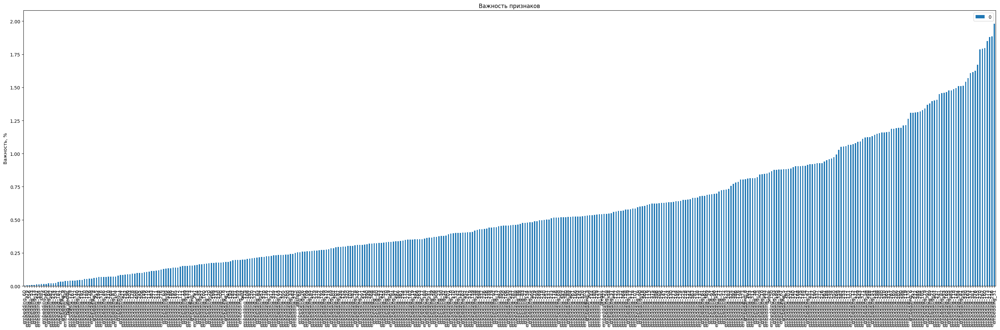

In [ ]:
importance = np.abs(model.coef_[0])
# summarize feature importance
# plot feature importance

importances_reg = pd.DataFrame(data = importance, index = X_train2.columns).sort_values(0)

fig, ax = plt.subplots(figsize=(30,10))
importances_reg.plot.bar(ax=ax)
ax.set_title("Важность признаков")
ax.set_ylabel('Важность, %')
fig.tight_layout()

In [ ]:

tmp2 = importances_reg.T
tmp2[['smile', 'dots', 'qest', 'exclam', 'breaks','big_worlds']]

,smile,dots,qest,exclam,breaks,big_worlds
0,0.856906,0.01429,0.1983,0.253966,0.542922,0.038939


In [ ]:
train_data = pd.read_csv("/content/sample_data/MAKIDONSKY_ALL.csv", index_col = 0)


X = train_data.drop(['label'],axis=1)
y = train_data['label']


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = 30)

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.models import Model
from sklearn.metrics import f1_score


# Определение модели
inputs = Input(shape=X_train.shape[1])
x = Dense(128, activation='relu')(inputs)
x = Dense(64, activation='relu')(x)
outputs = Dense(1, activation='sigmoid')(x)

model = Model(inputs=inputs, outputs=outputs)

# Компиляция модели
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Обучение модели
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Оценка модели
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)
f1 = f1_score(y_test, y_pred)

print('F1 score:', f1)

Epoch 1/100
121/121 [==============================] - 2s 5ms/step - loss: 0.5192 - accuracy: 0.7292 - val_loss: 0.3359 - val_accuracy: 0.8641
Epoch 2/100
121/121 [==============================] - 0s 4ms/step - loss: 0.2858 - accuracy: 0.8799 - val_loss: 0.2318 - val_accuracy: 0.9108
Epoch 3/100
121/121 [==============================] - 0s 4ms/step - loss: 0.2215 - accuracy: 0.9115 - val_loss: 0.2021 - val_accuracy: 0.9253
Epoch 4/100
121/121 [==============================] - 0s 4ms/step - loss: 0.2170 - accuracy: 0.9136 - val_loss: 0.2092 - val_accuracy: 0.9170
Epoch 5/100
121/121 [==============================] - 0s 4ms/step - loss: 0.1699 - accuracy: 0.9328 - val_loss: 0.2328 - val_accuracy: 0.9077
Epoch 6/100
121/121 [==============================] - 0s 4ms/step - loss: 0.1582 - accuracy: 0.9380 - val_loss: 0.1842 - val_accuracy: 0.9305
Epoch 7/100
121/121 [==============================] - 0s 4ms/step - loss: 0.1468 - accuracy: 0.9422 - val_loss: 0.1694 - val_accuracy: 0.9336